In [1]:
import torch
from torch.autograd import Function, Variable
import torch.nn.functional as F
from torch import nn
from torch.nn.parameter import Parameter
import torch.optim as optim
from torch.nn.utils import parameters_to_vector
from torch.utils.data import TensorDataset, DataLoader

import numpy as np
import numpy.random as npr

import matplotlib
from matplotlib import pyplot as plt

from mpc import mpc
from mpc.mpc import GradMethods, QuadCost, LinDx
from mpc import casadi_control
#from mpc.dynamics import NNDynamics
#import mpc.util as eutil
from mpc.env_dx import frenet_dyn_bicycle  #changed
from mpc.track.src import simple_track_generator, track_functions

import time
import os
import shutil
import pickle as pkl
import collections

import argparse

#from tqdm import tqdm



In [2]:
class NN(nn.Module):
    #changed output dimensions
    def __init__(self, H):
        super(NN, self).__init__()
        self.fc1 = nn.Linear(H + 5, 512)  
        self.fc2 = nn.Linear(512, 512)  
        self.output1 = nn.Linear(512, 10) 
        self.output2 = nn.Linear(512, 10) 

    def forward(self, c, x0):
        combined = torch.cat((c, x0), dim=1)
        x = F.relu(self.fc1(combined))
        x = F.relu(self.fc2(x))
        q = F.relu(self.output1(x)) + 0.0001
        p = self.output2(x)
        return q, p
    
def penalty_d(d, th, factor=100000):  
    overshoot_pos = (d - th).clamp(min=0)
    overshoot_neg = (-d - th).clamp(min=0)
    penalty_pos = torch.exp(overshoot_pos) - 1
    penalty_neg = torch.exp(overshoot_neg) - 1 
    return factor*(penalty_pos + penalty_neg)

def penalty_v(v, th, factor=100000):  
    penalty_pos = (v - th).clamp(min=0) ** 2
    return factor*penalty_pos

def penalty_ac(self, ac, factor=1000.):  
        penalty = (ac - ac_max).clamp(min=0) ** 2
        return factor*penalty

In [3]:
# Let's try to create a track 

track_density = 300
track_width = 0.5

gen = simple_track_generator.trackGenerator(track_density,track_width)
track_name = 'LONG_TRACK'

t = 0.3
init = [0,0,0]

track_function = {
    'DEMO_TRACK'    : track_functions.demo_track,
    'HARD_TRACK'    : track_functions.hard_track,
    'LONG_TRACK'    : track_functions.long_track,
    'LUCERNE_TRACK' : track_functions.lucerne_track,
    'BERN_TRACK'    : track_functions.bern_track,
    'INFINITY_TRACK': track_functions.infinity_track,
    'SNAIL_TRACK'   : track_functions.snail_track
}.get(track_name, track_functions.demo_track)
    
track_function(gen, t, init)
    
gen.populatePointsAndArcLength()
gen.centerTrack()

track_coord = torch.from_numpy(np.vstack([gen.xCoords, gen.yCoords, gen.arcLength, gen.tangentAngle, gen.curvature]))

In [4]:
device = 'cpu' #to do

mpc_T = 25
n_batch = 32
H_curve = 80

l_r = 0.2
l_f = 0.2

v_max = 2.5
a_max = 3.
delta_max = 0.4 # taken from hardware

ac_max = (0.7*v_max)**2 * delta_max / (l_r+l_f)

dt = 0.04

params = torch.tensor([l_r, l_f, track_width, v_max, ac_max, dt, a_max, delta_max])

In [5]:
true_dx = frenet_dyn_bicycle.FrenetDynBicycleDx(track_coord, params)

u_lower = torch.tensor([-a_max, -delta_max]).unsqueeze(0).unsqueeze(0).repeat(mpc_T, n_batch, 1)
u_upper = torch.tensor([a_max, delta_max]).unsqueeze(0).unsqueeze(0).repeat(mpc_T, n_batch, 1)
u_init= torch.tensor([0.1, 0.0]).unsqueeze(0).unsqueeze(0).repeat(mpc_T, n_batch, 1)

n_state = true_dx.n_state
n_ctrl = true_dx.n_ctrl

eps = 5
lqr_iter = 20
grad_method = GradMethods.AUTO_DIFF

#softplus_op = torch.nn.Softplus(10)

10


In [6]:
def sample_xinit(n_batch):
    def uniform(shape, low, high):
        r = high-low
        return torch.rand(shape)*r+low
    sigma = uniform(n_batch, 0.01, 20.)
    d = uniform(n_batch, -track_width*0.4, track_width*0.4)
    phi = uniform(n_batch, -0.4*np.pi, 0.4*np.pi)
    r = uniform(n_batch, -0.05*np.pi, 0.05*np.pi)
    v_x = uniform(n_batch, 1., v_max)
    v_y = uniform(n_batch, 0., 0.05)

    sigma_0 = sigma
    sigma_diff = sigma-sigma_0
    
    d_pen = penalty_d(d, 0.4*track_width)
    v_ub = penalty_v(v_x, v_max)
    
    k = true_dx.curv(sigma)
    #ac = v**2 * 0.01 / (l_r+l_f)
    
    #ac_ub = penalty_v(ac, ac_max)

    xinit = torch.stack((sigma, d, phi, r, v_x, v_y, sigma_0, sigma_diff, d_pen, v_ub), dim=1)
    return xinit


def get_nearest_index(point_f, ref_path):
    return ((point_f[0] - ref_path[2,:])**2).argmin()
    
def compute_x_coord(point_f, ref_path, nearest_index):
    return ref_path[0,nearest_index] - point_f[1]*torch.sin(ref_path[3,nearest_index])

def compute_y_coord(point_f, ref_path, nearest_index):
    return ref_path[1,nearest_index] + point_f[1]*torch.cos(ref_path[3,nearest_index])

def frenet_to_cartesian(point_f, ref_path):     
    nearest_index = get_nearest_index(point_f, ref_path)
    x = compute_x_coord(point_f, ref_path, nearest_index)
    y = compute_y_coord(point_f, ref_path, nearest_index)
    
    return torch.tensor([x, y])

def get_loss_progress(x_init, dx, _Q, _p, mpc_T=mpc_T):    
        
        pred_x, pred_u, pred_objs = mpc.MPC(
            dx.n_state, dx.n_ctrl, mpc_T,
            u_lower=u_lower, u_upper=u_upper, u_init=u_init,
            lqr_iter=lqr_iter,
            verbose=0,
            exit_unconverged=False,
            detach_unconverged=False,
            linesearch_decay=.8,
            max_linesearch_iter=10,
            grad_method=grad_method,
            eps=eps,
            n_batch=n_batch,
        )(x_init, QuadCost(_Q, _p), dx)
        
        progress_loss = torch.mean(-pred_x[mpc_T-1,:,0] + pred_x[0,:,0])
                    
        return progress_loss
    
    
    
def get_curve_hor_from_x(x, track_coord, mpc_T):
    idx_track_batch = ((x[:,0]-track_coord[[2],:].T)**2).argmin(0)
    idcs_track_batch = idx_track_batch[:, None] + torch.arange(mpc_T)
    curvs = track_coord[4,idcs_track_batch].float()
    return curvs

def cost_to_batch_NN(q, p, n_batch, mpc_T):
    Q_batch = torch.zeros(n_batch, q.shape[1], q.shape[1])
    rows, cols = torch.arange(q.shape[1]), torch.arange(q.shape[1])  
    Q_batch[:, rows, cols] = q 
    Q_batch = Q_batch.unsqueeze(0).repeat(
                mpc_T, 1, 1, 1)    
    p_batch = p.unsqueeze(0).repeat(mpc_T, 1, 1)
    return Q_batch, p_batch

def cost_to_batch(q, p, n_batch, mpc_T):
    Q_batch = torch.diag(q).unsqueeze(0).unsqueeze(0).repeat(
                mpc_T, n_batch, 1, 1
            )
    p_batch = p.unsqueeze(0).repeat(mpc_T, n_batch, 1)   
    return Q_batch, p_batch

def bound_params(q, p):
    q[:,0] = 0.0001
    q[:,6] = 0.0001
    p[:,0] = -0.0001
    q[:,1] = q[:,1] + 10.0
    q = q.clip(0.00001, 40.)
    p[:,0] = 0.0
    p[:,1] = 0.0
    p[:,2] = 0.0
    p[:,6] = 0.0
    p2 = p.clone()
    p2 = p.clip(-70.)
    p2[:,4] = p[:,4].clip(-70.)
    q2 = q.clone()
    return q2, p2

# -----------------NOT YET ADJUSTED------------------------------------------------------
def inference_params(x_in, track_coord, H_curve, model, q_pen, p_pen, N, mpc_T):
    curvs = get_curve_hor_from_x(x_in, track_coord, H_curve)
    q, p = model(curvs, x_in[:,1:6])
    q = torch.cat((q[:,:8], q_pen, q[:,8:]), dim=1)
    p = torch.cat((p[:,:8], p_pen, p[:,8:]), dim=1)
    q2, p2 = bound_params(q, p) 
    Q_batch, p_batch = cost_to_batch_NN(q2, p2, N, mpc_T)
    return Q_batch, p_batch
# ----------------------------------------------------------------------------------------
# From here onwards I did not adjust much - we can discuss

In [7]:
env_params = true_dx.params
track_coord = track_coord.to(device)
dx = true_dx.__class__(track_coord,env_params)

q_penalty = .0001*torch.ones(2).to(device)
p_penalty = torch.ones(2).to(device)

model = NN(H_curve)
opt = optim.Adam(model.parameters(), lr=8e-4)
q_penalty_batch = q_penalty.unsqueeze(0).repeat(n_batch,1)
p_penalty_batch = p_penalty.unsqueeze(0).repeat(n_batch,1)

10


In [8]:
for i in range(600):
    
    x_init = sample_xinit(n_batch).to(device)
    
    Q_batch, p_batch = inference_params(
        x_init, track_coord, H_curve, model, 
        q_penalty_batch, p_penalty_batch, 
        n_batch, mpc_T)
           
    loss = get_loss_progress(x_init, dx, Q_batch, p_batch)

    opt.zero_grad()
    loss.backward()
    opt.step()
    
    print('Batch:', i , ' Progression with MPC_T=',mpc_T ,': ', -round(loss.item(), 4))

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0.

/home/rahel/.local/lib/python3.10/site-packages/torch/_tensor.py:770: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(
/home/rahel/projects/differentiable_mpc/racingDiffMPC/mpc/pnqp.py:19: UserWarning: torch.lu_solve is deprecated in favor of torch.linalg.lu_solveand will be removed in a future PyTorch release.
Note that torch.linalg.lu_solve has its arguments reversed.
X = torch.lu_solve(B, LU, pivots)
should be replaced with
X = torch.linalg.lu_solve(LU, pivots, B) (Triggered internally at ../aten

tensor([-0.0384,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.3214,
         0.1563, -0.1677,  0.2352,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000, -0.4000, -0.1173, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000])
tensor([-0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
         0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000])
tensor([-0.4000,  0.4000,  0.1914,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
         0.4000, -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000,  0.3668])
tensor([-0.4000,  0.4000,  0.4000,  0

tensor([-0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000, -0.1049, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000, -0.3748],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000, -0.1049, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.1572, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000],
       grad_fn=<UnbindBackward0>)
tensor([-0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000,
         0.4000, -0.4000,  0.4000,  0.4000, -0.400

tensor([ 0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,  0.4000])
tensor([-0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,  0.4000,
         0.4000,  0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000])
tensor([ 0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,  0.4000,  0.4000,
         0.4000,  0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,
        -0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000,  0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0

tensor([-0.4000, -0.4000,  0.4000,  0.4000, -0.2926, -0.2926, -0.4000, -0.4000,
         0.4000, -0.4000,  0.2829,  0.2926,  0.2926,  0.2322, -0.2926,  0.2926,
         0.4000,  0.2295, -0.2400,  0.4000, -0.2658, -0.1379, -0.4000,  0.2999,
         0.2926, -0.2322, -0.4000, -0.4000, -0.2926, -0.2926,  0.4000,  0.1120],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000, -0.2980, -0.4000,  0.0723, -0.2926, -0.2926, -0.4000, -0.3366,
         0.4000,  0.0513, -0.0723,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.0975, -0.2400, -0.1379, -0.3031, -0.4000,  0.2926,  0.3331,
         0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,  0.3880],
       grad_fn=<UnbindBackward0>)
tensor([-0.0015, -0.4000,  0.4000,  0.0723, -0.4000, -0.4000, -0.4000, -0.2074,
         0.4000, -0.4000,  0.3084,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000, -0.4000, -0.2400, -0.1379, -0.4000,  0.2976,  0.2926, -0.0096,
         0.4000, -0.4000,  0.4000,  0.4000, -0.400

tensor([-0.4000, -0.4000,  0.4000, -0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
         0.2926, -0.1120,  0.4000,  0.4000,  0.4000, -0.2794, -0.4000,  0.4000,
        -0.1130,  0.4000, -0.4000,  0.1730,  0.4000,  0.3476,  0.4000, -0.4000,
         0.4000,  0.2868, -0.0096, -0.4000,  0.4000,  0.4000, -0.1120, -0.2963])
tensor([-0.1680, -0.4000,  0.4000,  0.4000, -0.2436,  0.4000, -0.1474, -0.4000,
         0.1193, -0.4000,  0.3190,  0.1111,  0.1111,  0.3396, -0.1997,  0.1474,
         0.1764,  0.2689, -0.4000,  0.4000, -0.1764, -0.4000, -0.4000,  0.0818,
         0.1997, -0.0665, -0.0096,  0.4000,  0.4000, -0.1111, -0.4000,  0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0.4000, -0.1764,  0.4000, -0.2926, -0.4000,
         0.2926, -0.4000,  0.3026,  0.3208,  0.3208,  0.3396, -0.3070,  0.3151,
         0.4000,  0.4000,  0.4000,  0.4000, -0.2838, -0.3476, -0.4000,  0.0984,
         0.3070, -0.2762,  0.0096,  0.4000, -0.3190, -0.3208,  0.3612, -0.2157])
tensor([ 0.4000,  0.4000, -0.4000, -0

tensor([-0.0066, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,
         0.0646, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.0172, -0.4000, -0.0039,
         0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
         0.4000, -0.4000, -0.3594,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.1639,
         0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000])
tensor([ 0.4000, -0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.3183,
         0.1349, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.3785,  0.4000,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.2167,
         0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000])
tensor([-0.2357, -0.4000, -0.4000,  0

tensor([ 0.4000, -0.4000,  0.1379, -0.4000, -0.2233,  0.4000, -0.4000,  0.1379,
         0.4000,  0.4000, -0.1338,  0.1717,  0.4000,  0.4000,  0.1074, -0.4000,
        -0.0819,  0.2791,  0.4000, -0.4000, -0.0991, -0.3811, -0.1724, -0.0096,
         0.3366,  0.4000, -0.0751,  0.1440,  0.4000,  0.4000, -0.4000, -0.2404])
tensor([-0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
         0.4000,  0.0558,  0.4000,  0.2322,  0.4000, -0.1370,  0.4000,  0.4000,
        -0.4000,  0.4000, -0.4000,  0.0961,  0.4000, -0.1309,  0.4000, -0.4000,
         0.4000,  0.4000,  0.0591, -0.4000,  0.2834,  0.4000, -0.0433, -0.3102])
tensor([-0.0066, -0.4000,  0.4000,  0.4000, -0.1087,  0.4000, -0.2004, -0.4000,
         0.0646, -0.4000,  0.3299,  0.1717,  0.4000,  0.1845, -0.3022,  0.4000,
         0.4000,  0.2865, -0.4000,  0.4000, -0.2064, -0.1550, -0.4000,  0.0379,
         0.2817, -0.4000, -0.0751,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000],
       grad_fn=<UnbindBackward0>)
ten

tensor([-0.0547, -0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
         0.3862, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.2080,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000])
tensor([ 0.4000, -0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
        -0.4000, -0.4000,  0.2138,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
        -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.0822,
        -0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000])
tensor([ 0.4000, -0.4000, -0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.3964,
        -0.4000, -0.4000, -0.1848,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.3670, -0.1754,
        -0.4000, -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000])
tensor([ 0.4000, -0.2449, -0.4000,  0

tensor([ 0.4000, -0.4000, -0.0657,  0.2400, -0.4000,  0.1120,  0.4000, -0.3668,
        -0.4000,  0.2320, -0.4000,  0.3630,  0.4000,  0.4000,  0.1329,  0.4000,
         0.4000,  0.2503, -0.1163,  0.1715, -0.4000,  0.3660,  0.4000, -0.0620,
         0.1673,  0.4000, -0.4000, -0.4000, -0.1111, -0.2926,  0.4000, -0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0.1631,  0.4000,  0.4000,  0.4000, -0.4000,
         0.4000, -0.1776, -0.4000, -0.4000, -0.4000,  0.4000, -0.1908,  0.4000,
        -0.4000,  0.4000,  0.0089,  0.0657,  0.4000, -0.2640, -0.4000, -0.0052,
         0.2130, -0.2926, -0.4000, -0.4000,  0.0416, -0.2926,  0.0767,  0.4000])
tensor([-0.4000,  0.4000,  0.0657,  0.1448, -0.4000,  0.1120, -0.4000, -0.1910,
         0.4000, -0.0096, -0.4000,  0.3009,  0.2926,  0.4000,  0.4000, -0.2926,
        -0.4000,  0.4000, -0.4000, -0.3375,  0.4000, -0.0866, -0.4000, -0.4000,
         0.2201,  0.4000,  0.4000,  0.2040,  0.4000,  0.4000,  0.3070, -0.4000])
tensor([-0.3924, -0.3050,  0.4000, -0

tensor([-0.1154, -0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
         0.4000,  0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.0249,
        -0.4000,  0.4000, -0.4000, -0.2067,  0.4000,  0.4000,  0.4000,  0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.2920,
        -0.4000, -0.4000, -0.0323,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.0005,
         0.4000, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000,  0.4000, -0.4000])
tensor([ 0.4000,  0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.3102,
        -0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.3583,  0.4000,
         0.4000,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.0207,
         0.4000, -0.4000, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.0704])
tensor([-0.4000,  0.4000, -0.4000, -0

tensor([-0.4000, -0.4000,  0.3070,  0.4000, -0.2926,  0.0046, -0.4000, -0.3136,
        -0.4000, -0.4000,  0.0563,  0.3680,  0.3070,  0.3756, -0.3690,  0.3070,
         0.2838,  0.4000,  0.1544,  0.4000, -0.2926, -0.3907, -0.4000,  0.0145,
         0.2938, -0.3070,  0.4000,  0.4000, -0.4000, -0.3070,  0.4000, -0.4000],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000,  0.1745, -0.4000, -0.1541, -0.2926,  0.4000,  0.4000, -0.3177,
        -0.4000,  0.4000,  0.1895,  0.4000,  0.4000,  0.4000, -0.3869,  0.4000,
         0.4000,  0.4000,  0.1997,  0.1858, -0.4000,  0.3717, -0.2641, -0.1329,
         0.3208, -0.4000, -0.4000,  0.4000, -0.4000, -0.3070, -0.3733,  0.0704],
       grad_fn=<UnbindBackward0>)
tensor([-0.4000,  0.2041, -0.4000,  0.2926, -0.4000, -0.1724, -0.4000, -0.1381,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.3978,  0.4000,
         0.4000,  0.4000,  0.0470, -0.0390,  0.2926,  0.3964,  0.4000, -0.1903,
         0.3208, -0.4000, -0.4000, -0.4000, -0.228

tensor([-0.4000,  0.1902,  0.3226,  0.3427, -0.1474, -0.1474,  0.4000, -0.4000,
         0.4000,  0.4000,  0.3423,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,
         0.1764,  0.4000,  0.0694, -0.4000, -0.4000,  0.4000, -0.4000, -0.2294,
         0.2926, -0.4000, -0.0657, -0.0767, -0.4000, -0.4000, -0.3577,  0.4000])
tensor([-0.2524, -0.1120, -0.3106,  0.3050, -0.2057, -0.2029, -0.1764, -0.4000,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.1669, -0.4000,
         0.2658, -0.2157, -0.2926, -0.3027, -0.3891, -0.3517, -0.4000, -0.2976,
         0.1029, -0.4000, -0.4000, -0.2592,  0.4000, -0.4000, -0.3830, -0.1379])
tensor([-0.2660,  0.3377,  0.2658,  0.3309,  0.4000, -0.4000, -0.2838, -0.3567,
         0.4000,  0.4000, -0.0287,  0.3936, -0.2943,  0.3913,  0.0136,  0.4000,
         0.3231, -0.4000,  0.0600, -0.2943,  0.4000, -0.2502, -0.4000, -0.2762,
        -0.1420, -0.4000,  0.4000,  0.1796, -0.4000,  0.4000, -0.1205, -0.2005])
tensor([-0.2473,  0.4000, -0.3106,  0

tensor([-0.4000, -0.4000, -0.0697,  0.1228, -0.2322,  0.0956,  0.1764, -0.3955,
        -0.4000,  0.4000,  0.1507,  0.3936,  0.4000,  0.4000,  0.4000, -0.4000,
         0.4000,  0.2366,  0.0130, -0.1470, -0.3070,  0.3898,  0.4000, -0.2528,
        -0.0026,  0.4000, -0.1730, -0.2223,  0.4000, -0.4000,  0.4000, -0.4000],
       grad_fn=<UnbindBackward0>)
tensor([-0.4000,  0.1120,  0.1764,  0.1751,  0.4000,  0.2926,  0.1764,  0.0303,
         0.2838, -0.4000,  0.1507, -0.4000, -0.4000,  0.4000, -0.0429,  0.4000,
        -0.4000, -0.0453,  0.1069,  0.1801,  0.2926,  0.2011, -0.4000, -0.4000,
         0.1971,  0.4000, -0.1730, -0.3457,  0.2135,  0.4000, -0.3246, -0.1379],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000, -0.4000,  0.0249,  0.2042, -0.4000,  0.0577, -0.4000,  0.4000,
         0.1764, -0.4000,  0.1507,  0.3828, -0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000,  0.4000, -0.2926, -0.0851,  0.2926,  0.2059,  0.4000, -0.4000,
         0.2007,  0.4000,  0.1730, -0.1875,  0.400

tensor([-0.0540, -0.4000,  0.3061,  0.4000,  0.1292,  0.2203, -0.0597, -0.3991,
        -0.0723,  0.4000,  0.4000,  0.3962,  0.0723,  0.4000,  0.4000, -0.4000,
         0.0723, -0.0242, -0.4000,  0.4000, -0.3451,  0.3940,  0.4000, -0.3131,
         0.4000,  0.4000,  0.4000, -0.2951,  0.4000, -0.0723,  0.0723, -0.4000])
tensor([-0.2351, -0.2157,  0.3553,  0.4000,  0.4000,  0.0089, -0.4000, -0.3139,
         0.3314, -0.4000, -0.0749, -0.4000, -0.4000,  0.4000,  0.1385,  0.0723,
        -0.0777,  0.1371, -0.4000,  0.4000,  0.3366, -0.0451, -0.0723, -0.4000,
         0.4000,  0.4000,  0.4000, -0.1288, -0.0557,  0.4000, -0.0278,  0.2064])
tensor([-0.4000, -0.4000,  0.3250,  0.4000, -0.0723,  0.1979, -0.4000, -0.2400,
        -0.0597, -0.4000, -0.0749,  0.3899, -0.4000,  0.4000,  0.4000, -0.0723,
        -0.4000,  0.1236, -0.4000,  0.4000,  0.3366,  0.2854,  0.4000, -0.2803,
         0.4000,  0.0723,  0.4000, -0.2746,  0.4000,  0.0723, -0.0354, -0.4000])
tensor([-0.3562, -0.3940, -0.2579, -0

tensor([-0.2429, -0.1875, -0.2555,  0.4000, -0.1102, -0.2136,  0.4000, -0.4000,
         0.2926, -0.0096,  0.1867,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,
         0.0991,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.2926, -0.2523,
         0.4000, -0.2926, -0.4000, -0.0128, -0.4000, -0.4000, -0.3634, -0.1120],
       grad_fn=<UnbindBackward0>)
tensor([-0.2193, -0.2963,  0.2579,  0.4000, -0.2318, -0.0449, -0.0991,  0.2400,
         0.4000,  0.4000,  0.2322,  0.4000,  0.4000,  0.4000, -0.2158, -0.2926,
        -0.2910, -0.2466,  0.4000, -0.4000, -0.3920, -0.1940, -0.2926, -0.3113,
        -0.4000, -0.3913,  0.4000, -0.2781,  0.4000, -0.2236, -0.2779,  0.2064],
       grad_fn=<UnbindBackward0>)
tensor([-0.2005, -0.1344,  0.3732,  0.4000,  0.4000, -0.1903, -0.2994, -0.4000,
         0.4000,  0.4000,  0.4000,  0.3949, -0.3085,  0.4000, -0.1782,  0.4000,
         0.2261, -0.4000,  0.4000,  0.4000,  0.1903, -0.1138,  0.4000, -0.2928,
         0.4000, -0.4000,  0.4000,  0.1018, -0.265

tensor([ 0.4000, -0.4000,  0.3935,  0.4000, -0.3785,  0.4000, -0.4000, -0.4000,
         0.3584, -0.4000,  0.4000, -0.3908, -0.4000,  0.0841,  0.4000, -0.3785,
        -0.2847,  0.3749,  0.2400,  0.4000,  0.3581,  0.2405, -0.3785,  0.4000,
        -0.4000,  0.3785,  0.4000, -0.4000,  0.3072, -0.4000,  0.2691, -0.4000])
tensor([-0.4000, -0.4000,  0.3946, -0.3590, -0.3995, -0.4000, -0.0307, -0.4000,
         0.3814,  0.4000,  0.4000,  0.3973,  0.4000, -0.4000,  0.4000,  0.4000,
        -0.4000,  0.3831, -0.4000, -0.2400,  0.4000,  0.3516,  0.4000, -0.1351,
         0.4000,  0.4000,  0.4000, -0.0317,  0.4000,  0.4000, -0.3915, -0.2976])
tensor([-0.1824, -0.4000,  0.0995,  0.4000, -0.2826,  0.4000,  0.1817, -0.4000,
         0.2667, -0.4000,  0.4000,  0.3269, -0.1507, -0.1120, -0.4000, -0.1507,
         0.3312,  0.3864, -0.4000,  0.4000, -0.2713, -0.3135, -0.4000,  0.1369,
        -0.1120,  0.1507, -0.1120,  0.3162,  0.4000,  0.1507,  0.2245,  0.4000])
tensor([-0.4000, -0.4000,  0.3944,  0

tensor([ 0.4000,  0.3388, -0.4000,  0.4000,  0.3364, -0.4000,  0.3314, -0.1570,
         0.3005,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000,
         0.4000,  0.3609, -0.4000, -0.2926, -0.2240, -0.2730,  0.3070, -0.4000,
         0.2926, -0.3106,  0.2926,  0.4000,  0.4000, -0.4000, -0.2791, -0.3183],
       grad_fn=<UnbindBackward0>)
tensor([-0.2174,  0.2494,  0.0771,  0.4000, -0.1997,  0.4000, -0.3314, -0.4000,
         0.4000, -0.4000, -0.4000,  0.4000,  0.3070,  0.4000, -0.4000,  0.3106,
         0.4000, -0.2046,  0.4000, -0.2926, -0.4000,  0.2328,  0.2926, -0.4000,
         0.2926, -0.4000,  0.2926, -0.4000,  0.4000,  0.4000,  0.1099, -0.2570],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000, -0.0545,  0.1159,  0.4000, -0.4000, -0.4000,  0.0399,  0.4000,
         0.3596,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000,  0.4000,
         0.3693,  0.0763,  0.4000, -0.4000,  0.1498,  0.1027, -0.1488, -0.4000,
         0.0633, -0.3106, -0.2926, -0.4000,  0.283

tensor([-0.3666, -0.4000, -0.3159,  0.4000, -0.1828, -0.1379,  0.4000, -0.0723,
        -0.2905,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000,
        -0.0718,  0.4000,  0.2926,  0.4000, -0.2322,  0.4000, -0.0991, -0.4000,
         0.4000, -0.4000, -0.4000,  0.0096, -0.3070, -0.2926, -0.2574, -0.4000])
tensor([-0.2599, -0.3470,  0.0903,  0.4000, -0.2778, -0.4000,  0.4000, -0.4000,
         0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000,  0.2926,  0.1554,
        -0.1666, -0.0081,  0.2878, -0.2322, -0.2267,  0.0416,  0.1068,  0.4000,
        -0.3070, -0.2256,  0.1111, -0.4000,  0.4000, -0.2069, -0.3120,  0.0997])
tensor([-0.2835, -0.1569,  0.3844,  0.3951,  0.2926,  0.4000, -0.4000, -0.4000,
        -0.2400, -0.4000, -0.4000,  0.3991, -0.4000,  0.4000, -0.4000,  0.4000,
         0.1460,  0.4000,  0.2838,  0.2322,  0.0887, -0.2791,  0.1764, -0.4000,
         0.1997, -0.4000,  0.1903, -0.4000, -0.4000,  0.1498, -0.2256, -0.0816])
tensor([-0.3243,  0.0089, -0.2822,  0

tensor([-0.1511, -0.4000, -0.4000,  0.4000, -0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000, -0.4000, -0.4000,  0.4000,  0.4000, -0.4000,
         0.4000, -0.1432, -0.4000,  0.4000, -0.4000, -0.4000, -0.4000,  0.0177,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.1477,  0.4000])
tensor([-0.4000, -0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.1369,
        -0.4000, -0.4000,  0.4000, -0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
         0.3277, -0.1903, -0.4000,  0.4000,  0.4000, -0.4000, -0.4000, -0.4000,
         0.4000,  0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.2816,  0.4000])
tensor([ 0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000, -0.4000,  0.4000, -0.4000, -0.4000,
         0.4000, -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000, -0.4000])
tensor([-0.2871,  0.4000, -0.4000, -0

tensor([-0.4000, -0.4000,  0.3922,  0.4000, -0.1400,  0.0824, -0.4000, -0.1643,
        -0.4000,  0.1111,  0.4000,  0.2919,  0.2926,  0.3821, -0.3208,  0.2926,
         0.2289, -0.1903,  0.0991,  0.4000, -0.2138, -0.3993, -0.4000, -0.4000,
         0.4000, -0.2926,  0.4000,  0.4000, -0.1250, -0.4000,  0.2816,  0.1806],
       grad_fn=<UnbindBackward0>)
tensor([ 0.4000,  0.2199, -0.4000,  0.4000, -0.3523, -0.2452,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.2926,  0.4000, -0.3397,  0.2926,
         0.1153, -0.4000,  0.4000, -0.0739, -0.4000,  0.3980, -0.4000, -0.3214,
         0.4000, -0.4000, -0.4000,  0.4000, -0.1126,  0.4000, -0.4000, -0.3206],
       grad_fn=<UnbindBackward0>)
tensor([-0.2871,  0.2206, -0.4000, -0.4000, -0.4000,  0.4000, -0.4000, -0.2879,
        -0.4000,  0.1903, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,
         0.2791,  0.4000,  0.2994, -0.0739,  0.3352,  0.3997,  0.4000, -0.4000,
         0.4000, -0.3610, -0.4000, -0.4000, -0.234

tensor([-0.1739, -0.4000,  0.1966,  0.4000, -0.0897,  0.4000, -0.1730, -0.4000,
         0.2404, -0.4000,  0.4000,  0.1733,  0.1997,  0.2539, -0.4000,  0.1997,
         0.4000,  0.1349, -0.4000, -0.4000, -0.4000, -0.1859, -0.4000,  0.1015,
         0.1379, -0.1997,  0.4000,  0.4000,  0.4000, -0.2926,  0.1488,  0.4000])
tensor([-0.4000, -0.4000,  0.2859,  0.4000, -0.1836,  0.0177, -0.4000, -0.1594,
        -0.4000,  0.0425,  0.3120,  0.3064,  0.1997,  0.2772, -0.4000,  0.1997,
         0.4000,  0.1120,  0.1394, -0.4000, -0.4000, -0.3994, -0.4000, -0.4000,
         0.1379, -0.3070,  0.4000,  0.4000, -0.0149, -0.2926,  0.2946,  0.1026])
tensor([ 0.4000, -0.2760, -0.4000,  0.4000, -0.2261, -0.1586,  0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.3070,  0.4000, -0.4000,  0.3070,
         0.4000, -0.4000,  0.2926, -0.4000,  0.4000,  0.3983, -0.2926, -0.3724,
         0.4000, -0.2926, -0.4000,  0.4000, -0.0642,  0.4000, -0.4000, -0.3312])
tensor([-0.4000,  0.3641, -0.4000, -0

tensor([ 0.4000, -0.4000,  0.2123, -0.4000, -0.2526,  0.4000, -0.4000, -0.1689,
        -0.2021, -0.2926,  0.4000, -0.3940, -0.3070, -0.3694,  0.4000, -0.2926,
        -0.4000,  0.2300, -0.1394, -0.4000,  0.4000, -0.0559, -0.2926, -0.4000,
         0.4000, -0.3070,  0.4000, -0.4000,  0.3317,  0.4000,  0.2490, -0.3291],
       grad_fn=<UnbindBackward0>)
tensor([-0.4000, -0.4000,  0.3883,  0.4000, -0.3987, -0.4000, -0.0635, -0.4000,
        -0.1056,  0.1498,  0.4000,  0.2909,  0.4000, -0.4000,  0.4000,  0.4000,
        -0.4000,  0.4000, -0.4000,  0.4000,  0.4000,  0.0640,  0.4000,  0.4000,
         0.4000,  0.4000,  0.4000, -0.4000,  0.3493,  0.4000, -0.2926,  0.1026],
       grad_fn=<UnbindBackward0>)
[WARNING] pnqp warning: Did not converge
tensor([-0.2680, -0.4000,  0.4000,  0.4000,  0.0854,  0.4000, -0.4000, -0.4000,
        -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.4000,  0.4000,
        -0.4000,  0.4000, -0.4000,  0.4000,  0.3417, -0.4000, -0.4000,  0.1064,
         

tensor([-0.2759, -0.4000, -0.2568,  0.0665, -0.2847,  0.3208, -0.2206, -0.4000,
        -0.3095, -0.4000, -0.4000,  0.4000,  0.4000,  0.4000, -0.4000,  0.1514,
        -0.2322,  0.4000,  0.0168, -0.2322, -0.3760, -0.4000,  0.4000, -0.4000,
        -0.2322,  0.4000,  0.4000, -0.0558,  0.4000, -0.1111, -0.2322,  0.2753])
tensor([-0.3760,  0.4000, -0.2568,  0.1736, -0.4000,  0.1111, -0.4000, -0.4000,
         0.3895,  0.4000, -0.2400,  0.4000,  0.4000,  0.4000,  0.4000,  0.4000,
        -0.4000,  0.3951, -0.3414,  0.4000, -0.2322,  0.3433,  0.4000, -0.4000,
        -0.2322,  0.4000,  0.2322,  0.2064,  0.4000, -0.1903, -0.3151, -0.0946])
tensor([-0.2573,  0.4000, -0.0341,  0.4000, -0.2851, -0.0918, -0.0320, -0.3397,
         0.3565,  0.4000,  0.2549,  0.3783, -0.2963,  0.4000, -0.2322,  0.4000,
         0.2322,  0.2505, -0.3414, -0.4000,  0.2322,  0.2536,  0.4000,  0.4000,
         0.0251,  0.4000, -0.4000,  0.0558,  0.4000, -0.4000, -0.1925, -0.3018])
tensor([-0.4000, -0.4000,  0.3995, -0

tensor([-0.1192, -0.4000,  0.1065, -0.4000,  0.1440,  0.0983,  0.0091,  0.2400,
         0.4000,  0.4000,  0.3017,  0.4000, -0.2400,  0.4000, -0.4000, -0.4000,
         0.4000,  0.3648,  0.1526,  0.2926, -0.2926,  0.3364,  0.2400, -0.4000,
         0.2322,  0.4000,  0.2926, -0.2128, -0.0453,  0.3208, -0.4000,  0.2926],
       grad_fn=<UnbindBackward0>)
tensor([-0.1624, -0.4000,  0.2948, -0.1909,  0.2169, -0.3208,  0.0032, -0.4000,
        -0.2703,  0.4000,  0.4000,  0.3966,  0.4000,  0.4000,  0.4000, -0.4000,
        -0.4000,  0.0620, -0.2737,  0.2926,  0.4000,  0.3887,  0.3785, -0.4000,
         0.4000,  0.4000,  0.4000, -0.4000,  0.2810,  0.1903, -0.3070, -0.1906],
       grad_fn=<UnbindBackward0>)
tensor([-0.1822, -0.4000,  0.4000,  0.0913,  0.0321,  0.4000,  0.0334, -0.4000,
        -0.0178, -0.4000, -0.3785, -0.4000, -0.2400,  0.4000,  0.2926,  0.4000,
         0.2905, -0.2956, -0.0168, -0.4000, -0.2926,  0.3535, -0.4000, -0.4000,
         0.4000, -0.4000,  0.3489, -0.2856,  0.400

KeyboardInterrupt: 

In [8]:
N_test = 1
mpc_T_test = mpc_T

In [9]:
#x_init_test = sample_xinit(N_test)

# Below you can put any initial state you want (any that make sense)
sigma = torch.tensor(0.01)

d = torch.tensor(0.1)
d_pen = penalty_d(d, 0.5*track_width*0.75)

r = torch.tensor(0.0)

v_x = torch.tensor(0.5) #make sure this is never 0
v_ub = penalty_v(v_x, v_max*0.95)

v_y = torch.tensor(0.0)  # this can be zero

#ac = true_dx.curv(torch.tensor([sigma])) * v**2
#ac_ub = penalty_ac(ac, torch.tensor(ac_max)*0.95)

sigma_0 = sigma
sigma_diff = sigma-sigma_0

x_init_test = torch.tensor([[sigma, d, -.0, r, v_x, v_y, sigma_0, 
                             sigma_diff, d_pen, v_ub]])

In [10]:
# create simple forward trajectory to warm start solution (make a PID to see whether we can steer it)
x_warmstart = torch.zeros(n_state+n_ctrl,mpc_T_test+1)

u_test = torch.tensor([[-0.2,0.]])
x_warmstart[:,0] = torch.cat((x_init_test,u_test),dim=1)

sigma_ref = 2.
d_ref = 0.
kp_1 = 0.1
kp_2 = 10.2

for i in range(mpc_T_test):
    u_test[0,0] = kp_1*(sigma_ref-x_warmstart[0,i])
    u_test[0,0] = np.clip(u_test[0,0],-2,2)
    u_test[0,1] = kp_2*(d_ref-x_warmstart[1,i])
    print(u_test[0,1])
    x_new = true_dx.forward(x_warmstart[:n_state,i],u_test[0,:])
    x_warmstart[:,i+1] = torch.cat((x_new,u_test),dim=1)
    
print(x_warmstart)

tensor(-1.0200)
tensor([-1.0200])
tensor(-1.0200)
tensor([-1.0200])
tensor(-0.9909)
tensor([-0.9909])
tensor(-0.9310)
tensor([-0.9310])
tensor(-0.8266)
tensor([-0.8266])
tensor(-0.7189)
tensor([-0.7189])
tensor(-0.5883)
tensor([-0.5883])
tensor(-0.4749)
tensor([-0.4749])
tensor(-0.3488)
tensor([-0.3488])
tensor(-0.2423)
tensor([-0.2423])
tensor(-0.1305)
tensor([-0.1305])
tensor(-0.0269)
tensor([-0.0269])
tensor(0.0795)
tensor([0.0795])
tensor(0.1717)
tensor([0.1717])
tensor(0.2668)
tensor([0.2668])
tensor(0.3343)
tensor([0.3343])
tensor(0.4054)
tensor([0.4054])
tensor(0.4665)
tensor([0.4665])
tensor(0.5358)
tensor([0.5358])
tensor(0.5390)
tensor([0.5390])
tensor(0.5634)
tensor([0.5634])
tensor(0.5777)
tensor([0.5777])
tensor(0.5938)
tensor([0.5938])
tensor(0.5684)
tensor([0.5684])
tensor(0.5425)
tensor([0.5425])
tensor([[ 1.0000e-02,  3.0000e-02,  5.0318e-02,  7.0911e-02,  9.1634e-02,
          1.1266e-01,  1.3370e-01,  1.5533e-01,  1.7702e-01,  1.9952e-01,
          2.2220e-01,  2.454

In [11]:
def get_nearest_index(point_f, ref_path):
    return ((point_f[0] - ref_path[2,:])**2).argmin()
    
def compute_x_coord(point_f, ref_path, nearest_index):
    return ref_path[0,nearest_index] - point_f[1]*torch.sin(ref_path[3,nearest_index])

def compute_y_coord(point_f, ref_path, nearest_index):
    return ref_path[1,nearest_index] + point_f[1]*torch.cos(ref_path[3,nearest_index])

def frenet_to_cartesian(point_f, ref_path):     
    nearest_index = get_nearest_index(point_f, ref_path)
    x = compute_x_coord(point_f, ref_path, nearest_index)
    y = compute_y_coord(point_f, ref_path, nearest_index)
    
    return torch.tensor([x, y])

In [12]:
x_list = []
y_list = []

for i in range(x_warmstart.shape[1]):
    xy = frenet_to_cartesian(x_warmstart[:2,i], track_coord)
    x_list.append(xy[0].numpy())
    y_list.append(xy[1].numpy())

In [13]:
x_plot = np.array(x_list)
y_plot = np.array(y_list)

x_init: -0.7499999999999999
y_init: 1.1999999999999995
yaw_init: 0.0
Total Arc Length: 26.8655890901819


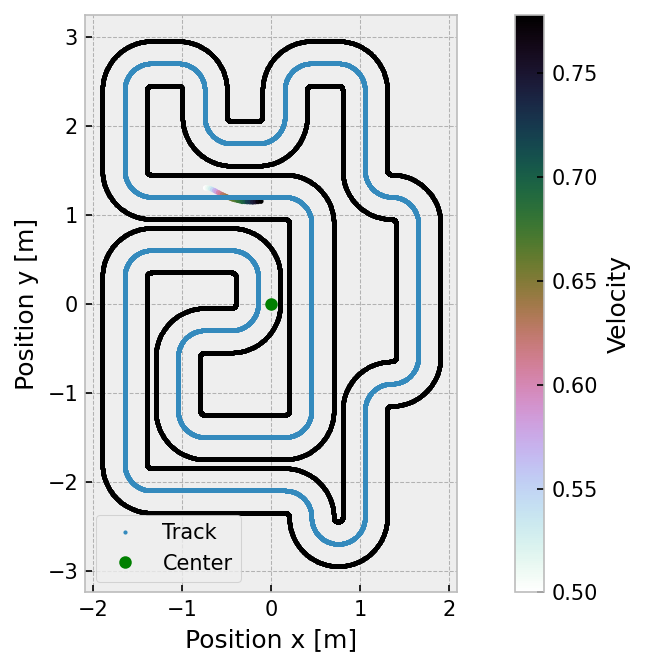

In [14]:
from matplotlib import cm


fig, ax = plt.subplots(1,1, figsize=(10,5), dpi=150)
gen.plotPoints(ax)
#gen.pointAtArcLength(0)
#gen.writePointsToYaml('../tracks/' + track_name + '.yaml', track_density)

custom_cmap = plt.get_cmap('cubehelix').reversed()
sct = ax.scatter(x_plot, y_plot, c=x_warmstart[4,:].detach(), cmap=custom_cmap, s=4)

cbar = plt.colorbar(sct)
cbar.set_label('Velocity') 
#ax.plot(x_plot, y_plot)

#ax.scatter(x_plot[23:25], y_plot[23:25], color='red', s=4)

#ax.scatter(x_plot, y_plot, s=4, color='red')

print('x_init: ' + str(gen.xCoords[0]))
print('y_init: ' + str(gen.yCoords[0]))
print('yaw_init: ' + str(gen.tangentAngle[0]))
print('Total Arc Length: ' + str(gen.arcLength[-1]/2))
plt.show()

In [15]:
# Added here the bounds of U
u_lower_test = torch.tensor([-a_max, -delta_max]).unsqueeze(0).unsqueeze(0).repeat(mpc_T_test, N_test, 1)
u_upper_test = torch.tensor([a_max, delta_max]).unsqueeze(0).unsqueeze(0).repeat(mpc_T_test, N_test, 1)
u_init= torch.tensor([0.1, 0.0]).unsqueeze(0).unsqueeze(0).repeat(mpc_T_test, N_test, 1)

In [ ]:
N_sim_total = 300
x_simulated = torch.zeros((N_sim_total,1,10))

x_simulated[0] = x_init_test[0]

q_penalty_batch = q_penalty.unsqueeze(0).repeat(N_test,1)
p_penalty_batch = p_penalty.unsqueeze(0).repeat(N_test,1)

for i in range(1,N_sim_total):

    x_sim = x_simulated[i-1]
    print('It:', i, 'x=', x_sim.detach().numpy().round(3))

    Q_test_batch, p_test_batch = inference_params(
        x_sim, track_coord, H_curve, model, 
        q_penalty_batch, p_penalty_batch, 
        N_test, mpc_T_test)

    x_mpc_test, u_mpc_test, objs_mpc_test = mpc.MPC(
                n_state, n_ctrl, mpc_T_test,
                u_lower=u_lower_test, u_upper=u_upper_test, u_init=u_init,
                lqr_iter=30,
                verbose=0,
                exit_unconverged=False,
                detach_unconverged=True,
                linesearch_decay=.8,
                max_linesearch_iter=10,
                grad_method=grad_method,
                eps=.5,
                n_batch=N_test,
            )(x_sim, QuadCost(Q_test_batch, p_test_batch), dx)

    x_simulated[i] = x_mpc_test[1]
    x_simulated[i,0,6] = x_simulated[i,0,0]
    x_simulated[i,0,7] = 0.

In [ ]:
u_mpc_test[0]

In [24]:
def get_nearest_index(point_f, ref_path):
    return ((point_f[0] - ref_path[2,:])**2).argmin()
    
def compute_x_coord(point_f, ref_path, nearest_index):
    return ref_path[0,nearest_index] - point_f[1]*torch.sin(ref_path[3,nearest_index])

def compute_y_coord(point_f, ref_path, nearest_index):
    return ref_path[1,nearest_index] + point_f[1]*torch.cos(ref_path[3,nearest_index])

def frenet_to_cartesian(point_f, ref_path):     
    nearest_index = get_nearest_index(point_f, ref_path)
    x = compute_x_coord(point_f, ref_path, nearest_index)
    y = compute_y_coord(point_f, ref_path, nearest_index)
    
    return torch.tensor([x, y])

In [ ]:
x_list = []
y_list = []

for i in range(x_simulated.shape[0]):
    xy = frenet_to_cartesian(x_simulated[i,0,:2], track_coord)
    x_list.append(xy[0].numpy())
    y_list.append(xy[1].numpy())

In [ ]:
x_plot = np.array(x_list)
y_plot = np.array(y_list)

In [ ]:
from matplotlib import cm


fig, ax = plt.subplots(1,1, figsize=(10,5), dpi=150)
gen.plotPoints(ax)
#gen.pointAtArcLength(0)
#gen.writePointsToYaml('../tracks/' + track_name + '.yaml', track_density)

custom_cmap = plt.get_cmap('cubehelix').reversed()
sct = ax.scatter(x_plot, y_plot, c=x_simulated[:,0,3].detach(), cmap=custom_cmap, s=4)

cbar = plt.colorbar(sct)
cbar.set_label('Velocity') 
#ax.plot(x_plot, y_plot)

#ax.scatter(x_plot[23:25], y_plot[23:25], color='red', s=4)

#ax.scatter(x_plot, y_plot, s=4, color='red')

print('x_init: ' + str(gen.xCoords[0]))
print('y_init: ' + str(gen.yCoords[0]))
print('yaw_init: ' + str(gen.tangentAngle[0]))
print('Total Arc Length: ' + str(gen.arcLength[-1]/2))
plt.show()

In [ ]:
curvsp = dx.curv(x_simulated[:250,0,0]).detach()

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(10,10), dpi=150)
axs[0].plot(x_simulated[:250,0,0].detach(), 
         x_simulated[:250,0,1].detach())
axs[0].scatter(x_simulated[:250,0,0].detach(), 
         x_simulated[:250,0,1].detach(), s=10, color='red')
axs[0].set_ylabel('lateral dev (d)')

axs[1].plot(x_simulated[:250,0,0].detach(), 
         curvsp)
axs[1].scatter(x_simulated[:250,0,0].detach(), 
         curvsp, s=10, color='red')
axs[1].set_ylabel('curve')

axs[2].plot(x_simulated[:250,0,0].detach(), 
         1 - curvsp*x_simulated[:250,0,1].detach())
axs[2].scatter(x_simulated[:250,0,0].detach(), 
         1 - curvsp*x_simulated[:250,0,1].detach(), s=10, color='red')
axs[2].set_ylabel('1-d*curve')



In [16]:
from mpc import casadi_control
from importlib import reload
reload(casadi_control)

<module 'mpc.casadi_control' from '/home/rahel/projects/differentiable_mpc/racingDiffMPC/mpc/casadi_control.py'>

In [17]:
control = casadi_control.CasadiControl(track_coord, params.numpy())

dc = 2 #number constraints
df = 2 #number of states we artificially added like sigma_0, sigma_diff
dx = n_state #number states taken from the dynamics (including penalties and sigma_o/sigma_diff)
du = n_ctrl #number control inputs

N_sim_total = 200
x_simulated = torch.zeros((N_sim_total,1,10))

x_simulated[0] = x_init_test[0]

q_penalty_batch = q_penalty.unsqueeze(0).repeat(N_test,1)
p_penalty_batch = p_penalty.unsqueeze(0).repeat(N_test,1)

for i in range(1,N_sim_total):

    x_sim = x_simulated[i-1]
    print('It:', i, 'x=', x_sim.detach().numpy().round(3))

    Q_test_batch, p_test_batch = inference_params(
        x_sim, track_coord, H_curve, model, 
        q_penalty_batch, p_penalty_batch, 
        N_test, mpc_T_test)
    
    test_q = torch.diag(Q_test_batch[0,0]).detach().numpy()
    test_p = p_test_batch[0,0].detach().numpy()
    
    #sigma, d, phi, r, v_x, v_y, sigma_0, sigma_diff, d_pen, v_ub 
    
    test_q=np.array([0.,1.5,0.2,0.1,0.1,0.,0.,0.1,0.,0.,0.5,0.5])
    test_q=np.array([0.,0.,0.,0.,0.,0.,0.,-4.5,100.,100., 0., 0.])

    sol = control.mpc_casadi_with_constraints_paj(
        test_q,test_p,x_sim.detach().numpy(),mpc_T_test,df,dc,dx,du,x_warmstart.numpy())
    
    u_mpc_test = sol[-du*mpc_T_test:]
    x_mpc_test = sol[:-du*mpc_T_test]
    u_mpc_test = u_mpc_test.reshape(mpc_T_test,du)
    x_mpc_test = x_mpc_test.reshape(mpc_T_test+1,dx-dc-df)


    x_simulated[i,0,:6] = torch.tensor(x_mpc_test[1])
    x_simulated[i,0,6] = torch.tensor(x_simulated[i,0,0])
    x_simulated[i,0,7] = 0.

9
It: 1 x= [[ 0.01  0.1  -0.    0.    0.5   0.    0.01  0.    0.    0.  ]]
curv start
curv end
curv start
curv end
curv start
curv end

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     

 106 -9.8834353e+01 4.45e-02 3.48e+01  -1.7 8.21e-01   0.3 1.00e+00 3.15e-01f  1
 107 -1.0166448e+02 3.95e-02 2.57e+01  -1.7 3.66e+00  -0.2 3.42e-01 1.14e-01f  1
 108 -1.0412208e+02 2.66e-02 1.91e+01  -1.7 9.23e-01   0.3 1.00e+00 3.26e-01f  1
 109 -1.0702148e+02 2.48e-02 1.04e+01  -1.7 9.52e-01  -0.2 6.96e-01 4.22e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.0820649e+02 1.04e-02 2.51e+00  -1.7 3.70e-01   0.2 7.73e-01 7.88e-01f  1
 111 -1.0972940e+02 1.34e-02 8.30e+00  -1.7 1.07e+00  -0.3 1.00e+00 5.70e-01f  1
 112 -1.1037819e+02 2.99e-03 3.43e-01  -1.7 2.33e-01   0.2 1.00e+00 1.00e+00f  1
 113 -1.1080453e+02 2.60e-03 6.01e+00  -1.7 4.58e-01  -0.3 1.00e+00 5.00e-01f  1
 114 -1.1148924e+02 1.17e-01 3.63e+00  -1.7 2.72e+00  -0.8 4.33e-01 4.06e-01f  1
 115 -1.1311010e+02 2.40e-01 4.28e+00  -1.7 1.62e+00  -0.4 1.00e+00 8.00e-01f  1
 116 -1.1520000e+02 8.46e-02 1.82e+01  -1.7 5.98e-01   0.1 4.26e-01 9.53e-01f  1
 117 -1.1734496e+02 1.52e-01

/tmp/ipykernel_152740/2054597043.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_simulated[i,0,6] = torch.tensor(x_simulated[i,0,0])


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.2305101e+01 2.49e+03 1.39e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 109 -8.8923010e+01 7.39e-02 4.43e+03  -1.0 2.73e+01    -  3.79e-01 2.77e-03h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -8.8811234e+01 7.41e-02 4.89e+03  -1.0 2.03e+01    -  3.80e-02 7.17e-03h  5
 111 -8.8701192e+01 7.42e-02 1.30e+04  -1.0 1.97e+01    -  4.12e-01 6.59e-03h  5
 112 -8.8639328e+01 7.41e-02 1.69e+04  -1.0 1.43e+01    -  7.30e-02 8.31e-03h  5
 113 -8.8544340e+01 7.45e-02 1.10e+05  -1.0 1.23e+01    -  1.00e+00 1.73e-02h  4
 114 -8.8506394e+01 7.43e-02 1.81e+05  -1.0 1.15e+01    -  1.19e-01 1.65e-02h  4
 115 -8.8483269e+01 7.42e-02 7.00e+05  -1.0 1.17e+01    -  3.71e-01 2.65e-02h  3
 116 -8.8430486e+01 8.48e-02 1.84e+06  -1.0 1.23e+01    -  2.37e-01 8.29e-02w  1
 117 -8.8385282e+01 8.44e-02 1.39e+08  -1.0 1.74e+01    -  4.09e-01 6.49e-03w  1
 118 -8.8230591e+01 8.46e-02 2.57e+09  -1.0 5.05e+01    -  3.89e-02 2.11e-03w  1
 119 -8.8456866e+01 7.52e-02 2.19e+06  -1.0 7.98e+01    -  2.37e-01 4.15e-02h  1
iter    objective    inf_pr 

 131 -1.0537687e+02 3.04e-06 8.65e+07  -1.0 3.77e-05    -  1.00e+00 1.90e-02f  6
 132 -1.0537691e+02 2.26e-06 3.42e+08  -1.0 3.70e-05    -  1.00e+00 2.57e-01h  1
 133 -1.0537691e+02 2.20e-06 2.07e+10  -1.0 2.73e-05    -  1.00e+00 2.32e-02h  1
 134 -1.0537691e+02 2.20e-06 6.33e+04  -1.0 6.38e-09  13.0 1.00e+00 1.00e+00f  1
 135 -1.0537691e+02 2.20e-06 3.09e+11  -2.5 4.97e-06  12.5 1.00e+00 2.03e-03h  1
 136 -1.0537691e+02 2.20e-06 3.37e+15  -2.5 3.05e-05  12.0 1.00e+00 7.86e-05h  1
In iteration 136, 3 Slacks too small, adjusting variable bounds
 137 -1.0537691e+02 2.19e-06 1.01e+18  -2.5 3.56e-06  11.6 1.00e+00 3.31e-03h  1
In iteration 137, 18 Slacks too small, adjusting variable bounds
 138 -1.0537691e+02 2.05e-06 1.44e+19  -2.5 3.66e-06  11.1 1.00e+00 6.57e-02h  1
In iteration 138, 18 Slacks too small, adjusting variable bounds
 139 -1.0537691e+02 2.18e-07 2.81e+12  -2.5 3.30e-06  10.6 1.00e+00 1.00e+00h  1
In iteration 139, 18 Slacks too small, adjusting variable bounds
iter    obje

 109r-1.1705137e+02 5.08e-09 9.97e+02  -7.6 2.22e-02    -  3.98e-04 1.86e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.1737608e+02 1.34e-05 8.10e+03  -9.0 1.66e+00    -  2.89e-06 2.34e-02f  1
In iteration 110, 1 Slack too small, adjusting variable bound
 111 -1.1739348e+02 1.34e-05 8.08e+03  -9.0 4.70e-01    -  3.31e-03 2.14e-03f  1
In iteration 111, 1 Slack too small, adjusting variable bound
 112 -1.1744698e+02 1.36e-05 8.03e+03  -9.0 4.35e-01    -  1.15e-02 6.78e-03f  1
In iteration 112, 1 Slack too small, adjusting variable bound
 113 -1.1744702e+02 1.36e-05 8.72e+03  -9.0 3.97e-01    -  3.57e-01 5.63e-06f  1
In iteration 113, 1 Slack too small, adjusting variable bound
 114 -1.1760265e+02 2.92e-05 9.85e+03  -9.0 5.00e-01    -  5.37e-01 3.92e-02f  1
In iteration 114, 1 Slack too small, adjusting variable bound
 115 -1.1782307e+02 1.80e-04 1.96e+04  -9.0 6.84e-01    -  6.76e-01 8.03e-02f  1
In iteration 115, 1 Slack too small, adjus

It: 6 x= [[ 0.143  0.089 -0.085  4.636  0.945  0.324  0.143  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.5020859e+01 2.49e+03 1.54e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  99 -8.1393966e+02 4.14e+03 5.99e+03  -1.0 5.68e+04  -3.3 5.47e-04 2.62e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -8.0726237e+02 4.11e+03 7.01e+03  -1.0 3.41e+04  -2.9 3.96e-05 6.92e-03h  3
 101 -8.0729436e+02 4.11e+03 3.46e+03  -1.0 1.31e+02  -2.5 2.07e-02 7.50e-04h  1
 102 -8.0771093e+02 4.07e+03 5.16e+03  -1.0 7.76e+01  -2.0 1.73e-04 9.93e-03f  1
 103 -8.0776432e+02 4.06e+03 4.74e+03  -1.0 4.38e+02  -0.7 2.70e-03 8.63e-04h  1
 104 -8.1204814e+02 3.86e+03 1.84e+04  -1.0 6.65e+02  -1.2 4.15e-04 5.37e-02f  1
 105 -8.1206791e+02 3.86e+03 4.69e+03  -1.0 7.42e+01   0.1 1.70e-01 5.70e-04h  1
 106 -8.1213044e+02 3.84e+03 4.65e+03  -1.0 2.04e+02  -0.3 1.88e-03 5.06e-03f  1
 107 -8.1213579e+02 3.84e+03 4.65e+03  -1.0 1.78e+02   1.0 6.22e-05 5.54e-05h  1
 108r-8.1213579e+02 3.84e+03 1.00e+03   2.3 0.00e+00   1.4 0.00e+00 4.03e-07R  5
 109r-7.9866696e+02 3.78e+03 1.00e+03   2.3 8.12e+06    -  3.14e-05 3.40e-05f  1
iter    objective    inf_pr 

 193 -1.2487761e+04 9.62e+04 5.15e+11  -1.0 3.62e+09    -  4.21e-08 3.74e-07f  9
 194 -1.2487732e+04 9.62e+04 5.15e+11  -1.0 2.15e+10    -  6.97e-08 6.30e-08f  9
 195 -1.2487725e+04 9.62e+04 5.19e+11  -1.0 2.41e+10    -  1.18e-07 1.40e-08f 11
 196 -1.2487717e+04 9.62e+04 5.23e+11  -1.0 1.40e+10  -7.3 2.27e-07 2.40e-08h 11
 197r-1.2487717e+04 9.62e+04 1.00e+03   5.0 0.00e+00    -  0.00e+00 5.23e-09R  2
 198r-1.2487702e+04 9.62e+04 1.00e+03   5.0 9.63e+07    -  8.79e-05 1.78e-07f  2
 199r-1.2244936e+04 6.76e+04 9.79e+02   2.9 8.85e+07    -  1.00e+00 1.08e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -1.3553880e+04 6.94e+04 1.88e+01  -1.0 1.09e+11    -  2.74e-05 1.37e-06f  1
 201 -1.4052906e+04 6.94e+04 1.19e+01  -1.0 2.41e+09    -  5.08e-07 1.09e-05f  1
 202 -1.5346626e+04 6.89e+04 1.84e+02  -1.0 3.31e+06  -7.7 6.56e-04 6.29e-03f  1
 203 -1.5516899e+04 6.89e+04 2.00e+02  -1.0 9.42e+09    -  7.85e-05 1.12e-06f  1
 204 -1.6394562e+04 6.89e+04

 374r 1.3911685e+04 2.20e+05 3.86e+05  -1.1 2.69e+00   2.6 5.67e-01 9.52e-01f  1
 375r 1.3913779e+04 2.21e+05 2.09e+05  -1.1 8.19e+00   2.1 3.85e-01 7.69e-01f  1
 376r 1.3917985e+04 2.21e+05 4.16e+04  -1.1 2.02e+01   1.6 2.35e-03 5.70e-01f  1
 377r 1.3918065e+04 2.21e+05 4.00e+04  -1.1 1.02e+01   2.1 3.13e-02 1.83e-01f  1
 378r 1.3918070e+04 2.21e+05 3.97e+04  -1.1 3.32e+00   2.5 1.53e-01 8.82e-03f  1
 379r 1.3918397e+04 2.20e+05 3.45e+04  -1.1 9.56e+00   2.0 7.75e-01 1.30e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 380r 1.3920985e+04 2.19e+05 1.38e+04  -1.1 2.83e+01   1.5 1.79e-01 3.32e-01f  1
 381r 1.3921047e+04 2.19e+05 1.37e+04  -1.1 8.51e+01   1.1 5.32e-02 2.26e-03f  1
 382r 1.3930723e+04 2.19e+05 1.36e+04  -1.1 2.51e+02   0.6 7.64e-04 7.18e-03f  1
 383r 1.3931560e+04 2.18e+05 1.32e+04  -1.1 9.63e+01   1.0 1.27e-01 2.51e-02f  1
 384r 1.3933629e+04 2.17e+05 8.08e+03  -1.1 3.63e+01   1.4 9.20e-01 2.70e-01f  1
 385r 1.3935405e+04 2.15e+05

 471 -9.8984979e+04 7.70e+04 1.56e+06  -1.0 6.29e+02   0.6 1.74e-01 1.41e-02h  1
 472 -9.8986022e+04 7.46e+04 1.72e+06  -1.0 6.32e+02   0.2 2.60e-02 3.09e-02h  1
 473 -9.8988377e+04 7.42e+04 1.71e+06  -1.0 6.39e+02  -0.3 1.27e-03 5.92e-03f  1
 474 -9.8988529e+04 7.42e+04 1.71e+06  -1.0 4.58e+03  -0.8 1.56e-04 2.35e-05h  1
 475 -9.8989527e+04 7.25e+04 1.96e+06  -1.0 6.40e+02   0.5 1.94e-04 2.30e-02f  1
 476 -9.8989647e+04 7.23e+04 1.97e+06  -1.0 6.46e+02   1.0 3.14e-03 3.41e-03h  1
 477 -9.8990006e+04 7.21e+04 1.97e+06  -1.0 6.47e+02   0.5 6.10e-03 2.56e-03h  1
 478 -9.8991353e+04 6.94e+04 3.63e+06  -1.0 6.47e+02   0.9 1.95e-01 3.74e-02h  1
 479 -9.8991450e+04 6.92e+04 3.62e+06  -1.0 6.56e+02   0.4 3.52e-02 2.93e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 480 -9.8993298e+04 6.86e+04 3.60e+06  -1.0 6.57e+02  -0.0 6.69e-03 8.96e-03h  1
 481 -9.8993235e+04 6.84e+04 3.59e+06  -1.0 6.59e+02   0.4 1.24e-02 2.46e-03h  1
 482 -9.8993140e+04 6.84e+04

 575 -7.2647246e+05 1.70e+07 3.38e+04  -1.0 1.24e+04  -4.3 9.78e-04 3.09e-03w  1
 576 -7.2647325e+05 1.70e+07 2.81e+04  -1.0 1.24e+04  -4.8 2.56e-02 3.83e-03w  1
 577r-5.0249207e+05 3.78e+06 1.00e+03   6.5 0.00e+00  -5.3 0.00e+00 3.06e-07R 10
 578r-5.0249185e+05 3.78e+06 1.00e+03   6.5 3.34e+09    -  1.41e-04 3.98e-08f  1
 579r-4.9756881e+05 3.74e+06 9.81e+02   4.4 2.83e+09    -  1.00e+00 1.13e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 580 -5.7002929e+05 5.72e+06 8.53e+00  -1.0 5.85e+14    -  2.09e-06 2.68e-08f  5
 581 -6.5389914e+05 6.77e+06 9.20e+00  -1.0 1.95e+14    -  7.76e-07 1.02e-07f  5
 582 -6.5395546e+05 6.59e+06 3.60e+01  -1.0 3.41e+04  -5.7 4.42e-02 2.67e-02h  1
 583 -6.5432111e+05 6.23e+06 1.32e+02  -1.0 1.02e+05  -6.2 5.07e-02 5.89e-02f  1
 584 -6.5506722e+05 5.99e+06 8.21e+02  -1.0 3.04e+05  -6.7 3.52e-02 3.96e-02f  1
 585 -6.5506724e+05 5.99e+06 8.19e+02  -1.0 1.31e+04  -0.8 4.14e-04 2.07e-04h  1
 586 -6.5506723e+05 5.99e+06

 669 -1.2016320e+07 2.70e+09 4.14e+05  -1.0 6.44e+09    -  9.27e-04 9.67e-03w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 670r-1.4416123e+06 1.07e+07 1.00e+03   6.5 0.00e+00  -0.8 0.00e+00 3.61e-08R 12
 671r-1.4416120e+06 1.07e+07 1.00e+03   6.5 3.29e+09    -  3.61e-04 9.53e-08f  1
 672r-1.4385845e+06 1.03e+07 9.81e+02   4.4 2.33e+09    -  1.00e+00 1.36e-03f  1
 673 -1.5887476e+06 1.46e+07 9.33e+00  -1.0 4.95e+16    -  1.21e-07 1.01e-09f  8
 674 -1.5887478e+06 1.46e+07 2.92e+01  -1.0 1.35e+04  -1.3 2.03e-03 1.90e-03h  1
 675 -1.5887483e+06 1.45e+07 1.36e+02  -1.0 1.38e+04  -1.8 4.39e-02 6.26e-03h  1
 676 -1.5887633e+06 1.27e+07 1.08e+04  -1.0 1.37e+04  -2.3 6.52e-02 1.11e-01h  1
 677 -1.5887650e+06 1.28e+07 1.27e+04  -1.0 1.22e+04  -0.9 1.60e-01 1.15e-02h  1
 678 -1.5887754e+06 1.29e+07 1.56e+04  -1.0 1.20e+04  -1.4 3.00e-02 2.65e-02h  1
 679 -1.5887754e+06 1.29e+07 1.56e+04  -1.0 1.17e+04  -0.1 7.76e-02 3.13e-04h  1
iter    objective    inf_pr 

 763 -1.8531468e+06 3.23e+06 1.07e+02  -1.0 3.03e+14    -  3.09e-07 1.95e-08f  8
 764 -1.8630127e+06 3.25e+06 1.21e+02  -1.0 3.02e+14    -  3.55e-06 1.60e-08f  9
 765 -1.8689477e+06 3.26e+06 1.22e+02  -1.0 2.63e+14    -  3.85e-07 1.10e-08f 10
 766 -1.8755413e+06 3.27e+06 1.45e+02  -1.0 2.61e+14    -  6.32e-06 1.24e-08f 10
 767 -1.8824714e+06 3.28e+06 1.47e+02  -1.0 1.96e+14    -  3.84e-07 1.70e-08f 10
 768 -1.8833437e+06 3.28e+06 5.47e+02  -1.0 1.95e+14    -  7.09e-05 2.15e-09f 13
 769 -1.8843972e+06 3.28e+06 5.53e+02  -1.0 4.99e+13    -  4.69e-07 8.28e-09f 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 770 -5.3239083e+06 4.24e+09 1.81e+05  -1.0 5.01e+13    -  1.69e-06 2.68e-05w  1
 771 -5.3240277e+06 4.22e+09 1.80e+05  -1.0 6.70e+05  -7.0 2.13e-03 2.98e-03w  1
 772 -5.3244395e+06 4.21e+09 1.79e+05  -1.0 2.01e+06  -7.5 5.18e-02 3.34e-03w  1
 773 -1.8846071e+06 3.28e+06 5.71e+02  -1.0 5.03e+12    -  1.69e-06 1.63e-09f 14
 774 -1.8846662e+06 3.28e+06

 931 -5.3099677e+06 4.33e+07 1.16e+01  -1.0 7.90e+16    -  1.99e-08 3.23e-10f 10
 932 -5.3737745e+06 4.33e+07 1.16e+01  -1.0 4.83e+17    -  8.52e-08 1.63e-10f  7
 933 -5.4078197e+06 4.33e+07 1.16e+01  -1.0 9.60e+17    -  4.66e-08 4.39e-11f  8
 934 -5.4433301e+06 4.33e+07 1.16e+01  -1.0 1.22e+17    -  3.84e-07 3.59e-10f  8
 935 -5.4528019e+06 4.33e+07 8.35e+01  -1.0 1.44e+16    -  4.00e-06 7.92e-10f 10
 936 -5.4665973e+06 4.37e+07 5.84e+02  -1.0 1.38e+15    -  2.63e-05 1.18e-08f  9
 937 -5.9609821e+06 5.80e+07 3.28e+03  -1.0 1.57e+14    -  9.94e-06 3.29e-07f  9
 938 -6.0153942e+06 5.80e+07 3.28e+03  -1.0 2.71e+15    -  1.02e-05 2.88e-08f  5
 939 -6.0422832e+06 5.80e+07 3.28e+03  -1.0 1.40e+15    -  1.40e-04 3.11e-08f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 940 -6.0564145e+06 5.80e+07 1.31e+04  -1.0 6.31e+13    -  8.63e-04 3.56e-07f  9
 941 -7.5880028e+06 7.89e+09 1.12e+06  -1.0 6.42e+12    -  2.47e-03 3.71e-04w  1
 942 -8.2044289e+06 2.42e+10

1093r-3.9865881e+06 6.41e+07 3.25e+07   4.1 4.32e+05   2.7 5.16e-02 3.37e-02h  1
1094r-3.9865829e+06 6.41e+07 1.37e+08   4.1 4.18e+05   4.1 2.65e-02 5.30e-03h  1
1095r-3.9865621e+06 6.41e+07 1.76e+08   4.1 4.15e+05   3.6 3.87e-02 2.32e-02h  1
1096r-3.9865621e+06 6.41e+07 1.76e+08   4.1 2.29e+05   6.7 0.00e+00 3.35e-07R  3
1097r-3.9865621e+06 6.41e+07 2.44e+06   4.1 2.52e-02   7.2 9.90e-01 1.00e+00f  1
1098r-3.9865621e+06 6.41e+07 5.74e+05   4.1 1.20e-01   6.7 9.90e-01 1.00e+00f  1
1099r-3.9865621e+06 6.41e+07 5.05e+04   2.7 6.19e-02   6.2 9.47e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1100r-3.9865621e+06 6.41e+07 2.22e+04   2.7 4.13e-02   5.7 9.94e-01 1.00e+00f  1
1101r-3.9865621e+06 6.41e+07 2.21e+04   2.7 1.23e-01   5.3 1.00e+00 1.00e+00f  1
1102r-3.9865621e+06 6.41e+07 2.17e+04   2.7 3.63e-01   4.8 1.00e+00 1.00e+00f  1
1103r-3.9865622e+06 6.41e+07 2.14e+04   2.7 1.07e+00   4.3 1.00e+00 1.00e+00f  1
1104r-3.9865623e+06 6.41e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1260 -3.1090390e+04 2.09e+06 2.65e+05  -1.0 5.04e+03  -1.1 1.05e-01 9.27e-02h  1
1261 -3.1102177e+04 2.00e+06 3.81e+05  -1.0 4.70e+03  -0.7 1.39e-01 4.14e-02h  1
1262 -3.1102304e+04 2.00e+06 3.81e+05  -1.0 4.56e+03  -1.1 2.95e-01 4.38e-04h  1
1263r-3.1102304e+04 2.00e+06 1.00e+03   6.3 0.00e+00  -1.6 0.00e+00 2.78e-07R  5
1264r-3.1102194e+04 2.00e+06 9.99e+02   6.3 2.04e+09    -  4.86e-04 9.38e-08f  1
1265r-2.9851381e+04 1.42e+05 9.81e+02   4.2 1.34e+09    -  1.00e+00 1.48e-03f  1
1266 -5.4272216e+04 1.18e+06 8.74e+02  -1.0 5.93e+09    -  2.30e-05 6.41e-04f  1
1267 -5.4287480e+04 1.18e+06 8.71e+02  -1.0 9.08e+02  -2.1 2.11e-03 3.56e-03h  1
1268 -5.4287486e+04 1.18e+06 1.59e+03  -1.0 3.52e+02  -0.8 4.10e-02 3.75e-05h  1
1269 -5.4294608e+04 1.17e+06 4.61e+03  -1.0 6.67e+03  -1.2 1.90e-02 6.87e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1270 -5.4301233e+04 1.16e+06

1361 -1.3101331e+05 3.21e+05 1.16e+06  -1.0 1.82e+03  -2.5 1.24e-01 5.68e-02h  1
1362 -1.3101405e+05 3.19e+05 1.15e+06  -1.0 1.73e+03  -1.2 4.49e-01 8.04e-03h  1
1363 -1.3506206e+05 2.29e+05 1.45e+06  -1.0 2.85e+06    -  3.12e-01 2.43e-01f  1
1364 -1.3507034e+05 2.04e+05 1.14e+06  -1.0 1.36e+03  -0.8 4.75e-01 1.09e-01h  1
1365 -1.3507693e+05 1.84e+05 1.08e+06  -1.0 1.22e+03  -1.2 1.87e-01 1.02e-01h  1
1366 -1.3813120e+05 1.75e+05 1.08e+06  -1.0 2.57e+07    -  1.13e-02 4.23e-02f  1
1367 -1.3814158e+05 1.42e+05 9.01e+05  -1.0 1.07e+03  -0.8 2.68e-01 1.87e-01h  1
1368 -1.3855919e+05 1.41e+05 8.97e+05  -1.0 2.95e+07    -  8.69e-03 5.23e-03f  1
1369 -1.3885341e+05 1.41e+05 8.93e+05  -1.0 3.05e+07    -  2.66e-01 3.57e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1370 -1.3894182e+05 1.41e+05 2.92e+06  -1.0 2.13e+08    -  2.49e-02 1.83e-04f  1
1371 -1.5193124e+05 2.41e+05 1.01e+06  -1.0 2.57e+08    -  8.99e-03 2.24e-02f  1
1372 -1.5392780e+05 2.42e+05

1457 -7.8595372e+05 3.27e+06 6.38e+04  -1.0 1.38e+11    -  8.57e-05 1.88e-07f 13
1458 -7.8601558e+05 3.27e+06 6.38e+04  -1.0 1.40e+11    -  1.95e-06 2.28e-07f 14
1459 -7.8605555e+05 3.27e+06 7.72e+04  -1.0 1.42e+11    -  4.35e-03 1.45e-07f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460 -7.8613409e+05 3.27e+06 7.72e+04  -1.0 1.31e+11    -  5.05e-06 3.01e-07f 13
1461 -7.8623413e+05 3.27e+06 7.72e+04  -1.0 1.33e+11    -  2.09e-06 3.73e-07f 15
1462 -7.8628302e+05 3.27e+06 1.37e+05  -1.0 1.33e+11    -  1.95e-02 1.83e-07f 15
1463 -7.8639962e+05 3.27e+06 1.37e+05  -1.0 1.11e+11    -  6.51e-05 4.85e-07f 12
1464 -7.8657193e+05 3.27e+06 1.37e+05  -1.0 1.16e+11    -  3.92e-06 6.82e-07f 15
1465 -3.4353851e+06 1.08e+09 2.62e+07  -1.0 1.16e+11    -  9.40e-03 1.04e-02w  1
1466 -4.1608402e+06 1.08e+09 2.40e+07  -1.0 2.17e+09 -10.1 5.53e-04 5.37e-03w  1
1467 -4.1651587e+06 1.08e+09 2.40e+07  -1.0 2.54e+09 -10.6 1.11e-05 2.74e-05w  1
1468 -7.8673360e+05 3.27e+06

1644r-6.2896972e+06 1.01e+08 9.72e+06   3.5 1.05e+02   2.2 2.14e-01 1.95e-01f  1
1645r-6.2896971e+06 1.01e+08 9.71e+06   3.5 8.08e+03   2.7 1.01e-03 1.54e-03h  1
1646r-6.2896964e+06 1.00e+08 2.29e+07   3.5 9.29e+04   2.2 6.55e-05 1.71e-04f  1
1647r-6.2896968e+06 1.01e+08 4.34e+07   3.5 1.19e+02   2.6 6.64e-02 4.65e-01f  1
1648r-6.2896966e+06 1.01e+08 1.09e+09   3.5 1.53e+05   3.0 1.17e-04 2.86e-04h  1
1649r-6.2896974e+06 9.99e+07 4.02e+08   3.5 2.77e+04   2.6 1.71e-05 2.68e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650r-6.2896959e+06 1.01e+08 5.31e+07   3.5 3.55e+02   3.0 3.12e-03 1.95e-01f  1
1651r-6.2896961e+06 9.92e+07 3.27e+10   3.5 8.45e+04   3.4 9.45e-06 5.74e-04h  1
1652r-6.2896946e+06 9.81e+07 2.28e+10   3.5 7.05e+03   2.9 8.04e-05 6.91e-03f  1
1653r-6.2896945e+06 9.81e+07 2.28e+10   3.5 4.06e+03   2.5 1.30e-01 1.21e-04h  1
1654r-6.2896944e+06 9.80e+07 2.27e+10   3.5 1.52e+03   2.9 4.15e-02 1.59e-03h  1
1655r-6.2896601e+06 1.00e+08

1816r-6.2896799e+06 9.76e+07 1.00e+03   0.7 4.48e+00   2.3 1.00e+00 2.28e-01f  1
1817r-6.2896800e+06 9.76e+07 1.00e+03   0.7 1.38e+01   1.9 1.00e+00 1.07e-01f  1
1818r-6.2896800e+06 9.76e+07 1.00e+03   0.7 6.25e+01   1.4 3.60e-01 5.88e-02F  1
1819r-6.2896803e+06 9.76e+07 1.00e+03   0.7 1.51e+01   1.8 1.31e-01 3.29e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1820r-6.2896803e+06 9.76e+07 1.00e+03   0.7 4.64e+01   1.3 1.00e+00 6.14e-03f  1
1821r-6.2896799e+06 9.76e+07 2.80e+03   0.7 8.63e+02   0.9 4.97e-03 4.98e-03f  1
1822r-6.2896799e+06 9.76e+07 2.82e+03   0.7 6.83e+02   0.4 6.72e-03 1.44e-03f  1
1823r-6.2896799e+06 9.76e+07 3.01e+03   0.7 1.76e+02   0.8 4.23e-02 1.38e-02f  1
1824r-6.2896800e+06 9.76e+07 2.43e+03   0.7 5.97e+02   0.3 4.72e-03 1.20e-02f  1
1825r-6.2896800e+06 9.76e+07 2.37e+03   0.7 1.61e+03  -0.1 4.47e-03 2.05e-03f  1
1826r-6.2896804e+06 9.76e+07 1.66e+03   0.7 6.77e+01   1.2 4.93e-02 1.52e-01f  1
1827r-6.2896805e+06 9.76e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910 -3.1682095e+05 2.14e+05 1.05e+03  -1.0 2.29e+02   1.1 6.07e-04 5.88e-05h  1
1911 -3.1683169e+05 2.14e+05 1.42e+03  -1.0 2.50e+02   0.6 1.41e-03 4.89e-04f  1
1912r-3.1683169e+05 2.14e+05 9.99e+02   3.2 0.00e+00   1.1 0.00e+00 4.43e-07R  5
1913r-3.1678349e+05 1.62e+05 9.90e+02   3.2 2.13e+09    -  8.74e-03 2.50e-04f  1
1914r-3.1710389e+05 7.06e+03 7.90e+02   1.8 3.12e+07    -  1.00e+00 9.63e-03f  1
1915r-3.3028782e+05 7.56e+06 2.09e+05   1.8 1.92e+08    -  8.62e-01 2.01e-01f  1
1916r-3.3028756e+05 7.55e+06 2.08e+05   1.8 3.24e+02   4.0 6.43e-03 1.18e-03h  1
1917r-3.3028724e+05 7.54e+06 2.08e+05   1.8 3.47e+02   3.5 5.06e-02 1.32e-03h  1
1918r-3.3026810e+05 7.06e+06 3.75e+07   1.8 3.98e+02   3.0 4.57e-02 6.38e-02h  1
1919r-3.3026008e+05 6.93e+06 3.75e+07   1.8 3.77e+02   2.6 1.66e-02 1.84e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920r-3.3025969e+05 6.91e+06

2012 -7.8885717e+05 6.71e+07 1.93e+04  -1.0 9.53e+10    -  3.25e-03 1.20e-03w  1
2013 -7.8885719e+05 6.71e+07 1.93e+04  -1.0 5.15e+03  -2.5 1.20e-02 9.77e-05w  1
2014 -7.8885724e+05 6.70e+07 1.93e+04  -1.0 5.14e+03  -2.0 7.89e-03 1.16e-03w  1
2015 -7.5398215e+05 3.28e+06 7.45e+03  -1.0 9.12e+03  -2.5 3.25e-03 1.17e-06f 10
2016 -7.5400067e+05 3.28e+06 7.51e+03  -1.0 7.01e+10    -  1.04e-04 8.56e-07f 12
2017 -7.5400800e+05 3.28e+06 8.61e+03  -1.0 6.96e+10    -  1.83e-03 3.41e-07f 13
2018 -7.5401587e+05 3.28e+06 8.67e+03  -1.0 6.06e+10    -  1.02e-04 4.19e-07f 13
2019 -7.5402285e+05 3.28e+06 1.71e+04  -1.0 6.02e+10    -  1.40e-02 3.73e-07f 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2020 -7.5403426e+05 3.28e+06 1.84e+04  -1.0 3.04e+10    -  2.31e-03 1.17e-06f 12
2021 -7.5404545e+05 3.28e+06 2.65e+04  -1.0 2.82e+10    -  1.40e-02 1.23e-06f 10
2022 -7.5406101e+05 3.28e+06 2.90e+04  -1.0 1.95e+10    -  4.08e-03 2.39e-06f 10
2023 -7.5407361e+05 3.28e+06

2194 -4.1664258e+06 6.62e+06 8.84e+01  -1.0 1.89e+15    -  3.61e-07 5.99e-13f 23
2195 -4.1664259e+06 6.62e+06 9.35e+01  -1.0 1.87e+15    -  1.41e-06 6.07e-13f 23
2196 -4.1664260e+06 6.62e+06 9.56e+01  -1.0 1.76e+15    -  5.58e-07 6.40e-13f 23
2197 -4.1664260e+06 6.62e+06 1.11e+02  -1.0 1.73e+15    -  4.09e-06 3.27e-13f 24
2198 -4.1664261e+06 6.62e+06 1.12e+02  -1.0 1.49e+15    -  4.94e-07 3.72e-13f 24
2199 -4.5472169e+06 2.79e+09 2.23e+03  -1.0 1.47e+15    -  2.36e-06 3.24e-06w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2200 -7.7458807e+06 8.43e+09 2.44e+05  -1.0 4.23e+14    -  4.45e-06 1.62e-05w  1
2201 -7.7495589e+06 8.43e+09 2.44e+05  -1.0 1.16e+11    -  7.08e-07 3.47e-06w  1
2202r-4.1664261e+06 6.62e+06 9.99e+02   6.5 0.00e+00   1.9 0.00e+00 4.05e-07R  3
2203r-4.1664260e+06 6.62e+06 9.99e+02   6.5 3.32e+09    -  1.06e-04 1.28e-08f  1
2204r-4.1649023e+06 6.51e+06 9.81e+02   4.4 2.91e+09    -  1.00e+00 1.10e-03f  1
2205 -4.1752636e+06 6.51e+06

2302 -8.8323693e+06 3.41e+06 4.89e+00  -1.0 1.62e+17    -  1.90e-07 6.33e-10f  9
2303 -8.8323844e+06 3.39e+06 3.01e+01  -1.0 2.22e+04  -5.6 2.72e-01 5.55e-03h  1
2304 -1.1887226e+07 7.47e+07 3.79e+03  -1.0 7.84e+15    -  2.47e-07 2.57e-07f  1
2305 -1.2200605e+07 7.45e+07 7.02e+03  -1.0 6.13e+13    -  7.37e-07 5.28e-06f  1
2306 -1.2200624e+07 7.42e+07 6.99e+03  -1.0 6.68e+04  -6.0 1.58e-01 4.53e-03h  1
2307 -1.2200643e+07 7.40e+07 2.07e+04  -1.0 2.01e+05  -6.5 3.17e-02 1.68e-03h  1
2308 -1.2200643e+07 7.40e+07 9.65e+04  -1.0 8.15e+05  -7.0 2.64e-03 2.75e-05h  1
2309 -1.2200653e+07 7.40e+07 9.88e+04  -1.0 1.81e+06  -7.5 3.80e-04 2.85e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2310 -1.2417838e+07 7.39e+07 9.87e+04  -1.0 1.28e+15    -  7.65e-08 1.21e-07f  4
2311 -1.2417844e+07 7.39e+07 9.24e+04  -1.0 5.41e+06  -7.9 6.90e-05 2.61e-05f  1
2312 -1.2417900e+07 7.39e+07 6.86e+04  -1.0 1.62e+07  -8.4 4.26e-04 6.23e-05f  1
2313 -1.2417981e+07 7.39e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2410r-2.4671814e+07 3.96e+08 1.00e+03   0.6 2.99e+04  -1.5 2.10e-01 3.53e-04f  1
2411r-2.4671809e+07 3.95e+08 1.00e+03   0.6 8.86e+04  -2.0 2.74e-03 8.05e-03f  1
2412r-2.4671809e+07 3.95e+08 1.00e+03   0.6 3.36e+04  -1.5 7.70e-02 4.78e-04f  1
2413r-2.4671808e+07 3.94e+08 6.18e+04   0.6 1.00e+05  -2.0 3.09e-01 4.60e-02f  1
2414r-2.4671807e+07 2.65e+08 9.76e+07   0.6 3.04e+05  -2.5 7.52e-02 6.59e-02f  1
2415r-2.4671797e+07 2.65e+08 6.45e+07   0.6 9.10e+05  -3.0 4.44e-01 3.39e-01f  1
2416r-2.4671758e+07 2.52e+08 6.08e+07   0.6 2.73e+06  -3.4 1.53e-01 4.04e-02f  1
2417r-2.4671756e+07 2.50e+08 5.90e+07   0.6 1.02e+06  -3.0 3.98e-02 2.78e-02f  1
2418r-2.4671755e+07 2.52e+08 5.52e+07   0.6 3.84e+05  -2.6 3.05e-02 6.68e-02f  1
2419r-2.4671725e+07 2.42e+08 4.79e+07   0.6 1.15e+06  -3.1 1.82e-01 1.11e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2420r-5.6840072e+06 6.33e+07

2563 -5.9916799e+06 2.17e+07 1.92e+05  -1.0 1.94e+12    -  1.66e-02 2.49e-09f 24
2564 -5.9916808e+06 2.17e+07 2.96e+05  -1.0 1.36e+12    -  2.92e-02 8.82e-09f 22
2565 -5.9916820e+06 2.17e+07 4.81e+05  -1.0 9.21e+11    -  5.31e-02 1.91e-08f 21
2566 -7.1062937e+06 1.81e+10 6.06e+07  -1.0 6.11e+11    -  9.25e-02 2.59e-02w  1
2567 -8.2331094e+06 1.68e+10 1.19e+08  -1.0 1.89e+11    -  2.59e-02 1.20e-02w  1
2568 -8.2331095e+06 1.68e+10 1.19e+08  -1.0 1.16e+07   0.4 7.91e-08 7.79e-08w  1
2569r-5.9916820e+06 2.17e+07 1.00e+03   6.5 0.00e+00  -0.1 0.00e+00 4.94e-08R 19
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2570r-5.9916816e+06 2.17e+07 9.99e+02   6.5 3.22e+09    -  1.62e-03 3.70e-07f  2
2571r-5.9906605e+06 1.90e+07 9.86e+02   3.7 1.17e+09    -  1.00e+00 2.65e-03f  1
2572 -5.9943798e+06 1.90e+07 8.74e+00  -1.0 9.20e+16    -  4.27e-07 6.62e-10f 11
2573 -6.0001415e+06 1.90e+07 8.74e+00  -1.0 7.73e+16    -  2.39e-07 8.38e-10f 10
2574 -6.0065488e+06 1.90e+07

2712 -6.0422980e+06 1.49e+07 3.81e+04  -1.0 1.61e+13    -  5.76e-03 1.74e-08f 19
2713 -6.0423048e+06 1.49e+07 5.66e+04  -1.0 7.91e+12    -  5.46e-03 1.80e-08f 20
2714 -6.0423116e+06 1.49e+07 1.03e+05  -1.0 5.38e+12    -  1.38e-02 2.64e-08f 20
2715 -6.0423164e+06 1.49e+07 1.74e+05  -1.0 3.03e+12    -  2.15e-02 3.33e-08f 20
2716 -6.0423198e+06 1.49e+07 2.62e+05  -1.0 1.85e+12    -  2.71e-02 3.77e-08f 20
2717 -6.0423245e+06 1.49e+07 4.62e+05  -1.0 1.28e+12    -  6.32e-02 7.74e-08f 19
2718 -6.9082937e+06 2.11e+10 3.65e+07  -1.0 7.96e+11    -  1.02e-01 2.30e-02w  1
2719 -7.7328323e+06 1.93e+10 7.61e+07  -1.0 1.89e+11    -  4.53e-02 1.60e-02w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2720 -7.7328324e+06 1.93e+10 7.61e+07  -1.0 1.21e+07   0.0 1.20e-07 1.17e-07w  1
2721r-6.0423245e+06 1.49e+07 1.00e+03   6.5 0.00e+00  -0.5 0.00e+00 4.40e-08R 19
2722r-6.0423244e+06 1.49e+07 9.97e+02   6.5 3.27e+09    -  3.94e-03 8.33e-08f  2
2723r-6.0414505e+06 1.27e+07

2862 -6.1494332e+06 6.40e+06 1.88e+02  -1.0 7.80e+15    -  2.13e-05 1.53e-10f 18
2863 -6.1494726e+06 6.40e+06 3.50e+02  -1.0 4.27e+15    -  4.07e-05 2.70e-10f 18
2864 -1.1391635e+07 1.60e+11 7.50e+05  -1.0 2.29e+15    -  5.77e-05 6.72e-05w  1
2865 -1.1391635e+07 1.60e+11 7.50e+05  -1.0 1.47e+09  -1.0 1.02e-08 8.55e-09w  1
2866 -1.1391636e+07 1.60e+11 7.50e+05  -1.0 1.54e+09  -1.5 4.62e-06 2.81e-08w  1
2867r-6.1494726e+06 6.40e+06 9.99e+02   6.5 0.00e+00  -1.1 0.00e+00 2.56e-10R 18
2868r-6.1494725e+06 6.40e+06 9.98e+02   6.5 3.34e+09    -  1.55e-03 1.49e-07f  1
2869r-6.1487758e+06 6.16e+06 9.86e+02   3.7 1.25e+09    -  1.00e+00 2.57e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2870 -6.1526074e+06 6.16e+06 4.43e+02  -1.0 2.49e+15    -  3.12e-05 4.54e-08f 11
2871 -6.1550463e+06 6.16e+06 6.10e+02  -1.0 1.88e+15    -  4.21e-05 3.87e-08f 12
2872 -6.1575018e+06 6.16e+06 1.05e+03  -1.0 1.40e+15    -  1.10e-04 5.23e-08f 12
2873 -6.1578158e+06 6.16e+06

3038 -6.2045203e+06 3.78e+06 1.16e+06  -1.0 2.31e+12    -  1.05e-01 1.44e-06f 16
3039 -6.2045455e+06 3.78e+06 1.25e+06  -1.0 1.71e+12    -  3.04e-02 8.02e-07f 17
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3040 -6.2045748e+06 3.78e+06 1.27e+06  -1.0 1.61e+12    -  1.02e-02 9.92e-07f 16
3041 -6.2045901e+06 3.78e+06 1.64e+06  -1.0 1.58e+12    -  1.30e-01 5.29e-07f 17
3042 -6.2045983e+06 3.78e+06 1.68e+06  -1.0 1.29e+12    -  1.79e-02 3.50e-07f 16
3043 -6.2046062e+06 3.78e+06 1.75e+06  -1.0 1.27e+12    -  2.75e-02 3.44e-07f 16
3044 -6.2046110e+06 3.78e+06 2.10e+06  -1.0 1.23e+12    -  1.49e-01 2.16e-07f 17
3045 -6.2630403e+06 1.65e+09 2.11e+06  -1.0 1.07e+12    -  1.05e-02 3.04e-03w  1
3046 -6.2630404e+06 1.65e+09 2.11e+06  -1.0 5.45e+03   0.3 1.19e-04 1.65e-04w  1
3047 -6.2630404e+06 1.65e+09 2.06e+06  -1.0 9.81e+03  -0.2 2.31e-02 7.77e-05w  1
3048r-6.2046110e+06 3.78e+06 1.00e+03   6.5 0.00e+00  -0.7 0.00e+00 3.71e-07R 13
3049r-6.2046109e+06 3.78e+06

3197 -6.3235984e+06 2.44e+06 4.14e+01  -1.0 1.31e+17    -  3.01e-06 7.86e-10f 13
3198 -6.3250362e+06 2.60e+06 6.58e+01  -1.0 8.63e+16    -  4.46e-06 1.67e-09f 12
3199 -6.3256708e+06 2.87e+06 7.11e+01  -1.0 5.91e+16    -  7.76e-07 9.80e-10f 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3200 -6.3262407e+06 3.05e+06 7.28e+01  -1.0 5.80e+16    -  2.14e-07 8.24e-10f 13
3201 -6.3267898e+06 3.18e+06 7.57e+01  -1.0 6.08e+16    -  2.80e-07 6.64e-10f 13
3202 -6.3273209e+06 3.25e+06 1.22e+02  -1.0 6.72e+16    -  2.84e-06 4.67e-10f 13
3203 -6.3274108e+06 3.26e+06 1.26e+02  -1.0 5.56e+16    -  2.60e-07 9.82e-11f 16
3204 -6.3275029e+06 3.26e+06 2.15e+02  -1.0 5.62e+16    -  4.35e-06 9.56e-11f 16
3205 -6.3275755e+06 3.26e+06 2.23e+02  -1.0 3.78e+16    -  5.21e-07 1.46e-10f 17
3206 -6.3276125e+06 3.26e+06 4.31e+02  -1.0 3.73e+16    -  1.37e-05 7.35e-11f 18
3207 -1.3803456e+07 6.47e+11 4.00e+05  -1.0 2.07e+16    -  5.49e-07 3.08e-05w  1
3208 -1.5181937e+07 6.47e+11

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3290 -6.3300176e+06 3.27e+06 1.50e+03  -1.0 4.51e+15    -  1.42e-04 1.36e-10f 20
3291 -6.3300182e+06 3.27e+06 1.67e+03  -1.0 2.57e+15    -  3.67e-05 3.29e-11f 22
3292 -6.3300185e+06 3.27e+06 2.58e+03  -1.0 2.31e+15    -  2.02e-04 2.42e-11f 23
3293 -6.3300189e+06 3.27e+06 2.89e+03  -1.0 1.49e+15    -  6.69e-05 3.53e-11f 24
3294 -6.3300193e+06 3.27e+06 4.91e+03  -1.0 1.34e+15    -  4.46e-04 4.36e-11f 24
3295 -6.3300194e+06 3.27e+06 5.46e+03  -1.0 7.85e+14    -  1.21e-04 3.13e-11f 24
3296 -6.3300195e+06 3.27e+06 6.84e+03  -1.0 7.06e+14    -  3.04e-04 1.83e-11f 25
3297 -7.9711795e+06 2.58e+11 1.12e+06  -1.0 5.64e+14    -  2.39e-04 4.34e-04w  1
3298 -7.9711795e+06 2.58e+11 1.12e+06  -1.0 4.40e+08  -0.6 1.21e-08 1.28e-08w  1
3299 -7.9711795e+06 2.58e+11 1.12e+06  -1.0 4.89e+08  -0.2 7.21e-07 3.72e-09w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3300r-6.3300195e+06 3.27e+06

3453 -6.3732393e+06 3.26e+06 1.60e+01  -1.0 6.96e+17    -  3.95e-07 1.16e-11f 18
3454 -6.3732714e+06 3.27e+06 1.77e+01  -1.0 5.92e+17    -  2.08e-07 1.24e-11f 18
3455 -6.3733034e+06 3.27e+06 1.96e+01  -1.0 5.46e+17    -  2.30e-07 1.35e-11f 18
3456 -6.3733355e+06 3.27e+06 3.24e+01  -1.0 5.01e+17    -  1.55e-06 1.48e-11f 18
3457 -6.3733397e+06 3.27e+06 3.79e+01  -1.0 3.18e+17    -  6.78e-07 3.11e-12f 21
3458 -6.3733440e+06 3.27e+06 6.05e+01  -1.0 2.72e+17    -  2.85e-06 3.76e-12f 21
3459 -1.0977776e+07 1.14e+12 1.19e+05  -1.0 1.70e+17    -  3.05e-06 6.62e-06w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3460 -1.0977776e+07 1.14e+12 1.19e+05  -1.0 2.17e+10  -1.4 1.03e-09 2.19e-09w  1
3461 -1.0977776e+07 1.14e+12 1.19e+05  -1.0 2.21e+10  -1.0 5.46e-08 3.74e-10w  1
3462r-6.3733440e+06 3.27e+06 9.99e+02   6.5 0.00e+00  -1.5 0.00e+00 1.26e-11R 19
3463r-6.3733439e+06 3.27e+06 9.99e+02   6.5 3.38e+09    -  3.05e-04 3.53e-08f  1
3464r-6.3730323e+06 9.03e+05

3612 -1.1131709e+07 3.25e+06 1.94e+10  -1.0 3.56e+12 -14.8 2.24e-05 6.45e-10f 13
3613 -1.1131709e+07 3.25e+06 1.94e+10  -1.0 5.02e+13 -15.3 1.18e-07 8.27e-11f 18
3614 -1.1131716e+07 3.25e+06 1.94e+10  -1.0 4.17e+12 -14.9 2.95e-09 6.50e-10f 14
3615 -1.1131716e+07 3.25e+06 1.94e+10  -1.0 1.90e+14 -15.4 8.64e-09 1.33e-11f 19
3616 -1.1131720e+07 3.25e+06 1.94e+10  -1.0 4.98e+12 -14.9 3.83e-06 4.30e-10f 14
3617 -1.1131746e+07 3.25e+06 1.94e+10  -1.0 1.38e+12 -14.5 1.58e-08 2.64e-09f 13
3618 -1.1131753e+07 3.25e+06 1.94e+10  -1.0 6.03e+12 -15.0 2.55e-09 6.51e-10f 13
3619 -1.1131765e+07 3.25e+06 1.95e+10  -1.0 1.59e+12 -14.6 6.97e-06 1.24e-09f 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3620 -1.1179727e+07 3.48e+06 1.95e+10  -1.0 7.38e+12 -15.0 1.21e-08 4.87e-06w  1
3621 -1.1189650e+07 3.48e+06 1.94e+10  -1.0 1.16e+12 -14.6 3.10e-08 1.95e-06w  1
3622 -1.1195149e+07 3.48e+06 1.94e+10  -1.0 1.79e+13 -15.1 2.67e-09 2.39e-07w  1
3623 -1.1131771e+07 3.25e+06

3775 -1.2481704e+07 3.17e+06 3.11e+02  -1.0 2.19e+03  -1.4 7.95e-03 3.18e-02h  1
3776 -1.2481705e+07 3.16e+06 3.04e+02  -1.0 2.03e+03  -1.0 9.36e-03 3.34e-03h  1
3777 -1.2481705e+07 3.14e+06 2.98e+02  -1.0 2.13e+03  -0.5 1.70e-02 4.47e-03h  1
3778 -1.2481720e+07 3.01e+06 1.24e+03  -1.0 2.12e+03  -1.0 8.14e-03 4.39e-02h  1
3779 -1.2481722e+07 2.93e+06 2.07e+03  -1.0 2.03e+03  -0.6 6.67e-02 2.63e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3780 -1.2481725e+07 2.89e+06 2.10e+03  -1.0 1.98e+03  -1.1 1.15e-01 1.32e-02h  1
3781 -1.2481720e+07 2.83e+06 2.08e+03  -1.0 1.95e+03  -1.5 5.34e-02 2.15e-02h  1
3782 -1.2481703e+07 2.59e+06 1.72e+03  -1.0 1.91e+03  -2.0 1.56e-01 8.18e-02h  1
3783 -1.2481701e+07 2.56e+06 1.69e+03  -1.0 1.75e+03  -2.5 5.99e-02 1.22e-02h  1
3784 -1.2481700e+07 2.49e+06 1.60e+03  -1.0 1.73e+03  -3.0 5.72e-02 2.76e-02h  1
3785 -1.2481698e+07 2.37e+06 1.41e+03  -1.0 1.68e+03  -2.5 4.28e-02 4.74e-02h  1
3786 -1.2481699e+07 2.36e+06

3946r-2.1086689e+07 3.39e+08 1.12e+03   1.2 2.52e+00   2.6 9.13e-01 6.41e-01f  1
3947r-2.1086694e+07 3.39e+08 1.12e+03   1.2 7.56e+00   2.2 2.31e-01 5.19e-02f  1
3948r-2.1086735e+07 3.39e+08 1.12e+03   1.2 2.84e+00   2.6 1.00e+00 1.00e+00f  1
3949r-2.1086747e+07 3.39e+08 1.12e+03   1.2 8.51e+00   2.1 4.85e-01 9.23e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3950r-2.1086796e+07 3.39e+08 1.12e+03   1.2 3.19e+00   2.5 1.00e+00 1.00e+00f  1
3951r-2.1086813e+07 3.39e+08 1.12e+03   1.2 1.20e+00   3.0 1.00e+00 8.67e-01f  1
3952r-2.1086823e+07 3.39e+08 8.74e+03   1.2 3.59e+00   2.5 1.00e+00 1.84e-01f  1
3953r-2.1086850e+07 3.39e+08 8.47e+03   1.2 1.08e+01   2.0 5.84e-01 2.23e-01f  1
3954r-2.1086876e+07 3.39e+08 6.43e+03   1.2 4.04e+00   2.4 1.00e+00 6.69e-01f  1
3955r-2.1086880e+07 3.39e+08 6.17e+03   1.2 4.39e+01   2.0 9.82e-02 4.98e-02f  1
3956r-2.1086883e+07 3.39e+08 5.34e+03   1.2 5.03e+00   2.4 9.62e-01 1.73e-01f  1
3957r-2.1086893e+07 3.39e+08

4131r-2.6956952e+03 2.77e+05 9.51e+03   2.2 3.42e-03   6.4 1.00e+00 1.00e+00f  1
4132r-2.6956927e+03 2.77e+05 6.13e+03   2.2 6.60e-03   6.0 1.00e+00 1.00e+00f  1
4133r-2.6956853e+03 2.77e+05 3.33e+03   2.2 1.08e-02   5.5 1.00e+00 1.00e+00f  1
4134r-2.6956728e+03 2.77e+05 1.06e+03   1.5 1.03e-02   5.0 1.00e+00 1.00e+00f  1
4135r-2.6956521e+03 2.77e+05 1.12e+03   1.5 3.26e-02   4.5 1.00e+00 1.00e+00f  1
4136r-2.6955907e+03 2.77e+05 1.00e+03   1.5 8.76e-02   4.1 1.00e+00 1.00e+00f  1
4137r-2.6954021e+03 2.77e+05 1.00e+03   1.5 2.62e-01   3.6 1.00e+00 1.00e+00f  1
4138r-2.6950764e+03 2.77e+05 1.00e+03   1.5 7.86e-01   3.1 1.00e+00 3.08e-01f  1
4139r-2.6936207e+03 2.77e+05 1.03e+03   1.5 3.12e+00   2.6 7.32e-01 1.90e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4140r-2.6904741e+03 2.77e+05 1.01e+03   1.5 7.07e+00   2.2 3.14e-01 1.95e-01f  1
4141r-2.6865540e+03 2.77e+05 1.00e+03   0.8 2.12e+01   1.7 1.16e-01 5.72e-02f  1
4142r-2.6909315e+03 2.77e+05

4225r-2.6882026e+03 2.77e+05 7.74e+03   0.8 4.69e-02   4.9 9.99e-01 5.17e-01f  1
4226r-2.6882268e+03 2.77e+05 1.33e+03   0.8 3.42e-02   4.5 1.00e+00 1.00e+00f  1
4227r-2.6882610e+03 2.77e+05 1.00e+03   0.8 1.02e-01   4.0 1.00e+00 8.25e-01f  1
4228r-2.6882870e+03 2.77e+05 5.53e+03   0.8 4.68e-01   3.5 9.26e-01 4.20e-01f  1
4229r-2.6882943e+03 2.77e+05 3.27e+03   0.8 9.22e-01   3.0 1.00e+00 2.19e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4230r-2.6882475e+03 2.77e+05 3.12e+03   0.8 2.77e+00   2.6 2.63e-01 2.80e-01f  1
4231r-2.6881795e+03 2.77e+05 5.72e+03   0.8 8.57e+00   2.1 5.27e-01 1.22e-01f  1
4232r-2.6883882e+03 2.77e+05 1.00e+03   0.8 2.49e+01   1.6 1.00e+00 1.85e-01f  1
4233r-2.6885206e+03 2.77e+05 1.02e+03   0.8 9.80e+00   2.0 3.05e-01 3.94e-01f  1
4234r-2.6885078e+03 2.77e+05 1.01e+03   0.8 2.80e+01   1.6 2.03e-02 1.71e-02f  1
4235r-2.6888251e+03 2.77e+05 1.61e+03   0.8 1.05e+01   2.0 4.47e-03 8.73e-02f  1
4236r-2.6887186e+03 2.77e+05

4319r-2.8322621e+02 2.34e+04 1.11e+05   0.8 5.15e+07    -  7.93e-01 8.89e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4320r-1.1354261e+02 3.62e+04 1.29e+03   0.8 7.32e+04    -  3.40e-02 4.33e-01f  1
4321r-1.1341459e+02 3.45e+04 2.70e+04   0.8 3.29e+02   0.4 1.26e-01 1.77e-02f  1
4322r-1.1310493e+02 3.32e+04 1.90e+04   0.8 8.46e+02  -0.1 4.64e-03 1.54e-02f  1
4323r-1.1188738e+02 3.91e+04 1.59e+04   0.8 1.60e+03  -0.5 2.99e-01 4.67e-02f  1
4324r-1.1177836e+02 3.90e+04 1.58e+04   0.8 2.36e+03  -1.0 1.12e-02 4.09e-03f  1
4325r-1.1122932e+02 3.86e+04 1.55e+04   0.8 2.76e+03  -1.5 3.43e-02 1.41e-02f  1
4326r-1.1029066e+02 3.79e+04 1.30e+04   0.8 2.36e+03  -1.1 1.83e-02 6.32e-02f  1
4327r-1.1013894e+02 3.73e+04 9.92e+03   0.8 4.94e+02   0.3 3.31e-02 3.03e-02f  1
4328r-1.1011437e+02 3.72e+04 9.48e+03   0.8 2.77e+02   0.7 8.41e-03 3.95e-03f  1
4329r-1.1032894e+02 3.70e+04 6.77e+03   0.8 2.30e+03   0.2 3.46e-04 5.33e-03f  1
iter    objective    inf_pr 

4416 -4.8615011e+02 1.13e+03 1.18e+04  -1.0 2.29e+08    -  6.54e-08 3.29e-06f  8
4417 -4.8619909e+02 1.13e+03 2.32e+04  -1.0 3.60e+03  -2.2 3.06e-03 1.46e-05h  2
4418 -4.8628361e+02 1.13e+03 2.33e+04  -1.0 5.15e+07    -  2.27e-05 3.87e-06f 10
4419 -5.1606484e+02 1.13e+03 3.57e+04  -1.0 1.56e+04  -2.7 4.08e-03 2.16e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4420r-5.1606484e+02 1.13e+03 9.99e+02   3.1 0.00e+00    -  0.00e+00 3.42e-07R 10
4421r-5.1918029e+02 6.85e+02 1.24e+03   3.1 1.13e+06    -  4.45e-03 4.08e-04f  1
4422 -5.1930717e+02 6.85e+02 4.04e+01  -1.0 9.34e+01  -0.5 3.17e-03 9.95e-04h  1
4423 -5.1970845e+02 6.84e+02 4.04e+01  -1.0 1.36e+02  -1.0 5.16e-03 6.06e-04h  1
4424 -5.1975634e+02 6.84e+02 7.33e+02  -1.0 1.39e+02  -0.5 4.63e-03 1.01e-04h  1
4425 -5.1975386e+02 6.84e+02 5.31e+03  -1.0 1.91e+02  -1.0 4.51e-03 4.88e-05h  1
4426 -5.1240816e+02 6.84e+02 4.66e+03  -1.0 1.54e+03  -1.5 3.01e-04 4.46e-04h  1
4427 -5.1076787e+02 6.84e+02

4513r-5.4656393e+04 1.97e+02 8.63e+02  -0.3 9.29e+03    -  1.72e-01 7.16e-02f  1
4514r-5.6886794e+04 2.08e+02 7.27e+02  -0.3 6.51e+03    -  9.45e-02 1.58e-01f  1
4515r-5.6900497e+04 1.58e+02 5.85e+02  -0.3 4.47e+00   0.0 1.23e-01 2.42e-01f  1
4516r-6.3203424e+04 1.78e+02 5.17e+02  -0.3 3.27e+03    -  1.53e-01 2.57e-01f  1
4517r-6.5506632e+04 1.66e+02 4.12e+02  -0.3 2.08e+03    -  1.64e-01 8.27e-02f  1
4518r-6.5491706e+04 1.50e+02 3.93e+02  -0.3 1.15e+00   1.3 3.84e-01 9.66e-02f  1
4519r-6.4523011e+04 1.37e+02 3.68e+02  -0.3 1.83e+03    -  4.93e-01 9.99e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4520r-6.2546551e+04 1.16e+02 1.91e+02  -0.3 1.61e+03    -  4.46e-01 4.92e-01f  1
4521r-6.0259972e+04 3.06e+01 1.23e+02  -0.3 7.34e+02    -  1.00e+00 1.00e+00f  1
4522r-6.0001164e+04 5.56e+00 1.32e+01  -0.3 3.36e+01    -  1.00e+00 1.00e+00h  1
4523r-6.0253537e+04 5.46e+00 4.22e+01  -1.0 1.92e+02    -  7.14e-01 4.82e-01f  1
4524r-6.0254686e+04 5.39e+00

CasADi - 2024-05-24 17:39:45 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 609 (row 20, col 114).") [.../casadi/core/oracle_function.cpp:325]
CasADi - 2024-05-24 17:39:45 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 609 (row 20, col 114).") [.../casadi/core/oracle_function.cpp:325]


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.1762588e+01 2.49e+03 1.71e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 101 -1.9244717e+02 3.96e+02 2.94e+02  -1.0 2.18e+04    -  3.84e-05 1.81e-03f  2
 102 -1.9464620e+02 3.90e+02 3.21e+02  -1.0 1.77e+02  -0.9 1.70e-02 1.47e-02h  1
 103 -1.9567578e+02 3.69e+02 3.22e+02  -1.0 1.00e+02  -0.5 3.33e-03 5.65e-02h  1
 104 -1.9740358e+02 3.66e+02 3.44e+02  -1.0 1.79e+02  -1.0 2.14e-02 7.40e-03f  1
 105 -1.9797807e+02 3.65e+02 3.97e+02  -1.0 4.91e+02  -0.5 2.57e-03 3.27e-03h  1
 106 -1.9638309e+02 3.65e+02 3.21e+03  -1.0 1.38e+04  -1.0 3.59e-03 7.32e-04h  1
 107 -1.9619678e+02 3.65e+02 4.95e+03  -1.0 1.52e+04  -0.6 6.63e-04 9.59e-05h  5
 108 -1.9599026e+02 3.65e+02 5.03e+03  -1.0 1.53e+04  -1.1 2.14e-04 1.31e-04h  6
 109 -1.9595611e+02 3.65e+02 8.88e+03  -1.0 1.51e+04  -0.6 1.48e-03 1.94e-05h  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r-1.9595611e+02 3.65e+02 1.00e+03   2.6 0.00e+00  -1.1 0.00e+00 3.00e-07R 14
 111r-1.8772261e+02 1.82e+02 9.99e+02   2.6 3.64e+05    -  7.31e-04 9.92e-04f  1
 112 -1.9155267e+02 1.84e+02

 107 -1.4266940e+04 1.34e+06 1.84e+08  -1.0 1.13e+02   0.4 2.86e-02 4.30e-03h  1
 108 -1.4266981e+04 1.33e+06 1.83e+08  -1.0 1.12e+02   0.8 2.07e-02 6.39e-03h  1
 109 -1.4267782e+04 1.30e+06 1.77e+08  -1.0 1.12e+02   0.3 2.58e-02 2.76e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.4267851e+04 1.29e+06 1.77e+08  -1.0 1.20e+02  -0.1 3.30e-01 4.38e-03h  1
 111 -1.4271901e+04 1.09e+06 1.35e+08  -1.0 3.61e+02  -0.6 5.97e-01 1.55e-01h  1
 112 -1.4273820e+04 1.05e+06 1.30e+08  -1.0 7.73e+02  -1.1 1.43e-01 3.45e-02h  1
 113 -1.4279822e+04 1.02e+06 1.26e+08  -1.0 2.23e+03  -1.6 1.10e-03 3.00e-02h  1
 114 -1.4280411e+04 1.02e+06 1.26e+08  -1.0 1.33e+05  -2.1 1.25e-06 4.40e-05f  1
 115 -1.4280630e+04 1.02e+06 1.26e+08  -1.0 3.44e+04  -2.5 2.50e-01 6.35e-05h  1
 116 -1.4316159e+04 9.76e+05 1.19e+08  -1.0 7.94e+03  -2.1 2.27e-01 4.50e-02h  1
 117 -1.4341210e+04 9.68e+05 1.18e+08  -1.0 3.15e+04  -2.6 2.65e-05 7.71e-03f  1
 118 -1.4348300e+04 9.64e+05

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210 -9.8159372e+04 1.20e+05 9.93e+06  -1.0 5.45e+07    -  2.44e-01 1.93e-02h  3
 211 -9.7707733e+04 1.18e+05 9.70e+06  -1.0 5.32e+07    -  1.07e-03 1.22e-02h  3
 212 -9.7706965e+04 1.18e+05 1.56e+07  -1.0 9.77e+04  -2.3 1.47e-04 7.54e-05h  1
 213 -9.7706074e+04 1.18e+05 1.79e+07  -1.0 3.09e+05  -1.9 2.92e-05 2.58e-05h  1
 214 -9.7703833e+04 1.18e+05 1.81e+07  -1.0 3.52e+05  -2.4 5.86e-05 5.80e-05h  1
 215 -9.7702654e+04 1.18e+05 1.10e+10  -1.0 3.79e+05  -2.0 1.46e-02 3.07e-05h  1
 216 -9.7530189e+04 1.18e+05 1.82e+10  -1.0 3.81e+05  -2.4 3.41e-02 4.48e-03h  1
 217 -9.6703821e+04 1.15e+05 1.74e+10  -1.0 7.38e+07    -  3.96e-02 2.00e-02h  3
 218 -9.6006111e+04 1.13e+05 1.60e+10  -1.0 7.13e+07    -  7.24e-02 1.74e-02h  2
 219 -9.5707837e+04 1.13e+05 1.47e+10  -1.0 6.93e+07    -  7.45e-02 7.65e-03h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220 -9.5700502e+04 1.13e+05

 392 -1.9278929e+05 3.21e+06 8.84e+07  -1.0 1.18e+08    -  4.31e-02 2.36e-02f  1
 393 -1.9702349e+05 3.23e+06 8.77e+07  -1.0 9.04e+07    -  5.74e-03 9.60e-03f  3
 394r-1.9702349e+05 3.23e+06 1.00e+03   6.5 0.00e+00  -2.6 0.00e+00 3.66e-07R  3
 395r-1.9702339e+05 3.23e+06 1.00e+03   6.5 3.33e+09    -  8.07e-05 9.75e-09f  1
 396r-1.8853104e+05 2.51e+05 9.81e+02   4.4 2.98e+09    -  1.00e+00 1.07e-03f  1
 397 -2.2160102e+05 1.08e+06 1.59e+01  -1.0 5.82e+13    -  4.55e-06 1.03e-07f  5
 398 -2.5633523e+05 2.41e+06 1.59e+01  -1.0 3.66e+13    -  3.56e-06 2.19e-07f  5
 399 -2.8482266e+05 2.94e+06 1.59e+01  -1.0 5.43e+13    -  1.85e-07 1.23e-07f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400 -2.8483367e+05 2.82e+06 9.75e+01  -1.0 5.35e+03  -3.1 8.64e-02 3.94e-02h  1
 401 -3.3040087e+05 2.83e+06 9.49e+01  -1.0 1.42e+13    -  2.61e-06 4.84e-07f  1
 402 -3.3041463e+05 2.70e+06 1.26e+02  -1.0 5.15e+03  -3.6 1.29e-02 4.53e-02h  1
 403 -3.3043586e+05 2.34e+06

 487 -2.3760570e+06 3.31e+06 1.63e+04  -1.0 6.14e+12    -  5.80e-04 2.62e-07f 12
 488 -2.3838789e+06 3.31e+06 2.94e+04  -1.0 3.04e+12    -  9.04e-04 5.40e-07f 12
 489 -2.3874170e+06 3.31e+06 4.65e+04  -1.0 1.71e+12    -  1.17e-03 4.33e-07f 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490 -1.4636018e+07 2.03e+09 8.99e+06  -1.0 1.09e+12    -  2.01e-03 2.36e-03w  1
 491 -1.4636018e+07 2.03e+09 8.99e+06  -1.0 2.04e+06  -0.6 2.55e-06 2.84e-06w  1
 492 -1.4636018e+07 2.03e+09 8.99e+06  -1.0 2.26e+06  -0.2 1.48e-04 7.83e-07w  1
 493 -2.3904073e+06 3.32e+06 7.59e+04  -1.0 2.27e+06   0.2 2.01e-03 5.76e-07f 12
 494 -2.3931604e+06 3.32e+06 1.28e+05  -1.0 6.69e+11    -  3.59e-03 8.63e-07f 13
 495 -2.3958903e+06 3.32e+06 2.13e+05  -1.0 3.97e+11    -  5.79e-03 1.45e-06f 13
 496 -2.3965990e+06 3.32e+06 3.93e+05  -1.0 2.39e+11    -  1.25e-02 6.22e-07f 15
 497 -2.3972496e+06 3.32e+06 7.82e+05  -1.0 1.28e+11    -  2.72e-02 1.07e-06f 15
 498 -2.3978925e+06 3.32e+06

 685 -6.0059697e+06 2.60e+05 2.83e+07  -1.0 7.74e+09    -  1.91e-04 1.28e-04f  1
 686 -6.0327745e+06 2.60e+05 2.87e+07  -1.0 7.81e+09    -  6.10e-06 2.03e-04f  1
 687r-6.0327745e+06 2.60e+05 1.00e+03   5.4 0.00e+00  -4.2 0.00e+00 4.79e-07R  2
 688r-6.0327805e+06 2.60e+05 1.00e+03   5.4 4.53e+10    -  1.43e-04 2.18e-07f  1
 689r-6.0337168e+06 1.88e+04 9.79e+02   3.3 2.28e+08    -  1.00e+00 1.13e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690 -6.1454310e+06 8.05e+05 1.27e+01  -1.0 3.64e+15    -  6.60e-07 5.82e-09f  6
 691 -6.2610421e+06 1.67e+06 2.08e+01  -1.0 1.19e+15    -  2.23e-06 1.89e-08f  6
 692 -6.3811024e+06 2.59e+06 3.92e+01  -1.0 2.91e+14    -  2.42e-06 8.27e-08f  6
 693 -6.4425993e+06 2.84e+06 6.65e+01  -1.0 1.77e+14    -  3.25e-06 7.22e-08f  7
 694 -6.5053031e+06 3.09e+06 1.02e+02  -1.0 1.12e+14    -  4.07e-06 1.19e-07f  7
 695 -6.5535165e+06 3.23e+06 1.52e+02  -1.0 7.81e+13    -  5.62e-06 1.32e-07f  7
 696 -6.5827472e+06 3.29e+06

 874 -1.5165231e+07 5.27e+07 2.85e+05  -1.0 1.34e+04  -2.2 4.58e-03 2.82e-01h  1
 875 -1.5165222e+07 4.67e+07 2.51e+05  -1.0 9.59e+03  -2.7 1.40e-01 1.07e-01h  1
 876 -1.5165217e+07 4.66e+07 4.21e+04  -1.0 8.57e+03  -3.1 3.20e-02 7.46e-02h  1
 877 -1.5165217e+07 4.69e+07 1.91e+05  -1.0 7.93e+03  -3.6 1.26e-01 7.40e-02h  1
 878 -1.5165227e+07 4.60e+07 3.41e+04  -1.0 7.37e+03  -4.1 3.86e-02 5.54e-02h  1
 879 -1.5165233e+07 5.42e+07 1.06e+06  -1.0 6.94e+03  -3.7 1.58e-03 2.20e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880 -1.5165240e+07 5.27e+07 1.03e+06  -1.0 5.44e+03  -4.1 9.92e-02 2.72e-02h  1
 881 -1.5165269e+07 5.11e+07 9.97e+05  -1.0 5.53e+03  -4.6 2.65e-02 3.00e-02h  1
 882 -1.5165282e+07 4.87e+07 9.52e+05  -1.0 5.13e+03  -4.2 2.58e-01 4.64e-02h  1
 883 -1.5170297e+07 4.87e+07 9.52e+05  -1.0 1.39e+12    -  1.33e-04 3.52e-07f  1
 884 -1.6003352e+07 4.85e+07 1.04e+06  -1.0 6.23e+11    -  3.38e-04 1.31e-04f  1
 885 -1.6238375e+07 4.85e+07

 977 -2.2678618e+07 6.52e+07 1.51e+08  -1.0 3.29e+03  -2.1 3.09e-06 5.71e-04h  1
 978 -2.2678618e+07 6.52e+07 1.51e+08  -1.0 1.18e+03   0.1 6.65e-05 1.50e-04h  1
 979r-2.2678618e+07 6.52e+07 1.00e+03   5.7 0.00e+00  -0.3 0.00e+00 2.54e-07R  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 980r-2.2678653e+07 6.52e+07 1.00e+03   5.7 2.88e+11    -  4.65e-04 5.18e-07f  1
 981r-2.2678696e+07 1.10e+08 9.80e+02   3.6 3.19e+08    -  1.00e+00 1.45e-03f  1
 982r-2.2762185e+07 7.52e+07 1.56e+03   3.6 1.50e+09    -  1.00e+00 2.25e-01f  3
 983r-2.1994548e+07 8.72e+07 1.06e+04   3.6 1.76e+09    -  1.00e+00 2.20e-01f  3
 984r-2.1994530e+07 8.66e+07 1.39e+08   3.6 3.64e+04   2.0 9.80e-03 6.70e-03h  1
 985r-2.1994527e+07 8.65e+07 1.41e+08   3.6 5.39e+04   1.5 1.08e-02 1.39e-03h  1
 986r-2.1994471e+07 8.32e+07 9.71e+08   3.6 6.39e+04   1.0 2.44e-02 3.81e-02h  1
 987r-2.1994457e+07 8.26e+07 1.03e+09   3.6 5.51e+04   1.5 3.49e-02 6.90e-03h  1
 988r-2.1993864e+07 9.29e+07

1156 -3.8838938e+05 2.38e+06 6.32e+03  -1.0 2.81e+03  -0.6 1.63e-02 9.71e-04h  1
1157r-3.8838938e+05 2.38e+06 9.99e+02   6.4 0.00e+00  -1.1 0.00e+00 3.07e-07R  6
1158r-3.8838915e+05 2.38e+06 9.99e+02   6.4 2.44e+09    -  2.65e-04 3.49e-08f  1
1159r-3.8282634e+05 2.80e+05 9.81e+02   4.3 1.88e+09    -  1.00e+00 1.26e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1160 -3.8472744e+05 2.80e+05 1.15e+02  -1.0 4.07e+10    -  2.04e-05 6.41e-06f  1
1161 -3.8481496e+05 2.80e+05 1.46e+02  -1.0 5.73e+10    -  1.00e-04 1.26e-06f  1
1162 -3.8482738e+05 2.79e+05 8.49e+03  -1.0 2.14e+04  -1.5 2.87e-06 5.30e-03f  1
1163 -3.8539767e+05 2.79e+05 8.48e+03  -1.0 1.85e+08    -  4.43e-03 3.16e-04f  1
1164 -3.8539978e+05 2.74e+05 8.42e+03  -1.0 5.73e+02  -2.0 7.67e-04 1.68e-02h  1
1165 -3.8539980e+05 2.74e+05 8.42e+03  -1.0 5.64e+02  -2.5 4.04e-02 1.72e-04h  1
1166 -3.8539998e+05 2.74e+05 8.41e+03  -1.0 2.44e+04  -3.0 3.14e-03 8.24e-05h  1
1167 -3.8670124e+05 2.74e+05

1266 -9.6380742e+05 5.10e+05 1.31e+06  -1.0 8.55e+07    -  1.21e-04 1.13e-02f  1
1267 -9.6380501e+05 5.09e+05 1.31e+06  -1.0 2.28e+04  -4.5 2.21e-03 1.33e-03h  1
1268 -9.6948550e+05 5.07e+05 1.31e+06  -1.0 9.13e+07    -  2.11e-04 5.14e-03f  1
1269 -9.6948422e+05 5.06e+05 1.31e+06  -1.0 2.27e+04  -5.0 1.84e-05 9.59e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1270 -9.7267197e+05 5.05e+05 1.30e+06  -1.0 9.31e+07    -  1.82e-02 2.83e-03f  1
1271 -9.7267205e+05 5.05e+05 1.30e+06  -1.0 2.30e+04  -5.4 5.24e-06 3.39e-05h  1
1272 -9.7266794e+05 5.05e+05 1.30e+06  -1.0 8.74e+04  -5.9 2.08e-05 3.98e-04h  1
1273 -9.7584303e+05 5.03e+05 1.30e+06  -1.0 1.02e+08    -  3.32e-04 2.57e-03f  1
1274 -9.7581441e+05 5.03e+05 1.30e+06  -1.0 9.77e+05  -6.4 3.13e-05 2.88e-04h  1
1275 -9.7581653e+05 5.03e+05 1.30e+06  -1.0 1.85e+05  -6.9 4.85e-03 1.08e-04h  1
1276 -9.7628297e+05 5.03e+05 1.30e+06  -1.0 3.45e+08    -  1.53e-04 1.14e-04f  1
1277 -9.7616144e+05 5.03e+05

1367 -1.1443810e+06 1.78e+05 2.91e+03  -1.0 2.19e+04  -2.8 1.56e-02 1.12e-03h  1
1368 -1.1458782e+06 1.78e+05 2.93e+03  -1.0 8.14e+08    -  2.57e-05 1.12e-04f  1
1369 -1.1458810e+06 1.77e+05 3.16e+03  -1.0 2.32e+04  -3.3 3.04e-05 1.45e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1370 -1.1458810e+06 1.77e+05 3.16e+03  -1.0 1.06e+03  -3.7 4.94e-02 7.02e-05h  1
1371 -1.1460808e+06 1.77e+05 3.16e+03  -1.0 3.28e+08    -  1.81e-04 3.69e-05f  1
1372 -1.1461858e+06 1.77e+05 3.16e+03  -1.0 4.62e+08    -  1.33e-04 1.38e-05f  1
1373 -1.1481802e+06 1.77e+05 3.20e+03  -1.0 5.78e+08    -  8.53e-06 2.10e-04f  1
1374 -1.1481802e+06 1.77e+05 3.20e+03  -1.0 1.40e+03  -2.4 1.62e-02 2.56e-05h  1
1375 -1.1481822e+06 1.77e+05 5.12e+03  -1.0 2.25e+04  -2.9 2.94e-05 4.35e-03f  1
1376 -1.1513420e+06 1.76e+05 5.62e+03  -1.0 1.46e+08    -  8.09e-05 1.28e-03f  1
1377 -1.1513420e+06 1.76e+05 5.62e+03  -1.0 1.05e+03  -3.4 2.86e-02 2.34e-04h  1
1378 -1.1515127e+06 1.76e+05

1476 -1.6542500e+06 2.95e+06 6.54e+04  -1.0 1.10e+08    -  1.44e-05 1.67e-04f  1
1477 -1.6660570e+06 2.95e+06 6.53e+04  -1.0 8.57e+08    -  1.24e-07 4.17e-04f  1
1478 -1.6660676e+06 2.93e+06 6.48e+04  -1.0 2.60e+04  -5.5 1.48e-02 6.88e-03h  1
1479 -1.6660680e+06 2.93e+06 6.48e+04  -1.0 4.81e+04  -6.0 2.55e-01 7.47e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1480 -1.6664822e+06 2.93e+06 6.48e+04  -1.0 1.09e+08    -  2.91e-05 1.18e-04f  1
1481 -1.6672933e+06 2.93e+06 6.48e+04  -1.0 1.13e+08    -  6.90e-04 2.21e-04f  1
1482 -1.6691709e+06 2.92e+06 6.48e+04  -1.0 1.57e+08    -  6.85e-06 3.67e-04f  1
1483 -1.6691709e+06 2.92e+06 6.48e+04  -1.0 2.50e+04  -2.0 1.36e-01 6.26e-05h  1
1484 -1.6691750e+06 2.92e+06 6.47e+04  -1.0 2.50e+04  -2.5 2.74e-05 1.63e-03f  1
1485 -1.6692608e+06 2.92e+06 6.47e+04  -1.0 9.27e+07    -  2.76e-04 2.88e-05f  1
1486 -1.6693135e+06 2.92e+06 6.47e+04  -1.0 1.24e+08    -  2.73e-06 1.31e-05f  1
1487 -1.6693135e+06 2.92e+06

1578 -1.8721440e+06 1.08e+06 2.62e+07  -1.0 4.09e+04   0.6 1.47e-02 1.04e-05h  1
1579 -1.8721444e+06 1.08e+06 2.62e+07  -1.0 4.09e+04   0.1 1.58e-04 1.32e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580 -1.8721447e+06 1.08e+06 2.61e+07  -1.0 4.09e+04   0.5 5.84e-07 1.43e-04f  1
1581 -1.8721414e+06 1.08e+06 2.61e+07  -1.0 4.09e+04   0.0 8.24e-06 4.73e-04h  1
1582 -1.8721383e+06 1.08e+06 2.62e+07  -1.0 4.09e+04   0.5 6.97e-04 2.75e-04h  1
1583 -1.8721345e+06 1.08e+06 2.61e+07  -1.0 4.09e+04  -0.0 8.15e-04 5.76e-04h  1
1584 -1.8720988e+06 1.08e+06 2.71e+07  -1.0 4.09e+04   0.4 1.08e-04 3.76e-03h  1
1585 -1.8720981e+06 1.08e+06 2.71e+07  -1.0 4.07e+04   0.8 2.13e-03 1.75e-04h  1
1586 -1.8720975e+06 1.07e+06 2.71e+07  -1.0 4.07e+04   0.4 2.99e-04 1.43e-04h  1
1587r-1.8720975e+06 1.07e+06 1.00e+03   6.0 0.00e+00   0.8 0.00e+00 3.48e-07R  4
1588r-1.8720973e+06 1.07e+06 1.00e+03   6.0 1.09e+09    -  3.73e-05 1.39e-08f  1
1589r-1.8552923e+06 1.42e+05

1684r-2.1818060e+06 1.49e+05 1.00e+03   3.9 0.00e+00  -0.5 0.00e+00 4.12e-07R  4
1685r-2.1818010e+06 1.49e+05 1.00e+03   3.9 2.43e+07    -  3.16e-06 2.07e-06f  1
1686r-2.1795798e+06 1.28e+05 1.05e+03   1.8 2.21e+07    -  4.22e-01 9.93e-04f  1
1687 -2.1795798e+06 1.28e+05 1.51e+03  -1.0 2.67e+02  -0.9 1.64e-02 1.09e-05h  1
1688r-2.1795798e+06 1.28e+05 9.99e+02   3.1 0.00e+00  -1.4 0.00e+00 3.94e-07R  6
1689r-2.1793844e+06 4.79e+04 9.90e+02   3.1 2.12e+06    -  9.50e-03 8.59e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690 -2.1793850e+06 4.78e+04 8.46e+01  -1.0 1.34e+02  -1.0 1.16e-02 1.37e-04f  1
1691 -2.1855759e+06 4.79e+04 8.63e+01  -1.0 2.17e+09    -  2.17e-05 2.84e-05f  1
1692 -2.1855759e+06 4.79e+04 2.98e+03  -1.0 3.26e+03  -0.6 1.10e-03 2.99e-05h  1
1693 -2.1855762e+06 4.79e+04 5.28e+04  -1.0 1.20e+04  -0.1 2.00e-03 1.15e-04h  1
1694 -2.1855871e+06 4.78e+04 1.46e+05  -1.0 2.42e+04  -0.6 8.20e-04 2.57e-03f  1
1695 -2.1855840e+06 4.78e+04

1792r-4.3453486e+06 1.71e+06 1.00e+03   6.2 1.74e+09    -  2.08e-04 3.31e-08f  1
1793r-4.2920068e+06 1.23e+06 9.81e+02   4.1 1.41e+09    -  1.00e+00 1.20e-03f  1
1794 -4.3057276e+06 1.23e+06 6.84e+01  -1.0 1.51e+11    -  6.20e-05 8.98e-07f  1
1795 -4.3099552e+06 1.23e+06 3.50e+02  -1.0 1.83e+09    -  3.11e-04 6.10e-05f  1
1796 -4.3127457e+06 1.23e+06 1.20e+04  -1.0 8.04e+07    -  1.06e-02 3.43e-04f  1
1797 -4.3433833e+06 1.23e+06 1.11e+05  -1.0 5.31e+07    -  6.25e-03 5.71e-03f  1
1798 -4.3794023e+06 1.22e+06 2.65e+05  -1.0 5.33e+07    -  3.23e-02 6.69e-03f  1
1799 -4.4820316e+06 1.22e+06 1.57e+06  -1.0 5.37e+07    -  4.23e-02 1.89e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800 -4.7134604e+06 1.29e+06 8.58e+06  -1.0 5.55e+07    -  1.27e-02 4.12e-02f  1
1801r-4.7134604e+06 1.29e+06 1.00e+03   5.2 0.00e+00  -5.3 0.00e+00 3.09e-07R  5
1802r-4.7134569e+06 1.28e+06 1.00e+03   5.2 1.42e+08    -  8.27e-04 1.04e-06f  1
1803r-4.7113254e+06 1.14e+06

1887 -1.7432993e+06 2.07e+06 4.63e+03  -1.0 1.13e+10    -  6.59e-09 1.16e-04f  1
1888 -1.7432911e+06 2.04e+06 4.56e+03  -1.0 5.06e+04  -2.9 1.38e-03 1.59e-02h  1
1889 -1.7432891e+06 2.02e+06 4.53e+03  -1.0 4.99e+04  -2.5 1.37e-01 6.54e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1890 -1.7432692e+06 1.92e+06 9.26e+04  -1.0 4.96e+04  -2.0 2.59e-02 5.31e-02h  1
1891 -1.7432690e+06 1.91e+06 9.25e+04  -1.0 4.73e+04  -2.5 3.09e-01 5.63e-04h  1
1892 -1.7432702e+06 1.91e+06 9.24e+04  -1.0 4.72e+04  -3.0 6.96e-04 7.12e-04h  1
1893 -1.7452799e+06 1.91e+06 9.24e+04  -1.0 7.59e+08    -  1.65e-06 3.27e-05f  1
1894 -1.7452798e+06 1.91e+06 9.24e+04  -1.0 4.72e+04  -2.6 8.25e-02 2.47e-04h  1
1895 -1.7452839e+06 1.91e+06 9.22e+04  -1.0 4.72e+04  -3.0 2.72e-05 1.89e-03h  1
1896 -1.7460298e+06 1.91e+06 9.22e+04  -1.0 1.72e+08    -  1.76e-05 5.38e-05f  1
1897 -1.7460296e+06 1.91e+06 9.22e+04  -1.0 4.71e+04  -3.5 4.04e-02 3.12e-04h  1
1898 -1.7517395e+06 1.91e+06

1985r-1.0819557e+06 1.25e+07 1.35e+05   2.4 1.31e+05   0.0 9.89e-04 3.43e-03f  1
1986r-1.0819554e+06 1.25e+07 1.37e+05   2.4 1.21e+05   0.5 4.06e-03 2.66e-04f  1
1987r-1.0819312e+06 1.24e+07 3.76e+06   2.4 9.19e+04   0.9 7.91e-04 7.86e-03h  1
1988r-1.0819301e+06 1.24e+07 3.77e+06   2.4 1.11e+05   0.4 2.20e-03 5.99e-04h  1
1989r-1.0819269e+06 1.24e+07 3.82e+06   2.4 1.03e+05   0.8 3.19e-03 1.01e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1990r-1.0818168e+06 1.15e+07 9.71e+07   2.4 1.17e+05   0.4 1.77e-02 6.64e-02h  1
1991r-1.0817730e+06 1.05e+07 1.28e+08   2.4 1.19e+05  -0.1 8.15e-02 9.01e-02h  1
1992r-1.0816899e+06 1.00e+07 1.48e+08   2.4 1.01e+05   0.3 1.67e-01 4.65e-02h  1
1993r-1.0816744e+06 9.97e+06 1.50e+08   2.4 7.00e+04   1.6 9.44e-02 3.85e-03h  1
1994r-1.0806431e+06 6.85e+06 9.11e+09   2.4 7.65e+04   1.2 1.00e+00 3.55e-01h  1
1995r-1.0781662e+06 8.99e+06 5.83e+10   2.4 4.65e+04   1.6 3.98e-01 1.00e+00h  1
1996r-1.0782556e+06 9.92e+06

2184 -1.3768233e+07 1.72e+07 2.44e+05  -1.0 3.43e+04  -2.6 9.38e-04 5.19e-05h  1
2185 -1.3768236e+07 1.72e+07 3.23e+05  -1.0 3.43e+04  -3.1 1.19e-03 1.31e-03h  1
2186 -1.3768236e+07 1.72e+07 5.32e+05  -1.0 3.43e+04  -3.6 3.90e-03 1.30e-03h  1
2187 -1.3954457e+07 1.69e+07 4.12e+06  -1.0 3.74e+09    -  2.18e-02 1.79e-02f  1
2188 -1.3954465e+07 1.68e+07 8.76e+06  -1.0 3.41e+04  -4.0 1.63e-02 5.93e-03h  1
2189 -1.4358452e+07 1.62e+07 2.34e+07  -1.0 4.02e+09    -  6.35e-03 3.58e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190 -1.4358451e+07 1.62e+07 2.36e+07  -1.0 4.50e+04  -4.5 2.99e-02 1.10e-03h  1
2191 -1.4358455e+07 1.62e+07 2.36e+07  -1.0 3.36e+04  -5.0 1.21e-04 1.71e-03h  1
2192 -1.4378156e+07 1.61e+07 2.36e+07  -1.0 3.46e+09    -  1.38e-01 1.90e-03f  1
2193 -1.5230897e+07 1.51e+07 1.03e+08  -1.0 3.43e+09    -  5.44e-03 8.27e-02f  1
2194 -1.5230898e+07 1.51e+07 1.03e+08  -1.0 3.27e+04  -5.5 8.91e-05 3.81e-04h  1
2195 -1.5232443e+07 1.51e+07

2279r-2.4204803e+07 2.14e+08 2.78e+11   3.5 5.05e+04   0.6 3.22e-02 8.22e-02h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2280r-2.4204745e+07 2.13e+08 2.77e+11   3.5 1.94e+05   0.1 4.67e-02 2.73e-03f  1
2281r-2.4204865e+07 2.10e+08 2.66e+11   3.5 5.47e+05  -0.3 1.21e-03 1.90e-02f  1
2282r-2.4204834e+07 2.10e+08 7.14e+11   3.5 3.15e+02   2.8 3.89e-01 2.50e-01f  3
2283r-2.4204833e+07 1.89e+08 2.32e+11   3.5 2.58e+03   2.3 2.12e-01 5.88e-02h  1
2284r-2.4204468e+07 2.13e+08 2.91e+11   3.5 7.73e+02   1.8 3.71e-01 6.55e-01f  1
2285r-2.4204428e+07 2.08e+08 2.75e+11   3.5 1.18e+04   1.4 3.56e-04 1.83e-02f  1
2286r-2.4204198e+07 1.90e+08 1.39e+11   3.5 2.37e+04   0.9 1.17e-01 5.81e-02f  1
2287r-2.4203583e+07 2.49e+07 2.15e+12   3.5 1.31e+04   0.4 2.61e-01 2.23e-01f  1
2288 -2.4203439e+07 2.14e+07 5.39e+01  -1.0 1.51e+02  -1.3 1.34e-01 1.38e-01h  1
2289 -2.4203415e+07 2.08e+07 5.24e+01  -1.0 1.32e+02  -0.9 6.02e-02 2.79e-02h  1
iter    objective    inf_pr 

2451r-2.9178657e+07 1.08e+08 5.77e+03   2.1 1.36e-01   4.6 1.00e+00 1.00e+00f  1
2452r-2.8716931e+07 1.16e+08 5.77e+03   2.1 8.25e+14    -  7.63e-06 2.66e-07f  1
2453r-2.8716931e+07 1.57e+08 7.65e+03   2.1 4.09e-01   4.1 1.00e+00 1.00e+00f  1
2454r-2.8716930e+07 1.98e+08 5.77e+03   2.1 1.23e+00   3.7 1.00e+00 1.00e+00f  1
2455r-2.8716929e+07 2.43e+08 1.54e+04   2.1 3.68e+00   3.2 1.00e+00 1.00e+00f  1
2456r-2.8716929e+07 2.43e+08 1.20e+04   2.1 1.10e+01   2.7 5.47e-01 2.71e-01f  1
2457r-2.8716929e+07 1.36e+08 6.54e+04   2.1 3.30e+01   2.2 1.00e+00 1.48e-01f  1
2458r-2.8716911e+07 7.97e+07 1.27e+05   2.1 9.86e+01   1.8 1.92e-01 3.09e-01f  1
2459r-2.8716917e+07 1.37e+08 7.75e+04   2.1 2.91e+02   1.3 4.86e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2460r-2.8716925e+07 1.76e+08 5.90e+04   2.1 1.37e+01   2.6 1.00e+00 1.00e+00f  1
2461r-2.8716966e+07 2.20e+08 1.66e+04   2.1 4.08e+01   2.1 1.00e+00 1.00e+00f  1
2462r-2.8716964e+07 2.60e+08

2628r-2.8723219e+07 2.78e+08 1.54e+07   0.7 6.90e+01   1.9 2.45e-01 1.06e-04h 11
2629r-2.8723219e+07 2.78e+08 1.54e+07   0.7 1.93e+02   1.5 6.92e-02 3.74e-05h 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2630r-2.8723220e+07 2.83e+08 3.22e+06   0.7 7.66e+01   1.9 4.17e-01 4.17e-01s 21
2631r-2.8723220e+07 2.83e+08 3.22e+06   0.7 2.99e+02   1.4 0.00e+00 0.00e+00R  1
2632r-2.8723223e+07 2.83e+08 2.69e+06   0.7 1.27e+02   0.9 8.20e-01 1.54e-01f  1
2633r-2.8723223e+07 2.83e+08 2.69e+06   0.7 3.56e+02   0.4 7.57e-01 1.90e-03f  1
2634r-2.8723241e+07 2.83e+08 5.59e+05   0.7 1.07e+03  -0.0 6.28e-01 8.00e-01f  1
2635r-2.8723289e+07 2.83e+08 1.64e+06   0.7 3.21e+03  -0.5 1.00e+00 8.75e-01f  1
2636r-2.8723365e+07 2.82e+08 1.82e+06   0.7 9.62e+03  -1.0 1.00e+00 5.36e-01f  1
2637r-2.8723522e+07 2.83e+08 5.83e+05   0.7 2.89e+04  -1.5 2.89e-01 4.53e-01f  1
2638r-2.8723556e+07 2.83e+08 3.54e+05   0.7 8.61e+04  -1.9 1.53e-01 4.16e-02f  1
2639r-2.8723629e+07 2.84e+08

2808r-2.8723672e+07 2.84e+08 6.26e+03   0.7 1.04e-02   4.6 1.00e+00 1.00e+00f  1
2809r-2.8723672e+07 2.84e+08 3.46e+04   0.7 1.41e-01   4.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2810r-2.8723672e+07 2.84e+08 4.90e+03   0.7 2.33e-01   3.6 1.00e+00 1.00e+00f  1
2811r-2.8723673e+07 2.84e+08 1.32e+03   0.7 1.00e+00   3.1 6.72e-01 9.93e-01f  1
2812r-2.8723672e+07 2.84e+08 7.01e+03   0.7 7.04e-01   4.4 5.54e-01 5.65e-02h  1
2813r-2.8723672e+07 2.84e+08 7.57e+03   0.7 3.00e-01   4.9 2.63e-02 6.22e-02h  1
2814r-2.8723673e+07 2.84e+08 1.67e+03   0.7 6.14e-02   4.4 9.01e-01 6.13e-01f  1
2815r-2.8723673e+07 2.84e+08 2.80e+03   0.7 1.31e+00   3.9 1.68e-01 3.31e-01h  1
2816r-2.8723673e+07 2.84e+08 2.91e+03   0.7 1.30e+00   3.4 1.91e-02 1.33e-02f  1
2817r-2.8723672e+07 2.84e+08 4.95e+03   0.7 6.95e-01   3.9 2.10e-01 6.78e-02f  1
2818r-2.8723672e+07 2.84e+08 1.02e+04   0.7 5.54e+00   3.4 2.39e-03 7.90e-02f  1
2819r-2.8723672e+07 2.84e+08

2985r-1.1016935e+07 1.09e+08 3.12e+05   0.7 3.54e+00   3.5 4.19e-02 8.79e-04h  1
2986r-1.1016935e+07 1.09e+08 5.13e+05   0.7 1.17e+01   3.0 9.20e-01 1.65e-01h  2
2987r-1.1016935e+07 1.09e+08 5.12e+05   0.7 4.35e+01   2.5 2.22e-01 1.55e-03f  1
2988r-1.1016935e+07 1.09e+08 1.03e+06   0.7 6.39e+00   3.0 1.06e-01 9.88e-02f  1
2989r-1.1016935e+07 1.09e+08 3.66e+05   0.7 3.64e+00   2.5 8.86e-01 3.81e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2990r-1.1016934e+07 1.09e+08 2.38e+05   0.7 1.02e+01   2.0 8.42e-02 4.16e-01f  1
2991r-1.1016935e+07 1.09e+08 7.46e+04   0.7 3.16e+01   1.5 6.23e-01 4.60e-01f  1
2992r-1.1016934e+07 1.09e+08 7.04e+04   0.7 4.71e+02   1.1 1.26e-04 1.66e-02f  1
2993r-1.1016934e+07 1.09e+08 2.73e+07   0.7 3.25e+01   1.5 9.21e-02 1.61e-01h  1
2994r-1.1016933e+07 1.09e+08 2.18e+07   0.7 9.49e+00   1.9 1.61e-01 2.70e-01f  1
2995r-1.1016933e+07 1.09e+08 1.43e+07   0.7 2.99e+01   1.4 8.91e-01 5.27e-01f  1
2996r-1.1016933e+07 1.09e+08

3171r-3.9994992e+02 1.62e+05 6.92e+03   0.8 1.23e+02   0.8 6.15e-02 1.31e-01f  1
3172r-3.9976807e+02 1.62e+05 6.79e+03   0.8 3.97e+02   0.3 4.17e-03 1.95e-02f  1
3173r-3.9995552e+02 1.62e+05 6.74e+03   0.8 8.72e+02  -0.2 1.66e-02 6.05e-03f  1
3174r-4.0012716e+02 1.62e+05 6.58e+03   0.8 3.53e+02   0.2 7.91e-02 2.51e-02f  1
3175r-3.9651773e+02 1.62e+05 5.20e+03   0.8 9.11e+02  -0.2 2.78e-01 2.63e-01f  1
3176r-3.9666038e+02 1.62e+05 5.17e+03   0.8 2.73e+03  -0.7 9.10e-03 6.07e-03f  1
3177r-3.9676697e+02 1.62e+05 5.17e+03   0.8 9.82e+03  -1.2 1.53e-04 2.12e-04f  1
3178r-3.9549497e+02 1.61e+05 4.69e+03   0.8 4.34e+03  -0.8 1.92e-01 1.01e-01f  1
3179r-4.0490844e+02 1.61e+05 4.42e+03   0.8 1.14e+04  -1.2 1.45e-03 5.53e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3180r-4.0490287e+02 1.60e+03 4.42e+03   0.8 1.68e+12    -  4.61e-04 9.46e-08f  1
3181r-3.7579586e+02 1.13e+02 4.42e+03   0.8 3.81e+06    -  8.88e-06 4.55e-04f  1
3182r-3.7398177e+02 9.91e+01

3355r-5.9512895e+03 3.66e+00 1.00e+03  -0.1 4.01e+03    -  6.67e-03 6.15e-05f  1
3356r-6.8379738e+03 2.80e+00 9.93e+02  -0.1 2.84e+03    -  8.60e-02 7.62e-03f  1
3357r-1.4745728e+04 6.32e+01 9.20e+02  -0.1 2.18e+03    -  1.48e-01 7.49e-02f  1
3358r-3.0192523e+04 9.44e+01 6.99e+02  -0.1 9.28e+02    -  1.68e-01 2.41e-01f  1
3359r-4.1016204e+04 8.31e+01 5.29e+02  -0.1 6.75e+02    -  3.48e-01 2.42e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3360r-4.0609468e+04 5.33e+01 3.38e+02  -0.1 1.66e+01  -2.0 3.18e-01 3.62e-01f  1
3361r-4.0634996e+04 5.07e+00 3.96e+02  -0.1 3.73e-01   2.0 5.22e-01 9.43e-01f  1
3362r-4.0633226e+04 1.14e+00 4.08e+01  -0.1 1.39e-01   2.5 8.25e-01 1.00e+00f  1
3363r-4.0629588e+04 1.15e+00 8.99e+01  -0.8 1.12e+00   2.0 4.31e-01 6.93e-01f  1
3364r-4.0629676e+04 1.15e+00 1.07e+02  -0.8 1.85e+01   1.5 4.01e-02 1.23e-03f  1
3365r-4.0623381e+04 1.18e+00 1.03e+02  -0.8 1.18e+00   1.9 1.00e+00 9.57e-01f  1
3366r-4.0620275e+04 1.22e+00

3537r-5.7915328e+03 5.71e+01 2.43e+03  -0.3 3.58e+00   1.4 1.54e-01 1.27e-02f  7
3538r-5.7915522e+03 7.43e+01 6.83e+02  -0.3 2.08e+00   1.8 1.00e+00 4.94e-03f  7
3539r-5.8013671e+03 4.27e+02 3.06e+03  -0.3 3.70e+00   1.3 1.39e-01 7.25e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3540r-5.8008613e+03 3.81e+02 2.75e+03  -0.3 3.38e+00   1.8 3.64e-01 1.83e-01f  1
3541r-5.8009090e+03 3.76e+02 2.72e+03  -0.3 6.46e+00   1.3 2.06e-01 1.19e-02f  1
3542r-5.8012053e+03 3.68e+02 2.64e+03  -0.3 2.91e+01   0.8 8.93e-02 2.83e-02f  1
3543r-5.8004785e+03 2.80e+02 3.22e+03  -0.3 3.66e-01   3.0 1.00e+00 1.00e+00h  1
3544r-5.8008486e+03 2.56e+02 5.42e+03  -0.3 4.62e+00   2.6 6.41e-02 5.92e-01h  1
3545r-5.8008421e+03 2.56e+02 5.41e+03  -0.3 1.96e+02   2.1 3.49e-02 4.12e-04h  1
3546r-5.8022238e+03 2.46e+02 5.27e+03  -0.3 2.00e+02   1.6 2.15e-02 4.01e-02h  1
3547r-5.7992830e+03 2.25e+02 4.78e+03  -0.3 2.34e+02   1.1 7.35e-04 8.69e-02h  1
3548r-5.7991620e+03 2.25e+02

3718r-6.7478429e+03 5.00e+00 4.61e+04  -1.0 3.52e-01   4.4 9.71e-02 9.71e-02s 18
3719r-6.7479349e+03 4.99e+00 4.61e+04  -1.0 5.56e+00   4.0 2.30e-03 2.30e-03s 18
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3720r-6.7480080e+03 4.58e+00 4.19e+04  -1.0 2.47e-01   4.4 9.56e-02 9.56e-02s 18
3721r-6.7480080e+03 4.58e+00 4.19e+04  -1.0 1.83e+00   3.9 0.00e+00 0.00e+00R  1
3722r-6.7480571e+03 4.58e+00 4.04e+04  -1.0 4.59e-02   4.3 1.00e+00 3.49e-02f  1
3723r-6.7484361e+03 4.56e+00 3.85e+04  -1.0 7.57e-01   3.9 1.87e-01 5.31e-02f  1
3724r-6.7485831e+03 4.56e+00 3.52e+04  -1.0 4.33e-02   4.3 1.00e+00 8.45e-02f  1
3725r-6.7493198e+03 4.55e+00 3.21e+04  -1.0 4.91e-01   3.8 2.82e-01 9.55e-02f  1
3726r-6.7493900e+03 4.55e+00 3.10e+04  -1.0 4.65e-02   4.2 1.00e+00 3.65e-02f  1
3727r-6.7497747e+03 4.55e+00 2.96e+04  -1.0 5.77e-01   3.8 1.87e-01 4.90e-02f  1
3728r-6.7498758e+03 4.55e+00 2.95e+04  -1.0 2.70e+00   3.3 6.58e-04 4.07e-03f  1
3729r-6.7504882e+03 4.55e+00

3905r-9.1714489e+03 1.29e+01 2.27e+04  -1.7 6.21e-01   3.0 1.39e-01 7.96e-03f  1
3906r-9.1713762e+03 1.29e+01 2.26e+04  -1.7 1.48e-01   2.5 7.83e-01 3.23e-03f  1
3907r-9.1624192e+03 1.01e+01 1.77e+04  -1.7 4.18e-01   2.0 3.64e-02 1.42e-01f  1
3908r-9.1576077e+03 1.01e+01 1.26e+04  -1.7 1.36e-01   2.4 1.00e+00 1.60e-01f  1
3909r-9.0268952e+03 1.49e+01 6.12e+04  -1.7 4.31e-01   2.0 3.77e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3910r-9.0325136e+03 1.48e+01 6.14e+04  -1.7 3.37e+01   1.5 8.81e-03 3.51e-04h  4
3911r-9.0346207e+03 1.47e+01 6.11e+04  -1.7 4.29e+00   1.9 7.51e-04 1.00e-03h  7
3912r-9.0349366e+03 1.45e+01 6.03e+04  -1.7 1.23e+00   2.3 4.83e-02 5.33e-04h  8
3913r-9.0349490e+03 1.45e+01 6.03e+04  -1.7 3.58e+00   1.9 1.80e-03 7.07e-06h 15
3914r-9.0349536e+03 1.45e+01 6.03e+04  -1.7 1.18e+00   2.3 4.38e-02 8.02e-06h 15
3915r-9.0372512e+03 1.45e+01 6.02e+04  -1.7 4.49e+00   1.8 1.04e-03 1.04e-03s 19
3916r-9.1498086e+03 1.47e+01

4076r-5.4711499e+03 4.60e+00 3.68e+02  -1.7 5.60e+00   1.8 3.10e-01 2.38e-01f  1
4077r-5.4604545e+03 4.60e+00 3.67e+02  -1.7 1.21e+01   1.3 7.75e-03 6.63e-03f  1
4078r-5.4413427e+03 4.59e+00 3.80e+02  -1.7 2.71e+01   0.8 3.19e-02 6.16e-03f  1
4079r-5.4394773e+03 4.59e+00 3.81e+02  -1.7 1.05e+01   1.2 5.69e-03 7.06e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4080r-5.4115509e+03 4.59e+00 4.70e+02  -1.7 1.94e+01   0.7 2.43e-02 5.38e-03f  1
4081r-5.4107021e+03 4.59e+00 6.42e+02  -1.7 4.02e+00   1.2 1.01e-01 1.45e-03f  1
4082r-5.4054831e+03 4.59e+00 6.27e+02  -1.7 9.05e+00   0.7 1.52e-03 8.99e-03f  1
4083r-5.4057053e+03 4.59e+00 5.43e+02  -1.7 3.29e+00   1.1 2.52e-01 3.27e-03f  1
4084r-5.3857423e+03 4.62e+00 4.33e+02  -1.7 6.65e+00   0.6 2.76e-02 1.25e-01f  1
4085r-5.3881667e+03 4.65e+00 1.41e+03  -1.7 4.75e+00   1.1 1.41e-02 1.80e-01f  1
4086r-5.3401311e+03 4.65e+00 2.13e+03  -1.7 3.10e+00   1.5 4.70e-02 1.52e-01f  1
4087r-5.2478358e+03 4.66e+00

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.4810455e+01 2.49e+03 2.17e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  95 -1.2601789e+02 1.89e+01 1.56e+03  -1.0 3.18e+02  -2.1 2.03e-03 2.60e-04h  2
  96 -1.2730296e+02 1.88e+01 1.55e+03  -1.0 5.80e+02  -1.7 1.01e-03 5.56e-03f  1
  97 -1.2754946e+02 1.88e+01 1.55e+03  -1.0 3.95e+02  -2.2 8.13e-03 6.89e-04h  1
  98 -1.2789971e+02 1.86e+01 1.72e+03  -1.0 2.47e+02  -1.8 3.97e-02 4.98e-03h  1
  99 -1.2790647e+02 1.86e+01 2.16e+03  -1.0 9.09e+01   1.4 2.52e-02 3.13e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -1.2788021e+02 1.86e+01 3.16e+03  -1.0 2.35e+02   0.9 2.89e-02 7.97e-04h  2
 101 -1.3158506e+02 2.36e+01 3.18e+03  -1.0 1.01e+05    -  3.64e-04 1.35e-03f  1
 102 -1.3122315e+02 3.89e+01 3.19e+03  -1.0 8.82e+07    -  6.78e-09 2.48e-06f  2
 103 -1.3116702e+02 3.88e+01 5.15e+03  -1.0 2.33e+02   0.4 1.26e-01 1.84e-03h  1
 104 -1.3075770e+02 3.70e+01 5.09e+03  -1.0 2.41e+02  -0.0 3.55e-02 2.71e-02h  1
 105 -1.3076017e+02 3.69e+01 5.82e+03  -1.0 2.49e+02  -0.5 5.56e-02 1.33e-04h  1
 106 -1.3076325e+02 3.70e+01

 198 -1.6870917e+02 7.01e+01 2.63e+01  -2.5 2.23e+01  -1.5 1.48e-02 7.65e-03h  1
 199 -1.7251968e+02 6.58e+01 4.43e+01  -2.5 3.33e+01  -1.1 3.31e-03 7.42e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -1.7339769e+02 6.52e+01 2.40e+01  -2.5 2.57e+01  -0.7 5.97e-02 9.40e-03f  1
 201 -1.8274681e+02 5.85e+01 5.80e+01  -2.5 1.24e+01  -0.2 3.34e-03 1.33e-01f  1
 202 -1.8278605e+02 5.85e+01 6.79e+01  -2.5 1.25e+01   0.2 1.13e-02 2.63e-04h  1
 203 -1.8354306e+02 5.84e+01 6.86e+01  -2.5 3.86e+01  -0.3 5.86e-04 2.17e-03f  1
 204 -1.8618893e+02 5.74e+01 6.93e+01  -2.5 1.26e+01   0.1 1.07e-02 1.77e-02f  1
 205 -1.8625179e+02 5.74e+01 6.91e+01  -2.5 5.98e+01  -0.3 6.59e-04 1.54e-04f  1
 206 -1.8977518e+02 5.60e+01 5.61e+01  -2.5 1.26e+01   0.1 1.67e-03 2.53e-02f  1
 207 -1.8999080e+02 5.56e+01 6.61e+01  -2.5 1.21e+01   0.5 3.23e-02 6.68e-03h  1
 208 -1.9542952e+02 5.12e+01 4.95e+01  -2.5 1.11e+01   0.0 1.71e-02 7.98e-02f  1
 209 -1.9712352e+02 4.80e+01

 296 -1.8296140e+02 4.07e-01 2.85e+00  -2.5 3.68e+00  -0.4 5.76e-01 7.80e-01f  1
 297 -1.8479163e+02 1.89e-01 1.43e+00  -2.5 1.43e+00   0.0 6.65e-01 6.33e-01f  1
 298 -1.8697378e+02 1.95e-01 1.65e+00  -2.5 5.70e+00  -0.5 1.95e-01 2.33e-01f  1
 299 -1.8845882e+02 1.26e-01 1.57e+00  -2.5 1.71e+00  -0.0 3.97e-01 4.24e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300 -1.9103303e+02 1.51e-01 1.83e+00  -2.5 1.05e+01  -0.5 9.77e-02 1.20e-01f  1
 301 -1.9547284e+02 1.31e-01 4.08e+01  -2.5 2.19e+00  -0.1 2.02e-01 8.39e-01f  1
 302 -1.9706063e+02 7.29e-02 1.43e+01  -2.5 8.91e-01   0.3 7.11e-01 5.14e-01f  1
 303 -1.9977237e+02 8.21e-02 1.51e+01  -2.5 3.58e+00  -0.1 1.24e-01 2.53e-01f  1
 304 -2.0001075e+02 7.74e-02 1.12e+01  -2.5 1.10e+00   0.3 6.80e-01 5.98e-02f  1
 305 -2.0687711e+02 2.13e-01 1.84e+01  -2.5 4.04e+00  -0.2 2.22e-01 5.53e-01f  1
 306 -2.0781199e+02 1.81e-01 1.89e+01  -2.5 1.17e+00   0.2 2.87e-01 1.59e-01f  1
 307 -2.1213638e+02 1.97e-01

  99 -8.8581619e+02 1.72e+05 4.83e+02  -1.0 6.89e+01   2.3 1.02e-03 8.89e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -8.8582927e+02 1.72e+05 4.83e+02  -1.0 6.79e+01   1.8 1.56e-02 6.17e-04h  1
 101 -8.8682256e+02 1.65e+05 1.45e+03  -1.0 6.78e+01   1.3 6.66e-02 3.94e-02h  1
 102 -8.9757785e+02 7.73e+04 4.19e+04  -1.0 6.33e+01   0.8 5.82e-02 4.56e-01h  1
 103 -9.0044146e+02 4.50e+04 5.21e+04  -1.0 1.74e+01   0.4 1.29e-01 6.41e-01h  1
 104 -9.0074616e+02 4.31e+04 4.98e+04  -1.0 1.24e+00  -0.1 2.51e-01 4.57e-02h  1
 105 -9.0086310e+02 4.27e+04 4.93e+04  -1.0 2.61e+01  -0.6 2.71e-02 8.65e-03h  1
 106 -9.0414396e+02 3.35e+04 3.77e+04  -1.0 2.68e+01  -0.2 1.70e-01 2.73e-01f  1
 107 -9.0869129e+02 2.11e+04 2.31e+04  -1.0 1.20e+01  -0.6 3.41e-01 4.69e-01h  1
 108 -9.3806333e+02 1.94e+04 2.12e+04  -1.0 2.83e+05    -  1.18e-01 8.24e-02f  1
 109 -1.0240487e+03 1.69e+04 1.83e+04  -1.0 5.11e+05    -  4.07e-03 1.31e-01f  1
iter    objective    inf_pr 

curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.4753296e+01 2.49e+03 4.35e-01  -1.0 0.00e+00    -

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.4640128e+01 2.49e+03 2.12e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.7174276e+01 2.49e+03 2.20e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -9.2200337e+01 2.49e+03 2.30e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0611902e+02 2.49e+03 2.37e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.2812931e+02 2.49e+03 2.46e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.5393039e+02 2.49e+03 2.57e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.8165077e+02 2.49e+03 2.67e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.2115629e+02 2.49e+03 2.80e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.6140979e+02 2.49e+03 2.92e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 23 x= [[ 1.589 -0.17   0.316 -2.408  2.375 -0.343  1.589  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.3950115e+02 2.49e+03 3.13e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 105 -2.3012913e+02 1.45e-07 1.12e-08  -5.7 1.55e-02    -  1.00e+00 1.00e+00f  1
 106 -2.3012922e+02 1.75e-09 2.79e-10  -8.6 1.59e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 106

                                   (scaled)                 (unscaled)
Objective...............:  -2.3012922283972165e+02   -2.3012922283972165e+02
Dual infeasibility......:   2.7938185098719259e-10    2.7938185098719259e-10
Constraint violation....:   1.7463475110446325e-09    1.7463475110446325e-09
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   6.6591831905969060e-09    6.6591831905969060e-09
Overall NLP error.......:   6.6591831905969060e-09    6.6591831905969060e-09


Number of objective function evaluations             = 169
Number of objective gradient evaluations             = 91
Number of equality constraint evaluations            = 169
Number of inequality constraint evaluations          = 169
Number of equality constraint Jacobi

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.1890601e+02 2.49e+03 3.31e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.6093331e+02 2.49e+03 3.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.0477021e+02 2.49e+03 3.48e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.5054326e+02 2.49e+03 3.57e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.9666805e+02 2.49e+03 3.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 31 x= [[ 2.383 -0.122  0.023 -2.485  2.375 -0.805  2.383  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

 106 -2.4222265e+02 1.40e-02 2.03e+05  -5.7 1.89e+00    -  6.25e-01 6.55e-01f  1
 107 -2.4328053e+02 1.38e-02 8.30e+05  -5.7 1.26e+00    -  3.99e-01 7.02e-01f  1
 108 -2.4353883e+02 9.66e-03 2.41e+04  -5.7 1.58e+00    -  6.98e-01 3.03e-01f  1
 109 -2.4383510e+02 2.86e-03 1.14e+04  -5.7 1.59e+00    -  7.61e-01 7.96e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.4390624e+02 7.79e-04 5.87e+03  -5.7 4.61e-01    -  8.31e-01 8.70e-01h  1
 111 -2.4391805e+02 2.25e-04 2.83e+03  -5.7 2.91e-01    -  8.48e-01 1.00e+00h  1
 112 -2.4391827e+02 5.05e-05 1.43e+02  -5.7 3.00e-01    -  9.49e-01 1.00e+00h  1
 113 -2.4391825e+02 4.28e-06 1.91e-07  -5.7 2.31e-02    -  1.00e+00 1.00e+00h  1
 114 -2.4391834e+02 1.59e-07 3.06e+00  -8.6 4.47e-03    -  9.80e-01 1.00e+00h  1
 115 -2.4391834e+02 1.27e-10 5.67e-12  -8.6 1.26e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 115

                                   (scaled)                 (unscaled)
Object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.5383380e+02 2.49e+03 3.92e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -8.0896387e+02 2.49e+03 4.00e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -8.6669731e+02 2.49e+03 4.09e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -9.2544461e+02 2.49e+03 4.17e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -9.9096361e+02 2.49e+03 4.27e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0554775e+03 2.49e+03 4.35e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.1239808e+03 2.49e+03 4.44e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.2685983e+03 2.49e+03 4.62e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.4572856e+03 2.49e+03 4.84e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.5615648e+03 2.49e+03 4.96e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 109r-6.5624837e+02 1.31e+05 1.00e+03   5.1 0.00e+00    -  0.00e+00 2.71e-07R 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r-6.5610017e+02 1.30e+05 1.00e+03   5.1 1.31e+08    -  9.73e-04 4.79e-06f  1
 111r-6.1234001e+02 2.47e+04 9.74e+02   3.0 6.59e+07    -  1.00e+00 1.95e-03f  1
 112 -7.0506567e+03 3.08e+06 1.41e+01  -1.0 3.51e+11    -  6.29e-05 1.08e-05f  2
 113 -7.0669873e+03 3.13e+06 1.41e+01  -1.0 8.67e+10    -  2.55e-04 6.60e-06f  9
 114 -7.0843572e+03 3.19e+06 1.41e+01  -1.0 9.43e+11    -  2.83e-05 7.09e-07f  9
 115 -7.3805782e+03 9.18e+05 1.41e+01  -1.0 3.13e+12    -  1.13e-05 4.05e-06f  5
 116 -7.6208290e+03 9.18e+05 2.29e+01  -1.0 9.92e+06 -10.1 4.81e-04 4.87e-04f  1
 117 -1.2503171e+04 8.79e+05 3.05e+02  -1.0 4.92e+07  -8.8 1.31e-05 1.96e-03f  1
 118 -1.2836830e+04 8.76e+05 2.92e+02  -1.0 2.17e+06  -7.5 1.07e-03 3.02e-03f  1
 119 -1.2945834e+04 8.76e+05 2.91e+02  -1.0 6.49e+06  -8.0 5.68e-03 3.32e-04f  1
iter    objective    inf_pr 

 291r-1.0442357e+05 1.30e+07 4.91e+03   0.9 1.92e+06  -3.3 5.42e-05 7.76e-04f  1
 292r-1.0442340e+05 1.30e+07 6.29e+03   0.9 1.41e+03  -0.1 7.21e-01 2.02e-01f  1
 293r-1.0442048e+05 1.30e+07 2.06e+04   0.9 4.22e+03  -0.6 5.89e-04 3.50e-02f  1
 294r-1.0442057e+05 1.30e+07 2.04e+04   0.9 3.45e+02   0.7 1.44e-03 1.86e-03f  1
 295r-1.0442052e+05 1.30e+07 2.57e+04   0.9 2.08e+02   1.1 8.88e-04 1.51e-02f  1
 296r-1.0442050e+05 1.30e+07 2.51e+04   0.9 2.23e+02   0.7 1.66e-02 3.95e-03f  1
 297r-1.0441975e+05 1.30e+07 7.46e+05   0.9 6.68e+02   0.2 1.76e-01 6.18e-02f  1
 298r-1.0441944e+05 1.30e+07 6.64e+04   0.9 2.01e+03  -0.3 2.59e-01 1.55e-01f  1
 299r-1.0441705e+05 1.30e+07 1.22e+05   0.9 6.01e+03  -0.8 1.00e+00 5.92e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300r-1.0441807e+05 1.30e+07 8.60e+04   0.9 1.82e+04  -1.3 5.39e-04 4.98e-02f  1
 301r-1.0441404e+05 1.30e+07 3.24e+05   0.9 5.45e+04  -1.7 6.14e-02 2.52e-02f  1
 302r-1.0440543e+05 1.30e+07

 392 -2.6988378e+06 3.18e+07 2.89e+03  -1.0 4.75e+03  -4.0 1.25e-01 1.00e-02h  1
 393 -2.6988222e+06 2.83e+07 1.72e+04  -1.0 5.17e+03  -4.5 9.92e-02 1.00e-01h  1
 394 -2.6988267e+06 2.61e+07 2.06e+04  -1.0 4.30e+03  -4.9 4.05e-01 7.43e-02h  1
 395 -2.8598932e+06 2.59e+07 1.55e+05  -1.0 6.95e+11    -  2.03e-05 1.23e-04f  1
 396 -2.8715252e+06 2.63e+07 5.99e+05  -1.0 6.15e+12    -  1.49e-05 1.93e-06f  6
 397 -2.8715319e+06 2.65e+07 4.02e+05  -1.0 1.39e+04  -5.4 8.90e-03 4.80e-03h  1
 398 -2.8715320e+06 2.65e+07 4.02e+05  -1.0 3.92e+04  -5.9 7.33e-04 6.23e-05h  1
 399 -2.8715320e+06 2.65e+07 4.02e+05  -1.0 1.62e+05  -6.4 7.57e-07 1.83e-06h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400r-2.8715320e+06 2.65e+07 9.99e+02   6.5 0.00e+00  -3.2 0.00e+00 2.87e-07R  4
 401r-2.8715320e+06 2.65e+07 9.99e+02   6.5 6.28e+10    -  3.59e-04 4.78e-08f  1
 402r-2.8700367e+06 2.83e+07 9.81e+02   4.4 2.19e+09    -  1.00e+00 1.36e-03f  1
 403 -3.1109865e+06 3.41e+07

 493 -6.3165670e+06 9.33e+07 6.49e+04  -1.0 8.96e+10    -  3.28e-06 1.13e-06f  1
 494 -6.3434763e+06 9.32e+07 9.98e+04  -1.0 8.72e+10    -  1.07e-04 7.34e-04f  1
 495 -6.3442720e+06 9.32e+07 9.98e+04  -1.0 1.06e+11    -  7.70e-04 1.24e-05f  1
 496 -6.3484690e+06 9.32e+07 9.99e+04  -1.0 1.05e+11    -  1.89e-04 6.91e-05f  1
 497 -6.3525784e+06 9.32e+07 9.99e+04  -1.0 2.11e+11    -  7.23e-05 1.53e-05f  1
 498 -6.3525780e+06 9.31e+07 9.99e+04  -1.0 2.17e+04  -3.9 6.24e-03 3.79e-04h  1
 499 -6.3525602e+06 9.17e+07 3.10e+05  -1.0 2.37e+04  -4.3 3.19e-05 1.47e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -6.3525602e+06 9.17e+07 3.10e+05  -1.0 2.37e+04  -4.8 4.68e-03 2.56e-04h  1
 501 -6.3525602e+06 9.17e+07 3.10e+05  -1.0 2.37e+04  -5.3 7.37e-03 1.39e-04h  1
 502 -6.3557900e+06 9.17e+07 3.11e+05  -1.0 8.72e+10    -  4.57e-04 1.03e-04f  1
 503 -6.3662505e+06 9.17e+07 3.19e+05  -1.0 8.84e+10    -  5.99e-06 3.54e-04f  3
 504 -6.3768273e+06 9.16e+07

 639 -6.3975139e+06 9.13e+07 7.23e+06  -1.0 4.36e+09    -  1.12e-01 4.25e-04h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 640 -6.3968633e+06 9.13e+07 7.45e+06  -1.0 4.10e+09    -  1.31e-01 3.80e-04h 10
 641 -6.3960623e+06 9.12e+07 7.50e+06  -1.0 3.82e+09    -  3.43e-02 4.47e-04h 10
 642 -6.3952620e+06 9.12e+07 8.95e+06  -1.0 3.80e+09    -  9.61e-01 4.46e-04h 10
 643 -5.8860658e+06 1.23e+08 6.30e+08  -1.0 2.07e+09    -  3.92e-02 2.20e-01w  1
 644 -5.9138232e+06 1.24e+08 6.30e+08  -1.0 6.41e+10    -  7.61e-02 7.64e-04w  1
 645 -5.8387398e+06 1.25e+08 6.29e+08  -1.0 1.54e+10    -  6.84e-04 3.24e-03w  1
 646 -6.3932729e+06 9.11e+07 8.95e+06  -1.0 2.16e+04  -0.1 3.92e-02 8.61e-04h  8
 647 -6.3913092e+06 9.10e+07 9.04e+06  -1.0 2.14e+09    -  3.72e-01 8.60e-04h  9
 648 -6.3893500e+06 9.09e+07 9.04e+06  -1.0 2.10e+09    -  4.38e-02 8.57e-04h  9
 649 -6.3874157e+06 9.09e+07 9.13e+06  -1.0 2.16e+09    -  3.20e-01 8.55e-04h  9
iter    objective    inf_pr 

 781 -6.3699001e+06 8.93e+07 4.42e+11  -1.0 2.09e+10    -  2.22e-01 1.93e-05f 15
 782 -6.3700311e+06 8.93e+07 4.42e+11  -1.0 2.09e+10    -  7.60e-02 3.87e-05f 14
 783 -6.3700964e+06 8.93e+07 4.42e+11  -1.0 2.09e+10    -  1.00e+00 1.93e-05f 15
 784 -6.3701611e+06 8.93e+07 4.42e+11  -1.0 2.09e+10    -  6.09e-02 1.93e-05f 15
 785 -6.3702900e+06 8.93e+07 4.42e+11  -1.0 2.09e+10    -  2.44e-01 3.86e-05f 14
 786 -7.4206950e+06 4.77e+09 8.11e+11  -1.0 2.08e+10    -  6.94e-02 3.16e-01w  1
 787 -7.4206948e+06 4.77e+09 8.11e+11  -1.0 1.33e+05   2.2 3.59e-06 3.89e-06w  1
 788 -7.4206948e+06 4.77e+09 8.11e+11  -1.0 1.78e+05   1.7 1.01e-05 5.27e-08w  1
 789 -6.3703541e+06 8.93e+07 4.42e+11  -1.0 3.03e+05   1.2 6.94e-02 1.93e-05f 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 790 -6.3704180e+06 8.93e+07 4.42e+11  -1.0 2.08e+10    -  1.00e+00 1.92e-05f 15
 791 -6.3704810e+06 8.93e+07 4.42e+11  -1.0 2.08e+10    -  6.01e-02 1.92e-05f 15
 792 -6.3706064e+06 8.93e+07

 943r-5.7445064e+06 1.13e+08 1.47e+03   0.9 4.15e+00   2.6 1.00e+00 9.89e-02f  1
 944r-5.7445042e+06 1.13e+08 1.47e+03   0.9 1.24e+01   2.1 1.87e-01 2.34e-01f  1
 945r-5.7445027e+06 1.13e+08 1.47e+03   0.9 4.66e+00   2.5 1.00e+00 3.94e-01f  1
 946r-5.7445016e+06 1.13e+08 1.47e+03   0.9 1.40e+01   2.0 1.42e-01 1.06e-01f  1
 947r-5.7444998e+06 1.13e+08 1.47e+03   0.9 4.17e+01   1.5 9.01e-02 5.19e-02f  1
 948r-5.7444984e+06 1.13e+08 1.47e+03   0.9 1.57e+01   2.0 5.13e-01 1.28e-01f  1
 949r-5.7444977e+06 1.13e+08 1.47e+03   0.9 4.68e+01   1.5 1.67e-01 6.62e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 950r-5.7444973e+06 1.13e+08 1.47e+03   0.9 1.76e+01   1.9 9.40e-01 8.90e-02f  1
 951r-5.7444971e+06 1.13e+08 1.47e+03   0.9 6.62e+00   2.3 1.00e+00 2.92e-01f  1
 952r-5.7444974e+06 1.13e+08 1.47e+03   0.9 1.98e+01   1.9 5.89e-01 1.68e-01f  1
 953r-5.7444978e+06 1.13e+08 1.47e+03   0.9 7.44e+00   2.3 1.00e+00 2.44e-01f  1
 954r-5.7444988e+06 1.13e+08

1121r 9.9800706e+03 1.07e+07 1.49e+04   1.1 4.89e+00   4.3 7.01e-02 2.12e-02h  3
1122r 9.9399408e+03 1.07e+07 1.63e+04   1.1 4.67e+00   3.8 1.26e-01 3.88e-01h  1
1123r 9.9289084e+03 1.07e+07 2.35e+04   1.1 2.64e+00   4.2 5.37e-01 2.71e-01h  1
1124r 9.9287605e+03 1.07e+07 2.35e+04   1.1 3.29e+01   3.7 3.09e-02 5.61e-04h  9
1125r 9.9009698e+03 1.07e+07 4.42e+04   1.1 1.71e+00   4.2 1.00e+00 1.00e+00h  1
1126r 9.9006108e+03 1.07e+07 1.41e+05   1.1 7.84e-01   4.6 3.85e-01 1.00e+00f  1
1127r 9.9011738e+03 1.07e+07 8.32e+04   1.1 1.01e-01   5.9 9.45e-02 1.00e+00f  1
1128r 9.9010997e+03 1.07e+07 1.56e+03   1.1 5.70e-03   5.4 1.00e+00 1.00e+00f  1
1129r 9.9011386e+03 1.07e+07 1.36e+03   1.1 1.49e-02   5.0 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1130r 9.9014902e+03 1.07e+07 1.30e+03   1.1 4.27e-02   4.5 1.00e+00 1.00e+00f  1
1131r 9.9027538e+03 1.07e+07 1.26e+03   1.1 1.23e-01   4.0 1.00e+00 7.15e-01f  1
1132r 9.9092111e+03 1.07e+07

1294r 7.4929363e+03 5.05e+04 1.19e+04   1.1 8.67e+02   2.1 9.71e-03 2.09e-02h  1
1295r 7.4857719e+03 5.05e+04 1.83e+04   1.1 8.91e+02   2.6 1.08e-03 1.99e-02h  1
1296r 7.4845237e+03 5.05e+04 1.83e+04   1.1 9.62e+02   2.1 9.14e-03 5.45e-04h  1
1297r 7.4650378e+03 5.05e+04 2.15e+04   1.1 8.89e+02   2.5 2.21e-03 1.13e-02h  1
1298r 7.4640261e+03 5.05e+04 2.33e+04   1.1 8.90e+02   2.9 1.64e-03 2.38e-03h  1
1299r 7.4611317e+03 5.05e+04 2.38e+04   1.1 8.83e+02   2.5 1.09e-02 2.18e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1300r 7.4590663e+03 5.05e+04 3.02e+04   1.1 8.87e+02   2.9 3.28e-04 9.52e-03h  1
1301r 7.4589392e+03 5.05e+04 3.67e+04   1.1 8.83e+02   3.3 5.60e-03 3.57e-03h  1
1302r 7.4581085e+03 5.05e+04 3.82e+04   1.1 8.78e+02   2.8 3.18e-03 2.53e-03h  1
1303r 7.4569657e+03 5.05e+04 3.86e+04   1.1 8.73e+02   2.4 1.26e-02 2.62e-03h  1
1304r 7.4474202e+03 5.05e+04 4.97e+04   1.1 8.75e+02   2.8 3.53e-03 2.20e-02h  1
1305r 7.4470427e+03 5.05e+04

1473r 7.2220762e+03 5.05e+04 7.79e+06   1.1 1.10e+01   5.2 8.56e-03 3.72e-02f  1
1474r 7.2220635e+03 5.05e+04 7.79e+06   1.1 5.36e+00   5.7 9.88e-02 7.49e-04h  2
1475r 7.2221672e+03 5.05e+04 7.33e+06   1.1 4.90e+01   5.2 3.45e-04 6.29e-03f  1
1476r 7.2221371e+03 5.05e+04 7.31e+06   1.1 4.61e+00   5.6 9.31e-02 1.80e-03h  1
1477r 7.2226150e+03 5.05e+04 6.77e+06   1.1 3.75e+01   5.1 3.40e-04 9.26e-03f  1
1478r 7.2207213e+03 5.05e+04 4.37e+06   1.1 3.89e+00   5.6 6.97e-03 9.73e-02h  2
1479r 7.2148108e+03 5.05e+04 2.12e+06   1.1 3.35e+00   5.1 4.07e-02 1.18e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1480r 7.2146701e+03 5.05e+04 2.12e+06   1.1 3.41e+00   4.6 2.01e-03 3.05e-03h  1
1481r 7.2130756e+03 5.05e+04 2.01e+06   1.1 3.40e+00   5.0 1.83e-01 3.78e-02h  1
1482r 7.2113694e+03 5.05e+04 1.94e+06   1.1 3.27e+00   4.6 2.72e-02 4.29e-02h  1
1483r 7.2134144e+03 5.05e+04 1.94e+06   1.1 6.04e+01   4.1 2.04e-03 1.65e-03h  1
1484r 7.2113388e+03 5.05e+04

1649r-7.7014548e+02 1.23e+03 2.51e+05   1.3 4.56e-02   4.5 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1650r-7.7062028e+02 1.23e+03 6.15e+04   1.3 1.36e-01   4.0 1.00e+00 7.52e-01f  1
1651r-7.7128385e+02 1.23e+03 3.75e+04   1.3 4.15e-01   3.5 1.00e+00 3.92e-01f  1
1652r-7.7407469e+02 1.23e+03 2.23e+04   1.3 1.23e+00   3.0 9.87e-01 3.93e-01f  1
1653r-7.7578182e+02 1.23e+03 1.85e+04   1.3 2.75e+00   2.6 9.57e-01 1.54e-01f  1
1654r-7.7846226e+02 1.23e+03 8.57e+03   1.3 1.03e+00   3.0 1.00e+00 4.86e-01f  1
1655r-7.7906373e+02 1.23e+03 8.04e+03   1.3 3.09e+00   2.5 2.91e-01 5.97e-02f  1
1656r-7.8536711e+02 1.23e+03 4.85e+03   1.3 1.16e+00   2.9 6.83e-01 1.00e+00f  1
1657r-7.8881864e+02 1.23e+03 3.39e+03   1.3 3.48e+00   2.4 6.98e-01 1.96e-01f  1
1658r-7.9074319e+02 1.23e+03 1.59e+03   1.3 1.30e+00   2.9 1.00e+00 3.61e-01f  1
1659r-7.9803040e+02 1.23e+03 9.77e+02   1.3 3.91e+00   2.4 9.26e-01 3.16e-01f  1
iter    objective    inf_pr 

1796r-8.3422991e+02 1.19e+03 2.24e+06   0.6 1.03e-01   6.6 8.25e-01 3.12e-02h  6
1797r-8.3418144e+02 1.19e+03 2.20e+06   0.6 9.47e-02   7.0 1.00e+00 2.53e-02h  6
1798r-8.3411129e+02 1.19e+03 2.10e+06   0.6 9.84e-02   6.5 7.46e-01 3.12e-02h  6
1799r-8.3406026e+02 1.19e+03 2.05e+06   0.6 9.10e-02   6.9 1.00e+00 2.74e-02h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1800r-8.3184091e+02 1.19e+03 8.28e+06   0.6 9.40e-02   6.5 6.83e-01 1.00e+00w  1
1801r-8.3190762e+02 1.19e+03 8.10e+06   0.6 1.02e-01   7.8 2.06e-01 2.24e-02w  1
1802r-8.3195992e+02 1.19e+03 7.74e+06   0.6 3.37e-01   7.3 1.77e-02 2.27e-02w  1
1803r-8.3399028e+02 1.19e+03 1.95e+06   0.6 1.16e-01   7.7 6.83e-01 3.12e-02h  5
1804r-8.3392950e+02 1.19e+03 1.99e+06   0.6 8.31e-02   7.3 1.00e+00 3.50e-02h  5
1805r-8.3387318e+02 1.19e+03 1.91e+06   0.6 8.61e-02   6.8 1.00e+00 3.12e-02h  6
1806r-8.3288482e+02 1.19e+03 2.13e+06   0.6 8.72e-02   6.3 1.46e-01 2.64e-01H  1
1807r-8.3268548e+02 1.19e+03

1962r-1.0032726e+03 1.12e+03 6.20e+02   0.6 2.67e+00   2.3 2.09e-01 4.96e-01f  1
1963r-1.0144756e+03 1.12e+03 5.59e+02   0.6 1.00e+00   2.8 3.07e-01 3.69e-01f  1
1964r-1.0184022e+03 1.12e+03 5.61e+02   0.6 3.75e-01   3.2 1.00e+00 5.34e-01f  1
1965r-1.0479839e+03 1.12e+03 5.59e+02   0.6 1.12e+00   2.7 8.65e-01 1.00e+00f  1
1966r-1.0675205e+03 1.12e+03 5.61e+02   0.6 4.21e-01   3.1 1.00e+00 1.00e+00f  1
1967r-1.0710214e+03 1.12e+03 1.01e+03   0.6 1.73e+00   2.6 4.54e-01 1.82e-02f  1
1968r-1.0964870e+03 1.12e+03 5.66e+02   0.6 4.77e-01   3.1 1.00e+00 1.00e+00f  1
1969r-1.1693837e+03 1.12e+03 1.35e+03   0.6 1.43e+00   2.6 2.83e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1970r-1.2020602e+03 1.12e+03 5.61e+02   0.6 5.33e-01   3.0 8.87e-01 8.72e-01f  1
1971r-1.2902304e+03 1.12e+03 6.99e+02   0.6 2.33e+00   2.5 4.02e-01 6.85e-01f  1
1972r-1.3140915e+03 1.12e+03 5.60e+02   0.6 7.77e-01   3.0 3.88e-01 4.85e-01f  1
1973r-1.3296955e+03 1.12e+03

2143r-1.9185182e+04 8.91e+02 4.77e+04   0.6 1.42e+02   0.9 3.16e-01 1.92e-01f  1
2144r-1.9176087e+04 8.40e+02 2.35e+05   0.6 5.35e+02   0.4 8.49e-02 1.63e-01f  1
2145r-1.9176801e+04 8.30e+02 2.34e+05   0.6 1.60e+03  -0.1 1.17e-01 1.00e-02f  1
2146r-1.9144363e+04 7.56e+02 3.52e+05   0.6 6.26e+04  -0.6 9.71e-03 1.19e-03f  1
2147r-1.9143415e+04 7.50e+02 3.50e+05   0.6 1.50e+03  -0.1 9.89e-02 6.35e-03f  1
2148r-1.9112162e+04 6.58e+02 4.30e+05   0.6 5.34e+03  -0.6 8.19e-03 2.50e-02f  1
2149r-1.9095758e+04 7.55e+02 5.85e+05   0.6 1.75e+04  -1.1 9.36e-03 1.13e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2150r-1.9210428e+04 7.32e+02 5.86e+05   0.6 4.93e+03  -0.7 8.15e-03 1.81e-02f  1
2151r-1.9208814e+04 7.19e+02 5.75e+05   0.6 5.18e+00   3.4 2.19e-01 1.75e-02f  1
2152r-1.9233796e+04 5.66e+02 4.16e+05   0.6 4.65e+00   2.9 5.48e-02 2.11e-01f  1
2153r-1.9235633e+04 5.26e+02 3.87e+05   0.6 4.13e+00   2.4 4.36e-01 7.10e-02f  1
2154r-1.9244324e+04 4.31e+02

2318 -2.0630948e+04 3.78e+02 1.07e+03  -1.0 6.38e+02  -1.3 2.86e-03 1.46e-05h  1
2319 -2.0645787e+04 3.78e+02 1.10e+03  -1.0 1.01e+03  -1.7 1.39e-03 3.70e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2320 -2.0645056e+04 3.78e+02 5.28e+03  -1.0 2.77e+03  -2.2 3.43e-04 7.11e-05h  1
2321 -2.0660402e+04 3.78e+02 1.16e+03  -1.0 7.09e+03  -2.7 4.80e-05 2.67e-04f  1
2322 -2.0665419e+04 3.78e+02 3.74e+04  -1.0 3.75e+03  -3.2 1.93e-03 1.55e-04f  1
2323 -2.0670662e+04 3.78e+02 9.85e+04  -1.0 5.35e+04  -3.7 8.79e-04 2.79e-04f  1
2324 -2.0675136e+04 3.78e+02 3.09e+05  -1.0 9.98e+04  -4.1 1.72e-03 6.68e-05f  1
2325 -2.0702801e+04 3.77e+02 4.82e+05  -1.0 8.95e+04  -4.6 1.07e-03 3.86e-04f  1
2326 -2.0712521e+04 3.80e+02 2.84e+05  -1.0 4.33e+05  -5.1 1.51e-05 3.00e-04f  1
2327 -2.0713238e+04 3.91e+02 6.53e+05  -1.0 2.46e+07  -5.6 9.08e-05 1.12e-05f  3
2328 -2.0714257e+04 3.97e+02 1.43e+06  -1.0 1.23e+07  -5.1 1.13e-04 1.41e-05f  2
2329 -2.0715820e+04 4.05e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2500r-2.8294986e+03 2.65e+02 1.18e+03   0.3 2.08e+00   2.8 2.00e-01 7.37e-02f  1
2501r-2.8463400e+03 2.65e+02 1.72e+03   0.3 1.29e+01   2.3 3.09e-03 1.46e-02f  1
2502r-2.8540121e+03 2.65e+02 2.23e+03   0.3 9.42e-01   2.7 3.56e-01 2.71e-01f  1
2503r-2.8602723e+03 2.65e+02 1.23e+03   0.3 4.98e-02   4.1 1.00e+00 1.00e+00f  1
2504r-2.8689026e+03 2.65e+02 1.15e+03   0.3 1.45e-01   3.6 3.62e-01 1.00e+00f  1
2505r-2.8730416e+03 2.65e+02 8.24e+02   0.3 8.05e-02   4.0 1.00e+00 1.00e+00f  1
2506r-2.8800037e+03 2.65e+02 8.92e+02   0.3 2.76e-01   3.5 7.89e-01 5.86e-01f  1
2507r-2.8854792e+03 2.64e+02 9.61e+02   0.3 1.07e+00   3.1 1.00e+00 2.49e-01f  1
2508r-2.8792899e+03 2.64e+02 2.12e+04   0.3 3.30e+00   2.6 3.92e-01 4.62e-01f  1
2509r-2.8816150e+03 2.64e+02 1.62e+04   0.3 4.85e-02   4.8 7.73e-01 4.30e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2510r-2.8834210e+03 2.64e+02

2676r-6.8897313e+03 2.37e+02 1.02e+05   1.0 3.68e+00   3.3 1.79e-02 6.07e-02h  1
2677r-6.8941850e+03 2.37e+02 9.79e+04   1.0 4.18e+00   3.8 6.55e-02 3.94e-02f  2
2678r-6.8942567e+03 2.37e+02 5.23e+04   1.0 1.07e-01   5.1 1.25e-01 8.36e-01H  1
2679r-6.8952159e+03 2.37e+02 5.16e+04   1.0 1.68e+00   4.6 4.08e-02 1.41e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2680r-6.8960395e+03 2.37e+02 5.10e+04   1.0 1.47e+00   4.1 7.04e-02 1.01e-02h  1
2681r-6.9703290e+03 2.37e+02 3.97e+04   1.0 1.82e+00   3.7 2.35e-01 2.74e-01h  1
2682r-6.9743160e+03 2.37e+02 3.93e+04   1.0 1.25e+01   4.1 1.31e-02 8.19e-03f  1
2683r-6.9710771e+03 2.37e+02 5.89e+04   1.0 2.42e+00   3.6 2.61e-02 1.97e-01f  1
2684r-6.9696699e+03 2.37e+02 5.40e+04   1.0 3.45e-01   5.8 5.12e-02 5.62e-02h  1
2685r-6.9488043e+03 2.37e+02 6.40e+04   1.0 1.35e+00   5.4 3.27e-02 1.23e-01h  1
2686r-6.9383391e+03 2.37e+02 6.49e+04   1.0 2.24e+01   4.9 1.58e-03 2.96e-03h  2
2687r-6.9392578e+03 2.37e+02

2848r-5.9898817e+03 2.35e+02 1.19e+03   1.0 5.35e-02   4.3 1.00e+00 9.75e-01f  1
2849r-5.9991966e+03 2.35e+02 1.17e+03   1.0 1.60e-01   3.9 1.00e+00 5.70e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2850r-6.0117699e+03 2.35e+02 1.17e+03   1.0 4.73e-01   3.4 1.00e+00 2.78e-01f  1
2851r-6.0626781e+03 2.34e+02 1.09e+05   1.0 1.36e+00   2.9 5.41e-01 4.39e-01f  1
2852r-6.0607024e+03 2.34e+02 1.93e+04   1.0 7.52e-02   4.2 9.51e-01 1.00e+00f  1
2853r-6.0541685e+03 2.34e+02 1.07e+04   1.0 3.27e-02   4.7 1.00e+00 1.00e+00f  1
2854r-6.0523374e+03 2.34e+02 9.20e+03   1.0 1.47e-01   4.2 1.00e+00 1.00e+00f  1
2855r-6.0553452e+03 2.34e+02 1.41e+04   1.0 8.38e-01   3.7 1.00e+00 1.00e+00f  1
2856r-6.0567424e+03 2.34e+02 7.82e+05   1.0 1.36e-01   4.1 1.00e+00 7.24e-01f  1
2857r-6.0827360e+03 2.33e+02 3.72e+05   1.0 7.01e-01   3.7 4.32e-01 9.69e-01f  1
2858r-6.0985138e+03 2.33e+02 1.88e+05   1.0 9.13e-01   4.1 1.13e-01 5.89e-01f  1
2859r-6.0986406e+03 2.33e+02

3025r-7.1816156e+03 2.22e+02 3.29e+08   0.9 4.02e+00   7.6 9.41e-02 1.22e-01h  1
3026r-7.1818919e+03 2.22e+02 3.72e+08   0.9 3.55e+00   8.1 1.00e+00 1.74e-03h  1
3027r-7.2049757e+03 2.22e+02 2.37e+08   0.9 3.51e+00   7.6 4.38e-01 1.29e-01h  2
3028r-7.2216624e+03 2.21e+02 2.37e+08   0.9 3.04e+00   8.0 1.00e+00 9.17e-02h  2
3029r-7.2405395e+03 2.20e+02 2.19e+08   0.9 2.65e+00   7.5 6.56e-02 2.06e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3030r-7.2368511e+03 2.20e+02 2.17e+08   0.9 6.74e+00   7.1 1.62e-02 2.38e-02h  1
3031r-7.2369492e+03 2.20e+02 2.07e+08   0.9 2.70e+00   7.5 3.76e-02 9.76e-04h  1
3032r-7.2375650e+03 2.20e+02 1.70e+08   0.9 2.00e+00   7.9 2.96e-01 5.38e-03h  1
3033r-7.2486640e+03 2.20e+02 5.50e+08   0.9 4.47e+00   7.4 1.29e-03 9.84e-02h  1
3034r-7.2487810e+03 2.20e+02 5.52e+08   0.9 6.18e-01   9.7 4.17e-04 9.76e-04h  1
3035r-7.2599855e+03 2.20e+02 4.58e+08   0.9 1.23e+00   9.2 2.05e-04 3.69e-02h  1
3036r-7.2602796e+03 2.20e+02

3208r-1.1696262e+04 2.07e+02 1.53e+03   0.2 5.53e+00   1.6 3.59e-02 2.27e-01f  1
3209r-1.1704830e+04 2.07e+02 1.35e+03   0.2 5.68e-01   2.9 1.09e-01 1.01e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3210r-1.1832713e+04 2.03e+02 2.25e+03   0.2 6.44e+00   2.5 1.86e-01 7.36e-01f  1
3211r-1.1805588e+04 2.04e+02 2.27e+03   0.2 1.41e+00   2.9 8.30e-01 1.84e-01f  1
3212r-1.1731280e+04 2.03e+02 1.87e+03   0.2 3.08e+00   2.4 1.33e-01 1.97e-01f  1
3213r-1.1732121e+04 2.03e+02 1.77e+03   0.2 1.46e+00   2.8 1.80e-01 5.31e-02f  1
3214r-1.1718117e+04 2.03e+02 1.63e+03   0.2 4.39e+00   2.4 5.16e-01 8.03e-02f  1
3215r-1.1719307e+04 2.03e+02 1.62e+03   0.2 5.15e+00   1.9 1.21e-02 8.25e-03f  1
3216r-1.1748724e+04 2.02e+02 1.93e+03   0.2 9.69e+01   2.3 1.66e-04 2.07e-02f  1
3217r-1.1762811e+04 2.02e+02 1.28e+03   0.2 1.37e+00   2.7 4.66e-01 2.05e-01f  1
3218r-1.1765836e+04 2.02e+02 1.23e+03   0.2 2.94e+00   2.3 2.43e-02 4.36e-02f  1
3219r-1.1775698e+04 2.02e+02

3305r-1.8614262e+04 2.21e+02 1.11e+03   0.7 2.79e+02   1.1 1.44e-01 8.85e-02f  1
3306 -1.8612042e+04 2.21e+02 2.24e+02  -1.0 4.97e+05    -  6.83e-04 9.19e-05h  1
3307 -1.8611796e+04 2.21e+02 3.26e+02  -1.0 1.10e+06    -  1.18e-03 8.15e-06h  3
3308 -1.8609742e+04 2.21e+02 1.39e+04  -1.0 2.16e+02   0.5 1.37e-03 3.24e-05h  1
3309r-1.8609742e+04 2.21e+02 9.99e+02   2.1 0.00e+00   0.0 0.00e+00 3.06e-07R  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3310r-1.8433939e+04 2.15e+02 1.00e+03   2.1 1.74e+05    -  1.45e-04 2.76e-04f  1
3311r-1.6242679e+04 2.14e+02 1.00e+03   0.7 2.04e+04    -  4.05e-04 3.61e-04f  1
3312r-8.0594858e+02 2.13e+02 1.00e+03   0.7 2.90e+03  -2.0 3.67e-04 6.83e-03f  1
3313r-7.9048479e+02 2.13e+02 9.96e+02   0.7 2.61e+02   0.2 3.06e-03 5.91e-03f  1
3314r-7.9161131e+02 2.13e+02 9.84e+02   0.7 1.46e+02   0.7 2.65e-01 7.86e-03f  1
3315r-9.0066985e+02 2.13e+02 8.05e+03   0.7 3.87e+01   1.1 2.38e-01 1.06e-01f  1
3316r-9.7622164e+02 2.13e+02

3483r-1.5060058e+04 2.40e+02 1.50e+05   0.6 4.29e-02   5.7 1.55e-01 1.43e-01f  1
3484r-1.5058884e+04 2.40e+02 4.66e+04   0.6 3.37e-02   6.1 3.11e-01 3.55e-01h  1
3485r-1.5056577e+04 2.40e+02 5.30e+04   0.6 2.31e-02   5.6 1.00e+00 1.00e+00f  1
3486r-1.5057357e+04 2.40e+02 5.44e+03   0.6 8.99e-03   5.2 1.00e+00 1.00e+00f  1
3487r-1.5059663e+04 2.40e+02 1.31e+03   0.6 2.73e-02   4.7 1.00e+00 8.83e-01f  1
3488r-1.5067529e+04 2.40e+02 1.29e+03   0.6 7.93e-02   4.2 1.00e+00 7.02e-01f  1
3489r-1.5107176e+04 2.40e+02 3.25e+03   0.6 2.30e-01   3.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3490 -1.5149622e+04 2.40e+02 2.03e+02  -1.0 7.44e+02   0.4 2.69e-04 9.32e-05f  1
3491 -1.5160377e+04 2.39e+02 3.04e+02  -1.0 6.11e+02   0.8 3.37e-03 2.67e-04f  1
3492 -1.5194518e+04 2.39e+02 3.02e+02  -1.0 8.26e+02   0.4 2.75e-04 3.18e-04f  1
3493 -1.5203101e+04 2.39e+02 3.98e+02  -1.0 8.24e+02   0.8 1.04e-03 1.74e-04f  1
3494 -1.5259580e+04 2.39e+02

3664r-3.3300647e+03 9.60e+03 9.74e+02   2.8 1.95e+06    -  5.29e-02 9.90e-04f  1
3665 -3.3296423e+03 9.60e+03 4.52e+01  -1.0 8.98e+03  -2.4 1.16e-03 3.83e-04h  1
3666 -3.3288496e+03 9.60e+03 4.52e+01  -1.0 3.35e+08    -  1.75e-03 2.53e-05h  7
3667 -3.3480995e+03 9.59e+03 4.53e+01  -1.0 9.39e+03  -2.8 2.20e-03 7.13e-04f  1
3668 -3.3475565e+03 9.59e+03 4.53e+01  -1.0 3.13e+07    -  1.44e-03 2.38e-04h  5
3669r-3.3475565e+03 9.59e+03 9.99e+02   2.2 0.00e+00    -  0.00e+00 3.92e-07R 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3670r-2.7371225e+03 6.96e+03 9.97e+02   2.2 5.07e+06    -  2.65e-03 5.20e-04f  1
3671r-2.6420835e+03 6.53e+03 9.90e+02   1.5 2.04e+06    -  1.09e-02 2.70e-04f  1
3672r-1.8977346e+03 1.13e+04 9.74e+02   1.5 1.58e+06    -  4.11e-02 7.88e-03f  1
3673r-1.3983035e+03 4.50e+05 2.63e+03   1.5 6.69e+05    -  7.72e-02 4.52e-02f  1
3674r-1.1346728e+03 1.86e+05 1.67e+03   1.5 7.05e+05    -  1.80e-01 7.05e-02f  1
3675r-9.7348688e+02 1.78e+05

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3840r-8.5289375e+02 1.62e+05 1.14e+03   0.8 2.54e-01   3.7 1.00e+00 7.24e-01f  1
3841r-8.5462724e+02 1.62e+05 1.14e+03   0.8 7.40e-01   3.2 7.24e-01 1.30e-01f  1
3842r-8.8563856e+02 1.62e+05 1.15e+03   0.8 9.66e+00   2.7 4.38e-02 7.50e-02f  1
3843r-8.8431432e+02 1.62e+05 1.08e+03   0.8 7.68e-01   3.1 1.00e+00 4.86e-01f  1
3844r-9.0239276e+02 1.62e+05 1.05e+03   0.8 2.27e+00   2.6 1.79e-01 2.23e-01f  1
3845r-9.0356557e+02 1.62e+05 1.07e+03   0.8 1.14e-01   4.0 1.00e+00 1.00e+00f  1
3846r-9.0639762e+02 1.62e+05 1.02e+03   0.8 3.21e-01   3.5 1.00e+00 5.08e-01f  1
3847r-9.0811733e+02 1.62e+05 1.01e+03   0.8 1.78e+00   3.0 1.32e-01 3.87e-02f  1
3848r-9.1012043e+02 1.62e+05 1.00e+03   0.8 3.59e-01   3.4 9.65e-01 4.19e-01f  1
3849r-9.1047725e+02 1.62e+05 1.00e+03   0.8 1.08e+00   3.0 2.26e-01 1.09e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3850r-9.1224521e+02 1.62e+05

4034r-5.8066191e+02 2.95e+05 4.78e+05   0.8 5.22e-01   1.9 4.65e-01 1.25e-01h  4
4035r-5.7753234e+02 3.63e+05 3.64e+05   0.8 1.56e+00   1.4 1.00e+00 1.00e+00h  1
4036r-5.7872698e+02 3.27e+05 2.04e+06   0.8 3.22e+01   0.9 4.27e-01 1.40e-01h  3
4037r-5.6968950e+02 2.95e+05 4.09e+06   0.8 1.36e+02   0.4 5.01e-01 1.50e-01h  1
4038r-5.9316123e+02 2.74e+05 3.57e+06   0.8 3.47e+02  -0.0 5.33e-02 9.45e-02h  1
4039r-5.7637352e+02 2.69e+05 3.50e+06   0.8 6.46e+02  -0.5 6.98e-04 2.02e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4040r-6.1648639e+02 2.09e+05 1.68e+06   0.8 1.99e+02  -0.1 2.38e-01 2.18e-01h  1
4041r-6.1424453e+02 6.44e+04 6.95e+06   0.8 1.09e+02  -0.6 2.12e-01 9.05e-01h  1
4042r-6.3110529e+02 1.95e+04 2.52e+06   0.8 7.32e+01  -1.0 6.78e-01 1.00e+00f  1
4043r-6.1775245e+02 6.80e+03 9.31e+05   0.8 2.94e+01  -1.5 7.47e-01 7.17e-01f  1
4044r-6.1226417e+02 2.88e+02 1.55e+04   0.8 9.42e+00  -2.0 1.00e+00 1.00e+00f  1
4045 -6.1341177e+02 2.88e+02

4128r-3.3073494e+02 2.43e+02 6.35e+01  -0.5 2.82e-01   1.3 1.00e+00 1.00e+00f  1
4129r-3.3143013e+02 2.42e+02 9.14e+00  -0.5 1.09e+00   0.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4130r-3.3141720e+02 2.42e+02 2.54e+02  -1.2 2.05e+00   0.4 8.59e-01 1.19e-01f  1
4131r-3.3132783e+02 2.42e+02 1.21e+02  -1.2 2.17e+00  -0.1 1.00e+00 6.97e-01f  1
4132r-3.3171432e+02 2.42e+02 1.93e+02  -1.2 8.47e+00  -0.6 9.09e-01 1.09e-01f  1
4133r-3.3180314e+02 2.42e+02 1.59e+02  -1.2 2.33e+00  -0.1 1.00e+00 2.92e-01f  1
4134r-3.3673375e+02 2.41e+02 4.36e+01  -1.2 1.11e+01  -0.6 1.00e+00 9.03e-01f  1
4135r-3.3936762e+02 2.41e+02 5.39e+01  -1.2 9.81e+00  -0.2 4.84e-01 3.37e-01f  1
4136r-3.4164432e+02 2.41e+02 1.96e+01  -1.2 8.48e+00  -0.7 1.00e+00 1.00e+00f  1
4137r-3.4240274e+02 2.40e+02 2.34e+00  -1.2 2.25e+00  -0.2 1.00e+00 1.00e+00f  1
4138r-3.4533641e+02 2.40e+02 9.32e+01  -1.9 7.91e+00  -0.7 3.02e-02 4.81e-01f  1
4139r-3.5007892e+02 2.40e+02

4242r-3.2413063e+03 1.46e+02 3.74e+01  -3.2 2.61e+02    -  2.31e-04 7.80e-01f  1
4243r-3.2192718e+03 1.46e+02 3.50e+02  -3.2 1.34e-01   1.3 3.57e-01 8.73e-01h  1
4244r-3.1797081e+03 1.46e+02 2.85e+02  -3.2 9.35e-01   0.8 2.66e-01 1.93e-01f  1
4245r-3.1217480e+03 1.46e+02 7.41e+00  -3.2 2.66e-01   1.2 9.80e-01 1.00e+00h  1
4246r-3.0781979e+03 1.46e+02 1.08e+01  -3.2 2.55e+00   0.8 1.09e-01 7.92e-02f  1
4247r-3.0781718e+03 1.46e+02 1.06e+01  -3.2 9.13e-01   0.3 1.49e-01 4.40e-04h  1
4248r-3.0785959e+03 1.46e+02 5.46e+01  -3.2 3.18e+00  -0.2 1.00e+00 8.00e-02f  1
4249r-3.2075837e+03 1.46e+02 4.96e+01  -3.2 1.66e+02    -  6.45e-02 9.18e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4250r-3.3180117e+03 1.46e+02 1.81e+02  -3.2 1.53e+02    -  9.34e-01 8.34e-02f  1
4251r-4.7089175e+03 1.45e+02 6.60e+00  -3.2 1.43e+02    -  4.34e-01 1.00e+00f  1
4252r-4.8391751e+03 1.45e+02 5.96e-01  -3.2 1.19e+01    -  1.00e+00 1.00e+00h  1
4253r-4.8386894e+03 1.45e+02

 114r-2.9088899e+00 1.40e-01 4.03e+02  -3.5 6.52e-02  -0.7 1.29e-01 1.00e+00f  1
 115r-2.7971626e+00 1.40e-01 7.33e+02  -3.5 1.21e+00  -0.3 1.94e-01 8.49e-02h  1
 116r-2.7962807e+00 1.40e-01 3.05e+02  -3.5 1.04e-02   1.1 1.00e+00 1.62e-02h  1
 117r-2.7744032e+00 1.40e-01 1.17e-01  -3.5 3.10e-02   0.6 1.00e+00 1.00e+00f  1
 118r-2.6584770e+00 1.40e-01 8.11e+01  -3.5 1.26e-01   0.1 7.30e-01 1.00e+00h  1
 119r-2.6551577e+00 1.40e-01 1.75e+02  -3.5 4.86e-03   1.4 1.00e+00 1.53e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120r-2.6172047e+00 1.40e-01 9.34e+01  -3.5 1.72e-02   1.0 5.74e-01 1.00e+00f  1
 121r-2.6123080e+00 1.40e-01 9.25e+01  -3.5 5.77e-03   1.4 1.00e+00 1.65e-01h  1
 122r-2.4212905e+00 1.40e-01 3.76e+01  -3.5 3.57e-02   0.9 3.12e-01 1.00e+00f  1
 123r-2.3763959e+00 1.40e-01 2.34e+01  -3.5 2.00e-02   1.3 6.82e-01 4.49e-01h  1
 124r-2.2445940e+00 1.40e-01 1.74e+01  -3.5 2.37e-01   0.9 2.33e-01 1.19e-01f  1
 125r-2.2351781e+00 1.40e-01

  94r-7.7436911e-01 1.13e-01 9.72e+02  -1.0 0.00e+00    -  0.00e+00 2.87e-07R 21
  95r-7.7291824e-01 3.08e-02 9.34e+02  -1.0 1.08e+02    -  1.00e+00 2.84e-02f  1
  96r-7.2635158e-01 1.21e+01 3.06e+00  -1.0 9.75e+01    -  1.00e+00 1.00e+00f  1
  97r-7.4098094e-01 5.28e-01 3.63e-02  -1.0 5.87e+00    -  1.00e+00 1.00e+00h  1
  98r-3.2065652e-01 1.37e+01 2.75e+01  -1.7 1.08e+02    -  1.00e+00 7.61e-01f  1
  99r 2.4350768e-01 6.99e+00 5.39e+01  -1.7 4.07e+01    -  1.00e+00 6.33e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100r 4.6479706e-01 5.69e-01 7.39e-01  -1.7 1.19e+01    -  1.00e+00 1.00e+00h  1
 101r 8.4225699e-01 3.84e-01 5.41e+01  -2.5 1.85e+00    -  9.88e-01 7.40e-01f  1
 102r 1.1727362e+00 1.28e-01 1.18e-01  -2.5 4.92e+00    -  1.00e+00 1.00e+00f  1
 103r 1.1207923e+00 2.40e-03 1.59e-03  -2.5 7.16e+00    -  1.00e+00 1.00e+00h  1
 104  1.1141369e+00 1.84e-01 7.67e+02  -1.0 1.61e+04    -  3.30e-03 3.30e-03s 14
 105r 1.1141369e+00 1.84e-01

 188 -2.3411307e+03 3.60e+05 2.97e+03  -1.0 1.83e+07    -  2.30e-02 1.58e-02h  2
 189 -2.3409319e+03 3.60e+05 4.92e+13  -1.0 2.87e+03  13.5 1.10e-05 3.26e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190r-2.3409319e+03 3.60e+05 9.99e+02   5.6 0.00e+00  13.0 0.00e+00 4.08e-07R  4
 191r-2.3412305e+03 3.60e+05 9.99e+02   5.6 6.01e+08    -  3.60e-04 1.15e-06f  1
 192r-2.0202766e+03 1.80e+05 9.80e+02   3.5 2.65e+08    -  1.00e+00 1.35e-03f  1
 193 -2.0246892e+03 1.80e+05 6.70e+00  -1.0 5.01e+06    -  1.34e-02 1.95e-03h  1
 194 -2.0244058e+03 1.80e+05 7.14e+00  -1.0 1.41e+07    -  1.78e-02 2.04e-04h  9
 195 -2.0239242e+03 1.80e+05 2.47e+01  -1.0 1.04e+07    -  1.53e-01 3.19e-04h  9
 196 -2.0212374e+03 1.79e+05 3.60e+01  -1.0 5.06e+06    -  1.61e-02 1.63e-03h  8
 197 -2.0183001e+03 1.79e+05 7.68e+01  -1.0 4.70e+06    -  4.23e-01 1.77e-03h  8
 198 -2.0060565e+03 1.78e+05 5.75e+02  -1.0 1.72e+06    -  1.71e-02 7.18e-03h  7
 199 -1.9816078e+03 1.75e+05

 281 -3.8470537e+02 6.27e+02 5.58e+10  -1.0 2.54e+01   5.5 7.25e-04 3.64e-03h  1
 282 -3.8473622e+02 6.27e+02 5.58e+10  -1.0 2.53e+01   5.9 2.01e-02 1.02e-03h  1
 283 -3.8495312e+02 6.22e+02 8.04e+10  -1.0 2.52e+01   6.4 3.17e-03 8.05e-03h  1
 284 -3.8497603e+02 6.21e+02 8.04e+10  -1.0 2.35e+01   5.9 7.98e-05 7.87e-04h  1
 285 -3.8498141e+02 6.21e+02 8.04e+10  -1.0 2.36e+01   6.3 1.76e-05 1.94e-04h  1
 286 -3.8500307e+02 6.21e+02 8.04e+10  -1.0 2.33e+01   5.8 8.65e-03 6.42e-04h  1
 287 -3.8533691e+02 6.13e+02 1.13e+11  -1.0 2.35e+01   6.3 5.59e-04 1.18e-02f  1
 288 -3.8534135e+02 6.13e+02 1.13e+11  -1.0 2.11e+01   5.8 9.24e-03 1.31e-04h  1
 289r-3.8534135e+02 6.13e+02 1.00e+03   1.6 0.00e+00   6.2 0.00e+00 3.37e-07R  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 290r-3.8593759e+02 5.54e+02 9.90e+02   1.6 1.27e+06    -  1.37e-02 9.90e-04f  1
 291 -3.9027255e+02 5.49e+02 9.53e+00  -1.0 1.97e+10    -  9.32e-04 7.66e-07f  8
 292 -3.9248657e+02 5.48e+02

 375 -9.8618941e+04 9.07e+06 6.26e+02  -1.0 2.62e+16    -  9.50e-07 7.29e-09f  8
 376 -1.0355609e+05 9.60e+06 6.26e+02  -1.0 8.80e+13    -  9.64e-06 3.12e-07f  6
 377 -1.0360258e+05 9.60e+06 6.25e+02  -1.0 4.05e+12    -  3.84e-04 5.11e-06f  7
 378 -1.0363916e+05 9.60e+06 6.25e+02  -1.0 1.11e+13    -  3.70e-04 1.94e-06f  9
 379 -1.0366226e+05 9.60e+06 6.25e+02  -1.0 6.23e+12    -  7.89e-04 1.70e-06f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 380 -1.0366225e+05 9.55e+06 5.37e+08  -1.0 9.31e+01   7.4 9.85e-05 2.69e-03h  1
 381 -1.0366225e+05 9.55e+06 5.38e+08  -1.0 9.28e+01   7.0 2.76e-03 2.44e-04h  1
 382 -1.0366218e+05 9.31e+06 1.89e+09  -1.0 9.27e+01   6.5 2.75e-06 7.67e-03f  1
 383 -1.0366218e+05 9.31e+06 1.89e+09  -1.0 9.20e+01   6.0 6.18e-04 7.73e-05h  1
 384r-1.0366218e+05 9.31e+06 9.99e+02   6.4 0.00e+00   5.5 0.00e+00 3.87e-07R  2
 385r-1.0366218e+05 9.31e+06 9.99e+02   6.4 2.64e+09    -  7.17e-05 1.06e-08f  1
 386r-1.0349439e+05 8.45e+06

 468r 2.4843712e+02 2.76e+06 1.55e+09   3.6 3.18e+05   2.8 3.82e-02 1.59e-02h  1
 469r 3.2946473e+02 2.76e+06 1.55e+09   3.6 3.15e+05   3.3 3.12e-02 9.49e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 470r 5.7289708e+02 2.75e+06 1.54e+09   3.6 3.23e+05   2.8 5.54e-02 3.25e-03h  1
 471r 5.7909878e+02 2.75e+06 1.54e+09   3.6 3.15e+05   3.2 7.20e-03 8.22e-05h  1
 472r 7.2102088e+02 2.75e+06 1.54e+09   3.6 3.38e+05   2.7 8.99e-04 1.32e-03h  1
 473r 7.2102088e+02 2.75e+06 1.54e+09   3.6 3.15e+05   3.2 0.00e+00 2.68e-07R  6
 474r 7.3360661e+02 2.75e+06 6.70e+05   3.6 3.16e-01   3.6 9.90e-01 1.00e+00f  1
 475r 7.6286113e+02 2.75e+06 4.72e+03   2.9 7.65e-01   3.1 9.93e-01 1.00e+00f  1
 476r 8.0027063e+02 2.75e+06 1.00e+03   2.2 2.31e+00   2.6 1.00e+00 1.00e+00f  1
 477r 7.9025594e+02 2.75e+06 1.00e+03   1.5 6.98e+00   2.2 6.65e-01 3.37e-01f  1
 478r 7.3708553e+02 2.75e+06 2.92e+03   1.5 2.12e+01   1.7 6.69e-01 2.14e-01f  1
 479r 6.7794960e+02 2.75e+06

 652 -4.0436659e+01 3.38e+02 1.86e+01  -1.0 2.88e+03    -  1.61e-04 1.94e-04h  1
 653r-4.0436659e+01 3.38e+02 9.99e+02   1.9 0.00e+00    -  0.00e+00 4.25e-07R  5
 654r-2.1715933e+00 3.45e+02 9.99e+02   1.9 4.39e+05    -  1.17e-04 1.63e-04f  1
 655r-1.8315790e+00 3.43e+02 9.99e+02   1.2 1.51e+05    -  1.06e-03 1.19e-04f  1
 656r-1.9278867e+00 3.40e+02 9.98e+02   1.2 7.23e+04    -  3.35e-03 2.68e-04f  1
 657r-2.7963552e+00 3.30e+02 9.96e+02   1.2 5.25e+04    -  7.75e-03 1.58e-03f  1
 658r-2.0545944e+00 2.49e+02 9.87e+02   1.2 1.81e+04    -  1.02e-02 8.72e-03f  1
 659 -2.1316403e+00 2.49e+02 4.50e+00  -1.0 6.49e+03    -  3.45e-04 1.26e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 660 -2.1497138e+00 2.49e+02 4.52e+00  -1.0 3.37e+04    -  3.48e-04 5.33e-05h  1
 661r-2.1497138e+00 2.49e+02 9.99e+02   1.8 0.00e+00    -  0.00e+00 3.51e-07R  5
 662r-1.9595124e+00 2.50e+02 9.99e+02   1.8 2.65e+05    -  2.82e-04 8.07e-05f  1
 663r-1.5184056e+00 2.35e+02

 751 -6.4315004e+00 8.72e+01 1.11e+03  -1.0 4.58e+03    -  3.55e-02 1.23e-03h  8
 752 -6.4122137e+00 8.70e+01 1.67e+03  -1.0 4.79e+03    -  1.29e-01 1.31e-03h  8
 753 -6.3904110e+00 8.69e+01 1.85e+03  -1.0 5.29e+03    -  2.83e-02 1.44e-03h  8
 754 -6.3682239e+00 8.68e+01 3.02e+03  -1.0 5.51e+03    -  1.59e-01 1.38e-03h  8
 755 -6.3408765e+00 8.66e+01 3.34e+03  -1.0 6.18e+03    -  2.89e-02 1.49e-03h  8
 756 -3.8809831e+00 5.07e+03 1.32e+06  -1.0 6.30e+03    -  3.22e-01 1.80e-01w  1
 757 -3.8351779e+00 5.01e+03 1.28e+06  -1.0 2.64e+02  -0.3 3.18e-02 1.22e-02w  1
 758 -4.1009394e+00 4.75e+03 7.79e+05  -1.0 8.78e+01   0.2 5.76e-02 5.23e-02w  1
 759 -6.3137887e+00 8.65e+01 7.69e+03  -1.0 9.73e+02  -0.3 3.22e-01 1.41e-03h  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 760 -6.2750967e+00 8.63e+01 8.46e+03  -1.0 7.39e+03    -  2.72e-02 1.54e-03h  8
 761 -6.2281045e+00 8.61e+01 1.43e+04  -1.0 7.15e+03    -  1.70e-01 1.88e-03h  7
 762 -6.1874003e+00 8.60e+01

 913 -5.6426892e+00 8.04e+01 2.01e+11  -1.0 9.07e+03    -  4.57e-01 7.79e-05h  9
 914 -5.6410334e+00 8.04e+01 2.01e+11  -1.0 9.11e+03    -  8.18e-02 7.79e-05h  9
 915 -5.6393847e+00 8.04e+01 2.01e+11  -1.0 9.14e+03    -  7.14e-01 7.78e-05h  9
 916 -5.6377439e+00 8.04e+01 2.01e+11  -1.0 9.18e+03    -  3.18e-02 7.77e-05h  9
 917 -5.6361103e+00 8.04e+01 2.01e+11  -1.0 9.21e+03    -  3.08e-01 7.77e-05h  9
 918 -5.6344861e+00 8.04e+01 2.01e+11  -1.0 9.25e+03    -  3.52e-02 7.76e-05h  9
 919 -5.6328722e+00 8.03e+01 2.01e+11  -1.0 9.28e+03    -  8.28e-01 7.75e-05h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 920 -5.6313589e+00 8.03e+01 2.01e+11  -1.0 9.36e+03    -  5.20e-02 7.72e-05h  9
 921 -5.6298675e+00 8.03e+01 2.01e+11  -1.0 9.41e+03    -  6.40e-02 7.71e-05h  9
 922 -5.2019881e+00 1.26e+02 1.97e+11  -1.0 9.44e+03    -  1.96e-02 1.97e-02w  1
 923 -5.2204379e+00 5.43e+02 5.83e+11  -1.0 4.46e+04    -  4.80e-02 8.96e-03w  1
 924 -5.2686382e+00 5.46e+02

1064 -5.5510002e+00 8.00e+01 2.01e+11  -1.0 1.26e+04    -  1.03e-01 1.85e-05h 11
1065 -5.3018961e+00 2.76e+02 8.13e+11  -1.0 1.26e+04    -  1.00e+00 1.89e-02w  1
1066 -5.3660921e+00 4.65e+02 8.68e+11  -1.0 8.03e+04    -  2.05e-02 7.71e-03w  1
1067 -5.3039060e+00 5.28e+02 3.45e+12  -1.0 1.35e+05    -  3.99e-02 4.40e-03w  1
1068 -5.5507550e+00 8.00e+01 2.01e+11  -1.0 2.12e+04    -  1.00e+00 1.85e-05h 10
1069 -5.5505101e+00 8.00e+01 2.01e+11  -1.0 1.26e+04    -  8.60e-02 1.85e-05h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1070 -5.5502655e+00 8.00e+01 2.01e+11  -1.0 1.26e+04    -  3.70e-01 1.84e-05h 11
1071 -5.5500212e+00 8.00e+01 2.01e+11  -1.0 1.26e+04    -  1.03e-01 1.84e-05h 11
1072 -5.5497771e+00 8.00e+01 2.01e+11  -1.0 1.26e+04    -  1.00e+00 1.84e-05h 11
1073 -5.5495333e+00 7.99e+01 2.01e+11  -1.0 1.27e+04    -  8.60e-02 1.84e-05h 11
1074 -5.5492898e+00 7.99e+01 2.01e+11  -1.0 1.27e+04    -  3.71e-01 1.84e-05h 11
1075 -5.5490465e+00 7.99e+01

1212 -5.0173085e+00 1.19e+03 5.54e+08  -1.0 1.32e+04    -  8.21e-03 5.99e-02w  1
1213 -5.0199345e+00 1.19e+03 5.54e+08  -1.0 1.66e+05    -  2.97e-04 2.03e-04w  1
1214 -5.0934796e+00 2.66e+03 4.99e+08  -1.0 4.20e+05    -  2.16e-04 6.58e-03w  1
1215 -5.8856594e+00 7.64e+01 1.82e+07  -1.0 6.02e+05    -  8.21e-03 2.34e-04h  8
1216 -5.8819703e+00 7.63e+01 2.73e+07  -1.0 1.33e+04    -  3.24e-02 2.31e-04h  9
1217 -5.8783186e+00 7.63e+01 3.28e+07  -1.0 1.34e+04    -  1.28e-02 2.29e-04h  9
1218 -5.8747211e+00 7.63e+01 2.47e+08  -1.0 1.34e+04    -  4.08e-01 2.26e-04h  9
1219 -5.8710340e+00 7.63e+01 2.81e+08  -1.0 1.35e+04    -  9.02e-03 2.30e-04h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1220 -5.8674031e+00 7.63e+01 4.02e+08  -1.0 1.36e+04    -  2.70e-02 2.27e-04h  9
1221 -5.8638159e+00 7.63e+01 5.18e+08  -1.0 1.37e+04    -  1.82e-02 2.25e-04h  9
1222 -5.8602705e+00 7.62e+01 1.92e+09  -1.0 1.38e+04    -  1.67e-01 2.23e-04h  9
1223 -5.8566545e+00 7.62e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1370 -5.9932301e+00 1.65e+03 5.86e+11  -1.0 3.27e+05    -  6.78e-04 7.83e-04w  1
1371 -5.5884429e+00 7.53e+01 1.85e+11  -1.0 8.61e+04    -  4.50e-02 5.06e-05h  9
1372 -5.5874421e+00 7.53e+01 1.85e+11  -1.0 2.13e+04    -  1.67e-01 5.06e-05h 10
1373 -5.5864433e+00 7.53e+01 1.85e+11  -1.0 2.13e+04    -  6.30e-02 5.07e-05h 10
1374 -5.5854466e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  1.00e+00 5.07e-05h 10
1375 -5.5844523e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  4.56e-02 5.07e-05h 10
1376 -5.5834600e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  1.66e-01 5.08e-05h 10
1377 -5.5824697e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  6.44e-02 5.08e-05h 10
1378 -5.5814815e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  1.00e+00 5.08e-05h 10
1379 -5.5804957e+00 7.53e+01 1.85e+11  -1.0 2.14e+04    -  4.63e-02 5.09e-05h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1380 -5.5795118e+00 7.53e+01

1518r-6.0357109e+00 4.42e+02 7.42e+02   1.0 1.95e+01   1.0 2.92e-01 1.60e-01f  1
1519r-6.0102945e+00 4.29e+02 7.28e+02   1.0 3.41e+01   0.6 8.70e-02 3.06e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1520r-5.4209890e+00 4.03e+02 6.92e+02   1.0 1.57e+01   0.1 3.36e-02 6.12e-02f  1
1521r-5.6270573e+00 3.12e+02 6.45e+02   1.0 5.44e+01  -0.4 3.73e-01 2.49e-01f  1
1522r-6.1809953e+00 2.45e+02 6.79e+02   1.0 4.14e+00  -0.9 3.17e-01 2.55e-01f  1
1523r-6.9176785e+00 1.08e+02 4.96e+02   1.0 2.18e+00  -1.3 5.27e-01 6.30e-01f  1
1524r-6.0101383e+00 1.30e+02 2.36e+03   1.0 1.47e+01  -1.8 2.49e-01 4.73e-01f  1
1525r-4.8454139e+00 1.16e+02 2.12e+03   1.0 1.84e+01  -2.3 2.54e-01 1.71e-01f  1
1526r-3.7538980e+00 6.97e+01 1.24e+03   1.0 1.54e+01  -2.8 7.05e-01 4.47e-01f  1
1527r-2.4646302e+00 3.71e+01 5.87e+02   1.0 1.41e+00   1.3 7.04e-01 1.00e+00f  1
1528 -2.4594802e+00 3.71e+01 2.21e+00  -1.0 9.62e+04    -  2.80e-02 9.87e-04h  5
1529 -2.4602315e+00 3.71e+01

1612 -1.2235957e+01 5.11e+03 4.45e+02  -1.0 9.34e+04    -  4.45e-01 2.48e-03h  7
1613 -1.2063946e+01 5.10e+03 5.40e+02  -1.0 8.64e+04    -  6.00e-02 1.94e-03h  7
1614 -1.1888261e+01 5.09e+03 1.33e+03  -1.0 8.34e+04    -  3.54e-01 1.93e-03h  7
1615 -9.2854834e-01 1.05e+04 1.97e+04  -1.0 7.76e+04    -  6.49e-02 1.27e-01w  1
1616 -2.2908516e-01 1.05e+04 1.97e+04  -1.0 2.76e+06    -  1.81e-05 1.51e-05w  1
1617 -2.2645838e-01 1.05e+04 1.97e+04  -1.0 7.50e+02   2.2 4.45e-05 2.13e-05w  1
1618 -1.1716548e+01 5.08e+03 1.70e+03  -1.0 1.16e+03   1.7 6.49e-02 1.99e-03h  6
1619 -1.1541870e+01 5.07e+03 2.84e+03  -1.0 7.42e+04    -  1.36e-01 2.01e-03h  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1620 -1.1362923e+01 5.06e+03 4.24e+03  -1.0 7.01e+04    -  9.54e-02 2.10e-03h  7
1621 -1.1182271e+01 5.05e+03 5.42e+03  -1.0 6.65e+04    -  5.20e-02 2.13e-03h  7
1622 -1.1004259e+01 5.04e+03 1.32e+04  -1.0 6.30e+04    -  2.36e-01 2.11e-03h  7
1623 -1.0743172e+01 5.02e+03

1723 -1.2343192e+03 1.28e+06 1.58e+07  -1.0 2.65e+02   6.5 1.98e-01 1.49e-05h  1
1724 -1.2343185e+03 1.28e+06 3.10e+08  -1.0 6.05e+02   6.0 3.41e-01 7.70e-05h  1
1725 -1.2339912e+03 1.24e+06 6.96e+08  -1.0 6.06e+02   5.5 2.28e-01 3.57e-02h  1
1726 -1.2335092e+03 1.18e+06 9.49e+08  -1.0 5.81e+02   5.0 5.91e-01 4.59e-02h  1
1727 -1.2333855e+03 1.16e+06 9.40e+08  -1.0 5.52e+02   4.5 2.92e-01 1.18e-02h  1
1728 -1.2333871e+03 1.16e+06 9.39e+08  -1.0 5.44e+02   4.1 1.14e-01 2.22e-04h  1
1729 -1.2334200e+03 1.16e+06 9.35e+08  -1.0 5.44e+02   3.6 1.69e-02 3.96e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1730 -1.2334186e+03 1.16e+06 9.35e+08  -1.0 5.42e+02   3.1 4.86e-02 4.64e-04h  1
1731 -1.2334899e+03 1.16e+06 9.34e+08  -1.0 5.71e+02   3.5 1.05e-02 6.66e-04h  1
1732 -1.2335875e+03 1.16e+06 9.33e+08  -1.0 5.83e+02   4.0 1.32e-02 9.24e-04h  1
1733r-1.2335875e+03 1.16e+06 1.00e+03   6.1 0.00e+00   3.5 0.00e+00 2.99e-07R  6
1734r-1.2335995e+03 1.16e+06

1819 -8.6803467e+05 8.77e+08 6.94e+05  -1.0 3.31e+11    -  7.27e-05 3.90e-03w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1820 -8.6803466e+05 8.77e+08 6.94e+05  -1.0 2.70e+04  -0.4 9.09e-04 6.68e-05w  1
1821 -8.6803466e+05 8.77e+08 6.93e+05  -1.0 2.71e+04  -0.0 1.73e-04 3.54e-04w  1
1822r-1.2401200e+05 5.16e+06 1.00e+03   6.5 0.00e+00  -0.5 0.00e+00 4.76e-07R 13
1823r-1.2401199e+05 5.16e+06 1.00e+03   6.5 3.30e+09    -  4.19e-05 1.17e-08f  1
1824r-1.2335239e+05 5.10e+06 9.81e+02   4.4 3.07e+09    -  1.00e+00 1.03e-03f  1
1825 -1.3371023e+05 3.48e+06 3.05e+00  -1.0 7.49e+14    -  3.52e-06 2.62e-08f  7
1826 -1.4297871e+05 3.32e+06 5.73e+00  -1.0 3.50e+14    -  3.32e-06 5.81e-08f  7
1827 -1.4915686e+05 2.64e+06 6.71e+00  -1.0 3.33e+14    -  9.16e-07 3.97e-08f  8
1828 -1.5602260e+05 3.17e+06 7.42e+00  -1.0 2.64e+14    -  7.45e-07 5.97e-08f  7
1829 -1.5602254e+05 3.11e+06 1.46e+03  -1.0 3.90e+02  -1.0 3.81e-02 1.82e-02h  1
iter    objective    inf_pr 

1919 -4.3126155e+05 1.04e+07 3.31e+00  -1.0 3.69e+15    -  1.93e-06 1.04e-08f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920 -4.4581444e+05 1.04e+07 3.35e+00  -1.0 1.64e+15    -  4.77e-08 3.07e-08f  7
1921 -4.5036276e+05 1.04e+07 3.45e+00  -1.0 2.71e+15    -  4.07e-08 5.50e-09f  9
1922 -4.5270757e+05 1.04e+07 3.60e+00  -1.0 2.96e+15    -  5.43e-08 2.62e-09f 10
1923 -4.5507809e+05 1.04e+07 3.08e+01  -1.0 2.99e+15    -  8.57e-06 2.62e-09f 10
1924 -4.5626244e+05 1.04e+07 3.19e+01  -1.0 3.35e+14    -  4.57e-07 1.15e-08f 11
1925 -4.5746188e+05 1.04e+07 2.35e+02  -1.0 3.32e+14    -  8.08e-05 1.18e-08f 11
1926 -4.5773399e+05 1.04e+07 2.45e+02  -1.0 4.39e+13    -  3.86e-06 2.03e-08f 13
1927 -4.5799816e+05 1.04e+07 1.36e+03  -1.0 4.25e+13    -  4.57e-04 2.04e-08f 13
1928 -4.5830466e+05 1.04e+07 1.42e+03  -1.0 7.60e+12    -  2.30e-05 1.32e-07f 12
1929 -1.0857609e+06 1.26e+11 1.98e+05  -1.0 7.35e+12    -  3.58e-03 2.80e-04w  1
iter    objective    inf_pr 

2111 -1.2841339e+05 2.04e+06 2.36e+06  -1.0 1.20e+04  -0.8 9.67e-02 1.11e-03h  1
2112 -1.2841416e+05 2.03e+06 2.20e+06  -1.0 1.21e+04  -0.4 4.26e-03 4.49e-03h  1
2113 -1.2841428e+05 2.03e+06 2.19e+06  -1.0 1.21e+04  -0.9 2.07e-03 1.70e-03h  1
2114 -1.2845041e+05 2.02e+06 2.19e+06  -1.0 1.76e+07    -  7.12e-03 3.05e-03f  1
2115 -1.2778418e+05 1.99e+06 2.16e+06  -1.0 1.15e+08    -  1.27e-02 1.38e-02h  1
2116 -1.2778653e+05 1.96e+06 1.84e+06  -1.0 1.19e+04  -1.3 4.05e-03 1.94e-02h  1
2117 -1.2770959e+05 1.95e+06 1.84e+06  -1.0 5.60e+07    -  1.10e-02 3.81e-03h  1
2118 -1.2770995e+05 1.95e+06 1.84e+06  -1.0 6.48e+06    -  3.89e-03 1.49e-04h  1
2119 -1.2775879e+05 1.94e+06 1.83e+06  -1.0 6.63e+06    -  2.14e-03 5.80e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2120 -1.2777801e+05 1.93e+06 1.82e+06  -1.0 1.49e+07    -  4.98e-03 1.59e-03h  1
2121 -1.2783774e+05 1.92e+06 1.81e+06  -1.0 6.98e+06    -  6.22e-05 7.05e-03f  1
2122 -1.2781864e+05 1.91e+06

2211 -1.4357635e+05 2.45e+06 4.08e+05  -1.0 7.05e+03  -4.2 3.24e-02 1.41e-01h  1
2212 -1.4357644e+05 2.45e+06 4.08e+05  -1.0 5.26e+03  -1.0 7.87e-04 3.15e-04h  1
2213 -1.4357667e+05 2.44e+06 4.07e+05  -1.0 6.25e+03  -1.5 1.90e-02 2.94e-03h  1
2214 -1.4486413e+05 2.45e+06 4.06e+05  -1.0 4.85e+09    -  8.59e-03 1.08e-03f  1
2215 -1.4486419e+05 2.44e+06 8.15e+05  -1.0 6.26e+03  -0.2 4.12e-02 1.02e-03h  1
2216 -1.4486480e+05 2.43e+06 8.36e+05  -1.0 6.25e+03  -0.7 1.25e-02 7.90e-03h  1
2217 -1.5990795e+05 2.63e+06 8.19e+05  -1.0 2.45e+09    -  1.99e-02 2.15e-02f  2
2218 -1.5990806e+05 2.63e+06 8.20e+05  -1.0 6.39e+03  -1.1 3.24e-03 1.59e-03h  1
2219 -1.5991119e+05 2.51e+06 3.72e+06  -1.0 6.39e+03  -0.7 9.40e-02 4.48e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2220 -1.5809672e+05 2.48e+06 3.37e+06  -1.0 2.00e+08    -  6.98e-02 5.49e-02h  2
2221 -1.5664439e+05 2.43e+06 2.97e+06  -1.0 1.61e+08    -  1.84e-01 6.46e-02h  2
2222 -1.5593321e+05 2.36e+06

2312 -5.1213195e+05 3.23e+06 6.13e+06  -1.0 4.04e+02  -0.8 8.08e-02 1.37e-03f  6
2313 -5.1371923e+05 3.23e+06 6.13e+06  -1.0 5.74e+09    -  1.41e-02 1.13e-03f  6
2314 -5.1648520e+05 3.23e+06 6.12e+06  -1.0 6.18e+09    -  4.43e-02 1.82e-03f  5
2315 -5.1795596e+05 3.23e+06 6.11e+06  -1.0 5.76e+09    -  1.70e-03 1.04e-03f  6
2316 -5.1910036e+05 3.23e+06 6.11e+06  -1.0 6.41e+09    -  7.17e-03 7.27e-04f  6
2317 -5.2146255e+05 3.23e+06 6.10e+06  -1.0 5.72e+09    -  1.44e-02 1.69e-03f  6
2318 -5.2256857e+05 3.23e+06 6.09e+06  -1.0 6.26e+09    -  3.34e-02 7.21e-04f  7
2319 -5.2385748e+05 3.23e+06 6.09e+06  -1.0 6.47e+09    -  1.89e-03 8.12e-04f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2320 -5.2576450e+05 3.23e+06 6.08e+06  -1.0 5.67e+09    -  3.01e-02 1.38e-03f  4
2321 -5.2818390e+05 3.23e+06 6.07e+06  -1.0 6.26e+09    -  4.21e-03 1.58e-03f  6
2322 -6.3674392e+05 1.69e+07 6.34e+07  -1.0 5.85e+09    -  2.94e-01 7.61e-02w  1
2323 -6.4184948e+05 1.69e+07

2487r-8.3986587e+05 1.36e+06 1.00e+03   6.1 1.38e+09    -  5.25e-05 7.14e-09f  1
2488r-8.3982430e+05 2.71e+05 9.81e+02   4.0 1.29e+09    -  1.00e+00 1.04e-03f  1
2489 -8.4208039e+05 1.53e+06 7.97e+02  -1.0 6.39e+13    -  4.13e-04 1.50e-06f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2490 -8.4208039e+05 1.52e+06 5.62e+03  -1.0 1.59e+02   5.6 9.50e-03 8.16e-05h  1
2491 -8.4208039e+05 1.52e+06 2.29e+07  -1.0 3.57e+02   5.2 2.81e-01 2.91e-05h  1
2492 -8.4207999e+05 4.75e+05 2.16e+10  -1.0 3.63e+02   4.7 2.89e-01 6.89e-01h  1
2493 -8.4207999e+05 4.65e+05 2.12e+10  -1.0 1.13e+02   4.2 6.76e-01 2.09e-02h  1
2494 -8.4207999e+05 4.65e+05 2.12e+10  -1.0 1.11e+02   3.7 5.02e-01 5.62e-04h  1
2495 -8.4207963e+05 3.83e+05 1.68e+10  -1.0 1.11e+02   3.2 3.86e-01 1.75e-01h  1
2496 -8.4207962e+05 3.82e+05 1.68e+10  -1.0 9.12e+01   3.7 8.90e-01 3.49e-03h  1
2497 -8.4207964e+05 3.48e+05 1.53e+10  -1.0 9.09e+01   3.2 1.00e+00 8.83e-02h  1
2498 -8.4207964e+05 3.48e+05

2589 -3.1553986e+06 1.70e+08 5.62e+04  -1.0 1.02e+02  -0.6 7.42e-02 1.57e-02h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2590 -3.1554039e+06 1.78e+08 5.32e+04  -1.0 1.03e+02  -1.1 7.98e-03 5.93e-02h  1
2591 -3.1554037e+06 1.76e+08 4.73e+04  -1.0 9.62e+01  -0.7 1.09e-01 8.08e-02h  2
2592 -3.1554035e+06 1.72e+08 4.25e+04  -1.0 8.85e+01  -0.3 2.50e-01 5.22e-02h  2
2593 -3.1554034e+06 1.71e+08 3.94e+04  -1.0 8.43e+01  -0.7 2.27e-01 2.63e-02h  3
2594 -3.1554034e+06 1.70e+08 3.74e+04  -1.0 8.21e+01  -1.2 1.99e-01 1.38e-02h  4
2595 -3.1554034e+06 1.69e+08 3.70e+04  -1.0 8.10e+01  -0.8 3.17e-01 3.93e-03h  6
2596 -3.1554034e+06 1.69e+08 3.70e+04  -1.0 8.07e+01  -1.3 1.98e-01 2.41e-04h 10
2597 -3.1554034e+06 1.69e+08 3.70e+04  -1.0 8.07e+01  -0.8 1.03e-02 5.95e-05h 12
2598r-3.1554034e+06 1.69e+08 1.00e+03   6.1 0.00e+00  -1.3 0.00e+00 3.95e-07R 19
2599r-3.1554034e+06 1.69e+08 1.00e+03   6.1 1.68e+10    -  5.05e-05 8.19e-08f  1
iter    objective    inf_pr 

2691r-2.4004387e+06 3.39e+07 1.95e+08   1.2 9.04e+00   3.7 1.82e-01 4.12e-01f  1
2692r-2.4004387e+06 3.41e+07 1.87e+08   1.2 1.73e+01   3.2 7.79e-02 4.17e-02f  1
2693r-2.4004390e+06 3.64e+07 8.61e+07   1.2 4.70e+00   3.6 3.95e-01 5.53e-01f  1
2694r-2.4004392e+06 3.69e+07 6.35e+07   1.2 1.11e+00   3.2 3.79e-01 2.64e-01f  1
2695r-2.4004400e+06 3.73e+07 4.53e+07   1.2 2.10e+00   2.7 1.00e+00 2.88e-01f  1
2696r-2.4004405e+06 3.78e+07 2.51e+07   1.2 7.96e-01   3.1 1.00e+00 4.48e-01f  1
2697r-2.4004411e+06 3.80e+07 1.81e+07   1.2 2.62e+00   2.6 1.00e+00 2.79e-01f  1
2698r-2.4004421e+06 3.84e+07 4.54e+05   1.2 9.04e-01   3.1 1.00e+00 1.00e+00f  1
2699r-2.4004431e+06 3.84e+07 2.33e+05   1.2 2.67e+00   2.6 1.00e+00 5.34e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2700r-2.4004439e+06 3.84e+07 1.03e+04   1.2 9.97e-01   3.0 1.00e+00 1.00e+00f  1
2701r-2.4004456e+06 3.84e+07 2.61e+03   1.2 2.99e+00   2.5 1.00e+00 8.43e-01f  1
2702r-2.4004457e+06 3.84e+07

2785r-2.4004275e+06 3.81e+07 1.33e+05   1.2 3.37e+03  -0.5 1.00e-01 1.20e-02f  1
2786r-2.4004276e+06 3.81e+07 2.97e+04   1.2 1.26e+03  -0.1 7.95e-02 4.18e-03f  1
2787r-2.4004271e+06 3.81e+07 2.27e+04   1.2 3.79e+03  -0.6 4.60e-02 1.90e-02f  1
2788r-2.4004276e+06 3.81e+07 2.39e+04   1.2 1.14e+04  -1.1 1.04e-03 8.71e-03f  1
2789r-2.4004275e+06 3.81e+07 2.37e+04   1.2 4.26e+03  -0.6 3.33e-02 3.18e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2790r-2.4004285e+06 3.81e+07 1.56e+04   1.2 1.28e+04  -1.1 1.90e-02 2.41e-02f  1
2791r-2.4004287e+06 3.81e+07 1.54e+04   1.2 4.79e+03  -0.7 1.03e-01 4.89e-03f  1
2792r-2.4004287e+06 3.80e+07 1.47e+04   1.2 1.80e+03  -0.3 1.97e-01 3.27e-02f  1
2793r-2.4004262e+06 3.79e+07 8.98e+03   1.2 5.39e+03  -0.7 7.88e-03 1.68e-01f  1
2794r-2.4004264e+06 3.79e+07 7.36e+03   1.2 2.53e+02   0.6 1.73e-01 1.81e-01f  1
2795r-2.4004269e+06 3.79e+07 5.66e+03   1.2 7.58e+02   0.1 6.16e-01 1.75e-01f  1
2796r-2.4004282e+06 3.79e+07

2879r-2.4004493e+06 3.35e+07 3.17e+04   1.2 1.67e+03  -0.2 9.71e-04 3.97e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2880r-2.4004492e+06 3.35e+07 3.15e+04   1.2 5.00e+03  -0.7 6.37e-02 6.54e-03f  1
2881r-2.4004478e+06 3.35e+07 2.82e+04   1.2 5.91e+00   2.4 1.20e-01 1.24e-01f  1
2882r-2.4004410e+06 3.35e+07 1.24e+04   1.2 1.10e+01   2.0 1.41e-02 1.00e+00f  1
2883r-2.4004406e+06 3.35e+07 1.05e+04   1.2 1.80e+00   3.3 1.28e-01 1.58e-01h  1
2884r-2.4004368e+06 3.35e+07 7.99e+03   1.2 5.81e+00   2.8 5.97e-02 5.05e-01h  1
2885r-2.4004368e+06 3.35e+07 7.97e+03   1.2 2.29e+02   3.2 2.72e-04 3.03e-04h  1
2886r-2.4004365e+06 3.35e+07 7.84e+03   1.2 2.24e+02   2.8 2.20e-04 8.43e-03h  1
2887r-2.4004364e+06 3.35e+07 7.74e+03   1.2 2.25e+02   3.2 1.22e-02 6.71e-03h  1
2888r-2.4004363e+06 3.35e+07 7.67e+03   1.2 2.31e+02   2.7 1.36e-02 5.44e-03h  1
2889r-2.4004353e+06 3.35e+07 2.06e+04   1.2 2.23e+02   3.1 1.76e-03 5.23e-02h  1
iter    objective    inf_pr 

3057r-2.4004380e+06 3.03e+07 3.95e+03   1.2 3.13e+00   3.4 6.01e-01 1.90e-01h  1
3058r-2.4004380e+06 3.03e+07 4.12e+03   1.2 1.36e+00   3.8 1.51e-01 1.67e-02h  1
3059r-2.4004378e+06 3.03e+07 1.65e+04   1.2 8.20e+00   3.3 1.59e-02 6.12e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3060r-2.4004378e+06 3.03e+07 1.62e+04   1.2 1.47e+01   2.8 2.28e-02 9.10e-03f  1
3061r-2.4004377e+06 3.03e+07 2.90e+05   1.2 1.80e+00   3.3 1.00e+00 1.00e+00f  1
3062r-2.4004377e+06 3.03e+07 6.64e+04   1.2 2.10e-01   3.7 1.00e+00 1.00e+00f  1
3063r-2.4004377e+06 3.03e+07 1.92e+04   1.2 7.04e-01   3.2 1.00e+00 1.00e+00f  1
3064r-2.4004377e+06 3.03e+07 1.57e+04   1.2 1.89e+00   2.7 1.00e+00 1.00e+00f  1
3065r-2.4004380e+06 3.03e+07 1.01e+06   1.2 6.10e+00   2.2 1.00e+00 1.00e+00f  1
3066r-2.4004389e+06 3.03e+07 9.59e+05   1.2 2.15e+01   1.8 6.99e-01 6.98e-01f  1
3067r-2.4004385e+06 3.03e+07 5.76e+05   1.2 1.61e+01   2.2 1.00e+00 3.57e-01f  1
3068r-2.4004379e+06 3.03e+07

3235r-2.4009429e+06 2.12e+07 2.59e+03   1.2 1.82e+07  -3.9 3.95e-04 2.50e-04f  1
3236r-2.4013309e+06 2.11e+07 2.70e+04   1.2 3.80e+05  -2.6 7.67e-03 1.54e-01f  1
3237r-2.4013342e+06 2.11e+07 1.42e+04   1.2 4.35e+00   2.4 5.08e-01 4.74e-01f  1
3238r-2.4013347e+06 2.11e+07 6.91e+03   1.2 1.30e+01   1.9 6.91e-01 5.15e-01f  1
3239r-2.4013346e+06 2.11e+07 1.00e+03   1.2 3.91e+01   1.4 8.33e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3240r-2.4013339e+06 2.11e+07 1.00e+03   1.2 1.17e+02   0.9 1.00e+00 1.00e+00f  1
3241r-2.4013359e+06 2.11e+07 1.00e+03   1.2 3.52e+02   0.5 1.00e+00 1.00e+00f  1
3242r-2.4013431e+06 2.11e+07 1.00e+03   1.2 1.06e+03  -0.0 1.00e+00 1.00e+00f  1
3243r-2.4013642e+06 2.11e+07 1.00e+03   1.2 3.17e+03  -0.5 1.00e+00 1.00e+00f  1
3244r-2.4014247e+06 2.11e+07 3.64e+03   1.2 9.50e+03  -1.0 1.00e+00 1.00e+00f  1
3245r-2.4015255e+06 2.11e+07 3.19e+03   1.2 2.85e+04  -1.5 2.48e-01 6.03e-01f  1
3246r-2.4015770e+06 2.11e+07

3414r-2.4060129e+06 1.88e+07 1.00e+03   1.2 5.17e+04  -1.7 2.56e-02 1.53e-01f  1
3415r-2.4060250e+06 1.88e+07 1.30e+03   1.2 1.55e+05  -2.2 1.08e-01 1.15e-02f  1
3416r-2.4060449e+06 1.88e+07 2.95e+03   1.2 4.65e+05  -2.7 3.81e-02 9.57e-03f  1
3417r-2.4060543e+06 1.88e+07 3.32e+03   1.2 1.75e+05  -2.2 3.40e-03 7.73e-03f  1
3418r-2.4060552e+06 1.88e+07 3.34e+03   1.2 5.24e+05  -2.7 5.52e-02 2.49e-04f  1
3419r-2.4060554e+06 1.88e+07 3.34e+03   1.2 1.57e+06  -3.2 1.90e-03 2.46e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3420r-2.4060733e+06 1.88e+07 2.65e+03   1.2 5.89e+05  -2.8 6.72e-04 4.45e-03f  1
3421r-2.4060747e+06 1.88e+07 2.76e+03   1.2 1.77e+06  -3.2 2.70e-02 1.17e-03f  1
3422r-2.4060806e+06 1.88e+07 3.57e+03   1.2 5.30e+06  -3.7 7.34e-05 1.14e-03f  1
3423r-2.4060815e+06 1.88e+07 3.44e+03   1.2 1.59e+07  -4.2 3.94e-04 2.99e-05f  1
3424r-2.4060815e+06 1.88e+07 3.44e+03   1.2 4.77e+07  -4.7 6.16e-05 4.22e-06f  1
3425r-2.4060815e+06 1.88e+07

3508r-2.4082547e+06 1.85e+08 9.68e+04   1.2 2.05e+05  -2.3 2.69e-02 1.32e-01f  1
3509r-2.4082638e+06 1.84e+08 9.63e+04   1.2 6.15e+05  -2.8 2.44e-02 4.40e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3510r-2.4082990e+06 1.70e+08 9.18e+04   1.2 2.31e+05  -2.4 3.54e-03 5.24e-02f  1
3511r-2.4083127e+06 1.72e+08 8.72e+04   1.2 8.64e+04  -1.9 1.25e-02 5.11e-02f  1
3512r-2.4083228e+06 1.98e+08 5.63e+04   1.2 4.05e+03  -0.6 1.34e-01 3.46e-01f  1
3513r-2.4083336e+06 2.13e+08 4.27e+04   1.2 1.22e+04  -1.1 9.91e-02 2.92e-01f  1
3514r-2.4083364e+06 1.92e+08 3.84e+04   1.2 3.65e+04  -1.6 2.84e-01 3.46e-02f  1
3515r-2.4083448e+06 1.78e+08 4.54e+04   1.2 1.09e+05  -2.0 2.49e-02 4.96e-02f  1
3516r-2.4083974e+06 1.88e+08 3.70e+04   1.2 3.28e+05  -2.5 2.44e-02 6.16e-02f  1
3517r-2.4084039e+06 1.88e+08 3.64e+04   1.2 1.43e+06  -3.0 2.79e-03 3.35e-04f  1
3518r-2.4084058e+06 1.87e+08 3.62e+04   1.2 2.95e+06  -3.5 4.07e-02 1.35e-03f  1
3519r-2.4084246e+06 1.83e+08

3683r-2.4088046e+06 2.24e+08 1.00e+03   1.2 1.03e+03  -0.0 7.58e-02 2.40e-01f  1
3684r-2.4088047e+06 2.24e+08 1.00e+03   1.2 3.10e+03  -0.5 4.63e-01 1.40e-01f  1
3685r-2.4088045e+06 2.24e+08 1.21e+03   1.2 9.30e+03  -1.0 2.12e-02 1.18e-01f  1
3686r-2.4088058e+06 2.24e+08 1.50e+03   1.2 2.79e+04  -1.4 3.20e-02 7.52e-02f  1
3687r-2.4088060e+06 2.24e+08 1.68e+03   1.2 1.05e+04  -1.0 3.06e-03 1.41e-02f  1
3688r-2.4088023e+06 2.24e+08 1.01e+03   1.2 6.13e+01   1.2 3.56e-01 2.80e-01f  1
3689r-2.4088022e+06 2.24e+08 1.15e+03   1.2 1.84e+02   0.7 2.25e-01 4.36e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3690r-2.4088029e+06 2.24e+08 1.00e+03   1.2 5.52e+02   0.3 1.18e-01 1.24e-01f  1
3691r-2.4088041e+06 2.24e+08 1.00e+03   1.2 1.66e+03  -0.2 8.57e-02 1.47e-01f  1
3692r-2.4088042e+06 2.24e+08 1.00e+03   1.2 4.97e+03  -0.7 6.07e-02 6.50e-02f  1
3693r-2.4088040e+06 2.24e+08 1.00e+03   1.2 1.49e+04  -1.2 1.02e-01 6.37e-02f  1
3694r-2.4088039e+06 2.24e+08

3861r-2.4088685e+06 2.24e+08 1.00e+03   1.2 2.20e+00   2.7 4.04e-01 3.33e-01f  1
3862r-2.4088677e+06 2.24e+08 1.00e+03   1.2 8.24e-01   3.1 1.00e+00 1.00e+00f  1
3863r-2.4088670e+06 2.24e+08 1.00e+03   1.2 2.47e+00   2.6 1.00e+00 4.94e-01f  1
3864r-2.4088683e+06 2.24e+08 1.00e+03   1.2 7.42e+00   2.1 1.00e+00 6.67e-01f  1
3865r-2.4088694e+06 2.24e+08 1.00e+03   1.2 2.23e+01   1.7 1.00e+00 6.35e-01f  1
3866r-2.4088658e+06 2.24e+08 1.00e+03   1.2 6.68e+01   1.2 2.14e-01 3.38e-01f  1
3867r-2.4088658e+06 2.24e+08 1.00e+03   1.2 3.13e+00   2.5 1.00e+00 7.22e-01f  1
3868r-2.4088744e+06 2.24e+08 1.00e+03   1.2 9.39e+00   2.0 1.00e+00 1.00e+00f  1
3869r-2.4088719e+06 2.24e+08 1.00e+03   1.2 2.82e+01   1.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3870r-2.4088754e+06 2.24e+08 1.00e+03   1.2 8.45e+01   1.1 1.00e+00 1.00e+00f  1
3871r-2.4088763e+06 2.24e+08 1.00e+03   1.2 2.54e+02   0.6 1.00e+00 7.78e-01f  1
3872r-2.4088707e+06 2.24e+08

3958r-2.4089038e+06 2.24e+08 1.00e+03   1.2 2.94e+01   1.5 2.04e-01 2.72e-01f  1
3959r-2.4089000e+06 2.24e+08 1.00e+03   1.2 8.82e+01   1.1 5.04e-01 8.24e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3960r-2.4089016e+06 2.24e+08 1.00e+03   1.2 2.65e+02   0.6 2.56e-01 8.58e-01f  1
3961r-2.4088986e+06 2.24e+08 1.00e+03   1.2 7.94e+02   0.1 5.20e-01 9.77e-02f  1
3962r-2.4088946e+06 2.24e+08 1.43e+03   1.2 2.38e+03  -0.4 2.43e-02 5.18e-02f  1
3963r-2.4088925e+06 2.24e+08 1.06e+03   1.2 1.40e+01   1.9 1.42e-01 2.26e-01f  1
3964r-2.4088914e+06 2.24e+08 1.00e+03   1.2 4.19e+01   1.4 1.28e-01 5.53e-01f  1
3965r-2.4088968e+06 2.24e+08 1.00e+03   1.2 1.26e+02   0.9 3.85e-01 4.43e-01f  1
3966r-2.4088970e+06 2.24e+08 1.00e+03   1.2 3.77e+02   0.4 2.72e-01 2.30e-01f  1
3967r-2.4088980e+06 2.24e+08 1.00e+03   1.2 1.13e+03  -0.1 4.19e-01 1.83e-01f  1
3968r-2.4088990e+06 2.24e+08 1.00e+03   1.2 3.39e+03  -0.5 2.04e-01 1.09e-01f  1
3969r-2.4088997e+06 2.24e+08

4135r-2.4089596e+06 2.24e+08 1.00e+03   1.2 6.83e+02   0.2 1.43e-01 3.68e-01f  1
4136r-2.4089562e+06 2.24e+08 1.00e+03   1.2 2.05e+03  -0.3 1.81e-01 1.52e-01f  1
4137r-2.4089584e+06 2.24e+08 1.16e+03   1.2 6.15e+03  -0.8 6.66e-03 1.38e-01f  1
4138r-2.4089596e+06 2.24e+08 1.13e+03   1.2 1.84e+04  -1.3 1.25e-02 2.44e-02f  1
4139r-2.4089598e+06 2.24e+08 1.29e+03   1.2 8.65e+02   0.1 1.01e-01 2.08e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4140r-2.4089523e+06 2.24e+08 1.00e+03   1.2 4.05e+01   1.4 3.52e-01 3.61e-01f  1
4141r-2.4089500e+06 2.24e+08 1.00e+03   1.2 1.22e+02   0.9 1.00e+00 1.00e+00f  1
4142r-2.4089518e+06 2.24e+08 1.00e+03   1.2 3.65e+02   0.4 4.75e-01 2.52e-01f  1
4143r-2.4089520e+06 2.24e+08 1.00e+03   1.2 1.09e+03  -0.0 4.47e-01 2.28e-01f  1
4144r-2.4089514e+06 2.24e+08 1.00e+03   1.2 3.28e+03  -0.5 6.17e-02 1.83e-01f  1
4145r-2.4089609e+06 2.24e+08 1.15e+03   1.2 4.13e+04  -1.0 1.59e-03 3.17e-03f  1
4146r-2.4089745e+06 2.24e+08

4319r-2.4089582e+06 2.24e+08 1.00e+03   1.2 1.06e+03  -0.0 1.27e-01 1.50e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4320r-2.4089569e+06 2.24e+08 1.00e+03   1.2 3.18e+03  -0.5 3.31e-01 1.48e-01f  1
4321r-2.4089563e+06 2.24e+08 1.00e+03   1.2 1.19e+03  -0.1 5.52e-02 1.88e-02f  1
4322r-2.4089558e+06 2.24e+08 1.00e+03   1.2 4.47e+02   0.3 1.53e-01 2.11e-02f  1
4323r-2.4089547e+06 2.24e+08 1.00e+03   1.2 1.34e+03  -0.1 8.42e-02 1.04e-01f  1
4324r-2.4089528e+06 2.24e+08 1.00e+03   1.2 7.86e+00   2.1 7.20e-01 1.61e-01f  1
4325r-2.4089514e+06 2.24e+08 1.00e+03   1.2 2.95e+00   2.5 1.73e-01 2.32e-01f  1
4326r-2.4089506e+06 2.24e+08 1.00e+03   1.2 1.10e+00   3.0 5.29e-01 8.30e-02f  1
4327r-2.4089505e+06 2.24e+08 1.00e+03   1.2 5.30e-01   3.4 1.29e-01 7.12e-02f  1
4328r-2.4089498e+06 2.24e+08 1.00e+03   1.2 1.24e+00   2.9 2.91e-01 6.11e-01f  1
4329r-2.4089488e+06 2.24e+08 1.00e+03   1.2 3.73e+00   2.4 1.00e+00 4.74e-01f  1
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4500r-1.2675993e+03 7.83e+07 4.20e+04   0.7 4.65e-01   4.8 3.56e-01 3.81e-01h  1
4501r-1.2669984e+03 7.83e+07 5.33e+04   0.7 2.35e+00   4.3 1.07e-01 1.96e-01h  1
4502r-1.2669377e+03 7.83e+07 5.31e+04   0.7 8.32e+00   3.9 1.02e-02 1.56e-03h  1
4503r-1.2667068e+03 7.83e+07 5.23e+04   0.7 7.97e+00   4.3 5.64e-03 5.66e-03h  1
4504r-1.2663957e+03 7.83e+07 5.07e+04   0.7 9.21e+00   4.7 2.01e-03 4.71e-03h  1
4505r-1.2656311e+03 7.83e+07 5.03e+04   0.7 1.14e+01   4.2 1.36e-03 2.08e-02h  1
4506r-1.2644417e+03 7.83e+07 5.09e+04   0.7 1.51e+01   4.7 1.24e-02 1.49e-02h  1
4507r-1.2512362e+03 7.83e+07 4.72e+06   0.7 2.70e+01   4.2 1.16e-02 5.52e-02f  2
4508r-1.2660203e+03 7.83e+07 2.86e+05   0.7 7.41e-01   5.5 8.80e-02 8.32e-01F  1
4509r-1.2658745e+03 7.83e+07 2.84e+05   0.7 3.83e+00   5.0 1.96e-02 2.75e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4510r-1.2659411e+03 7.83e+07

4684r-2.4012660e+03 7.83e+07 2.89e+07   0.7 8.88e+00   6.4 3.28e-04 9.63e-03h  1
4685r-2.4012838e+03 7.83e+07 2.90e+07   0.7 9.50e+00   6.9 3.75e-03 8.94e-04h  1
4686r-2.4016796e+03 7.83e+07 2.89e+07   0.7 1.42e+01   6.4 9.20e-05 7.69e-03h  1
4687r-2.4027371e+03 7.83e+07 4.90e+07   0.7 9.08e+00   6.8 9.99e-01 5.08e-02h  1
4688r-2.4031240e+03 7.83e+07 5.51e+07   0.7 8.80e+00   7.2 1.18e-01 3.40e-02h  1
4689r-2.4033066e+03 7.83e+07 5.01e+07   0.7 8.43e+00   6.8 1.00e-01 8.69e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4690r-2.4035933e+03 7.83e+07 4.00e+07   0.7 8.50e+00   6.3 2.01e-01 1.80e-01h  1
4691r-2.4035576e+03 7.83e+07 2.04e+07   0.7 7.14e+00   5.8 3.71e-01 2.68e-03h  1
4692r-2.4035574e+03 7.83e+07 1.74e+07   0.7 7.18e+00   6.2 2.71e-01 1.50e-03h  1
4693r-2.4003420e+03 7.83e+07 1.68e+07   0.7 7.18e+00   5.8 1.12e-02 2.73e-01h  1
4694r-2.4003335e+03 7.83e+07 1.69e+07   0.7 5.17e+00   6.2 6.81e-04 4.25e-03h  1
4695r-2.4003306e+03 7.83e+07

4835r-2.9127582e+03 7.83e+07 2.14e+03   0.7 7.52e+00   2.1 1.02e-01 3.13e-01f  1
4836r-2.9384953e+03 7.83e+07 2.51e+03   0.7 3.22e+00   2.5 2.88e-01 7.24e-02f  1
4837r-2.9840174e+03 7.83e+07 2.37e+03   0.7 8.46e+00   2.1 3.39e-02 6.72e-02f  1
4838r-3.0264912e+03 7.83e+07 2.00e+03   0.7 3.17e+00   2.5 4.22e-01 1.23e-01f  1
4839r-3.0572240e+03 7.83e+07 1.00e+03   0.7 1.19e+00   2.9 3.37e-01 3.11e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4840r-3.0724469e+03 7.83e+07 1.00e+03   0.7 3.57e+00   2.4 1.00e+00 1.81e-01f  1
4841r-3.0724470e+03 7.83e+05 1.00e+03   0.7 4.64e+15    -  6.37e-04 1.67e-08f  1
4842r-3.0724470e+03 7.83e+05 9.99e+02   5.9 0.00e+00  -0.9 0.00e+00 4.60e-08R  6
4843r-3.0719228e+03 7.83e+05 9.99e+02   5.9 7.89e+08    -  1.79e-04 1.90e-07f  1
4844r-3.0682572e+03 2.25e+04 9.80e+02   3.8 6.63e+08    -  1.00e+00 1.17e-03f  1
4845 -3.0674025e+03 2.25e+04 1.12e+02  -1.0 3.78e+03  -0.5 2.37e-04 8.41e-05h  1
4846 -3.0624047e+03 2.25e+04

4941r-3.3184962e+01 1.04e+04 2.58e+06   1.2 5.74e-01   5.9 2.04e-01 1.35e-01h  1
4942r-3.3194573e+01 1.04e+04 2.57e+06   1.2 5.06e-01   6.3 1.12e-01 3.87e-03h  1
4943r-3.4619873e+01 1.04e+04 1.38e+06   1.2 8.32e-01   5.8 4.76e-02 4.10e-01h  1
4944r-3.5079413e+01 1.04e+04 1.21e+06   1.2 9.90e-01   6.2 1.93e-01 6.50e-02h  1
4945r-3.6119270e+01 1.04e+04 1.07e+06   1.2 1.15e+00   5.7 8.20e-03 1.28e-01h  1
4946r-3.7575534e+01 1.04e+04 9.38e+05   1.2 3.28e+00   5.3 1.74e-02 9.98e-02h  1
4947r-3.7590316e+01 1.04e+04 9.35e+05   1.2 1.16e+00   5.7 7.16e-01 3.38e-03h  1
4948r-3.9978021e+01 1.04e+04 5.96e+05   1.2 2.01e+00   5.2 7.64e-02 3.24e-01h  1
4949r-4.0737677e+01 1.04e+04 3.45e+05   1.2 8.45e-01   5.6 1.35e-01 5.10e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4950r-4.0855384e+01 1.04e+04 2.48e+05   1.2 4.14e-01   5.2 1.17e-01 2.90e-01f  1
4951r-4.0863606e+01 1.04e+04 2.46e+05   1.2 2.71e-01   5.6 5.76e-01 5.48e-03h  1
4952r-4.6950014e+01 1.04e+04

CasADi - 2024-05-24 17:40:34 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 769 (row 25, col 144).") [.../casadi/core/oracle_function.cpp:325]
CasADi - 2024-05-24 17:40:34 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 769 (row 25, col 144).") [.../casadi/core/oracle_function.cpp:325]


It: 47 x= [[ 3.897 -0.029 -0.765 -0.037  0.195 -0.007  3.897  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

It: 48 x= [[ 3.902 -0.035 -0.758 -0.094  0.275 -0.019  3.902  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

 115r-3.0722500e+04 1.32e+02 8.94e+02   2.1 6.09e+06    -  1.00e+00 2.26e-03f  1
 116 -3.1794334e+04 1.31e+05 6.14e+00  -1.0 9.22e+11    -  8.38e-06 3.03e-06f  1
 117 -3.1926956e+04 1.45e+06 6.14e+00  -1.0 9.48e+14    -  3.33e-08 1.69e-08f  6
 118 -3.1929974e+04 6.97e+05 4.20e+02  -1.0 1.71e+01  -2.3 1.43e-02 5.21e-01h  1
 119 -3.1930237e+04 6.35e+05 3.79e+02  -1.0 8.98e+00  -0.9 4.31e-01 8.90e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120 -3.2491743e+04 6.34e+05 3.79e+02  -1.0 1.02e+12    -  1.48e-05 2.91e-06f  1
 121 -3.4645705e+04 6.29e+05 9.46e+03  -1.0 1.86e+11    -  2.87e-03 6.14e-05f  1
 122 -4.0119691e+04 2.14e+06 1.78e+04  -1.0 3.75e+10    -  2.30e-03 9.77e-04f  1
 123 -4.0222959e+04 2.89e+06 5.45e+06  -1.0 9.22e+09    -  6.78e-01 1.39e-03f  2
 124 -4.0192573e+04 2.88e+06 5.83e+06  -1.0 3.59e+08    -  1.59e-01 3.47e-03h  5
 125 -3.8233166e+04 2.88e+06 5.35e+06  -1.0 4.26e+07    -  5.05e-01 1.97e-01H  1
 126 -3.5573957e+04 2.26e+06

 291 -2.8311698e+06 5.53e+09 2.66e+02  -1.0 6.59e+11    -  5.44e-06 6.24e-06w  1
 292 -2.8404603e+06 5.53e+09 2.75e+02  -1.0 1.76e+12    -  4.50e-06 6.00e-06w  1
 293 -6.7199189e+05 3.21e+06 1.62e+02  -1.0 2.53e+12    -  7.83e-06 7.36e-11f 12
 294 -6.7252196e+05 3.21e+06 1.66e+02  -1.0 1.38e+15    -  9.74e-08 1.02e-09f 13
 295 -6.7278723e+05 3.22e+06 1.68e+02  -1.0 1.35e+15    -  4.30e-08 5.02e-10f 14
 296 -6.7305259e+05 3.22e+06 1.68e+02  -1.0 1.33e+15    -  1.95e-08 4.88e-10f 14
 297 -6.7331807e+05 3.22e+06 2.15e+02  -1.0 1.32e+15    -  1.11e-06 4.87e-10f 14
 298 -6.7345087e+05 3.22e+06 2.16e+02  -1.0 1.18e+15    -  2.37e-08 2.72e-10f 15
 299 -6.7358370e+05 3.22e+06 2.27e+02  -1.0 1.18e+15    -  2.30e-07 2.72e-10f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300 -6.7365014e+05 3.22e+06 2.29e+02  -1.0 1.15e+15    -  2.64e-08 1.39e-10f 16
 301 -6.7368336e+05 3.22e+06 3.16e+03  -1.0 1.15e+15    -  5.87e-05 6.95e-11f 17
 302 -6.7371666e+05 3.22e+06

 387 -1.6751401e+06 9.37e+05 8.52e+08  -1.0 1.06e+05  -1.3 2.71e-04 4.14e-04h  1
 388 -1.6751396e+06 9.37e+05 8.52e+08  -1.0 1.06e+05  -1.8 5.16e-04 1.15e-04h  1
 389 -1.6751366e+06 9.36e+05 8.51e+08  -1.0 1.06e+05  -1.4 1.14e-05 6.20e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390 -1.6751329e+06 9.35e+05 8.51e+08  -1.0 1.06e+05  -0.9 1.44e-04 6.87e-04h  1
 391 -1.6751320e+06 9.35e+05 8.51e+08  -1.0 1.06e+05  -1.4 3.14e-05 2.08e-04h  1
 392 -1.6751306e+06 9.35e+05 1.52e+09  -1.0 1.05e+05  -1.0 7.57e-03 2.93e-04h  1
 393 -1.6751301e+06 9.35e+05 1.52e+09  -1.0 1.05e+05  -1.5 9.46e-06 8.95e-05h  1
 394 -1.6751298e+06 9.35e+05 1.54e+09  -1.0 1.05e+05  -1.9 1.69e-03 5.38e-05h  1
 395 -1.6751278e+06 9.34e+05 1.54e+09  -1.0 1.05e+05  -2.4 7.49e-05 3.76e-04h  1
 396 -1.6751251e+06 9.34e+05 1.54e+09  -1.0 1.05e+05  -2.9 6.60e-05 4.90e-04h  1
 397 -1.6751223e+06 9.33e+05 1.52e+09  -1.0 1.05e+05  -1.6 4.67e-05 6.25e-04h  1
 398 -1.6751196e+06 9.33e+05

 485 -4.5935597e+06 5.11e+04 1.72e+03  -1.0 3.84e+02   0.5 1.46e-03 8.38e-03h  1
 486 -4.5935571e+06 5.06e+04 1.69e+03  -1.0 3.81e+02   0.0 2.02e-02 9.42e-03h  1
 487 -4.5935563e+06 5.04e+04 1.68e+03  -1.0 3.77e+02   0.4 1.22e-02 3.56e-03h  1
 488 -4.5935545e+06 5.00e+04 1.67e+03  -1.0 3.76e+02  -0.0 5.09e-03 7.37e-03h  1
 489 -4.5935544e+06 5.00e+04 1.65e+03  -1.0 3.73e+02   0.4 3.58e-02 4.08e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490 -4.5935520e+06 4.93e+04 1.62e+03  -1.0 3.73e+02   0.8 9.25e-03 1.34e-02h  1
 491 -4.5935486e+06 4.82e+04 1.59e+03  -1.0 3.68e+02   0.3 1.27e-02 2.31e-02h  1
 492 -4.5935479e+06 4.79e+04 1.84e+03  -1.0 3.59e+02   0.8 7.39e-02 6.25e-03h  1
 493 -4.5935475e+06 4.77e+04 1.88e+03  -1.0 3.57e+02   0.3 9.00e-03 3.47e-03h  1
 494 -4.5935471e+06 4.76e+04 1.78e+03  -1.0 3.56e+02   0.7 1.04e-04 3.46e-03h  1
 495 -4.5935418e+06 4.58e+04 1.98e+03  -1.0 3.55e+02   0.2 5.89e-03 3.67e-02h  1
 496 -4.5935418e+06 4.58e+04

 638r-1.3717855e+07 2.87e+08 6.91e+02   4.4 6.05e+10    -  1.00e+00 2.44e-04f 13
 639r-1.3714571e+07 2.87e+08 6.90e+02   4.4 5.99e+10    -  1.00e+00 2.44e-04f 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 640r-2.6891337e+05 5.23e+10 4.54e+02   4.4 5.92e+10    -  1.00e+00 1.00e+00w  1
 641r-2.6884417e+05 5.23e+10 2.34e+07   4.4 6.66e+08  -1.6 3.46e-05 3.47e-05w  1
 642r-2.6928795e+05 5.23e+10 2.39e+08   4.4 7.33e+08  -2.1 1.12e-06 2.16e-04w  1
 643r-1.3711289e+07 2.87e+08 6.90e+02   4.4 1.64e+09  -2.6 1.00e+00 2.44e-04f 12
 644r-1.3708007e+07 2.87e+08 6.90e+02   4.4 5.86e+10    -  1.00e+00 2.44e-04f 13
 645r-1.3704726e+07 2.87e+08 6.90e+02   4.4 5.80e+10    -  1.00e+00 2.44e-04f 13
 646r-1.3701446e+07 2.87e+08 6.90e+02   4.4 5.74e+10    -  1.00e+00 2.44e-04f 13
 647r-1.3698166e+07 2.87e+08 6.90e+02   4.4 5.68e+10    -  1.00e+00 2.44e-04f 13
 648r-1.3694888e+07 2.87e+08 6.89e+02   4.4 5.62e+10    -  1.00e+00 2.44e-04f 13
 649r-1.3691610e+07 2.87e+08

 794r-1.1929938e+07 2.49e+08 5.98e+02   4.4 1.17e+10    -  1.00e+00 3.91e-03f  9
 795r-1.1884869e+07 2.48e+08 5.96e+02   4.4 1.14e+10    -  1.00e+00 3.91e-03f  9
 796r-3.9849203e+05 7.43e+09 2.57e+02   4.4 1.12e+10    -  1.00e+00 1.00e+00w  1
 797r-1.1892287e+07 1.08e+09 1.01e+04   4.4 8.80e+09    -  1.00e+00 1.00e+00w  1
 798r-1.1892290e+07 1.08e+09 3.25e+06   4.4 1.84e+06   2.2 1.74e-05 1.74e-05w  1
 799r-1.1840000e+07 2.47e+08 5.94e+02   4.4 2.12e+06   2.6 1.00e+00 3.91e-03f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 800r-1.1795332e+07 2.46e+08 5.92e+02   4.4 1.10e+10    -  1.00e+00 3.91e-03f  9
 801r-1.1706400e+07 2.44e+08 5.87e+02   4.4 1.08e+10    -  1.00e+00 7.81e-03f  8
 802r-1.1662369e+07 2.43e+08 5.85e+02   4.4 1.04e+10    -  1.00e+00 3.91e-03f  9
 803r-1.1618490e+07 2.42e+08 5.82e+02   4.4 1.02e+10    -  1.00e+00 3.91e-03f  9
 804r-1.1531232e+07 2.40e+08 5.78e+02   4.4 1.00e+10    -  1.00e+00 7.81e-03f  8
 805r-1.1488031e+07 2.39e+08

 983 -1.3104224e+05 1.28e+02 6.96e+07  -1.0 2.69e+04   1.3 4.05e-03 1.93e-03f  1
 984 -1.3104307e+05 1.28e+02 6.96e+07  -1.0 2.69e+04   0.8 6.55e-04 4.18e-04f  1
 985 -1.3104711e+05 1.27e+02 7.23e+07  -1.0 2.69e+04   1.2 4.75e-04 3.84e-03f  1
 986 -1.3104913e+05 1.27e+02 7.22e+07  -1.0 2.68e+04   0.8 1.87e-02 5.46e-04f  1
 987 -1.3109054e+05 1.26e+02 7.30e+07  -1.0 2.68e+04   0.3 1.60e-03 9.18e-03f  1
 988 -1.3112031e+05 1.23e+02 1.09e+08  -1.0 2.67e+04   0.7 4.94e-03 2.70e-02f  1
 989 -1.3115179e+05 1.21e+02 1.34e+08  -1.0 2.63e+04   1.1 3.68e-03 1.32e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 990 -1.3113930e+05 1.21e+02 1.34e+08  -1.0 2.61e+04   0.6 2.83e-03 4.64e-03h  1
 991 -1.3115298e+05 1.20e+02 1.38e+08  -1.0 2.61e+04   1.1 6.41e-03 6.03e-03f  1
 992 -1.3115408e+05 1.20e+02 1.38e+08  -1.0 2.60e+04   0.6 5.89e-05 9.45e-05f  1
 993r-1.3115408e+05 1.20e+02 1.00e+03   1.3 0.00e+00   1.0 0.00e+00 2.62e-07R  5
 994r-1.3498884e+05 2.03e+03

1083r-5.6137482e+06 2.47e+00 2.28e-01  -3.9 4.69e+01  -7.8 1.00e+00 1.00e+00h  1
1084r-5.5754378e+06 2.65e+04 2.09e+01  -3.9 2.50e+07    -  1.00e+00 3.07e-01h  1
1085r-5.5754381e+06 2.47e+00 6.49e-02  -3.9 8.14e+00  -8.3 1.00e+00 1.00e+00h  1
1086r-5.5754389e+06 2.47e+00 1.16e-02  -3.9 1.90e+01  -8.8 1.00e+00 1.00e+00h  1
1087r-5.5754386e+06 2.47e+00 4.53e-04  -3.9 8.09e+00  -9.2 1.00e+00 1.00e+00h  1
1088r-5.5754370e+06 2.47e+00 4.54e-01  -5.8 3.41e+01  -9.7 9.55e-01 7.64e-01f  1
1089r-5.5754368e+06 2.47e+00 6.55e-01  -5.8 4.11e+01 -10.2 6.87e-01 1.19e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090r-5.5754317e+06 2.47e+00 2.99e-01  -5.8 1.25e+02 -10.7 1.00e+00 7.81e-01h  1
1091r-5.5754137e+06 2.47e+00 7.77e-05  -5.8 3.77e+02 -11.1 1.00e+00 1.00e+00h  1
1092r-5.5753602e+06 2.47e+00 9.48e-08  -5.8 1.13e+03 -11.6 1.00e+00 1.00e+00h  1
1093r-5.5751997e+06 2.47e+00 1.39e-06  -5.8 3.39e+03 -12.1 1.00e+00 1.00e+00h  1
1094r-5.5747182e+06 2.47e+00

1245r-6.0412521e+01 8.04e+06 1.00e+03  -9.0 3.57e+15 -12.8 1.44e-13 1.44e-14f  6
In iteration 1245, 1 Slack too small, adjusting variable bound
1246r-5.4838820e+01 8.03e+06 1.00e+03  -9.0 6.19e+15 -13.3 6.37e-14 2.44e-13f  1
1247r-4.7825793e+01 8.03e+06 1.00e+03  -9.0 3.82e+15 -12.8 7.04e-13 6.97e-13f  1
In iteration 1247, 1 Slack too small, adjusting variable bound
1248r 2.4831162e+03 8.03e+06 1.00e+03  -9.0 6.53e+15 -13.3 5.42e-13 9.71e-11f  1
1249r 3.9131851e+03 8.08e+06 1.00e+03  -9.0 7.54e+16 -13.8 1.79e-11 7.30e-12f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1250r 2.3540100e+04 7.81e+06 1.00e+03  -9.0 5.24e+15 -13.4 1.70e-09 1.39e-09f  1
1251r 2.3540100e+04 7.81e+06 1.00e+03  -9.0 3.21e+13    -  0.00e+00 5.28e-16R  3
In iteration 1251, 1 Slack too small, adjusting variable bound
1252r 2.3540100e+04 7.81e+06 1.00e+03  -9.0 6.75e+15    -  5.09e-07 2.11e-15f  1
In iteration 1252, 1 Slack too small, adjusting variable bound
1253r 2.3486432e+04

1352r-2.6841260e+04 4.95e+03 1.16e+01  -9.0 6.59e+04    -  9.71e-01 9.93e-01h  1
1353r-2.6859997e+04 3.97e+03 9.33e+00  -9.0 1.57e+02  -5.3 6.04e-01 2.00e-01h  1
1354r-2.6859997e+04 3.97e+03 1.00e+03  -9.0 1.20e+06    -  0.00e+00 3.16e-08R  2
1355r-2.6859996e+04 3.85e+03 1.00e+03  -9.0 1.73e+09    -  1.02e-01 6.52e-08f  1
1356r-2.6859947e+04 2.69e+02 1.00e+03  -9.0 1.63e+09    -  5.65e-01 2.36e-06f  1
1357r-2.6857129e+04 2.61e+02 9.95e+02  -9.0 1.21e+06    -  1.86e-01 1.40e-04f  1
1358r-2.6807251e+04 1.31e+02 9.90e+02  -9.0 1.21e+06    -  9.71e-01 2.43e-03f  2
1359r-2.6737865e+04 9.88e+01 9.87e+02  -9.0 1.19e+06    -  3.54e-02 2.43e-03f  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1360r-2.6589561e+04 7.95e+01 9.83e+02  -9.0 1.15e+06    -  1.18e-01 3.25e-03f  3
1361r-2.6590958e+04 1.79e+01 8.69e+02  -9.0 3.03e+01  -5.8 7.03e-01 1.73e-02f  1
1362r-2.6597996e+04 1.63e+01 5.88e+02  -9.0 4.63e+01  -6.2 8.38e-01 8.95e-02f  1
1363r-2.6596030e+04 1.38e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460r-1.5609288e+04 2.19e+02 9.72e+02  -9.0 5.70e+04  -9.1 3.09e-06 2.84e-02f  1
1461r-1.5596730e+04 2.19e+02 9.55e+02  -9.0 2.46e+05  -9.6 1.76e-02 1.08e-03f  1
1462r-1.5482458e+04 2.19e+02 9.04e+02  -9.0 6.27e+04  -9.1 5.32e-02 3.85e-02f  1
1463r-1.4866957e+04 5.14e+02 8.23e+02  -9.0 2.24e+05  -9.6 8.97e-02 5.83e-02f  1
1464r-1.4097694e+04 9.05e+02 7.53e+02  -9.0 8.93e+04  -9.2 8.55e-02 1.83e-01f  1
1465r-1.2621921e+04 3.42e+03 7.34e+02  -9.0 6.25e+05  -9.7 2.44e-02 5.01e-02f  1
1466r-1.2621920e+04 3.42e+03 6.41e+02  -9.0 1.33e+02  -1.8 1.27e-01 5.20e-05h  1
1467r-1.2621920e+04 3.42e+03 1.00e+03  -9.0 1.33e+02  -2.3 0.00e+00 6.39e-09R  2
In iteration 1467, 1 Slack too small, adjusting variable bound
1468r-1.2621920e+04 3.42e+03 1.00e+03  -9.0 5.86e+05  -2.8 5.18e-03 1.10e-09f  1
1469r-1.2621266e+04 2.98e+03 1.00e+03  -9.0 1.76e+06  -3.2 3.08e-03 2.50e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  |

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.7170569e+03 2.49e+03 5.12e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 104 -4.9161373e+01 3.08e-03 5.81e-01  -3.8 8.90e+00  -2.7 2.83e-01 1.42e-01f  1
 105 -4.9161214e+01 2.69e-03 1.36e-01  -3.8 3.99e-01  -2.2 1.00e+00 1.29e-01h  2
 106 -4.9167289e+01 6.17e-03 2.39e-03  -3.8 1.22e+00  -2.7 1.00e+00 1.00e+00h  1
 107 -4.9178052e+01 7.35e-02 2.74e-03  -3.8 4.18e+00  -3.2 1.00e+00 1.00e+00h  1
 108 -4.9221099e+01 9.22e-01 1.68e-01  -3.8 2.11e+01  -3.7 1.00e+00 6.88e-01h  1
 109 -4.9482146e+01 1.53e+01 1.21e+01  -3.8 5.90e+01  -4.1 4.45e-02 9.78e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -4.9732203e+01 1.47e+01 1.03e+01  -3.8 4.40e+01  -1.9 1.61e-02 4.54e-02h  1
 111 -5.0645219e+01 1.31e+01 8.32e+00  -3.8 2.66e+01  -1.5 4.74e-02 1.95e-01h  1
 112 -5.0745838e+01 1.27e+01 8.11e+00  -3.8 1.96e+00  -0.2 6.55e-02 2.53e-02h  1
 113 -5.1145419e+01 1.26e+01 8.03e+00  -3.8 3.45e+01  -0.6 1.29e-05 9.43e-03f  1
 114 -5.1256978e+01 1.25e+01 7.94e+00  -3.8 4.10e+00  -0.2 3.53e-02 1.16e-02h  1
 115 -5.1601872e+01 1.20e+01

It: 50 x= [[ 3.913  0.069 -0.753  0.031  0.276  0.006  3.913  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

It: 51 x= [[ 3.921  0.062 -0.741  0.3    0.356  0.059  3.921  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.3553931e+04 3.24e+06 2.41e+06  -1.7 9.54e+07    -  5.35e-01 2.91e-02h  5
 111 -2.3654698e+04 3.22e+06 8.14e+05  -1.7 6.82e+07    -  1.00e+00 4.21e-02h  5
 112 -2.3748283e+04 3.14e+06 7.08e+05  -1.7 5.07e+07    -  5.50e-01 5.87e-02h  5
 113 -2.3895091e+04 3.16e+06 5.82e+05  -1.7 5.02e+07    -  1.00e+00 1.01e-01h  4
 114 -2.5081214e+04 1.02e+06 1.45e+04  -1.7 5.03e+07    -  6.39e-01 9.83e-01H  1
 115 -2.5095584e+04 5.72e+04 3.17e+02  -1.7 3.94e+06    -  1.00e+00 9.86e-01h  1
 116 -2.5095706e+04 3.14e+00 1.01e-03  -1.7 8.21e+04    -  1.00e+00 1.00e+00h  1
 117 -2.5095705e+04 2.98e-08 4.23e-06  -1.7 3.73e+00    -  1.00e+00 1.00e+00h  1
 118 -2.5096532e+04 9.94e-02 2.86e-01  -5.7 5.63e+03    -  8.27e-01 8.23e-01f  1
 119 -2.5096650e+04 4.06e-02 2.03e-01  -5.7 9.94e+02    -  5.47e-01 6.09e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120 -2.5096700e+04 1.11e-02

 107 -3.2202973e+04 3.18e+06 9.23e+05  -1.0 6.06e+07    -  8.30e-01 4.90e-02h  5
 108 -3.2315475e+04 3.16e+06 8.71e+05  -1.0 6.13e+07    -  1.21e-01 5.85e-02h  2
 109 -3.2402229e+04 3.12e+06 8.59e+05  -1.0 6.22e+07    -  1.00e+00 4.91e-02h  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -3.2483129e+04 3.07e+06 8.22e+05  -1.0 6.30e+07    -  1.00e+00 4.90e-02h  5
 111 -3.2634109e+04 3.22e+06 7.47e+05  -1.0 6.38e+07    -  1.00e+00 9.76e-02h  4
 112 -3.2699640e+04 3.17e+06 7.23e+05  -1.0 6.59e+07    -  1.00e+00 4.79e-02h  5
 113 -3.2760900e+04 3.12e+06 6.95e+05  -1.0 6.68e+07    -  1.00e+00 4.74e-02h  5
 114 -3.2875488e+04 3.23e+06 6.36e+05  -1.0 6.78e+07    -  1.00e+00 9.34e-02h  4
 115 -3.2925442e+04 3.18e+06 6.20e+05  -1.0 7.00e+07    -  1.00e+00 4.50e-02h  5
 116 -3.2972218e+04 3.12e+06 5.99e+05  -1.0 7.10e+07    -  1.00e+00 4.41e-02h  5
 117 -3.3673176e+04 3.77e+07 1.87e+05  -1.0 7.20e+07    -  1.00e+00 6.91e-01w  1
 118 -3.3680067e+04 3.71e+07

It: 54 x= [[ 3.963  0.035 -0.63  -1.074  0.6   -0.202  3.963  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.7742096e+03 2.49e+03 5.18e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.7991106e+03 2.49e+03 5.21e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 108r-4.6177750e+01 2.83e+00 9.99e+02  -0.6 0.00e+00    -  0.00e+00 4.20e-07R  7
 109r-4.6167308e+01 2.59e+00 9.98e+02  -0.6 1.19e+03    -  3.02e-03 9.93e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -4.6167918e+01 2.59e+00 7.97e+03  -1.0 3.30e+02    -  7.31e-02 2.45e-05h  1
 111 -4.6236261e+01 2.59e+00 7.97e+03  -1.0 1.69e+04    -  1.66e-04 1.66e-04s 10
 112r-4.6236261e+01 2.59e+00 9.99e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00R  1
 113r-4.6354218e+01 1.83e+00 9.97e+02  -1.0 1.48e+03    -  5.40e-03 1.72e-03f  1
 114 -4.6355597e+01 1.83e+00 1.03e+04  -1.0 6.67e+02    -  4.11e-02 2.01e-05h  1
 115 -4.6963563e+01 1.84e+00 6.96e+03  -1.0 1.54e+04    -  2.64e-05 7.28e-04f  2
 116 -4.8708219e+01 1.84e+00 6.72e+03  -1.0 8.00e+02    -  1.24e-03 2.05e-03f  1
 117r-4.8708219e+01 1.84e+00 9.99e+02  -0.5 0.00e+00    -  0.00e+00 2.73e-07R  8
 118r-4.8686074e+01 1.78e+00 9.97e+02  -0.5 3.49e+02    -  1.26e-02 8.95e-04f  1
 119 -4.8686992e+01 1.78e+00

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.8527652e+03 2.49e+03 5.26e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -4.1513964e+02 6.72e+03 1.63e+04  -1.0 5.11e+03  -4.1 7.50e-03 1.30e-05h  1
  91 -4.1495677e+02 6.72e+03 1.62e+04  -1.0 4.43e+05    -  9.66e-02 2.96e-05h 14
  92 -4.1480615e+02 6.72e+03 1.61e+04  -1.0 4.46e+05    -  6.81e-02 2.43e-05h 14
  93 -4.1463123e+02 6.72e+03 1.61e+04  -1.0 5.70e+05    -  5.27e-05 2.19e-05f 11
  94r-4.1463123e+02 6.72e+03 1.00e+03   1.8 0.00e+00  -4.6 0.00e+00 4.21e-07R  5
  95r-3.8394247e+02 4.65e+03 1.00e+03   1.8 1.79e+07    -  1.30e-05 4.43e-05f  1
  96 -3.9063634e+02 4.65e+03 1.27e+02  -1.0 5.84e+06    -  2.73e-03 2.49e-05f  1
  97 -6.6717592e+02 3.82e+03 1.65e+02  -1.0 5.82e+06    -  1.61e-03 8.84e-04f  1
  98 -6.6335975e+02 3.81e+03 1.74e+03  -1.0 5.30e+05    -  4.22e-02 2.94e-03h  1
  99 -5.3638904e+02 4.14e+03 4.36e+03  -1.0 5.48e+05    -  8.52e-02 1.41e-02h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -4.3798946e+02 4.33e+03

 187 -1.5436761e+02 3.93e+01 1.77e+02  -1.0 6.62e+01    -  8.21e-01 3.67e-01f  1
 188 -1.5998964e+02 4.12e+00 6.34e+00  -1.0 4.26e+01    -  9.29e-01 9.76e-01f  1
 189 -1.6032433e+02 3.20e+00 5.11e+00  -1.0 9.48e+00    -  1.44e-01 2.22e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190 -1.6023361e+02 2.90e-02 6.29e-02  -1.0 2.83e+00    -  1.00e+00 1.00e+00f  1
 191 -1.6363495e+02 7.10e-03 7.17e+00  -1.7 9.00e-01    -  8.97e-01 9.68e-01f  1
 192 -1.6372151e+02 9.12e-04 7.08e-03  -1.7 5.49e-01    -  1.00e+00 1.00e+00f  1
 193 -1.6454203e+02 7.48e-04 6.38e+00  -3.8 8.37e-01    -  7.95e-01 9.34e-01f  1
 194 -1.6460959e+02 1.91e-04 1.17e+00  -3.8 6.23e-01    -  9.16e-01 1.00e+00h  1
 195 -1.6461179e+02 1.54e-05 7.27e-05  -3.8 2.45e-02    -  1.00e+00 1.00e+00h  1
 196 -1.6461873e+02 4.93e-07 6.32e-06  -5.7 1.05e-02    -  1.00e+00 1.00e+00h  1
 197 -1.6461883e+02 6.90e-10 1.20e-08  -8.6 1.77e-04    -  1.00e+00 1.00e+00h  1
 198 -1.6461883e+02 8.88e-15

 101 -2.2829777e+03 1.08e+04 2.68e+03  -1.0 3.09e+02  -0.1 5.81e-03 7.48e-03h  1
 102 -2.2744902e+03 1.07e+04 2.03e+03  -1.0 1.14e+03  -0.5 1.50e-03 1.99e-03h  1
 103 -2.2732591e+03 1.07e+04 2.03e+03  -1.0 2.28e+02  -0.1 3.32e-03 2.62e-04h  1
 104 -2.2714939e+03 1.07e+04 2.04e+03  -1.0 4.47e+04    -  8.52e-05 4.59e-04h  1
 105 -2.2637263e+03 1.07e+04 2.04e+03  -1.0 1.81e+04    -  9.58e-03 1.79e-03h  1
 106 -2.2362718e+03 1.07e+04 6.40e+03  -1.0 1.41e+04    -  6.73e-03 6.01e-03h  1
 107 -2.2322583e+03 1.06e+04 5.63e+03  -1.0 3.91e+04    -  2.12e-03 1.36e-03h  1
 108 -2.2326528e+03 1.06e+04 7.13e+03  -1.0 3.09e+05    -  1.37e-04 5.40e-04h  1
 109 -2.2317765e+03 1.06e+04 6.27e+03  -1.0 1.41e+05    -  2.21e-05 2.96e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.2317080e+03 1.06e+04 6.25e+03  -1.0 2.32e+05    -  4.13e-04 4.59e-05h  1
 111 -2.2313546e+03 1.06e+04 6.46e+03  -1.0 2.51e+05    -  1.44e-04 1.64e-04h  1
 112 -2.2296285e+03 1.06e+04

 204 -1.1085191e+03 2.08e+01 5.65e+01  -1.0 1.20e+02   1.4 1.67e-06 5.35e-04h  1
 205r-1.1085191e+03 2.08e+01 9.99e+02   0.6 0.00e+00   0.9 0.00e+00 3.11e-07R  5
 206r-1.0751658e+03 2.07e+01 9.99e+02   0.6 2.63e+06    -  8.76e-04 2.19e-04f  1
 207r-1.0768903e+03 2.07e+01 1.01e+03   0.6 4.12e+01   2.0 3.54e-02 5.86e-03f  1
 208r-1.0599081e+03 2.11e+01 9.90e+02   0.6 1.53e+01   1.5 1.71e-01 3.36e-02f  1
 209r-1.0648121e+03 2.12e+01 1.00e+03   0.6 5.55e+00   1.9 5.65e-01 5.09e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210r-1.0653080e+03 2.15e+01 1.49e+03   0.6 1.92e+00   2.4 1.38e-01 3.00e-01f  1
 211r-1.0682178e+03 2.15e+01 1.11e+03   0.6 1.22e-01   3.7 6.56e-01 2.66e-01h  1
 212r-1.0609017e+03 2.16e+01 7.49e+02   0.6 5.01e-01   3.2 2.48e-01 3.77e-01f  1
 213r-1.0618251e+03 2.18e+01 6.92e+02   0.6 7.13e-01   2.7 9.74e-02 1.66e-01f  1
 214r-1.0620838e+03 2.20e+01 4.49e+02   0.6 2.49e-01   3.2 1.00e+00 7.39e-01f  1
 215r-1.0575904e+03 2.21e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390r-3.3079740e+03 1.43e+04 3.82e+01  -1.5 1.57e+01  -0.3 3.93e-01 1.75e-01f  1
 391r-3.3106853e+03 1.43e+04 1.02e+02  -1.5 5.88e+00   0.1 8.42e-01 3.91e-01f  1
 392r-3.3110849e+03 1.43e+04 1.03e+02  -1.5 1.76e+01  -0.4 1.28e-02 3.55e-02f  1
 393r-3.3125733e+03 1.43e+04 5.54e+01  -1.5 6.62e+00   0.0 4.53e-01 4.25e-01f  1
 394r-3.3133549e+03 1.43e+04 5.27e+01  -1.5 1.98e+01  -0.4 5.50e-02 3.73e-02f  1
 395r-3.3181125e+03 1.43e+04 4.28e+01  -1.5 7.44e+00  -0.0 3.90e-01 5.42e-01f  1
 396r-3.3214100e+03 1.43e+04 5.72e+01  -1.5 2.23e+01  -0.5 2.24e-02 3.60e-02f  1
 397r-3.3218505e+03 1.43e+04 6.44e+01  -1.5 6.71e+01  -1.0 2.20e-02 2.53e-03f  1
 398r-3.3240251e+03 1.43e+04 6.90e+01  -1.5 2.51e+01  -0.5 7.83e-02 6.26e-02f  1
 399r-3.3246064e+03 1.43e+04 1.80e+02  -1.5 7.53e+01  -1.0 1.63e-01 2.74e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400r-3.3249392e+03 1.43e+04

 486r-1.8410316e+03 5.15e+00 7.50e+01  -0.5 2.78e+01   1.8 5.00e-03 9.45e-03f  1
 487r-1.8402654e+03 5.16e+00 5.48e+01  -0.5 3.93e-01   2.2 9.02e-01 7.11e-01f  1
 488r-1.8351525e+03 5.16e+00 7.07e+01  -0.5 1.69e+01   1.7 1.79e-02 2.59e-02f  1
 489r-1.8316550e+03 5.17e+00 7.19e+01  -0.5 5.66e-01   2.2 1.00e+00 4.49e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490r-1.8300402e+03 5.17e+00 6.91e+01  -0.5 1.70e-01   2.6 6.25e-01 5.79e-01f  1
 491r-1.8187735e+03 5.18e+00 7.81e+01  -0.5 5.14e-01   2.1 2.71e-01 7.83e-01f  1
 492r-1.7906278e+03 5.18e+00 7.91e+01  -0.5 8.49e+00   1.6 2.36e-02 1.22e-01f  1
 493r-1.7850789e+03 5.18e+00 1.36e+02  -0.5 6.23e-01   2.1 4.71e-01 1.30e-01f  1
 494r-1.7523226e+03 5.18e+00 1.92e+02  -0.5 8.80e+00   1.6 4.59e-03 3.55e-02f  1
 495r-1.7512435e+03 5.18e+00 1.09e+02  -0.5 8.73e-02   2.9 7.58e-02 1.45e-01f  1
 496r-1.7355396e+03 5.18e+00 1.29e+02  -0.5 3.11e-01   2.4 5.54e-01 4.20e-01f  1
 497r-1.7263915e+03 5.18e+00

 673r-1.2390406e+03 3.46e+00 1.36e+02  -1.2 2.47e+02    -  1.26e-03 2.30e-02f  1
 674r-1.2357068e+03 3.46e+00 1.46e+02  -1.2 6.75e+02  -1.5 7.69e-03 4.11e-03f  1
 675r-1.2286668e+03 3.45e+00 1.38e+02  -1.2 3.49e+01  -1.1 2.39e-01 2.13e-01f  1
 676r-1.2420320e+03 3.43e+00 3.10e+02  -1.2 7.70e+01  -1.6 6.08e-01 2.52e-01f  1
 677r-1.2529758e+03 3.43e+00 2.97e+02  -1.2 7.12e+01    -  2.64e-01 1.31e-01f  1
 678r-1.2533458e+03 3.43e+00 2.98e+02  -1.2 6.93e+01  -2.1 1.56e-01 8.77e-03f  1
 679r-1.3141823e+03 1.18e+01 1.85e+02  -1.2 9.16e+01    -  9.36e-01 5.52e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 680r-1.3216163e+03 9.01e+00 2.03e+02  -1.2 8.75e+00  -0.7 6.68e-01 2.45e-01h  1
 681r-1.3452673e+03 4.03e+00 1.98e+01  -1.2 1.20e+01  -1.2 9.41e-01 1.00e+00h  1
 682r-1.3942536e+03 3.40e+00 2.32e+02  -1.2 4.68e+01    -  1.04e-01 5.71e-01f  1
 683r-1.4392003e+03 3.42e+00 3.97e+01  -1.2 1.05e+01  -1.7 3.60e-01 7.66e-01f  1
 684r-1.4312209e+03 4.76e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 770r-1.8663069e+03 1.19e+03 9.99e+02  -9.0 1.22e+06    -  1.67e-10 6.41e-09f 18
 771r-1.8663070e+03 1.19e+03 9.99e+02  -9.0 1.26e+06    -  1.56e-12 6.40e-09f 18
 772r-1.8663070e+03 1.19e+03 9.99e+02  -9.0 1.18e+04  -3.1 1.21e-07 5.15e-10f  1
 773r-1.8663071e+03 1.19e+03 9.99e+02  -9.0 1.22e+06    -  4.30e-07 6.41e-09f 18
 774r-1.8663072e+03 1.19e+03 9.99e+02  -9.0 1.22e+06    -  6.60e-09 3.21e-09f 19
 775r-1.8663072e+03 1.19e+03 9.99e+02  -9.0 1.22e+06    -  1.97e-10 1.60e-09f 20
 776r-1.8663072e+03 1.19e+03 9.99e+02  -9.0 1.22e+06    -  7.80e-12 1.60e-09f 20
 777r-1.8663072e+03 1.19e+03 9.99e+02  -9.0 1.18e+04  -3.6 1.60e-07 4.55e-13f  5
 778r-1.8823728e+03 3.37e+00 9.99e+02  -9.0 1.22e+06    -  8.28e-10 8.40e-04f  1
 779r-1.8823716e+03 3.37e+00 9.96e+02  -9.0 1.88e+03  -3.1 2.94e-02 4.85e-06f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 780r-1.8826413e+03 3.37e+00

curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.6438736e+02 2.49e+03 3.40e+01  -1.0 0.00e+00    -  0.00e+00 

 102r-1.9795794e+02 1.82e+01 9.99e+02   0.8 6.07e+03    -  6.52e-04 1.03e-03f  1
 103 -1.9796030e+02 1.82e+01 3.26e+03  -1.0 2.73e+01    -  1.01e-01 5.87e-05h  1
 104 -1.9796281e+02 1.82e+01 2.49e+06  -1.0 2.94e+01    -  1.75e-02 2.30e-05h  1
 105r-1.9796281e+02 1.82e+01 9.99e+02   0.3 0.00e+00    -  0.00e+00 4.80e-07R  3
 106r-1.9802870e+02 1.74e+01 9.97e+02   0.3 1.55e+03    -  3.85e-03 1.22e-03f  1
 107 -1.9803005e+02 1.74e+01 1.02e+04  -1.0 2.45e+01    -  1.14e-01 2.13e-05h  1
 108 -1.9803144e+02 1.74e+01 1.37e+07  -1.0 3.10e+01    -  1.38e-02 1.02e-05h  1
 109r-1.9803144e+02 1.74e+01 9.99e+02  -0.4 0.00e+00    -  0.00e+00 1.84e-07R  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r-1.9918252e+02 1.52e+01 9.97e+02  -0.4 2.20e+03    -  2.75e-03 1.07e-03f  1
 111 -1.9918263e+02 1.52e+01 6.35e+04  -1.0 2.58e+01    -  1.17e-01 1.75e-06f  2
 112r-1.9918263e+02 1.52e+01 9.99e+02  -0.7 0.00e+00    -  0.00e+00 4.38e-07R  4
 113r-2.0161156e+02 1.22e+01

It: 62 x= [[ 1.858 -0.188 -2.525 -4.697  2.171 -1.51   1.858  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.6097042e+02 2.49e+03 3.18e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 112r-1.5887934e+02 2.44e+00 8.67e+02  -1.0 1.59e+03    -  3.11e-01 7.03e-02f  1
 113r-1.5832429e+02 9.60e+00 7.22e+02  -1.0 7.42e+02    -  3.60e-01 1.67e-01f  1
 114r-1.5852950e+02 5.06e+00 3.32e+02  -1.0 6.65e+01    -  9.89e-01 6.23e-01f  1
 115r-1.5732893e+02 2.00e+01 8.61e+01  -1.0 1.23e+02    -  1.00e+00 6.83e-01f  1
 116r-1.5612961e+02 3.10e-02 2.17e-02  -1.0 1.74e+01    -  1.00e+00 1.00e+00f  1
 117 -1.5631856e+02 3.09e-02 1.03e+02  -1.0 1.31e+03    -  1.15e-01 1.58e-03f  2
 118 -1.5645152e+02 2.83e-01 1.02e+02  -1.0 4.06e+03    -  3.83e-03 3.83e-03s 14
 119 -1.5652545e+02 3.33e-01 1.02e+02  -1.0 4.39e+03    -  1.54e-03 1.54e-03s 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120 -1.5650855e+02 3.39e-01 1.02e+02  -1.0 5.21e+03    -  4.75e-04 4.75e-04s 14
 121r-1.5650855e+02 3.39e-01 9.99e+02  -0.5 0.00e+00    -  0.00e+00 0.00e+00R  1
 122r-1.5650763e+02 3.07e-02 9.91e+02  -0.5 3.45e+02    -  6.60e-01 9.90e-04f  1
 123r-1.5650763e+02 3.07e-02

It: 65 x= [[ 1.555 -0.18  -2.987 -2.039  2.278 -0.089  1.555  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

 121r-1.9879991e+02 2.86e+00 9.99e+02  -1.0 0.00e+00    -  0.00e+00 4.05e-07R  3
 122r-1.9882342e+02 1.38e+00 9.68e+02  -1.0 1.99e+02    -  7.22e-02 5.93e-03f  1
 123 -1.9884940e+02 1.38e+00 1.37e+04  -1.0 1.14e+01    -  7.99e-02 2.07e-04h  1
 124r-1.9884940e+02 1.38e+00 9.99e+02  -1.0 0.00e+00    -  0.00e+00 2.59e-07R  4
 125r-1.9880683e+02 2.57e-01 9.31e+02  -1.0 7.28e+01    -  1.61e-01 1.49e-02f  1
 126 -1.9887459e+02 2.57e-01 7.55e+03  -1.0 9.64e+00    -  1.10e-01 5.18e-04h  1
 127r-1.9887459e+02 2.57e-01 9.99e+02  -1.0 0.00e+00    -  0.00e+00 3.24e-07R  5
 128r-1.9884797e+02 2.01e-01 9.19e+02  -1.0 5.19e+00    -  6.55e-01 1.22e-02f  1
 129 -1.9890447e+02 2.01e-01 1.06e+04  -1.0 9.43e+00    -  1.28e-01 4.28e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130r-1.9890447e+02 2.01e-01 9.99e+02  -1.0 0.00e+00    -  0.00e+00 2.68e-07R  5
 131r-1.9873585e+02 3.13e-02 8.80e+02  -1.0 3.67e+00    -  8.15e-01 5.46e-02f  1
 132 -1.9900499e+02 3.13e-02

  98r-8.6307637e+01 1.68e+00 9.99e+02   0.2 0.00e+00  11.9 0.00e+00 8.18e-08R  2
  99r-8.6278004e+01 1.68e+00 9.99e+02   0.2 4.48e+02    -  4.08e-03 9.40e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100r-8.6925647e+01 1.69e+00 9.96e+02   0.2 2.25e+02    -  6.66e-03 2.74e-03f  1
 101r-8.6763209e+01 1.76e+00 9.87e+02   0.2 7.92e+01    -  2.50e-02 9.24e-03f  1
 102r-8.5912509e+01 1.81e+00 9.50e+02   0.2 1.26e+01    -  6.43e-02 3.71e-02f  1
 103r-8.7264586e+01 1.98e+00 8.83e+02   0.2 4.23e+00    -  3.80e-01 7.06e-02f  1
 104r-9.0885166e+01 2.49e+00 4.54e+02   0.2 4.47e+00    -  3.30e-01 4.86e-01f  1
 105r-7.9391424e+01 3.64e+00 4.22e+02   0.2 1.85e+01   0.0 1.12e-01 7.08e-02f  1
 106r-6.3224183e+01 6.14e+00 3.08e+02   0.2 6.82e+00   0.4 2.21e-01 2.70e-01f  1
 107 -6.1903323e+01 6.14e+00 1.15e+02  -1.0 6.77e+02    -  3.48e-03 1.54e-03h  2
 108 -6.1770648e+01 6.14e+00 1.15e+02  -1.0 6.64e+02    -  6.50e-03 1.68e-04h  5
 109 -6.0348690e+01 6.14e+00

 202r-3.4690694e+02 8.06e+00 2.43e-01  -3.1 3.82e-01    -  1.00e+00 1.00e+00h  1
 203r-3.4687315e+02 8.06e+00 5.63e-04  -3.1 8.24e-02    -  1.00e+00 1.00e+00h  1
 204r-3.4667205e+02 8.06e+00 1.82e-01  -4.7 1.60e-01    -  9.97e-01 9.74e-01f  1
 205r-3.4698337e+02 8.06e+00 6.87e-01  -4.7 1.93e+00  -2.9 1.93e-01 1.50e-01h  1
 206r-3.4751780e+02 8.06e+00 1.17e+00  -4.7 6.51e-01  -2.5 9.07e-01 1.00e+00h  1
 207r-3.4931319e+02 8.06e+00 2.07e-01  -4.7 6.26e+00    -  1.00e+00 4.54e-01h  1
 208r-3.5010811e+02 8.06e+00 2.86e-01  -4.7 4.93e+00    -  8.29e-01 1.56e-01h  1
 209r-3.5002202e+02 8.06e+00 5.65e-03  -4.7 1.63e-01    -  9.94e-01 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210r-3.5051889e+02 8.06e+00 2.37e-04  -4.7 3.53e-01    -  1.00e+00 1.00e+00h  1
 211r-3.5040498e+02 8.06e+00 4.38e-06  -4.7 7.37e-02    -  1.00e+00 1.00e+00h  1
 212r-3.5033730e+02 8.06e+00 3.36e-02  -7.0 6.73e-02    -  9.93e-01 9.88e-01h  1
 213r-3.5041098e+02 8.06e+00

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.8223655e+02 2.49e+03 2.67e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  99 -1.3172918e+02 2.02e+02 8.19e+05  -1.0 5.54e+03    -  3.52e-03 5.53e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -1.2649595e+02 2.01e+02 7.21e+05  -1.0 2.11e+03    -  5.72e-03 6.32e-03h  1
 101 -1.2807105e+02 2.00e+02 2.68e+06  -1.0 4.23e+02    -  5.53e-02 8.16e-03f  1
 102 -1.3640271e+02 1.96e+02 3.01e+06  -1.0 6.03e+02    -  3.36e-02 3.02e-02f  1
 103 -1.3332446e+02 1.92e+02 8.37e+05  -1.0 3.97e+02    -  5.62e-04 2.26e-02h  1
 104 -1.3292808e+02 1.92e+02 4.67e+07  -1.0 1.80e+03    -  4.86e-03 4.95e-04h  1
 105 -1.3183088e+02 1.92e+02 3.28e+08  -1.0 4.57e+03    -  2.98e-03 5.23e-04h  1
 106 -1.3689872e+02 1.91e+02 7.78e+08  -1.0 1.39e+03    -  1.52e-02 7.37e-03f  1
 107 -1.2787658e+02 1.77e+02 1.81e+08  -1.0 3.40e+02    -  4.24e-02 7.65e-02h  1
 108 -1.3385142e+02 1.69e+02 2.29e+09  -1.0 1.69e+02    -  1.88e-01 5.60e-02f  1
 109 -1.3404123e+02 1.69e+02 6.37e+09  -1.0 2.39e+02    -  2.54e-02 1.03e-03h  1
iter    objective    inf_pr 

 212r-2.3322615e+02 2.15e-03 9.79e+02  -1.0 9.34e+00    -  1.01e-01 1.13e-02f  1
 213 -2.3322648e+02 2.14e-03 8.96e+04  -1.0 7.84e-01    -  1.00e+00 6.91e-04h  1
 214r-2.3322648e+02 2.14e-03 1.00e+03  -1.0 0.00e+00    -  0.00e+00 4.32e-07R  5
 215r-2.3306383e+02 8.11e-04 8.88e+02  -1.0 7.70e-01    -  6.61e-01 4.75e-02f  1
 216 -2.3306511e+02 8.13e-04 3.27e+05  -1.0 2.18e+00    -  1.00e+00 2.90e-03h  1
 217 -2.3306512e+02 8.13e-04 1.12e+10  -1.0 1.43e+00    -  1.00e+00 2.91e-05h  1
 218 -2.3307948e+02 8.12e-04 1.11e+08  -1.0 1.77e+00    -  9.90e-01 6.25e-02h  5
 219 -2.3321762e+02 9.70e-04 3.49e+05  -1.0 1.22e+00    -  9.97e-01 1.00e+00F  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 220r-2.3321762e+02 9.70e-04 1.00e+03  -1.0 0.00e+00    -  0.00e+00 4.18e-07R  2
 221r-2.3289367e+02 8.13e-04 8.24e+02  -1.0 3.59e-01    -  7.56e-01 1.08e-01f  1
 222 -2.3291112e+02 8.14e-04 9.39e+03  -1.0 8.53e-01    -  1.00e+00 6.52e-03h  1
 223 -2.3291117e+02 8.14e-04

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.2259892e+02 2.49e+03 2.44e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 105 -2.1934605e+02 8.33e-09 9.02e-09  -8.6 1.02e-03    -  1.00e+00 1.00e+00h  1
 106 -2.1934605e+02 1.67e-10 1.81e-10  -8.6 1.45e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 106

                                   (scaled)                 (unscaled)
Objective...............:  -2.1934604812001626e+02   -2.1934604812001626e+02
Dual infeasibility......:   1.8087042974457290e-10    1.8087042974457290e-10
Constraint violation....:   1.6712699754366804e-10    1.6712699754366804e-10
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   6.2024518516160396e-09    6.2024518516160396e-09
Overall NLP error.......:   6.2024518516160396e-09    6.2024518516160396e-09


Number of objective function evaluations             = 169
Number of objective gradient evaluations             = 89
Number of equality constraint evaluations            = 169
Number of inequality constraint evaluations          = 169
Number of equality constraint Jacobi

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -8.6578180e+01 2.49e+03 2.27e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.1079113e+

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0403042e+01 2.49e+03 4.99e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.1438098e+01 2.49e+03 4.23e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 102 -1.9857101e+02 8.44e-04 1.06e-02  -3.8 2.73e-01  -1.4 1.00e+00 1.00e+00f  1
 103 -1.9859995e+02 2.37e-02 8.66e-02  -3.8 3.83e+00    -  1.82e-01 3.78e-01f  1
 104 -1.9860156e+02 1.35e-02 2.81e-01  -3.8 9.96e-01    -  2.74e-01 1.00e+00f  1
 105 -1.9861905e+02 1.34e-02 4.94e-02  -3.8 7.32e+02    -  8.24e-01 8.07e-03f  1
 106 -1.9861590e+02 3.34e-03 1.08e-03  -3.8 1.05e+00    -  1.00e+00 9.27e-01h  1
 107 -1.9861521e+02 2.50e-05 5.09e-07  -3.8 1.18e-01    -  1.00e+00 1.00e+00f  1
 108 -1.9862203e+02 6.90e-05 9.28e+01  -5.7 1.03e-01    -  9.60e-01 9.75e-01h  1
 109 -1.9862217e+02 1.06e-05 1.53e+01  -5.7 2.60e-02    -  1.00e+00 9.04e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.9862218e+02 7.56e-09 1.04e-07  -5.7 9.74e-04    -  1.00e+00 1.00e+00f  1
 111 -1.9862226e+02 1.61e-08 1.71e+00  -8.6 1.42e-03    -  1.00e+00 9.78e-01h  1
 112 -1.9862226e+02 5.43e-13 6.69e-12  -8.6 3.03e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

 111 -2.0057303e+02 4.19e-05 1.03e+02  -5.7 1.05e-01    -  9.59e-01 9.75e-01h  1
 112 -2.0057321e+02 6.39e-06 3.99e-06  -5.7 2.82e-02    -  1.00e+00 1.00e+00f  1
 113 -2.0057329e+02 5.82e-07 3.27e-01  -8.6 8.45e-03    -  9.94e-01 9.98e-01h  1
 114 -2.0057329e+02 5.68e-09 4.92e-09  -8.6 8.43e-04    -  1.00e+00 1.00e+00h  1
 115 -2.0057329e+02 1.03e-12 9.02e-13  -9.0 1.13e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 115

                                   (scaled)                 (unscaled)
Objective...............:  -2.0057329229111784e+02   -2.0057329229111784e+02
Dual infeasibility......:   9.0238927441532724e-13    9.0238927441532724e-13
Constraint violation....:   1.0293105796480269e-12    1.0293105796480269e-12
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.1050137363142330e-10    9.1050137363142330e-10
Overall NLP error.......:   9.1050137363142330e-10    9.1050137363142330e-10


Number of objective function

 105 -2.0213389e+02 2.61e-02 2.81e+01  -3.8 1.59e+00    -  4.16e-01 3.84e-01h  1
 106 -2.0222730e+02 3.95e-02 4.53e+02  -3.8 3.52e+00    -  4.60e-01 8.31e-01f  1
 107 -2.0220855e+02 1.13e-03 1.61e+03  -3.8 1.01e+00    -  4.96e-01 1.00e+00h  1
 108 -2.0221032e+02 1.15e-03 2.62e+03  -3.8 4.84e-01    -  2.87e-01 1.00e+00h  1
 109 -2.0221102e+02 2.99e-03 5.48e+02  -3.8 6.61e-01    -  7.91e-01 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.0221102e+02 1.04e-04 3.85e+02  -3.8 6.24e-01    -  2.97e-01 1.00e+00h  1
 111 -2.0221246e+02 3.35e-04 1.76e+02  -3.8 1.34e+00    -  5.42e-01 8.95e-01h  1
 112 -2.0221217e+02 7.70e-06 5.49e-07  -3.8 2.30e-01    -  1.00e+00 1.00e+00f  1
 113 -2.0221900e+02 6.05e-06 5.91e+02  -5.7 2.04e-01    -  9.06e-01 1.00e+00f  1
 114 -2.0221901e+02 5.13e-08 2.18e-09  -5.7 2.09e-02    -  1.00e+00 1.00e+00h  1
 115 -2.0221909e+02 1.02e-09 3.21e-10  -8.6 1.23e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

It: 79 x= [[ 0.091  0.156 -3.318  2.376  2.375  0.308  0.091  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.3944572e+02 8.12e+01 3.26e+01  -3.8 7.44e-01   0.4 2.11e-01 3.43e-01h  1
 111 -1.3954254e+02 1.42e+01 7.34e+00  -3.8 4.82e-01  -0.1 3.80e-01 8.15e-01h  1
 112 -1.3956002e+02 2.86e+00 1.50e+00  -3.8 3.69e-01  -0.6 9.12e-01 7.97e-01h  1
 113 -1.3973319e+02 2.80e-02 3.49e-01  -3.8 9.57e-01  -1.0 7.22e-01 1.00e+00h  1
 114 -1.3976686e+02 2.71e-02 3.29e-01  -3.8 3.24e+00  -1.5 9.33e-01 5.64e-02f  1
 115 -1.3991190e+02 5.33e-02 2.87e-01  -3.8 9.05e+00  -2.0 1.61e-01 1.34e-01f  1
 116 -1.3991032e+02 5.24e-02 1.59e+00  -3.8 3.11e+00  -2.5 1.00e+00 1.65e-02h  4
 117 -1.3998048e+02 3.83e-02 1.05e+00  -3.8 8.29e+00  -2.9 9.83e-01 3.55e-01h  1
 118 -1.4023954e+02 4.15e+00 8.35e-01  -3.8 2.91e+01  -3.4 4.37e-01 9.81e-01f  1
 119 -1.4068971e+02 1.25e+01 1.07e+00  -3.8 8.93e+03  -3.9 1.61e-03 4.08e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120 -1.4071453e+02 1.19e+01

 208 -2.0353773e+02 1.47e-03 3.36e-01  -3.8 1.82e+01    -  1.00e+00 9.31e-02h  1
 209 -2.0353977e+02 2.51e-03 1.49e-03  -3.8 5.64e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210 -2.0353956e+02 1.99e-03 2.64e-04  -3.8 4.37e-01    -  1.00e+00 1.00e+00h  1
 211 -2.0353923e+02 3.12e-07 9.20e-08  -3.8 5.00e-02    -  1.00e+00 1.00e+00h  1
 212 -2.0354591e+02 9.26e-06 3.11e+02  -5.7 1.21e-01    -  9.50e-01 1.00e+00f  1
 213 -2.0354591e+02 2.50e-08 7.49e-09  -5.7 4.66e-03    -  1.00e+00 1.00e+00f  1
 214 -2.0354600e+02 1.77e-09 5.77e-10  -8.6 1.53e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 214

                                   (scaled)                 (unscaled)
Objective...............:  -2.0354599692016387e+02   -2.0354599692016387e+02
Dual infeasibility......:   5.7659108911034540e-10    5.7659108911034540e-10
Constraint violation....:   1.7721491857007410e-09    1.7721491857007410e-09
Variable bound vio

 105 -1.6869381e+02 1.00e+04 1.16e+06  -1.0 1.14e+01   2.6 1.17e-01 7.05e-02h  1
 106 -1.6874280e+02 9.12e+03 1.04e+06  -1.0 6.03e+00   3.0 1.90e-02 9.10e-02h  1
 107 -1.6874253e+02 9.12e+03 1.04e+06  -1.0 7.24e+00   2.5 1.46e-01 2.93e-04h  1
 108 -1.6809036e+02 2.30e+02 8.07e+05  -1.0 5.42e+00   2.0 2.98e-02 9.90e-01h  1
 109 -1.6802425e+02 9.30e+00 2.41e+04  -1.0 1.21e-01   1.6 9.95e-01 9.92e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.6861599e+02 1.22e-02 7.00e+01  -1.0 2.32e-01   1.1 1.00e+00 1.00e+00f  1
 111 -1.7149877e+02 1.80e-02 2.57e+00  -1.0 3.45e-01   0.6 1.00e+00 1.00e+00f  1
 112 -1.7699266e+02 5.41e-02 1.46e+06  -3.8 5.49e-01   0.1 6.52e-01 1.00e+00f  1
 113 -1.7781605e+02 4.01e-02 2.49e+05  -3.8 8.27e-01  -0.3 8.30e-01 3.53e-01f  1
 114 -1.7783651e+02 2.36e-02 1.10e+04  -3.8 3.16e-01   0.1 9.56e-01 4.33e-01h  1
 115 -1.7803429e+02 1.23e-02 1.55e+00  -3.8 4.19e-01  -0.4 1.00e+00 5.45e-01h  1
 116 -1.7820282e+02 6.65e-03

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.4062950e+01 2.49e+03 1.41e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 104 -1.7331759e+02 1.58e+01 1.77e+01  -3.8 4.40e+00   0.5 2.28e-02 5.71e-02f  1
 105 -1.8238259e+02 1.12e+01 3.77e+01  -3.8 4.55e+00   0.0 6.45e-02 3.29e-01f  1
 106 -1.8238443e+02 1.12e+01 3.62e+01  -3.8 5.23e+00   0.4 1.01e-02 9.00e-05h  1
 107 -1.8323304e+02 1.06e+01 3.34e+01  -3.8 5.79e+00   0.9 1.36e-02 5.61e-02f  1
 108 -1.8397975e+02 9.95e+00 3.05e+01  -3.8 4.52e+00   0.4 1.26e-03 5.85e-02f  1
 109 -1.8584975e+02 3.08e+00 5.95e+01  -3.8 2.68e+00   0.8 1.40e-01 6.90e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.8585176e+02 3.08e+00 3.96e+01  -3.8 8.23e-01   0.3 5.92e-01 5.38e-04h  1
 111 -1.8740900e+02 2.04e+00 4.72e+01  -3.8 1.46e+00   0.8 4.31e-02 3.44e-01f  1
 112 -1.9037202e+02 8.71e-01 1.67e+01  -3.8 1.03e+00   0.3 9.72e-01 5.94e-01f  1
 113 -1.9176423e+02 4.51e-01 9.23e+00  -3.8 4.01e-01   0.7 3.72e-01 4.89e-01f  1
 114 -1.9313848e+02 3.58e-01 8.01e+00  -3.8 8.59e-01   0.2 3.01e-01 2.11e-01f  1
 115 -1.9317425e+02 3.52e-01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.4768959e+01 2.49e+03 2.55e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 84 x= [[-0.385  0.15  -3.147  2.499  2.375  0.8   -0.385  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.3075845e+01 2.49e+03 4.20e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 106 -2.0202756e+02 6.35e-09 7.42e-09  -8.6 1.04e-03    -  1.00e+00 1.00e+00f  1
 107 -2.0202756e+02 6.44e-11 7.54e-11  -8.6 1.05e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 107

                                   (scaled)                 (unscaled)
Objective...............:  -2.0202756169414670e+02   -2.0202756169414670e+02
Dual infeasibility......:   7.5387474041122005e-11    7.5387474041122005e-11
Constraint violation....:   6.4407804482186416e-11    6.4407804482186416e-11
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.8207556397684081e-09    2.8207556397684081e-09
Overall NLP error.......:   2.8207556397684081e-09    2.8207556397684081e-09


Number of objective function evaluations             = 153
Number of objective gradient evaluations             = 73
Number of equality constraint evaluations            = 153
Number of inequality constraint evaluations          = 153
Number of equality constraint Jacobi

  99 -2.0193134e+02 8.67e-03 1.36e+00  -3.8 3.10e-01  -0.7 3.23e-01 5.21e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0219193e+02 9.34e-03 6.16e-01  -3.8 1.21e+00  -1.1 5.26e-01 4.14e-01f  1
 101 -2.0237664e+02 4.72e-03 1.72e-01  -3.8 4.35e-01  -0.7 7.46e-01 7.82e-01f  1
 102 -2.0238852e+02 4.66e-03 1.78e+00  -3.8 1.56e+00  -1.2 1.00e+00 1.55e-02f  1
 103 -2.0256377e+02 6.76e-04 1.26e+00  -3.8 2.91e-01  -0.8 4.22e-01 1.00e+00f  1
 104 -2.0270849e+02 2.34e-03 1.73e+00  -3.8 2.33e+00  -1.3 6.67e-01 1.95e-01f  1
 105 -2.0278642e+02 1.65e-03 6.63e-01  -3.8 3.34e-01  -0.8 9.45e-01 3.31e-01f  1
 106 -2.0293033e+02 2.34e-03 1.87e+00  -3.8 1.73e+00  -1.3 9.02e-01 1.83e-01f  1
 107 -2.0300953e+02 1.60e-03 1.02e+00  -3.8 3.69e-01  -0.9 1.00e+00 3.95e-01f  1
 108 -2.0321520e+02 5.15e-02 8.21e-01  -3.8 8.13e+00  -1.4 3.37e-01 2.74e-01f  1
 109 -2.0341800e+02 1.91e-02 2.07e+00  -3.8 7.97e-01  -0.9 1.00e+00 6.43e-01f  1
iter    objective    inf_pr 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0608867e+02 2.49e+03 1.36e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 90 x= [[-0.962  0.115 -3.096 -2.488  2.375 -0.804 -0.962  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    object

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.6771246e+02 2.49e+03 1.62e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.9321897e+02 2.49e+03 1.71e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.1960803e+02 2.49e+03 1.80e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.4926633e+02 2.49e+03 1.88e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.7988402e+02 2.49e+03 1.97e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.1369216e+02 2.49e+03 2.06e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.4853921e+02 2.49e+03 2.14e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.8649667e+02 2.49e+03 2.23e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.2557340e+02 2.49e+03 2.32e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.6767981e+02 2.49e+03 2.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.1098660e+02 2.49e+03 2.49e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.5724158e+02 2.49e+03 2.58e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0477875e+02 2.49e+03 2.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.5518207e+02 2.49e+03 2.75e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 104 -2.0186351e+02 6.67e-11 1.82e-11  -8.6 9.33e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 104

                                   (scaled)                 (unscaled)
Objective...............:  -2.0186351237546720e+02   -2.0186351237546720e+02
Dual infeasibility......:   1.8196111284396466e-11    1.8196111284396466e-11
Constraint violation....:   6.6738105365982396e-11    6.6738105365982396e-11
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   4.8236573905641604e-09    4.8236573905641604e-09
Overall NLP error.......:   4.8236573905641604e-09    4.8236573905641604e-09


Number of objective function evaluations             = 157
Number of objective gradient evaluations             = 89
Number of equality constraint evaluations            = 157
Number of inequality constraint evaluations          = 157
Number of equality constraint Jacobian evaluations   = 110
Number of inequality constraint Jacobian evaluations = 110

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.6150118e+02 2.49e+03 2.92e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -8.1750016e+02 2.49e+03 3.01e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -8.7619889e+02 2.49e+03 3.10e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -9.3642930e+02 2.49e+03 3.19e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -9.9927522e+02 2.49e+03 3.27e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0637374e+

It: 112 x= [[-3.085  0.126 -3.099 -2.406  2.375 -0.831 -3.085  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.1994243e+03 2.49e+03 3.53e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  98 -2.0426086e+02 8.60e-02 2.33e+02  -3.8 4.73e+00  -2.0 3.93e-01 1.28e-01f  1
  99 -2.0426777e+02 8.31e-02 2.21e+02  -3.8 2.82e+01    -  2.63e-02 4.92e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0427163e+02 7.88e-02 2.10e+02  -3.8 8.81e-01  -1.5 1.00e+00 5.20e-02h  1
 101 -2.0427195e+02 7.85e-02 2.09e+02  -3.8 1.62e+01  -2.0 6.70e-03 5.09e-03h  1
 102 -2.0427197e+02 7.84e-02 2.08e+02  -3.8 4.43e+00  -1.6 8.19e-03 7.62e-04h  1
 103 -2.0427059e+02 7.62e-02 2.01e+02  -3.8 8.06e+00  -1.2 1.15e-03 3.61e-02f  1
 104 -2.0427066e+02 7.61e-02 2.00e+02  -3.8 5.04e-01  -0.7 2.54e-01 1.94e-03h  1
 105 -2.0426023e+02 4.36e-02 1.89e+01  -3.8 2.24e+00  -1.2 3.65e-01 9.06e-01h  1
 106 -2.0426047e+02 4.36e-02 1.89e+01  -3.8 1.25e+01    -  8.52e-02 3.21e-04h  1
 107 -2.0429487e+02 2.69e-02 3.00e+00  -3.8 2.14e+00    -  3.83e-01 8.40e-01f  1
 108 -2.0428461e+02 1.72e-02 1.93e+00  -3.8 6.16e-01  -1.7 1.00e+00 3.63e-01h  1
 109 -2.0427880e+02 1.16e-02

 121 -1.6360155e+01 7.88e-01 4.25e+13  -1.0 3.35e+02    -  7.67e-03 1.68e-04h  4
 122 -1.6283136e+01 7.88e-01 7.73e+13  -1.0 2.76e+02    -  4.04e-02 1.63e-04h  4
 123 -1.6210692e+01 7.88e-01 9.19e+13  -1.0 2.11e+02    -  1.50e-02 1.58e-04h  4
 124 -1.5665557e+01 7.87e-01 1.55e+14  -1.0 1.92e+02    -  2.81e-01 1.22e-03w  1
 125 -1.5443743e+01 7.86e-01 4.20e+14  -1.0 3.24e+02    -  2.20e-02 6.75e-04w  1
 126 -1.5389212e+01 7.86e-01 5.03e+14  -1.0 3.30e+02    -  8.75e-04 3.49e-04w  1
 127 -1.6142190e+01 7.88e-01 1.54e+14  -1.0 1.25e+02    -  2.81e-01 1.52e-04h  3
 128 -1.6015317e+01 7.88e-01 1.54e+14  -1.0 1.77e+02    -  1.39e-02 2.93e-04h  3
 129 -1.5902863e+01 7.87e-01 1.54e+14  -1.0 1.69e+02    -  5.33e-02 2.69e-04h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 130 -1.5805516e+01 7.87e-01 1.54e+14  -1.0 1.82e+02    -  2.51e-02 2.42e-04h  3
 131 -1.5642454e+01 7.87e-01 1.54e+14  -1.0 2.07e+02    -  2.40e-01 4.23e-04h  2
 132 -1.5534144e+01 7.87e-01

It: 115 x= [[-3.374  0.156 -3.195 -0.567  2.375  0.237 -3.374  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.4181933e+03 2.49e+03 3.79e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.4950480e+03 2.49e+03 3.88e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 101 -2.0071350e+02 1.26e-03 4.09e+02  -3.8 2.01e-01  -0.4 1.00e+00 3.15e-01f  1
 102 -2.0082167e+02 2.24e-03 2.43e+02  -3.8 5.57e-01  -0.8 1.00e+00 4.06e-01f  1
 103 -2.0091993e+02 1.36e-03 8.29e-02  -3.8 2.13e-01  -0.4 1.00e+00 1.00e+00f  1
 104 -2.0101593e+02 2.23e-03 2.72e-01  -3.8 5.99e-01  -0.9 1.00e+00 3.91e-01f  1
 105 -2.0104499e+02 1.54e-03 6.99e-01  -3.8 2.22e-01  -0.5 1.00e+00 4.02e-01f  1
 106 -2.0116536e+02 3.52e-03 3.57e-01  -3.8 6.45e-01  -0.9 1.00e+00 5.70e-01f  1
 107 -2.0117668e+02 2.53e-03 1.84e+00  -3.8 1.78e-01  -0.5 8.85e-01 2.73e-01f  1
 108 -2.0118177e+02 2.37e-03 2.04e+00  -3.8 3.91e-01  -1.0 7.92e-01 6.49e-02f  1
 109 -2.0120783e+02 2.77e-04 4.75e-02  -3.8 1.71e-01  -0.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.0125126e+02 7.49e-04 1.20e-01  -3.8 4.19e-01  -1.0 7.33e-01 6.12e-01f  1
 111 -2.0127686e+02 1.07e-03 3.46e+00  -3.8 6.51e+00  -1.5 4.55e-01 4.96e-02f  1
 112 -2.0128588e+02 8.12e-04

It: 119 x= [[-3.758  0.171 -3.278  2.916  2.375  0.686 -3.758  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.7386694e+03 2.49e+03 4.14e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.8233979e+03 2.49e+03 4.22e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 122 x= [[-4.047  0.174 -3.191  2.477  2.375  0.808 -4.047  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.0008791e+03 2.49e+03 4.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.7572188e+02 2.55e+01 1.04e+04  -1.0 1.22e+01   0.8 1.15e-01 2.70e-01f  1
 111 -1.7528911e+02 2.45e+01 1.09e+04  -1.0 1.25e+01   1.3 2.32e-01 3.95e-02h  1
 112 -1.7114200e+02 2.20e+01 5.28e+03  -1.0 1.55e+01   0.8 4.25e-02 8.42e-02h  1
 113 -1.6939584e+02 2.06e+01 2.22e+03  -1.0 8.82e+00   1.2 3.78e-02 6.01e-02h  1
 114 -1.6829839e+02 2.06e+01 2.58e+03  -1.0 1.05e+02   0.7 4.47e-03 1.69e-03h  1
 115 -1.6614209e+02 1.95e+01 3.03e+02  -1.0 7.25e+00   1.2 3.63e-02 5.27e-02h  1
 116 -1.6502928e+02 1.90e+01 6.26e+03  -1.0 5.32e+00   1.6 6.86e-02 2.51e-02h  1
 117 -1.6125598e+02 1.83e+01 5.08e+03  -1.0 6.12e+00   1.1 2.53e-02 3.23e-02h  1
 118 -1.5910329e+02 1.76e+01 3.00e+04  -1.0 4.66e+00   1.5 2.13e-01 3.95e-02h  1
 119 -1.5188724e+02 1.72e+01 2.98e+04  -1.0 4.53e+01   1.1 1.62e-02 1.47e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120 -1.4920090e+02 1.60e+01

It: 124 x= [[-4.24   0.175 -3.189  2.408  2.375  0.831 -4.24   0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.1866853e+03 2.49e+03 4.57e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  96 -2.0166592e+02 2.17e-03 7.60e-01  -5.7 2.22e+00  -2.5 4.81e-01 3.13e-02h  1
  97 -2.0168485e+02 1.53e-03 5.26e-01  -5.7 6.07e+00  -3.0 4.71e-01 2.94e-01h  1
  98 -2.0170458e+02 1.53e-03 5.24e-01  -5.7 2.88e+04    -  6.87e-02 1.10e-04f  1
  99 -2.0170536e+02 1.46e-03 4.93e-01  -5.7 1.13e+01    -  2.51e-01 4.81e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0171557e+02 6.02e-03 2.15e-02  -5.7 7.52e-01    -  1.00e+00 9.54e-01h  1
 101 -2.0171036e+02 8.20e-05 1.91e-05  -5.7 1.65e-01    -  1.00e+00 1.00e+00h  1
 102 -2.0171031e+02 4.61e-09 8.93e-10  -5.7 1.92e-03    -  1.00e+00 1.00e+00h  1
 103 -2.0171039e+02 1.44e-08 4.01e+00  -8.6 5.35e-03    -  9.73e-01 1.00e+00h  1
 104 -2.0171039e+02 5.08e-14 6.20e-14  -8.6 1.80e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 104

                                   (scaled)                 (unscaled)
Objective...............:  -2.0171039114596132e+02   -2.0171039114596132e+02
Dual infea

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.3808671e+03 2.49e+03 4.75e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.4814948e+03 2.49e+03 4.83e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0401608e+02 1.94e-05 2.41e-07  -3.8 6.53e-02    -  1.00e+00 1.00e+00h  1
 101 -2.0402067e+02 1.39e-05 4.44e+03  -5.7 1.24e-01    -  9.49e-01 6.55e-01h  1
 102 -2.0402288e+02 7.19e-06 4.26e-06  -5.7 4.85e-02    -  1.00e+00 1.00e+00f  1
 103 -2.0402294e+02 1.18e-07 3.52e+00  -8.6 3.23e-03    -  9.77e-01 9.95e-01h  1
 104 -2.0402294e+02 5.92e-08 1.88e+00  -8.6 9.64e-05    -  1.00e+00 5.00e-01f  2
 105 -2.0402294e+02 1.87e-11 3.85e-12  -8.6 4.83e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 105

                                   (scaled)                 (unscaled)
Objective...............:  -2.0402294186699405e+02   -2.0402294186699405e+02
Dual infeasibility......:   3.8535476892809228e-12    3.8535476892809228e-12
Constraint violation....:   1.8703108515672725e-11    1.8703108515672725e-11
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.......

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.6882961e+03 2.49e+03 5.01e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 131 x= [[-4.916  0.146 -3.092 -2.406  2.375 -0.831 -4.916  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -2.9034766e+03 2.49e+03 5.18e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 133 x= [[-5.109  0.146 -3.092 -2.406  2.375 -0.831 -5.109  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.1270362e+03 2.49e+03 5.35e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  98 -2.0414053e+02 1.29e-02 5.66e-01  -3.8 1.65e+00  -1.9 7.31e-01 4.36e-01h  1
  99 -2.0415534e+02 2.20e-03 2.24e-01  -3.8 4.49e-01  -1.5 1.00e+00 8.57e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0421224e+02 3.34e-02 2.90e-01  -3.8 3.31e+00    -  2.06e-01 4.42e-01f  1
 101 -2.0419864e+02 1.07e-02 2.41e-01  -3.8 9.22e-01    -  5.87e-01 1.00e+00h  1
 102 -2.0421210e+02 1.05e-02 2.41e-01  -3.8 4.47e+02    -  1.06e-03 1.40e-02f  1
 103 -2.0421128e+02 9.96e-03 1.39e-02  -3.8 5.83e+00    -  1.00e+00 5.65e-02f  5
 104 -2.0421002e+02 1.57e-03 3.62e-06  -3.8 6.71e-01    -  1.00e+00 1.00e+00h  1
 105 -2.0420984e+02 6.21e-08 5.97e-10  -3.8 2.47e-02    -  1.00e+00 1.00e+00h  1
 106 -2.0421643e+02 1.00e-05 7.70e+02  -5.7 1.25e-01    -  9.48e-01 1.00e+00f  1
 107 -2.0421641e+02 1.55e-08 4.43e-09  -5.7 5.16e-03    -  1.00e+00 1.00e+00h  1
 108 -2.0421649e+02 1.71e-09 4.77e+00  -8.6 1.58e-03    -  9.74e-01 1.00e+00h  1
 109 -2.0421649e+02 2.66e-15

It: 136 x= [[-5.397  0.149 -3.064 -3.301  2.375 -0.606 -5.397  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.4768157e+03 2.49e+03 5.61e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -2.2090795e+03 2.26e+05 6.73e+04  -1.0 1.57e+06    -  7.23e-04 2.84e-03f  1
  91 -2.2091527e+03 2.26e+05 6.72e+04  -1.0 8.90e+02  -3.2 1.15e-02 9.61e-04h  1
  92 -2.2446970e+03 2.24e+05 6.68e+04  -1.0 1.44e+06    -  6.20e-05 8.03e-03f  1
  93 -2.2028981e+03 2.24e+05 6.67e+04  -1.0 1.19e+07    -  3.22e-03 9.66e-04h  1
  94 -2.1756449e+03 2.20e+05 2.29e+05  -1.0 2.34e+05    -  1.14e-01 1.72e-02h  1
  95 -2.1252913e+03 2.12e+05 1.85e+05  -1.0 2.01e+05    -  1.65e-02 3.51e-02h  1
  96 -2.1249167e+03 2.12e+05 1.88e+05  -1.0 8.39e+04    -  3.21e-03 6.26e-04h  1
  97 -2.1081567e+03 2.09e+05 1.57e+05  -1.0 1.41e+05    -  1.50e-04 1.68e-02h  1
  98 -2.1079375e+03 2.09e+05 4.62e+05  -1.0 1.44e+05    -  1.79e-01 2.17e-04h  1
  99 -2.1079789e+03 2.09e+05 4.61e+05  -1.0 1.33e+06    -  8.50e-04 1.03e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.1382866e+03 2.08e+05

 258 -2.5030400e+04 3.29e+06 7.11e+06  -1.0 2.73e+09    -  1.15e-01 7.42e-05h 11
 259 -2.4948089e+04 3.29e+06 7.15e+06  -1.0 2.78e+09    -  1.28e-03 7.32e-05h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260r-2.4948089e+04 3.29e+06 1.00e+03   6.5 0.00e+00    -  0.00e+00 2.99e-07R 19
 261r-2.4948071e+04 3.29e+06 1.00e+03   6.5 3.40e+09    -  5.69e-04 5.23e-08f  1
 262r-2.4623472e+04 4.80e+05 9.81e+02   4.4 2.07e+09    -  1.00e+00 1.57e-03f  1
 263 -3.1784835e+04 1.94e+06 1.42e+01  -1.0 2.84e+14    -  5.11e-06 6.09e-08f  7
 264 -3.6114233e+04 2.10e+06 1.42e+01  -1.0 4.00e+15    -  5.03e-07 2.91e-09f  8
 265 -3.6117807e+04 2.05e+06 4.84e+01  -1.0 9.84e+03  -4.9 1.15e-01 2.25e-02h  1
 266 -3.6117893e+04 2.05e+06 8.07e+02  -1.0 9.63e+03  -5.4 1.08e-01 9.82e-04h  1
 267 -3.6111485e+04 2.05e+06 3.28e+03  -1.0 1.13e+06  -5.9 2.46e-03 6.07e-04h  1
 268 -3.6038100e+04 2.04e+06 3.75e+04  -1.0 3.70e+06  -6.4 2.63e-02 2.71e-03h  1
 269 -3.3409157e+04 1.91e+06

 352r-2.6070718e+03 1.85e+06 2.05e+11   3.3 2.23e+03   5.8 2.26e-03 5.91e-03h  1
 353r-2.6069563e+03 1.85e+06 2.05e+11   3.3 2.22e+03   5.4 8.10e-03 3.95e-04h  1
 354r-2.5946943e+03 1.77e+06 1.96e+11   3.3 2.22e+03   4.9 3.08e-01 4.21e-02h  1
 355r-2.4462788e+03 8.00e+05 9.13e+10   3.3 2.13e+03   4.4 5.56e-01 5.61e-01h  1
 356r-2.4445944e+03 7.88e+05 9.00e+10   3.3 9.33e+02   6.6 1.76e-02 1.54e-02h  1
 357r-2.4428043e+03 7.75e+05 8.86e+10   3.3 9.18e+02   7.1 4.47e-02 1.67e-02h  1
 358r-2.3885578e+03 3.71e+05 8.37e+10   3.3 9.03e+02   6.6 2.82e-03 5.27e-01h  1
 359r-2.3885167e+03 3.71e+05 8.36e+10   3.3 4.27e+02   6.1 1.00e+00 8.58e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360r-2.3872847e+03 3.62e+05 8.15e+10   3.3 4.27e+02   5.6 1.00e+00 2.54e-02h  1
 361r-2.3403858e+03 1.58e+05 9.15e+10   3.3 4.16e+02   5.2 1.00e+00 1.00e+00h  1
 362 -2.3369519e+03 1.58e+05 7.57e+01  -1.0 2.29e+04  -1.2 2.17e-05 6.74e-04h  1
 363 -2.3208640e+03 1.58e+05

 518r-1.4671770e+03 1.81e+05 1.00e+03   1.2 6.00e+01   1.2 1.00e+00 1.00e+00f  1
 519r-1.4676003e+03 1.81e+05 1.00e+03   1.2 1.80e+02   0.7 1.00e+00 5.28e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520r-1.4001868e+02 4.74e+04 9.98e+02   1.2 1.50e+11    -  1.87e-03 2.44e-05f  1
 521r-1.2679274e+02 4.88e+04 9.75e+02   1.2 4.22e+07    -  2.31e-02 8.78e-04f  1
 522r-1.2770942e+02 4.86e+04 9.69e+02   1.2 2.78e+02   0.3 5.76e-03 2.70e-02f  1
 523r-1.2798038e+02 4.86e+04 9.64e+02   1.2 7.62e+03   0.7 1.21e-03 1.32e-04f  1
 524r-1.2808673e+02 4.86e+04 9.36e+02   1.2 5.31e+03   1.1 9.69e-04 2.54e-04f  1
 525r-1.2820636e+02 4.85e+04 1.01e+03   1.2 1.56e+04   0.6 9.49e-04 4.09e-04f  1
 526r-1.2824147e+02 4.85e+04 1.02e+03   1.2 2.97e+04   1.1 1.05e-04 1.40e-04h  1
 527r-1.2810608e+02 4.85e+04 1.00e+03   1.2 1.07e+04   0.6 1.16e-05 1.08e-03h  1
 528r-1.2547945e+02 4.68e+04 1.17e+03   1.2 9.03e+03   0.1 9.86e-04 3.51e-02h  1
 529r-1.2532747e+02 4.67e+04

 681 -1.7511040e+02 8.94e+01 8.92e+04  -1.0 1.57e+03  -0.9 1.67e-03 3.78e-04h  4
 682 -1.7510332e+02 8.94e+01 1.06e+05  -1.0 1.38e+03  -0.5 1.35e-01 2.73e-04h 10
 683 -1.7510263e+02 8.94e+01 2.09e+05  -1.0 1.30e+03  -0.1 2.37e-01 5.01e-05h 13
 684 -1.7498841e+02 8.90e+01 2.08e+05  -1.0 1.39e+03  -0.5 2.00e-02 4.21e-03h  6
 685 -1.7492030e+02 8.86e+01 3.63e+05  -1.0 1.31e+03  -0.1 5.62e-01 4.91e-03h  5
 686 -1.7352696e+02 8.71e+01 3.27e+05  -1.0 1.42e+03  -0.6 1.34e-01 6.29e-02h  2
 687 -1.7166686e+02 8.48e+01 2.58e+05  -1.0 1.76e+03  -1.1 2.37e-01 6.80e-02h  1
 688 -1.7166702e+02 8.48e+01 2.53e+05  -1.0 6.64e+05    -  2.19e-04 3.07e-05h  1
 689 -1.7163267e+02 8.48e+01 2.50e+05  -1.0 6.48e+05    -  1.94e-04 3.55e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690 -1.7105038e+02 8.29e+01 2.36e+05  -1.0 1.48e+03  -0.6 6.57e-02 5.00e-02f  3
 691 -1.7054518e+02 8.15e+01 2.77e+05  -1.0 1.41e+03  -0.2 2.78e-01 5.84e-02h  2
 692 -1.6965876e+02 7.97e+01

 865 -1.9248335e+04 1.26e+05 6.12e+10  -1.0 9.29e+06  -4.8 1.66e-01 2.27e-02h  1
 866 -1.8686085e+04 1.25e+05 6.15e+10  -1.0 6.25e+07  -5.3 1.40e-01 1.35e-02h  3
 867 -1.8111345e+04 1.26e+05 6.00e+10  -1.0 6.34e+08  -5.8 6.46e-03 1.72e-03h  4
 868 -1.8567490e+04 1.14e+05 4.64e+10  -1.0 7.94e+06  -5.4 1.25e-01 9.19e-02f  3
 869 -1.6705680e+04 1.24e+05 3.45e+10  -1.0 7.58e+08  -5.8 4.65e-03 4.65e-03s 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 870r-1.6705680e+04 1.24e+05 1.00e+03   4.5 0.00e+00  -5.4 0.00e+00 0.00e+00R  1
 871r-1.6705769e+04 1.24e+05 9.98e+02   4.5 2.38e+08    -  3.80e-03 1.75e-05f  1
 872r-1.6713789e+04 1.09e+05 9.41e+02   3.1 6.63e+06    -  1.00e+00 4.75e-03f  1
 873 -3.2963781e+04 1.97e+06 1.30e+01  -1.0 5.94e+14    -  9.45e-07 5.40e-08f  5
 874 -3.8435520e+04 2.06e+06 1.30e+01  -1.0 2.00e+14    -  8.14e-06 8.00e-08f  5
 875 -4.6454195e+04 2.24e+06 1.37e+01  -1.0 7.69e+13    -  5.26e-07 3.10e-07f  5
 876 -4.6473621e+04 1.65e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 960 -3.5323675e+05 7.84e+06 6.84e+06  -1.0 1.26e+05  -3.4 1.76e-05 9.80e-05h  1
 961 -3.5323673e+05 7.84e+06 6.07e+06  -1.0 1.26e+05  -3.9 5.62e-03 1.19e-05h  1
 962 -3.5323006e+05 7.82e+06 5.97e+06  -1.0 1.26e+05  -4.4 6.45e-03 3.51e-03h  1
 963 -3.5452865e+05 7.82e+06 6.00e+06  -1.0 2.54e+10    -  5.71e-05 1.25e-04f  1
 964 -3.5461688e+05 7.82e+06 6.00e+06  -1.0 1.01e+10    -  4.23e-05 2.15e-05f  1
 965 -3.5537030e+05 7.81e+06 6.03e+06  -1.0 6.87e+09    -  1.38e-04 2.70e-04f  1
 966 -3.5401376e+05 7.81e+06 5.29e+06  -1.0 6.34e+09    -  1.22e-02 5.23e-04h  1
 967 -3.1933430e+05 7.23e+06 5.29e+06  -1.0 6.39e+09    -  1.20e-02 1.33e-02h  1
 968 -3.1885602e+05 7.22e+06 5.12e+06  -1.0 4.44e+09    -  5.63e-03 2.60e-04h  1
 969 -3.1708231e+05 7.22e+06 5.20e+06  -1.0 5.93e+09    -  3.88e-02 6.69e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 970 -3.1383937e+05 7.20e+06

1058 -6.4339898e+05 9.78e+06 1.78e+09  -1.0 1.13e+04  -3.1 3.17e-03 4.25e-01h  1
1059 -6.4339942e+05 9.76e+06 1.78e+09  -1.0 3.22e+04  -3.6 7.84e-03 2.03e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060 -6.4340417e+05 1.09e+07 4.50e+08  -1.0 2.68e+04  -4.1 1.96e-03 2.40e-02h  1
1061 -6.6365111e+05 1.10e+07 1.58e+09  -1.0 3.70e+09    -  4.37e-03 8.35e-03f  1
1062 -6.0145284e+05 6.32e+06 9.50e+08  -1.0 2.28e+08    -  4.75e-01 4.18e-01h  1
1063 -5.9776154e+05 5.74e+06 8.73e+08  -1.0 6.24e+07    -  4.50e-03 9.22e-02h  1
1064 -5.9776222e+05 5.98e+06 7.14e+08  -1.0 4.55e+03  -4.5 3.93e-03 6.93e-03h  1
1065 -5.9775978e+05 5.57e+06 6.14e+08  -1.0 3.31e+03  -5.0 8.11e-02 2.76e-01h  1
1066 -5.9776265e+05 7.05e+06 4.43e+08  -1.0 5.96e+03  -5.5 1.12e-02 1.87e-02H  1
1067 -5.9775645e+05 5.25e+06 3.23e+09  -1.0 2.34e+03  -0.5 2.43e-02 4.30e-01h  1
1068 -5.9775783e+05 5.11e+06 3.19e+09  -1.0 6.28e+03  -1.0 8.06e-03 2.51e-02h  1
1069 -5.9775923e+05 6.78e+06

1223r-6.3809666e+05 1.23e+07 9.52e+08   3.6 1.57e+01   3.9 1.00e+00 3.66e-03h  9
1224r-6.3809665e+05 1.23e+07 9.51e+08   3.6 4.34e+01   3.4 9.66e-01 5.48e-04h 11
1225r-6.3809665e+05 1.23e+07 9.51e+08   3.6 1.69e+01   3.8 1.00e+00 1.22e-04h 14
1226r-6.3809665e+05 1.23e+07 9.51e+08   3.6 5.17e+01   3.3 4.38e-01 3.21e-05h 15
1227r-6.3809634e+05 2.28e+07 2.32e+08   3.6 1.84e+01   3.8 1.00e+00 1.00e+00s 22
1228r-6.3809637e+05 1.50e+07 1.40e+08   3.6 2.27e+01   4.2 3.03e-01 3.03e-01s 22
1229r-6.3809634e+05 1.66e+07 4.57e+07   3.6 4.55e+01   3.7 4.63e-01 4.63e-01s 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230r-6.3809636e+05 1.59e+07 4.37e+07   3.6 3.22e+01   4.1 4.16e-02 4.16e-02s 22
1231r-6.3809644e+05 1.25e+07 3.37e+07   3.6 3.17e+01   3.7 2.06e-01 2.06e-01s 22
1232r-6.3809656e+05 1.58e+07 1.78e+07   3.6 2.45e+01   4.1 3.14e-01 3.14e-01s 22
1233r-6.3809657e+05 1.47e+07 1.65e+07   3.6 5.54e+01   3.6 7.04e-02 7.04e-02s 22
1234r-6.3809680e+05 2.29e+07

1407r-1.0053265e+06 7.04e+07 1.00e+03   6.4 0.00e+00   1.7 0.00e+00 3.99e-07R  4
1408r-1.0053265e+06 7.04e+07 1.00e+03   6.4 2.84e+09    -  6.88e-04 4.21e-08f  1
1409r-1.0048217e+06 7.45e+07 9.81e+02   4.3 1.62e+09    -  1.00e+00 1.69e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1410 -1.0825251e+06 7.26e+07 2.20e+01  -1.0 7.31e+15    -  2.68e-07 5.32e-09f  8
1411 -1.0928792e+06 7.51e+07 8.55e+00  -1.0 5.70e+15    -  1.56e-06 9.85e-09f  7
1412 -1.0928792e+06 7.51e+07 1.18e+01  -1.0 6.21e+03   1.2 2.28e-04 1.76e-05h  1
1413 -1.0928792e+06 7.51e+07 6.72e+03  -1.0 1.14e+04   0.8 6.41e-02 1.31e-04h  1
1414 -1.0928791e+06 7.50e+07 6.77e+03  -1.0 1.14e+04   0.3 3.60e-03 1.61e-03h  1
1415r-1.0928791e+06 7.50e+07 1.00e+03   5.7 0.00e+00  -0.2 0.00e+00 4.67e-07R  5
1416r-1.0928822e+06 7.49e+07 1.00e+03   5.7 1.21e+11    -  3.51e-04 1.09e-06f  1
1417r-1.0929335e+06 1.11e+08 9.78e+02   3.6 3.97e+08    -  1.00e+00 1.34e-03f  1
1418r-1.1027099e+06 1.34e+08

1502 -1.3355988e+04 4.62e+03 3.58e+06  -1.0 1.09e+04  -0.5 1.42e-04 7.42e-05h  1
1503 -1.3358879e+04 4.62e+03 3.58e+06  -1.0 1.38e+04  -1.0 1.45e-05 7.53e-05f  1
1504 -1.3357686e+04 4.62e+03 3.58e+06  -1.0 1.19e+04  -0.6 3.10e-05 5.01e-05h  1
1505 -1.3357892e+04 4.62e+03 3.58e+06  -1.0 2.35e+05  -1.1 1.49e-06 1.49e-06s  3
1506 -1.3358176e+04 4.62e+03 3.58e+06  -1.0 1.53e+06  -0.6 2.85e-07 2.85e-07s  3
1507r-1.3358176e+04 4.62e+03 1.00e+03   3.7 0.00e+00  -1.1 0.00e+00 0.00e+00R  1
1508r-1.3167488e+04 3.19e+03 1.01e+03   3.7 8.87e+07    -  5.47e-03 3.12e-04f  1
1509 -1.3167494e+04 3.19e+03 1.44e+02  -1.0 7.89e+03  -1.6 1.18e-02 8.10e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1510 -1.3167700e+04 3.19e+03 2.73e+03  -1.0 1.05e+04  -2.1 2.68e-02 3.31e-04h  1
1511 -1.3167548e+04 3.19e+03 3.06e+04  -1.0 1.05e+04  -2.5 4.70e-04 2.22e-05h  1
1512 -1.3166358e+04 3.19e+03 7.39e+04  -1.0 1.97e+04  -2.1 7.92e-05 3.21e-05h  1
1513 -1.3167438e+04 3.19e+03

1605 -4.5874772e+04 4.73e+04 3.39e+02  -1.0 1.34e+04  -5.6 1.77e-03 5.80e-05h  1
1606 -4.5874982e+04 4.73e+04 6.98e+02  -1.0 1.38e+04  -6.1 6.19e-04 2.33e-04h  1
1607 -4.5874679e+04 4.73e+04 1.15e+03  -1.0 2.65e+04  -6.6 1.25e-04 6.05e-05h  1
1608 -4.5874016e+04 4.73e+04 1.15e+03  -1.0 8.03e+04  -7.0 5.36e-05 5.36e-05s  9
1609 -4.5874036e+04 4.73e+04 1.15e+03  -1.0 2.41e+05  -7.5 1.78e-05 1.78e-05s  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1610 -4.5874072e+04 4.73e+04 1.15e+03  -1.0 7.09e+05  -8.0 1.23e-05 1.23e-05s  9
1611r-4.5874072e+04 4.73e+04 1.00e+03   3.7 0.00e+00  -8.5 0.00e+00 0.00e+00R  1
1612r-4.5520011e+04 4.62e+04 1.03e+03   3.7 1.91e+08    -  2.34e-02 4.49e-04f  1
1613 -4.6181276e+04 4.75e+04 1.21e+01  -1.0 1.76e+09    -  6.18e-04 9.39e-05f  1
1614 -4.6220512e+04 4.75e+04 1.22e+01  -1.0 1.16e+09    -  1.82e-05 2.42e-05f  1
1615 -4.6226804e+04 4.75e+04 6.41e+02  -1.0 1.10e+09    -  2.13e-04 3.70e-06f  1
1616 -4.6272473e+04 4.75e+04

1714r-1.1273722e+05 8.22e+04 6.98e+03   0.3 6.80e+00   1.3 1.17e-01 4.93e-01f  1
1715r-1.1273684e+05 7.81e+04 6.91e+03   0.3 2.03e+00   2.6 2.27e-01 5.06e-02h  1
1716r-1.1273618e+05 6.25e+04 2.43e+04   0.3 3.17e+00   3.0 9.37e-02 1.99e-01h  1
1717r-1.1273529e+05 1.13e+04 5.15e+05   0.3 1.79e+00   2.6 1.13e-01 8.23e-01h  1
1718r-1.1273635e+05 1.12e+04 5.12e+05   0.3 2.62e+01   2.1 4.74e-02 4.72e-03h  1
1719r-1.1273674e+05 1.12e+04 5.12e+05   0.3 6.23e+01   1.6 3.60e-03 6.96e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1720r-1.1274258e+05 1.08e+04 7.97e+04   0.3 1.66e+01   2.0 9.32e-03 3.97e-02f  1
1721r-1.1274260e+05 1.07e+04 7.95e+04   0.3 5.31e+00   2.5 3.09e-01 2.58e-03f  1
1722r-1.1273910e+05 8.79e+03 6.05e+04   0.3 3.95e+00   2.0 4.00e-03 1.81e-01f  1
1723r-1.1273908e+05 8.60e+03 5.85e+04   0.3 2.89e+00   2.4 1.99e-03 2.14e-02f  1
1724r-1.1273908e+05 8.55e+03 5.81e+04   0.3 2.75e+00   2.8 7.27e-01 6.03e-03f  1
1725r-1.1274430e+05 3.36e+03

1808 -4.2586206e+05 1.50e+07 6.11e+03  -1.0 1.08e+10    -  2.07e-03 3.34e-06f 11
1809 -5.4434986e+05 1.29e+07 3.35e+05  -1.0 9.45e+09    -  1.25e-03 3.48e-03w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1810 -5.4434981e+05 1.29e+07 3.35e+05  -1.0 1.59e+04  -0.4 1.45e-04 3.71e-04w  1
1811 -5.4434976e+05 1.28e+07 3.35e+05  -1.0 1.86e+04  -0.9 6.54e-04 3.34e-04w  1
1812 -4.2597777e+05 1.50e+07 6.57e+03  -1.0 1.86e+04  -1.4 1.25e-03 3.40e-06f 10
1813 -4.2608679e+05 1.50e+07 1.01e+04  -1.0 8.78e+09    -  9.49e-03 3.45e-06f 11
1814 -4.2639521e+05 1.50e+07 1.06e+04  -1.0 5.70e+09    -  1.31e-03 1.51e-05f  9
1815 -4.2654479e+05 1.50e+07 1.76e+04  -1.0 5.45e+09    -  1.88e-02 7.66e-06f 10
1816 -4.2694555e+05 1.50e+07 1.84e+04  -1.0 3.29e+09    -  2.38e-03 3.44e-05f  8
1817 -4.2733383e+05 1.50e+07 2.56e+04  -1.0 3.14e+09    -  1.98e-02 3.50e-05f  8
1818 -4.2773367e+05 1.50e+07 2.60e+04  -1.0 2.26e+09    -  1.15e-03 5.06e-05f  7
1819 -4.2860096e+05 1.50e+07

1901r-7.7376513e+05 6.85e+07 1.47e+07   3.5 5.24e+01   2.6 1.00e+00 5.00e-01h  2
1902r-7.7376723e+05 5.35e+07 8.89e+06   3.5 6.98e+01   2.1 3.65e-01 3.82e-01f  1
1903r-7.7376965e+05 6.91e+07 4.02e+05   3.5 3.07e+01   2.5 7.50e-01 1.00e+00f  1
1904r-7.7377030e+05 5.21e+07 2.56e+05   3.5 3.37e+01   2.9 3.02e-01 3.64e-01f  1
1905r-7.7377085e+05 6.09e+07 1.01e+05   3.5 7.28e+00   3.4 5.91e-01 7.78e-01f  1
1906r-7.7377093e+05 7.65e+07 4.65e+06   3.5 3.95e+00   3.8 7.62e-01 9.78e-01f  1
1907r-7.7377095e+05 5.29e+07 3.78e+06   3.5 6.99e+00   4.2 2.31e-01 2.86e-01h  1
1908r-7.7377099e+05 3.20e+07 3.16e+06   3.5 1.60e+01   3.7 5.57e-01 2.97e-01f  1
1909 -7.7377099e+05 3.20e+07 5.49e+10  -1.0 3.24e+03  11.1 9.48e-05 1.50e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1910r-7.7377099e+05 3.20e+07 9.99e+02   5.4 0.00e+00  10.6 0.00e+00 3.75e-07R  3
1911r-7.7377093e+05 3.19e+07 9.98e+02   5.4 2.30e+08    -  6.63e-04 2.88e-06f  1
1912r-7.7375104e+05 5.33e+07

2092 -2.8948906e+04 2.00e+04 1.60e+05  -1.0 8.92e+01   3.4 4.49e-03 3.05e-04h  1
2093 -2.8950498e+04 2.00e+04 1.64e+05  -1.0 1.41e+02   2.9 1.82e-02 3.31e-03f  1
2094 -2.8950501e+04 1.99e+04 1.64e+05  -1.0 1.11e+02   3.4 6.26e-03 2.47e-05h  1
2095r-2.8950501e+04 1.99e+04 1.00e+03   2.2 0.00e+00   3.8 0.00e+00 2.54e-07R  5
2096r-2.9195697e+04 3.95e+02 9.86e+02   2.2 8.82e+07    -  2.02e-01 9.91e-04f  1
2097r-4.1952735e+04 1.35e+06 2.33e+03   1.5 3.25e+07    -  1.75e-01 2.01e-01f  1
2098r-4.5559936e+04 1.17e+06 2.04e+03   1.5 8.13e+06    -  6.14e-01 1.43e-01f  1
2099r-4.5557224e+04 7.04e+05 1.01e+03   1.5 4.12e+02  -4.0 9.49e-01 4.24e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2100r-6.4172413e+04 6.56e+05 6.96e+02   1.5 1.08e+07    -  1.00e+00 1.00e+00f  1
2101r-6.4063454e+04 4.38e+05 7.22e+01   1.5 4.89e+06    -  1.00e+00 1.00e+00h  1
2102r-6.3740160e+04 1.15e+04 8.49e-02   1.5 3.45e+05    -  1.00e+00 1.00e+00h  1
2103r-6.3738020e+04 7.41e+00

2192 -9.5623366e+04 3.32e+06 5.68e+06  -1.0 4.72e+10    -  3.20e-03 6.85e-07f 11
2193 -9.5624234e+04 3.32e+06 9.71e+07  -1.0 4.18e+10    -  1.14e-02 6.84e-07f 11
2194 -9.5625014e+04 3.32e+06 2.97e+08  -1.0 3.01e+10    -  1.46e-03 1.37e-06f 10
2195 -9.5625735e+04 3.32e+06 2.46e+09  -1.0 2.92e+10    -  5.14e-03 1.36e-06f 10
2196 -9.5626326e+04 3.32e+06 9.10e+10  -1.0 2.62e+10    -  2.53e-02 1.36e-06h 10
2197 -9.5627061e+04 3.32e+06 1.21e+11  -1.0 1.74e+10    -  2.83e-03 2.72e-06h  9
2198 -9.5627656e+04 3.32e+06 1.21e+11  -1.0 1.70e+10    -  8.86e-03 1.93e-06h  9
2199 -9.5766084e+04 3.52e+06 3.29e+12  -1.0 1.53e+10    -  1.32e-02 4.84e-04w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2200 -9.5807431e+04 3.55e+06 1.36e+13  -1.0 1.65e+10    -  5.40e-03 1.69e-04w  1
2201 -9.5814721e+04 3.55e+06 1.40e+13  -1.0 1.68e+10    -  6.33e-03 2.80e-05w  1
2202 -9.5628738e+04 3.32e+06 1.21e+11  -1.0 1.58e+10    -  1.32e-02 3.78e-06h  7
2203 -9.5629684e+04 3.32e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2380 -1.8638490e+05 3.02e+06 1.44e+01  -1.0 4.75e+13    -  5.40e-05 2.58e-07f  9
2381 -1.8646005e+05 3.16e+06 1.64e+01  -1.0 4.11e+13    -  1.73e-04 2.34e-07f 10
2382 -1.8650104e+05 3.22e+06 3.08e+01  -1.0 2.37e+13    -  3.09e-04 2.60e-07f 11
2383 -1.8654432e+05 3.27e+06 1.39e+02  -1.0 1.15e+13    -  2.13e-03 5.29e-07f 11
2384 -1.8658522e+05 3.29e+06 2.70e+02  -1.0 2.51e+12    -  2.57e-03 1.53e-06f 10
2385 -1.8661817e+05 3.30e+06 4.26e+02  -1.0 1.28e+12    -  3.08e-03 1.78e-06f  8
2386 -1.8666270e+05 3.31e+06 6.58e+02  -1.0 7.68e+11    -  1.10e-03 3.31e-06f  6
2387 -1.8668485e+05 3.31e+06 9.48e+02  -1.0 6.75e+11    -  5.45e-04 2.12e-06f  7
2388 -1.8921937e+05 5.57e+07 2.85e+03  -1.0 6.54e+11    -  2.25e-03 2.63e-04w  1
2389 -1.9097523e+05 2.69e+08 1.61e+04  -1.0 9.66e+11    -  2.96e-03 3.68e-04w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390 -1.9095305e+05 2.69e+08

2474r-2.9131737e+05 2.86e+06 1.00e+03   6.4 0.00e+00  -5.9 0.00e+00 3.39e-07R  5
2475r-2.9131735e+05 2.86e+06 9.99e+02   6.4 2.38e+09    -  2.11e-03 1.23e-07f  1
2476r-2.9119680e+05 2.78e+06 9.79e+02   4.3 7.37e+08    -  1.00e+00 3.13e-03f  1
2477 -3.0133935e+05 2.79e+06 1.55e+01  -1.0 2.19e+16    -  4.75e-07 4.71e-09f  5
2478 -3.0146136e+05 2.98e+06 1.55e+01  -1.0 8.59e+14    -  4.56e-06 3.62e-08f 11
2479 -3.0158015e+05 3.30e+06 1.55e+01  -1.0 8.75e+14    -  7.08e-06 2.85e-08f 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2480 -3.0160267e+05 3.30e+06 1.55e+01  -1.0 8.76e+14    -  2.96e-06 2.97e-09f 13
2481 -3.0161436e+05 3.30e+06 1.55e+01  -1.0 8.43e+14    -  3.78e-06 1.81e-09f 14
2482 -3.0162049e+05 3.30e+06 1.67e+01  -1.0 8.00e+14    -  4.81e-05 1.13e-09f 15
2483 -3.0162464e+05 3.30e+06 2.07e+01  -1.0 4.76e+14    -  2.73e-05 2.02e-09f 16
2484 -3.0162863e+05 3.30e+06 3.64e+01  -1.0 3.45e+14    -  1.10e-04 2.67e-09f 16
2485 -3.0162930e+05 3.30e+06

2641r-4.3361855e+05 3.32e+06 9.99e+02   6.5 3.43e+09    -  1.40e-03 6.29e-08f  1
2642r-4.3351294e+05 8.04e+05 9.86e+02   3.7 1.36e+09    -  1.00e+00 2.42e-03f  1
2643 -4.3373019e+05 1.65e+06 2.01e+01  -1.0 6.18e+15    -  1.75e-05 1.37e-08f  9
2644 -4.3385139e+05 2.48e+06 2.01e+01  -1.0 6.67e+15    -  1.29e-05 9.14e-09f 11
2645 -4.3401224e+05 3.00e+06 2.37e+01  -1.0 5.97e+15    -  5.84e-06 8.23e-09f 11
2646 -4.3401333e+05 3.00e+06 2.34e+01  -1.0 3.75e+03  -4.6 1.24e-02 1.96e-03h  1
2647 -4.3401305e+05 2.99e+06 2.42e+01  -1.0 3.74e+03  -5.1 3.39e-03 1.10e-03h  1
2648 -4.3401786e+05 2.99e+06 6.09e+01  -1.0 2.21e+04  -5.6 1.65e-03 6.37e-04h  1
2649 -4.3401798e+05 2.99e+06 2.79e+02  -1.0 4.38e+04  -5.1 1.93e-03 1.21e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2650 -4.3402866e+05 2.99e+06 4.67e+02  -1.0 2.00e+04  -4.7 1.69e-03 9.50e-04h  1
2651 -4.3403762e+05 2.99e+06 7.79e+02  -1.0 3.93e+05  -5.2 8.16e-04 3.91e-04h  1
2652 -4.4326316e+05 3.15e+06

2808 -6.5636953e+05 5.38e+06 2.14e+01  -1.0 2.90e+16    -  1.34e-05 5.47e-09f 10
2809 -6.5642362e+05 5.38e+06 2.14e+01  -1.0 2.81e+16    -  1.60e-05 2.98e-09f 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2810 -6.5643152e+05 5.38e+06 2.80e+01  -1.0 1.45e+16    -  3.15e-05 8.42e-10f 16
2811 -6.5643974e+05 5.38e+06 8.20e+01  -1.0 6.95e+15    -  1.16e-04 1.76e-09f 16
2812 -6.5644716e+05 5.38e+06 3.06e+02  -1.0 2.39e+15    -  4.81e-04 4.47e-09f 16
2813 -6.5645454e+05 5.38e+06 5.58e+02  -1.0 6.42e+14    -  5.43e-04 1.63e-08f 16
2814 -6.5645938e+05 5.38e+06 8.69e+02  -1.0 3.52e+14    -  6.68e-04 1.94e-08f 16
2815 -6.5646132e+05 5.38e+06 1.70e+03  -1.0 2.27e+14    -  1.78e-03 1.20e-08f 17
2816 -6.5646286e+05 5.38e+06 2.69e+03  -1.0 1.16e+14    -  2.12e-03 1.87e-08f 17
2817 -6.5646400e+05 5.38e+06 3.62e+03  -1.0 7.32e+13    -  2.02e-03 2.19e-08f 17
2818 -7.2725897e+05 1.08e+11 1.72e+05  -1.0 5.42e+13    -  2.36e-03 1.83e-03w  1
2819 -7.4262080e+05 1.08e+11

2982 -1.3149306e+06 4.80e+03 9.02e+00  -1.0 2.79e+17    -  1.24e-06 3.77e-11f 16
2983 -1.3149372e+06 5.33e+03 9.02e+00  -1.0 2.60e+17    -  1.76e-06 1.35e-11f 18
2984 -1.3149461e+06 6.57e+03 1.07e+01  -1.0 2.09e+17    -  3.33e-06 2.54e-11f 18
2985 -1.3149482e+06 6.65e+03 1.47e+01  -1.0 1.35e+17    -  2.62e-06 9.97e-12f 19
2986 -1.3149502e+06 6.69e+03 1.56e+01  -1.0 1.01e+17    -  6.02e-07 9.16e-12f 17
2987 -1.3153876e+06 2.84e+06 1.77e+01  -1.0 9.39e+16    -  1.40e-06 2.69e-09f 10
2988 -1.3154571e+06 3.00e+06 2.69e+01  -1.0 8.88e+16    -  1.09e-05 6.82e-10f 14
2989 -1.3155183e+06 3.12e+06 4.97e+01  -1.0 4.47e+16    -  2.65e-05 1.16e-09f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2990 -1.3155905e+06 3.26e+06 1.03e+02  -1.0 2.00e+16    -  6.10e-05 2.89e-09f 15
2991 -1.3156284e+06 3.30e+06 2.08e+02  -1.0 8.86e+15    -  1.22e-04 3.28e-09f 16
2992 -2.5291606e+06 9.30e+11 4.93e+05  -1.0 4.18e+15    -  2.32e-04 2.17e-04w  1
2993 -2.5518504e+06 9.27e+11

3115 -1.3185009e+06 3.32e+06 8.17e+01  -1.0 2.73e+16    -  5.80e-05 6.75e-10f 17
3116 -1.3185103e+06 3.32e+06 1.73e+02  -1.0 1.19e+16    -  1.16e-04 7.77e-10f 18
3117 -1.3185190e+06 3.33e+06 3.48e+02  -1.0 5.63e+15    -  2.20e-04 1.49e-09f 18
3118 -1.3185210e+06 3.33e+06 7.20e+02  -1.0 2.81e+15    -  4.70e-04 6.93e-10f 20
3119 -1.3185230e+06 3.33e+06 1.54e+03  -1.0 1.36e+15    -  1.04e-03 1.40e-09f 20
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3120 -2.3307486e+06 9.91e+11 3.53e+06  -1.0 6.33e+14    -  1.53e-03 1.53e-03w  1
3121 -2.3575477e+06 9.86e+11 3.76e+06  -1.0 9.62e+11    -  5.43e-03 5.22e-03w  1
3122 -2.4247642e+06 9.84e+11 3.99e+06  -1.0 8.32e+11    -  1.68e-03 1.68e-03w  1
3123r-1.3185230e+06 3.33e+06 1.00e+03   6.5 0.00e+00  -0.3 0.00e+00 3.73e-07R 12
3124r-1.3185230e+06 3.33e+06 9.97e+02   6.5 7.71e+09    -  3.67e-03 7.21e-08f  2
3125r-1.3184722e+06 3.17e+04 9.84e+02   3.7 6.95e+08    -  1.00e+00 4.74e-03f  1
3126 -1.3184738e+06 3.14e+04

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3260 -1.7867230e+06 4.59e+07 2.67e+02  -1.0 1.18e+16    -  1.40e-04 1.42e-10f 21
3261 -3.3993374e+06 1.62e+12 6.44e+05  -1.0 6.10e+15    -  3.01e-04 2.71e-04w  1
3262 -3.4042846e+06 1.62e+12 6.68e+05  -1.0 1.64e+12    -  2.46e-03 2.28e-03w  1
3263 -3.4042836e+06 1.62e+12 6.68e+05  -1.0 2.92e+10  -3.2 5.27e-08 6.21e-08w  1
3264r-1.7867230e+06 4.59e+07 9.99e+02   6.5 0.00e+00  -3.6 0.00e+00 2.65e-07R 10
3265r-1.7867231e+06 4.59e+07 9.97e+02   6.5 3.75e+09    -  2.15e-03 8.21e-07f  1
3266r-1.7866806e+06 4.98e+07 9.85e+02   3.7 9.32e+08    -  1.00e+00 3.18e-03f  1
3267 -1.7868639e+06 4.98e+07 2.33e+02  -1.0 6.16e+15    -  1.60e-05 3.24e-08f 12
3268 -1.7870703e+06 4.98e+07 2.17e+02  -1.0 6.63e+15    -  1.90e-05 3.52e-08f 12
3269 -1.7870997e+06 4.98e+07 3.41e+02  -1.0 7.25e+15    -  2.10e-04 4.74e-09f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3270 -1.7871202e+06 4.98e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3400 -1.7897993e+06 6.48e+07 3.99e+02  -1.0 9.25e+16    -  1.99e-05 3.42e-11f 20
3401 -1.7898005e+06 6.48e+07 4.22e+02  -1.0 4.38e+16    -  2.80e-05 5.44e-11f 20
3402 -2.4991910e+06 1.45e+12 1.22e+05  -1.0 2.52e+16    -  7.15e-05 5.62e-05w  1
3403 -2.9292892e+06 1.37e+12 3.55e+06  -1.0 7.77e+11    -  3.03e-04 2.04e-03w  1
3404 -2.9292892e+06 1.37e+12 3.55e+06  -1.0 5.18e+06  -2.2 3.41e-05 1.50e-05w  1
3405r-1.7898005e+06 6.48e+07 9.99e+02   6.5 0.00e+00  -2.7 0.00e+00 4.39e-07R  7
3406r-1.7898005e+06 6.48e+07 9.96e+02   6.5 1.07e+10    -  3.27e-03 1.21e-07f  2
3407r-1.7897684e+06 5.26e+07 9.82e+02   3.7 6.57e+08    -  1.00e+00 4.31e-03f  1
3408 -1.7897996e+06 5.24e+07 1.29e+02  -1.0 1.81e+03  -3.2 5.22e-03 5.21e-03f  1
3409 -1.7898044e+06 5.16e+07 1.26e+02  -1.0 5.09e+02  -3.6 2.34e-02 1.45e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3410 -1.7898058e+06 5.13e+07

3573r-2.4361875e+06 3.18e+08 3.08e+03   4.0 3.01e+09    -  1.00e+00 1.00e+00f  1
3574r-2.4355270e+06 3.28e+08 7.76e+05   4.0 6.95e+00   2.0 1.00e+00 1.00e+00h  1
3575r-2.4355270e+06 3.07e+08 1.42e+09   4.0 6.99e+03   3.3 4.36e-04 1.10e-03f  2
3576r-2.4355297e+06 3.07e+08 3.86e+09   4.0 1.58e+00   3.8 1.00e+00 1.25e-01h  4
3577r-2.4355426e+06 3.07e+08 1.05e+10   4.0 4.24e+00   3.3 1.00e+00 1.25e-01h  4
3578r-2.4355457e+06 3.06e+08 2.95e+10   4.0 4.25e+00   3.7 1.00e+00 1.25e-01h  4
3579r-2.4355472e+06 3.04e+08 8.83e+10   4.0 4.18e+00   4.1 1.00e+00 1.25e-01h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3580r-2.4355489e+06 2.83e+08 5.11e+11   4.0 3.13e+01   3.7 3.75e-01 1.05e-01h  3
3581r-2.4355493e+06 1.30e+08 6.62e+12   4.0 1.86e+01   4.1 1.00e+00 1.25e-01h  4
3582 -2.4355974e+06 1.30e+08 3.60e+03  -1.0 2.66e+03   1.3 8.21e-04 8.10e-04f  1
3583 -2.4355928e+06 1.30e+08 3.59e+03  -1.0 3.21e+04   0.8 3.92e-05 1.64e-05h  1
3584 -2.4355978e+06 1.30e+08

3746r-2.5946836e+06 5.83e+07 5.20e+03   3.0 2.42e+00   3.4 4.59e-01 7.77e-01f  1
3747r-2.5946322e+06 6.90e+07 1.10e+03   3.0 1.24e+00   2.9 1.00e+00 1.00e+00f  1
3748r-2.5945938e+06 7.35e+07 9.86e+02   3.0 3.71e+00   2.4 1.00e+00 1.00e+00f  1
3749r-2.5945275e+06 7.57e+07 1.22e+03   3.0 1.11e+01   1.9 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3750r-2.5945244e+06 3.55e+07 9.78e+02   3.0 3.30e+01   1.5 8.79e-01 4.63e-01f  1
3751r-2.5944924e+06 4.90e+07 9.40e+02   3.0 9.54e+01   1.0 1.00e+00 5.59e-01f  1
3752r-2.5944617e+06 3.34e+07 5.45e+02   3.0 2.62e+01   0.5 1.00e+00 3.32e-01f  2
3753r-2.5943798e+06 6.23e+07 1.46e+04   3.0 4.65e+01   0.0 1.00e+00 1.00e+00f  1
3754r-2.5943690e+06 6.01e+07 1.75e+04   3.0 6.72e+01   0.5 1.00e+00 8.28e-01h  1
3755r-2.5943686e+06 5.01e+07 1.08e+04   3.0 5.05e+00   1.8 1.00e+00 6.75e-01f  1
3756r-2.5943677e+06 6.62e+07 5.16e+03   3.0 7.44e+00   1.3 1.00e+00 1.00e+00f  1
3757r-2.5943682e+06 3.64e+07

3908 -2.3701515e+06 2.49e+06 1.41e+01  -1.0 1.54e+16    -  4.88e-06 4.76e-09f 11
3909 -2.3705730e+06 2.95e+06 1.21e+01  -1.0 9.48e+15    -  5.49e-06 9.48e-09f 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3910 -2.3708476e+06 3.17e+06 1.39e+01  -1.0 8.60e+15    -  2.16e-06 7.39e-09f 12
3911 -2.3709943e+06 3.25e+06 1.47e+01  -1.0 8.79e+15    -  1.11e-06 4.21e-09f 13
3912 -2.3710741e+06 3.27e+06 1.52e+01  -1.0 8.74e+15    -  6.17e-07 2.24e-09f 14
3913 -2.3711549e+06 3.29e+06 1.58e+01  -1.0 8.52e+15    -  7.25e-07 2.32e-09f 14
3914 -2.3712366e+06 3.32e+06 5.79e+01  -1.0 8.26e+15    -  5.29e-05 2.40e-09f 14
3915 -2.3712983e+06 3.32e+06 5.83e+01  -1.0 2.44e+15    -  5.76e-07 4.04e-09f 14
3916 -2.8210524e+06 8.35e+10 1.54e+05  -1.0 2.43e+15    -  6.79e-06 3.00e-05w  1
3917 -2.8210524e+06 8.35e+10 1.54e+05  -1.0 3.16e+07  -1.4 9.49e-07 9.60e-07w  1
3918 -2.8210532e+06 8.35e+10 1.54e+05  -1.0 3.22e+07  -1.9 9.23e-05 2.73e-06w  1
3919r-2.3712983e+06 3.32e+06

4085r-1.2285529e+06 1.26e+08 3.77e+04   0.7 1.01e+11    -  2.01e-02 6.86e-03f  1
4086r-1.0432692e+06 1.18e+08 4.01e+04   0.7 7.27e+10    -  2.31e-02 1.58e-02f  1
4087r-1.0432699e+06 1.18e+08 3.97e+04   0.7 1.51e+06  -2.6 2.72e-04 8.40e-05f  1
4088r-1.0432806e+06 1.17e+08 3.61e+04   0.7 6.56e+05  -3.0 2.79e-02 2.19e-03f  1
4089r-1.0432906e+06 1.09e+08 3.18e+04   0.7 3.01e+04  -1.7 1.41e-01 4.54e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4090r-1.0432906e+06 1.09e+08 3.18e+04   0.7 5.05e+04  -2.2 1.62e-01 2.71e-04f  1
4091r-1.0432932e+06 1.10e+08 2.98e+04   0.7 9.39e+03  -2.7 2.50e-02 3.74e-02f  1
4092r-1.0432940e+06 1.10e+08 3.00e+04   0.7 2.12e+04  -3.1 1.19e-01 5.35e-03f  1
4093r-1.0433130e+06 1.24e+08 2.82e+04   0.7 1.99e+04  -3.6 3.39e-01 1.05e-01f  1
4094r-1.0433201e+06 1.21e+08 2.32e+04   0.7 1.50e+04  -4.1 1.87e-02 5.26e-02f  1
4095r-1.0433218e+06 1.20e+08 2.20e+04   0.7 7.66e+03  -4.6 2.10e-01 3.14e-02f  1
4096r-1.0433231e+06 1.21e+08

4249r-8.2213789e+05 1.11e+08 2.96e+04   0.7 2.49e+03   2.4 1.35e-02 1.43e-03h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4250r-8.2213789e+05 1.11e+08 3.50e+04   0.7 2.49e+03   2.9 3.83e-03 7.73e-04h  2
4251r-8.2213788e+05 1.11e+08 1.04e+05   0.7 2.49e+03   2.4 1.26e-01 1.90e-03h  1
4252r-8.2213782e+05 1.11e+08 8.46e+04   0.7 2.48e+03   2.8 3.92e-03 4.27e-02h  1
4253r-8.2213778e+05 1.11e+08 7.51e+05   0.7 2.38e+03   3.2 2.15e-01 3.65e-02h  1
4254r-8.2213764e+05 1.11e+08 1.29e+06   0.7 2.29e+03   3.7 8.95e-02 1.03e-01h  1
4255r-8.2213749e+05 1.11e+08 4.32e+06   0.7 2.06e+03   4.1 9.13e-02 1.26e-01h  1
4256r-8.2213748e+05 1.11e+08 5.18e+06   0.7 1.80e+03   4.5 1.86e-03 1.58e-02h  1
4257r-8.2213748e+05 1.11e+08 6.78e+06   0.7 1.77e+03   5.8 2.98e-04 1.30e-03h  1
4258r-8.2213748e+05 1.11e+08 6.81e+06   0.7 1.98e+03   5.4 1.97e-05 5.93e-05h  1
4259r-8.2213748e+05 1.11e+08 8.35e+06   0.7 1.76e+03   5.8 1.81e-03 1.42e-03h  1
iter    objective    inf_pr 

4414r-5.6367971e+01 7.09e+03 1.18e+04   0.7 1.58e+03   1.6 0.00e+00 2.55e-07R  6
4415r-5.2038981e+01 7.09e+03 7.27e+03   0.7 1.03e+01   2.0 4.58e-01 3.93e-01f  1
4416r-4.5476708e+01 7.08e+03 5.43e+03   0.7 3.06e+01   1.5 5.05e-03 2.63e-01f  1
4417r-4.5255618e+01 7.08e+03 5.19e+03   0.7 1.16e+01   2.0 1.78e-01 4.74e-02f  1
4418r-4.2301713e+01 7.08e+03 1.01e+03   0.7 4.39e+00   2.4 8.81e-01 9.08e-01f  1
4419r-4.0313030e+01 7.07e+03 1.06e+03   0.7 1.32e+01   1.9 1.00e+00 6.42e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4420r-4.0016644e+01 7.06e+03 1.06e+03   0.7 3.96e+01   1.4 8.76e-01 2.95e-01f  1
4421r-3.8271949e+01 7.04e+03 1.06e+03   0.7 1.19e+02   1.0 1.00e+00 2.56e-01f  1
4422r-3.8321405e+01 7.04e+03 1.06e+03   0.7 3.25e+02   0.5 3.25e-01 3.95e-03f  1
4423r-3.8028035e+01 6.98e+03 9.02e+02   0.7 1.12e+02   0.9 5.10e-03 5.18e-01f  1
4424r-3.8077148e+01 6.98e+03 9.02e+02   0.7 3.63e+02   0.4 4.32e-01 3.70e-03f  1
4425r-3.9722442e+01 6.87e+03

4517r-1.5130377e+01 2.96e+00 3.23e-05  -2.4 9.20e+00    -  1.00e+00 1.00e+00h  1
4518r-1.4978959e+01 2.96e+00 1.18e-01  -3.7 2.48e+01    -  1.00e+00 1.00e+00f  1
4519r-1.3855258e+01 1.95e+03 2.98e+01  -3.7 1.14e+04    -  2.30e-01 5.55e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4520r-1.3863831e+01 1.48e+03 3.25e+01  -3.7 1.54e+00  -1.1 4.93e-01 2.46e-01h  1
4521r-1.3923357e+01 1.34e+03 1.68e+01  -3.7 6.56e+00  -1.5 5.04e-02 9.56e-02h  1
4522r-1.3946876e+01 7.56e+02 2.22e+01  -3.7 2.54e+00  -1.1 6.83e-01 4.43e-01h  1
4523r-1.3969315e+01 3.58e+02 1.86e+01  -3.7 1.35e+00  -0.7 1.00e+00 5.33e-01h  1
4524r-1.3992009e+01 4.12e+00 7.11e-01  -3.7 7.07e-01  -0.3 9.72e-01 1.00e+00h  1
4525r-1.4082109e+01 2.96e+00 2.15e+01  -3.7 4.71e-01  -0.7 4.26e-01 1.00e+00h  1
4526r-1.4140395e+01 2.96e+00 3.38e-01  -3.7 2.14e-01  -0.3 9.93e-01 1.00e+00h  1
4527r-1.4209186e+01 2.96e+00 1.92e+01  -3.7 6.61e+00  -0.8 6.59e-03 2.23e-02f  1
4528r-1.4218488e+01 2.96e+00

4686r-5.0420741e+01 2.85e+03 9.89e+02  -3.7 3.95e+02   0.4 9.94e-09 5.15e-08f  1
4687r-5.0438138e+01 2.85e+03 9.89e+02  -3.7 1.54e+02   0.8 2.28e-03 1.89e-04f  1
4688r-5.0257803e+01 2.82e+03 9.31e+02  -3.7 4.41e+02   0.3 5.11e-02 5.78e-02f  1
4689r-5.0187428e+01 2.80e+03 9.16e+02  -3.7 1.17e+03  -0.2 9.14e-03 1.68e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4690r-5.0187412e+01 2.80e+03 9.16e+02  -3.7 2.62e+03  -0.6 7.17e-06 7.69e-06f  1
4691r-5.0187333e+01 2.80e+03 9.16e+02  -3.7 4.47e+03  -1.1 2.54e-02 1.68e-05f  1
4692r-5.0208406e+01 2.80e+03 9.16e+02  -3.7 5.99e+03  -1.6 4.15e-07 2.56e-04f  1
4693r-5.0209703e+01 2.80e+03 9.15e+02  -3.7 4.61e+03  -1.2 8.02e-03 1.09e-04f  1
4694r-5.0185348e+01 2.78e+03 9.11e+02  -3.7 2.98e+03  -0.7 4.52e-03 4.87e-03f  1
4695r-5.0220602e+01 2.73e+03 9.02e+02  -3.7 4.73e+03  -1.2 1.11e-05 9.37e-03f  1
4696r-5.0262063e+01 2.67e+03 8.87e+02  -3.7 3.15e+03  -0.8 4.51e-04 1.69e-02f  1
4697r-5.0276745e+01 2.63e+03

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.4459058e+03 2.49e+03 5.59e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 139 x= [[-5.472  0.122 -3.048 -0.098  0.09  -0.02  -5.472  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

  92 -9.8635120e+02 1.08e+02 5.42e+05  -1.0 1.23e+05    -  3.39e-03 2.24e-04h  7
  93 -9.5966518e+02 1.25e+02 7.58e+05  -1.0 1.25e+05    -  9.88e-02 1.41e-02w  1
  94 -9.4982627e+02 1.25e+02 7.62e+05  -1.0 4.08e+01   1.7 1.84e-03 5.06e-03w  1
  95 -9.3905934e+02 1.24e+02 7.50e+05  -1.0 2.12e+01   2.2 8.37e-03 5.68e-03w  1
  96 -9.8593049e+02 1.08e+02 8.03e+05  -1.0 1.66e+02   1.7 9.88e-02 2.21e-04h  6
  97 -9.8445899e+02 1.08e+02 8.13e+05  -1.0 6.12e+04    -  4.94e-03 7.59e-04h  6
  98 -9.8301881e+02 1.07e+02 8.59e+05  -1.0 6.58e+04    -  1.68e-02 7.43e-04h  6
  99 -9.8126107e+02 1.07e+02 8.87e+05  -1.0 6.53e+04    -  1.26e-02 9.17e-04h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -9.8093303e+02 1.07e+02 8.90e+05  -1.0 1.31e+05    -  1.12e-03 1.82e-04h  8
 101 -9.8063703e+02 1.07e+02 9.12e+05  -1.0 1.36e+05    -  6.79e-03 1.65e-04h  8
 102 -9.7993581e+02 1.07e+02 9.28e+05  -1.0 1.08e+05    -  5.93e-03 3.82e-04h  7
 103 -9.7916815e+02 1.07e+02

 269 -4.3837589e+01 5.73e-03 9.36e-01  -3.8 1.04e+00  -1.4 2.07e-01 3.09e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270 -4.3945019e+01 5.19e-03 7.58e-01  -3.8 2.16e+00  -1.0 1.64e-01 1.62e-01f  1
 271 -4.4061561e+01 3.89e-03 4.70e-01  -3.8 5.23e-01  -0.5 3.81e-01 3.84e-01f  1
 272 -4.4186333e+01 1.12e-03 6.13e-01  -3.8 1.74e-01  -0.1 7.25e-01 1.00e+00h  1
 273 -4.4228634e+01 1.22e-03 1.28e+01  -3.8 1.06e+00  -0.6 3.42e-01 7.60e-02f  1
 274 -4.4239800e+01 1.22e-03 5.65e+01  -3.8 1.23e+00  -1.1 2.82e-02 1.52e-02f  1
 275 -4.4351633e+01 2.32e-03 2.04e+01  -3.8 1.63e+00  -0.6 4.07e-01 1.32e-01f  1
 276 -4.4445883e+01 2.32e-03 1.03e+01  -3.8 3.10e-01  -0.2 4.37e-01 4.50e-01f  1
 277 -4.4462995e+01 3.66e-04 5.36e+01  -3.8 2.07e-01  -0.7 3.26e-01 8.64e-01f  1
 278 -4.4509924e+01 5.88e-04 1.73e+01  -3.8 1.80e-01  -0.3 1.00e+00 5.12e-01f  1
 279 -4.4671648e+01 7.49e-03 3.25e+01  -3.8 5.37e-01  -0.7 1.25e-01 1.00e+00f  1
iter    objective    inf_pr 

 367 -2.9561878e+04 6.23e-07 4.55e-04  -3.8 2.57e+02    -  1.00e+00 1.00e+00h  1
 368 -2.9561885e+04 2.11e-05 1.27e-01  -8.6 3.50e+01    -  9.78e-01 9.79e-01f  1
 369 -2.9561885e+04 4.15e-09 4.31e-05  -8.6 7.18e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370 -2.9561885e+04 1.16e-10 2.00e-05  -8.6 1.04e-03    -  1.00e+00 1.00e+00H  1
 371 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 1.24e-03    -  1.00e+00 1.00e+00h  1
 372 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 2.77e-04    -  1.00e+00 3.05e-05h 16
 373 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 2.77e-04    -  1.00e+00 3.05e-05h 16
 374 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 2.77e-04    -  1.00e+00 3.05e-05h 16
 375 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 2.77e-04    -  1.00e+00 3.05e-05h 16
 376 -2.9561885e+04 1.16e-10 3.66e-05  -8.6 2.77e-04    -  1.00e+00 3.05e-05h 16
 377 -2.9561885e+04 1.16e-10 3.81e-05  -8.6 2.77e-04    -  1.00e+00 1.00e+00H  1
 378 -2.9561885e+04 1.16e-10

It: 141 x= [[-5.482  0.121 -3.046  0.241  0.25   0.048 -5.482  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

  99 -6.6551800e+01 3.38e-05 3.04e-03  -5.7 7.19e-02    -  9.59e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -6.6551802e+01 3.03e-04 2.96e-07  -5.7 4.90e-01    -  1.00e+00 1.00e+00h  1
 101 -6.6551801e+01 1.17e-07 1.26e-09  -5.7 1.80e-02    -  1.00e+00 1.00e+00h  1
 102 -6.6551884e+01 1.96e-06 2.38e-05  -8.6 3.88e-02    -  9.74e-01 1.00e+00h  1
 103 -6.6551884e+01 1.18e-09 1.82e-12  -8.6 1.10e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 103

                                   (scaled)                 (unscaled)
Objective...............:  -6.6551883629638368e+01   -6.6551883629638368e+01
Dual infeasibility......:   1.8189894035458565e-12    1.8189894035458565e-12
Constraint violation....:   1.1849712322486994e-09    1.1849712322486994e-09
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5828914303251601e-09    2.5828914303251601e-09
Overall NLP error.......: 

  92 -9.0099426e+01 5.19e-03 1.22e+00  -3.8 4.78e+00  -2.9 1.00e+00 1.81e-02f  1
  93 -9.0132260e+01 1.62e-02 6.78e-02  -3.8 1.62e+00  -2.5 1.00e+00 7.83e-01f  1
  94 -9.0139028e+01 8.00e-02 4.17e-01  -3.8 1.09e+01    -  6.22e-02 2.70e-01h  1
  95 -9.0135406e+01 5.53e-02 4.24e-01  -3.8 2.07e+00  -3.0 2.29e-02 4.03e-01h  2
  96 -9.0134951e+01 7.91e-03 5.77e-03  -3.8 9.28e-01  -2.6 1.00e+00 1.00e+00h  1
  97 -9.0135107e+01 7.90e-03 4.80e-01  -3.8 2.49e+01    -  2.07e-02 2.43e-03h  2
  98 -9.0134618e+01 1.26e-04 3.79e-04  -3.8 2.07e-01    -  1.00e+00 1.00e+00h  1
  99 -9.0140214e+01 5.64e-05 7.12e-03  -5.7 8.30e-02    -  9.63e-01 9.38e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -9.0140555e+01 9.30e-05 7.31e-06  -5.7 2.81e-01    -  1.00e+00 1.00e+00h  1
 101 -9.0140557e+01 2.45e-05 2.67e-08  -5.7 1.63e-01    -  1.00e+00 1.00e+00h  1
 102 -9.0140556e+01 3.25e-07 3.61e-13  -5.7 1.88e-02    -  1.00e+00 1.00e+00h  1
 103 -9.0140634e+01 1.05e-05

  91r-4.3376058e+01 1.39e+02 1.00e+03   2.1 0.00e+00   6.4 0.00e+00 3.31e-07R  5
  92r-4.3277437e+01 7.81e+00 9.82e+02   2.1 1.39e+05    -  1.26e-01 9.90e-04f  1
  93 -4.3810143e+01 4.02e+01 1.04e+02  -1.0 4.53e+04    -  1.31e-01 8.25e-03f  1
  94 -4.5421103e+01 1.50e+02 9.56e+02  -1.0 3.81e+04    -  1.53e-01 2.03e-02f  1
  95 -4.8583050e+01 1.04e+03 4.10e+03  -1.0 4.63e+04    -  2.70e-01 5.41e-02f  1
  96 -5.0819976e+01 2.05e+03 1.28e+04  -1.0 1.02e+05    -  2.06e-01 3.76e-02h  1
  97 -5.1623190e+01 2.00e+03 1.50e+04  -1.0 1.63e+04    -  3.79e-02 2.56e-02h  2
  98 -5.1484772e+01 2.00e+03 6.05e+04  -1.0 1.23e+05    -  1.47e-01 1.92e-03h  5
  99 -5.1484158e+01 2.00e+03 4.07e+05  -1.0 9.09e-01   5.9 4.48e-03 4.05e-04h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -5.1484068e+01 2.00e+03 7.53e+06  -1.0 1.19e+00   5.5 2.44e-02 5.73e-04h  2
 101 -5.1485523e+01 2.00e+03 1.16e+07  -1.0 1.87e+00   5.0 1.12e-02 4.54e-04h  3
 102 -5.1485820e+01 2.00e+03

 278 -5.0385061e+02 8.62e+04 9.49e+02  -2.5 8.65e+05  -7.4 7.66e-03 7.59e-04f  1
 279 -5.0385215e+02 8.61e+04 9.48e+02  -2.5 5.23e+01  -2.4 1.15e-01 8.92e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280 -5.0379546e+02 7.98e+04 8.83e+02  -2.5 5.26e+01  -2.9 1.24e-01 7.52e-02h  1
 281 -5.0380356e+02 7.94e+04 8.79e+02  -2.5 8.96e+01  -3.4 1.93e-01 4.91e-03h  1
 282 -5.1274742e+02 1.82e+04 5.48e+02  -2.5 2.77e+02  -3.9 7.53e-01 1.00e+00h  1
 283 -5.2647434e+02 1.07e+04 3.60e+02  -2.5 8.17e+02  -4.3 6.88e-03 4.39e-01h  1
 284 -5.3481765e+02 9.68e+03 3.32e+02  -2.5 2.35e+03  -4.8 5.76e-01 9.46e-02h  1
 285 -5.3487312e+02 9.50e+03 3.26e+02  -2.5 1.06e+02  -3.5 1.93e-01 1.94e-02h  1
 286 -5.4208907e+02 3.48e+03 5.97e+02  -2.5 3.20e+02  -4.0 1.00e+00 7.28e-01h  1
 287 -5.5802649e+02 1.81e+03 6.62e+02  -2.5 8.03e+02  -4.4 1.00e+00 4.04e-01h  1
 288 -7.8957111e+02 4.93e+03 6.82e+02  -2.5 6.05e+07    -  2.34e-03 1.59e-03f  1
 289 -1.8675135e+03 6.81e+04

 378 -2.5819583e+04 3.71e-11 3.38e-05  -9.0 1.26e-03    -  1.00e+00 7.63e-06h 18
 379 -2.5819583e+04 3.71e-11 3.38e-05  -9.0 1.26e-03    -  1.00e+00 7.63e-06h 18

Number of Iterations....: 379

                                   (scaled)                 (unscaled)
Objective...............:  -2.5819582617820415e+04   -2.5819582617820415e+04
Dual infeasibility......:   3.3758580684661865e-05    3.3758580684661865e-05
Constraint violation....:   3.7118752516107634e-11    3.7118752516107634e-11
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.1006649059260379e-10    9.1006649059260379e-10
Overall NLP error.......:   1.2565535911834474e-07    3.3758580684661865e-05


Number of objective function evaluations             = 780
Number of objective gradient evaluations             = 364
Number of equality constraint evaluations            = 806
Number of inequality constraint evaluations          = 806
Number of equality constraint Jacob

 106 -7.5603584e+01 8.26e+00 4.21e+00  -2.5 2.06e+01  -2.8 2.63e-01 7.54e-02h  1
 107 -7.5879024e+01 6.68e+00 3.48e+00  -2.5 3.83e+01  -3.3 1.00e+00 2.34e-01h  1
 108 -7.6049345e+01 4.54e+00 4.72e+00  -2.5 1.73e+01  -3.7 1.00e+00 3.42e-01h  1
 109 -7.6485662e+01 1.79e-01 7.64e-01  -2.5 5.76e+01  -4.2 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -8.0047909e+01 3.65e+02 5.25e+00  -2.5 6.04e+03    -  8.88e-02 1.59e-01f  1
 111 -8.0269514e+01 9.56e+01 3.13e+00  -2.5 4.65e+00  -2.0 7.76e-01 8.16e-01h  1
 112 -8.0338191e+01 9.56e+01 3.78e+00  -2.5 2.25e+04    -  6.98e-02 8.10e-04h  1
 113 -8.0351451e+01 5.98e+01 1.91e+00  -2.5 5.51e+00  -2.5 1.00e+00 3.81e-01h  1
 114 -8.2464298e+01 9.83e+01 2.17e+00  -2.5 4.98e+05    -  1.78e-03 1.09e-03f  1
 115 -8.3653765e+01 1.08e+02 5.70e+00  -2.5 4.08e+04    -  7.14e-02 7.61e-03f  1
 116 -1.0532144e+02 6.53e+03 2.53e+02  -2.5 3.29e+04    -  3.87e-01 1.79e-01f  1
 117 -1.0542565e+02 6.53e+03

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.5336569e+03 2.49e+03 5.65e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  95r-7.5310147e+01 1.48e+01 9.95e+02  -0.6 4.90e+03  -2.0 2.54e-04 3.71e-04f  1
  96r-7.8275995e+01 1.43e+01 9.91e+02  -0.6 7.80e+02  -2.5 8.00e-03 5.43e-03f  1
  97r-8.0213124e+01 1.42e+01 9.90e+02  -0.6 1.69e+03  -2.1 1.76e-03 1.05e-03f  1
  98r-8.3170684e+01 1.42e+01 9.88e+02  -0.6 1.54e+02  -0.7 4.97e-03 3.07e-03f  1
  99r-8.3619542e+01 1.41e+01 1.00e+03  -0.6 6.76e+01  -1.2 1.71e-01 6.71e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100r-8.3283460e+01 9.27e+00 9.51e+02  -0.6 1.79e+02  -1.7 5.24e-02 6.23e-02f  1
 101r-8.3284425e+01 9.21e+00 8.92e+02  -0.6 3.37e+01  -2.2 3.92e-01 6.59e-03f  1
 102r-8.2719724e+01 2.46e+00 4.63e+02  -0.6 7.09e+01  -2.6 5.86e-01 4.81e-01f  1
 103r-8.0050003e+01 9.58e+00 2.53e+02  -0.6 3.97e+01  -2.2 1.64e-02 8.16e-01f  1
 104r-8.0055831e+01 9.57e+00 3.64e+02  -0.6 6.06e+02  -2.7 1.24e-01 3.90e-03h  1
 105r-8.0579400e+01 3.53e+01 9.10e+02  -0.6 3.62e+03  -3.2 3.22e-03 2.83e-02f  1
 106r-7.0222164e+01 2.73e+01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.5593594e+03 2.49e+03 5.67e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -8.4919949e+01 4.71e+02 4.12e+01  -1.0 4.37e+00  -0.1 1.24e-01 1.07e-01h  1
 101 -8.3324917e+01 4.35e+02 1.33e+02  -1.0 7.70e+00  -0.6 1.48e-01 7.38e-02h  1
 102 -8.2110847e+01 4.10e+02 2.47e+02  -1.0 1.23e+01  -1.0 1.40e-01 5.41e-02h  1
 103 -8.2455561e+01 3.40e+02 1.15e+02  -1.0 3.41e+01  -1.5 9.53e-02 1.51e-01h  1
 104 -8.2648125e+01 3.23e+02 1.91e+02  -1.0 5.17e+01  -2.0 1.02e-01 4.91e-02h  1
 105 -8.3388862e+01 2.62e+02 2.43e+02  -1.0 3.28e+04    -  7.14e-03 9.19e-03f  1
 106 -8.3388129e+01 2.61e+02 4.10e+02  -1.0 6.96e+01  -2.5 1.05e-01 3.41e-03h  1
 107 -8.3907449e+01 2.52e+02 4.09e+02  -1.0 1.25e+05    -  9.24e-04 8.06e-04f  1
 108 -8.3690181e+01 2.51e+02 4.69e+02  -1.0 8.33e+01  -2.0 4.20e-02 4.18e-03h  1
 109 -8.3865118e+01 2.47e+02 5.53e+02  -1.0 1.38e+02  -2.5 7.11e-02 1.57e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -8.3828960e+01 2.46e+02

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.5954071e+03 2.49e+03 5.70e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 103 -9.3959922e+01 1.18e+01 3.12e+03  -1.0 2.41e+00   1.0 3.70e-01 1.18e-01h  1
 104 -9.3668400e+01 9.25e+00 2.48e+03  -1.0 2.52e+00   0.5 1.68e-01 2.11e-01f  1
 105 -9.3410452e+01 6.36e+00 2.21e+03  -1.0 2.62e+00   0.0 8.26e-01 2.99e-01f  1
 106 -9.2557126e+01 3.02e+00 8.82e+02  -1.0 4.20e+00  -0.4 1.36e-01 5.22e-01h  1
 107 -9.2716895e+01 1.59e+00 8.20e+03  -1.0 3.01e+04    -  3.14e-05 4.92e-04f  1
 108 -9.2882261e+01 1.48e+00 7.51e+03  -1.0 3.51e+00   1.8 6.49e-02 6.99e-02h  1
 109 -9.3276754e+01 1.22e+00 2.29e+04  -1.0 5.51e+00   1.3 7.58e-01 1.76e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.0307600e+02 6.38e+01 9.53e+04  -1.0 3.93e+02    -  4.15e-02 2.98e-01f  1
 111 -1.0320961e+02 6.29e+01 9.41e+04  -1.0 1.25e+01   2.6 3.01e-03 1.43e-02h  1
 112 -1.0329850e+02 6.23e+01 9.32e+04  -1.0 1.17e+01   3.1 1.05e-03 9.41e-03f  2
 113 -1.0371242e+02 5.80e+01 8.68e+04  -1.0 1.23e+01   2.6 5.51e-02 6.92e-02h  1
 114 -1.0405896e+02 5.52e+01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.6331922e+03 2.49e+03 5.73e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  94 -1.7329425e+01 8.72e+00 8.52e+02  -1.0 2.88e+03    -  9.04e-03 1.22e-03f  2
  95r-1.7329425e+01 8.72e+00 9.99e+02  -0.2 0.00e+00    -  0.00e+00 3.84e-07R 15
  96r-1.8929296e+01 8.61e+00 9.99e+02  -0.2 7.24e+02    -  4.68e-03 4.70e-04f  1
  97r-1.8929296e+01 8.61e+00 9.99e+02  -0.3 0.00e+00    -  0.00e+00 3.46e-07R 15
  98r-2.5569601e+01 8.38e+00 9.96e+02  -0.3 9.58e+02    -  6.81e-03 1.48e-03f  1
  99 -2.5536827e+01 8.38e+00 8.18e+02  -1.0 6.87e+03    -  9.80e-03 5.50e-05h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.5501030e+01 8.38e+00 8.12e+02  -1.0 7.43e+03    -  1.56e-02 5.66e-05h  9
 101 -2.5452973e+01 8.38e+00 1.16e+03  -1.0 7.48e+03    -  2.91e-02 7.27e-05h  9
 102 -2.5395203e+01 8.38e+00 1.30e+03  -1.0 8.66e+03    -  9.20e-03 7.31e-05h  9
 103 -2.4860716e+01 8.37e+00 1.15e+03  -1.0 5.90e+02  -1.6 2.53e-03 1.05e-03h  1
 104 -2.4697971e+01 8.36e+00 7.64e+02  -1.0 5.43e+02  -1.1 3.16e-03 1.38e-03h  1
 105 -2.5028917e+01 8.36e+00

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190r-1.0486721e+02 4.23e-01 2.02e+01  -0.9 3.43e+00    -  1.16e-01 1.00e+00f  1
 191r-1.0765180e+02 9.67e-03 1.53e+00  -0.9 3.96e-01   0.0 9.24e-01 1.00e+00h  1
 192 -1.0832597e+02 1.60e-02 1.51e+01  -1.0 2.47e+01    -  1.22e-01 1.62e-02f  1
 193 -1.1777732e+02 3.99e-01 1.25e+01  -1.0 2.59e+01    -  1.56e-01 1.71e-01f  1
 194 -1.1832825e+02 3.77e-01 3.66e+01  -1.0 6.06e-01   2.2 2.20e-02 5.40e-02h  1
 195 -1.1990955e+02 3.66e-01 4.10e+01  -1.0 1.01e+00    -  2.41e-01 2.91e-02f  1
 196 -1.2862747e+02 2.76e-01 3.19e+01  -1.0 8.17e+00    -  1.87e-01 2.77e-01f  1
 197 -1.3191670e+02 1.74e-01 2.10e+01  -1.0 3.42e+00    -  4.34e-01 3.76e-01f  1
 198 -1.3350222e+02 8.54e-02 3.01e+01  -1.0 1.18e+00    -  8.30e-01 5.30e-01f  1
 199 -1.3451113e+02 3.12e-02 6.92e+01  -1.0 9.93e-01    -  1.00e+00 6.73e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -1.3473850e+02 1.91e-02

 108 -3.2740041e+02 7.56e+03 2.91e+03  -1.0 4.81e+02  -3.7 6.93e-02 6.11e-04h  1
 109 -3.1294872e+02 7.13e+03 1.66e+04  -1.0 3.70e+03  -4.2 1.47e-01 5.24e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.3100140e+02 6.25e+03 1.60e+04  -1.0 4.77e+04  -4.6 2.16e-02 2.28e-02h  1
 111 -2.3019316e+02 6.25e+03 1.56e+04  -1.0 2.86e+04  -5.1 7.17e-04 3.79e-04h  1
 112 -2.1199425e+02 6.24e+03 1.60e+04  -1.0 8.19e+06    -  6.83e-03 8.66e-03h  1
 113 -1.3487378e+02 6.07e+03 2.78e+04  -1.0 6.25e+06    -  2.20e-04 4.83e-02h  1
 114 -1.3418591e+02 6.06e+03 1.56e+04  -1.0 2.80e+06    -  1.05e-01 9.75e-04h  1
 115 -6.3821375e+01 5.29e+03 2.08e+04  -1.0 2.94e+06    -  2.51e-02 9.50e-02h  1
 116 -6.3835727e+01 5.29e+03 1.98e+04  -1.0 2.17e+01   2.7 6.89e-04 8.55e-04h  1
 117 -6.3711982e+01 5.28e+03 1.98e+04  -1.0 6.26e+05    -  2.24e-03 8.54e-04h  1
 118 -6.3604034e+01 5.28e+03 2.01e+04  -1.0 6.82e+05    -  3.51e-03 6.42e-04h  1
 119 -5.8060923e+01 5.09e+03

 206 -1.0684963e+02 4.13e+00 3.11e+05  -1.0 1.13e+03    -  9.31e-04 7.06e-02f  1
 207 -1.0677199e+02 3.90e+00 2.72e+05  -1.0 1.63e+00   3.9 2.10e-03 5.65e-02h  1
 208 -1.0617269e+02 3.20e+00 2.10e+05  -1.0 1.52e+00   3.5 7.08e-02 1.92e-01h  1
 209 -1.0660511e+02 2.60e+00 1.59e+05  -1.0 1.30e+00   3.9 1.89e-01 2.12e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210 -1.0798061e+02 1.63e+00 7.81e+04  -1.0 1.15e+00   3.4 6.09e-01 4.68e-01f  1
 211 -1.0973371e+02 5.01e-01 4.37e+03  -1.0 6.94e-01   2.9 9.18e-01 8.45e-01f  1
 212 -1.0974662e+02 4.79e-01 1.66e+04  -1.0 1.01e-01   2.5 1.00e+00 4.46e-02h  1
 213 -1.0983693e+02 3.19e-01 7.59e+03  -1.0 3.27e-01   2.0 1.00e+00 3.33e-01f  1
 214 -1.1003959e+02 6.26e-02 2.48e+03  -1.0 3.57e-01   1.5 1.00e+00 7.99e-01h  1
 215 -1.1046401e+02 4.37e-02 1.61e+04  -1.0 3.11e-01   1.0 5.74e-01 3.33e-01f  1
 216 -1.1117022e+02 1.41e-02 2.32e+04  -1.0 8.75e-02   1.5 1.00e+00 7.80e-01h  1
 217 -1.1144156e+02 9.92e-03

  87 -1.5862351e+02 1.69e-01 9.55e+05  -1.0 8.49e+00  -1.1 5.53e-01 2.12e-01f  1
  88 -1.5991091e+02 3.17e-01 5.70e+05  -1.0 2.96e+00  -1.6 4.78e-01 9.19e-01f  1
  89 -1.5943828e+02 5.29e-02 1.23e+06  -1.0 1.16e+00  -0.3 5.46e-01 9.96e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -1.5976345e+02 1.93e-02 4.76e+04  -1.0 1.22e+00    -  1.00e+00 8.46e-01f  1
  91 -1.5952404e+02 6.84e-03 4.95e-02  -1.0 3.00e+00    -  1.00e+00 1.00e+00f  1
  92 -1.6103963e+02 2.62e-03 5.64e+05  -3.8 5.68e-01    -  8.62e-01 7.77e-01f  1
  93 -1.6139541e+02 3.29e-04 2.89e+04  -3.8 1.89e-01  -0.8 8.87e-01 9.11e-01f  1
  94 -1.6146336e+02 3.09e-04 3.94e+04  -3.8 3.05e-01  -1.2 9.79e-01 6.87e-01f  1
  95 -1.6150675e+02 1.42e-03 2.30e+04  -3.8 8.88e-01  -1.7 1.00e+00 4.48e-01f  1
  96 -1.6152433e+02 2.56e-04 9.15e-03  -3.8 1.79e-01  -1.3 1.00e+00 1.00e+00h  1
  97 -1.6153256e+02 5.56e-04 2.11e-01  -3.8 7.02e-01  -1.8 1.00e+00 3.04e-01h  1
  98 -1.6153944e+02 3.67e-04

  89 -1.6748587e+02 8.74e-02 9.75e+05  -2.5 7.95e-01  -0.0 6.46e-01 4.62e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -1.6806121e+02 8.07e-02 9.52e+05  -2.5 1.62e+00  -0.5 5.58e-01 1.16e-01f  1
  91 -1.6926287e+02 8.59e-02 8.16e+05  -2.5 4.05e+00  -1.0 2.66e-01 1.53e-01f  1
  92 -1.6947670e+02 7.43e-02 7.31e+05  -2.5 8.60e-01  -0.5 7.45e-01 1.52e-01f  1
  93 -1.7038516e+02 7.91e-02 4.62e+05  -2.5 1.76e+00  -1.0 3.49e-01 3.67e-01f  1
  94 -1.7069899e+02 7.48e-02 4.12e+05  -2.5 3.32e+00  -1.5 3.01e-01 1.14e-01f  1
  95 -1.7126765e+02 5.27e-02 5.79e+04  -2.5 1.21e+00  -1.1 1.00e+00 8.62e-01f  1
  96 -1.7150693e+02 1.11e-02 1.60e-01  -2.5 6.72e-01  -0.6 1.00e+00 1.00e+00f  1
  97 -1.7163572e+02 1.12e-02 4.68e+04  -3.8 1.46e+00  -1.1 6.80e-01 2.14e-01f  1
  98 -1.7182677e+02 5.59e-03 1.39e+03  -3.8 6.01e-01  -0.7 1.00e+00 9.82e-01f  1
  99 -1.7198568e+02 8.62e-03 7.13e+02  -3.8 1.29e+00  -1.2 1.00e+00 4.86e-01f  1
iter    objective    inf_pr 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -3.9279949e+03 2.49e+03 5.93e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 168r 1.5041996e+03 1.20e+04 7.03e+02   0.9 5.15e+01   1.1 1.00e+00 3.31e-01f  1
 169r 1.5041982e+03 1.20e+04 3.78e+02   0.9 6.60e+09    -  3.24e-01 1.05e-06f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 170r 1.2992701e+03 1.04e+04 5.87e+02   0.9 1.03e+04    -  8.70e-01 1.53e-01f  1
 171r 1.2849907e+03 1.03e+04 6.47e+02   0.9 9.13e+03    -  1.00e+00 1.19e-02f  1
 172r 9.7159565e+02 8.01e+03 7.54e+02   0.9 1.11e+04    -  1.00e+00 2.09e-01f  1
 173r-1.0115762e+02 9.48e+01 1.12e+03   0.9 8.74e+03    -  1.00e+00 9.06e-01f  1
 174r-1.0162646e+02 9.26e+01 1.10e+03   0.9 6.35e+01   0.7 4.96e-02 2.48e-02f  1
 175r-1.0299495e+02 9.10e+01 1.07e+03   0.9 1.57e+02   0.2 3.07e-02 2.07e-02f  1
 176r-1.0287630e+02 8.98e+01 1.05e+03   0.9 7.46e+01   1.5 8.76e-03 1.42e-02h  1
 177r-1.0280181e+02 8.69e+01 9.96e+02   0.9 5.20e+01   1.9 1.51e-02 3.60e-02h  1
 178r-1.0290461e+02 8.52e+01 1.34e+03   0.9 1.68e+01   1.5 4.17e-03 5.65e-01h  1
 179r-1.0312264e+02 8.60e+01

 266 -1.2506887e+02 3.57e+01 1.28e+06  -1.0 2.91e+01   3.5 2.10e-03 2.17e-04h  1
 267 -1.2507178e+02 3.57e+01 1.28e+06  -1.0 3.82e+01   3.9 2.87e-03 4.71e-04h  1
 268 -1.2507098e+02 3.56e+01 1.44e+06  -1.0 3.81e+01   4.3 2.81e-02 2.20e-03h  1
 269 -1.2523212e+02 3.50e+01 1.40e+06  -1.0 3.81e+01   3.9 6.84e-03 1.92e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270 -1.2523263e+02 3.49e+01 2.22e+06  -1.0 3.75e+01   4.3 1.59e-01 2.88e-04h  1
 271 -1.2532887e+02 3.47e+01 2.20e+06  -1.0 3.71e+01   3.8 2.98e-02 5.73e-03h  1
 272 -1.2534523e+02 3.45e+01 2.51e+06  -1.0 3.72e+01   4.2 9.60e-02 6.07e-03h  1
 273 -1.2617781e+02 3.36e+01 2.43e+06  -1.0 3.63e+01   3.8 5.01e-02 2.71e-02f  1
 274 -1.2618450e+02 3.36e+01 3.68e+06  -1.0 3.59e+01   4.2 4.96e-01 7.78e-04h  1
 275 -1.2817495e+02 3.22e+01 3.59e+06  -1.0 3.38e+01   3.7 1.43e-02 4.09e-02f  1
 276 -1.2822450e+02 3.19e+01 3.59e+06  -1.0 3.31e+01   4.1 1.17e-01 8.88e-03h  1
 277 -1.2809073e+02 3.06e+01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.0268172e+03 2.49e+03 6.00e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  96r-7.7887895e+00 8.92e-01 7.43e+02   0.0 6.20e-01   1.2 1.86e-01 1.00e+00f  1
  97 -7.7948102e+00 8.92e-01 4.22e+02  -1.0 7.71e+01    -  7.58e-02 4.92e-04h  1
  98 -7.4642451e+00 8.89e-01 2.62e+03  -1.0 2.72e+01    -  1.42e-01 3.53e-03h  2
  99 -7.2679691e+00 8.88e-01 1.36e+04  -1.0 3.54e+01    -  8.14e-02 1.33e-03h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -7.0073320e+00 8.87e-01 3.80e+04  -1.0 7.44e+01    -  3.91e-02 1.54e-03h  4
 101 -6.7555739e+00 8.86e-01 2.20e+05  -1.0 7.18e+01    -  9.87e-02 1.46e-03h  4
 102 -6.4834388e+00 8.85e-01 7.43e+05  -1.0 7.55e+01    -  3.63e-02 1.47e-03h  4
 103 -6.2804484e+00 8.85e-01 2.57e+06  -1.0 1.22e+02    -  2.84e-02 1.04e-03h  4
 104 -6.0654570e+00 8.84e-01 1.60e+07  -1.0 9.83e+01    -  5.67e-02 1.13e-03h  4
 105 -5.8639237e+00 8.83e-01 1.26e+08  -1.0 9.32e+01    -  7.12e-02 1.04e-03h  4
 106 -5.6860809e+00 8.83e-01 3.45e+08  -1.0 1.45e+02    -  1.80e-02 8.25e-04h  4
 107 -5.5698031e+00 8.83e-01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.1366492e+03 2.49e+03 6.07e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  96 -2.0176384e+02 2.28e-02 2.92e+04  -5.7 2.17e+01  -2.8 8.78e-02 2.43e-02h  1
  97 -2.0176764e+02 2.19e-02 1.14e+04  -5.7 2.09e+00  -2.4 4.78e-01 4.21e-02h  1
  98 -2.0176764e+02 2.19e-02 1.14e+04  -5.7 6.42e+02  -2.8 2.44e-08 8.20e-07h 13
  99 -2.0176766e+02 2.19e-02 6.84e+02  -5.7 1.29e+00  -2.4 6.09e-01 6.22e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0178202e+02 1.75e-02 2.54e+03  -5.7 6.33e+00    -  4.59e-01 2.02e-01f  1
 101 -2.0180074e+02 2.87e-03 5.26e+02  -5.7 4.35e-01    -  8.84e-01 8.50e-01h  1
 102 -2.0180199e+02 2.28e-04 1.59e+01  -5.7 6.06e-01    -  8.79e-01 9.26e-01h  1
 103 -2.0180202e+02 8.77e-07 4.38e-06  -5.7 1.28e-02    -  1.00e+00 1.00e+00h  1
 104 -2.0180210e+02 1.22e-07 3.85e+00  -8.6 1.12e-02    -  9.71e-01 9.98e-01h  1
 105 -2.0180210e+02 1.07e-07 3.51e+00  -8.6 2.77e-04    -  1.00e+00 1.25e-01h  4
 106 -2.0180210e+02 4.91e-10 7.21e-09  -8.6 2.48e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

  97 -2.0130979e+02 4.35e-03 2.01e-01  -3.8 4.59e-01  -1.0 1.00e+00 7.93e-01f  1
  98 -2.0133379e+02 4.24e-03 2.79e+00  -3.8 5.76e+00  -1.5 3.66e-01 2.96e-02f  1
  99 -2.0143081e+02 3.53e-03 3.96e-02  -3.8 4.54e-01  -1.1 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0144172e+02 3.42e-03 1.63e+00  -3.8 1.69e+00  -1.5 6.02e-01 3.73e-02h  1
 101 -2.0151397e+02 6.89e-03 1.28e+00  -3.8 1.41e+00  -2.0 1.47e-01 2.61e-01f  1
 102 -2.0155426e+02 8.07e-03 8.24e-01  -3.8 3.03e+00  -2.5 4.78e-01 1.20e-01f  1
 103 -2.0156466e+02 7.62e-03 7.60e-01  -3.8 4.16e+00  -3.0 1.72e-01 5.46e-02h  1
 104 -2.0160955e+02 1.03e-01 7.73e-01  -3.8 2.11e+01  -3.4 2.86e-02 1.43e-01f  1
 105 -2.0161718e+02 6.37e-02 3.37e-01  -3.8 1.70e+00  -2.1 7.42e-01 3.99e-01h  1
 106 -2.0162083e+02 5.77e-02 3.07e-01  -3.8 1.89e+01    -  7.20e-02 9.44e-02h  1
 107 -2.0162817e+02 2.69e-02 1.74e-01  -3.8 1.71e+00    -  3.69e-01 5.32e-01f  1
 108 -2.0161514e+02 1.97e-03

  95 -2.0177433e+02 1.93e-02 2.69e-01  -3.8 1.92e+01    -  6.29e-02 3.63e-02f  2
  96 -2.0177456e+02 1.92e-02 3.07e-01  -3.8 2.89e+00    -  1.00e+00 3.84e-03h  2
  97 -2.0178678e+02 8.31e-03 3.57e-03  -3.8 1.01e+00    -  9.81e-01 1.00e+00h  1
  98 -2.0178329e+02 2.87e-04 1.03e-04  -3.8 2.08e-01    -  1.00e+00 1.00e+00h  1
  99 -2.0178955e+02 6.74e-05 2.41e+02  -5.7 9.66e-02    -  9.40e-01 9.78e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0178975e+02 2.36e-04 3.67e-07  -5.7 4.55e-01    -  1.00e+00 1.00e+00h  1
 101 -2.0178975e+02 1.73e-07 1.04e-10  -5.7 1.37e-02    -  1.00e+00 1.00e+00h  1
 102 -2.0178983e+02 1.07e-06 1.49e+00  -8.6 2.93e-02    -  9.81e-01 1.00e+00h  1
 103 -2.0178983e+02 4.22e-10 2.63e-14  -8.6 6.34e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 103

                                   (scaled)                 (unscaled)
Objective...............:  -2.0178982932151260e+02   -2.0178982932151260e+02
Dual infea

It: 159 x= [[-6.385e+00  4.000e-02 -3.223e+00 -2.000e-03  2.375e+00  4.700e-02
  -6.385e+00  0.000e+00  0.000e+00  0.000e+00]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -4.8148829e+03 2.49e+03 6.50e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -1.4499020e+02 7.46e-01 1.34e-01  -5.7 3.52e+00  -3.0 1.00e+00 1.00e+00h  1
  91 -1.4500428e+02 5.37e-02 7.35e-01  -5.7 5.79e+00  -3.5 4.69e-01 1.00e+00h  1
  92 -1.4502027e+02 3.18e-02 9.51e-02  -5.7 4.45e+00  -3.1 1.00e+00 1.00e+00h  1
  93 -1.4511149e+02 1.07e+00 1.12e+00  -5.7 2.51e+01  -3.6 5.28e-01 1.00e+00h  1
  94 -1.4539034e+02 4.82e+00 2.82e+00  -5.7 8.41e+02  -4.1 8.66e-02 5.22e-02f  1
  95 -1.4539034e+02 4.82e+00 2.82e+00  -5.7 1.55e+02  -4.5 2.21e-01 1.51e-06h  2
  96 -1.4542506e+02 3.66e+00 5.56e+00  -5.7 9.79e+01  -5.0 8.84e-01 2.42e-01h  1
  97 -1.4553344e+02 3.88e+00 4.80e+00  -5.7 3.26e+02  -5.5 1.00e+00 2.61e-01h  1
  98 -1.4646264e+02 4.04e+01 2.35e+00  -5.7 9.22e+02  -6.0 1.00e+00 1.00e+00h  1
  99 -1.4912859e+02 2.29e+02 7.28e+00  -5.7 2.70e+03  -6.4 6.90e-01 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -1.5867498e+02 2.96e+03

 188 -1.0389689e+05 2.77e+05 1.11e+02  -5.7 1.90e+04  -6.1 3.83e-01 6.11e-01h  1
 189 -1.0466628e+05 2.22e+04 2.41e+01  -5.7 5.70e+04  -6.6 6.92e-01 9.27e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190 -1.0521722e+05 1.71e+04 1.90e+01  -5.7 1.71e+05  -7.1 2.75e-01 2.21e-01f  1
 191 -1.1568660e+05 6.56e+04 6.60e+03  -5.7 1.85e+10    -  1.22e-08 3.87e-05f  1
 192 -1.4270465e+05 1.46e+06 6.60e+03  -5.7 4.63e+11    -  1.08e-10 4.57e-05f  2
 193 -1.4294801e+05 1.41e+06 6.38e+03  -5.7 5.13e+05  -7.5 5.05e-01 3.24e-02f  1
 194r-1.4294801e+05 1.41e+06 9.99e+02   6.1 0.00e+00  -3.5 0.00e+00 3.09e-08R  2
 195r-1.4294807e+05 1.41e+06 9.99e+02   6.1 1.34e+10    -  4.95e-06 4.15e-09f  1
 196r-1.4248023e+05 2.83e+05 9.75e+02   4.1 1.41e+09    -  1.00e+00 9.03e-04f  1
 197 -1.4248027e+05 2.81e+05 1.73e+01  -5.7 4.19e+02  -2.2 4.39e-03 5.63e-03h  1
 198 -1.4248065e+05 2.18e+05 6.92e+01  -5.7 5.44e+02  -2.7 1.60e-02 2.27e-01h  1
 199 -1.4248202e+05 1.86e+05

 364 -4.1155442e+05 3.29e+06 1.14e+03  -5.7 1.06e+13    -  3.25e-04 4.04e-06f  6
 365 -4.1655092e+05 3.33e+06 2.64e+03  -5.7 2.03e+13    -  3.70e-04 2.93e-07f 10
 366 -4.1756703e+05 3.33e+06 5.59e+03  -5.7 7.82e+12    -  8.28e-04 1.56e-07f 13
 367 -4.1784772e+05 3.33e+06 1.12e+04  -5.7 3.51e+12    -  1.68e-03 9.61e-08f 15
 368 -4.1798616e+05 3.33e+06 1.27e+04  -5.7 1.71e+12    -  3.29e-03 9.76e-08f 16
 369 -4.1813147e+05 3.33e+06 1.27e+04  -5.7 1.49e+12    -  5.85e-03 1.18e-07f 16
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370 -4.1820319e+05 3.33e+06 1.32e+04  -5.7 1.48e+12    -  1.08e-02 5.92e-08f 17
 371 -4.1827440e+05 3.33e+06 1.74e+04  -5.7 1.47e+12    -  7.50e-03 5.92e-08f 17
 372 -4.1830994e+05 3.33e+06 3.17e+04  -5.7 1.47e+12    -  2.57e-02 2.96e-08f 18
 373 -4.1834538e+05 3.33e+06 3.31e+04  -5.7 1.47e+12    -  2.67e-03 2.96e-08f 18
 374 -5.0633897e+06 5.43e+09 4.19e+06  -5.7 1.47e+12    -  1.45e-02 3.87e-03w  1
 375 -4.7453873e+06 5.08e+09

 531 -9.9166669e+05 3.17e+07 3.52e+04  -5.7 3.85e+11    -  4.48e-03 4.24e-08f 19
 532 -9.9167293e+05 3.17e+07 3.60e+04  -5.7 3.85e+11    -  1.32e-03 4.24e-08f 19
 533 -9.9167604e+05 3.17e+07 1.11e+05  -5.7 3.85e+11    -  1.34e-01 2.12e-08f 20
 534 -9.9168226e+05 3.17e+07 1.12e+05  -5.7 3.84e+11    -  3.27e-03 4.24e-08f 19
 535 -9.9168537e+05 3.17e+07 1.20e+05  -5.7 3.84e+11    -  1.58e-02 2.12e-08f 20
 536 -9.9168848e+05 3.17e+07 1.22e+05  -5.7 3.84e+11    -  4.43e-03 2.12e-08f 20
 537 -9.9169470e+05 3.17e+07 1.94e+05  -5.7 3.84e+11    -  1.53e-01 4.24e-08f 19
 538 -2.6212374e+06 3.96e+09 9.77e+06  -5.7 3.84e+11    -  5.80e-03 1.11e-02w  1
 539 -2.5158575e+06 3.80e+09 9.41e+06  -5.7 3.79e+09    -  4.51e-02 3.87e-02w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 540 -2.5158576e+06 3.80e+09 9.41e+06  -5.7 4.65e+06  -1.7 1.81e-06 8.19e-06w  1
 541r-9.9169470e+05 3.17e+07 1.00e+03   6.5 0.00e+00  -1.3 0.00e+00 3.39e-07R 15
 542r-9.9169460e+05 3.17e+07

 691r-3.0951179e+02 1.39e+07 4.98e+06   1.7 1.26e+02   2.8 1.61e-02 2.34e-02h  1
 692r-3.0948653e+02 1.24e+07 4.57e+06   1.7 2.47e+01   3.2 1.36e-01 1.16e-01h  3
 693r-3.0948514e+02 1.22e+07 4.51e+06   1.7 8.84e+00   3.6 8.77e-01 1.31e-02h  7
 694r-3.0948416e+02 1.22e+07 4.51e+06   1.7 3.30e+01   3.1 6.82e-02 1.58e-03h 10
 695r-3.0948409e+02 1.22e+07 4.50e+06   1.7 1.01e+01   3.6 1.00e+00 4.88e-04h 12
 696r-3.0948397e+02 1.22e+07 4.50e+06   1.7 4.01e+01   3.1 5.55e-02 1.85e-04h 13
 697r-3.0948395e+02 1.22e+07 4.50e+06   1.7 1.14e+01   3.5 9.22e-01 1.22e-04h 14
 698r-3.0948387e+02 1.22e+07 4.50e+06   1.7 5.02e+01   3.0 4.13e-02 7.63e-05h 14
 699r-3.0948387e+02 1.22e+07 4.50e+06   1.7 1.30e+01   3.5 1.00e+00 3.05e-05h 16
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700r-3.0948387e+02 1.22e+07 4.50e+06   1.7 6.54e+01   3.0 0.00e+00 4.75e-07R 21
 701r-3.0961964e+02 1.22e+07 1.00e+05   1.7 4.18e-01   3.4 9.90e-01 1.00e+00f  1
 702r-3.1002122e+02 1.22e+07

 837r-3.1667444e+02 1.22e+07 5.36e+03   1.0 2.33e+00   2.6 8.67e-01 5.98e-01f  1
 838r-3.1689530e+02 1.22e+07 3.61e+03   1.0 8.75e-01   3.1 1.00e+00 6.27e-01f  1
 839r-3.1693929e+02 1.22e+07 3.68e+03   1.0 2.26e+01   2.6 8.00e-02 9.27e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 840r-3.1715008e+02 1.22e+07 1.30e+03   1.0 9.85e-01   3.0 1.00e+00 5.72e-01f  1
 841r-3.1793404e+02 1.22e+07 1.00e+03   1.0 2.95e+00   2.5 7.67e-01 6.03e-01f  1
 842r-3.1822963e+02 1.22e+07 1.00e+03   1.0 8.86e+00   2.1 1.00e+00 9.64e-02f  1
 843r-3.2525436e+02 1.22e+07 1.00e+03   1.0 2.66e+01   1.6 1.00e+00 1.00e+00f  1
 844r-3.3205724e+02 1.22e+07 2.52e+03   1.0 7.98e+01   1.1 6.58e-01 9.67e-01f  1
 845r-3.3232490e+02 1.22e+07 2.60e+03   1.0 2.99e+01   1.5 2.10e-01 7.49e-01f  1
 846r-3.3264704e+02 1.22e+07 2.33e+03   1.0 8.98e+01   1.0 4.22e-01 9.70e-01f  1
 847r-3.3258554e+02 1.22e+07 1.46e+03   1.0 4.21e+00   2.4 4.86e-01 3.73e-01f  1
 848r-3.3243446e+02 1.22e+07

1005r-2.4479775e+02 9.54e+06 4.86e+04   1.0 1.66e+01   0.4 1.75e-01 1.74e-01h  2
1006r-2.4518944e+02 8.58e+06 3.77e+04   1.0 1.57e+01   0.9 9.09e-02 7.60e-02h  1
1007r-2.4534416e+02 8.53e+06 3.75e+04   1.0 1.09e+02   1.3 2.98e-02 6.50e-03h  1
1008r-2.4538466e+02 8.52e+06 3.74e+04   1.0 2.27e+02   0.8 1.74e-03 1.15e-03h  1
1009r-2.4541250e+02 8.50e+06 3.73e+04   1.0 8.77e+01   1.2 2.31e-02 2.45e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1010r-2.4586156e+02 8.44e+06 3.57e+04   1.0 1.42e+02   0.8 2.26e-03 2.16e-02f  1
1011r-2.4587427e+02 8.44e+06 3.56e+04   1.0 9.92e+01   2.1 2.99e-04 3.93e-04f  1
1012r-2.4588122e+02 8.43e+06 3.56e+04   1.0 6.56e+01   1.6 1.55e-02 1.74e-03f  1
1013r-2.4588952e+02 8.41e+06 3.55e+04   1.0 3.17e+01   1.1 2.58e-03 2.12e-03f  1
1014r-2.4588948e+02 8.39e+06 3.54e+04   1.0 1.66e+01   2.5 3.60e-03 2.38e-03h  1
1015r-2.4595819e+02 8.38e+06 3.35e+04   1.0 1.39e+02   2.0 5.15e-03 1.96e-03h  1
1016r-2.4595762e+02 8.38e+06

1172r-2.8477638e+02 9.84e+03 9.97e+02   1.2 1.74e+07    -  1.22e-03 1.56e-03f  1
1173r-2.6636599e+02 9.68e+03 9.96e+02   1.2 1.59e+06    -  1.76e-03 7.87e-04f  1
1174r-2.2771817e+02 8.25e+03 9.92e+02   1.2 1.23e+06    -  3.24e-03 2.25e-03f  1
1175r-2.0196996e+02 6.58e+03 9.90e+02   1.2 1.43e+06    -  2.31e-03 1.22e-03f  1
1176r-2.0346814e+02 6.51e+03 9.89e+02   1.2 6.99e+03  -2.0 1.15e-03 1.10e-02f  1
1177r-2.0436125e+02 6.41e+03 9.72e+02   1.2 6.56e+03  -2.5 5.30e-01 1.42e-02f  1
1178r-2.0228421e+02 1.85e+05 6.75e+04   1.2 8.33e+05    -  1.73e-02 3.64e-03f  1
1179r-1.3616455e+02 1.82e+05 6.56e+04   1.2 3.62e+05    -  6.33e-03 2.77e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1180r-1.2578188e+02 1.58e+05 5.95e+04   1.2 5.74e+03  -3.0 1.72e-01 2.87e-01f  1
1181r-1.0483093e+02 1.53e+05 6.04e+04   1.2 2.14e+04  -3.4 2.17e-02 6.15e-02f  1
1182r-1.0093975e+02 1.39e+05 5.49e+04   1.2 4.24e+03  -3.0 4.51e-01 1.10e-01f  1
1183r-4.2774772e+01 1.05e+05

1344 -3.8226350e+03 3.04e+02 3.43e+07  -5.7 4.62e+05  -0.2 8.07e-05 6.00e-10f  1
In iteration 1344, 1 Slack too small, adjusting variable bound
1345 -3.8226385e+03 3.04e+02 3.53e+07  -5.7 4.81e+05  -0.7 8.24e-05 2.26e-10f  1
1346 -4.3453738e+03 3.04e+02 4.09e+07  -5.7 4.61e+05  -0.3 1.82e-04 4.45e-05f  1
1347 -4.6426010e+03 3.04e+02 4.04e+07  -5.7 5.04e+05  -0.7 8.46e-09 2.15e-05f  1
1348 -4.6869462e+03 3.04e+02 4.35e+07  -5.7 5.17e+05  -1.2 1.43e-04 3.69e-06f  1
1349 -7.1043627e+03 3.04e+02 4.01e+07  -5.7 5.38e+05  -1.7 1.03e-11 1.78e-04f  1
In iteration 1349, 1 Slack too small, adjusting variable bound
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1350 -7.8827048e+03 3.04e+02 4.01e+07  -5.7 8.69e+05  -2.2 2.65e-05 1.93e-05f  1
1351 -8.1115200e+03 3.04e+02 4.02e+07  -5.7 2.20e+06  -1.7 3.86e-08 2.79e-06f  1
1352 -8.1180537e+03 3.04e+02 4.05e+07  -5.7 9.34e+05  -2.2 2.70e-05 2.08e-07f  1
1353 -1.0145786e+04 3.04e+02 3.97e+07  -5.7 9.35e+05  -2.7 5.11e

1438r-1.0889155e+04 6.02e+00 1.24e+01  -3.5 2.25e+02    -  1.64e-01 1.26e-01f  1
1439r-1.0917476e+04 6.02e+00 1.97e+02  -3.5 2.03e+02    -  7.34e-01 5.78e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1440r-1.0924078e+04 6.02e+00 2.66e+02  -3.5 1.47e+02    -  1.00e+00 3.41e-02h  4
1441r-1.0932622e+04 6.02e+00 2.53e+02  -3.5 1.45e+02    -  1.00e+00 4.89e-02h  4
1442r-1.0939096e+04 6.02e+00 2.42e+02  -3.5 1.43e+02    -  1.00e+00 4.30e-02h  5
1443r-1.0946846e+04 6.02e+00 2.28e+02  -3.5 1.41e+02    -  1.00e+00 5.82e-02h  5
1444r-1.1061350e+04 6.03e+00 1.06e-01  -3.5 1.38e+02    -  1.00e+00 1.00e+00H  1
1445r-1.1010794e+04 6.03e+00 5.03e-02  -3.5 7.34e+00    -  1.00e+00 1.00e+00h  1
1446r-1.1016406e+04 6.03e+00 6.72e-04  -3.5 1.56e-01    -  1.00e+00 1.00e+00h  1
1447r-1.1016416e+04 6.03e+00 9.61e-01  -5.3 2.89e-01    -  9.70e-01 1.00e+00f  1
1448r-1.1039324e+04 4.85e+01 5.32e+01  -5.3 2.61e+02    -  1.43e-01 5.61e-01f  1
1449r-1.1054633e+04 1.49e+02

  97 -2.0367653e+02 1.91e-02 1.06e-01  -3.8 2.41e+00    -  3.66e-01 6.38e-01h  1
  98 -2.0368460e+02 1.88e-02 1.06e-01  -3.8 4.44e+02    -  1.00e+00 1.39e-02f  1
  99 -2.0368197e+02 7.99e-04 4.22e-04  -3.8 4.06e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0368816e+02 2.72e-05 7.31e+02  -5.7 2.46e-01    -  8.83e-01 1.00e+00h  1
 101 -2.0368818e+02 6.09e-07 8.45e-09  -5.7 4.57e-02    -  1.00e+00 1.00e+00h  1
 102 -2.0368826e+02 1.17e-09 1.04e-10  -8.6 1.41e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 102

                                   (scaled)                 (unscaled)
Objective...............:  -2.0368826274387607e+02   -2.0368826274387607e+02
Dual infeasibility......:   1.0385454995986976e-10    1.0385454995986976e-10
Constraint violation....:   1.1689693657501721e-09    1.1689693657501721e-09
Variable bound violation:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.......

  96r-9.7073388e+04 1.62e+06 5.91e+05   3.1 5.80e+03   2.8 6.45e-02 2.21e-03h  1
  97r-9.7073388e+04 1.62e+06 5.91e+05   3.1 5.99e+03   3.2 2.34e-03 2.30e-05h  1
  98r-9.7073383e+04 1.62e+06 5.91e+05   3.1 1.16e+04   2.7 1.86e-03 3.05e-04h  1
  99r-9.7072968e+04 1.62e+06 5.80e+05   3.1 1.16e+04   3.2 1.11e-02 1.97e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100r-9.7072330e+04 1.62e+06 5.60e+05   3.1 1.13e+04   2.7 2.44e-02 4.22e-02h  1
 101r-9.7071428e+04 1.62e+06 1.23e+06   3.1 1.09e+04   3.1 1.45e-01 5.83e-02h  1
 102r-9.7071399e+04 1.62e+06 8.09e+06   3.1 1.02e+04   3.6 2.10e-01 6.05e-03h  1
 103r-9.7080222e+04 1.62e+06 6.73e+06   3.1 1.02e+04   3.1 2.29e-02 1.34e-01h  1
 104r-9.7075583e+04 1.62e+06 1.46e+07   3.1 8.80e+03   3.5 4.01e-02 4.69e-01h  1
 105r-9.7075118e+04 1.62e+06 2.28e+07   3.1 4.67e+03   4.8 3.05e-02 2.76e-02h  1
 106r-9.7072927e+04 1.62e+06 2.36e+07   3.1 4.53e+03   4.4 2.66e-04 1.02e-02h  1
 107r-9.7072911e+04 1.62e+06

 263 -1.0789578e+03 1.10e+04 2.23e+02  -1.0 1.07e+08    -  4.36e-04 2.55e-05f  7
 264 -1.1004739e+03 1.10e+04 2.15e+02  -1.0 1.90e+08    -  1.82e-05 8.97e-05f  1
 265 -1.4875651e+03 7.39e+03 5.78e+02  -1.0 1.75e+08    -  6.55e-04 1.76e-03f  1
 266 -1.4875786e+03 7.38e+03 2.83e+04  -1.0 1.29e+01   0.5 1.52e-01 1.74e-03h  1
 267 -1.4906105e+03 6.68e+03 2.51e+04  -1.0 5.34e+01   0.0 9.90e-03 1.45e-01h  1
 268 -2.3707271e+03 6.26e+04 5.45e+04  -1.0 2.55e+07    -  3.70e-03 1.99e-02f  1
 269 -2.3706635e+03 6.19e+04 1.21e+07  -1.0 8.36e+01   1.4 6.20e-01 1.12e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270 -2.3691828e+03 5.86e+04 7.67e+06  -1.0 8.31e+01   0.9 7.13e-01 5.20e-02h  1
 271 -2.3633838e+03 4.99e+04 4.40e+06  -1.0 8.03e+01   0.4 4.99e-01 1.49e-01h  1
 272 -2.3622115e+03 4.78e+04 4.34e+06  -1.0 7.20e+01  -0.1 1.37e-02 4.15e-02h  1
 273 -2.3228813e+03 4.78e+04 4.29e+06  -1.0 3.32e+07    -  2.65e-03 7.59e-04h  2
 274 -2.2646626e+03 4.77e+04

 364 -2.1974335e+05 1.32e+06 7.94e+01  -1.0 3.49e+02  -3.0 1.30e-02 1.21e-01h  1
 365 -2.1975150e+05 8.67e+05 6.72e+01  -1.0 3.08e+02  -3.5 5.67e-01 3.42e-01h  1
 366 -2.1975476e+05 8.33e+05 6.49e+01  -1.0 5.34e+02  -4.0 4.00e-02 3.93e-02h  1
 367 -2.7317303e+05 8.34e+05 8.04e+01  -1.0 7.78e+12    -  8.06e-05 5.41e-06f  1
 368 -2.7320265e+05 7.00e+05 7.99e+02  -1.0 1.61e+03  -4.4 2.49e-01 1.61e-01h  1
 369 -5.4899893e+05 9.91e+06 1.09e+04  -1.0 7.10e+12    -  2.69e-05 3.06e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370 -5.4917784e+05 6.68e+06 7.63e+03  -1.0 5.94e+03  -4.9 2.03e-02 3.08e-01h  1
 371 -5.4922285e+05 6.34e+06 7.23e+03  -1.0 1.45e+04  -5.4 3.60e-02 5.21e-02h  1
 372 -5.4921671e+05 5.99e+06 3.15e+06  -1.0 1.34e+03  -1.4 1.75e-04 5.53e-02h  1
 373 -5.4921671e+05 5.99e+06 3.14e+06  -1.0 4.44e+01   3.6 4.43e-03 5.94e-04h  1
 374r-5.4921671e+05 5.99e+06 9.99e+02   5.7 0.00e+00   3.1 0.00e+00 3.71e-07R  5
 375r-5.4921670e+05 5.99e+06

 535r-7.3265214e+02 1.26e+04 1.13e+08   2.5 2.75e+00   6.3 6.57e-01 8.02e-01f  1
 536r-7.3281725e+02 1.26e+04 8.84e+07   2.5 6.32e+00   5.9 1.25e-02 3.09e-01h  1
 537r-7.3282030e+02 1.26e+04 8.76e+07   2.5 2.30e+00   6.3 5.08e-02 9.47e-03h  1
 538r-7.3304567e+02 1.26e+04 4.42e+07   2.5 1.40e+00   6.7 6.67e-02 1.00e+00f  1
 539r-7.3305727e+02 1.26e+04 3.94e+07   2.5 2.56e+00   6.2 9.15e-01 1.16e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 540r-7.3312460e+02 1.26e+04 1.59e+07   2.5 8.26e-01   6.7 5.22e-02 1.00e+00h  1
 541r-7.3313716e+02 1.26e+04 1.16e+07   2.5 6.93e-01   6.2 1.00e+00 2.83e-01h  1
 542r-7.3313808e+02 1.26e+04 1.15e+07   2.5 6.11e+00   5.7 1.00e-01 9.13e-03h  1
 543r-7.3315387e+02 1.26e+04 7.23e+06   2.5 5.37e-01   6.1 1.00e+00 3.84e-01f  1
 544r-7.3317129e+02 1.26e+04 4.53e+06   2.5 8.65e-01   5.7 5.76e-01 4.01e-01h  1
 545r-7.3319542e+02 1.26e+04 2.07e+05   2.5 2.14e-01   6.1 6.20e-01 1.00e+00f  1
 546r-7.3320063e+02 1.26e+04

 709 -1.7307341e+02 6.19e+00 3.36e+02  -1.0 9.73e+05    -  7.08e-03 5.17e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710r-1.7307341e+02 6.19e+00 9.99e+02   0.8 0.00e+00    -  0.00e+00 2.55e-07R 14
 711r-1.7302086e+02 4.90e+00 9.97e+02   0.8 2.94e+04    -  2.64e-01 1.68e-03f  1
 712 -1.7306595e+02 4.88e+00 1.98e+01  -1.0 1.14e+02  -2.7 9.75e-04 4.74e-03h  1
 713 -1.7299546e+02 4.87e+00 8.70e+01  -1.0 1.15e+02  -3.2 4.95e-02 1.27e-03h  1
 714 -1.7095421e+02 4.86e+00 8.75e+01  -1.0 5.50e+03  -3.7 1.71e-03 1.62e-03h  4
 715r-1.7095421e+02 4.86e+00 9.99e+02   0.2 0.00e+00  -4.2 0.00e+00 4.92e-07R 16
 716r-1.6982742e+02 4.69e+00 9.97e+02   0.2 4.05e+04    -  4.64e-02 2.14e-03f  1
 717r-1.6383619e+02 7.28e+00 9.81e+02   0.2 5.09e+03    -  1.39e-01 1.55e-02f  1
 718r-1.0591920e+02 2.18e+03 8.22e+02   0.2 2.53e+04    -  9.87e-02 1.63e-01f  1
 719r-1.0575459e+02 2.01e+03 7.36e+02   0.2 2.47e+00   0.0 3.00e-02 1.06e-01f  1
iter    objective    inf_pr 

 801 -1.2088309e+02 2.51e+03 7.21e+01  -1.0 2.61e+03    -  8.89e-03 4.77e-02f  1
 802 -1.1137663e+02 4.64e+02 7.33e+03  -1.0 8.99e+02  -3.4 5.39e-02 1.27e-01h  1
 803 -1.0703042e+02 3.82e+02 6.04e+03  -1.0 1.29e+02  -3.9 2.47e-01 1.74e-01h  1
 804 -1.0081253e+02 2.99e+02 4.76e+03  -1.0 1.93e+02  -4.4 2.44e-01 2.25e-01h  1
 805 -9.7816103e+01 2.59e+02 4.13e+03  -1.0 1.83e+01  -4.0 9.09e-02 1.31e-01h  1
 806 -8.6094584e+01 1.32e+02 1.94e+03  -1.0 1.49e+02  -4.4 9.35e-02 4.48e-01h  1
 807 -8.3851392e+01 1.14e+02 1.68e+03  -1.0 7.25e+01  -4.9 5.50e-02 1.31e-01h  1
 808 -8.3173802e+01 1.16e+02 1.62e+03  -1.0 3.76e+03    -  5.42e-03 4.60e-02h  2
 809 -8.1953746e+01 1.09e+02 1.51e+03  -1.0 1.72e+02  -4.5 5.76e-02 6.69e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810 -7.4378866e+01 7.24e+01 9.95e+02  -1.0 2.46e+02  -5.0 4.96e-02 3.56e-01h  1
 811 -7.3571109e+01 7.22e+01 9.46e+02  -1.0 2.61e+03    -  1.79e-02 5.97e-02h  2
 812 -7.2608087e+01 6.78e+01

 995 -1.3054999e+02 1.92e-02 1.10e+06  -1.0 1.07e+00   0.1 1.00e+00 5.69e-01f  1
 996 -1.3558229e+02 3.61e-02 3.57e+05  -1.0 3.12e+00  -0.3 7.84e-01 7.52e-01f  1
 997 -1.3953682e+02 7.20e-02 8.89e+04  -1.0 6.02e+00  -0.8 3.63e-01 5.09e-01f  1
 998 -1.4209417e+02 8.38e-02 7.52e+04  -1.0 1.25e+01    -  1.53e-01 1.75e-01f  1
 999 -1.4262676e+02 5.56e-02 8.05e+04  -1.0 3.00e+00    -  4.80e-01 5.44e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1000 -1.4081188e+02 1.55e-02 4.35e+05  -1.0 9.02e-01    -  6.50e-01 1.00e+00h  1
1001 -1.4711422e+02 9.45e+00 6.44e+05  -1.0 4.64e+01    -  3.76e-02 8.99e-01f  1
1002 -1.5131866e+02 1.22e+01 6.13e+05  -1.0 2.13e+02    -  5.00e-02 8.13e-02f  1
1003 -1.5303172e+02 1.11e+01 5.80e+05  -1.0 4.54e+00  -0.4 5.55e-02 9.49e-02f  1
1004 -1.5451747e+02 1.03e+01 4.66e+05  -1.0 9.89e+00  -0.9 1.90e-01 7.77e-02f  1
1005 -1.5965181e+02 7.20e+00 4.58e+05  -1.0 6.76e+00  -0.4 3.57e-02 3.25e-01f  1
1006 -1.6202388e+02 6.03e+00

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.3957630e+03 2.49e+03 6.85e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 101 -4.2265349e+05 7.59e+06 1.08e+08  -1.0 1.41e+11    -  7.68e-05 2.33e-06f  5
 102 -4.7558454e+05 8.81e+06 4.23e+07  -1.0 1.99e+10    -  3.04e-05 7.65e-05f  1
 103 -4.7558768e+05 8.81e+06 3.81e+07  -1.0 6.41e+05  -4.7 2.49e-05 3.61e-05h  1
 104 -4.7558931e+05 8.81e+06 3.78e+07  -1.0 7.38e+06  -0.6 4.04e-07 1.32e-07f  1
 105r-4.7558931e+05 8.81e+06 1.00e+03   6.5 0.00e+00  -1.1 0.00e+00 1.93e-07R  2
 106r-4.7558880e+05 8.81e+06 1.00e+03   6.5 3.09e+09    -  5.20e-04 2.02e-07f  1
 107r-4.7320674e+05 8.53e+06 9.81e+02   4.4 1.96e+09    -  1.00e+00 1.52e-03f  1
 108 -4.8601692e+05 8.22e+06 6.33e+01  -1.0 4.45e+14    -  3.07e-06 3.89e-08f  6
 109 -4.8599699e+05 8.19e+06 6.32e+01  -1.0 5.74e+03  -1.6 5.89e-03 2.63e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -8.1349684e+05 1.53e+07 5.58e+02  -1.0 4.13e+13    -  6.15e-07 3.12e-06f  1
 111 -8.1348500e+05 1.53e+07 5.65e+02  -1.0 5.74e+03  -2.1 1.68e-02 1.50e-03h  1
 112 -8.1346562e+05 1.52e+07

 195 -1.0139021e+06 1.94e+07 5.37e+01  -1.0 1.96e+12    -  8.92e-04 7.72e-06f  8
 196 -1.0139081e+06 1.94e+07 5.37e+01  -1.0 1.10e+12    -  1.19e-03 6.20e-06f  9
 197 -1.0139090e+06 1.94e+07 5.37e+01  -1.0 5.60e+11    -  7.15e-04 7.45e-06h  9
 198r-1.0139090e+06 1.94e+07 9.99e+02   6.0 0.00e+00    -  0.00e+00 2.66e-07R 14
 199r-1.0138540e+06 1.94e+07 9.98e+02   6.0 3.97e+10    -  8.47e-04 3.62e-07f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200r-7.6714898e+05 1.46e+07 9.80e+02   3.9 3.51e+10    -  1.00e+00 1.83e-03f  1
 201 -7.6714927e+05 1.46e+07 5.37e+01  -1.0 3.46e+11    -  3.68e-03 3.18e-05h  7
 202r-7.6714927e+05 1.46e+07 9.99e+02   5.7 0.00e+00    -  0.00e+00 3.57e-07R 15
 203r-7.6694664e+05 1.46e+07 9.96e+02   5.7 3.95e+10    -  3.01e-03 1.28e-06f  1
 204r-3.7803680e+05 7.18e+06 9.78e+02   3.6 2.44e+10    -  1.00e+00 3.98e-03f  1
 205 -3.7803317e+05 7.18e+06 5.37e+01  -1.0 4.77e+10    -  2.35e-03 4.77e-05h  8
 206 -3.7802860e+05 7.18e+06

 357r-4.4676095e+03 1.02e+06 1.10e+16   2.6 2.13e+01  15.7 9.43e-06 9.43e-06s  6
 358r-4.4676095e+03 1.02e+06 1.10e+16   2.6 9.14e+02  15.3 0.00e+00 0.00e+00R  1
 359r-4.4676095e+03 1.02e+06 1.31e+13   2.6 2.85e-11  15.7 9.90e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 360r-4.4676095e+03 1.02e+06 1.31e+11   2.6 8.26e-11  15.2 9.90e-01 1.00e+00f  1
 361r-4.4676095e+03 1.02e+06 1.31e+09   2.6 3.14e-09  14.7 9.90e-01 1.00e+00f  1
 362r-4.4676095e+03 1.02e+06 6.96e+07   2.6 3.13e-07  14.3 9.90e-01 1.00e+00f  1
 363r-4.4676095e+03 1.02e+06 2.08e+08   2.6 3.39e-06  13.8 1.00e+00 1.00e+00f  1
 364r-4.4676095e+03 1.02e+06 2.10e+07   2.6 1.03e-06  13.3 1.00e+00 1.00e+00f  1
 365r-4.4676095e+03 1.02e+06 3.72e+07   2.6 5.47e-06  12.8 1.00e+00 1.00e+00f  1
 366r-4.4676095e+03 1.02e+06 1.09e+07   2.6 4.83e-06  12.4 1.00e+00 1.00e+00f  1
 367r-4.4676096e+03 1.02e+06 9.87e+06   2.6 1.31e-05  11.9 1.00e+00 1.00e+00f  1
 368r-4.4676097e+03 1.02e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520r-9.1817080e+03 1.14e+06 1.23e+05   2.6 3.60e+02   2.1 1.00e+00 8.34e-01f  1
 521r-9.2041652e+03 1.14e+06 4.39e+04   2.6 1.06e+03   1.6 1.00e+00 1.00e+00f  1
 522r-9.3690137e+03 1.14e+06 4.88e+04   2.6 3.02e+03   1.1 8.91e-01 1.00e+00f  1
 523r-9.7426817e+03 1.15e+06 3.56e+05   2.6 7.86e+03   0.7 1.00e+00 1.00e+00f  1
 524r-9.9161669e+03 1.16e+06 3.53e+05   2.6 1.63e+04   0.2 1.00e+00 2.34e-01f  1
 525r-9.9068349e+03 1.16e+06 3.30e+04   2.6 1.01e+03   1.5 1.00e+00 1.00e+00f  1
 526r-9.8251403e+03 1.16e+06 1.46e+05   1.9 2.84e+03   1.0 1.00e+00 6.28e-01f  1
 527r-9.4552662e+03 1.16e+06 1.01e+05   1.9 3.59e+03   0.6 7.69e-01 2.98e-01f  1
 528r-9.3173945e+03 1.16e+06 1.54e+05   1.9 9.14e+03   0.1 3.77e-01 2.37e-01f  1
 529r-9.3029975e+03 1.16e+06 1.49e+05   1.9 5.05e+02   1.4 1.56e-01 3.23e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 530r-9.2607189e+03 1.16e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 710r-2.6532031e+04 8.00e+04 1.00e+03   3.1 0.00e+00  -5.4 0.00e+00 5.49e-08R  2
 711r-2.6512486e+04 6.21e+04 1.61e+03   3.1 9.03e+06    -  1.86e-02 4.87e-04f  1
 712 -2.7756728e+04 6.14e+04 1.09e+01  -1.0 1.28e+09    -  7.83e-06 1.86e-05f  1
 713 -2.8895428e+04 6.09e+04 1.78e+01  -1.0 1.82e+09    -  4.64e-05 1.20e-05f  1
 714 -2.9004859e+04 6.09e+04 1.79e+01  -1.0 7.28e+08    -  2.07e-06 2.88e-06f  1
 715 -2.9005805e+04 6.09e+04 2.03e+02  -1.0 3.63e+07    -  1.40e-03 4.99e-07f  1
 716 -2.8965917e+04 6.09e+04 8.21e+02  -1.0 1.88e+07    -  3.89e-03 4.06e-05h  1
 717 -2.3368444e+04 5.02e+04 1.04e+04  -1.0 2.15e+07    -  1.85e-03 4.98e-03h  1
 718 -3.1870975e+04 2.98e+03 9.46e+04  -1.0 1.04e+07    -  2.39e-05 1.57e-02f  1
 719 -3.0382271e+04 2.32e+03 9.37e+04  -1.0 1.83e+07    -  6.29e-03 1.56e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720 -2.9683531e+04 2.13e+03

 811r-3.2425464e+04 4.85e+05 3.74e+05   1.0 9.13e+01   1.1 3.79e-04 7.01e-02h  3
 812r-3.2423727e+04 5.31e+05 7.05e+05   1.0 1.89e+01   1.5 1.00e+00 2.16e-01f  1
 813r-3.2423528e+04 5.05e+05 6.05e+05   1.0 8.29e+01   1.1 7.46e-01 3.72e-02f  1
 814r-3.2423903e+04 4.89e+05 2.89e+05   1.0 6.01e+01   0.6 5.66e-01 5.69e-02h  1
 815r-3.2427109e+04 5.38e+05 1.28e+04   1.0 1.28e+02   0.1 1.41e-01 8.19e-02f  2
 816r-3.2430323e+04 5.48e+05 7.54e+03   1.0 8.16e+02  -0.4 1.06e-02 1.38e-02f  2
 817r-3.2433634e+04 6.15e+05 7.38e+03   1.0 1.43e+02   0.1 1.00e+00 2.24e-01f  1
 818r-3.2433604e+04 6.18e+05 5.19e+03   1.0 4.18e+02  -0.4 6.66e-02 5.19e-02f  1
 819r-3.2433677e+04 6.17e+05 5.18e+03   1.0 1.96e+03   0.9 2.29e-04 4.94e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 820r-3.2433707e+04 6.17e+05 5.18e+03   1.0 7.14e+03   0.4 4.60e-05 6.93e-05f  1
 821r-3.2433709e+04 6.17e+05 5.18e+03   1.0 7.53e+02  -0.1 6.31e-03 3.27e-05h  1
 822r-3.2434103e+04 6.19e+05

 966 -1.2359752e+02 8.79e+02 8.72e+03  -1.0 4.42e+03    -  4.65e-02 7.93e-04h  7
 967 -1.2346181e+02 8.78e+02 9.45e+03  -1.0 4.10e+03    -  8.37e-03 8.94e-04h  7
 968 -1.2332760e+02 8.77e+02 1.46e+04  -1.0 4.20e+03    -  4.69e-02 8.68e-04h  7
 969 -1.2297066e+02 8.76e+02 1.61e+04  -1.0 3.85e+03    -  1.02e-02 1.45e-03h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 970 -1.2277329e+02 8.75e+02 2.37e+04  -1.0 4.16e+03    -  3.51e-02 8.72e-04h  7
 971 -1.2252902e+02 8.74e+02 2.75e+04  -1.0 4.03e+03    -  1.23e-02 9.07e-04h  7
 972 -1.2229144e+02 8.73e+02 4.46e+04  -1.0 4.16e+03    -  4.32e-02 8.79e-04h  7
 973 -1.2181381e+02 8.73e+02 4.59e+04  -1.0 3.97e+03    -  2.99e-03 1.05e-03h  6
 974 -1.0674163e+02 8.38e+02 1.99e+04  -1.0 4.30e+03    -  7.73e-03 4.07e-02w  1
 975 -1.0665604e+02 8.38e+02 2.35e+04  -1.0 2.09e+04    -  8.21e-03 1.45e-04w  1
 976 -1.0675114e+02 8.33e+02 1.08e+05  -1.0 2.97e+02  -0.9 3.43e-02 5.72e-03w  1
 977 -1.2133303e+02 8.71e+02

1104 -4.8009420e+01 1.55e+03 2.46e+14  -1.0 1.48e+04   5.1 2.30e-01 2.50e-01w  1
1105 -1.1122081e+02 8.08e+02 2.07e+14  -1.0 3.47e+04   5.5 1.36e-01 4.98e-04h  7
1106 -1.1110204e+02 8.07e+02 2.06e+14  -1.0 1.45e+04   5.0 1.69e-02 5.41e-04h  9
1107 -1.1096391e+02 8.07e+02 2.33e+14  -1.0 1.36e+04   5.5 2.93e-01 6.75e-04h  6
1108 -1.1082868e+02 8.06e+02 2.31e+14  -1.0 1.43e+04   5.0 1.77e-02 6.27e-04h  9
1109 -1.1065832e+02 8.06e+02 2.34e+14  -1.0 1.36e+04   5.4 9.05e-02 8.36e-04h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1110 -1.1053655e+02 8.05e+02 2.31e+14  -1.0 1.41e+04   4.9 2.45e-02 5.76e-04h  9
1111 -1.1043173e+02 8.05e+02 2.40e+14  -1.0 1.35e+04   5.4 1.00e+00 5.19e-04h  7
1112 -1.1031779e+02 8.04e+02 2.38e+14  -1.0 1.40e+04   4.9 2.11e-02 5.46e-04h  9
1113 -1.1019155e+02 8.04e+02 2.36e+14  -1.0 1.35e+04   5.3 6.90e-02 6.29e-04h  7
1114 -1.1007791e+02 8.03e+02 2.31e+14  -1.0 1.38e+04   4.8 4.07e-02 5.53e-04h  9
1115 -1.0065591e+02 7.73e+02

1226 -9.8923143e+01 7.55e+02 1.80e+14  -1.0 1.35e+04   4.7 5.87e-01 6.76e-04h 10
1227 -9.8790707e+01 7.54e+02 1.84e+14  -1.0 1.35e+04   5.1 1.59e-01 7.75e-04h  9
1228 -9.8673194e+01 7.53e+02 1.55e+14  -1.0 1.36e+04   4.6 6.51e-01 6.92e-04h 10
1229 -9.8523509e+01 7.53e+02 1.61e+14  -1.0 1.36e+04   5.0 1.57e-01 8.75e-04h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230 -9.8403423e+01 7.52e+02 1.42e+14  -1.0 1.36e+04   4.6 7.81e-01 7.07e-04h 10
1231 -9.8234668e+01 7.52e+02 1.49e+14  -1.0 1.36e+04   5.0 1.54e-01 9.86e-04h  9
1232 -9.8112303e+01 7.51e+02 1.34e+14  -1.0 1.37e+04   4.5 1.00e+00 7.20e-04h 10
1233 -9.8019064e+01 7.51e+02 1.41e+14  -1.0 1.37e+04   4.9 1.51e-01 5.45e-04h 10
1234 -9.7871846e+01 7.50e+02 2.35e+14  -1.0 1.37e+04   5.4 5.80e-01 8.52e-04h  8
1235 -4.7961411e+01 2.03e+03 1.74e+14  -1.0 1.37e+04   4.9 1.74e-01 2.93e-01w  1
1236 -2.8603749e+01 2.15e+03 4.77e+14  -1.0 3.28e+04   4.4 9.09e-01 9.11e-02w  1
1237 -9.6256315e-01 2.56e+03

1344 -8.8742019e+01 7.11e+02 1.83e+14  -1.0 1.57e+04   4.4 7.33e-01 6.73e-04h 10
1345 -8.8646345e+01 7.11e+02 1.92e+14  -1.0 1.58e+04   4.8 3.04e-01 5.48e-04h 10
1346 -8.8525495e+01 7.10e+02 3.24e+14  -1.0 1.58e+04   5.2 9.54e-01 6.83e-04h  9
1347 -8.8427370e+01 7.10e+02 2.93e+14  -1.0 1.58e+04   4.7 2.63e-01 5.65e-04h 10
1348 -8.8293305e+01 7.09e+02 3.12e+14  -1.0 1.58e+04   5.2 1.00e+00 7.62e-04h  9
1349 -8.8192271e+01 7.09e+02 2.84e+14  -1.0 1.59e+04   4.7 2.45e-01 5.81e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1350 -8.8048148e+01 7.08e+02 2.95e+14  -1.0 1.59e+04   5.1 1.00e+00 8.20e-04h  9
1351 -8.7944249e+01 7.08e+02 2.70e+14  -1.0 1.59e+04   4.6 2.47e-01 5.96e-04h 10
1352 -4.9103525e+01 1.19e+03 2.19e+14  -1.0 1.60e+04   5.1 1.00e+00 2.21e-01w  1
1353  2.7361676e+01 6.67e+03 2.08e+14  -1.0 3.19e+04   4.6 2.87e-01 3.38e-01w  1
1354  2.7977402e+01 6.66e+03 2.89e+15  -1.0 8.90e+04   4.1 1.00e+00 1.71e-03w  1
1355 -8.7868384e+01 7.08e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460 -7.9674731e+01 6.76e+02 3.02e+14  -1.0 1.82e+04   5.0 5.77e-01 4.14e-04h 10
1461 -7.9591759e+01 6.76e+02 5.74e+14  -1.0 1.82e+04   5.4 8.68e-01 4.47e-04h  9
1462 -7.9512697e+01 6.75e+02 4.93e+14  -1.0 1.82e+04   5.0 3.28e-01 4.34e-04h 10
1463 -7.9420605e+01 6.75e+02 5.70e+14  -1.0 1.82e+04   5.4 1.00e+00 5.00e-04h  9
1464 -7.9338161e+01 6.75e+02 5.00e+14  -1.0 1.83e+04   4.9 2.73e-01 4.53e-04h 10
1465 -7.9235472e+01 6.74e+02 5.31e+14  -1.0 1.83e+04   5.3 1.00e+00 5.58e-04h  9
1466 -7.9149633e+01 6.74e+02 4.71e+14  -1.0 1.83e+04   4.9 2.58e-01 4.71e-04h 10
1467 -7.9039322e+01 6.74e+02 3.36e+14  -1.0 1.84e+04   4.4 5.45e-01 6.08e-04h 10
1468 -7.8949923e+01 6.73e+02 3.13e+14  -1.0 1.84e+04   4.8 4.69e-01 4.88e-04h 10
1469 -2.1348271e+01 3.12e+03 1.77e+14  -1.0 1.84e+04   4.3 7.17e-01 3.16e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1470 -4.1317625e+00 3.14e+03

1575  1.5922250e+01 3.26e+03 1.34e+15  -1.0 6.89e+04   4.3 6.37e-01 4.47e-03w  1
1576 -7.1312764e+01 6.46e+02 3.27e+14  -1.0 6.96e+04   3.9 4.67e-01 5.75e-04h  9
1577 -7.1199637e+01 6.46e+02 2.83e+14  -1.0 2.07e+04   4.3 6.71e-01 5.93e-04h 10
1578 -7.1105498e+01 6.46e+02 3.01e+14  -1.0 2.08e+04   4.7 3.68e-01 4.90e-04h 10
1579 -7.1040294e+01 6.46e+02 5.13e+14  -1.0 2.08e+04   5.1 1.00e+00 3.35e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580 -7.0943814e+01 6.45e+02 4.47e+14  -1.0 2.08e+04   4.7 3.46e-01 5.05e-04h 10
1581 -7.0875403e+01 6.45e+02 4.84e+14  -1.0 2.08e+04   5.1 1.00e+00 3.54e-04h 10
1582 -7.0776110e+01 6.45e+02 4.36e+14  -1.0 2.09e+04   4.6 2.78e-01 5.19e-04h 10
1583 -7.0659038e+01 6.44e+02 3.31e+14  -1.0 2.09e+04   4.1 5.75e-01 6.15e-04h 10
1584 -7.0593709e+01 6.44e+02 3.24e+14  -1.0 2.09e+04   4.5 2.53e-01 3.43e-04h 10
1585 -7.0517603e+01 6.44e+02 4.33e+14  -1.0 2.10e+04   5.0 1.00e+00 3.92e-04h 10
1586 -1.7148138e+01 2.60e+03

1688 -6.3124381e+01 6.20e+02 5.36e+14  -1.0 2.33e+04   4.6 2.84e-01 4.94e-04h 10
1689 -6.3065513e+01 6.20e+02 4.02e+14  -1.0 2.34e+04   4.1 5.76e-01 2.96e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1690 -2.5007368e+01 1.20e+03 3.21e+14  -1.0 2.34e+04   4.5 2.99e-01 1.91e-01w  1
1691  3.5112731e+01 4.02e+03 5.39e+14  -1.0 4.23e+04   4.1 1.00e+00 2.31e-01w  1
1692  5.4458751e+01 4.06e+03 6.04e+14  -1.0 8.28e+04   3.6 1.50e-01 5.38e-02w  1
1693 -6.2991177e+01 6.20e+02 3.91e+14  -1.0 9.40e+04   4.0 2.99e-01 3.73e-04h  9
1694 -6.2911554e+01 6.19e+02 3.50e+14  -1.0 2.34e+04   4.4 8.86e-01 3.99e-04h 10
1695 -6.2801593e+01 6.19e+02 3.37e+14  -1.0 2.35e+04   4.0 2.36e-01 5.50e-04h 10
1696 -6.2740812e+01 6.19e+02 3.37e+14  -1.0 2.35e+04   4.4 2.28e-01 3.05e-04h 10
1697 -6.2654831e+01 6.19e+02 4.57e+14  -1.0 2.35e+04   4.8 1.00e+00 4.23e-04h 10
1698 -6.2543896e+01 6.18e+02 4.04e+14  -1.0 2.35e+04   4.3 4.14e-01 5.54e-04h 10
1699 -6.2455176e+01 6.18e+02

1802 -5.5746877e+01 5.98e+02 4.34e+14  -1.0 2.59e+04   4.4 1.25e-01 2.85e-04h  9
1803 -5.5661601e+01 5.98e+02 5.49e+14  -1.0 2.59e+04   4.8 1.00e+00 4.04e-04h 10
1804 -5.5605817e+01 5.98e+02 4.85e+14  -1.0 2.59e+04   4.3 4.06e-01 2.68e-04h 11
1805 -5.5543370e+01 5.98e+02 4.58e+14  -1.0 2.60e+04   3.9 1.90e-01 3.00e-04h 11
1806 -5.5486081e+01 5.97e+02 6.66e+14  -1.0 2.60e+04   5.2 4.95e-01 2.68e-04h 10
1807 -8.5912474e+00 1.89e+03 4.48e+14  -1.0 2.60e+04   4.7 6.47e-01 2.24e-01w  1
1808  6.3727444e+01 5.95e+03 8.93e+14  -1.0 5.22e+04   4.2 1.00e+00 2.51e-01w  1
1809  7.5694917e+01 5.87e+03 1.55e+15  -1.0 1.06e+05   3.8 3.65e-01 2.96e-02w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1810 -5.5394486e+01 5.97e+02 5.61e+14  -1.0 1.13e+05   4.2 6.47e-01 4.37e-04h  9
1811 -5.5291753e+01 5.97e+02 5.52e+14  -1.0 2.60e+04   3.7 3.73e-02 4.95e-04h  8
1812 -5.5223261e+01 5.97e+02 6.65e+14  -1.0 2.61e+04   5.0 6.90e-01 3.24e-04h 10
1813 -5.5122478e+01 5.96e+02

1916 -4.9222431e+01 5.80e+02 8.72e+14  -1.0 2.82e+04   5.1 9.03e-01 2.92e-04h 10
1917 -4.9124145e+01 5.80e+02 7.44e+14  -1.0 2.83e+04   4.6 3.84e-01 4.54e-04h 10
1918 -4.9064040e+01 5.80e+02 5.08e+14  -1.0 2.83e+04   4.1 7.25e-01 2.78e-04h 11
1919 -4.8962181e+01 5.79e+02 5.14e+14  -1.0 2.83e+04   4.6 5.20e-01 4.68e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1920 -4.8901058e+01 5.79e+02 4.81e+14  -1.0 2.84e+04   4.1 3.26e-01 2.82e-04h 11
1921 -4.8818452e+01 5.79e+02 4.86e+14  -1.0 2.84e+04   4.5 2.46e-01 3.82e-04h  9
1922 -4.8742043e+01 5.79e+02 7.46e+14  -1.0 2.84e+04   4.9 1.00e+00 3.46e-04h 10
1923 -4.8657894e+01 5.79e+02 6.94e+14  -1.0 2.84e+04   4.5 2.01e-01 3.91e-04h  9
1924 -7.8747948e+00 1.36e+03 5.75e+14  -1.0 2.85e+04   4.9 1.00e+00 1.86e-01w  1
1925  5.8199968e+01 4.75e+03 6.59e+14  -1.0 5.04e+04   4.4 4.92e-01 2.32e-01w  1
1926  6.0530164e+01 4.72e+03 3.25e+15  -1.0 9.81e+04   3.9 1.00e+00 5.93e-03w  1
1927 -4.8578235e+01 5.78e+02

2041  2.0072519e+01 3.65e+03 4.25e+14  -1.0 3.09e+04   4.1 7.14e-01 2.78e-01w  1
2042  6.0154023e+01 4.36e+03 1.67e+15  -1.0 7.33e+04   4.6 6.89e-01 1.16e-01w  1
2043  8.1854912e+01 4.44e+03 3.12e+15  -1.0 9.80e+04   4.1 1.00e+00 5.58e-02w  1
2044 -4.2132671e+01 5.62e+02 5.61e+14  -1.0 1.11e+05   3.6 7.14e-01 2.71e-04h 10
2045 -4.2057636e+01 5.62e+02 7.90e+14  -1.0 3.09e+04   5.0 6.76e-01 3.27e-04h 10
2046 -4.2003908e+01 5.62e+02 6.20e+14  -1.0 3.10e+04   4.5 7.96e-01 2.38e-04h 11
2047 -4.1940706e+01 5.61e+02 5.48e+14  -1.0 3.10e+04   4.0 4.68e-01 2.81e-04h 11
2048 -4.1885413e+01 5.61e+02 5.55e+14  -1.0 3.10e+04   4.4 6.72e-01 2.44e-04h 11
2049 -4.1821442e+01 5.61e+02 5.22e+14  -1.0 3.10e+04   3.9 3.51e-01 2.84e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2050 -4.1740561e+01 5.61e+02 9.63e+14  -1.0 3.10e+04   5.3 4.73e-01 3.45e-04h  9
2051 -4.1654390e+01 5.61e+02 8.57e+14  -1.0 3.11e+04   4.8 5.27e-01 3.80e-04h 10
2052 -4.1596841e+01 5.61e+02

2152 -3.6608273e+01 5.49e+02 7.62e+14  -1.0 3.31e+04   4.5 7.09e-01 2.34e-04h 11
2153 -3.6544218e+01 5.48e+02 6.42e+14  -1.0 3.31e+04   4.0 5.05e-01 2.77e-04h 11
2154 -3.6488394e+01 5.48e+02 6.35e+14  -1.0 3.31e+04   4.4 6.79e-01 2.40e-04h 11
2155 -3.6423524e+01 5.48e+02 5.90e+14  -1.0 3.31e+04   3.9 3.90e-01 2.80e-04h 11
2156 -3.6369043e+01 5.48e+02 5.99e+14  -1.0 3.32e+04   4.4 3.52e-01 2.35e-04h 10
2157 -3.6276403e+01 5.48e+02 5.87e+14  -1.0 3.32e+04   3.9 1.38e-01 3.98e-04h 10
2158 -1.3210429e+01 5.39e+02 9.50e+14  -1.0 3.32e+04   5.2 5.33e-01 9.57e-02w  1
2159  3.4186585e+01 2.12e+03 6.55e+14  -1.0 4.40e+04   4.7 1.23e-02 1.77e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2160  5.5371706e+01 2.29e+03 1.96e+15  -1.0 7.39e+04   4.3 6.01e-01 6.16e-02w  1
2161 -3.6186284e+01 5.48e+02 1.10e+15  -1.0 8.64e+04   3.8 5.33e-01 3.74e-04h  8
2162 -3.6125437e+01 5.48e+02 1.28e+15  -1.0 3.32e+04   5.1 8.19e-01 2.58e-04h 10
2163 -3.6076700e+01 5.47e+02

2261 -3.1168970e+01 5.36e+02 8.70e+14  -1.0 3.52e+04   4.8 5.40e-01 3.45e-04h 10
2262 -5.9909345e+00 5.34e+02 1.71e+15  -1.0 3.53e+04   5.3 1.00e+00 1.03e-01w  1
2263  3.9392267e+01 2.02e+03 1.53e+15  -1.0 4.77e+04   4.8 3.57e-01 1.64e-01w  1
2264  4.4677308e+01 2.01e+03 3.72e+15  -1.0 7.65e+04   4.3 1.00e+00 1.51e-02w  1
2265 -3.1119788e+01 5.36e+02 1.91e+15  -1.0 7.94e+04   3.8 1.00e+00 2.01e-04h  9
2266 -3.1063506e+01 5.36e+02 1.71e+15  -1.0 3.53e+04   5.2 6.81e-01 2.33e-04h 10
2267 -3.1016306e+01 5.36e+02 1.25e+15  -1.0 3.53e+04   4.7 5.63e-01 1.98e-04h 11
2268 -3.0955060e+01 5.36e+02 6.38e+14  -1.0 3.54e+04   4.2 1.00e+00 2.57e-04h 11
2269 -3.0907938e+01 5.36e+02 6.32e+14  -1.0 3.54e+04   3.7 6.84e-02 1.97e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2270 -3.0856359e+01 5.35e+02 1.05e+15  -1.0 3.54e+04   5.1 5.45e-01 2.09e-04h 10
2271 -3.0805209e+01 5.35e+02 8.67e+14  -1.0 3.54e+04   4.6 7.59e-01 2.13e-04h 11
2272 -3.0741794e+01 5.35e+02

2375 -2.5927476e+01 5.25e+02 1.31e+15  -1.0 3.74e+04   4.6 4.66e-01 2.02e-04h 11
2376 -2.5864564e+01 5.25e+02 8.01e+14  -1.0 3.75e+04   4.2 8.21e-01 2.59e-04h 11
2377 -2.5784058e+01 5.24e+02 8.54e+14  -1.0 3.75e+04   4.6 5.28e-01 3.26e-04h 10
2378 -2.5714406e+01 5.24e+02 1.46e+15  -1.0 3.75e+04   5.0 1.00e+00 2.78e-04h 10
2379  2.8696231e+01 2.61e+03 9.92e+14  -1.0 3.76e+04   4.5 4.67e-01 2.22e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2380  1.0812317e+02 7.30e+03 1.51e+15  -1.0 7.37e+04   4.1 1.00e+00 2.33e-01w  1
2381  1.3337583e+02 7.33e+03 4.08e+15  -1.0 1.39e+05   3.6 1.00e+00 5.49e-02w  1
2382 -2.5661269e+01 5.24e+02 1.18e+15  -1.0 1.56e+05   4.0 4.67e-01 2.17e-04h 10
2383 -2.5604878e+01 5.24e+02 8.05e+14  -1.0 3.76e+04   4.4 1.00e+00 2.30e-04h 11
2384 -2.5538532e+01 5.24e+02 7.50e+14  -1.0 3.76e+04   4.0 3.52e-01 2.73e-04h 11
2385 -2.5494162e+01 5.24e+02 7.54e+14  -1.0 3.76e+04   4.4 1.43e-01 1.81e-04h  9
2386 -2.5407137e+01 5.24e+02

2486 -2.0876548e+01 5.14e+02 1.00e+15  -1.0 1.53e+05   4.1 6.50e-01 1.80e-04h 10
2487 -2.0792484e+01 5.14e+02 9.25e+14  -1.0 3.96e+04   4.5 1.00e+00 3.34e-04h 10
2488 -2.0713795e+01 5.14e+02 1.29e+15  -1.0 3.97e+04   4.9 7.20e-01 3.08e-04h 10
2489 -2.0656784e+01 5.14e+02 1.02e+15  -1.0 3.97e+04   4.4 6.73e-01 2.27e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2490 -2.0589610e+01 5.14e+02 9.31e+14  -1.0 3.97e+04   4.0 3.01e-01 2.70e-04h 11
2491 -2.0546728e+01 5.13e+02 9.12e+14  -1.0 3.97e+04   4.4 2.91e-01 1.70e-04h 10
2492 -2.0503035e+01 5.13e+02 1.27e+15  -1.0 3.98e+04   4.8 1.00e+00 1.71e-04h 11
2493 -2.0443091e+01 5.13e+02 9.88e+14  -1.0 3.98e+04   4.3 6.57e-01 2.39e-04h 11
2494 -2.0397399e+01 5.13e+02 1.20e+15  -1.0 3.98e+04   4.8 1.00e+00 1.80e-04h 11
2495 -2.0336175e+01 5.13e+02 8.33e+14  -1.0 3.98e+04   4.3 9.65e-01 2.45e-04h 11
2496  2.8761494e+01 1.99e+03 8.77e+14  -1.0 3.99e+04   4.7 8.59e-01 1.92e-01w  1
2497  1.0559330e+02 6.49e+03

2598 -1.5686668e+01 5.04e+02 9.67e+14  -1.0 4.19e+04   3.9 6.39e-02 2.27e-04h 11
2599 -1.5618246e+01 5.04e+02 9.51e+14  -1.0 4.19e+04   4.3 4.30e-01 2.66e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2600  3.1727763e+01 1.83e+03 1.09e+15  -1.0 4.19e+04   4.8 1.00e+00 1.81e-01w  1
2601  1.1713837e+02 7.69e+03 1.49e+15  -1.0 7.18e+04   4.3 7.20e-01 2.53e-01w  1
2602  1.1808906e+02 7.67e+03 6.01e+15  -1.0 1.46e+05   3.8 9.26e-01 1.99e-03w  1
2603 -1.5572005e+01 5.04e+02 1.33e+15  -1.0 1.46e+05   4.2 1.00e+00 1.77e-04h 10
2604 -1.5521989e+01 5.03e+02 1.22e+15  -1.0 4.19e+04   4.7 8.64e-01 1.93e-04h 11
2605 -1.5457727e+01 5.03e+02 1.15e+15  -1.0 4.20e+04   4.2 1.94e-01 2.52e-04h 11
2606 -1.5405692e+01 5.03e+02 1.15e+15  -1.0 4.20e+04   4.6 1.00e+00 2.01e-04h 11
2607 -1.5336991e+01 5.03e+02 1.87e+15  -1.0 4.20e+04   5.0 9.54e-01 2.61e-04h 10
2608 -1.5283335e+01 5.03e+02 1.42e+15  -1.0 4.21e+04   4.5 5.82e-01 2.08e-04h 11
2609 -1.5210538e+01 5.03e+02

2705  1.3079549e+02 9.59e+03 2.02e+15  -1.0 7.27e+04   4.3 1.00e+00 2.84e-01w  1
2706  1.3159049e+02 9.58e+03 7.53e+15  -1.0 1.62e+05   3.8 8.75e-01 1.58e-03w  1
2707 -1.0869314e+01 4.95e+02 1.54e+15  -1.0 1.62e+05   4.3 9.15e-01 1.66e-04h 10
2708 -1.0828150e+01 4.95e+02 1.52e+15  -1.0 4.41e+04   3.8 2.28e-02 1.60e-04h 10
2709 -1.0768026e+01 4.94e+02 2.47e+15  -1.0 4.41e+04   5.1 1.00e+00 2.24e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2710 -1.0717732e+01 4.94e+02 1.84e+15  -1.0 4.41e+04   4.6 5.50e-01 1.91e-04h 11
2711 -1.0653508e+01 4.94e+02 2.29e+15  -1.0 4.41e+04   5.1 1.00e+00 2.40e-04h 10
2712 -1.0601253e+01 4.94e+02 1.71e+15  -1.0 4.42e+04   4.6 5.62e-01 1.99e-04h 11
2713 -1.0535197e+01 4.94e+02 1.54e+15  -1.0 4.42e+04   4.1 2.19e-01 2.54e-04h 11
2714 -1.0480857e+01 4.94e+02 1.22e+15  -1.0 4.42e+04   4.5 1.00e+00 2.06e-04h 11
2715 -1.0407146e+01 4.94e+02 1.98e+15  -1.0 4.42e+04   5.0 1.00e+00 2.74e-04h 10
2716 -1.0351062e+01 4.94e+02

2815 -6.0311468e+00 4.86e+02 2.74e+15  -1.0 4.62e+04   5.1 1.00e+00 2.20e-04h 10
2816 -5.9803161e+00 4.86e+02 1.99e+15  -1.0 4.63e+04   4.6 5.94e-01 1.89e-04h 11
2817 -5.9156114e+00 4.86e+02 2.54e+15  -1.0 4.63e+04   5.1 1.00e+00 2.36e-04h 10
2818 -5.8627664e+00 4.85e+02 1.89e+15  -1.0 4.63e+04   4.6 5.72e-01 1.96e-04h 11
2819 -5.7935566e+00 4.85e+02 2.36e+15  -1.0 4.64e+04   5.0 1.00e+00 2.53e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2820 -5.7387567e+00 4.85e+02 1.78e+15  -1.0 4.64e+04   4.5 5.65e-01 2.04e-04h 11
2821  3.2060358e+01 1.12e+03 1.89e+15  -1.0 4.64e+04   5.0 1.00e+00 1.38e-01w  1
2822  1.3917268e+02 1.19e+04 1.89e+15  -1.0 6.94e+04   4.5 7.70e-01 3.24e-01w  1
2823  1.4568394e+02 1.17e+04 9.49e+15  -1.0 1.74e+05   4.0 8.57e-01 1.26e-02w  1
2824 -5.6649265e+00 4.85e+02 2.19e+15  -1.0 1.78e+05   4.4 1.00e+00 2.70e-04h  9
2825 -5.6057421e+00 4.85e+02 1.99e+15  -1.0 4.65e+04   4.0 1.64e-01 2.24e-04h 11
2826 -5.5456335e+00 4.85e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2940  1.0583959e+02 4.70e+03 2.34e+15  -1.0 1.27e+05   4.2 1.14e-01 3.20e-03w  1
2941 -3.9594927e-01 4.76e+02 1.68e+15  -1.0 1.28e+05   4.6 1.51e-01 2.39e-04h 10
2942 -3.5182374e-01 4.76e+02 1.47e+15  -1.0 4.89e+04   4.1 3.92e-01 1.58e-04h 11
2943 -3.0552782e-01 4.76e+02 1.50e+15  -1.0 4.89e+04   4.6 5.67e-01 1.67e-04h 11
2944 -2.3194394e-01 4.76e+02 2.52e+15  -1.0 4.89e+04   5.0 1.00e+00 2.60e-04h 10
2945 -1.7498315e-01 4.76e+02 1.89e+15  -1.0 4.90e+04   4.5 5.93e-01 2.06e-04h 11
2946 -1.3606825e-01 4.76e+02 2.35e+15  -1.0 4.90e+04   4.9 1.00e+00 1.39e-04h 11
2947 -7.7297118e-02 4.75e+02 1.57e+15  -1.0 4.90e+04   4.5 8.22e-01 2.13e-04h 11
2948 -3.5906856e-02 4.75e+02 2.19e+15  -1.0 4.90e+04   4.9 1.00e+00 1.47e-04h 11
2949  2.4644710e-02 4.75e+02 1.53e+15  -1.0 4.91e+04   4.4 7.87e-01 2.20e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2950  6.8420564e-02 4.75e+02

3053  4.4723766e+00 4.68e+02 2.09e+15  -1.0 5.12e+04   4.5 4.68e-01 2.12e-04h 11
3054  4.5140682e+00 4.68e+02 2.41e+15  -1.0 5.12e+04   4.9 1.00e+00 1.46e-04h 11
3055  6.7475633e+01 3.53e+03 1.78e+15  -1.0 5.12e+04   4.4 3.19e-01 2.23e-01w  1
3056  1.0178925e+02 4.03e+03 2.15e+15  -1.0 9.93e+04   3.9 4.31e-01 8.55e-02w  1
3057  1.0972013e+02 4.00e+03 3.27e+15  -1.0 1.23e+05   3.5 7.08e-01 1.77e-02w  1
3058  4.5755555e+00 4.68e+02 2.11e+15  -1.0 1.28e+05   3.0 3.19e-01 2.18e-04h 10
3059  4.6404314e+00 4.68e+02 1.54e+15  -1.0 5.13e+04   4.3 7.79e-01 2.30e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3060  4.6895358e+00 4.68e+02 1.91e+15  -1.0 5.13e+04   4.7 8.12e-01 1.71e-04h 11
3061  4.7556202e+00 4.67e+02 1.82e+15  -1.0 5.13e+04   4.3 1.60e-01 2.36e-04h 11
3062  4.8068198e+00 4.67e+02 1.89e+15  -1.0 5.14e+04   4.7 1.00e+00 1.79e-04h 11
3063  4.8702367e+00 4.67e+02 2.77e+15  -1.0 5.14e+04   5.1 5.98e-01 2.18e-04h 10
3064  4.9233673e+00 4.67e+02

3161  1.0100201e+02 3.53e+03 3.25e+15  -1.0 1.16e+05   3.5 3.59e-01 1.33e-02w  1
3162  8.9937986e+00 4.61e+02 2.59e+15  -1.0 1.20e+05   3.0 2.07e-01 2.10e-04h 10
3163  9.0578529e+00 4.61e+02 2.37e+15  -1.0 5.34e+04   4.4 2.18e-01 2.23e-04h 11
3164  9.1048463e+00 4.60e+02 2.32e+15  -1.0 5.35e+04   4.8 1.00e+00 1.61e-04h 11
3165  9.1705712e+00 4.60e+02 2.20e+15  -1.0 5.35e+04   4.3 1.50e-01 2.29e-04h 11
3166  9.2199888e+00 4.60e+02 2.19e+15  -1.0 5.35e+04   4.7 1.00e+00 1.70e-04h 11
3167  9.2872357e+00 4.60e+02 2.08e+15  -1.0 5.35e+04   4.2 1.51e-01 2.34e-04h 11
3168  9.3390240e+00 4.60e+02 2.08e+15  -1.0 5.36e+04   4.7 1.00e+00 1.78e-04h 11
3169  9.4075079e+00 4.60e+02 1.99e+15  -1.0 5.36e+04   4.2 1.26e-01 2.39e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3170  9.4615929e+00 4.60e+02 1.97e+15  -1.0 5.36e+04   4.6 1.00e+00 1.86e-04h 11
3171  9.5304925e+00 4.60e+02 3.40e+15  -1.0 5.37e+04   5.1 9.89e-01 2.32e-04h 10
3172  6.6860765e+01 2.81e+03

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3270  1.3601711e+01 4.54e+02 2.53e+15  -1.0 5.57e+04   4.8 1.00e+00 1.60e-04h 11
3271  1.3668538e+01 4.53e+02 2.34e+15  -1.0 5.57e+04   4.3 2.12e-01 2.28e-04h 11
3272  1.3718618e+01 4.53e+02 2.39e+15  -1.0 5.57e+04   4.7 1.00e+00 1.68e-04h 11
3273  1.3787026e+01 4.53e+02 2.24e+15  -1.0 5.58e+04   4.2 1.90e-01 2.33e-04h 11
3274  1.3839511e+01 4.53e+02 2.26e+15  -1.0 5.58e+04   4.7 1.00e+00 1.76e-04h 11
3275  1.3874446e+01 4.53e+02 2.14e+15  -1.0 5.58e+04   4.2 1.75e-01 1.19e-04h 12
3276  7.0016947e+01 2.62e+03 1.74e+15  -1.0 5.58e+04   4.6 1.00e+00 1.89e-01w  1
3277  1.1573978e+02 3.77e+03 1.65e+15  -1.0 9.67e+04   4.1 1.60e-01 1.15e-01w  1
3278  1.1654654e+02 3.77e+03 4.07e+15  -1.0 1.30e+05   3.7 6.49e-01 1.72e-03w  1
3279  1.3929276e+01 4.53e+02 2.14e+15  -1.0 1.30e+05   3.2 1.00e+00 1.84e-04h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3280  1.3988418e+01 4.53e+02

3374  1.7639906e+01 4.47e+02 2.91e+15  -1.0 5.77e+04   4.8 1.00e+00 1.50e-04h 11
3375  1.7706039e+01 4.47e+02 2.58e+15  -1.0 5.78e+04   4.3 3.07e-01 2.21e-04h 11
3376  1.7754250e+01 4.47e+02 2.74e+15  -1.0 5.78e+04   4.8 1.00e+00 1.58e-04h 11
3377  1.7788180e+01 4.47e+02 2.51e+15  -1.0 5.78e+04   4.3 2.33e-01 1.13e-04h 12
3378  1.7838849e+01 4.47e+02 2.58e+15  -1.0 5.78e+04   4.7 1.00e+00 1.67e-04h 11
3379  1.7873597e+01 4.47e+02 2.41e+15  -1.0 5.79e+04   4.2 1.91e-01 1.16e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3380  7.2248428e+01 2.42e+03 2.00e+15  -1.0 5.79e+04   4.7 1.00e+00 1.79e-01w  1
3381  1.2782866e+02 4.29e+03 1.80e+15  -1.0 9.72e+04   4.2 1.69e-01 1.39e-01w  1
3382  1.3710155e+02 4.26e+03 4.70e+15  -1.0 1.39e+05   3.7 6.42e-01 1.89e-02w  1
3383  1.7926700e+01 4.47e+02 2.44e+15  -1.0 1.45e+05   3.2 1.00e+00 1.75e-04h 10
3384  1.7984379e+01 4.47e+02 2.20e+15  -1.0 5.79e+04   4.6 1.00e+00 1.91e-04h 11
3385  1.8046596e+01 4.47e+02

3485  1.5580892e+02 6.87e+03 1.83e+15  -1.0 9.75e+04   4.2 2.03e-01 2.03e-01w  1
3486  1.5607926e+02 6.87e+03 7.31e+15  -1.0 1.68e+05   3.8 7.25e-01 5.01e-04w  1
3487  2.1883951e+01 4.41e+02 2.77e+15  -1.0 1.68e+05   5.1 1.00e+00 1.65e-04h 10
3488  2.1939934e+01 4.41e+02 2.48e+15  -1.0 5.99e+04   4.6 1.00e+00 1.82e-04h 11
3489  2.1976731e+01 4.41e+02 2.38e+15  -1.0 5.99e+04   4.1 1.31e-01 1.20e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3490  2.2035158e+01 4.41e+02 2.36e+15  -1.0 6.00e+04   4.6 1.00e+00 1.89e-04h 11
3491  2.2072783e+01 4.41e+02 2.29e+15  -1.0 6.00e+04   4.1 1.05e-01 1.23e-04h 12
3492  2.2133498e+01 4.41e+02 2.25e+15  -1.0 6.00e+04   4.5 1.00e+00 1.97e-04h 11
3493  2.2173948e+01 4.41e+02 3.54e+15  -1.0 6.00e+04   4.9 8.67e-01 1.29e-04h 11
3494  2.2236554e+01 4.41e+02 2.85e+15  -1.0 6.01e+04   4.5 4.96e-01 2.04e-04h 11
3495  2.2279350e+01 4.41e+02 3.48e+15  -1.0 6.01e+04   4.9 1.00e+00 1.37e-04h 11
3496  2.2343956e+01 4.41e+02

3594  2.5841972e+01 4.36e+02 2.65e+15  -1.0 6.19e+04   4.6 1.00e+00 1.80e-04h 11
3595  2.5879312e+01 4.36e+02 2.53e+15  -1.0 6.20e+04   4.1 1.49e-01 1.20e-04h 12
3596  2.5938418e+01 4.36e+02 2.52e+15  -1.0 6.20e+04   4.6 1.00e+00 1.88e-04h 11
3597  2.5976535e+01 4.36e+02 2.43e+15  -1.0 6.20e+04   4.1 1.23e-01 1.22e-04h 12
3598  2.6037968e+01 4.35e+02 2.40e+15  -1.0 6.20e+04   4.5 1.00e+00 1.96e-04h 11
3599  2.6077039e+01 4.35e+02 2.35e+15  -1.0 6.21e+04   4.0 7.89e-02 1.24e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3600  2.6140689e+01 4.35e+02 2.30e+15  -1.0 6.21e+04   4.5 1.00e+00 2.03e-04h 11
3601  7.0614652e+01 1.49e+03 3.04e+15  -1.0 6.21e+04   4.9 8.81e-01 1.39e-01w  1
3602  1.6012998e+02 7.68e+03 2.15e+15  -1.0 9.22e+04   4.4 1.55e-01 2.31e-01w  1
3603  1.6051045e+02 7.67e+03 7.60e+15  -1.0 1.74e+05   3.9 7.11e-01 7.03e-04w  1
3604  2.6184126e+01 4.35e+02 3.56e+15  -1.0 1.74e+05   4.4 8.81e-01 1.36e-04h 10
3605  2.6232376e+01 4.35e+02

3697  2.9459338e+01 4.31e+02 2.54e+15  -1.0 6.38e+04   4.2 5.42e-01 1.15e-04h 12
3698  2.9514163e+01 4.31e+02 2.98e+15  -1.0 6.39e+04   4.7 1.00e+00 1.71e-04h 11
3699  2.9551216e+01 4.31e+02 2.66e+15  -1.0 6.39e+04   4.2 3.28e-01 1.17e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3700  2.9608434e+01 4.31e+02 2.82e+15  -1.0 6.39e+04   4.6 1.00e+00 1.79e-04h 11
3701  2.9646291e+01 4.31e+02 2.62e+15  -1.0 6.39e+04   4.1 2.34e-01 1.20e-04h 12
3702  2.9705913e+01 4.30e+02 2.68e+15  -1.0 6.40e+04   4.6 1.00e+00 1.87e-04h 11
3703  2.9744541e+01 4.30e+02 2.54e+15  -1.0 6.40e+04   4.1 1.73e-01 1.22e-04h 12
3704  2.9806514e+01 4.30e+02 2.55e+15  -1.0 6.40e+04   4.5 1.00e+00 1.95e-04h 11
3705  1.1045888e+02 5.84e+03 1.99e+15  -1.0 6.40e+04   4.0 1.26e-01 2.54e-01w  1
3706  1.6052194e+02 6.92e+03 3.39e+15  -1.0 1.35e+05   3.6 7.83e-01 1.07e-01w  1
3707  1.8070197e+02 6.91e+03 3.41e+15  -1.0 1.72e+05   3.1 1.07e-01 3.78e-02w  1
3708  2.9845897e+01 4.30e+02

3802  3.3149363e+01 4.26e+02 3.25e+15  -1.0 6.57e+04   4.7 8.77e-01 1.62e-04h 11
3803  3.3186005e+01 4.26e+02 2.64e+15  -1.0 6.58e+04   4.2 5.69e-01 1.14e-04h 12
3804  3.3241297e+01 4.26e+02 3.16e+15  -1.0 6.58e+04   4.7 1.00e+00 1.70e-04h 11
3805  3.3278816e+01 4.26e+02 2.64e+15  -1.0 6.58e+04   4.2 4.98e-01 1.17e-04h 12
3806  3.3336638e+01 4.26e+02 2.99e+15  -1.0 6.58e+04   4.6 1.00e+00 1.78e-04h 11
3807  3.3374986e+01 4.26e+02 2.65e+15  -1.0 6.59e+04   4.1 3.61e-01 1.19e-04h 12
3808  3.3435249e+01 4.26e+02 2.84e+15  -1.0 6.59e+04   4.6 1.00e+00 1.86e-04h 11
3809  1.1357956e+02 5.73e+03 2.12e+15  -1.0 6.59e+04   4.1 2.61e-01 2.49e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3810  1.6593498e+02 6.91e+03 3.46e+15  -1.0 1.36e+05   3.6 7.23e-01 1.10e-01w  1
3811  1.7161853e+02 6.86e+03 3.68e+15  -1.0 1.75e+05   3.1 1.17e-01 1.05e-02w  1
3812  3.3474383e+01 4.26e+02 2.62e+15  -1.0 1.79e+05   2.7 2.61e-01 1.22e-04h 11
3813  3.3515087e+01 4.26e+02

3909  3.6800979e+01 4.21e+02 3.16e+15  -1.0 6.77e+04   4.2 3.16e-01 1.14e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3910  3.6856752e+01 4.21e+02 3.35e+15  -1.0 6.77e+04   4.7 1.00e+00 1.69e-04h 11
3911  3.6894726e+01 4.21e+02 3.06e+15  -1.0 6.78e+04   4.2 2.64e-01 1.16e-04h 12
3912  3.6953113e+01 4.21e+02 3.17e+15  -1.0 6.78e+04   4.6 1.00e+00 1.77e-04h 11
3913  1.1641466e+02 5.60e+03 2.41e+15  -1.0 6.78e+04   4.1 2.30e-01 2.43e-01w  1
3914  1.7283008e+02 7.04e+03 3.19e+15  -1.0 1.37e+05   3.7 5.26e-01 1.17e-01w  1
3915  1.7513210e+02 7.01e+03 3.70e+15  -1.0 1.81e+05   3.2 1.62e-01 4.23e-03w  1
3916  3.6991914e+01 4.21e+02 2.94e+15  -1.0 1.82e+05   2.7 2.30e-01 1.19e-04h 11
3917  3.7032241e+01 4.21e+02 2.14e+15  -1.0 6.78e+04   4.0 9.25e-01 1.23e-04h 12
3918  3.7071095e+01 4.21e+02 2.46e+15  -1.0 6.79e+04   4.5 5.37e-01 1.17e-04h 11
3919  3.7112036e+01 4.21e+02 2.37e+15  -1.0 6.79e+04   4.0 2.14e-01 1.25e-04h 12
iter    objective    inf_pr 

4015  4.0313185e+01 4.17e+02 3.02e+15  -1.0 6.96e+04   4.2 4.55e-01 1.13e-04h 12
4016  4.0369573e+01 4.17e+02 3.54e+15  -1.0 6.96e+04   4.7 1.00e+00 1.68e-04h 11
4017  1.1902955e+02 5.43e+03 2.60e+15  -1.0 6.97e+04   4.2 3.20e-01 2.38e-01w  1
4018  1.8132223e+02 7.34e+03 3.47e+15  -1.0 1.38e+05   3.7 5.68e-01 1.29e-01w  1
4019  2.0212299e+02 7.33e+03 3.84e+15  -1.0 1.88e+05   3.2 1.72e-01 3.76e-02w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4020  4.0407982e+01 4.17e+02 3.16e+15  -1.0 2.02e+05   2.8 3.20e-01 1.16e-04h 11
4021  4.0447995e+01 4.17e+02 2.29e+15  -1.0 6.97e+04   4.1 9.33e-01 1.21e-04h 12
4022  4.0489400e+01 4.17e+02 2.75e+15  -1.0 6.97e+04   4.5 6.34e-01 1.23e-04h 11
4023  4.0530151e+01 4.17e+02 2.60e+15  -1.0 6.97e+04   4.0 2.70e-01 1.23e-04h 12
4024  4.0562204e+01 4.17e+02 2.88e+15  -1.0 6.97e+04   4.5 1.00e+00 9.56e-05h 12
4025  4.0603728e+01 4.16e+02 2.75e+15  -1.0 6.98e+04   4.0 1.74e-01 1.25e-04h 12
4026  4.0638119e+01 4.16e+02

4121  1.2141576e+02 5.23e+03 2.43e+15  -1.0 7.15e+04   4.2 5.64e-01 2.31e-01w  1
4122  2.0334072e+02 9.08e+03 3.09e+15  -1.0 1.39e+05   3.8 4.98e-01 1.70e-01w  1
4123  2.0533017e+02 9.05e+03 4.65e+15  -1.0 2.09e+05   3.3 2.73e-01 3.46e-03w  1
4124  4.3730389e+01 4.13e+02 3.02e+15  -1.0 2.10e+05   2.8 5.64e-01 1.13e-04h 11
4125  4.3770090e+01 4.13e+02 2.75e+15  -1.0 7.15e+04   4.1 4.32e-01 1.18e-04h 12
4126  4.3801225e+01 4.13e+02 3.33e+15  -1.0 7.15e+04   4.6 9.97e-01 9.14e-05h 12
4127  4.3841698e+01 4.13e+02 3.05e+15  -1.0 7.15e+04   4.1 2.76e-01 1.21e-04h 12
4128  4.3874005e+01 4.12e+02 3.17e+15  -1.0 7.16e+04   4.5 1.00e+00 9.52e-05h 12
4129  4.3915239e+01 4.12e+02 2.96e+15  -1.0 7.16e+04   4.0 2.37e-01 1.23e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4130  4.3948753e+01 4.12e+02 3.02e+15  -1.0 7.16e+04   4.5 1.00e+00 9.89e-05h 12
4131  4.3990732e+01 4.12e+02 2.88e+15  -1.0 7.16e+04   4.0 1.86e-01 1.25e-04h 12
4132  4.4025406e+01 4.12e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4230  4.7060244e+01 4.09e+02 3.36e+15  -1.0 7.33e+04   4.6 7.01e-01 1.56e-04h 11
4231  4.7100383e+01 4.09e+02 2.99e+15  -1.0 7.33e+04   4.1 4.35e-01 1.18e-04h 12
4232  4.7131747e+01 4.09e+02 3.50e+15  -1.0 7.33e+04   4.6 1.00e+00 9.09e-05h 12
4233  4.7172686e+01 4.09e+02 3.16e+15  -1.0 7.34e+04   4.1 3.21e-01 1.20e-04h 12
4234  4.7205268e+01 4.08e+02 3.32e+15  -1.0 7.34e+04   4.5 1.00e+00 9.47e-05h 12
4235  4.7246980e+01 4.08e+02 3.09e+15  -1.0 7.34e+04   4.0 2.49e-01 1.22e-04h 12
4236  4.7280787e+01 4.08e+02 3.17e+15  -1.0 7.34e+04   4.5 1.00e+00 9.84e-05h 12
4237  4.7323243e+01 4.08e+02 3.00e+15  -1.0 7.35e+04   4.0 2.01e-01 1.24e-04h 12
4238  1.1898192e+02 4.26e+03 2.40e+15  -1.0 7.35e+04   4.4 1.00e+00 2.09e-01w  1
4239  2.0121416e+02 8.35e+03 2.87e+15  -1.0 1.33e+05   3.9 4.00e-01 1.74e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4240  2.0302232e+02 8.33e+03

4337  5.0406779e+01 4.05e+02 3.45e+15  -1.0 7.52e+04   4.1 3.35e-01 1.18e-04h 12
4338  5.0438278e+01 4.05e+02 3.66e+15  -1.0 7.52e+04   4.6 1.00e+00 9.04e-05h 12
4339  5.0479664e+01 4.05e+02 3.35e+15  -1.0 7.52e+04   4.1 2.77e-01 1.20e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4340  5.0512467e+01 4.05e+02 3.48e+15  -1.0 7.52e+04   4.5 1.00e+00 9.42e-05h 12
4341  5.0554644e+01 4.05e+02 3.24e+15  -1.0 7.53e+04   4.0 2.42e-01 1.22e-04h 12
4342  1.2032792e+02 3.98e+03 2.65e+15  -1.0 7.53e+04   4.5 1.00e+00 2.01e-01w  1
4343  2.0155178e+02 8.00e+03 3.31e+15  -1.0 1.33e+05   4.0 4.48e-01 1.72e-01w  1
4344  2.0801034e+02 7.94e+03 4.86e+15  -1.0 2.04e+05   3.5 2.23e-01 1.11e-02w  1
4345  5.0588716e+01 4.05e+02 3.32e+15  -1.0 2.08e+05   3.0 1.00e+00 9.80e-05h 11
4346  5.0625104e+01 4.04e+02 3.04e+15  -1.0 7.53e+04   4.3 1.00e+00 1.05e-04h 12
4347  5.0669565e+01 4.04e+02 2.96e+15  -1.0 7.53e+04   3.9 1.21e-01 1.28e-04h 12
4348  5.0707090e+01 4.04e+02

4444  5.3786936e+01 4.01e+02 3.83e+15  -1.0 7.71e+04   4.6 1.00e+00 1.55e-04h 11
4445  5.3828756e+01 4.01e+02 3.50e+15  -1.0 7.71e+04   4.1 2.84e-01 1.20e-04h 12
4446  1.2160879e+02 3.69e+03 2.94e+15  -1.0 7.71e+04   4.5 1.00e+00 1.92e-01w  1
4447  2.2922222e+02 1.17e+04 1.46e+15  -1.0 1.33e+05   4.0 3.28e-02 2.28e-01w  1
4448  2.2992367e+02 1.17e+04 8.20e+15  -1.0 2.36e+05   3.5 5.09e-01 1.15e-03w  1
4449  5.3861855e+01 4.01e+02 3.64e+15  -1.0 2.37e+05   3.1 1.00e+00 9.37e-05h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4450  5.3897411e+01 4.01e+02 3.31e+15  -1.0 7.71e+04   4.4 1.00e+00 1.01e-04h 12
4451  5.3941523e+01 4.01e+02 3.16e+15  -1.0 7.72e+04   3.9 1.83e-01 1.26e-04h 12
4452  5.3978303e+01 4.01e+02 3.18e+15  -1.0 7.72e+04   4.3 1.00e+00 1.04e-04h 12
4453  5.4023147e+01 4.01e+02 3.06e+15  -1.0 7.72e+04   3.9 1.60e-01 1.28e-04h 12
4454  5.4061050e+01 4.01e+02 3.06e+15  -1.0 7.72e+04   4.3 1.00e+00 1.08e-04h 12
4455  5.4106726e+01 4.00e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4550  9.6662169e+01 1.13e+03 3.30e+15  -1.0 7.89e+04   4.5 7.71e-01 1.10e-01w  1
4551  1.8499929e+02 7.10e+03 2.24e+15  -1.0 1.07e+05   4.1 2.62e-03 2.12e-01w  1
4552  2.2249793e+02 7.50e+03 1.66e+15  -1.0 1.89e+05   3.6 9.80e-03 6.67e-02w  1
4553  5.7029830e+01 3.97e+02 3.74e+15  -1.0 2.18e+05   3.1 7.71e-01 1.07e-04h 10
4554  5.7064461e+01 3.97e+02 3.66e+15  -1.0 7.89e+04   4.4 5.92e-01 9.70e-05h 12
4555  5.7102999e+01 3.97e+02 3.44e+15  -1.0 7.89e+04   4.0 2.19e-01 1.09e-04h 11
4556  5.7138896e+01 3.97e+02 3.45e+15  -1.0 7.90e+04   4.4 1.00e+00 1.01e-04h 12
4557  5.7183436e+01 3.97e+02 3.27e+15  -1.0 7.90e+04   3.9 2.06e-01 1.26e-04h 12
4558  5.7220535e+01 3.97e+02 3.31e+15  -1.0 7.90e+04   4.3 1.00e+00 1.04e-04h 12
4559  5.7265802e+01 3.97e+02 3.15e+15  -1.0 7.90e+04   3.9 2.00e-01 1.28e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4560  5.7304044e+01 3.97e+02

4659  6.0341532e+01 3.94e+02 3.44e+15  -1.0 8.08e+04   4.0 2.84e-01 1.21e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4660  6.0375417e+01 3.94e+02 3.77e+15  -1.0 8.08e+04   4.4 1.00e+00 9.36e-05h 12
4661  6.0419684e+01 3.94e+02 3.53e+15  -1.0 8.08e+04   4.0 2.33e-01 1.24e-04h 12
4662  6.0455864e+01 3.93e+02 3.60e+15  -1.0 8.08e+04   4.4 1.00e+00 1.00e-04h 12
4663  6.0500881e+01 3.93e+02 3.40e+15  -1.0 8.09e+04   3.9 2.19e-01 1.26e-04h 12
4664  6.0538284e+01 3.93e+02 3.45e+15  -1.0 8.09e+04   4.3 1.00e+00 1.04e-04h 12
4665  6.0584019e+01 3.93e+02 3.28e+15  -1.0 8.09e+04   3.9 2.09e-01 1.27e-04h 12
4666  6.0622587e+01 3.93e+02 3.32e+15  -1.0 8.09e+04   4.3 1.00e+00 1.07e-04h 12
4667  1.5575756e+02 8.00e+03 2.50e+15  -1.0 8.10e+04   3.8 1.89e-01 2.64e-01w  1
4668  2.0750174e+02 8.90e+03 3.65e+15  -1.0 1.72e+05   3.3 4.90e-01 9.50e-02w  1
4669  2.2412118e+02 8.82e+03 3.45e+15  -1.0 2.11e+05   3.8 1.78e-02 3.05e-02w  1
iter    objective    inf_pr 

4769  6.3881897e+01 3.90e+02 3.57e+15  -1.0 8.28e+04   3.9 1.91e-01 1.31e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4770  6.3919588e+01 3.90e+02 3.60e+15  -1.0 8.28e+04   4.3 1.00e+00 1.03e-04h 12
4771  1.5856441e+02 7.91e+03 2.72e+15  -1.0 8.29e+04   3.9 1.94e-01 2.60e-01w  1
4772  2.2962016e+02 1.02e+04 2.97e+15  -1.0 1.74e+05   3.4 3.00e-01 1.31e-01w  1
4773  2.6677028e+02 1.05e+04 2.60e+15  -1.0 2.31e+05   2.9 2.85e-02 6.25e-02w  1
4774  6.3965805e+01 3.90e+02 3.43e+15  -1.0 2.59e+05   2.4 1.94e-01 1.27e-04h 11
4775  6.4013474e+01 3.90e+02 3.28e+15  -1.0 8.29e+04   3.8 1.82e-01 1.30e-04h 12
4776  6.4054506e+01 3.90e+02 3.21e+15  -1.0 8.29e+04   4.2 1.00e+00 1.13e-04h 12
4777  6.4095896e+01 3.90e+02 3.14e+15  -1.0 8.29e+04   3.7 1.11e-01 1.12e-04h 12
4778  6.4137923e+01 3.90e+02 3.11e+15  -1.0 8.30e+04   4.1 1.00e+00 1.15e-04h 12
4779  6.4189658e+01 3.89e+02 3.09e+15  -1.0 8.30e+04   3.7 3.48e-02 1.31e-04h 10
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4880  6.7349001e+01 3.86e+02 3.46e+15  -1.0 8.48e+04   4.2 1.00e+00 1.09e-04h 12
4881  6.7397117e+01 3.86e+02 3.34e+15  -1.0 8.49e+04   3.8 1.66e-01 1.30e-04h 12
4882  6.7438543e+01 3.86e+02 3.34e+15  -1.0 8.49e+04   4.2 1.00e+00 1.12e-04h 12
4883  6.7487497e+01 3.86e+02 3.25e+15  -1.0 8.49e+04   3.7 1.45e-01 1.32e-04h 12
4884  6.7529931e+01 3.86e+02 3.23e+15  -1.0 8.49e+04   4.1 1.00e+00 1.15e-04h 12
4885  6.7559658e+01 3.86e+02 3.19e+15  -1.0 8.50e+04   3.7 7.98e-02 7.84e-05h 12
4886  6.7603022e+01 3.86e+02 3.14e+15  -1.0 8.50e+04   4.1 1.00e+00 1.18e-04h 12
4887  6.7643748e+01 3.86e+02 3.71e+15  -1.0 8.50e+04   4.5 4.40e-01 1.09e-04h 11
4888  1.1756065e+02 1.90e+03 3.10e+15  -1.0 8.50e+04   4.0 2.94e-01 1.36e-01w  1
4889  2.5381631e+02 1.73e+04 1.85e+15  -1.0 1.23e+05   3.6 5.48e-02 3.01e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4890  2.5726813e+02 1.72e+04

4989  7.0961388e+01 3.82e+02 3.36e+15  -1.0 8.70e+04   3.7 1.63e-01 1.31e-04h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4990  7.1004237e+01 3.82e+02 3.36e+15  -1.0 8.70e+04   4.1 1.00e+00 1.15e-04h 12
4991  7.1048209e+01 3.82e+02 3.29e+15  -1.0 8.70e+04   3.7 1.19e-01 1.16e-04h 12
4992  1.6074676e+02 6.88e+03 2.48e+15  -1.0 8.70e+04   4.1 1.00e+00 2.40e-01w  1
4993  2.8463391e+02 1.69e+04 1.41e+15  -1.0 1.72e+05   3.6 1.31e-01 2.32e-01w  1
4994  2.8882817e+02 1.68e+04 3.21e+15  -1.0 2.91e+05   3.1 1.49e-01 6.74e-03w  1
4995  7.1092010e+01 3.82e+02 3.26e+15  -1.0 2.93e+05   2.7 1.00e+00 1.17e-04h 11
4996  7.1137520e+01 3.82e+02 3.12e+15  -1.0 8.71e+04   4.0 8.56e-01 1.22e-04h 12
4997  7.1181871e+01 3.82e+02 3.58e+15  -1.0 8.71e+04   4.4 4.40e-01 1.17e-04h 11
4998  7.1234042e+01 3.82e+02 3.40e+15  -1.0 8.71e+04   3.9 3.29e-01 1.40e-04h 11
4999  7.1264325e+01 3.82e+02 3.68e+15  -1.0 8.71e+04   4.4 4.85e-01 8.04e-05h 12
iter    objective    inf_pr 

5101  7.4472974e+01 3.79e+02 3.56e+15  -1.0 8.90e+04   4.5 2.10e-01 1.15e-04h 11
5102  7.4504103e+01 3.79e+02 3.30e+15  -1.0 8.90e+04   4.0 7.26e-01 8.26e-05h 12
5103  7.4552329e+01 3.79e+02 3.52e+15  -1.0 8.91e+04   4.4 2.10e-01 1.26e-04h 11
5104  7.4580396e+01 3.79e+02 3.23e+15  -1.0 8.91e+04   3.9 7.54e-01 7.45e-05h 12
5105  7.4629378e+01 3.79e+02 3.50e+15  -1.0 8.91e+04   4.4 2.95e-01 1.28e-04h 11
5106  7.4655925e+01 3.79e+02 3.36e+15  -1.0 8.91e+04   3.9 3.27e-01 7.05e-05h 12
5107  7.4686556e+01 3.79e+02 3.97e+15  -1.0 8.91e+04   4.3 1.00e+00 8.04e-05h 12
5108  7.4714462e+01 3.79e+02 3.78e+15  -1.0 8.92e+04   3.8 1.99e-01 7.39e-05h 12
5109  1.5809182e+02 5.73e+03 2.97e+15  -1.0 8.92e+04   4.3 1.00e+00 2.20e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5110  1.9780481e+02 6.30e+03 2.59e+15  -1.0 1.65e+05   3.8 4.46e-02 7.56e-02w  1
5111  2.0112783e+02 6.27e+03 3.57e+15  -1.0 1.95e+05   3.3 1.62e-01 5.90e-03w  1
5112  7.4755177e+01 3.79e+02

5232  7.8547130e+01 3.75e+02 4.03e+15  -1.0 9.14e+04   4.3 1.00e+00 1.06e-04h 12
5233  7.8584068e+01 3.75e+02 3.88e+15  -1.0 9.15e+04   3.8 1.58e-01 9.64e-05h 12
5234  7.8625924e+01 3.75e+02 3.88e+15  -1.0 9.15e+04   4.2 1.00e+00 1.09e-04h 12
5235  7.8675647e+01 3.75e+02 3.75e+15  -1.0 9.15e+04   3.7 1.52e-01 1.29e-04h 12
5236  7.8718636e+01 3.75e+02 3.74e+15  -1.0 9.15e+04   4.2 1.00e+00 1.12e-04h 12
5237  7.8769354e+01 3.75e+02 3.64e+15  -1.0 9.16e+04   3.7 1.44e-01 1.32e-04h 12
5238  7.8813404e+01 3.75e+02 3.62e+15  -1.0 9.16e+04   4.1 1.00e+00 1.15e-04h 12
5239  1.8430966e+02 9.66e+03 2.73e+15  -1.0 9.16e+04   3.6 1.34e-01 2.72e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5240  2.2342654e+02 1.00e+04 2.31e+15  -1.0 1.97e+05   4.1 4.75e-02 7.15e-02w  1
5241  2.9011073e+02 1.21e+04 3.32e+15  -1.0 2.27e+05   3.6 2.55e-01 1.14e-01w  1
5242  7.8864926e+01 3.75e+02 3.53e+15  -1.0 2.81e+05   3.1 1.34e-01 1.33e-04h 11
5243  7.8917466e+01 3.75e+02

5346  8.2088972e+01 3.72e+02 3.77e+15  -1.0 2.18e+05   3.2 1.40e-01 6.58e-05h 12
5347  8.2123901e+01 3.72e+02 3.67e+15  -1.0 9.36e+04   3.6 1.28e-01 8.84e-05h 12
5348  8.2170209e+01 3.72e+02 3.59e+15  -1.0 9.36e+04   4.0 6.11e-01 1.20e-04h 12
5349  8.2208057e+01 3.71e+02 3.57e+15  -1.0 9.36e+04   3.5 3.12e-02 9.24e-05h 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5350  8.2250171e+01 3.71e+02 3.45e+15  -1.0 9.37e+04   4.0 1.00e+00 1.09e-04h 12
5351  8.2296578e+01 3.71e+02 3.66e+15  -1.0 9.37e+04   4.4 1.80e-01 1.18e-04h 11
5352  8.2336703e+01 3.71e+02 3.53e+15  -1.0 9.37e+04   3.9 4.42e-01 1.04e-04h 12
5353  8.2363916e+01 3.71e+02 3.85e+15  -1.0 9.37e+04   4.3 3.40e-01 6.95e-05h 12
5354  8.2402636e+01 3.71e+02 3.55e+15  -1.0 9.38e+04   3.9 5.36e-01 1.00e-04h 12
5355  8.2433165e+01 3.71e+02 3.88e+15  -1.0 9.38e+04   4.3 4.65e-01 7.81e-05h 12
5356  1.6385239e+02 5.45e+03 3.01e+15  -1.0 9.38e+04   3.8 2.92e-01 2.10e-01w  1
5357  2.3823791e+02 8.41e+03

5458  8.5548181e+01 3.68e+02 3.48e+15  -1.0 9.56e+04   3.9 1.00e+00 1.24e-04h 12
5459  8.5595559e+01 3.68e+02 3.67e+15  -1.0 9.57e+04   4.3 1.73e-01 1.19e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5460  1.8637158e+02 8.86e+03 2.67e+15  -1.0 9.57e+04   3.9 4.54e-01 2.58e-01w  1
5461  2.3511931e+02 9.62e+03 2.03e+15  -1.0 1.97e+05   3.4 5.20e-03 8.58e-02w  1
5462  2.3988473e+02 9.56e+03 6.87e+15  -1.0 2.35e+05   2.9 8.90e-01 7.97e-03w  1
5463  8.5644769e+01 3.68e+02 3.55e+15  -1.0 2.38e+05   4.2 4.54e-01 1.26e-04h 11
5464  8.5692873e+01 3.68e+02 3.40e+15  -1.0 9.57e+04   3.7 5.33e-01 1.23e-04h 12
5465  8.5721490e+01 3.68e+02 3.61e+15  -1.0 9.58e+04   4.2 3.11e-01 7.26e-05h 12
5466  8.5747111e+01 3.68e+02 3.53e+15  -1.0 9.58e+04   3.7 2.22e-01 6.55e-05h 13
5467  8.5785502e+01 3.68e+02 3.94e+15  -1.0 9.58e+04   4.1 1.00e+00 9.76e-05h 12
5468  8.5811576e+01 3.68e+02 3.82e+15  -1.0 9.58e+04   3.6 1.51e-01 6.62e-05h 13
5469  8.5857093e+01 3.68e+02

5573  8.8865845e+01 3.65e+02 4.06e+15  -1.0 9.77e+04   4.1 1.00e+00 9.21e-05h 12
5574  8.8892149e+01 3.65e+02 3.94e+15  -1.0 9.77e+04   3.6 1.54e-01 6.61e-05h 13
5575  8.8938008e+01 3.65e+02 3.93e+15  -1.0 9.77e+04   4.1 1.00e+00 1.16e-04h 12
5576  8.8981020e+01 3.65e+02 3.84e+15  -1.0 9.77e+04   3.6 1.30e-01 1.07e-04h 12
5577  1.8494633e+02 7.82e+03 2.90e+15  -1.0 9.78e+04   4.0 9.30e-01 2.42e-01w  1
5578  2.2939617e+02 8.46e+03 2.79e+15  -1.0 1.92e+05   3.5 1.00e-01 7.90e-02w  1
5579  3.2782368e+02 1.42e+04 3.86e+15  -1.0 2.26e+05   3.1 3.91e-01 1.66e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5580  8.9027882e+01 3.65e+02 3.82e+15  -1.0 3.14e+05   2.6 9.30e-01 1.18e-04h 11
5581  8.9076555e+01 3.65e+02 3.65e+15  -1.0 9.78e+04   3.9 8.59e-01 1.23e-04h 12
5582  8.9101660e+01 3.65e+02 3.85e+15  -1.0 9.78e+04   4.3 1.59e-01 6.26e-05h 12
5583  8.9126394e+01 3.65e+02 3.55e+15  -1.0 9.78e+04   3.9 9.68e-01 6.25e-05h 13
5584  8.9175714e+01 3.65e+02

5681  1.8632417e+02 7.50e+03 3.09e+15  -1.0 9.95e+04   4.1 9.05e-01 2.36e-01w  1
5682  2.9778639e+02 1.51e+04 2.52e+15  -1.0 1.92e+05   3.6 2.05e-01 1.98e-01w  1
5683  3.3599901e+02 1.52e+04 3.65e+15  -1.0 2.96e+05   3.1 1.62e-01 6.03e-02w  1
5684  9.1823647e+01 3.63e+02 4.05e+15  -1.0 3.22e+05   2.6 9.05e-01 1.15e-04h 11
5685  9.1871808e+01 3.63e+02 3.83e+15  -1.0 9.95e+04   4.0 9.62e-01 1.20e-04h 12
5686  9.1900708e+01 3.63e+02 3.78e+15  -1.0 9.95e+04   3.5 8.38e-02 6.93e-05h 12
5687  9.1925191e+01 3.63e+02 3.74e+15  -1.0 9.95e+04   3.9 6.94e-01 6.14e-05h 13
5688  9.1988966e+01 3.63e+02 3.74e+15  -1.0 9.96e+04   3.4 3.81e-03 7.19e-05h  7
5689  9.2013819e+01 3.63e+02 3.66e+15  -1.0 9.96e+04   3.9 8.40e-01 6.24e-05h 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5690  9.2039185e+01 3.63e+02 3.86e+15  -1.0 9.96e+04   4.3 1.75e-01 6.28e-05h 12
5691  9.2064458e+01 3.63e+02 3.74e+15  -1.0 9.96e+04   3.8 4.01e-01 6.34e-05h 13
5692  9.2094578e+01 3.62e+02

5792  9.4637496e+01 3.60e+02 3.87e+15  -1.0 1.01e+05   3.5 8.32e-02 6.85e-05h 12
5793  9.4662119e+01 3.60e+02 3.82e+15  -1.0 1.01e+05   3.9 1.00e+00 6.13e-05h 13
5794  9.4720670e+01 3.60e+02 3.82e+15  -1.0 1.01e+05   3.4 1.21e-03 3.82e-05h  6
5795  9.4745693e+01 3.60e+02 3.76e+15  -1.0 1.01e+05   3.9 6.49e-01 6.24e-05h 13
5796  9.4772338e+01 3.60e+02 4.02e+15  -1.0 1.01e+05   4.3 2.22e-01 6.55e-05h 12
5797  9.4797783e+01 3.60e+02 3.89e+15  -1.0 1.01e+05   3.8 3.75e-01 6.33e-05h 13
5798  1.5926607e+02 3.15e+03 3.59e+15  -1.0 1.01e+05   4.2 5.50e-01 1.59e-01w  1
5799  1.6647164e+02 3.14e+03 3.55e+15  -1.0 1.56e+05   3.8 1.57e-02 1.42e-02w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5800  2.8806767e+02 1.40e+04 2.69e+15  -1.0 1.61e+05   3.3 2.29e-01 2.36e-01w  1
5801  9.4829265e+01 3.60e+02 4.34e+15  -1.0 2.88e+05   2.8 5.50e-01 7.76e-05h 11
5802  9.4874211e+01 3.60e+02 4.36e+15  -1.0 1.01e+05   4.1 1.00e+00 1.11e-04h 12
5803  9.4900853e+01 3.60e+02

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5900  9.7317693e+01 3.58e+02 3.92e+15  -1.0 1.03e+05   3.4 2.01e-02 7.92e-05h  9
5901  9.7342849e+01 3.58e+02 3.85e+15  -1.0 1.03e+05   3.9 7.87e-01 6.23e-05h 13
5902  1.5142828e+02 2.14e+03 3.40e+15  -1.0 1.03e+05   4.3 1.80e-01 1.32e-01w  1
5903  1.5411345e+02 2.14e+03 3.37e+15  -1.0 1.46e+05   3.8 3.32e-03 5.47e-03w  1
5904  2.7851492e+02 1.42e+04 2.55e+15  -1.0 1.48e+05   3.3 2.63e-01 2.52e-01w  1
5905  9.7369261e+01 3.58e+02 4.06e+15  -1.0 2.81e+05   2.9 1.80e-01 6.45e-05h 11
5906  9.7409912e+01 3.58e+02 4.65e+15  -1.0 1.03e+05   4.2 1.00e+00 9.97e-05h 12
5907  9.7436396e+01 3.58e+02 4.49e+15  -1.0 1.03e+05   3.7 1.48e-01 6.50e-05h 13
5908  9.7481498e+01 3.58e+02 4.48e+15  -1.0 1.03e+05   4.1 1.00e+00 1.11e-04h 12
5909  9.7508368e+01 3.58e+02 4.35e+15  -1.0 1.03e+05   3.7 1.43e-01 6.57e-05h 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5910  9.7554627e+01 3.58e+02

6014  1.0002463e+02 3.56e+02 4.59e+15  -1.0 1.04e+05   4.1 1.00e+00 1.11e-04h 12
6015  1.0005168e+02 3.56e+02 4.45e+15  -1.0 1.05e+05   3.7 1.49e-01 6.57e-05h 13
6016  1.0009821e+02 3.56e+02 4.43e+15  -1.0 1.05e+05   4.1 1.00e+00 1.14e-04h 12
6017  1.0012564e+02 3.56e+02 4.32e+15  -1.0 1.05e+05   3.6 1.35e-01 6.64e-05h 13
6018  1.0014945e+02 3.56e+02 4.29e+15  -1.0 1.05e+05   4.0 1.00e+00 5.82e-05h 13
6019  2.1404648e+02 1.12e+04 3.23e+15  -1.0 1.05e+05   3.6 1.24e-01 2.74e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6020  2.6251000e+02 1.19e+04 3.46e+15  -1.0 2.23e+05   4.0 1.29e-01 8.39e-02w  1
6021  3.6127044e+02 1.77e+04 4.40e+15  -1.0 2.62e+05   3.5 3.05e-01 1.62e-01w  1
6022  1.0017726e+02 3.56e+02 4.20e+15  -1.0 3.41e+05   3.0 1.24e-01 6.70e-05h 12
6023  1.0020450e+02 3.56e+02 4.13e+15  -1.0 1.05e+05   3.5 9.04e-02 6.34e-05h 12
6024  1.0022969e+02 3.55e+02 3.98e+15  -1.0 1.05e+05   3.9 8.82e-01 6.18e-05h 13
6025  1.0025634e+02 3.55e+02

6122  1.0254946e+02 3.54e+02 4.54e+15  -1.0 1.06e+05   4.1 1.00e+00 5.67e-05h 13
6123  2.1555389e+02 1.10e+04 3.42e+15  -1.0 1.06e+05   3.6 1.40e-01 2.72e-01w  1
6124  2.8524156e+02 1.30e+04 6.31e+15  -1.0 2.25e+05   3.1 7.70e-01 1.16e-01w  1
6125  3.2222780e+02 1.33e+04 3.36e+15  -1.0 2.80e+05   4.5 2.20e-03 6.17e-02w  1
6126  1.0257706e+02 3.53e+02 4.42e+15  -1.0 3.08e+05   4.0 1.40e-01 6.64e-05h 12
6127  1.0260549e+02 3.53e+02 4.26e+15  -1.0 1.06e+05   3.5 1.91e-01 6.76e-05h 13
6128  1.0263038e+02 3.53e+02 4.20e+15  -1.0 1.06e+05   3.9 4.92e-01 6.06e-05h 13
6129  1.0266198e+02 3.53e+02 4.14e+15  -1.0 1.06e+05   3.4 8.90e-02 7.35e-05h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6130  1.0268730e+02 3.53e+02 4.06e+15  -1.0 1.06e+05   3.9 8.66e-01 6.18e-05h 13
6131  1.0272941e+02 3.53e+02 4.06e+15  -1.0 1.06e+05   3.4 5.91e-03 7.50e-05h  7
6132  1.0275518e+02 3.53e+02 3.99e+15  -1.0 1.06e+05   3.8 6.51e-01 6.28e-05h 13
6133  1.0278157e+02 3.53e+02

6234  1.0502512e+02 3.51e+02 4.24e+15  -1.0 1.08e+05   3.9 1.00e+00 6.06e-05h 13
6235  1.0505752e+02 3.51e+02 4.20e+15  -1.0 1.08e+05   3.4 5.54e-02 7.48e-05h 10
6236  1.0508302e+02 3.51e+02 4.16e+15  -1.0 1.08e+05   3.9 5.68e-01 6.17e-05h 13
6237  1.0513104e+02 3.51e+02 4.16e+15  -1.0 1.08e+05   3.4 7.84e-03 8.72e-05h  7
6238  1.0515694e+02 3.51e+02 4.08e+15  -1.0 1.08e+05   3.8 6.66e-01 6.27e-05h 13
6239  1.0518139e+02 3.51e+02 4.41e+15  -1.0 1.08e+05   4.2 2.71e-01 5.85e-05h 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6240  2.1321805e+02 1.02e+04 3.21e+15  -1.0 1.08e+05   3.8 3.78e-01 2.61e-01w  1
6241  2.3323097e+02 1.01e+04 3.22e+15  -1.0 2.21e+05   3.3 5.41e-02 3.36e-02w  1
6242  3.5417526e+02 1.93e+04 5.17e+15  -1.0 2.35e+05   2.8 6.51e-01 2.00e-01w  1
6243  1.0520776e+02 3.51e+02 4.24e+15  -1.0 3.44e+05   2.3 3.78e-01 6.37e-05h 12
6244  1.0523486e+02 3.51e+02 3.91e+15  -1.0 1.08e+05   3.7 7.79e-01 6.54e-05h 13
6245  1.0526530e+02 3.51e+02

6361  1.0783144e+02 3.49e+02 4.17e+15  -1.0 1.09e+05   3.8 1.00e+00 6.23e-05h 13
6362  1.0785561e+02 3.49e+02 4.60e+15  -1.0 1.09e+05   4.3 3.17e-01 5.72e-05h 12
6363  1.0788207e+02 3.49e+02 4.40e+15  -1.0 1.09e+05   3.8 3.89e-01 6.33e-05h 13
6364  1.0791295e+02 3.49e+02 4.84e+15  -1.0 1.09e+05   4.2 8.78e-01 7.34e-05h 12
6365  1.0793991e+02 3.49e+02 4.66e+15  -1.0 1.09e+05   3.7 2.16e-01 6.42e-05h 13
6366  1.0798515e+02 3.49e+02 4.84e+15  -1.0 1.09e+05   4.2 1.00e+00 1.08e-04h 12
6367  1.0801254e+02 3.49e+02 4.69e+15  -1.0 1.10e+05   3.7 1.69e-01 6.51e-05h 13
6368  1.0804695e+02 3.49e+02 4.67e+15  -1.0 1.10e+05   3.2 1.17e-02 5.54e-05h  9
6369  1.0807464e+02 3.49e+02 4.07e+15  -1.0 1.10e+05   3.6 7.46e-01 6.58e-05h 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6370  1.7411487e+02 3.36e+03 3.51e+15  -1.0 1.10e+05   4.1 2.86e-01 1.58e-01w  1
6371  2.5853676e+02 7.95e+03 2.33e+15  -1.0 1.67e+05   3.6 2.52e-03 1.61e-01w  1
6372  2.7746978e+02 7.94e+03

6477  1.1041530e+02 3.47e+02 4.48e+15  -1.0 2.45e+05   2.7 4.14e-01 6.65e-05h 11
6478  1.1043983e+02 3.47e+02 4.67e+15  -1.0 1.11e+05   4.0 1.00e+00 5.82e-05h 13
6479  1.1046852e+02 3.47e+02 4.57e+15  -1.0 1.11e+05   3.5 1.21e-01 6.71e-05h 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6480  1.1049360e+02 3.47e+02 4.55e+15  -1.0 1.11e+05   4.0 4.70e-01 5.96e-05h 13
6481  1.1052287e+02 3.47e+02 4.46e+15  -1.0 1.11e+05   3.5 1.20e-01 6.77e-05h 13
6482  1.1054841e+02 3.47e+02 4.41e+15  -1.0 1.11e+05   3.9 1.00e+00 6.08e-05h 13
6483  1.1059274e+02 3.47e+02 4.37e+15  -1.0 1.11e+05   3.4 7.37e-02 9.93e-05h 11
6484  1.1061872e+02 3.47e+02 4.34e+15  -1.0 1.11e+05   3.9 4.47e-01 6.19e-05h 13
6485  1.1064634e+02 3.47e+02 4.84e+15  -1.0 1.11e+05   4.3 3.51e-01 6.50e-05h 12
6486  1.1067283e+02 3.47e+02 4.57e+15  -1.0 1.11e+05   3.8 4.38e-01 6.29e-05h 13
6487  1.8083414e+02 3.78e+03 4.36e+15  -1.0 1.11e+05   4.2 7.45e-01 1.66e-01w  1
6488  3.2413628e+02 1.96e+04

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6610r 3.4792057e+02 4.97e+02 1.00e+03   1.2 3.07e+01   1.5 1.34e-01 6.49e-02f  1
6611r 3.4805863e+02 1.60e+02 1.00e+03   1.2 9.22e+01   1.0 6.90e-02 3.55e-02f  1
6612r 3.4691939e+02 4.31e+01 9.99e+02   1.2 2.76e+02   0.6 2.61e-01 2.97e-02f  1
6613r 3.3942243e+02 1.18e+01 9.90e+02   1.2 8.15e+02   0.1 5.26e-01 5.24e-02f  1
6614r 3.3828682e+02 1.17e+01 5.31e+02   1.2 4.00e+01  -0.4 1.00e+00 1.07e-02f  1
6615r 2.4763613e+02 4.15e+00 1.20e+02   0.5 2.88e+00  -0.9 6.70e-01 9.06e-01f  1
6616r 2.4513244e+02 3.54e+00 6.18e+01  -0.2 6.26e+00  -1.4 5.26e-01 6.74e-01f  1
6617  2.3980897e+02 3.54e+00 6.03e+01  -1.0 1.22e+06    -  8.76e-03 1.59e-04f  1
6618  2.3097726e+02 3.54e+00 1.86e+02  -1.0 6.09e+05    -  1.90e-02 5.49e-04f  5
6619  2.2661596e+02 4.48e+00 7.95e+02  -1.0 3.41e+05    -  9.68e-02 8.43e-04f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6620  2.2563491e+02 5.58e+00

6771  6.7632557e+03 4.77e+04 3.67e+06  -1.0 1.43e+07    -  2.98e-01 2.91e-03h  8
6772  6.8078499e+03 4.75e+04 5.10e+06  -1.0 1.47e+07    -  2.66e-01 2.87e-03h  8
6773  6.8482570e+03 4.74e+04 7.35e+06  -1.0 1.50e+07    -  5.31e-01 2.54e-03h  9
6774  6.8923476e+03 4.73e+04 8.01e+06  -1.0 1.53e+07    -  2.97e-01 2.71e-03h  8
6775  6.9530000e+03 4.71e+04 8.67e+06  -1.0 1.57e+07    -  3.65e-01 3.64e-03h  9
6776  7.0143537e+03 4.69e+04 8.96e+06  -1.0 1.62e+07    -  1.96e-01 3.57e-03h  8
6777  7.0810424e+03 4.67e+04 9.91e+06  -1.0 1.67e+07    -  5.58e-01 3.77e-03h  9
6778  7.1278612e+03 4.66e+04 1.02e+07  -1.0 1.73e+07    -  2.52e-01 2.56e-03h  8
6779  7.1986791e+03 4.63e+04 1.10e+07  -1.0 1.77e+07    -  6.71e-01 3.78e-03h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6780  7.2639295e+03 4.62e+04 1.12e+07  -1.0 1.83e+07    -  2.31e-01 3.37e-03h  8
6781  2.6658094e+04 4.90e+05 1.26e+07  -1.0 1.88e+07    -  6.70e-01 9.72e-01w  1
6782  2.3327604e+04 4.26e+05

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.5463536e+03 2.49e+03 6.93e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

It: 166 x= [[-7.058 -0.012 -3.103  0.462  2.375 -0.258 -7.058  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.8530763e+03 2.49e+03 7.11e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 111 -3.5785322e+05 4.60e+06 5.23e+01  -1.0 2.33e+15    -  4.52e-07 1.13e-08f  6
 112 -3.5784272e+05 4.60e+06 5.22e+01  -1.0 5.80e+03  -2.3 6.16e-03 1.66e-03h  1
 113 -6.6846632e+05 1.09e+07 9.82e+02  -1.0 1.46e+13    -  4.84e-06 3.19e-06f  1
 114 -6.7155192e+05 1.09e+07 1.01e+03  -1.0 3.76e+10    -  2.31e-05 1.19e-05f  1
 115 -6.7154041e+05 1.09e+07 1.01e+03  -1.0 5.80e+03  -2.8 1.09e-03 1.76e-03h  1
 116 -6.7153443e+05 1.09e+07 1.00e+03  -1.0 5.79e+03  -3.3 3.55e-03 1.06e-03h  1
 117 -6.7153315e+05 1.09e+07 7.12e+03  -1.0 5.79e+03  -3.7 8.17e-02 1.97e-04h  1
 118 -6.7152389e+05 1.08e+07 1.98e+05  -1.0 5.81e+03  -4.2 3.50e-02 1.25e-03h  1
 119 -6.7152322e+05 1.08e+07 2.23e+06  -1.0 5.42e+04  -4.7 3.56e-04 2.92e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 120r-6.7152322e+05 1.08e+07 1.00e+03   6.4 0.00e+00  -5.2 0.00e+00 3.67e-07R  5
 121r-6.7152325e+05 1.08e+07 1.00e+03   6.4 2.84e+09    -  1.09e-04 1.36e-08f  1
 122r-6.7576642e+05 9.32e+06

 207 -3.7596811e+06 6.07e+07 4.56e+01  -1.0 2.20e+15    -  1.12e-06 6.88e-09f  8
 208 -3.7753141e+06 6.06e+07 4.56e+01  -1.0 4.72e+15    -  5.72e-07 3.24e-09f  8
 209 -3.7952077e+06 6.06e+07 4.56e+01  -1.0 4.69e+15    -  6.40e-07 3.28e-09f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210 -3.8097850e+06 6.06e+07 4.56e+01  -1.0 7.86e+15    -  4.59e-07 1.07e-09f  9
 211 -3.8216866e+06 6.06e+07 1.73e+02  -1.0 4.91e+15    -  6.83e-06 1.16e-09f 10
 212 -3.8252920e+06 6.06e+07 3.62e+02  -1.0 2.37e+14    -  1.93e-05 6.29e-09f 12
 213 -3.8276072e+06 6.06e+07 8.44e+02  -1.0 1.22e+14    -  4.70e-05 7.58e-09f 13
 214 -3.8302281e+06 6.06e+07 1.42e+03  -1.0 5.36e+13    -  5.61e-05 1.90e-08f 13
 215 -3.8330975e+06 6.06e+07 2.08e+03  -1.0 3.45e+13    -  6.04e-05 3.14e-08f 13
 216 -1.6262724e+07 4.39e+09 3.58e+05  -1.0 2.62e+13    -  1.43e-04 1.74e-04w  1
 217 -1.6262722e+07 4.39e+09 3.58e+05  -1.0 2.88e+07  -1.6 2.33e-06 1.58e-06w  1
 218 -1.6262713e+07 4.39e+09

 306 -6.5446271e+04 2.76e+05 5.21e+06  -1.0 7.98e+03  -2.6 3.57e-03 5.20e-03h  1
 307 -6.5444779e+04 2.76e+05 5.20e+06  -1.0 7.96e+03  -3.1 1.03e-03 6.22e-04h  1
 308 -6.5439704e+04 2.76e+05 5.20e+06  -1.0 1.32e+04  -3.5 8.51e-04 1.63e-03h  1
 309 -6.5435942e+04 2.75e+05 5.18e+06  -1.0 3.88e+04  -4.0 2.56e-03 7.47e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310 -6.5430878e+04 2.75e+05 5.18e+06  -1.0 1.10e+05  -4.5 1.05e-05 5.30e-04h  1
 311 -6.5427321e+04 2.75e+05 5.18e+06  -1.0 2.79e+05  -5.0 3.20e-04 1.82e-04h  1
 312 -6.5400330e+04 2.75e+05 5.18e+06  -1.0 5.79e+05  -5.5 5.02e-04 7.07e-04h  1
 313 -6.5397007e+04 2.75e+05 5.18e+06  -1.0 8.91e+05  -5.9 1.27e-04 5.09e-05h  1
 314r-6.5397007e+04 2.75e+05 1.00e+03   5.4 0.00e+00  -6.4 0.00e+00 4.35e-07R  2
 315r-6.5396938e+04 2.75e+05 1.00e+03   5.4 2.75e+08    -  2.30e-04 3.35e-07f  1
 316r-6.5276135e+04 2.72e+05 9.79e+02   3.3 2.23e+08    -  1.00e+00 1.22e-03f  1
 317 -6.9855486e+04 2.74e+05

 414r-1.0854509e+05 3.23e+06 9.99e+02   6.5 0.00e+00    -  0.00e+00 4.36e-07R 18
 415r-1.0854517e+05 3.23e+06 9.99e+02   6.5 3.34e+09    -  1.38e-03 7.90e-08f  1
 416r-1.0835331e+05 3.69e+05 9.86e+02   3.7 1.34e+09    -  1.00e+00 2.40e-03f  1
 417 -1.0846216e+05 9.06e+05 3.42e+01  -1.0 2.61e+13    -  8.62e-05 6.51e-07f  5
 418 -1.0849969e+05 1.83e+06 3.42e+01  -1.0 2.31e+13    -  1.11e-04 7.77e-07f  8
 419 -1.0852392e+05 3.05e+06 5.43e+01  -1.0 2.56e+13    -  3.96e-04 8.23e-07f  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 420 -1.0852618e+05 3.12e+06 1.48e+02  -1.0 2.84e+13    -  1.04e-03 1.80e-07f 12
 421 -1.0852685e+05 3.14e+06 2.75e+02  -1.0 2.20e+13    -  1.41e-03 1.25e-07f 13
 422 -1.0852727e+05 3.14e+06 1.38e+03  -1.0 1.21e+13    -  1.23e-02 1.48e-07f 15
 423 -1.0852743e+05 3.15e+06 3.41e+03  -1.0 2.47e+12    -  2.28e-02 3.55e-07h 16
 424 -1.0852749e+05 3.15e+06 7.33e+03  -1.0 1.02e+12    -  4.52e-02 8.92e-07h 16
 425r-1.0852749e+05 3.15e+06

 513r-1.3195398e+05 2.53e+06 1.80e+05   3.3 2.20e+02  -0.1 7.69e-01 7.95e-01h  1
 514r-1.3191904e+05 2.23e+06 2.91e+05   3.3 1.13e+02  -0.5 1.00e+00 7.02e-01f  1
 515r-1.3190902e+05 2.19e+06 2.83e+05   3.3 2.08e+03  -1.0 2.79e-02 4.56e-02h  1
 516r-1.3203719e+05 2.17e+06 2.79e+05   3.3 1.38e+04  -1.5 1.16e-02 7.60e-02h  1
 517r-1.3203718e+05 2.17e+06 2.79e+05   3.3 1.53e+04   2.6 3.05e-04 1.48e-04h  1
 518r-1.3203715e+05 2.17e+06 2.79e+05   3.3 1.55e+04   3.0 4.55e-04 6.95e-04h  1
 519r-1.3203669e+05 2.17e+06 2.76e+05   3.3 1.55e+04   2.5 1.17e-02 1.18e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 520r-1.3203642e+05 2.17e+06 2.74e+05   3.3 1.53e+04   2.9 1.60e-02 5.58e-03h  1
 521r-1.3203102e+05 2.17e+06 6.64e+05   3.3 1.52e+04   2.5 2.39e-01 1.05e-01h  1
 522r-1.3202498e+05 2.17e+06 1.51e+06   3.3 1.36e+04   2.9 8.56e-02 9.54e-02h  1
 523r-1.3202587e+05 2.17e+06 2.26e+06   3.3 1.23e+04   3.3 7.73e-03 3.19e-02h  1
 524r-1.3202557e+05 2.17e+06

 694r-3.3260271e+03 5.65e+07 3.84e+03   0.5 2.32e+04  -1.4 8.80e-02 7.12e-02f  1
 695r-3.3280319e+03 5.65e+07 3.79e+03   0.5 6.97e+04  -1.8 3.24e-03 1.36e-02f  1
 696r-3.3287504e+03 5.65e+07 7.86e+03   0.5 5.11e+01   1.3 1.20e-01 5.47e-01f  1
 697r-3.3299359e+03 5.65e+07 5.06e+03   0.5 1.53e+02   0.8 1.00e+00 8.09e-01f  1
 698r-3.3328316e+03 5.66e+07 4.81e+03   0.5 4.60e+02   0.3 6.95e-01 9.99e-01f  1
 699r-3.3356418e+03 5.65e+07 1.00e+03   0.5 1.38e+03  -0.1 1.84e-01 4.81e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 700r-3.3358196e+03 5.65e+07 2.58e+03   0.5 4.14e+03  -0.6 1.99e-01 8.78e-02f  1
 701r-3.3358247e+03 5.66e+07 1.00e+03   0.5 1.24e+04  -1.1 1.23e-01 1.27e-01f  1
 702r-3.3342831e+03 5.67e+07 2.22e+03   0.5 3.72e+04  -1.6 1.04e-01 8.42e-02f  1
 703r-3.3291101e+03 5.67e+07 1.00e+03   0.5 1.74e+03  -0.2 3.27e-02 2.10e-01f  1
 704r-3.3288818e+03 5.66e+07 1.83e+03   0.5 6.54e+02   0.2 7.20e-02 1.05e-01f  1
 705r-3.3290425e+03 5.66e+07

 881r-2.0465362e+03 8.37e+04 1.60e+03   0.5 1.15e+00   3.0 3.56e-01 1.14e-01f  1
 882r-2.0461186e+03 8.37e+04 1.36e+03   0.5 6.01e+00   2.5 1.44e-01 1.62e-01f  1
 883r-2.0460433e+03 8.37e+04 1.34e+03   0.5 1.02e+01   2.0 1.00e+00 1.84e-02f  1
 884r-2.0377328e+03 8.37e+04 1.07e+03   0.5 3.05e+01   1.5 1.00e+00 1.00e+00f  1
 885r-2.0325998e+03 8.36e+04 1.07e+03   0.5 9.13e+01   1.1 1.00e+00 4.66e-01f  1
 886r-2.0314680e+03 8.36e+04 1.07e+03   0.5 2.73e+02   0.6 8.97e-01 1.66e-01f  1
 887r-2.0300149e+03 8.35e+04 1.07e+03   0.5 8.09e+02   0.1 9.19e-02 1.54e-01f  1
 888r-2.0248871e+03 8.32e+04 1.70e+03   0.5 3.06e+02   0.5 2.85e-01 1.00e+00f  1
 889r-2.0221957e+03 8.32e+04 1.70e+03   0.5 1.58e+03   0.1 1.87e-03 1.60e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 890r-2.0214936e+03 8.32e+04 1.67e+03   0.5 2.64e+03  -0.4 9.38e-02 2.28e-02f  1
 891r-2.0177952e+03 8.31e+04 1.79e+03   0.5 8.06e+03  -0.9 3.30e-02 1.82e-02f  1
 892r-2.0177090e+03 8.31e+04

 977 -1.7257832e+03 4.23e+03 3.26e+05  -1.0 1.27e+04    -  2.05e-01 3.03e-02h  3
 978 -1.6995655e+03 4.07e+03 4.63e+05  -1.0 1.24e+04  -2.1 2.42e-01 3.70e-02h  3
 979 -1.6715715e+03 3.91e+03 4.21e+05  -1.0 1.26e+04  -1.7 1.54e-02 3.81e-02h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 980 -1.6520217e+03 3.81e+03 8.92e+05  -1.0 1.31e+04  -1.3 2.10e-01 2.55e-02h  4
 981 -1.6208203e+03 3.66e+03 8.80e+05  -1.0 1.35e+04  -1.8 5.93e-02 3.97e-02h  3
 982 -1.5854651e+03 3.51e+03 1.95e+06  -1.0 1.41e+04  -1.3 4.09e-01 4.29e-02h  3
 983 -1.5454064e+03 3.34e+03 1.94e+06  -1.0 1.47e+04  -1.8 1.39e-01 4.67e-02h  3
 984 -1.5423670e+03 3.33e+03 1.93e+06  -1.0 1.55e+04    -  7.34e-03 3.50e-03h  1
 985 -1.5031290e+03 3.19e+03 1.89e+06  -1.0 1.55e+04  -2.3 1.23e-01 4.34e-02h  2
 986 -1.4698754e+03 3.07e+03 1.90e+06  -1.0 1.62e+04    -  3.01e-01 3.51e-02h  3
 987 -1.4392511e+03 2.98e+03 1.79e+06  -1.0 1.68e+04  -1.9 5.84e-03 3.11e-02h  3
 988 -1.3700572e+03 2.78e+03

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0059317e+03 2.49e+03 7.19e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.1686124e+03 2.49e+03 7.28e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 102 -3.6159699e+05 2.30e+07 1.19e+03  -1.0 8.14e+09    -  1.78e-03 6.44e-06f  1
 103 -3.7808063e+05 2.36e+07 1.18e+03  -1.0 8.94e+09    -  9.14e-03 1.77e-04f  4
 104 -3.9099026e+05 2.41e+07 1.16e+03  -1.0 1.70e+08 -10.1 1.40e-02 5.12e-03f  1
 105 -3.9857054e+05 2.41e+07 1.08e+03  -1.0 5.12e+08 -10.5 5.91e-03 1.00e-03f  1
 106 -3.9867232e+05 2.41e+07 1.22e+03  -1.0 1.30e+09 -11.0 2.64e-03 5.29e-06f  1
 107 -4.3788973e+05 2.81e+07 8.21e+03  -1.0 2.42e+09 -11.5 4.20e-02 1.10e-03f  1
 108 -5.1289607e+05 3.42e+07 1.87e+04  -1.0 9.50e+09 -12.0 4.27e-03 5.33e-04f  5
 109 -5.5410416e+05 3.74e+07 1.58e+04  -1.0 4.64e+09    -  1.48e-03 6.00e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -5.5269760e+05 3.73e+07 7.42e+04  -1.0 9.50e+07    -  4.47e-02 2.56e-03h  1
 111 -5.4875544e+05 3.70e+07 1.10e+05  -1.0 1.05e+08    -  1.08e-02 7.21e-03h  1
 112 -5.4857821e+05 3.70e+07 4.10e+05  -1.0 1.11e+08    -  1.38e-03 3.28e-04h  1
 113 -5.4846572e+05 3.70e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200r-1.5959195e+02 1.03e+04 9.97e+02   3.9 1.10e+07    -  1.67e-02 1.09e-04f  1
 201r-1.5959195e+02 1.03e+04 9.99e+02   3.9 0.00e+00    -  0.00e+00 3.07e-07R  5
 202r-1.5507004e+02 1.03e+04 9.96e+02   3.9 1.02e+07    -  3.23e-03 5.25e-05f  1
 203r-5.1021279e+01 1.02e+04 9.90e+02   2.5 2.75e+06    -  7.26e-03 3.77e-03f  1
 204 -5.3958575e+01 1.02e+04 7.01e+01  -1.0 2.76e+07    -  5.33e-05 2.45e-05f  1
 205 -5.5552351e+01 1.02e+04 7.01e+01  -1.0 2.01e+07    -  5.60e-05 1.50e-05f  1
 206r-5.5552351e+01 1.02e+04 9.99e+02   3.4 0.00e+00    -  0.00e+00 3.58e-07R  2
 207r-5.3160691e+01 1.02e+04 9.98e+02   3.4 8.81e+06    -  1.65e-03 5.54e-05f  1
 208r 4.5798030e+00 1.09e+04 9.94e+02   1.3 4.59e+06    -  4.59e-03 2.62e-03f  1
 209r 4.9669443e+01 2.53e+06 9.86e+02   1.3 4.91e+08    -  7.29e-03 4.61e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 210r 3.1373824e+01 2.52e+06

 303r-2.6076788e+01 1.25e+05 9.99e+02   5.1 0.00e+00    -  0.00e+00 4.25e-07R  4
 304r-2.6076668e+01 1.25e+05 9.99e+02   5.1 1.25e+08    -  9.77e-05 3.06e-07f  1
 305r-2.6270017e+01 2.42e+04 9.75e+02   3.0 1.14e+08    -  1.00e+00 1.09e-03f  1
 306r-2.6270017e+01 2.42e+04 9.99e+02   4.4 0.00e+00    -  0.00e+00 4.08e-07R  9
 307r-2.6213575e+01 2.34e+04 9.97e+02   4.4 2.42e+07    -  2.24e-03 3.33e-05f  1
 308r-2.5112887e+01 5.92e+03 9.30e+02   3.0 7.23e+06    -  1.00e+00 3.21e-03f  1
 309 -2.5131015e+01 1.91e+04 5.78e+00  -1.0 2.23e+06    -  2.28e-03 1.08e-02h  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 310 -3.1149808e+01 9.05e+04 5.58e+00  -1.0 2.35e+06    -  1.74e-02 3.43e-02h  1
 311 -3.1192772e+01 9.05e+04 5.58e+00  -1.0 1.64e+05    -  2.90e-02 3.49e-04h  1
 312 -3.0407917e+01 8.98e+04 5.83e+00  -1.0 1.69e+05    -  4.46e-03 8.45e-03h  1
 313 -3.1510369e+01 8.95e+04 6.92e+00  -1.0 1.32e+05    -  6.81e-03 2.53e-03h  1
 314 -3.5191879e+01 8.92e+04

 408r-3.3501060e+01 1.53e+02 1.08e+03   0.5 2.26e+01   1.0 8.18e-02 1.82e-02h  1
 409r-3.2260684e+01 1.32e+02 2.20e+03   0.5 1.88e+01   0.6 1.38e-02 2.33e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410r-3.2134134e+01 1.06e+02 1.80e+03   0.5 2.54e+00   1.0 3.61e-01 2.10e-01f  1
 411r-3.3083411e+01 5.69e+01 1.01e+03   0.5 2.21e+00   0.5 3.94e-01 5.45e-01f  1
 412r-3.3337096e+01 3.02e+01 5.76e+02   0.5 8.52e-01   0.9 1.00e+00 5.27e-01f  1
 413r-3.2910390e+01 5.94e+00 1.24e+02   0.5 3.80e+00   0.5 1.00e+00 1.00e+00f  1
 414r-3.0478812e+01 5.61e+00 9.30e+01  -0.2 4.63e+00  -0.0 3.09e-01 2.58e-01f  1
 415r-2.8336001e+01 5.68e+00 2.17e+01  -0.2 6.22e-01   1.3 1.00e+00 9.97e-01f  1
 416r-2.8209488e+01 5.64e+00 4.86e+01  -0.9 9.65e-02   1.7 1.00e+00 6.79e-01f  1
 417r-2.7858388e+01 5.49e+00 8.79e+00  -0.9 3.76e-01   1.3 1.00e+00 7.52e-01f  1
 418r-2.6926773e+01 5.43e+00 8.68e+01  -0.9 1.32e+00   0.8 9.99e-01 2.20e-01f  1
 419r-2.6138799e+01 5.26e+00

 104 -2.8839638e+01 1.34e-01 4.74e+08  -1.7 1.39e-03   4.5 9.97e-01 2.93e-01h  1
 105 -2.8839633e+01 1.33e-01 4.91e+10  -1.7 1.15e-03   4.0 1.00e+00 4.14e-03h  1
 106 -2.8839633e+01 1.33e-01 1.17e+15  -1.7 5.80e-03   3.5 1.00e+00 4.16e-05h  1
In iteration 106, 1 Slack too small, adjusting variable bound
 107 -2.8839659e+01 1.33e-01 4.86e+16  -1.7 1.70e-01   4.0 1.05e-02 2.51e-04h  1
In iteration 107, 1 Slack too small, adjusting variable bound
 108 -2.8840743e+01 1.32e-01 1.78e+18  -1.7 2.56e-01   3.5 3.88e-01 1.06e-02f  1
 109 -2.9056986e+01 1.32e-01 3.41e+18  -1.7 4.94e+05   3.0 4.70e-08 3.78e-07f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r-2.9056986e+01 1.32e-01 1.00e+03  -0.9 0.00e+00   3.4 0.00e+00 2.03e-08R  2
 111r-2.9052107e+01 1.16e-02 3.38e+02  -0.9 1.32e+02    -  9.86e-01 9.90e-04f  1
 112 -2.9053331e+01 1.16e-02 7.23e+04  -1.7 7.49e+02    -  4.59e-01 2.03e-04f  1
 113 -3.3615287e+01 2.92e+04 3.42e+04  -1.7 1.04e+03    -  5.27e-0

 197 -8.9653305e+01 2.09e+05 7.53e+04  -1.7 7.92e+05    -  7.68e-02 1.81e-02f  1
 198 -8.9651258e+01 2.09e+05 8.79e+08  -1.7 4.81e+00   9.4 1.13e-01 1.06e-03h  1
 199 -8.9651237e+01 2.09e+05 8.79e+08  -1.7 4.80e+00   8.9 1.74e-01 1.07e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -8.9650806e+01 2.09e+05 9.71e+08  -1.7 4.80e+00   8.4 2.53e-01 4.28e-04h  1
 201 -8.9626722e+01 2.07e+05 8.36e+10  -1.7 4.80e+00   7.9 1.69e-01 1.12e-02h  1
 202 -8.9468755e+01 1.91e+05 1.68e+12  -1.7 4.71e+00   7.5 4.59e-01 8.06e-02h  1
 203 -8.9468045e+01 1.91e+05 1.68e+12  -1.7 4.15e+00   7.0 3.43e-01 1.13e-03h  1
 204 -8.9488599e+01 1.87e+05 1.65e+12  -1.7 4.03e+00   6.5 5.07e-01 2.00e-02h  1
 205 -8.9506348e+01 1.87e+05 1.65e+12  -1.7 6.37e+00   6.0 1.27e-01 3.65e-03h  1
 206 -8.9518631e+01 1.86e+05 1.64e+12  -1.7 7.12e+00   6.5 1.28e-01 2.38e-03h  1
 207 -8.9779230e+01 1.80e+05 1.55e+12  -1.7 7.19e+00   6.0 1.35e-01 3.42e-02h  1
 208 -8.9794186e+01 1.79e+05

 373 -7.0573602e+04 7.33e+06 3.05e+07  -1.7 6.57e+09    -  1.53e-02 1.43e-03w  1
 374 -9.1578062e+04 5.05e+07 1.57e+08  -1.7 7.40e+09    -  8.92e-02 1.90e-02w  1
 375 -6.0847170e+04 3.29e+06 2.57e+05  -1.7 9.57e+10    -  8.70e-03 9.20e-05f  7
 376 -6.0916507e+04 3.29e+06 2.93e+05  -1.7 3.79e+09    -  1.30e-01 9.82e-05f  8
 377 -6.1007914e+04 3.29e+06 2.97e+05  -1.7 3.10e+09    -  1.49e-02 1.53e-04f  7
 378 -6.1111297e+04 3.29e+06 2.98e+05  -1.7 3.06e+09    -  8.67e-03 1.76e-04f  7
 379 -6.1273616e+04 3.29e+06 2.99e+05  -1.7 2.95e+09    -  3.72e-03 2.89e-04f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 380 -6.1380058e+04 3.29e+06 3.01e+05  -1.7 3.04e+09    -  7.30e-03 1.84e-04f  6
 381 -6.1472832e+04 3.29e+06 3.09e+05  -1.7 3.01e+09    -  3.68e-02 1.62e-04f  6
 382 -6.1575178e+04 3.29e+06 3.11e+05  -1.7 2.93e+09    -  7.30e-03 1.82e-04f  6
 383 -6.1728467e+04 3.29e+06 3.16e+05  -1.7 2.95e+09    -  2.40e-02 2.69e-04f  6
 384 -6.1816373e+04 3.29e+06

 555 -1.9564477e+05 3.31e+06 2.94e+08  -1.7 4.17e+02   0.9 1.02e-02 5.09e-03h  1
 556 -1.9564468e+05 3.29e+06 3.17e+08  -1.7 4.26e+02   0.4 4.46e-03 4.70e-03h  1
 557 -1.9564436e+05 3.25e+06 3.54e+08  -1.7 4.25e+02  -0.1 8.24e-03 1.15e-02h  1
 558 -1.9564436e+05 3.25e+06 3.54e+08  -1.7 1.41e+03  -0.5 1.37e-03 1.62e-04h  1
 559 -1.9564435e+05 3.25e+06 3.54e+08  -1.7 3.99e+03  -0.1 8.54e-04 6.80e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 560 -1.9564434e+05 3.25e+06 3.54e+08  -1.7 8.87e+03  -0.6 3.14e-04 3.20e-05h  1
 561 -1.9564434e+05 3.25e+06 3.54e+08  -1.7 3.55e+03  -0.2 1.05e-03 6.28e-05h  1
 562 -1.9564433e+05 3.25e+06 3.54e+08  -1.7 1.23e+04  -0.6 9.97e-04 4.24e-05h  1
 563 -1.9564414e+05 3.25e+06 3.56e+08  -1.7 2.08e+04  -1.1 2.01e-04 2.17e-04h  1
 564 -1.9564416e+05 3.25e+06 3.56e+08  -1.7 1.64e+04  -1.6 1.37e-03 3.08e-05h  1
 565 -1.9564692e+05 3.50e+06 4.60e+08  -1.7 7.60e+04  -2.1 1.49e-03 7.15e-04h  1
 566 -1.9564826e+05 3.50e+06

 722 -2.6233131e+05 5.36e+06 2.72e+02  -1.7 1.10e+07   1.5 1.48e-06 7.81e-10f 18
 723 -2.6233225e+05 5.36e+06 2.93e+02  -1.7 2.57e+14    -  2.57e-05 7.80e-10f 19
 724 -2.6233249e+05 5.36e+06 2.94e+02  -1.7 2.39e+14    -  1.62e-06 2.15e-10f 21
 725 -2.6233273e+05 5.36e+06 6.18e+02  -1.7 2.38e+14    -  4.06e-04 2.15e-10f 21
 726 -2.6233301e+05 5.36e+06 6.21e+02  -1.7 1.14e+14    -  3.86e-06 5.44e-10f 21
 727 -2.6233308e+05 5.36e+06 6.63e+02  -1.7 1.13e+14    -  5.12e-05 1.30e-10f 23
 728 -2.6233315e+05 5.36e+06 6.71e+02  -1.7 1.06e+14    -  1.01e-05 1.41e-10f 23
 729 -2.6233319e+05 5.36e+06 7.69e+02  -1.7 1.05e+14    -  1.23e-04 7.13e-11f 24
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730 -2.6233322e+05 5.36e+06 7.73e+02  -1.7 9.19e+13    -  4.98e-06 8.51e-11f 24
 731r-2.6233322e+05 5.36e+06 9.99e+02   6.5 0.00e+00    -  0.00e+00 2.64e-12R 29
 732r-2.6233322e+05 5.36e+06 9.99e+02   6.5 3.36e+09    -  1.48e-05 1.81e-09f  1
 733r-2.6220482e+05 5.22e+06

 876r 2.1667890e+03 4.60e+04 1.05e+03   1.7 8.16e+00   2.1 5.93e-01 1.62e-01f  1
 877r 2.1667860e+03 4.60e+04 5.87e+04   1.7 2.45e+01   1.6 1.00e+00 2.18e-01f  1
 878r 2.1669320e+03 4.60e+04 6.31e+04   1.7 7.85e+01   1.1 2.55e-01 4.03e-02f  1
 879r 2.1667580e+03 4.51e+04 1.41e+05   1.7 3.04e+01   1.6 1.00e+00 2.25e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880r 2.1666482e+03 4.48e+04 1.33e+05   1.7 1.88e+01   2.0 1.00e+00 1.18e-01f  1
 881r 2.1663510e+03 4.38e+04 1.51e+05   1.7 9.34e+01   1.5 1.49e-01 1.59e-01f  1
 882r 2.1664250e+03 4.38e+04 1.51e+05   1.7 7.70e+01   1.0 4.59e-01 2.78e-03f  1
 883r 2.1671966e+03 4.32e+04 2.46e+05   1.7 1.93e+02   0.6 3.20e-01 1.10e-01f  1
 884r 2.1707993e+03 3.90e+04 3.86e+05   1.7 7.34e+01   1.0 1.00e+00 2.40e-01f  1
 885r 2.1880352e+03 4.56e+04 1.07e+06   1.7 6.78e+02   0.5 5.22e-01 3.59e-01f  1
 886r 2.1885886e+03 4.54e+04 1.00e+06   1.7 2.56e+02   0.9 2.81e-01 7.24e-02f  1
 887r 2.1917015e+03 4.55e+04

1037  1.5180552e+03 3.29e+06 3.57e+04  -1.7 8.00e+08    -  6.84e-02 1.35e-04h 10
1038  1.5146020e+03 3.29e+06 3.67e+04  -1.7 7.06e+08    -  4.62e-02 1.82e-04h  9
1039  1.5111062e+03 3.29e+06 3.78e+04  -1.7 6.46e+08    -  5.04e-02 1.94e-04h  9
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1040  1.5049263e+03 3.29e+06 3.86e+04  -1.7 5.89e+08    -  4.47e-02 3.58e-04h  8
1041  1.4992142e+03 3.29e+06 3.94e+04  -1.7 5.33e+08    -  4.23e-02 3.47e-04h  8
1042  1.4943485e+03 3.29e+06 4.03e+04  -1.7 4.87e+08    -  5.24e-02 3.07e-04h  8
1043  1.4883193e+03 3.29e+06 4.15e+04  -1.7 4.45e+08    -  8.15e-02 3.95e-04h  8
1044  1.4803748e+03 3.29e+06 4.20e+04  -1.7 3.93e+08    -  3.34e-02 5.42e-04h  7
1045  1.4688954e+03 3.29e+06 4.23e+04  -1.7 3.63e+08    -  2.91e-02 7.98e-04h  6
1046  1.1055876e+03 4.70e+06 4.22e+04  -1.7 3.29e+08    -  1.07e-01 2.59e-02w  1
1047  1.0530600e+03 4.68e+06 4.22e+04  -1.7 1.63e+07    -  2.37e-02 5.64e-03w  1
1048  1.0130904e+03 4.68e+06

1132 -4.1703251e+02 3.66e+05 1.42e+02  -1.7 1.17e+03  -1.7 2.79e-03 1.73e-03h  1
1133 -4.1693627e+02 3.66e+05 3.04e+02  -1.7 1.46e+03  -2.2 9.54e-03 1.16e-03h  1
1134 -4.1693652e+02 3.66e+05 2.14e+03  -1.7 2.71e+02  -2.7 9.37e-03 3.05e-05h  1
1135 -4.1695324e+02 3.64e+05 2.35e+03  -1.7 3.52e+02  -3.2 4.21e-03 3.81e-03h  1
1136r-4.1695324e+02 3.64e+05 1.00e+03   5.6 0.00e+00    -  0.00e+00 2.91e-07R 13
1137r-4.1698673e+02 3.64e+05 9.98e+02   5.6 3.66e+08    -  3.27e-03 1.19e-06f  1
1138r-4.6428046e+02 2.35e+04 9.78e+02   3.5 8.51e+07    -  1.00e+00 4.24e-03f  1
1139 -8.3955394e+02 3.43e+04 9.06e+02  -1.7 1.36e+08    -  8.22e-04 1.05e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1140 -8.2815394e+02 1.83e+04 1.75e+03  -1.7 5.48e+08    -  1.05e-02 2.95e-04h  2
1141r-8.2815394e+02 1.83e+04 1.00e+03   4.0 0.00e+00    -  0.00e+00 3.98e-07R 15
1142r-8.2834438e+02 1.83e+04 1.00e+03   4.0 1.29e+07    -  6.86e-03 1.00e-04f  1
1143r-8.2416863e+02 1.74e+04

1229r-3.7708754e+01 8.43e+00 3.27e-01  -0.1 5.04e-01  -0.5 1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230r-3.7708754e+01 8.43e+00 9.99e+02  -0.6 0.00e+00    -  0.00e+00 4.23e-07R 15
1231r-3.7532548e+01 5.34e+01 9.95e+02  -0.6 7.83e+05    -  9.08e-01 3.87e-03f  1
1232r-3.5895893e+01 7.93e+05 7.19e+02  -0.6 1.13e+06    -  1.00e+00 5.21e-01f  1
1233r-3.5487236e+01 5.11e+05 9.77e+02  -0.6 1.55e+06    -  4.78e-01 1.00e+00h  1
1234r-3.4802982e+01 5.17e+05 8.94e+02  -0.6 9.66e+05    -  4.54e-01 5.87e-02h  1
1235r-2.9655331e+01 1.98e+05 2.58e+02  -0.6 2.61e+05    -  3.28e-02 1.00e+00h  1
1236r-2.5774290e+01 1.91e+05 2.39e+02  -0.6 1.10e+03  -4.0 6.27e-02 7.40e-02h  1
1237r-2.0674393e+01 1.89e+05 5.52e+02  -0.6 4.83e+03  -1.8 1.55e-03 2.21e-02h  1
1238r-2.0519044e+01 1.86e+05 1.95e+03  -0.6 5.25e+02  -0.4 6.78e-03 3.77e-03f  1
1239r-2.0544421e+01 1.85e+05 1.90e+03  -0.6 4.37e+02  -0.9 2.43e-02 3.43e-03h  1
iter    objective    inf_pr 

1322 -5.4124492e+01 4.63e+00 8.21e+05  -1.7 8.65e+00  -2.3 9.51e-01 3.83e-01h  1
1323 -5.4354089e+01 3.96e+00 1.18e+06  -1.7 2.55e+01  -2.7 4.96e-01 1.40e-01h  1
1324 -5.5969783e+01 3.04e+00 1.16e+06  -1.7 7.73e+01  -3.2 6.20e-01 3.60e-01f  1
1325 -5.8221135e+01 5.46e+00 7.25e+05  -1.7 2.38e+02  -3.7 1.26e-01 2.04e-01f  1
1326 -7.5338859e+01 2.80e+02 4.12e+05  -1.7 7.13e+02  -4.2 2.86e-01 5.18e-01f  1
1327 -7.5338427e+01 4.94e+01 1.01e+08  -1.7 3.42e-02   9.7 1.00e+00 1.00e+00h  1
1328 -7.5339456e+01 4.80e+01 9.78e+07  -1.7 1.47e-01   9.2 5.21e-02 2.93e-02h  1
1329 -7.5341163e+01 4.56e+01 9.28e+07  -1.7 1.42e-01   8.7 2.29e-01 5.04e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1330 -7.5341159e+01 4.24e+01 3.25e+09  -1.7 5.77e-04  12.8 1.00e+00 1.00e+00h  1
1331 -7.5341194e+01 4.23e+01 3.26e+09  -1.7 1.35e-01  12.3 2.24e-03 1.05e-03h  1
1332 -7.5341200e+01 4.23e+01 3.26e+09  -1.7 1.35e-01  11.8 1.13e-01 1.93e-04h  1
1333 -7.5341250e+01 4.23e+01

1415 -1.6730768e+04 3.29e+06 1.77e+02  -1.7 2.91e+14    -  1.62e-05 1.75e-09f 13
1416 -1.6772915e+04 3.29e+06 3.28e+02  -1.7 1.58e+14    -  3.60e-05 7.74e-10f 15
1417 -1.6815785e+04 3.29e+06 6.94e+02  -1.7 6.52e+13    -  1.11e-04 1.90e-09f 15
1418 -1.6837605e+04 3.29e+06 7.12e+02  -1.7 2.10e+13    -  7.53e-06 2.92e-09f 16
1419 -6.1835822e+04 7.13e+07 6.98e+02  -1.7 2.02e+13    -  2.83e-07 6.19e-06w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1420 -7.6533376e+04 9.56e+08 7.10e+02  -1.7 7.45e+13    -  1.25e-06 1.21e-05w  1
1421 -7.6533372e+04 9.56e+08 6.61e+08  -1.7 1.59e+04   8.6 5.44e-05 9.34e-06w  1
1422r-1.6837605e+04 3.29e+06 9.99e+02   6.5 0.00e+00   8.1 0.00e+00 3.87e-07R  4
1423r-1.6837605e+04 3.29e+06 9.99e+02   6.5 3.40e+09    -  1.15e-05 6.70e-10f  2
1424r-1.6754151e+04 3.11e+05 9.82e+02   4.4 3.26e+09    -  1.00e+00 1.00e-03f  1
1425 -1.9962121e+04 1.21e+06 6.10e+02  -1.7 3.28e+13    -  7.91e-05 2.44e-07f  9
1426 -2.3687102e+04 2.46e+06

1551 -3.0275420e+04 3.29e+06 1.83e+06  -1.7 1.51e+10    -  1.00e+00 1.62e-06f 20
1552 -4.2691838e+06 1.48e+10 8.92e+08  -1.7 2.12e+10    -  6.97e-01 6.97e-01w  1
1553 -4.2691838e+06 1.48e+10 8.92e+08  -1.7 2.18e+08   2.0 2.25e-09 1.50e-09w  1
1554 -4.2691838e+06 1.48e+10 8.92e+08  -1.7 2.33e+08   2.4 3.88e-09 1.56e-11w  1
1555 -3.0283505e+04 3.29e+06 2.20e+06  -1.7 6.24e+08   1.9 6.97e-01 1.33e-06f 19
1556 -3.0289946e+04 3.29e+06 1.83e+06  -1.7 1.51e+10    -  1.00e+00 1.62e-06f 20
1557 -3.0298062e+04 3.29e+06 2.21e+06  -1.7 2.13e+10    -  6.98e-01 1.33e-06f 20
1558 -3.0304534e+04 3.29e+06 1.84e+06  -1.7 1.51e+10    -  1.00e+00 1.63e-06f 20
1559 -3.0310972e+04 3.29e+06 1.85e+06  -1.7 1.63e+10    -  9.33e-01 1.49e-06f 20
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1560 -3.0318566e+04 3.29e+06 2.24e+06  -1.7 2.13e+10    -  7.39e-01 1.25e-06f 20
1561 -3.0332132e+04 3.29e+06 1.84e+06  -1.7 1.50e+10    -  1.00e+00 3.43e-06f 19
1562 -3.0340198e+04 3.29e+06

1691 -7.8143510e+03 1.97e+06 1.60e+01  -1.7 4.89e+10    -  1.55e-02 1.66e-04f  6
1692 -7.8167201e+03 2.52e+06 4.16e+01  -1.7 7.72e+10    -  3.54e-02 6.60e-05h  9
1693 -7.8171424e+03 2.70e+06 1.15e+02  -1.7 7.51e+10    -  1.02e-01 4.24e-05h 11
1694 -7.8146956e+03 1.23e+06 2.48e+02  -1.7 4.17e+10    -  1.98e-01 1.80e-03h  7
1695 -7.8140105e+03 5.53e+05 3.99e+02  -1.7 9.07e+10    -  1.93e-01 1.79e-04h 11
1696 -7.1595907e+03 4.41e+09 2.73e+04  -1.7 3.86e+10    -  1.38e-01 1.17e-01w  1
1697 -7.1596004e+03 4.41e+09 2.73e+04  -1.7 1.13e+06  -0.1 1.35e-06 8.59e-07w  1
1698 -7.1595977e+03 4.41e+09 2.73e+04  -1.7 1.70e+06  -0.6 2.43e-04 1.87e-06w  1
1699r-7.8140105e+03 5.53e+05 9.99e+02   5.7 0.00e+00  -1.1 0.00e+00 4.47e-07R 18
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1700r-7.8139838e+03 5.53e+05 9.97e+02   5.7 4.85e+09    -  2.45e-03 1.30e-06f  2
1701r-7.7291041e+03 1.59e+05 9.78e+02   3.6 1.60e+08    -  1.00e+00 3.43e-03f  1
1702r-7.7291041e+03 1.59e+05

1786r 6.9448034e+01 2.87e+03 4.27e+04   1.2 2.82e+01   3.7 8.18e-02 8.98e-03h  1
1787r 6.9789778e+01 2.97e+03 4.30e+05   1.2 2.52e+01   3.2 4.77e-03 7.44e-01h  1
1788r 6.9472964e+01 3.07e+03 4.10e+04   1.2 1.47e+01   3.7 5.17e-02 5.18e-01f  1
1789r 6.9411979e+01 3.09e+03 3.95e+04   1.2 9.83e+00   3.2 1.11e-02 1.53e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1790r 6.9377407e+01 3.09e+03 2.45e+04   1.2 8.53e+00   2.7 6.87e-01 7.32e-02f  1
1791r 6.8954799e+01 3.12e+03 1.10e+04   1.2 7.83e+00   2.2 4.48e-01 4.62e-01f  1
1792r 6.8786807e+01 3.15e+03 5.02e+03   1.2 3.84e+00   2.7 9.91e-01 6.48e-01f  1
1793r 6.8835636e+01 3.15e+03 3.93e+03   1.2 5.47e+00   2.2 4.44e-01 2.22e-01f  1
1794r 6.9683804e+01 3.15e+03 2.91e+03   1.2 1.56e+01   1.7 1.03e-02 2.56e-01f  1
1795r 6.9727484e+01 3.15e+03 2.79e+03   1.2 4.47e+01   1.2 4.75e-01 3.79e-02f  1
1796r 6.9826623e+01 3.14e+03 1.46e+03   1.2 1.70e+01   1.7 9.40e-01 4.66e-01f  1
1797r 7.0432214e+01 3.13e+03

1887 -2.4645117e+02 4.16e+02 4.99e+07  -1.7 2.18e+04  -0.8 8.95e-03 1.13e-02f  1
1888 -2.4793192e+02 4.15e+02 4.91e+07  -1.7 2.25e+04  -0.4 5.55e-04 1.42e-03f  1
1889 -2.5138118e+02 4.14e+02 5.80e+07  -1.7 2.26e+04  -0.9 2.54e-02 3.12e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1890 -2.5281432e+02 4.14e+02 5.97e+07  -1.7 2.28e+04  -0.5 3.40e-03 1.36e-03f  1
1891 -2.5842987e+02 4.13e+02 5.27e+07  -1.7 2.29e+04  -0.0 1.98e-03 5.37e-03f  1
1892 -2.6357442e+02 4.12e+02 5.70e+07  -1.7 2.33e+04  -0.5 1.02e-02 4.82e-03f  1
1893 -2.7673782e+02 4.15e+02 3.87e+07  -1.7 2.36e+04  -0.1 3.21e-03 1.22e-02f  1
1894 -2.8414111e+02 4.14e+02 7.20e+07  -1.7 2.45e+04  -0.6 4.08e-02 6.54e-03f  1
1895 -3.3054104e+02 4.93e+02 6.75e+07  -1.7 2.50e+04  -0.1 4.02e-02 4.09e-02f  1
1896 -3.3503451e+02 4.92e+02 6.21e+07  -1.7 2.84e+04  -0.6 3.14e-04 3.55e-03f  1
1897 -3.3533037e+02 4.92e+02 7.05e+07  -1.7 2.87e+04  -0.2 2.92e-03 2.34e-04f  1
1898 -3.4690174e+02 4.93e+02

2005r-9.3753644e+02 4.74e+04 1.01e+03   0.8 1.43e+02  -0.7 1.65e-01 2.75e-01f  1
2006r-9.3667139e+02 3.24e+04 7.65e+02   0.8 1.17e+02  -1.1 1.09e-01 3.41e-01f  1
2007r-9.3407117e+02 1.93e+04 2.30e+02   0.8 8.64e+01  -1.6 4.82e-01 4.36e-01f  1
2008r-9.3188542e+02 1.42e+04 1.83e+02   0.8 5.53e+01  -2.1 1.31e-01 2.72e-01f  1
2009r-9.3414596e+02 1.11e+03 3.70e+02   0.8 4.22e+01  -1.7 9.31e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2010r-9.3413985e+02 7.64e+02 2.55e+02   0.8 2.60e+00  -0.3 1.00e+00 3.12e-01h  1
2011r-9.3316772e+02 2.23e+01 8.29e+00   0.8 2.64e+00  -0.8 1.00e+00 1.00e+00f  1
2012 -2.2470435e+03 5.67e+04 9.35e+01  -1.7 9.29e+07    -  1.36e-04 1.95e-03f  1
2013 -2.2471416e+03 5.60e+04 1.71e+02  -1.7 1.05e+02  -2.4 2.17e-02 1.25e-02h  1
2014 -2.2471501e+03 5.60e+04 2.75e+03  -1.7 1.35e+03  -2.9 1.24e-01 1.26e-04h  1
2015 -2.2450413e+03 5.60e+04 8.46e+03  -1.7 5.74e+04  -3.4 2.52e-03 8.19e-04h  1
2016 -2.0763211e+03 5.23e+04

2115 -2.0487016e+05 3.70e+05 1.93e+05  -1.7 5.19e+06  -8.2 4.70e-04 7.72e-02h  1
2116 -1.8738673e+05 3.33e+05 1.38e+05  -1.7 4.74e+06  -8.7 1.88e-02 7.74e-02h  1
2117 -1.7112786e+05 3.03e+05 6.10e+05  -1.7 4.29e+06  -9.1 5.46e-01 7.95e-02h  1
2118 -3.4744167e+05 3.24e+06 9.92e+05  -1.7 9.23e+09    -  3.86e-04 1.05e-02f  1
2119 -3.0082995e+05 2.80e+06 1.63e+06  -1.7 7.99e+06  -9.6 5.32e-02 1.22e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2120 -3.0054681e+05 2.80e+06 1.63e+06  -1.7 1.05e+07 -10.1 3.94e-03 8.76e-04h  1
2121 -2.9184980e+05 2.71e+06 1.79e+06  -1.7 3.07e+07 -10.6 3.72e-02 2.99e-02h  1
2122 -2.9153444e+05 2.71e+06 1.79e+06  -1.7 8.78e+07 -11.0 1.86e-02 1.60e-03h  1
2123 -2.9178319e+05 2.70e+06 1.79e+06  -1.7 2.62e+08 -11.5 4.40e-03 3.77e-03f  3
2124 -2.9370781e+05 2.69e+06 1.79e+06  -1.7 7.98e+08 -12.0 7.94e-03 2.22e-03f  3
2125 -2.9785068e+05 2.69e+06 1.79e+06  -1.7 2.65e+09 -12.5 1.80e-02 1.14e-03f  1
2126 -2.9845614e+05 2.69e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2210 -2.3534187e+06 5.05e+06 2.40e+06  -1.7 1.27e+14    -  8.21e-06 2.95e-09f 14
2211 -2.3534650e+06 5.05e+06 2.40e+06  -1.7 1.26e+14    -  2.60e-05 1.84e-09f 15
2212 -2.9935990e+06 2.05e+09 2.40e+06  -1.7 1.24e+14    -  7.55e-06 2.82e-05w  1
2213 -2.9936007e+06 1.95e+09 4.25e+07  -1.7 1.81e+04  -3.7 5.94e-03 4.71e-02w  1
2214 -2.9936011e+06 1.94e+09 4.29e+07  -1.7 1.17e+04  -4.2 1.23e-02 4.76e-03w  1
2215r-2.3534650e+06 5.05e+06 1.00e+03   6.5 0.00e+00  -4.6 0.00e+00 4.41e-07R  6
2216r-2.3534649e+06 5.05e+06 1.00e+03   6.5 1.92e+12    -  2.14e-05 7.69e-09f  1
2217r-2.3523881e+06 4.99e+06 9.81e+02   4.4 3.19e+09    -  1.00e+00 1.01e-03f  1
2218 -2.3828060e+06 5.00e+06 6.87e+00  -1.7 3.59e+15    -  1.64e-06 2.15e-08f  5
2219 -2.4059513e+06 5.00e+06 1.23e+01  -1.7 8.50e+14    -  2.46e-06 4.91e-08f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2220 -2.4060302e+06 4.40e+06

2387r-9.0633042e+06 1.38e+08 1.19e+03   1.6 1.28e+02   0.9 2.06e-01 3.48e-01f  1
2388r-9.0633088e+06 1.37e+08 1.43e+03   1.6 6.02e+00   2.2 5.63e-01 4.06e-01f  1
2389r-9.0633087e+06 1.37e+08 1.28e+03   1.6 7.27e+01   1.7 2.08e-02 2.69e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390r-9.0633105e+06 1.37e+08 2.43e+03   1.6 9.58e+01   1.3 3.45e-02 1.67e-02f  1
2391r-9.0633077e+06 1.36e+08 2.94e+03   1.6 2.28e+01   1.7 8.18e-02 2.42e-01f  1
2392r-9.0633077e+06 1.36e+08 2.94e+03   1.6 1.09e+02   2.1 9.66e-03 2.74e-04h  1
2393r-9.0633075e+06 1.36e+08 2.92e+03   1.6 5.53e+02   1.6 2.99e-04 4.13e-04h  1
2394r-9.0633066e+06 1.36e+08 1.58e+03   1.6 1.95e+02   2.1 3.31e-03 9.54e-03f  1
2395r-9.0633067e+06 1.36e+08 1.58e+03   1.6 4.11e+02   1.6 2.51e-04 4.05e-04h  1
2396r-9.0633068e+06 1.36e+08 1.59e+03   1.6 6.63e+02   2.0 5.51e-04 1.65e-04h  1
2397r-9.0633069e+06 1.36e+08 1.59e+03   1.6 6.76e+02   1.5 6.14e-04 5.41e-04h  1
2398r-9.0633070e+06 1.36e+08

2561r-9.0644184e+06 1.90e+08 1.34e+03   0.9 1.21e+02   1.0 1.90e-03 4.05e-04f  1
2562r-9.0644184e+06 1.90e+08 2.07e+03   0.9 1.27e+02   1.4 2.48e-02 1.51e-02f  1
2563r-9.0644184e+06 1.90e+08 2.06e+03   0.9 2.90e+02   0.9 6.50e-03 3.84e-04f  1
2564r-9.0644160e+06 1.90e+08 1.44e+04   0.9 8.60e+01   1.3 6.94e-02 5.17e-01f  1
2565r-9.0644160e+06 1.90e+08 4.31e+06   0.9 4.18e+02   2.7 5.68e-03 7.83e-03f  1
2566r-9.0644160e+06 1.90e+08 4.15e+06   0.9 7.60e+00   2.2 3.40e-01 3.71e-02f  1
2567r-9.0644157e+06 1.90e+08 7.60e+05   0.9 2.15e+01   1.7 6.89e-01 5.93e-01f  1
2568r-9.0644157e+06 1.90e+08 3.43e+06   0.9 5.98e+01   1.2 6.68e-01 9.24e-01f  1
2569r-9.0644161e+06 1.90e+08 2.97e+06   0.9 2.26e+02   0.8 4.22e-01 9.16e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2570r-9.0644172e+06 1.89e+08 1.39e+06   0.9 1.55e+03   0.3 1.47e-02 2.51e-02f  1
2571r-9.0644172e+06 1.89e+08 1.39e+06   0.9 1.90e+03  -0.2 1.46e-02 8.64e-04f  1
2572r-9.0644274e+06 1.90e+08

2656r-9.0644721e+06 1.90e+08 6.25e+04   0.2 2.81e+01   3.5 1.26e-02 2.59e-03h  1
2657r-9.0644721e+06 1.90e+08 6.23e+04   0.2 7.65e+00   3.9 1.03e-02 1.76e-03h  1
2658r-9.0644723e+06 1.90e+08 6.13e+04   0.2 5.22e+01   3.4 8.43e-04 8.37e-03h  1
2659r-9.0644723e+06 1.90e+08 6.12e+04   0.2 9.07e+00   3.9 8.35e-02 3.73e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2660r-9.0644723e+06 1.90e+08 6.11e+04   0.2 7.48e+02   3.4 6.58e-04 1.32e-04h  5
2661r-9.0644726e+06 1.90e+08 5.85e+04   0.2 9.41e+00   3.8 8.58e-02 1.09e-01h  1
2662r-9.0644726e+06 1.90e+08 5.79e+04   0.2 3.51e+01   3.3 1.14e-02 5.59e-03h  1
2663r-9.0644727e+06 1.90e+08 5.22e+04   0.2 7.91e+00   3.8 1.43e-01 9.01e-02h  1
2664r-9.0644736e+06 1.90e+08 4.09e+04   0.2 8.44e+00   3.3 8.24e-03 2.50e-01h  1
2665r-9.0644737e+06 1.90e+08 4.08e+04   0.2 9.16e+00   2.8 2.53e-01 2.90e-03f  1
2666r-9.0644741e+06 1.90e+08 3.62e+04   0.2 8.49e+00   3.2 1.15e-03 1.02e-01f  1
2667r-9.0644742e+06 1.90e+08

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2750r-9.0644435e+06 1.90e+08 2.59e+03   0.2 4.01e+00   2.9 3.52e-03 7.21e-02h  3
2751r-9.0644436e+06 1.90e+08 2.30e+03   0.2 5.71e+00   3.3 4.07e-02 5.19e-02h  2
2752r-9.0644436e+06 1.90e+08 2.42e+03   0.2 7.58e+00   3.7 1.26e-02 5.55e-03h  4
2753r-9.0644436e+06 1.90e+08 2.43e+03   0.2 8.27e+00   3.3 3.61e-03 5.54e-04h  7
2754r-9.0644436e+06 1.90e+08 2.43e+03   0.2 7.96e+00   3.7 1.15e-02 2.02e-05h 12
2755r-9.0644436e+06 1.90e+08 2.63e+03   0.2 9.15e+00   3.2 4.89e-03 5.28e-02h  1
2756r-9.0644436e+06 1.90e+08 2.63e+03   0.2 1.04e+01   3.6 3.67e-02 5.43e-04h  1
2757r-9.0644437e+06 1.90e+08 2.79e+03   0.2 1.10e+01   3.2 8.35e-04 5.91e-02h  1
2758r-9.0644437e+06 1.90e+08 2.80e+03   0.2 1.12e+01   3.6 9.04e-03 1.01e-03h  1
2759r-9.0644437e+06 1.90e+08 2.84e+03   0.2 1.38e+01   3.1 2.22e-02 2.64e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2760r-9.0644437e+06 1.90e+08

2928r-9.0644359e+06 1.89e+08 6.93e+03   0.2 5.67e+03  -0.8 2.85e-03 8.04e-03f  1
2929r-9.0644359e+06 1.89e+08 6.93e+03   0.2 1.70e+04  -1.2 9.80e-02 1.55e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2930r-9.0644331e+06 1.89e+08 3.63e+04   0.2 5.09e+04  -1.7 2.59e-02 2.61e-02f  1
2931r-9.0644332e+06 1.89e+08 3.47e+04   0.2 1.92e+04  -1.3 4.83e-03 6.23e-03f  1
2932r-9.0644338e+06 1.89e+08 7.80e+03   0.2 5.75e+04  -1.8 1.02e-01 1.64e-02f  1
2933r-9.0644335e+06 1.89e+08 7.66e+03   0.2 1.72e+05  -2.2 5.82e-03 9.20e-04f  1
2934r-9.0644326e+06 1.89e+08 6.49e+03   0.2 6.45e+04  -1.8 1.38e-02 3.31e-02f  1
2935r-9.0644388e+06 1.90e+08 2.09e+03   0.2 1.95e+05  -2.3 1.16e-03 1.16e-02f  1
2936r-9.0644390e+06 1.90e+08 2.07e+03   0.2 8.30e+03  -0.1 3.65e-05 2.66e-04f  1
2937r-9.0644389e+06 1.90e+08 2.07e+03   0.2 7.95e+03  -0.5 5.65e-04 2.89e-05f  1
2938r-9.0644390e+06 1.90e+08 2.33e+03   0.2 2.90e+03   0.8 1.99e-06 2.69e-04f  1
2939r-9.0644393e+06 1.90e+08

3021r-9.0644342e+06 1.90e+08 7.71e+04  -0.5 6.72e+03  -0.9 2.00e-02 2.39e-04f  1
3022r-9.0644332e+06 1.90e+08 7.41e+04  -0.5 1.92e+04  -1.4 1.97e-05 2.06e-03f  1
3023r-9.0644330e+06 1.90e+08 7.40e+04  -0.5 6.36e+04  -1.8 9.43e-05 8.19e-05f  1
3024r-9.0644325e+06 1.90e+08 7.39e+04  -0.5 5.76e+04  -1.4 3.39e-06 2.18e-04f  1
3025r-9.0644289e+06 1.89e+08 8.30e+04  -0.5 8.48e+03  -1.0 9.43e-03 2.87e-02f  1
3026r-9.0644289e+06 1.89e+08 8.30e+04  -0.5 3.81e+03  -0.6 2.09e-04 1.18e-04f  1
3027r-9.0644289e+06 1.89e+08 8.30e+04  -0.5 1.10e+04  -1.0 2.75e-02 3.14e-04f  1
3028r-9.0644301e+06 1.89e+08 6.18e+04  -0.5 3.59e+04  -1.5 5.93e-05 4.74e-03f  1
3029r-9.0644302e+06 1.89e+08 6.17e+04  -0.5 1.24e+04  -1.1 2.76e-05 3.05e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3030r-9.0644302e+06 1.89e+08 6.17e+04  -0.5 3.68e+04  -1.6 2.63e-02 6.40e-05f  1
3031r-9.0644387e+06 1.90e+08 9.25e+03  -0.5 1.18e+05  -2.0 4.14e-05 8.54e-03f  1
3032r-9.0644387e+06 1.90e+08

3114r-1.2069042e+01 5.67e+05 1.28e+03  -1.2 2.35e+03  -0.8 3.17e-05 1.69e-04h  4
3115r-1.2069774e+01 5.67e+05 1.28e+03  -1.2 9.01e+02  -1.3 1.02e-02 1.04e-05h  1
3116r-1.2247593e+01 5.66e+05 1.27e+03  -1.2 1.01e+03  -1.7 9.84e-03 3.33e-03h  1
3117r-1.2237354e+01 5.64e+05 9.89e+02  -1.2 2.36e+02  -2.2 1.74e-05 1.27e-03h  4
3118r-1.2228767e+01 5.64e+05 9.90e+02  -1.2 5.25e+02  -2.7 4.08e-02 3.13e-04h  1
3119r-1.0844582e+01 5.68e+05 1.35e+03  -1.2 2.77e+02  -3.2 5.37e-04 9.07e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3120r-1.0840778e+01 5.68e+05 1.35e+03  -1.2 1.64e+03  -0.0 1.46e-04 2.98e-05h  1
3121r-1.0831968e+01 5.68e+05 1.35e+03  -1.2 3.57e+03  -0.5 1.27e-04 2.40e-05h  4
3122r-1.0806461e+01 5.68e+05 1.35e+03  -1.2 1.80e+03  -0.1 2.08e-04 2.08e-04s 10
3123r-1.0806461e+01 5.68e+05 1.35e+03  -1.2 2.37e+03  -0.6 0.00e+00 0.00e+00R  1
3124r-1.0687265e+01 5.68e+05 1.35e+03  -1.2 1.39e+03  -0.1 3.52e-03 3.68e-02f  1
3125r-1.0688708e+01 5.68e+05

3208r-8.8480284e+00 5.37e+05 1.40e+03  -1.2 1.65e+04  -1.3 9.93e-06 2.82e-05f  1
3209r-8.9170070e+00 5.37e+05 1.41e+03  -1.2 4.73e+04  -1.7 2.02e-05 2.04e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3210r-8.9089401e+00 5.33e+05 1.40e+03  -1.2 5.77e+05    -  1.28e-03 6.50e-03f  1
3211r-8.9089642e+00 5.33e+05 1.40e+03  -1.2 3.79e+04  -1.3 4.03e-06 4.18e-07f  1
3212r-8.9104568e+00 5.33e+05 1.40e+03  -1.2 5.19e+04  -1.8 1.37e-05 4.08e-06f  1
3213r-8.9880828e+00 5.33e+05 1.41e+03  -1.2 1.34e+05  -2.3 2.49e-06 7.21e-05f  1
3214r-8.9821562e+00 5.29e+05 1.40e+03  -1.2 5.72e+05    -  1.10e-03 6.93e-03f  1
3215r-8.9821212e+00 5.29e+05 1.40e+03  -1.2 9.89e+03  -0.9 2.69e-03 1.71e-06f  1
3216r-8.9812150e+00 5.29e+05 1.40e+03  -1.2 5.89e+05    -  7.69e-04 9.78e-06f  1
3217r-9.0347924e+00 5.28e+05 1.40e+03  -1.2 5.70e+05    -  1.05e-03 1.72e-03f  1
3218r-9.1153808e+00 5.28e+05 1.40e+03  -1.2 6.08e+05    -  5.01e-07 1.38e-04f  1
3219r-9.1090366e+00 5.28e+05

3307r-9.7982951e+00 4.45e+05 1.29e+03  -1.2 1.20e+03  -0.1 5.29e-04 6.43e-05f  1
3308r-9.7981957e+00 4.45e+05 1.29e+03  -1.2 4.60e+03  -0.6 2.02e-07 2.76e-06f  1
3309r-9.7980995e+00 4.45e+05 1.29e+03  -1.2 5.39e+05    -  4.70e-06 6.75e-06f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3310r-9.7980992e+00 4.45e+05 1.29e+03  -1.2 1.85e+03  -0.1 1.97e-07 2.46e-07f  1
3311r-9.7980926e+00 4.45e+05 1.29e+03  -1.2 5.44e+05    -  2.62e-08 8.17e-08f  1
3312r-9.7980921e+00 4.45e+05 1.29e+03  -1.2 1.62e+05  -0.6 5.92e-11 1.81e-10f  2
3313r-9.7980924e+00 4.45e+05 1.29e+03  -1.2 1.22e+04  -0.2 2.69e-07 1.64e-09f  2
3314r-9.7848094e+00 4.44e+05 1.29e+03  -1.2 5.41e+05    -  1.16e-05 1.97e-03f  1
3315r-9.7901885e+00 4.44e+05 1.29e+03  -1.2 6.45e+01   1.1 2.07e-03 1.96e-03f  1
3316r-9.7902447e+00 4.44e+05 1.30e+03  -1.2 2.10e+02   0.7 1.45e-03 2.38e-05f  1
3317r-9.7913445e+00 4.44e+05 1.32e+03  -1.2 5.38e+05    -  1.59e-04 4.82e-04f  1
3318r-9.7915242e+00 4.44e+05

3401r-9.9685755e+00 3.47e+03 9.14e+02  -1.2 1.89e+15    -  7.12e-04 1.82e-10f  1
3402r-5.6574807e+00 3.30e+03 9.14e+02  -1.2 3.30e+07    -  4.89e-05 3.53e-05f  1
3403r-5.6299574e+00 3.05e+03 9.11e+02  -1.2 4.51e+06    -  3.33e-03 5.66e-05f  1
3404r-6.3506887e+00 5.41e+02 9.11e+02  -1.2 7.46e+05    -  3.04e-04 3.36e-03f  1
3405r-7.4739887e+00 3.61e+02 9.08e+02  -1.2 1.23e+05    -  2.84e-03 1.46e-03f  1
3406r-6.4259073e+00 3.27e+02 9.07e+02  -1.2 9.57e+03  -1.4 2.56e-03 3.60e-03f  1
3407r-6.5035680e+00 3.23e+02 9.05e+02  -1.2 4.24e+04    -  1.30e-03 8.39e-05f  1
3408r-8.3504056e+00 2.77e+02 9.05e+02  -1.2 3.59e+04    -  5.14e-04 1.28e-03f  1
3409r-7.3447213e+00 2.42e+02 9.02e+02  -1.2 3.85e+03  -0.9 3.84e-04 9.27e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3410r-7.2606754e+00 1.78e+02 8.98e+02  -1.2 8.72e+03  -1.4 4.46e-04 1.33e-02f  1
3411r-8.2713421e+00 1.67e+02 8.98e+02  -1.2 4.17e+04  -1.9 4.96e-05 2.86e-04f  1
3412r-8.2841647e+00 1.67e+02

3506r-1.5494210e+01 1.40e+00 6.42e-04  -3.0 2.18e-02    -  1.00e+00 1.00e+00h  1
3507r-1.5518927e+01 1.40e+00 1.93e+00  -6.7 1.69e-01    -  9.60e-01 9.25e-01f  1
3508r-1.5519237e+01 1.40e+00 1.09e+00  -6.7 3.17e-04  -0.7 9.80e-01 9.37e-01f  1
3509r-1.5517406e+01 1.40e+00 2.55e+02  -6.7 6.47e-02    -  1.00e+00 5.58e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3510r-1.5512278e+01 1.40e+00 7.31e-01  -6.7 5.62e-02    -  9.98e-01 1.00e+00f  1
3511r-1.5510887e+01 1.40e+00 4.14e-06  -6.7 1.68e-02    -  1.00e+00 1.00e+00h  1
3512r-1.5509694e+01 1.40e+00 1.86e+00  -9.0 1.65e-02    -  8.52e-01 9.97e-01h  1

Number of Iterations....: 3512

                                   (scaled)                 (unscaled)
Objective...............:  -1.5509526548008299e+01   -1.5509526548008299e+01
Dual infeasibility......:   8.3222584445438450e+00    8.3222584445438450e+00
Constraint violation....:   1.4035813666115866e+00    1.4035813666115866e+00
Variable bound vi

  94r-6.3506748e+04 1.40e+05 9.78e+02   3.6 4.41e+08    -  1.00e+00 1.03e-03f  1
  95 -9.1653277e+04 2.27e+06 9.29e+00  -1.0 4.09e+14    -  9.38e-07 3.87e-08f  6
  96 -9.1652574e+04 2.27e+06 2.21e+02  -1.0 4.46e+01  -0.9 7.20e-01 3.50e-03h  1
  97 -9.1652458e+04 2.26e+06 1.42e+03  -1.0 3.40e+02  -1.4 3.75e-03 5.83e-04h  1
  98 -9.1652770e+04 2.26e+06 1.75e+03  -1.0 9.93e+02  -1.8 2.30e-04 8.05e-04h  1
  99 -9.1652656e+04 2.26e+06 3.49e+03  -1.0 9.00e+02  -2.3 6.32e-04 1.60e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -9.1652454e+04 2.26e+06 3.71e+04  -1.0 8.44e+02  -2.8 9.87e-04 1.34e-04h  1
 101 -9.1651364e+04 2.26e+06 3.11e+04  -1.0 5.87e+04  -3.3 1.29e-05 1.49e-05h  1
 102r-9.1651364e+04 2.26e+06 1.00e+03   6.4 0.00e+00  -3.7 0.00e+00 3.31e-07R  5
 103r-9.1651163e+04 2.26e+06 1.00e+03   6.4 2.31e+09    -  4.67e-04 1.84e-07f  1
 104r-9.0552354e+04 4.35e+05 9.81e+02   4.3 1.53e+09    -  1.00e+00 1.46e-03f  1
 105 -1.1871961e+05 1.78e+06

CasADi - 2024-05-24 17:42:37 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 737 (row 24, col 138).") [.../casadi/core/oracle_function.cpp:325]
CasADi - 2024-05-24 17:42:37 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 737 (row 24, col 138).") [.../casadi/core/oracle_function.cpp:325]


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.7561262e+03 2.49e+03 7.05e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -5.9077665e+03 2.49e+03 7.14e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 103r 1.0782240e+05 2.76e+07 6.70e+02   3.1 2.23e+08    -  1.00e+00 3.77e-01f  1
 104r 2.1475992e+04 5.52e+06 4.96e+02   3.1 1.36e+07    -  1.00e+00 7.72e-01f  1
 105r 2.1477668e+04 5.49e+06 1.89e+05   3.1 3.93e+03   2.0 2.62e-03 6.20e-03f  1
 106r 2.1478258e+04 5.47e+06 2.82e+05   3.1 2.82e+03   2.4 3.76e-03 3.03e-03h  1
 107r 2.1478713e+04 5.46e+06 4.18e+05   3.1 2.66e+03   2.9 6.27e-03 2.31e-03h  1
 108r 2.1478930e+04 5.45e+06 4.77e+05   3.1 2.40e+03   3.3 4.48e-03 8.86e-04h  1
 109r 2.1479476e+04 5.44e+06 1.34e+06   3.1 2.55e+03   3.7 5.63e-03 2.06e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r 2.1482665e+04 5.35e+06 1.96e+07   3.1 2.48e+03   3.2 5.83e-03 1.64e-02h  1
 111r 2.1483612e+04 5.33e+06 2.00e+07   3.1 2.47e+03   2.7 2.98e-04 4.63e-03h  1
 112r 2.1483658e+04 5.33e+06 2.00e+07   3.1 3.52e+03   2.3 3.05e-02 2.25e-04h  1
 113r 2.1490813e+04 5.13e+06 3.52e+08   3.1 2.67e+03   2.7 3.98e-03 3.55e-02h  1
 114r 2.1502626e+04 4.86e+06

 296r-2.8001368e+02 2.50e+03 7.75e+02   1.2 2.25e+03    -  9.05e-02 4.05e-01f  1
 297r-9.4647448e+01 2.29e+03 5.37e+02   1.2 2.36e+04    -  3.34e-01 2.23e-01f  1
 298r-9.4498018e+01 2.18e+03 4.54e+02   1.2 9.85e+01   0.0 9.43e-02 4.88e-02f  1
 299r-9.5052532e+01 1.87e+03 1.05e+03   1.2 1.17e+02  -0.5 7.20e-01 1.61e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300r-9.5133921e+01 1.87e+03 7.17e+02   1.2 2.76e+02  -1.0 1.77e-02 9.30e-04H  1
 301r-6.0791534e+01 2.05e+03 1.49e+03   1.2 1.68e+04    -  1.84e-01 2.10e-01f  1
 302r-6.0752786e+01 2.01e+03 1.46e+03   1.2 3.19e+02  -1.4 1.20e-01 2.08e-02h  1
 303r-5.9852135e+01 1.71e+03 1.05e+03   1.2 8.47e+02  -1.9 4.84e-02 1.40e-01f  1
 304r-6.0299130e+01 1.69e+03 1.12e+03   1.2 5.92e+03    -  7.14e-02 1.28e-02h  1
 305r-6.5402095e+01 1.56e+03 9.34e+02   1.2 9.44e+01   0.3 3.14e-02 7.11e-02h  2
 306r-6.9010891e+01 1.55e+03 9.28e+02   1.2 1.46e+02   1.7 1.74e-03 5.19e-03h  1
 307r-6.8970336e+01 1.55e+03

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390 -1.0007854e+02 8.42e+00 6.31e+02  -1.0 4.57e+01   0.2 2.35e-01 3.23e-01f  1
 391 -1.0065313e+02 7.91e+00 6.77e+02  -1.0 4.46e+01   0.6 7.89e-02 6.02e-02h  1
 392 -1.0026155e+02 6.52e+00 8.88e+02  -1.0 4.39e+01   0.1 6.10e-01 1.76e-01h  1
 393 -9.9028581e+01 5.85e+00 1.02e+03  -1.0 3.96e+01   0.6 1.86e-01 9.65e-02h  1
 394 -9.9490846e+01 5.72e+00 7.19e+02  -1.0 3.71e+01   0.1 2.00e-01 2.35e-02f  1
 395 -1.0447832e+02 4.24e+00 1.01e+03  -1.0 3.64e+01   0.5 3.15e-01 2.08e-01f  1
 396 -1.0498273e+02 4.21e+00 1.51e+03  -1.0 1.47e+02   0.0 3.37e-02 1.13e-02f  1
 397 -1.0509123e+02 4.20e+00 2.55e+03  -1.0 2.07e+02   0.5 7.47e-03 1.36e-03h  1
 398 -1.0875365e+02 5.13e+00 2.17e+03  -1.0 3.29e+02  -0.0 1.38e-04 4.32e-02f  1
 399 -1.1663970e+02 1.37e+01 5.26e+03  -1.0 1.06e+02   0.4 1.30e-02 4.09e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400 -1.1780257e+02 1.28e+01

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0602292e+03 2.49e+03 7.22e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.2178703e+05 2.92e+06 5.44e+01  -1.0 6.41e+13    -  1.45e-06 6.92e-08f  6
 101 -2.3258023e+05 3.07e+06 5.44e+01  -1.0 5.73e+13    -  2.25e-06 4.94e-08f  7
 102 -2.4421820e+05 3.24e+06 5.44e+01  -1.0 3.61e+13    -  7.27e-06 8.91e-08f  7
 103 -2.5053514e+05 3.29e+06 5.44e+01  -1.0 1.72e+13    -  4.65e-05 1.07e-07f  8
 104 -2.5481831e+05 3.31e+06 9.12e+01  -1.0 3.88e+12    -  7.16e-05 3.27e-07f  8
 105 -2.5861192e+05 3.33e+06 2.00e+02  -1.0 2.00e+12    -  1.61e-04 5.70e-07f  8
 106 -2.6022010e+05 3.33e+06 2.20e+02  -1.0 9.69e+11    -  2.99e-05 5.03e-07f  9
 107 -2.6178786e+05 3.33e+06 3.08e+02  -1.0 9.10e+11    -  1.26e-04 5.25e-07f  9
 108 -2.6349529e+05 3.34e+06 3.78e+02  -1.0 6.67e+11    -  9.94e-05 7.85e-07f  9
 109 -7.3052283e+05 1.27e+07 2.12e+04  -1.0 5.61e+11    -  2.11e-04 2.57e-04w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -7.3043217e+05 1.25e+07

 298 -1.3265019e+06 1.15e+07 2.79e+08  -1.0 1.26e+11 -13.9 4.52e-05 4.69e-05f  1
 299 -1.3253314e+06 1.15e+07 1.53e+09  -1.0 1.46e+08  -9.0 7.77e-04 1.72e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300 -1.3264204e+06 1.14e+07 9.06e+08  -1.0 8.90e+07  -8.6 1.78e-04 2.64e-04f  1
 301 -1.3282689e+06 1.14e+07 1.75e+09  -1.0 7.23e+07  -9.0 3.35e-05 5.48e-04f  1
 302 -1.3283110e+06 1.14e+07 1.04e+09  -1.0 9.39e+09  -9.5 6.25e-06 9.62e-08f  1
 303 -1.3282980e+06 1.14e+07 1.04e+09  -1.0 7.88e+07 -10.0 3.52e-06 3.52e-06s  4
 304 -1.3282636e+06 1.14e+07 1.04e+09  -1.0 2.78e+08 -10.5 2.65e-06 2.65e-06s  4
 305 -1.3282054e+06 1.14e+07 1.04e+09  -1.0 7.89e+08 -10.9 1.59e-06 1.59e-06s  4
 306 -1.3285468e+06 1.14e+07 9.35e+09  -1.0 1.98e+11 -11.4 3.70e-08 0.00e+00S  4
 307r-1.3285468e+06 1.14e+07 1.00e+03   6.4 0.00e+00    -  0.00e+00 1.30e-08R  2
 308r-1.3285468e+06 1.14e+07 1.00e+03   6.4 2.90e+09    -  8.82e-05 2.45e-09f  3
 309r-1.3266360e+06 1.11e+07

 484r-1.2371667e+07 2.65e+08 3.23e+05   4.0 2.91e+04  -0.4 1.03e-02 6.53e-04h  1
 485r-1.2371667e+07 2.65e+08 3.21e+05   4.0 7.40e+03  -0.9 1.11e-02 1.48e-04h  1
 486r-1.2371675e+07 2.66e+08 4.40e+05   4.0 7.28e+03  -0.5 1.94e-04 5.99e-02f  1
 487r-1.2371675e+07 2.66e+08 1.67e+06   4.0 7.06e+05   2.6 6.49e-06 6.90e-05f  1
 488r-1.2371675e+07 2.66e+08 1.67e+06   4.0 1.21e+06   2.2 6.02e-06 3.93e-06f  2
 489r-1.2371675e+07 2.66e+08 1.65e+06   4.0 3.32e+05   2.6 1.35e-06 1.51e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 490r-1.2371675e+07 2.66e+08 1.65e+06   4.0 8.76e+05   2.1 0.00e+00 4.85e-07R  3
 491r-1.2371674e+07 2.66e+08 6.99e+04   4.0 3.93e+00   2.5 9.90e-01 1.00e+00f  1
 492r-1.2371672e+07 2.66e+08 2.99e+03   4.0 8.88e+00   2.1 9.90e-01 1.00e+00f  1
 493r-1.2371669e+07 2.66e+08 1.04e+03   2.6 2.69e+01   1.6 9.90e-01 1.00e+00f  1
 494r-1.2371666e+07 2.66e+08 1.04e+03   1.9 8.08e+01   1.1 8.78e-01 3.85e-01f  1
 495r-1.2371661e+07 2.66e+08

 592r-1.4384602e+05 1.37e+05 9.99e+02   3.0 0.00e+00    -  0.00e+00 3.27e-07R  2
 593r-1.4728779e+05 2.36e+03 1.00e+03   3.0 1.69e+09    -  1.56e-02 9.91e-04f  1
 594r-1.4728785e+05 2.27e+03 8.78e+02   2.3 7.58e+03  -4.0 1.00e+00 1.66e-02f  1
 595r-3.6778289e+05 2.63e+07 9.65e+03   2.3 8.72e+07    -  1.00e+00 7.20e-01f  1
 596r-3.5352534e+05 1.05e+07 4.96e+03   2.3 2.31e+06    -  1.00e+00 1.00e+00f  1
 597r-3.5350834e+05 6.45e+05 2.89e+05   2.3 3.73e+03  -2.7 1.00e+00 1.00e+00h  1
 598r-3.5348568e+05 4.67e+05 2.08e+05   2.3 2.21e+03  -2.2 2.65e-01 2.77e-01h  1
 599r-3.5350261e+05 4.15e+04 9.67e+03   2.3 7.01e+02  -2.7 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 600r-3.5350260e+05 4.12e+04 1.76e+05   2.3 5.34e+02   3.1 2.06e-03 6.53e-04f  2
 601r-3.5350316e+05 4.10e+04 9.89e+04   2.3 4.19e+02   2.6 3.81e-02 3.11e-02h  1
 602r-3.5350320e+05 4.07e+04 8.82e+04   2.3 1.50e+02   2.2 1.85e-02 4.59e-03h  1
 603r-3.5350331e+05 4.02e+04

 689 -4.8249733e+05 1.78e+06 6.74e+04  -1.0 3.90e+04  -5.0 1.98e-02 2.54e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 690 -4.8249704e+05 1.78e+06 6.28e+04  -1.0 3.51e+04  -4.6 1.57e-05 2.50e-05h  1
 691 -4.8249728e+05 1.78e+06 1.57e+05  -1.0 2.48e+04  -5.1 2.29e-04 1.00e-04h  1
 692r-4.8249728e+05 1.78e+06 1.00e+03   6.3 0.00e+00  -4.7 0.00e+00 1.09e-07R  2
 693r-4.8249728e+05 1.78e+06 1.00e+03   6.3 1.81e+09    -  3.43e-06 3.61e-10f  1
 694r-4.8185523e+05 3.74e+05 9.81e+02   4.2 1.78e+09    -  1.00e+00 7.94e-04f  1
 695 -4.8390864e+05 1.32e+06 1.07e+01  -1.0 8.33e+12    -  7.82e-06 1.93e-06f  6
 696 -4.9629180e+05 3.19e+06 4.18e+01  -1.0 7.77e+11    -  3.84e-05 3.37e-05f  2
 697 -4.9629255e+05 3.19e+06 4.18e+01  -1.0 8.73e+03  -5.1 2.17e-02 8.29e-04h  1
 698 -4.9976804e+05 3.31e+06 4.26e+01  -1.0 3.35e+12    -  3.40e-06 2.14e-06f  4
 699 -5.0619642e+05 3.34e+06 4.78e+01  -1.0 2.74e+11    -  2.33e-05 6.81e-06f  2
iter    objective    inf_pr 

 876 -7.4799169e+05 1.09e+06 2.32e+02  -1.0 1.76e+12    -  2.06e-04 1.72e-05f  6
 877 -7.4926202e+05 3.20e+06 2.06e+02  -1.0 1.66e+12    -  2.67e-03 2.51e-05f  7
 878 -7.4931537e+05 3.28e+06 2.66e+02  -1.0 1.96e+13    -  4.06e-04 4.27e-07f 12
 879 -7.4936990e+05 3.33e+06 5.50e+02  -1.0 1.29e+13    -  1.33e-03 4.90e-07f 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880 -7.4942577e+05 3.34e+06 9.50e+02  -1.0 4.41e+12    -  1.55e-03 8.45e-07f 12
 881 -7.4942937e+05 3.34e+06 1.95e+03  -1.0 2.48e+12    -  3.50e-03 8.32e-08f 16
 882 -7.4943025e+05 3.34e+06 3.10e+03  -1.0 1.02e+12    -  4.01e-03 4.06e-08f 18
 883 -7.4943075e+05 3.34e+06 3.14e+03  -1.0 6.43e+11    -  1.58e-04 3.50e-08f 19
 884 -7.4943125e+05 3.34e+06 5.50e+03  -1.0 6.37e+11    -  8.30e-03 3.55e-08f 19
 885 -7.4943144e+05 3.34e+06 5.56e+03  -1.0 3.83e+11    -  2.00e-04 2.29e-08f 19
 886 -8.2234608e+05 3.88e+09 7.53e+04  -1.0 3.81e+11    -  6.72e-03 8.80e-03w  1
 887 -8.2234609e+05 3.88e+09

1059 -1.2934882e+06 3.26e+06 7.27e+02  -1.0 1.67e+05  -6.6 4.07e-03 2.17e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1060 -1.2934899e+06 3.26e+06 1.55e+04  -1.0 5.02e+05  -7.0 1.28e-03 5.70e-05h  1
1061 -1.2934910e+06 3.26e+06 1.02e+06  -1.0 1.50e+06  -7.5 9.26e-04 1.45e-05h  1
1062r-1.2934910e+06 3.26e+06 1.00e+03   6.5 0.00e+00  -8.0 0.00e+00 1.05e-07R  2
1063r-1.2934910e+06 3.26e+06 1.00e+03   6.5 3.37e+09    -  2.60e-04 1.48e-08f  1
1064r-1.2929586e+06 4.12e+05 9.81e+02   4.4 2.58e+09    -  1.00e+00 1.25e-03f  1
1065 -1.3073538e+06 1.91e+06 1.67e+01  -1.0 1.31e+15    -  7.99e-07 4.05e-08f  6
1066 -1.3075778e+06 1.91e+06 4.75e+01  -1.0 1.36e+07  -8.5 1.71e-02 3.52e-04f  1
1067 -1.3078589e+06 1.91e+06 2.45e+02  -1.0 4.07e+07  -8.9 7.51e-04 1.47e-04f  1
1068 -1.3079340e+06 1.91e+06 8.61e+04  -1.0 1.22e+08  -9.4 4.18e-03 1.32e-05f  1
1069 -1.3079877e+06 1.91e+06 3.33e+07  -1.0 3.67e+08  -9.9 1.22e-03 3.14e-06f  1
iter    objective    inf_pr 

1226 -1.9239155e+06 2.34e+06 1.28e+03  -1.0 9.56e+02  -1.7 3.39e-03 4.83e-04h  1
1227 -1.9239610e+06 2.34e+06 1.28e+03  -1.0 1.41e+03  -2.2 2.54e-04 9.94e-04f  1
1228 -1.9239857e+06 2.34e+06 1.28e+03  -1.0 1.78e+03  -2.7 1.43e-06 5.38e-04f  1
1229 -1.9239870e+06 2.34e+06 1.28e+03  -1.0 2.45e+03  -3.1 1.00e-03 4.08e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1230 -1.9239870e+06 2.34e+06 1.40e+04  -1.0 9.80e+03  -3.6 3.64e-04 1.51e-05h  1
1231 -1.9239870e+06 2.34e+06 1.49e+05  -1.0 9.42e+03  -4.1 2.56e-04 2.47e-05h  1
1232r-1.9239870e+06 2.34e+06 1.00e+03   6.4 0.00e+00  -4.6 0.00e+00 3.16e-07R  3
1233r-1.9239870e+06 2.34e+06 1.00e+03   6.4 2.39e+09    -  3.72e-05 5.85e-09f  1
1234r-1.9236492e+06 1.08e+06 9.81e+02   4.3 2.25e+09    -  1.00e+00 1.03e-03f  1
1235 -1.9478156e+06 3.20e+06 2.09e+01  -1.0 2.69e+14    -  2.16e-06 3.28e-07f  4
1236 -1.9478485e+06 3.29e+06 2.09e+01  -1.0 5.32e+16    -  1.28e-06 3.37e-10f 13
1237 -1.9478631e+06 3.31e+06

1399r-1.1192842e+06 7.62e+07 5.88e+02   3.7 1.08e+09    -  1.00e+00 1.21e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1400r-1.0723203e+06 7.57e+07 2.53e+04   3.7 1.05e+09    -  7.86e-02 6.91e-02F  1
1401r-1.0723196e+06 7.28e+07 1.72e+06   3.7 1.44e+03   2.0 1.13e-01 3.86e-02f  1
1402r-1.0723124e+06 6.76e+07 3.81e+06   3.7 1.88e+03   1.5 2.02e-01 7.11e-02f  1
1403r-1.0723129e+06 6.30e+07 8.20e+06   3.7 1.68e+03   1.9 5.10e-01 6.82e-02h  1
1404r-1.0723268e+06 4.14e+06 2.18e+08   3.7 1.76e+03   1.5 2.53e-01 1.00e+00h  1
1405r-1.0723090e+06 2.89e+06 1.37e+08   3.7 1.48e+02   1.9 5.52e-01 3.68e-01f  1
1406r-1.0723005e+06 2.22e+06 9.65e+07   3.7 6.89e+01   2.3 6.18e-01 2.98e-01f  1
1407r-1.0722976e+06 1.73e+06 6.71e+07   3.7 1.39e+02   2.7 2.11e-01 3.04e-01f  1
1408r-1.0723133e+06 7.25e+05 7.02e+06   3.7 4.88e+01   3.2 1.91e-02 9.07e-01f  1
1409r-1.0723187e+06 5.76e+05 3.30e+06   3.7 1.90e+01   3.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

1576 -7.6728850e+06 3.13e+06 2.36e+06  -1.0 3.10e+05   2.1 2.32e-02 7.50e-04f  5
1577 -7.7392462e+06 2.09e+06 2.36e+06  -1.0 5.07e+12    -  2.56e-04 2.43e-04f  1
1578 -7.8166593e+06 2.10e+06 2.36e+06  -1.0 4.81e+12    -  7.58e-05 2.64e-04f  1
1579r-7.8166593e+06 2.10e+06 1.00e+03   6.2 0.00e+00   1.7 0.00e+00 2.85e-07R  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580r-7.8166593e+06 2.10e+06 1.00e+03   6.2 1.20e+10    -  1.60e-05 3.61e-09f  1
1581r-7.8166894e+06 2.08e+06 9.81e+02   4.2 1.75e+09    -  1.00e+00 1.01e-03f  1
1582 -7.8176844e+06 2.08e+06 6.28e+00  -1.0 5.48e+18    -  1.90e-07 8.89e-11f 12
1583 -7.8176844e+06 2.08e+06 5.44e+01  -1.0 5.84e+01   1.2 1.32e-02 2.34e-04h  1
1584 -1.4952516e+07 1.11e+08 1.03e+04  -1.0 3.33e+16    -  3.39e-06 3.54e-06f  1
1585r-1.4952516e+07 1.11e+08 9.99e+02   6.0 0.00e+00   0.7 0.00e+00 2.92e-07R  4
1586r-1.4952516e+07 1.11e+08 9.99e+02   6.0 1.73e+10    -  6.68e-05 1.19e-08f  1
1587r-1.4952702e+07 4.03e+07

1755r-1.8833546e+07 1.74e+07 1.79e+03   0.9 5.59e+01   1.3 1.85e-03 2.07e-03f  1
1756r-1.8833547e+07 1.74e+07 3.44e+06   0.9 2.33e+01   1.7 3.50e-01 3.77e-01f  1
1757r-1.8833547e+07 1.74e+07 3.44e+06   0.9 1.64e+02   1.2 9.56e-02 8.45e-04f  1
1758r-1.8833547e+07 1.74e+07 3.25e+06   0.9 1.96e+02   0.7 1.24e-01 5.72e-02f  1
1759r-1.8833549e+07 1.74e+07 2.45e+06   0.9 5.84e+02   0.2 2.74e-02 2.77e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1760r-1.8833550e+07 1.74e+07 1.61e+06   0.9 1.27e+02   1.6 4.06e-03 1.88e-01f  1
1761r-1.8833550e+07 1.74e+07 8.90e+05   0.9 2.58e+01   2.0 4.43e-01 2.99e-01f  1
1762r-1.8833558e+07 1.74e+07 9.21e+05   0.9 6.32e+01   1.5 3.76e-01 4.31e-01f  1
1763r-1.8833559e+07 1.74e+07 2.08e+05   0.9 4.62e+01   2.0 2.45e-01 4.18e-01f  1
1764r-1.8833559e+07 1.74e+07 2.17e+06   0.9 6.30e+01   2.4 1.01e-01 6.38e-02f  1
1765r-1.8833559e+07 1.74e+07 2.16e+06   0.9 3.36e+01   1.9 1.89e-01 3.86e-03f  1
1766r-1.8833558e+07 1.74e+07

1848 -3.4377098e+07 1.46e+07 8.05e+07  -1.0 2.43e+11    -  5.24e-02 5.76e-03f  5
1849 -3.4432700e+07 1.45e+07 7.94e+07  -1.0 2.49e+11    -  2.97e-03 5.87e-03f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1850 -3.4432713e+07 1.45e+07 8.10e+07  -1.0 3.08e+05  -1.3 8.06e-03 9.72e-04h  1
1851 -3.4432716e+07 1.45e+07 8.11e+07  -1.0 3.08e+05  -0.9 2.52e-02 2.00e-04h  1
1852 -3.4432875e+07 1.43e+07 2.77e+08  -1.0 3.08e+05  -1.3 7.61e-03 1.14e-02f  1
1853 -3.4432875e+07 1.43e+07 2.77e+08  -1.0 3.06e+05  -1.8 3.24e-03 4.75e-05h  1
1854 -3.4222449e+07 1.41e+07 2.64e+08  -1.0 2.10e+10    -  5.50e-02 1.88e-02h  4
1855 -3.4205076e+07 1.40e+07 2.63e+08  -1.0 1.28e+09    -  1.63e-01 1.66e-03h  6
1856 -3.4037307e+07 1.38e+07 2.53e+08  -1.0 7.90e+09    -  7.61e-02 1.61e-02h  4
1857 -3.3933393e+07 1.36e+07 2.48e+08  -1.0 1.14e+10    -  1.86e-01 1.06e-02h  4
1858 -3.3931615e+07 1.36e+07 2.48e+08  -1.0 1.02e+10    -  1.68e-01 1.86e-04h 11
1859 -3.3930891e+07 1.36e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2020 -3.3808952e+07 1.34e+07 2.45e+08  -1.0 6.77e+09    -  9.82e-04 3.60e-04h  9
2021 -3.3808953e+07 1.34e+07 2.45e+08  -1.0 2.93e+05  -1.7 7.61e-02 4.85e-05h  1
2022 -3.3807128e+07 1.34e+07 2.44e+08  -1.0 7.23e+09    -  1.45e-02 1.93e-04h 10
2023 -3.3805765e+07 1.34e+07 2.44e+08  -1.0 1.50e+10    -  1.67e-02 1.43e-04h 11
2024 -3.3802453e+07 1.34e+07 2.44e+08  -1.0 6.74e+09    -  1.59e-02 3.48e-04h  9
2025 -3.3800152e+07 1.34e+07 2.44e+08  -1.0 8.12e+09    -  2.93e-02 2.41e-04h 10
2026 -3.3798855e+07 1.34e+07 2.44e+08  -1.0 1.65e+10    -  9.64e-03 1.37e-04h 11
2027 -3.3796431e+07 1.34e+07 2.44e+08  -1.0 8.70e+09    -  6.25e-02 2.54e-04h 10
2028 -3.3795536e+07 1.34e+07 2.44e+08  -1.0 1.68e+10    -  9.92e-04 9.47e-05h 11
2029 -3.3794309e+07 1.34e+07 2.44e+08  -1.0 1.13e+10    -  3.63e-03 1.29e-04h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2030 -3.3792049e+07 1.34e+07

2167r-3.3343664e+07 3.32e+06 1.00e+03   6.5 0.00e+00  -1.0 0.00e+00 4.61e-07R  6
2168r-3.3343665e+07 3.32e+06 9.94e+02   6.5 3.14e+10    -  5.55e-03 6.84e-07f  2
2169r-3.3343703e+07 2.56e+05 9.82e+02   3.7 4.93e+08    -  1.00e+00 6.66e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2170 -3.3343915e+07 1.79e+06 9.48e+02  -1.0 2.00e+18    -  1.87e-05 5.03e-10f 16
2171 -3.3344037e+07 2.89e+06 1.78e+03  -1.0 1.49e+18    -  3.76e-05 5.32e-10f 17
2172 -3.3344070e+07 3.24e+06 3.45e+03  -1.0 1.68e+18    -  7.61e-05 2.70e-10f 19
2173 -3.3344070e+07 3.31e+06 3.57e+03  -1.0 2.32e+19    -  5.79e-06 8.21e-12f 21
2174 -3.3344070e+07 3.31e+06 3.60e+03  -1.0 7.72e+19    -  1.74e-06 6.17e-13f 23
2175 -3.3344070e+07 3.31e+06 3.65e+03  -1.0 5.06e+19    -  2.68e-06 9.42e-13f 23
2176 -3.3344071e+07 3.32e+06 7.89e+03  -1.0 3.15e+19    -  2.11e-04 1.51e-12f 23
2177 -3.3344071e+07 3.32e+06 1.54e+04  -1.0 1.13e+18    -  3.39e-04 1.05e-11f 25
2178 -3.3344071e+07 3.32e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2330 -3.3542844e+07 2.75e+01 9.42e+02  -1.0 1.25e+03  -0.3 1.38e-03 7.58e-04h  1
2331 -3.3542844e+07 2.75e+01 2.57e+03  -1.0 1.27e+03  -0.8 2.14e-03 1.02e-03h  1
2332 -3.3542844e+07 2.75e+01 7.03e+06  -1.0 1.41e+04  -0.4 6.34e-02 1.22e-05h  1
2333 -3.3542887e+07 2.06e+01 2.95e+08  -1.0 8.60e+04  -0.9 1.40e-02 1.74e-02f  1
2334 -3.3543042e+07 1.77e+01 7.78e+08  -1.0 8.51e+04  -1.3 7.36e-02 4.02e-02f  1
2335 -3.3543245e+07 6.82e+01 9.59e+08  -1.0 8.28e+04  -1.8 1.99e-02 5.25e-02f  1
2336 -3.3543253e+07 6.82e+01 9.66e+08  -1.0 8.00e+04  -0.5 7.29e-02 2.04e-03f  1
2337 -3.3543450e+07 1.18e+02 2.80e+09  -1.0 7.99e+04  -1.0 1.23e-01 5.33e-02f  1
2338 -3.3543518e+07 1.22e+02 3.36e+09  -1.0 7.71e+04  -0.5 8.20e-02 1.90e-02f  1
2339 -3.3543551e+07 1.23e+02 3.37e+09  -1.0 7.61e+04  -1.0 4.79e-02 9.28e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2340 -3.3427468e+07 4.35e+07

2422 -3.7983669e+07 1.17e+06 1.60e+10  -1.0 1.10e+11    -  4.88e-04 1.24e-04h  8
2423 -3.7983725e+07 1.10e+06 1.40e+10  -1.0 2.06e+04  -1.1 6.16e-03 5.81e-02h  1
2424 -3.7982032e+07 1.10e+06 1.40e+10  -1.0 6.38e+10    -  2.30e-01 3.40e-04h  8
2425 -3.7980566e+07 1.10e+06 1.40e+10  -1.0 6.25e+10    -  1.99e-01 2.99e-04h  9
2426 -3.7979467e+07 1.10e+06 1.40e+10  -1.0 6.43e+10    -  3.85e-02 2.19e-04h  9
2427 -3.7977673e+07 1.10e+06 1.40e+10  -1.0 6.70e+10    -  3.90e-04 3.46e-04h  7
2428 -3.7977674e+07 1.10e+06 1.40e+10  -1.0 1.95e+04  -0.7 7.07e-03 1.16e-03h  1
2429 -3.7976226e+07 1.10e+06 1.40e+10  -1.0 7.67e+10    -  1.58e-03 2.50e-04h  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2430 -3.7974733e+07 1.10e+06 1.40e+10  -1.0 7.63e+10    -  1.34e-03 2.59e-04h  4
2431 -3.7973215e+07 1.10e+06 1.40e+10  -1.0 7.30e+10    -  3.69e-03 2.73e-04h  5
2432 -3.7971272e+07 1.10e+06 1.40e+10  -1.0 6.81e+10    -  1.58e-03 3.70e-04h  5
2433 -3.7969463e+07 1.10e+06

2598r-4.7255887e+07 3.16e+08 5.01e+05   4.3 4.20e+00   4.1 0.00e+00 4.77e-07R 21
2599r-4.7255887e+07 3.16e+08 3.33e+03   4.3 2.15e-01   3.7 9.90e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2600r-4.7255887e+07 3.16e+08 1.00e+03   3.6 6.45e-01   3.2 9.90e-01 1.00e+00f  1
2601r-4.7255887e+07 3.16e+08 1.00e+03   2.2 1.94e+00   2.7 9.91e-01 1.00e+00f  1
2602r-4.7255887e+07 3.16e+08 1.00e+03   1.5 5.81e+00   2.2 1.00e+00 1.00e+00f  1
2603r-4.7255887e+07 3.16e+08 1.00e+03   1.5 1.74e+01   1.8 1.00e+00 2.39e-01f  1
2604r-4.7255887e+07 3.16e+08 1.00e+03   1.5 5.23e+01   1.3 1.00e+00 1.42e-01f  1
2605r-4.7255886e+07 3.16e+08 1.00e+03   1.5 1.57e+02   0.8 2.27e-01 7.81e-02f  1
2606r-4.7255875e+07 3.16e+08 1.00e+03   1.5 4.70e+02   0.3 1.00e+00 9.77e-02f  1
2607r-4.7255874e+07 3.16e+08 1.00e+03   0.8 1.41e+03  -0.1 8.01e-01 1.72e-02f  1
2608r-4.7255837e+07 3.16e+08 1.00e+03   0.8 4.23e+03  -0.6 8.33e-01 8.20e-01f  1
2609r-4.7255850e+07 3.16e+08

2757 -4.5791917e+07 1.33e+08 1.00e+07  -1.0 1.36e+15    -  6.61e-02 1.05e-09f 27
2758 -4.5791917e+07 1.33e+08 1.06e+07  -1.0 1.18e+15    -  2.63e-02 1.53e-09f 25
2759r-4.5791917e+07 1.33e+08 1.00e+03   6.4 0.00e+00    -  0.00e+00 2.49e-11R 31
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2760r-4.5791915e+07 1.35e+08 9.98e+02   6.4 2.45e+09    -  1.63e-01 4.10e-05f  1
2761r-4.5792558e+07 2.43e+08 8.24e+02   3.6 8.95e+07    -  9.97e-01 1.66e-01f  1
2762 -4.5793932e+07 2.43e+08 1.35e+01  -1.0 6.58e+20    -  1.86e-08 1.13e-12f 15
2763 -4.5793931e+07 2.31e+08 1.19e+02  -1.0 1.21e+01   0.1 4.58e-02 4.82e-02h  1
2764 -4.5793928e+07 1.96e+08 8.34e+02  -1.0 3.17e+01  -0.4 1.49e-01 1.47e-01h  1
2765 -4.5793928e+07 1.76e+08 1.27e+03  -1.0 9.55e+00   0.0 5.86e-02 1.00e-01h  1
2766 -4.5793928e+07 1.75e+08 1.27e+03  -1.0 1.15e+01   0.5 4.26e-04 5.09e-03h  1
2767 -4.5793928e+07 1.69e+08 1.50e+03  -1.0 1.32e+01   0.9 9.26e-03 3.16e-02h  1
2768 -4.5793928e+07 1.69e+08

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2850 -5.4737952e+07 2.10e+07 5.64e+10  -1.0 3.90e+12    -  1.68e-06 2.48e-07f 19
2851 -5.4737987e+07 2.10e+07 5.64e+10  -1.0 4.10e+12    -  1.53e-08 2.51e-07f 19
2852r-5.4737987e+07 2.10e+07 1.00e+03   6.5 0.00e+00  -9.8 0.00e+00 9.44e-10R  6
2853r-5.4737987e+07 2.10e+07 1.00e+03   6.5 1.34e+11    -  6.84e-06 8.58e-10f  1
2854r-5.4737863e+07 2.00e+07 9.81e+02   4.4 3.17e+09    -  1.00e+00 9.96e-04f  1
2855 -5.4742689e+07 2.00e+07 1.28e+01  -1.0 5.11e+19    -  4.23e-08 2.66e-11f 12
2856 -5.4775478e+07 2.00e+07 6.06e+02  -1.0 8.23e+08 -10.2 2.32e-03 8.46e-04f  1
2857 -5.5160750e+07 1.99e+07 6.43e+02  -1.0 2.47e+09 -10.7 1.39e-01 3.35e-03f  1
2858 -5.5162156e+07 1.99e+07 6.43e+02  -1.0 2.00e+17    -  3.68e-05 3.89e-09f 14
2859 -5.5163484e+07 1.99e+07 6.75e+02  -1.0 1.34e+17    -  4.73e-05 4.17e-09f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2860 -5.5163816e+07 1.99e+07

3005 -6.1869769e+07 8.98e+07 5.23e+04  -1.0 2.32e+17    -  9.65e-04 3.52e-12f 29
3006 -6.1869769e+07 8.98e+07 9.37e+04  -1.0 1.21e+17    -  1.59e-03 5.72e-12f 29
3007r-6.1869769e+07 8.98e+07 1.00e+03   6.4 0.00e+00    -  0.00e+00 3.04e-13R 34
3008r-6.1869764e+07 9.12e+07 1.01e+03   6.4 2.77e+09    -  2.95e-01 6.47e-05f  1
3009r-6.1872761e+07 1.68e+08 6.91e+02   3.6 1.74e+08    -  9.94e-01 3.01e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3010 -6.1873477e+07 1.68e+08 1.24e+01  -1.0 1.12e+20    -  7.34e-08 8.97e-12f 14
3011 -6.1873857e+07 1.68e+08 1.24e+01  -1.0 1.72e+20    -  6.19e-08 3.78e-12f 15
3012 -6.1874081e+07 1.68e+08 1.24e+01  -1.0 1.86e+20    -  1.15e-07 3.51e-12f 16
3013 -6.1874150e+07 1.68e+08 1.67e+01  -1.0 1.90e+20    -  2.53e-07 1.70e-12f 18
3014 -6.1874162e+07 1.68e+08 3.65e+01  -1.0 1.79e+20    -  5.74e-07 4.60e-13f 21
3015 -6.1874169e+07 1.68e+08 6.97e+01  -1.0 1.50e+20    -  9.89e-07 4.72e-13f 22
3016 -6.1874172e+07 1.68e+08

3171r-8.7710956e+07 1.13e+09 2.24e+04   4.3 1.49e-01   2.9 1.00e+00 1.00e+00h  1
3172r-8.7710956e+07 1.38e+09 1.87e+04   4.3 2.74e-01   2.4 1.00e+00 1.00e+00h  1
3173r-8.7710956e+07 1.40e+09 7.56e+04   4.3 7.47e-01   2.8 1.00e+00 5.00e-01h  2
3174r-8.7710956e+07 1.44e+09 5.58e+04   4.3 8.19e-01   2.4 1.00e+00 5.00e-01h  2
3175r-8.7710956e+07 1.52e+09 1.21e+05   4.3 1.00e+00   1.9 1.00e+00 5.00e-01h  2
3176r-8.7710956e+07 1.64e+09 1.61e+05   4.3 1.55e+00   1.4 1.00e+00 5.00e-01h  2
3177r-8.7710956e+07 5.12e+08 4.73e+06   4.3 4.13e+00   0.9 1.00e+00 1.25e-01h  4
3178r-8.7710956e+07 1.07e+09 2.96e+06   4.3 7.22e-01   0.5 1.00e+00 1.00e+00H  1
3179r-8.7710956e+07 6.72e+08 5.89e+05   4.3 3.91e-01  -0.0 1.00e+00 2.50e-01h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3180r-8.7710956e+07 4.83e+08 4.32e+04   4.3 6.00e-01  -0.5 1.00e+00 5.00e-01h  2
3181r-8.7710956e+07 3.64e+08 2.94e+04   4.3 6.11e-01  -1.0 1.00e+00 2.50e-01h  3
3182r-8.7710956e+07 3.62e+08

3323r-8.7710943e+07 3.57e+08 1.25e+05   1.5 8.92e+00   3.3 2.73e-01 3.29e-03h  7
3324r-8.7710943e+07 3.57e+08 1.25e+05   1.5 4.35e+00   3.7 4.46e-02 8.34e-04h 10
3325r-8.7710943e+07 3.57e+08 1.25e+05   1.5 1.04e+01   3.2 7.25e-02 3.48e-04h  8
3326r-8.7710943e+07 3.57e+08 1.02e+05   1.5 4.43e+00   3.7 3.10e-02 5.09e-01w  1
3327r-8.7710943e+07 3.57e+08 8.51e+04   1.5 3.89e+00   4.1 6.90e-02 1.96e-01w  1
3328r-8.7710942e+07 3.57e+08 6.56e+04   1.5 2.97e+00   3.6 2.96e-01 2.95e-01w  1
3329r-8.7710943e+07 3.57e+08 1.25e+05   1.5 2.36e+00   4.0 3.10e-02 2.48e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3330r-8.7710943e+07 3.57e+08 1.25e+05   1.5 4.87e+00   3.6 1.81e-01 1.33e-04h 13
3331r-8.7710943e+07 3.57e+08 1.25e+05   1.5 2.30e+01   3.1 2.17e-02 7.07e-05h  6
3332r-8.7710943e+07 3.57e+08 1.25e+05   1.5 5.50e+00   3.5 5.79e-02 3.79e-05h 15
3333r-8.7710943e+07 3.57e+08 1.25e+05   1.5 5.14e+01   3.0 0.00e+00 4.88e-07R 11
3334r-8.7710943e+07 3.57e+08

3479 -6.5992075e+07 3.34e+06 1.06e+03  -1.0 2.52e+19    -  2.76e-06 6.13e-14f 29
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3480 -6.5992075e+07 3.34e+06 1.75e+03  -1.0 2.21e+19    -  1.45e-05 6.81e-14f 29
3481 -6.5992075e+07 3.34e+06 2.02e+03  -1.0 1.34e+19    -  5.74e-06 1.05e-13f 29
3482r-6.5992075e+07 3.34e+06 1.00e+03   6.5 0.00e+00    -  0.00e+00 3.81e-15R 34
3483r-6.5992075e+07 3.34e+06 1.00e+03   6.5 4.96e+10    -  5.84e-04 2.99e-08f  1
3484r-6.5992016e+07 3.18e+04 9.81e+02   4.4 2.09e+09    -  1.00e+00 1.59e-03f  1
3485 -6.5994883e+07 2.54e+06 8.62e+00  -1.0 1.08e+20    -  6.85e-08 1.51e-11f 12
3486 -6.5994884e+07 2.26e+06 7.68e+00  -1.0 1.63e+01  -1.5 3.39e-02 1.09e-01h  1
3487 -6.8731710e+07 2.48e+06 2.68e+03  -1.0 8.34e+16    -  2.77e-07 5.12e-07f  1
3488 -6.8944633e+07 2.48e+06 2.69e+03  -1.0 1.17e+16    -  6.98e-06 2.85e-07f  1
3489 -6.9911707e+07 2.77e+06 3.17e+03  -1.0 2.10e+15    -  8.51e-06 7.20e-06f  1
iter    objective    inf_pr 

3666 -7.8404813e+07 3.15e+07 1.66e+01  -1.0 1.77e+20    -  6.55e-08 1.00e-12f 17
3667 -7.8404871e+07 3.15e+07 1.66e+01  -1.0 1.81e+20    -  1.29e-07 9.81e-13f 18
3668 -7.8404908e+07 3.15e+07 1.69e+01  -1.0 1.82e+20    -  2.96e-07 9.74e-13f 19
3669 -7.8404914e+07 3.15e+07 3.49e+01  -1.0 1.80e+20    -  5.90e-07 2.61e-13f 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3670 -7.8405016e+07 3.15e+07 6.61e+01  -1.0 1.66e+20    -  1.02e-06 7.80e-12f 18
3671 -7.8405067e+07 3.15e+07 1.21e+02  -1.0 1.38e+20    -  1.77e-06 6.73e-12f 19
3672 -7.8405092e+07 3.15e+07 2.33e+02  -1.0 8.90e+19    -  3.60e-06 6.05e-12f 20
3673 -7.8405118e+07 3.15e+07 4.45e+02  -1.0 4.71e+19    -  6.82e-06 1.17e-11f 20
3674 -7.8405145e+07 3.15e+07 9.42e+02  -1.0 2.46e+19    -  1.60e-05 2.28e-11f 20
3675 -9.2483050e+07 3.05e+14 4.48e+06  -1.0 1.17e+19    -  2.93e-05 2.60e-05w  1
3676 -9.2833623e+07 3.05e+14 4.52e+06  -1.0 2.98e+14    -  6.24e-05 5.84e-05w  1
3677 -9.2833632e+07 3.05e+14

3798r-8.7225250e+07 1.95e+08 5.88e+05   3.8 3.97e+00   4.8 1.00e+00 1.00e+00h  1
3799r-8.7225250e+07 1.46e+08 5.00e+05   3.8 7.24e+00   5.2 1.93e-01 2.42e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3800r-8.7225250e+07 1.01e+08 4.39e+05   3.8 6.48e+00   4.7 1.00e+00 3.04e-01h  1
3801 -8.7225250e+07 1.00e+08 1.67e+01  -1.0 4.30e+01  -0.4 3.40e-02 3.24e-03h  1
3802 -8.7225251e+07 9.69e+07 1.72e+02  -1.0 5.77e+01  -0.9 4.17e-02 3.24e-02h  1
3803 -8.7225261e+07 9.68e+07 1.69e+02  -1.0 9.91e+02  -1.4 3.24e-03 1.07e-03h  1
3804 -8.7225265e+07 9.68e+07 1.67e+02  -1.0 1.74e+03  -0.9 1.09e-03 2.09e-04h  1
3805 -8.7225267e+07 9.68e+07 4.42e+02  -1.0 8.79e+02  -0.5 2.21e-03 5.28e-04h  1
3806 -8.7225273e+07 9.67e+07 6.99e+02  -1.0 1.37e+03  -1.0 1.73e-03 9.30e-04h  1
3807 -8.7225287e+07 9.66e+07 1.03e+03  -1.0 3.56e+03  -1.5 9.23e-04 5.56e-04f  1
3808 -8.7225289e+07 9.66e+07 2.18e+03  -1.0 5.69e+03  -1.9 5.80e-04 1.77e-04h  1
3809 -8.7225292e+07 9.66e+07

3959 -8.4009902e+07 3.61e+07 1.73e+01  -1.0 2.81e+19    -  3.39e-07 4.35e-12f 17
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3960 -8.4009979e+07 3.61e+07 3.41e+01  -1.0 2.59e+19    -  6.09e-07 4.46e-12f 18
3961 -8.4010677e+07 3.61e+07 4.37e+01  -1.0 2.19e+19    -  3.43e-07 7.12e-11f 15
3962 -8.4011346e+07 3.61e+07 5.38e+01  -1.0 1.02e+19    -  3.64e-07 8.60e-11f 15
3963 -8.4016584e+07 3.61e+07 7.09e+01  -1.0 6.36e+17    -  5.81e-07 7.79e-10f 12
3964 -8.4016607e+07 3.61e+07 8.88e+01  -1.0 4.30e+05  -7.0 5.50e-02 6.10e-04f  1
3965 -8.4016623e+07 3.61e+07 1.67e+04  -1.0 1.29e+06  -7.4 3.48e-02 1.85e-04f  1
3966 -8.4017233e+07 3.61e+07 1.86e+04  -1.0 9.52e+17    -  3.34e-06 1.78e-10f 15
3967 -8.4017559e+07 3.61e+07 2.13e+04  -1.0 4.60e+17    -  4.25e-06 1.38e-10f 16
3968 -8.4017910e+07 3.61e+07 2.51e+04  -1.0 1.45e+17    -  5.19e-06 2.05e-10f 16
3969 -8.4018292e+07 3.61e+07 3.22e+04  -1.0 1.42e+17    -  8.37e-06 2.90e-10f 16
iter    objective    inf_pr 

4096 -7.7693122e+07 1.73e+06 1.77e+03  -1.0 1.55e+03  -2.7 7.10e-04 5.87e-04h  1
4097 -7.7693122e+07 1.73e+06 1.77e+03  -1.0 1.05e+03  -3.1 8.24e-04 3.14e-04h  1
4098 -7.7693122e+07 1.73e+06 1.77e+03  -1.0 1.02e+03  -3.6 2.14e-03 4.44e-04h  1
4099 -7.7693122e+07 1.73e+06 1.77e+03  -1.0 1.91e+03  -4.1 1.37e-03 2.48e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4100 -7.7693122e+07 1.73e+06 6.10e+03  -1.0 2.23e+03  -4.6 2.58e-03 3.33e-04h  1
4101 -7.7693122e+07 1.73e+06 3.05e+05  -1.0 5.25e+03  -5.0 3.07e-03 7.01e-05h  1
4102r-7.7693122e+07 1.73e+06 1.00e+03   6.0 0.00e+00  -5.5 0.00e+00 4.22e-07R  3
4103r-7.7693122e+07 1.73e+06 1.00e+03   6.0 4.38e+10    -  1.81e-04 5.69e-08f  1
4104r-7.7693104e+07 1.70e+06 9.81e+02   3.9 9.00e+08    -  1.00e+00 1.17e-03f  1
4105 -7.7695119e+07 2.25e+06 1.53e+01  -1.0 2.42e+20    -  4.97e-08 6.89e-12f 13
4106 -7.7695121e+07 2.25e+06 9.32e+01  -1.0 4.65e+04  -6.0 2.31e-02 2.41e-04h  1
4107 -7.7734447e+07 3.31e+06

4227 -9.8638637e+07 2.67e+14 5.87e+04  -1.0 3.18e+19    -  9.84e-06 8.36e-06w  1
4228 -9.8638637e+07 2.67e+14 5.87e+04  -1.0 1.49e+12   0.9 4.09e-13 4.09e-13w  1
4229 -9.8638637e+07 2.67e+14 5.87e+04  -1.0 3.08e+12   0.4 2.76e-11 1.39e-13w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4230 -7.7959445e+07 3.33e+06 9.91e+02  -1.0 3.12e+12  -0.0 9.84e-06 4.98e-13f 24
4231 -7.7959446e+07 3.33e+06 2.00e+03  -1.0 1.59e+19    -  2.01e-05 1.04e-12f 25
4232 -7.7959447e+07 3.33e+06 4.12e+03  -1.0 7.98e+18    -  4.27e-05 1.07e-12f 26
4233 -7.7959447e+07 3.33e+06 8.85e+03  -1.0 3.90e+18    -  9.55e-05 1.12e-12f 27
4234 -7.7959448e+07 3.33e+06 1.73e+04  -1.0 1.83e+18    -  1.70e-04 2.44e-12f 27
4235 -7.7959448e+07 3.33e+06 3.33e+04  -1.0 9.41e+17    -  3.26e-04 2.40e-12f 28
4236 -7.7959448e+07 3.33e+06 6.70e+04  -1.0 4.88e+17    -  6.82e-04 4.68e-12f 28
4237 -7.7959448e+07 3.33e+06 1.31e+05  -1.0 2.43e+17    -  1.31e-03 9.46e-12f 28
4238 -7.7959448e+07 3.33e+06

4374r-8.4560660e+07 7.14e+07 1.14e+04   1.0 5.40e+11    -  1.00e+00 2.44e-04h 13
4375r-8.4560644e+07 7.14e+07 1.14e+04   1.0 5.40e+11    -  1.00e+00 2.44e-04h 13
4376r-8.4560628e+07 7.14e+07 1.14e+04   1.0 5.40e+11    -  1.00e+00 2.44e-04h 13
4377r-8.4560611e+07 7.14e+07 1.14e+04   1.0 5.39e+11    -  1.00e+00 2.44e-04h 13
4378r-8.4560595e+07 7.14e+07 1.14e+04   1.0 5.39e+11    -  1.00e+00 2.44e-04h 13
4379r-8.4560578e+07 7.14e+07 1.14e+04   1.0 5.39e+11    -  1.00e+00 2.44e-04h 13
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4380r-8.4560562e+07 7.14e+07 1.14e+04   1.0 5.39e+11    -  1.00e+00 2.44e-04h 13
4381r-8.4560545e+07 7.14e+07 1.14e+04   1.0 5.39e+11    -  1.00e+00 2.44e-04h 13
4382r-8.4492512e+07 3.93e+11 6.39e+03   1.0 5.39e+11    -  1.00e+00 1.00e+00w  1
4383r-8.4492512e+07 3.93e+11 3.13e+05   1.0 3.23e+04   0.4 3.84e-04 3.84e-04w  1
4384r-8.4492512e+07 3.92e+11 1.18e+06   1.0 3.39e+04  -0.1 2.03e-02 1.08e-03w  1
4385r-8.4560528e+07 7.14e+07

4509r-8.4777911e+07 3.97e+08 1.44e+02   4.2 1.39e+02  -7.1 1.00e+00 1.25e-01h  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4510r-8.4777911e+07 3.97e+08 1.44e+02   4.2 3.23e+01  -6.6 1.00e+00 4.88e-04h 12
4511r-8.4777910e+07 3.94e+08 1.43e+02   4.2 3.58e+03  -7.1 1.00e+00 7.81e-03h  8
4512r-8.4777910e+07 3.69e+08 1.35e+02   4.2 3.86e+01  -6.7 1.00e+00 6.25e-02h  5
4513r-8.4777910e+07 3.69e+08 1.35e+02   4.2 1.55e+02  -7.2 1.00e+00 4.88e-04h 12
4514r-8.4777909e+07 3.23e+08 2.91e+02   4.2 4.25e+01  -6.7 1.00e+00 5.00e-01h  2
4515r-8.4777216e+07 3.35e+08 1.24e+02   4.2 3.42e+07    -  1.00e+00 5.00e-01h  2
4516r-8.4777214e+07 2.46e+08 9.67e+01   4.2 1.83e+02  -7.2 1.00e+00 2.50e-01h  3
4517r-8.4777214e+07 3.02e+08 2.55e+02   4.2 5.22e+01  -6.8 1.00e+00 2.50e-01h  3
4518r-8.4777212e+07 2.65e+08 9.27e+01   4.2 1.44e+02  -7.3 1.00e+00 2.50e-01h  3
4519r-8.4750166e+07 4.59e+08 3.87e+02   4.2 6.35e+08    -  1.00e+00 1.00e+00w  1
iter    objective    inf_pr 

4655r-8.4786604e+07 2.34e+08 3.33e+03   0.6 5.32e-01   3.3 1.08e-03 1.16e-01f  1
4656r-8.4786604e+07 2.34e+08 5.54e+03   0.6 1.60e+00   2.8 6.73e-01 2.49e-01f  1
4657r-8.4786604e+07 2.34e+08 4.47e+03   0.6 5.98e-01   3.2 7.79e-03 4.38e-01f  1
4658r-8.4786604e+07 2.34e+08 2.65e+03   0.6 5.09e-01   3.6 6.29e-01 4.30e-01f  1
4659r-8.4786604e+07 2.34e+08 2.59e+03   0.6 6.73e-01   3.2 3.27e-01 1.99e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4660r-8.4786604e+07 2.34e+08 1.43e+05   0.6 1.02e+01   2.7 2.55e-04 4.42e-02f  1
4661r-8.4786604e+07 2.34e+08 1.27e+05   0.6 2.18e+00   3.1 3.47e-01 1.54e-01f  1
4662r-8.4786604e+07 2.34e+08 1.01e+05   0.6 4.78e-01   3.5 1.85e-01 2.82e-01f  1
4663r-8.4786603e+07 2.34e+08 8.68e+04   0.6 2.92e+00   3.1 1.15e-01 2.86e-01f  1
4664r-8.4786603e+07 2.34e+08 7.67e+04   0.6 6.56e-01   3.5 3.09e-01 1.46e-01f  1
4665r-8.4786603e+07 2.34e+08 7.38e+04   0.6 1.14e+01   3.0 1.33e-03 4.74e-02h  1
4666r-8.4786603e+07 2.34e+08

4754r-8.4786471e+07 2.34e+08 2.79e+03   0.6 5.11e+02   0.3 4.44e-01 2.49e-02f  1
4755r-8.4786471e+07 2.34e+08 2.66e+03   0.6 1.53e+03  -0.2 1.71e-01 2.91e-01f  1
4756r-7.4033022e+07 6.10e+07 3.80e+03   0.6 8.49e+19    -  5.15e-07 2.61e-09f  1
4757r-7.3933541e+07 6.11e+07 3.80e+03   0.6 4.12e+15    -  1.55e-02 4.97e-07f  1
4758r-7.3932420e+07 6.01e+07 3.75e+03   0.6 3.95e+09    -  1.16e-01 1.53e-02f  1
4759r-7.3932420e+07 5.22e+07 3.25e+03   0.6 1.32e+01   0.2 5.84e-01 1.31e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4760r-7.3932420e+07 4.12e+07 2.43e+03   0.6 4.78e-01   1.6 1.00e+00 2.11e-01h  1
4761r-7.3932420e+07 1.72e+06 8.19e+03   0.6 1.05e+00   1.1 1.00e+00 1.00e+00h  1
4762 -7.3934548e+07 2.31e+06 1.99e+02  -1.0 4.48e+19    -  1.00e-07 4.14e-11f 11
4763 -7.3937770e+07 3.24e+06 1.99e+02  -1.0 4.69e+18    -  1.82e-07 2.48e-10f 11
4764 -7.3939654e+07 3.26e+06 1.99e+02  -1.0 8.78e+17    -  2.50e-07 2.08e-10f 12
4765 -7.3939923e+07 3.27e+06

4896 -7.9402953e+07 3.43e+07 4.50e+00  -1.0 1.10e+20    -  3.31e-07 1.02e-11f 16
4897 -7.9403074e+07 3.43e+07 4.50e+00  -1.0 1.34e+20    -  3.65e-07 5.62e-12f 17
4898 -7.9403087e+07 3.43e+07 7.37e+00  -1.0 1.48e+20    -  5.02e-07 6.93e-13f 21
4899 -7.9403095e+07 3.43e+07 1.07e+01  -1.0 1.45e+20    -  5.58e-07 4.94e-13f 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
4900 -7.9403104e+07 3.43e+07 2.15e+01  -1.0 1.30e+20    -  1.82e-06 5.46e-13f 22
4901 -7.9403124e+07 3.43e+07 3.39e+01  -1.0 5.51e+19    -  1.74e-06 1.50e-12f 21
4902 -7.9403130e+07 3.43e+07 6.74e+01  -1.0 5.28e+19    -  2.01e-06 4.82e-13f 23
4903 -7.9403132e+07 3.43e+07 1.25e+02  -1.0 1.81e+20    -  2.48e-06 2.26e-13f 24
4904 -7.9403132e+07 3.43e+07 1.67e+02  -1.0 4.24e+20    -  1.60e-06 2.42e-14f 26
4905 -8.6263104e+07 3.43e+14 1.67e+05  -1.0 3.45e+20    -  1.96e-06 9.97e-07w  1
4906 -8.6263104e+07 3.43e+14 1.67e+05  -1.0 2.67e+12  -1.8 3.39e-11 3.39e-11w  1
4907 -8.6263103e+07 3.43e+14

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5040r-1.0127288e+08 1.16e+08 2.82e+06   3.9 2.32e+00   4.6 1.00e+00 5.00e-01f  2
5041 -1.0127288e+08 1.20e+08 6.53e+03  -1.0 2.62e+01  -0.6 3.75e-02 3.86e-02h  1
5042 -1.0127288e+08 1.20e+08 6.51e+03  -1.0 4.17e+01  -0.2 3.65e-02 4.11e-03h  1
5043 -1.0127289e+08 1.16e+08 6.33e+03  -1.0 3.67e+01  -0.6 5.25e-02 2.88e-02h  1
5044 -1.0127289e+08 1.16e+08 6.23e+03  -1.0 4.34e+01  -0.2 7.31e-02 9.89e-03h  2
5045 -1.0127289e+08 1.16e+08 8.07e+03  -1.0 7.19e+01   0.2 2.35e-02 6.95e-03h  2
5046 -1.0127289e+08 1.17e+08 8.03e+03  -1.0 1.75e+02  -0.3 4.51e-02 1.44e-02h  1
5047 -1.0127289e+08 1.17e+08 7.99e+03  -1.0 2.47e+02   0.2 6.08e-04 5.16e-03h  1
5048 -1.0127290e+08 1.16e+08 7.97e+03  -1.0 2.28e+03  -0.3 3.00e-04 1.57e-03h  1
5049 -1.0127291e+08 1.16e+08 7.97e+03  -1.0 4.91e+02   0.1 8.08e-03 4.40e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5050 -1.0127292e+08 1.16e+08

5201r-1.1816740e+08 4.71e+08 1.46e+04   4.2 2.35e+01   2.6 2.66e-01 2.87e-01H  1
5202r-1.1816739e+08 4.91e+08 9.56e+05   4.2 4.25e+01   3.0 9.12e-02 6.35e-01f  1
5203r-1.1816739e+08 6.55e+08 1.38e+07   4.2 1.53e+01   3.5 6.75e-01 1.00e+00f  1
5204r-1.1816739e+08 3.82e+08 8.68e+06   4.2 2.76e+00   3.9 9.70e-01 5.00e-01h  2
5205r-1.1816739e+08 3.60e+08 6.74e+06   4.2 4.84e+00   3.4 1.00e+00 2.50e-01h  3
5206r-1.1816739e+08 3.58e+08 6.80e+06   4.2 1.02e+02   2.9 8.01e-03 3.42e-03H  1
5207r-1.1816739e+08 3.31e+08 5.98e+06   4.2 7.58e+00   3.4 1.00e+00 1.25e-01f  4
5208r-1.1816739e+08 3.54e+08 5.25e+06   4.2 9.19e+00   2.9 1.00e+00 1.25e-01f  4
5209r-1.1816739e+08 3.35e+08 4.61e+06   4.2 6.39e+00   3.3 1.00e+00 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5210r-1.1816739e+08 3.51e+08 4.04e+06   4.2 7.73e+00   2.8 1.00e+00 1.25e-01f  4
5211r-1.1816739e+08 3.38e+08 3.55e+06   4.2 5.14e+00   3.3 1.00e+00 1.25e-01f  4
5212r-1.1816739e+08 6.07e+08

5382r-1.1816762e+08 3.22e+08 1.29e+03   0.7 5.82e+02   0.2 7.26e-03 5.00e-02f  1
5383r-1.1816755e+08 3.22e+08 2.13e+03   0.7 1.74e+03  -0.2 2.57e-01 9.49e-02f  1
5384r-1.1816754e+08 3.22e+08 1.99e+03   0.7 6.54e+02   0.2 7.25e-01 6.45e-02f  1
5385r-1.1816736e+08 3.22e+08 2.89e+03   0.7 1.96e+03  -0.3 4.06e-01 4.41e-01f  1
5386r-1.1816736e+08 3.22e+08 2.82e+03   0.7 7.36e+02   0.1 1.12e-02 2.51e-02f  1
5387r-1.1816736e+08 3.22e+08 2.62e+03   0.7 2.76e+02   0.6 2.17e-01 7.17e-02f  1
5388r-1.1816736e+08 3.22e+08 2.43e+03   0.7 1.04e+02   1.0 5.60e-02 7.29e-02f  1
5389r-1.1816736e+08 3.22e+08 1.75e+03   0.7 3.88e+01   1.4 6.81e-01 2.79e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5390r-1.1816735e+08 3.22e+08 2.07e+03   0.7 1.16e+02   0.9 2.94e-01 4.99e-01f  1
5391r-1.1816735e+08 3.22e+08 1.51e+03   0.7 4.37e+01   1.4 2.31e-01 2.70e-01f  1
5392r-1.1816735e+08 3.22e+08 2.72e+03   0.7 1.64e+01   1.8 1.00e+00 3.43e-01f  1
5393r-1.1816735e+08 3.22e+08

5544r-1.0425416e+08 1.94e+08 3.98e+06   3.8 1.03e+05   2.8 5.04e-02 3.13e-03h  4
5545r-1.0425416e+08 1.94e+08 5.76e+06   3.8 1.03e+05   2.3 1.03e-01 1.24e-03h  8
5546r-1.0425416e+08 1.94e+08 8.89e+06   3.8 1.03e+05   2.8 5.94e-02 4.20e-04h  9
5547r-1.0425417e+08 1.94e+08 1.24e+07   3.8 1.03e+05   2.3 3.49e-01 9.54e-05h 13
5548r-1.0425417e+08 1.94e+08 1.42e+07   3.8 1.03e+05   2.7 4.55e-02 1.53e-05h 15
5549r-1.0425417e+08 1.94e+08 1.42e+07   3.8 1.02e+05   3.1 0.00e+00 4.28e-07R 19
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5550r-1.0425417e+08 1.94e+08 6.89e+06   3.8 7.78e+01   2.7 9.89e-01 1.00e+00f  1
5551r-1.0425416e+08 1.94e+08 3.86e+05   3.8 4.45e+01   3.1 7.06e-01 1.00e+00f  1
5552r-1.0425416e+08 1.94e+08 1.58e+05   3.1 2.12e+01   3.5 6.53e-01 1.00e+00f  1
5553r-1.0425416e+08 1.94e+08 2.28e+05   3.1 1.80e+01   3.0 9.92e-01 8.08e-01f  1
5554r-1.0425416e+08 1.95e+08 2.38e+05   3.1 5.23e+01   2.6 1.00e+00 1.00e+00f  1
5555r-1.0425416e+08 1.95e+08

5713r-1.0336462e+08 2.22e+09 1.95e+03   1.0 1.26e+03  -0.1 9.01e-01 5.33e-03f  1
5714r-1.0336465e+08 2.22e+09 1.00e+03   1.0 3.79e+03  -0.6 5.85e-01 3.90e-01f  1
5715r-1.0336465e+08 2.22e+09 1.80e+03   1.0 1.14e+04  -1.1 2.01e-02 2.18e-03f  1
5716r-1.0336465e+08 2.22e+09 4.57e+03   1.0 3.54e+04  -1.5 1.10e-03 6.58e-03f  1
5717r-1.0336465e+08 2.22e+09 3.96e+03   1.0 1.03e+03   0.7 1.51e-04 7.05e-04h  1
5718r-1.0336465e+08 2.22e+09 2.20e+07   1.0 2.03e+02   1.1 4.24e-03 1.67e-01h  1
5719r-1.0336465e+08 2.22e+09 2.07e+07   1.0 3.76e+02   0.6 2.48e-02 9.05e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5720r-1.0336465e+08 2.22e+09 2.06e+07   1.0 1.06e+02   1.1 2.30e-01 3.20e-03f  1
5721r-1.0336465e+08 2.22e+09 6.77e+07   1.0 2.35e+02   0.6 6.92e-02 6.03e-01f  1
5722r-1.0336465e+08 2.22e+09 1.23e+07   1.0 8.21e+02   0.1 4.57e-01 1.47e-01f  1
5723r-1.0336465e+08 2.22e+09 1.23e+07   1.0 2.91e+02   0.5 1.00e+00 2.27e-03f  1
5724r-1.0336465e+08 2.22e+09

5882r-4.8699496e+01 1.57e+12 8.41e+02  -1.1 2.01e+12    -  3.71e-03 2.21e-01w  1
5883r-5.9237569e+07 1.27e+09 1.02e+04  -1.1 1.57e+12    -  0.00e+00 4.14e-07R  6
5884r-5.1906919e+07 1.11e+09 1.15e+04  -1.1 9.43e+13 -13.4 3.73e-06 1.67e-06f  4
5885r-4.5483436e+07 9.76e+08 1.26e+04  -1.1 1.04e+14 -13.9 1.14e-04 1.33e-06f  4
5886r-3.9854860e+07 8.55e+08 1.36e+04  -1.1 9.45e+12 -14.4 4.88e-05 1.28e-05f  4
5887r-3.4922820e+07 7.50e+08 1.45e+04  -1.1 5.65e+12 -14.9 1.24e-01 1.87e-05f  4
5888r-3.2751193e+07 7.03e+08 1.46e+04  -1.1 1.27e+10 -15.3 3.72e-03 7.74e-03f  1
5889r-2.9830162e+07 6.40e+08 1.49e+04  -1.1 5.51e+09 -15.8 1.00e+00 1.14e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
5890r-2.9599444e+07 6.35e+08 1.49e+04  -1.1 3.77e+09 -16.3 7.54e-02 1.31e-03f  8
5891r-2.9570828e+07 6.35e+08 1.49e+04  -1.1 3.72e+09 -16.8 2.20e-02 1.65e-04f 11
5892r-2.9569934e+07 6.35e+08 1.49e+04  -1.1 3.71e+09 -17.2 1.00e+00 5.17e-06f 16
5893r-2.9569711e+07 6.35e+08

6008r-2.6370340e+07 5.66e+08 1.56e+07  -1.1 9.51e+12    -  5.24e-02 7.39e-04f  9
6009r-2.6370291e+07 5.66e+08 1.28e+04  -1.1 5.64e+09    -  9.65e-01 3.62e-07f 20
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6010r-2.6344796e+07 5.65e+08 1.56e+07  -1.1 9.43e+12    -  5.09e-02 1.86e-04f 11
6011r-2.6344783e+07 5.65e+08 1.28e+04  -1.1 5.64e+09    -  1.00e+00 9.07e-08f 22
6012r-2.6343192e+07 5.65e+08 1.56e+07  -1.1 9.41e+12    -  5.29e-02 1.16e-05f 15
6013r-2.6343191e+07 5.65e+08 1.28e+04  -1.1 5.65e+09    -  9.67e-01 5.67e-09f 26
6014r-2.6342793e+07 5.65e+08 1.56e+07  -1.1 9.41e+12    -  5.12e-02 2.90e-06f 17
6015r-2.6342792e+07 5.65e+08 1.28e+04  -1.1 5.65e+09    -  1.00e+00 2.83e-09f 27
6016r-2.6342594e+07 5.65e+08 1.28e+04  -1.1 9.41e+12    -  5.29e-02 1.45e-06f 18
6017r-2.6342494e+07 5.65e+08 1.56e+07  -1.1 9.41e+12    -  9.50e-01 7.26e-07f 19
6018r-2.6341404e+05 1.80e+12 4.81e+04  -1.1 5.65e+09    -  5.12e-02 1.90e-01w  1
6019r-2.6226869e+03 1.37e+12

6125r-2.3121443e+07 4.96e+08 1.08e+04  -1.1 4.39e+09    -  7.79e-02 5.17e-08f 23
6126r-2.3118648e+07 4.96e+08 1.08e+04  -1.1 7.25e+12    -  1.00e+00 2.65e-05f 14
6127r-2.3117251e+07 4.96e+08 1.33e+07  -1.1 7.25e+12    -  7.60e-02 1.32e-05f 15
6128r-2.3116146e+05 1.58e+12 3.99e+04  -1.1 4.39e+09    -  1.00e+00 2.17e-01w  1
6129r-2.6682545e+04 1.73e+11 1.74e+03  -1.1 1.60e+12    -  2.65e-01 8.85e-01w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6130r-2.6414390e+04 1.71e+11 1.72e+03  -1.1 1.67e+11    -  1.54e-02 1.00e-02w  1
6131r-2.3117251e+07 4.96e+08 1.33e+07  -1.1 1.59e+04  -0.2 0.00e+00 3.23e-09R 26
6132r-2.3116859e+07 4.96e+08 1.05e+04  -1.1 1.75e+10    -  1.00e+00 3.71e-06f 12
6133r-2.2313909e+07 4.79e+08 1.27e+07  -1.1 7.26e+12    -  7.79e-02 7.60e-03f  1
6134r-2.2313656e+07 4.79e+08 1.27e+07  -1.1 4.01e+09    -  1.00e+00 2.57e-06f 16
6135r-2.2313614e+07 4.79e+08 1.27e+07  -1.1 4.08e+09    -  8.34e-02 4.28e-07f 20
6136r-2.2313593e+07 4.79e+08

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6250r-1.7466136e+07 3.75e+08 7.25e+03  -1.1 1.94e+04  -1.3 1.47e-01 2.74e-07f 20
6251r-1.7466128e+07 3.75e+08 9.38e+06  -1.1 4.14e+12    -  1.00e+00 1.37e-07f 22
6252r-1.7466128e+07 3.75e+08 9.38e+06  -1.1 2.59e+09    -  0.00e+00 4.17e-12R 37
6253r-1.7465679e+07 3.75e+08 7.01e+03  -1.1 1.56e+10    -  1.47e-01 7.45e-06f 11
6254r-1.7005700e+07 3.65e+08 6.95e+03  -1.1 4.15e+12    -  1.00e+00 7.63e-03f  1
6255r-1.6742643e+07 3.59e+08 8.88e+06  -1.1 3.92e+12    -  1.54e-01 4.60e-03f  7
6256r-1.6742390e+07 3.59e+08 6.78e+03  -1.1 2.34e+09    -  1.00e+00 4.57e-06f 17
6257r-1.6677644e+07 3.58e+08 8.84e+06  -1.1 3.80e+12    -  1.60e-01 1.17e-03f  9
6258r-1.6677628e+07 3.58e+08 6.76e+03  -1.1 2.38e+09    -  1.00e+00 2.86e-07f 21
6259r-1.6669566e+07 3.58e+08 8.83e+06  -1.1 3.77e+12    -  1.61e-01 1.47e-04f 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6260r-1.6669558e+07 3.58e+08

6373r-1.2736411e+07 2.73e+08 4.36e+03  -1.1 2.21e+12    -  2.61e-01 7.67e-04f 10
6374r-1.2724098e+07 2.73e+08 4.36e+03  -1.1 2.20e+12    -  1.00e+00 3.84e-04f 11
6375r-1.2717947e+07 2.73e+08 6.14e+06  -1.1 2.20e+12    -  2.62e-01 1.92e-04f 12
6376r-1.2717944e+07 2.73e+08 4.36e+03  -1.1 1.49e+09    -  1.00e+00 9.39e-08f 23
6377r-1.2714870e+07 2.73e+08 6.14e+06  -1.1 2.19e+12    -  2.62e-01 9.62e-05f 13
6378r-1.2714868e+07 2.73e+08 6.14e+06  -1.1 1.49e+09    -  1.00e+00 4.70e-08f 24
6379r-1.2714868e+07 2.73e+08 6.14e+06  -1.1 1.49e+09    -  2.62e-01 1.17e-08f 26
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6380r-1.2713680e+05 8.69e+11 1.49e+04  -1.1 1.49e+09    -  1.00e+00 3.94e-01w  1
6381r-7.0930360e+04 4.83e+11 6.29e+03  -1.1 8.79e+11    -  3.67e-01 4.42e-01w  1
6382r-7.0930331e+04 4.83e+11 7.70e+03  -1.1 3.04e+04  -0.3 2.92e-05 5.11e-05w  1
6383r-1.2714868e+07 2.73e+08 6.14e+06  -1.1 4.54e+04  -0.8 1.00e+00 5.87e-09f 26
6384r-1.2714868e+07 2.73e+08

6489r-8.9943011e+06 1.93e+08 1.77e+07  -1.1 1.13e+14    -  1.11e-01 4.29e-05f  8
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6490r-8.9595184e+06 1.92e+08 1.76e+07  -1.1 5.37e+12    -  2.56e-01 4.47e-04f  9
6491r-8.9248702e+06 1.92e+08 1.76e+07  -1.1 1.81e+12    -  4.12e-01 1.32e-03f  9
6492r-8.9248702e+06 1.92e+08 1.74e+07  -1.1 7.12e+03  -0.9 7.92e-01 1.32e-02f  1
6493r-8.8657466e+06 1.90e+08 1.74e+07  -1.1 5.21e+12    -  2.13e-01 7.82e-04f  8
6494r-8.7971755e+06 1.89e+08 1.73e+07  -1.1 2.00e+12    -  5.36e-01 2.37e-03f  8
6495r-8.7971755e+06 1.89e+08 1.72e+07  -1.1 2.68e+03  -0.4 9.90e-01 6.80e-03f  1
6496r-8.7291347e+06 1.87e+08 1.72e+07  -1.1 1.05e+14    -  9.72e-02 4.45e-05f  8
6497r-8.6953775e+06 1.87e+08 1.72e+07  -1.1 5.86e+12    -  2.39e-01 3.96e-04f  9
6498r-8.6617508e+06 1.86e+08 1.72e+07  -1.1 1.89e+12    -  6.20e-01 1.23e-03f  9
6499r-8.6617507e+06 1.86e+08 1.69e+07  -1.1 8.00e+03  -0.9 7.58e-01 1.57e-02f  1
iter    objective    inf_pr 

6666r-5.0664371e+00 7.18e+01 9.99e+02   1.3 0.00e+00    -  0.00e+00 2.59e-07R  5
6667r-5.9494127e+00 4.42e+01 9.96e+02   1.3 2.50e+04    -  4.24e-03 1.31e-03f  1
6668 -5.9495074e+00 4.42e+01 1.98e+02  -1.0 1.98e+02    -  1.04e-02 5.24e-05h  1
6669r-5.9495074e+00 4.42e+01 9.99e+02   0.9 0.00e+00    -  0.00e+00 3.50e-07R  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6670r-6.5789430e+00 3.95e+01 9.97e+02   0.9 1.26e+04    -  2.57e-03 1.01e-03f  1
6671r-6.5789430e+00 3.95e+01 9.99e+02   0.8 0.00e+00    -  0.00e+00 3.93e-07R  5
6672r-6.7483422e+00 3.89e+01 9.98e+02   0.8 7.21e+03    -  2.37e-03 7.95e-04f  1
6673r-6.8225050e+00 3.80e+01 9.95e+02   0.8 2.94e+03    -  2.96e-03 3.54e-03f  1
6674 -7.0124197e+00 3.80e+01 8.59e+02  -1.0 2.23e+02    -  1.31e-03 7.19e-04h  1
6675 -7.2289634e+00 3.80e+01 5.53e+03  -1.0 5.93e+02    -  1.36e-03 2.40e-04h  1
6676r-7.2289634e+00 3.80e+01 9.99e+02   0.7 0.00e+00    -  0.00e+00 2.87e-07R  9
6677r-7.2439732e+00 3.79e+01

6852r 2.7087914e+00 1.25e+02 2.25e+02  -0.9 1.94e+00    -  7.87e-01 1.34e-02h  6
6853r 2.7112880e+00 1.24e+02 1.84e+02  -0.9 2.52e+00    -  3.59e-01 9.00e-03h  6
6854r 2.7796177e+00 9.62e+01 1.25e+02  -0.9 3.10e+00    -  1.00e+00 2.27e-01h  1
6855r 2.9033067e+00 2.23e+01 2.13e+02  -0.9 1.77e+00    -  1.00e+00 8.82e-01h  1
6856r 2.9246307e+00 1.85e+01 1.62e+02  -0.9 4.63e-01    -  4.25e-01 1.00e+00h  1
6857r 2.7037161e+00 1.85e+01 1.39e+02  -0.9 4.38e+00    -  1.80e-02 2.31e-01f  1
6858r 2.4903560e+00 1.12e+02 1.24e+02  -0.9 4.62e+00    -  5.17e-01 1.85e-01f  1
6859r 2.5319634e+00 6.51e+01 5.97e+02  -0.9 4.46e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
6860r 2.5166611e+00 1.86e+01 1.22e+02  -0.9 1.10e-01    -  1.00e+00 1.00e+00h  1
6861r 2.5224202e+00 1.86e+01 2.20e+01  -0.9 7.04e-02    -  7.80e-01 1.00e+00h  1
6862r 2.5458518e+00 9.54e+01 1.02e+02  -0.9 1.10e+00    -  6.76e-01 1.25e-01h  4
6863r 2.5713329e+00 9.22e+01

7025r 2.6825632e+00 1.13e+02 7.48e+01  -0.9 1.19e+00    -  1.00e+00 4.83e-04h 12
7026r 2.8549670e+00 4.39e+01 1.28e+02  -0.9 1.20e+00    -  1.00e+00 8.59e-01h  1
7027r 2.8574592e+00 1.85e+01 1.18e+02  -0.9 8.56e-01    -  3.80e-01 1.00e+00h  1
7028r 2.6139779e+00 1.86e+01 1.39e+02  -0.9 5.23e+00    -  1.49e-01 2.15e-01f  1
7029r 2.5716507e+00 1.86e+01 1.25e+02  -0.9 3.29e+00  -0.1 2.14e-01 6.55e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7030r 2.4994024e+00 1.06e+02 8.80e+01  -0.9 1.59e+00    -  1.00e+00 1.61e-01f  1
7031r 2.5247375e+00 2.57e+01 1.24e+02  -0.9 3.99e-01    -  1.00e+00 1.00e+00h  1
7032r 2.5146130e+00 1.86e+01 1.80e+01  -0.9 2.79e-01    -  7.52e-01 1.00e+00h  1
7033r 2.5492616e+00 9.85e+01 1.09e+02  -0.9 1.20e+00    -  4.67e-01 1.39e-01h  3
7034r 2.5659503e+00 9.66e+01 1.08e+02  -0.9 1.26e+00    -  1.14e-01 3.27e-02h  4
7035r 2.5758290e+00 9.62e+01 1.07e+02  -0.9 4.56e+00    -  1.09e-01 5.30e-03h  5
7036r 2.5923638e+00 9.63e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7210r 2.4809584e+00 1.04e+02 5.83e+01  -0.9 9.23e-01    -  1.00e+00 2.63e-01h  1
7211r 2.4965164e+00 4.80e+01 2.61e+01  -0.9 3.82e-01    -  6.88e-01 5.00e-01h  2
7212r 2.5369880e+00 3.12e+01 6.89e+01  -0.9 1.57e+00    -  3.58e-02 5.41e-02h  4
7213r 2.4811683e+00 8.93e+01 3.63e+01  -0.9 4.77e+00    -  2.75e-01 3.92e-02f  1
7214r 2.6733752e+00 1.85e+01 2.12e+01  -0.9 7.48e-01    -  1.00e+00 1.00e+00h  1
7215r 2.5040975e+00 1.15e+02 1.97e+02  -0.9 6.98e-01    -  1.00e+00 1.00e+00f  1
7216r 2.4744649e+00 9.33e+01 2.19e+02  -0.9 2.12e-01    -  1.00e+00 3.59e-01h  1
7217r 2.5057192e+00 1.86e+01 3.01e+02  -0.9 3.25e-01    -  1.00e+00 1.00e+00h  1
7218r 2.5061082e+00 1.86e+01 2.78e+01  -0.9 2.33e-02    -  9.05e-01 1.00e+00h  1
7219r 2.5249870e+00 1.86e+01 2.32e+01  -0.9 9.49e-01    -  5.86e-01 1.25e-01f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7220r 2.5312361e+00 1.86e+01

7384r 2.8086077e+00 7.13e+01 1.31e+02  -0.9 2.42e+00    -  5.29e-01 3.55e-01h  1
7385r 2.8578733e+00 4.94e+01 9.59e+01  -0.9 1.75e+00    -  6.98e-01 3.05e-01h  1
7386r 2.6836015e+00 3.87e+01 9.71e+01  -0.9 5.35e+00    -  8.93e-03 8.52e-02f  1
7387r 2.4968532e+00 7.54e+01 7.29e+01  -0.9 1.52e+01    -  9.78e-02 3.52e-02f  1
7388r 2.4659029e+00 5.77e+01 1.77e+02  -0.9 4.04e+00    -  1.00e+00 1.91e-01h  1
7389r 2.4871948e+00 1.86e+01 8.36e+01  -0.9 1.66e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7390r 2.5236008e+00 1.86e+01 2.00e+01  -0.9 4.07e-01    -  6.88e-01 1.00e+00h  1
7391r 2.7413651e+00 1.22e+02 1.24e+02  -0.9 1.74e+00    -  4.47e-01 7.59e-01f  1
7392r 2.7453543e+00 1.20e+02 1.22e+02  -0.9 2.41e+00    -  1.55e-01 2.03e-02h  5
7393r 2.7469266e+00 1.19e+02 1.22e+02  -0.9 5.27e+00    -  6.03e-01 4.10e-03h  6
7394r 2.7471340e+00 1.19e+02 1.21e+02  -0.9 2.60e+00    -  1.80e-01 1.37e-03h  9
7395r 2.7471929e+00 1.19e+02

7568r 2.4945256e+00 9.90e+01 8.40e+01  -0.9 2.08e+01    -  1.00e+00 1.05e-01f  1
7569r 2.5210539e+00 1.86e+01 1.71e+02  -0.9 1.86e+01    -  1.00e+00 9.88e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7570r 2.5086030e+00 1.86e+01 2.42e+01  -0.9 2.52e-01    -  8.30e-01 9.91e-01f  1
7571r 2.6520058e+00 1.25e+02 1.39e+02  -0.9 1.36e+00    -  4.59e-01 6.96e-01f  1
7572r 2.7476013e+00 1.16e+02 1.33e+02  -0.9 2.99e+00    -  1.79e-01 1.05e-01h  1
7573r 2.7837070e+00 8.31e+01 1.32e+02  -0.9 2.57e+00    -  3.38e-01 2.83e-01h  1
7574r 2.8320830e+00 6.95e+01 1.09e+02  -0.9 4.48e+00    -  6.13e-01 1.63e-01h  1
7575r 2.6833889e+00 2.72e+01 1.47e+02  -0.9 2.05e+00    -  2.01e-01 2.29e-01h  1
7576r 2.4920570e+00 8.53e+01 9.27e+01  -0.9 1.27e+01    -  3.97e-02 4.71e-02f  1
7577r 2.5407865e+00 3.18e+01 2.66e+02  -0.9 3.90e-01    -  1.00e+00 5.00e-01h  2
7578r 2.5344728e+00 1.86e+01 2.75e+01  -0.9 1.09e-01    -  1.00e+00 1.00e+00h  1
7579r 2.5450575e+00 7.27e+01

7664r 2.5189309e+00 9.20e+01 5.39e+01  -0.9 2.30e+00    -  4.32e-01 1.87e-02h  6
7665r 2.5419033e+00 5.00e+01 4.52e+01  -0.9 3.06e+00    -  8.51e-02 2.97e-02h  4
7666r 2.4835130e+00 7.42e+01 4.26e+01  -0.9 6.07e+00    -  1.47e-01 2.89e-02h  1
7667r 2.5313698e+00 1.89e+01 4.21e+01  -0.9 1.17e+00    -  1.00e+00 1.25e-01h  4
7668r 2.5335928e+00 1.86e+01 3.85e+01  -0.9 6.42e-02    -  7.37e-01 1.25e-01h  4
7669r 2.5380616e+00 6.74e+01 3.45e+01  -0.9 1.52e+00    -  3.57e-01 1.34e-02h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7670r 2.5123148e+00 5.97e+01 2.30e+01  -0.9 1.26e+00    -  4.61e-01 4.68e-02h  2
7671r 2.5030738e+00 4.50e+01 1.14e+01  -0.9 1.10e-01    -  1.00e+00 3.73e-01h  2
7672r 2.5050982e+00 3.92e+01 2.06e+01  -0.9 1.07e-01    -  1.00e+00 1.25e-01h  4
7673r 2.4939702e+00 7.25e+01 1.94e+01  -0.9 1.03e-01    -  1.00e+00 1.00e+00H  1
7674r 2.5005775e+00 5.30e+01 3.72e+01  -0.9 2.30e-01    -  8.84e-01 2.50e-01h  3
7675r 2.5105111e+00 5.25e+01

7845r 2.6850002e+00 1.05e+02 1.30e+02  -0.9 1.35e+00    -  5.76e-01 1.95e-03h 10
7846r 2.6868654e+00 1.04e+02 1.08e+02  -0.9 3.19e+00    -  1.00e+00 6.95e-03h  6
7847r 2.6870327e+00 1.04e+02 1.08e+02  -0.9 1.37e+00    -  4.23e-01 3.34e-04h 10
7848r 2.8097528e+00 6.67e+01 1.26e+02  -0.9 1.17e+00    -  8.24e-01 5.20e-01h  1
7849r 2.8582650e+00 5.20e+01 9.69e+01  -0.9 2.88e+00    -  6.09e-01 2.19e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7850r 2.6992643e+00 1.85e+01 1.33e+02  -0.9 1.46e+00    -  1.26e-02 2.78e-01f  1
7851r 2.4951447e+00 9.61e+01 9.29e+01  -0.9 6.64e+00    -  9.82e-02 1.08e-01f  1
7852r 2.4698591e+00 3.76e+01 1.52e+02  -0.9 1.27e+00    -  1.00e+00 5.63e-01h  1
7853r 2.4888930e+00 1.86e+01 4.51e+01  -0.9 1.69e-01    -  1.00e+00 1.00e+00h  1
7854r 2.5793385e+00 1.25e+02 1.62e+02  -0.9 5.07e-01    -  6.48e-01 1.00e+00f  1
7855r 2.6170198e+00 1.23e+02 1.59e+02  -0.9 7.03e+00    -  8.76e-02 3.20e-02h  2
7856r 2.6425871e+00 1.21e+02

7943r 2.5723507e+00 1.86e+01 1.75e+02  -0.9 1.11e+01  -0.0 5.81e-02 1.30e-02f  1
7944r 2.4940684e+00 1.08e+02 1.33e+02  -0.9 1.23e+00    -  1.00e+00 2.18e-01f  1
7945r 2.5248817e+00 3.74e+01 9.56e+01  -0.9 4.19e-01    -  1.00e+00 1.00e+00h  1
7946r 2.7014017e+00 1.40e+02 3.85e+02  -0.9 4.56e-01    -  5.07e-02 1.00e+00H  1
7947r 2.7213445e+00 1.38e+02 3.79e+02  -0.9 8.89e+00    -  8.05e-02 1.64e-02h  1
7948r 2.7413075e+00 1.23e+02 3.43e+02  -0.9 2.96e+00    -  2.23e-01 1.13e-01h  2
7949r 2.7549062e+00 1.18e+02 3.30e+02  -0.9 4.74e+00    -  1.00e+00 3.62e-02h  3
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
7950r 2.7858966e+00 9.93e+01 2.85e+02  -0.9 2.43e+00    -  3.01e-01 1.62e-01h  3
7951r 2.7924315e+00 9.59e+01 2.76e+02  -0.9 1.95e+00    -  1.00e+00 3.46e-02h  4
7952r 2.9152648e+00 1.85e+01 2.25e+02  -0.9 2.06e+00    -  1.00e+00 9.11e-01h  1
7953r 2.8744233e+00 1.85e+01 1.74e+02  -0.9 1.08e-01    -  2.54e-01 1.00e+00h  1
7954r 2.6522003e+00 1.86e+01

8123r 5.6831224e-01 5.53e+01 1.84e+03  -0.9 5.81e+01   1.7 5.50e-03 1.56e-02h  1
8124r 3.6071872e-01 5.47e+01 1.75e+03  -0.9 9.72e+01   1.2 4.45e-03 1.19e-02h  1
8125r 3.7746409e-01 5.34e+01 1.96e+03  -0.9 3.41e+01   1.6 3.30e-03 2.39e-02h  1
8126r 3.8658342e-01 5.27e+01 1.93e+03  -0.9 1.28e+01   1.1 5.69e-03 1.19e-02h  1
8127r 4.5051416e-01 4.89e+01 1.57e+03  -0.9 2.23e+01   0.7 3.00e-03 7.09e-02h  1
8128r 4.5081080e-01 4.79e+01 1.52e+03  -0.9 4.19e+00   2.0 1.12e-01 2.17e-02h  1
8129r 8.2366521e-01 2.57e+01 8.71e+02  -0.9 7.06e+00   1.5 1.29e-01 4.69e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
8130r 9.3372387e-01 2.07e+01 7.07e+02  -0.9 8.17e+00   1.0 1.18e-01 1.94e-01h  1
8131r 1.0266678e+00 1.86e+01 5.98e+02  -0.9 1.33e+01   0.6 1.33e-01 1.55e-01h  1
8132r 1.0967829e+00 1.85e+01 5.32e+02  -0.9 7.97e+00   1.0 8.52e-02 1.12e-01h  1
8133r 1.1201591e+00 1.84e+01 4.44e+02  -0.9 3.92e+00   1.4 6.43e-01 1.77e-01h  1
8134r 1.1092454e+00 1.84e+01

curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0243263e+03 2.49e+03 7.20e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -3.5186643e+01 1.76e-03 3.68e-02  -3.8 3.17e-01  -1.2 1.00e+00 1.00e+00f  1
  91 -3.5213186e+01 2.54e-04 2.18e-02  -3.8 1.42e-01  -0.8 1.00e+00 1.00e+00h  1
  92 -3.5266954e+01 6.55e-04 8.57e+03  -5.7 1.20e+00  -1.3 3.82e-01 3.55e-01f  1
  93 -3.5267701e+01 6.48e-04 1.52e+05  -5.7 2.98e-01  -0.9 7.36e-01 1.11e-02h  1
  94 -3.5273908e+01 4.90e-04 1.52e+05  -5.7 3.91e-01  -1.3 9.51e-01 2.44e-01f  1
  95 -3.5318185e+01 2.00e-02 1.39e+04  -5.7 1.19e+00  -1.8 1.00e+00 9.10e-01f  1
  96 -3.5397412e+01 1.16e-01 4.05e+03  -5.7 3.63e+00  -2.3 9.06e-01 7.09e-01h  1
  97 -3.5417742e+01 5.23e-02 1.30e+03  -5.7 1.40e+00  -1.9 1.00e+00 6.79e-01h  1
  98 -3.5440476e+01 5.42e-02 1.03e+03  -5.7 4.31e+00  -2.3 1.00e+00 2.09e-01f  1
  99 -3.5442296e+01 5.19e-02 9.83e+02  -5.7 1.59e+00  -1.9 1.00e+00 4.32e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -3.5450750e+01 2.10e-02

 185 -3.5403193e+04 1.07e+04 4.20e+03  -5.7 2.88e+02  -3.8 3.75e-01 4.32e-01h  1
 186 -3.5439196e+04 1.42e+03 3.89e+02  -5.7 8.63e+02  -4.3 9.08e-01 8.69e-01h  1
 187 -3.5465325e+04 1.12e+03 2.78e+02  -5.7 2.59e+03  -4.7 7.06e-01 2.11e-01f  1
 188 -3.5465326e+04 1.12e+03 2.99e+02  -5.7 7.77e+03  -5.2 2.39e-01 4.92e-07h  1
 189 -3.5464399e+04 1.12e+03 3.09e+04  -5.7 3.55e+04  -5.7 2.24e-03 5.92e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190 -3.5445917e+04 1.12e+03 6.48e+05  -5.7 1.87e+06  -6.2 3.24e-03 2.07e-04h  1
 191 -3.4559094e+04 6.67e+02 1.47e+05  -5.7 1.90e+06  -6.6 1.37e-03 9.78e-03h  1
 192 -3.3380854e+04 1.70e+03 2.76e+06  -5.7 1.66e+06  -7.1 2.11e-01 1.49e-02h  3
 193 -3.5505915e+04 5.09e+05 2.61e+06  -5.7 1.36e+06  -7.6 1.70e-02 2.32e-01H  1
 194 -3.5886878e+04 4.91e+05 2.23e+06  -5.7 2.35e+05  -8.1 7.04e-02 3.41e-02f  1
 195 -3.8592754e+04 3.94e+05 2.92e+06  -5.7 7.06e+05  -8.6 2.45e-01 1.86e-01f  1
 196 -3.8592798e+04 3.94e+05

 368 -2.0056174e+05 8.63e+05 2.44e+05  -5.7 1.47e+04  -2.9 1.38e-08 5.99e-04h  1
 369 -2.0056177e+05 8.62e+05 2.44e+05  -5.7 1.46e+04  -3.4 2.63e-04 2.57e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 370 -2.0056060e+05 8.62e+05 2.43e+05  -5.7 1.42e+04  -3.9 2.44e-09 2.98e-04h  1
 371 -2.0056029e+05 8.62e+05 2.43e+05  -5.7 2.30e+04  -4.3 5.93e-04 1.23e-04h  1
 372 -2.0055987e+05 8.62e+05 2.43e+05  -5.7 1.31e+05  -4.8 2.42e-04 7.47e-05h  1
 373 -2.0056029e+05 8.62e+05 2.43e+05  -5.7 1.53e+05  -4.4 1.88e-05 2.15e-05h  1
 374 -2.0056052e+05 8.62e+05 1.19e+06  -5.7 1.10e+06  -4.9 5.38e-05 6.18e-06h  1
 375r-2.0056052e+05 8.62e+05 1.00e+03   5.3 0.00e+00  -5.3 0.00e+00 3.65e-08R  2
 376r-2.0056045e+05 8.62e+05 1.00e+03   5.3 2.20e+08    -  5.95e-05 1.06e-07f  1
 377r-2.0001193e+05 8.36e+05 9.79e+02   3.2 2.07e+08    -  1.00e+00 1.05e-03f  1
 378 -2.6687482e+05 1.58e+06 3.48e+01  -5.7 5.04e+12    -  7.13e-07 1.08e-06f  1
 379 -2.6687572e+05 1.58e+06

 461r-5.1803667e+05 3.15e+06 9.99e+02   6.5 0.00e+00  -1.0 0.00e+00 4.75e-07R  4
 462r-5.1803667e+05 3.15e+06 9.99e+02   6.5 1.48e+10    -  4.21e-07 5.34e-11f  1
 463r-5.1708118e+05 2.73e+06 9.90e+02   4.4 3.16e+09    -  4.70e-01 1.34e-04f  1
 464 -5.1709334e+05 2.69e+06 3.44e+03  -5.7 1.85e+03  -0.6 1.50e-03 1.40e-02h  1
 465 -5.1709343e+05 2.69e+06 3.46e+03  -5.7 1.89e+03  -0.2 1.90e-02 5.30e-04h  1
 466 -5.1715056e+05 2.61e+06 1.81e+04  -5.7 1.89e+03  -0.6 4.29e-03 3.09e-02h  1
 467 -5.1715571e+05 2.56e+06 3.37e+04  -5.7 1.81e+03  -0.2 9.30e-02 2.04e-02h  1
 468 -5.1715618e+05 2.53e+06 4.30e+04  -5.7 1.75e+03   0.2 7.51e-02 9.98e-03h  1
 469 -5.1715622e+05 2.53e+06 7.54e+04  -5.7 2.76e+03  -0.3 4.90e-02 8.43e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 470 -5.1715346e+05 2.48e+06 2.29e+06  -5.7 2.90e+03   0.2 2.18e-02 1.77e-02h  1
 471 -5.1715040e+05 2.40e+06 4.80e+06  -5.7 2.92e+03  -0.3 4.00e-02 3.26e-02h  1
 472r-5.1715040e+05 2.40e+06

 642r-7.3925738e+05 1.58e+04 6.18e+02   0.7 3.45e+02  -0.5 9.52e-03 1.60e-02f  1
 643r-7.3925061e+05 1.42e+04 5.73e+02   0.7 8.33e+01  -0.1 5.00e-01 1.04e-01f  1
 644r-7.1044406e+05 3.41e+04 5.17e+02   0.7 3.01e+07    -  7.89e-02 1.29e-01f  1
 645r-6.7576619e+05 6.33e+04 5.15e+02   0.7 2.52e+07    -  7.15e-01 1.86e-01f  1
 646r-6.0000960e+05 2.05e+05 3.55e+03   0.7 2.17e+07    -  2.45e-01 4.75e-01f  1
 647r-5.9081613e+05 1.73e+05 3.48e+03   0.7 7.31e+06    -  6.87e-02 1.79e-01f  1
 648r-5.9065889e+05 1.45e+05 3.27e+03   0.7 2.59e+01   0.3 1.01e-01 1.62e-01f  1
 649r-5.9064420e+05 1.43e+05 3.22e+03   0.7 4.83e+01   0.7 3.70e-02 1.13e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 650r-5.9042836e+05 1.28e+05 3.00e+03   0.7 3.76e+01   0.3 2.16e-01 1.09e-01f  1
 651r-5.9040232e+05 1.23e+05 2.91e+03   0.7 9.02e+01  -0.2 1.27e-01 3.39e-02f  1
 652r-5.9022434e+05 1.15e+05 2.81e+03   0.7 1.02e+02  -0.7 1.32e-01 7.24e-02f  1
 653r-5.9021703e+05 1.08e+05

 735 -5.2262936e+05 3.29e+00 6.08e+02  -5.7 3.26e+01  -0.2 4.22e-02 1.36e-03f  1
 736r-5.2262936e+05 3.29e+00 9.99e+02   0.5 0.00e+00   0.3 0.00e+00 1.46e-09R  2
 737r-5.2262939e+05 3.29e+00 1.00e+03   0.5 9.97e+07    -  2.40e-05 2.69e-07f  7
 738r-5.2272452e+05 1.76e+02 9.97e+02   0.5 5.97e+07    -  1.48e-01 2.44e-03f  1
 739r-5.2561797e+05 7.09e+05 8.37e+02   0.5 5.41e+07    -  1.00e+00 1.60e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 740r-5.2649630e+05 6.10e+06 2.34e+02   0.5 2.93e+07    -  1.00e+00 8.29e-01h  1
 741r-5.2699313e+05 2.41e+05 1.46e+04   0.5 4.31e+03  -4.0 1.00e+00 1.00e+00h  1
 742r-5.2673688e+05 4.09e+02 5.78e+02   0.5 1.83e+02  -4.5 1.00e+00 1.00e+00h  1
 743r-5.7288935e+05 9.53e+04 5.82e+01   0.5 1.05e+07    -  1.00e+00 1.00e+00h  1
 744r-5.4164782e+05 1.17e+05 2.86e+01   0.5 4.07e+06    -  1.00e+00 1.00e+00h  1
 745r-5.4375062e+05 9.80e+02 1.94e-03   0.5 6.09e+05    -  1.00e+00 1.00e+00h  1
 746r-5.4374967e+05 3.25e+00

In iteration 881, 1 Slack too small, adjusting variable bound
 882r-8.0773532e+03 2.05e+02 1.00e+03  -9.0 8.55e+10 -14.4 1.81e-06 3.02e-11f  1
In iteration 882, 1 Slack too small, adjusting variable bound
 883r-8.0773532e+03 2.05e+02 1.00e+03  -9.0 3.86e+11    -  1.88e-07 2.28e-13f  1
In iteration 883, 1 Slack too small, adjusting variable bound
 884r-8.0891687e+03 2.04e+02 1.00e+03  -9.0 3.90e+11    -  7.77e-06 1.84e-07f  1
In iteration 884, 1 Slack too small, adjusting variable bound
 885r-8.1051320e+03 2.03e+02 1.00e+03  -9.0 3.86e+11    -  4.24e-09 2.51e-07f  6
In iteration 885, 2 Slacks too small, adjusting variable bounds
 886r-8.1051320e+03 2.03e+02 1.00e+03  -9.0 4.15e+11 -14.9 3.64e-06 7.73e-14f  1
In iteration 886, 2 Slacks too small, adjusting variable bounds
 887r-8.1051320e+03 2.03e+02 1.00e+03  -9.0 3.79e+11    -  5.50e-07 2.32e-13f  1
In iteration 887, 1 Slack too small, adjusting variable bound
 888r-8.1093852e+03 2.02e+02 1.00e+03  -9.0 3.82e+11    -  7.28e-05 6.76e-08

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -3.8787644e+01 4.10e-02 2.91e+00  -3.8 3.43e+00  -1.9 5.34e-01 1.27e-01h  1
  91 -3.8824690e+01 4.07e-02 2.82e+00  -3.8 3.57e+01  -2.4 1.23e-02 1.37e-02h  1
  92 -3.8954304e+01 4.73e-02 1.77e+00  -3.8 3.89e+00  -2.0 6.63e-01 4.02e-01h  1
  93 -3.9090866e+01 8.69e-02 1.46e+00  -3.8 1.24e+01  -2.4 8.80e-02 1.78e-01f  1
  94 -3.9132940e+01 7.85e-02 3.50e+00  -3.8 4.46e+00  -2.0 1.00e+00 1.42e-01h  1
  95 -3.9232043e+01 8.26e-02 2.47e+00  -3.8 2.42e+01  -2.5 2.68e-02 6.72e-02f  1
  96 -3.9266235e+01 7.61e-02 1.89e+00  -3.8 4.97e+00  -2.1 8.93e-01 1.22e-01h  1
  97 -3.9353583e+01 9.14e-02 2.14e+00  -3.8 1.29e+01  -2.5 3.16e-01 1.26e-01h  1
  98 -3.9347385e+01 8.72e-02 2.01e+00  -3.8 4.29e+00  -2.1 1.18e-01 5.09e-02h  1
  99 -3.9398646e+01 9.44e-02 4.09e+00  -3.8 1.44e+01  -2.6 1.00e+00 8.72e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -3.9435891e+01 7.68e-02

 191r-5.9531984e+04 7.65e+05 9.99e+02   5.9 0.00e+00  -4.7 0.00e+00 4.60e-09R 10
 192r-5.9531984e+04 7.65e+05 9.99e+02   5.9 2.64e+11    -  5.73e-09 3.00e-12f  1
 193r-5.9521327e+04 7.13e+05 9.90e+02   3.8 7.66e+08    -  1.29e-01 6.72e-05f  1
 194r-5.9095157e+04 8.26e+05 8.55e+02   3.8 6.48e+06    -  1.00e+00 1.29e-01f  1
 195 -7.6036526e+04 1.25e+06 8.55e+00  -3.8 4.98e+15    -  5.57e-07 2.86e-09f  9
 196 -7.6129696e+04 2.00e+06 9.41e+01  -3.8 6.18e+03  -5.1 1.49e-01 1.65e-01h  1
 197 -7.6131593e+04 1.96e+06 9.30e+01  -3.8 1.37e+02  -2.0 7.48e-02 2.06e-02h  1
 198 -3.5636473e+05 8.01e+06 1.84e+02  -3.8 2.63e+12    -  2.23e-04 1.22e-04f  2
 199 -3.5636441e+05 8.01e+06 1.84e+02  -3.8 3.77e+04  -2.5 7.04e-05 1.11e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -3.5449615e+05 7.97e+06 1.82e+02  -3.8 3.94e+08    -  2.42e-05 5.44e-03h  1
 201r-3.5449615e+05 7.97e+06 9.99e+02   6.3 0.00e+00  -3.0 0.00e+00 3.25e-07R  3
 202r-3.5449585e+05 7.97e+06

 403 -1.1259168e+04 8.96e+04 9.18e+01  -3.8 1.13e+03  -4.3 5.60e-03 2.55e-02h  1
 404 -1.1262799e+04 8.50e+04 8.91e+01  -3.8 2.53e+03  -4.8 1.99e-02 5.40e-02h  1
 405 -1.1262869e+04 8.50e+04 8.56e+01  -3.8 7.67e+03  -5.2 1.94e-01 2.37e-04h  1
 406 -1.1984564e+04 4.10e+04 1.12e+04  -3.8 2.31e+04  -5.7 3.77e-02 7.41e-01f  1
 407 -1.1984564e+04 4.10e+04 1.12e+04  -3.8 4.92e+03  -3.5 4.78e-03 5.86e-04h  1
 408 -1.2316282e+04 4.11e+04 1.12e+04  -3.8 3.10e+07    -  7.39e-08 2.41e-04f  1
 409 -1.2316326e+04 4.11e+04 1.12e+04  -3.8 1.11e+03  -3.1 1.56e-02 1.66e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 410 -1.2316377e+04 4.11e+04 1.12e+04  -3.8 3.38e+07    -  8.73e-08 3.38e-08f  1
 411 -1.2316445e+04 4.10e+04 1.12e+04  -3.8 6.25e+02  -2.6 5.42e-06 2.07e-03f  1
 412 -1.2317103e+04 3.93e+04 1.07e+04  -3.8 3.92e+02  -2.2 1.69e-02 4.03e-02h  1
 413 -1.2317425e+04 3.92e+04 1.07e+04  -3.8 2.53e+03  -1.8 7.99e-03 2.78e-03h  1
 414 -1.2317901e+04 3.91e+04

 499 -4.4970009e+05 2.33e+06 2.13e+06  -3.8 3.88e+03  -0.3 2.21e-01 8.16e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -4.4969514e+05 2.09e+06 5.13e+07  -3.8 3.88e+03   0.2 2.30e-01 1.05e-01h  1
 501 -4.4968811e+05 1.90e+06 1.50e+08  -3.8 3.40e+03   0.6 7.43e-02 8.85e-02h  1
 502 -4.4968719e+05 1.85e+06 1.50e+08  -3.8 3.04e+03   0.1 5.77e-02 2.79e-02h  1
 503 -4.4968235e+05 1.76e+06 1.74e+08  -3.8 2.94e+03   0.5 7.68e-02 4.81e-02h  1
 504 -4.4968020e+05 1.69e+06 1.75e+08  -3.8 2.78e+03   0.1 5.76e-05 4.35e-02h  1
 505 -4.4968019e+05 1.69e+06 1.75e+08  -3.8 2.64e+03   0.5 7.05e-02 6.64e-05h  1
 506 -4.4967948e+05 1.67e+06 1.74e+08  -3.8 2.64e+03   0.0 6.72e-04 8.44e-03h  1
 507 -4.4967947e+05 1.67e+06 1.74e+08  -3.8 2.61e+03   0.4 4.88e-02 1.79e-04h  1
 508 -4.4967907e+05 1.67e+06 1.74e+08  -3.8 2.61e+03  -0.0 2.97e-03 3.43e-03h  1
 509 -4.4967897e+05 1.66e+06 1.73e+08  -3.8 2.60e+03   0.4 6.54e-02 1.70e-03h  1
iter    objective    inf_pr 

 663 -1.6650904e+06 9.48e+06 2.01e+06  -3.8 3.95e+04  -1.5 8.77e-02 5.44e-06f 13
 664 -1.6652909e+06 9.49e+06 2.01e+06  -3.8 5.03e+09    -  1.55e-02 2.05e-05f 12
 665 -1.6655956e+06 9.49e+06 2.01e+06  -3.8 1.13e+10    -  1.52e-01 1.09e-05f 13
 666 -1.6660015e+06 9.50e+06 2.01e+06  -3.8 5.03e+09    -  1.45e-02 4.14e-05f 11
 667 -1.6663129e+06 9.51e+06 2.01e+06  -3.8 1.14e+10    -  1.51e-01 1.10e-05f 13
 668 -1.6665417e+06 9.51e+06 2.01e+06  -3.8 5.05e+09    -  1.44e-02 2.33e-05f 12
 669 -1.6667225e+06 9.51e+06 2.01e+06  -3.8 1.14e+10    -  4.74e-01 6.40e-06f 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 670 -1.6668184e+06 9.52e+06 2.01e+06  -3.8 1.14e+10    -  1.33e-02 3.39e-06f 16
 671 -1.6670895e+06 9.53e+06 2.01e+06  -3.8 5.06e+09    -  2.44e-01 2.76e-05f 13
 672 -1.6672710e+06 9.53e+06 2.01e+06  -3.8 1.14e+10    -  1.33e-02 6.40e-06f 15
 673 -4.6214406e+06 5.21e+09 2.54e+08  -3.8 1.14e+10    -  1.83e-01 1.04e-01w  1
 674 -4.6214169e+06 5.21e+09

 804 -2.2067153e+06 3.11e+08 4.70e+07  -3.8 7.71e+05  -7.1 6.85e-02 3.72e-02w  1
 805 -2.2077766e+06 3.06e+08 4.39e+07  -3.8 1.35e+06  -7.6 1.42e-01 1.76e-02w  1
 806 -1.6870815e+06 1.00e+07 2.11e+06  -3.8 9.87e+05  -8.1 3.19e-01 1.77e-05f 12
 807 -1.6872090e+06 1.00e+07 2.12e+06  -3.8 1.18e+10    -  8.32e-03 4.68e-06f 15
 808 -1.6873374e+06 1.00e+07 2.14e+06  -3.8 1.18e+10    -  3.48e-02 4.71e-06f 15
 809 -1.6875910e+06 1.00e+07 2.15e+06  -3.8 4.61e+09    -  9.95e-03 3.56e-05f 12
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 810 -1.6878634e+06 1.00e+07 2.25e+06  -3.8 1.18e+10    -  1.05e-01 9.92e-06f 14
 811 -1.6880047e+06 1.00e+07 2.25e+06  -3.8 4.65e+09    -  9.13e-03 1.94e-05f 13
 812 -1.6881520e+06 1.00e+07 2.29e+06  -3.8 1.19e+10    -  4.00e-02 5.33e-06f 15
 813 -1.6883064e+06 1.00e+07 2.30e+06  -3.8 4.69e+09    -  1.15e-02 2.08e-05f 13
 814 -1.6884666e+06 1.00e+07 2.38e+06  -3.8 1.20e+10    -  1.00e-01 5.74e-06f 15
 815 -1.6887628e+06 1.00e+07

 937 -1.7024537e+06 1.04e+07 1.19e+07  -3.8 1.39e+10    -  2.97e-01 4.20e-06f 15
 938 -1.7025241e+06 1.04e+07 1.19e+07  -3.8 5.68e+09    -  1.37e-02 6.65e-06f 15
 939 -1.7025944e+06 1.04e+07 1.19e+07  -3.8 1.39e+10    -  8.48e-02 2.08e-06f 16
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 940 -1.7027361e+06 1.04e+07 1.19e+07  -3.8 5.68e+09    -  1.55e-02 1.34e-05f 14
 941 -1.7028782e+06 1.04e+07 1.19e+07  -3.8 1.40e+10    -  3.04e-01 4.21e-06f 15
 942 -1.7029537e+06 1.04e+07 1.19e+07  -3.8 5.69e+09    -  1.37e-02 7.12e-06f 15
 943 -1.7030302e+06 1.04e+07 1.19e+07  -3.8 1.40e+10    -  9.36e-02 2.27e-06f 16
 944 -1.7031144e+06 1.04e+07 1.19e+07  -3.8 5.69e+09    -  1.53e-02 7.94e-06f 15
 945 -1.7032011e+06 1.04e+07 1.19e+07  -3.8 1.40e+10    -  3.50e-01 2.56e-06f 16
 946 -3.1726859e+06 3.54e+10 1.84e+08  -3.8 5.69e+09    -  1.36e-02 1.39e-01w  1
 947 -3.1726859e+06 3.54e+10 1.84e+08  -3.8 1.70e+05  -0.5 4.56e-06 2.54e-06w  1
 948 -3.1726859e+06 3.54e+10

1071 -1.7125984e+06 1.06e+07 1.19e+07  -3.8 1.48e+10    -  7.87e-02 2.11e-06f 17
1072 -1.7126359e+06 1.06e+07 1.19e+07  -3.8 1.48e+10    -  1.66e-02 1.05e-06f 18
1073 -1.7127280e+06 1.06e+07 1.19e+07  -3.8 5.89e+09    -  4.92e-01 8.45e-06f 15
1074 -1.7128032e+06 1.06e+07 1.19e+07  -3.8 1.48e+10    -  1.41e-02 2.11e-06f 17
1075 -1.7128955e+06 1.06e+07 1.19e+07  -3.8 5.90e+09    -  8.07e-02 8.45e-06f 15
1076 -6.6453832e+06 6.84e+08 4.59e+08  -3.8 1.48e+10    -  1.65e-02 1.38e-01w  1
1077 -6.1644092e+06 6.29e+08 4.10e+08  -3.8 7.52e+08    -  8.10e-02 8.31e-02w  1
1078 -6.1644092e+06 6.29e+08 4.10e+08  -3.8 7.55e+05   0.8 9.03e-07 4.41e-07w  1
1079 -1.7130460e+06 1.06e+07 1.19e+07  -3.8 1.70e+06   0.3 1.65e-02 4.22e-06f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1080 -1.7132308e+06 1.06e+07 1.19e+07  -3.8 5.90e+09    -  6.05e-01 1.69e-05f 14
1081 -1.7133818e+06 1.06e+07 1.19e+07  -3.8 1.49e+10    -  1.40e-02 4.22e-06f 16
1082 -1.7134745e+06 1.06e+07

1204 -1.7210551e+06 1.08e+07 1.19e+07  -3.8 6.06e+09    -  1.44e-02 8.45e-06f 15
1205 -1.7211335e+06 1.08e+07 1.19e+07  -3.8 1.55e+10    -  7.28e-02 2.11e-06f 17
1206 -6.8595482e+06 8.60e+08 4.79e+08  -3.8 1.55e+10    -  1.77e-02 1.38e-01w  1
1207 -6.8595482e+06 8.60e+08 4.79e+08  -3.8 7.61e+05   1.5 8.50e-07 4.72e-07w  1
1208 -6.8595482e+06 8.60e+08 4.79e+08  -3.8 1.70e+06   1.0 1.00e-04 3.24e-09w  1
1209 -1.7211727e+06 1.08e+07 1.19e+07  -3.8 1.73e+06   0.6 1.77e-02 1.05e-06f 17
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1210 -1.7212669e+06 1.08e+07 1.19e+07  -3.8 6.06e+09    -  3.34e-01 8.45e-06f 15
1211 -1.7213454e+06 1.08e+07 1.19e+07  -3.8 1.55e+10    -  1.49e-02 2.11e-06f 17
1212 -1.7214398e+06 1.08e+07 1.19e+07  -3.8 6.07e+09    -  9.25e-02 8.45e-06f 15
1213 -1.7215185e+06 1.08e+07 1.19e+07  -3.8 1.56e+10    -  1.68e-02 2.11e-06f 17
1214 -1.7215578e+06 1.08e+07 1.19e+07  -3.8 1.56e+10    -  1.00e+00 1.05e-06f 18
1215 -1.7216521e+06 1.08e+07

1337 -3.1536230e+06 3.48e+10 1.91e+08  -3.8 5.77e+11    -  8.86e-02 7.70e-02w  1
1338 -3.1536230e+06 3.48e+10 1.91e+08  -3.8 2.51e+05   0.9 2.69e-06 1.32e-06w  1
1339 -1.7275639e+06 1.09e+07 1.19e+07  -3.8 5.60e+05   1.3 1.89e-02 8.47e-06f 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1340 -1.7276456e+06 1.09e+07 1.19e+07  -3.8 1.62e+10    -  4.28e-01 2.11e-06f 17
1341 -1.7276660e+06 1.09e+07 1.19e+07  -3.8 1.61e+10    -  1.56e-02 5.28e-07f 19
1342 -1.7277625e+06 1.09e+07 1.19e+07  -3.8 6.21e+09    -  8.72e-02 8.47e-06f 15
1343 -1.7278442e+06 1.09e+07 1.19e+07  -3.8 1.62e+10    -  1.83e-02 2.11e-06f 17
1344 -1.7278646e+06 1.09e+07 1.19e+07  -3.8 1.62e+10    -  8.50e-01 5.28e-07f 19
1345 -1.7279128e+06 1.09e+07 1.19e+07  -3.8 6.20e+09    -  1.54e-02 4.24e-06f 16
1346 -1.7279536e+06 1.09e+07 1.19e+07  -3.8 1.62e+10    -  7.51e-02 1.06e-06f 18
1347 -1.7280017e+06 1.09e+07 1.19e+07  -3.8 6.21e+09    -  1.90e-02 4.24e-06f 16
1348 -1.7280426e+06 1.09e+07

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1460 -1.7323563e+06 1.10e+07 1.19e+07  -3.8 6.30e+09    -  1.59e-02 4.24e-06f 16
1461 -1.7323981e+06 1.10e+07 1.19e+07  -3.8 1.66e+10    -  7.42e-02 1.06e-06f 18
1462 -1.7324470e+06 1.10e+07 1.19e+07  -3.8 6.30e+09    -  1.98e-02 4.24e-06f 16
1463 -1.7324889e+06 1.10e+07 1.19e+07  -3.8 1.66e+10    -  3.71e-01 1.06e-06f 18
1464 -1.7325098e+06 1.10e+07 1.19e+07  -3.8 1.66e+10    -  1.63e-02 5.29e-07f 19
1465 -1.7326075e+06 1.10e+07 1.19e+07  -3.8 6.30e+09    -  9.30e-02 8.49e-06f 15
1466 -7.2315395e+06 1.14e+09 5.13e+08  -3.8 1.66e+10    -  1.88e-02 1.39e-01w  1
1467 -7.2315395e+06 1.14e+09 5.13e+08  -3.8 6.85e+05   1.8 9.45e-07 5.24e-07w  1
1468 -7.2315395e+06 1.14e+09 5.13e+08  -3.8 1.51e+06   1.3 4.39e-05 1.82e-09w  1
1469 -1.7326914e+06 1.10e+07 1.19e+07  -3.8 1.55e+06   1.8 1.88e-02 2.12e-06f 16
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1470 -1.7327124e+06 1.10e+07

1577 -1.7364242e+06 1.11e+07 1.19e+07  -3.8 1.70e+10    -  2.01e-02 5.29e-07f 19
1578 -1.7364735e+06 1.11e+07 1.19e+07  -3.8 6.39e+09    -  3.53e-01 4.24e-06f 16
1579 -1.7365164e+06 1.11e+07 1.19e+07  -3.8 1.70e+10    -  1.66e-02 1.06e-06f 18
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1580 -1.7365659e+06 1.11e+07 1.19e+07  -3.8 6.40e+09    -  9.54e-02 4.24e-06f 16
1581 -1.7366088e+06 1.11e+07 1.19e+07  -3.8 1.70e+10    -  1.91e-02 1.06e-06f 18
1582 -1.7366583e+06 1.11e+07 1.19e+07  -3.8 6.40e+09    -  1.00e+00 4.24e-06f 16
1583 -7.3888948e+06 1.23e+09 5.27e+08  -3.8 1.71e+10    -  1.62e-02 1.39e-01w  1
1584 -7.3888948e+06 1.23e+09 5.27e+08  -3.8 6.51e+05   1.2 9.98e-07 5.53e-07w  1
1585 -7.3888948e+06 1.23e+09 5.27e+08  -3.8 1.40e+06   1.6 2.20e-05 1.03e-09w  1
1586 -1.7367015e+06 1.11e+07 1.19e+07  -3.8 1.47e+06   1.2 1.62e-02 1.06e-06f 17
1587 -1.7367230e+06 1.11e+07 1.19e+07  -3.8 1.71e+10    -  7.47e-02 5.29e-07f 19
1588 -1.7367727e+06 1.11e+07

1695 -1.7403149e+06 1.12e+07 1.19e+07  -3.8 6.47e+09    -  9.73e-02 4.25e-06f 16
1696 -1.7403587e+06 1.12e+07 1.19e+07  -3.8 1.74e+10    -  1.94e-02 1.06e-06f 18
1697 -1.7404087e+06 1.12e+07 1.19e+07  -3.8 6.48e+09    -  1.00e+00 4.25e-06f 16
1698 -1.7404528e+06 1.12e+07 1.19e+07  -3.8 1.75e+10    -  1.64e-02 1.06e-06f 18
1699 -1.7404748e+06 1.12e+07 1.19e+07  -3.8 1.75e+10    -  7.51e-02 5.29e-07f 19
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1700 -3.3858413e+06 9.34e+09 2.15e+08  -3.8 6.50e+09    -  2.07e-02 1.39e-01w  1
1701 -3.2018776e+06 8.93e+09 1.95e+08  -3.8 2.74e+10    -  9.66e-02 7.71e-02w  1
1702 -3.2018776e+06 8.93e+09 1.95e+08  -3.8 1.98e+05   0.6 3.45e-06 1.69e-06w  1
1703 -1.7405250e+06 1.12e+07 1.19e+07  -3.8 4.42e+05   1.0 2.07e-02 4.25e-06f 15
1704 -1.7405691e+06 1.12e+07 1.19e+07  -3.8 1.75e+10    -  4.54e-01 1.06e-06f 18
1705 -1.7406191e+06 1.12e+07 1.19e+07  -3.8 6.48e+09    -  1.68e-02 4.25e-06f 16
1706 -1.7406630e+06 1.12e+07

1854 -3.3368710e+06 4.66e+07 9.07e+00  -3.8 2.38e+16    -  5.24e-07 2.34e-10f 12
1855 -3.3393410e+06 4.66e+07 6.12e+01  -3.8 1.15e+16    -  5.75e-06 2.44e-10f 13
1856 -3.3405563e+06 4.66e+07 1.80e+02  -3.8 1.71e+15    -  1.32e-05 8.08e-10f 14
1857 -3.3418034e+06 4.66e+07 1.83e+02  -3.8 5.83e+14    -  2.86e-07 2.42e-09f 14
1858 -3.3430592e+06 4.66e+07 1.87e+02  -3.8 5.79e+14    -  4.53e-07 2.45e-09f 14
1859 -3.3436914e+06 4.66e+07 5.97e+02  -3.8 5.71e+14    -  4.50e-05 1.25e-09f 15
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1860 -3.3442661e+06 4.66e+07 6.02e+02  -3.8 1.79e+14    -  6.62e-07 3.62e-09f 15
1861 -3.3445542e+06 4.66e+07 1.44e+03  -3.8 1.78e+14    -  9.20e-05 1.83e-09f 16
1862 -1.2503857e+07 1.07e+10 4.93e+05  -3.8 7.43e+13    -  1.55e-06 1.39e-04w  1
1863 -1.2501440e+07 1.07e+10 4.93e+05  -3.8 5.80e+09    -  5.71e-03 2.05e-04w  1
1864 -1.2539653e+07 1.07e+10 4.92e+05  -3.8 5.00e+09    -  4.74e-07 7.26e-04w  1
1865r-3.3445542e+06 4.66e+07

2015r-5.5453464e+06 1.24e+08 2.10e+03   1.4 9.88e+01   1.0 6.68e-01 5.54e-01f  1
2016r-5.5453291e+06 1.24e+08 1.17e+04   1.4 2.94e+02   0.5 2.65e-01 2.57e-01f  1
2017r-5.5453332e+06 1.24e+08 3.41e+03   1.4 8.81e+02   0.1 5.11e-01 3.67e-01f  1
2018r-5.5453335e+06 1.24e+08 2.45e+03   1.4 4.14e+01   1.4 2.53e-01 3.40e-01f  1
2019r-5.5453346e+06 1.24e+08 2.70e+03   1.4 1.55e+01   1.8 3.61e-01 6.59e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2020r-5.5453322e+06 1.24e+08 2.04e+03   1.4 4.66e+01   1.3 1.27e-01 3.68e-01f  1
2021r-5.5453350e+06 1.24e+08 1.43e+03   1.4 1.75e+01   1.8 7.69e-01 3.43e-01f  1
2022r-5.5453501e+06 1.24e+08 1.00e+03   1.4 5.24e+01   1.3 1.00e+00 6.11e-01f  1
2023r-5.5453484e+06 1.24e+08 1.00e+03   0.7 1.97e+01   1.7 2.22e-01 3.84e-01f  1
2024r-5.5453450e+06 1.24e+08 1.00e+03   0.7 5.89e+01   1.2 2.63e-01 1.49e-01f  1
2025r-5.5453450e+06 1.24e+08 1.00e+03   0.7 2.21e+01   1.7 9.57e-01 4.14e-01f  1
2026r-5.5453406e+06 1.24e+08

2188 -8.7555751e+04 1.04e+06 9.13e+01  -3.8 1.56e+09    -  5.30e-03 4.03e-05f  6
2189r-8.7555751e+04 1.04e+06 9.99e+02   5.7 0.00e+00  -3.2 0.00e+00 2.78e-07R  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2190r-8.7558285e+04 1.04e+06 9.99e+02   5.7 1.50e+10    -  2.93e-05 6.20e-08f  1
2191r-8.7155713e+04 1.02e+06 9.75e+02   3.6 5.37e+08    -  1.00e+00 1.02e-03f  1
2192 -8.7164526e+04 1.02e+06 7.73e+01  -3.8 1.90e+15    -  1.59e-07 1.05e-09f  6
2193 -8.7187137e+04 1.02e+06 7.73e+01  -3.8 2.38e+15    -  1.46e-07 1.85e-09f  5
2194 -8.7240697e+04 1.73e+06 7.78e+01  -3.8 2.84e+15    -  3.08e-06 1.94e-09f  5
2195 -8.7275917e+04 2.31e+06 7.73e+01  -3.8 8.61e+12    -  1.30e-05 6.26e-07f  5
2196 -8.7293690e+04 3.22e+06 7.72e+01  -3.8 9.07e+12    -  1.03e-05 7.16e-07f  6
2197 -8.7297044e+04 3.28e+06 7.49e+01  -3.8 5.80e+12    -  3.52e-04 2.60e-07f  8
2198 -8.7297354e+04 3.28e+06 7.48e+01  -3.8 5.04e+12    -  1.44e-05 3.28e-08f 12
2199r-8.7297354e+04 3.28e+06

2387 -3.1160266e+05 2.76e+06 2.96e+03  -3.8 2.93e+03  -2.5 3.48e-04 6.31e-03h  1
2388 -3.1160320e+05 2.75e+06 2.95e+03  -3.8 1.11e+04  -2.9 1.30e-04 1.15e-03h  1
2389 -3.1161104e+05 2.71e+06 2.88e+03  -3.8 1.11e+04  -3.4 8.02e-04 1.57e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2390 -3.1543552e+05 2.71e+06 2.88e+03  -3.8 1.38e+10    -  3.77e-05 1.10e-04f  1
2391 -3.1544318e+05 2.71e+06 2.88e+03  -3.8 7.46e+09    -  8.95e-08 4.09e-07f  1
2392 -3.5574251e+05 2.71e+06 5.97e+03  -3.8 7.66e+09    -  3.96e-03 2.10e-03f  1
2393 -3.5575073e+05 2.71e+06 5.97e+03  -3.8 6.86e+09    -  4.21e-07 4.77e-07f  1
2394 -3.5575077e+05 2.71e+06 5.97e+03  -3.8 1.53e+10    -  1.54e-10 1.06e-09f  1
2395 -3.5595012e+05 2.71e+06 5.97e+03  -3.8 2.18e+10    -  1.55e-03 3.63e-06f  1
2396 -3.6331967e+05 2.71e+06 6.17e+03  -3.8 1.15e+10    -  1.05e-05 2.56e-04f  1
2397 -4.0755076e+05 2.70e+06 8.21e+03  -3.8 2.33e+10    -  1.18e-07 7.54e-04f  1
2398 -4.0820640e+05 2.70e+06

2558 -2.3956466e+06 1.44e+05 9.20e+02  -3.8 3.67e+04  -0.7 2.84e-03 2.49e-05h  1
2559 -2.3956467e+06 1.44e+05 7.15e+03  -3.8 3.72e+04  -0.3 2.08e-01 6.70e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2560 -2.3956779e+06 1.13e+05 3.70e+05  -3.8 3.71e+04  -0.8 2.35e-01 2.16e-01h  1
2561 -2.3956779e+06 1.13e+05 3.70e+05  -3.8 2.91e+04   0.6 3.26e-01 7.33e-05h  1
2562 -2.3956771e+06 1.12e+05 3.69e+05  -3.8 2.91e+04   0.1 2.30e-03 7.17e-03h  1
2563 -2.3956883e+06 9.99e+04 1.40e+06  -3.8 2.89e+04   0.5 4.24e-05 1.09e-01h  1
2564 -2.3956883e+06 9.99e+04 1.40e+06  -3.8 2.58e+04   1.0 2.05e-01 1.85e-05h  1
2565 -2.3956884e+06 9.97e+04 1.40e+06  -3.8 2.58e+04   1.4 7.04e-02 1.49e-03h  1
2566 -2.3956915e+06 9.66e+04 1.51e+06  -3.8 2.57e+04   0.9 6.85e-02 3.12e-02h  1
2567r-2.3956915e+06 9.66e+04 1.00e+03   5.0 0.00e+00   1.3 0.00e+00 3.02e-07R  5
2568r-2.3956909e+06 9.66e+04 1.00e+03   5.0 9.37e+09    -  8.39e-06 1.43e-07f  1
2569r-2.3911809e+06 1.55e+04

2689 -5.5425462e+06 1.15e+07 1.91e+06  -3.8 4.59e+05  -4.4 1.94e-01 1.74e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2690 -5.5422724e+06 8.44e+06 1.40e+06  -3.8 4.58e+05  -4.9 1.99e-01 2.58e-01h  1
2691 -5.5422385e+06 7.81e+06 1.29e+06  -3.8 3.40e+05  -5.4 2.96e-02 7.47e-02h  1
2692 -5.5422621e+06 7.43e+06 1.23e+06  -3.8 3.16e+05  -5.9 8.65e-02 4.85e-02h  1
2693 -5.5422691e+06 7.42e+06 1.23e+06  -3.8 3.04e+05  -6.3 1.61e-03 1.14e-03h  1
2694 -5.5422808e+06 7.41e+06 1.22e+06  -3.8 3.13e+05  -6.8 4.15e-02 1.19e-03h  1
2695 -5.5425231e+06 7.35e+06 1.21e+06  -3.8 6.12e+05  -7.3 2.83e-02 8.86e-03f  1
2696 -5.5430531e+06 7.29e+06 1.20e+06  -3.8 1.46e+06  -7.8 3.86e-06 8.12e-03f  1
2697 -5.5430519e+06 7.27e+06 1.20e+06  -3.8 2.93e+05  -2.8 3.78e-02 1.92e-03h  1
2698 -5.5430446e+06 7.21e+06 1.19e+06  -3.8 2.93e+05  -3.3 7.81e-04 8.54e-03h  1
2699 -5.5430422e+06 7.19e+06 1.19e+06  -3.8 2.90e+05  -3.8 2.74e-02 3.47e-03h  1
iter    objective    inf_pr 

2827r-4.9851342e+06 3.16e+06 1.00e+03   6.5 0.00e+00  -0.5 0.00e+00 1.20e-07R  2
2828r-4.9851337e+06 3.16e+06 1.00e+03   6.5 3.78e+11    -  7.22e-04 1.16e-10f  2
2829r-4.9754981e+06 6.63e+04 9.87e+02   3.7 1.81e+09    -  1.00e+00 1.73e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2830 -5.0312202e+06 1.36e+06 9.10e+00  -3.8 3.37e+15    -  8.26e-07 1.03e-08f  7
2831 -5.0886753e+06 2.80e+06 9.10e+00  -3.8 3.08e+15    -  9.96e-07 1.21e-08f  7
2832 -5.0886754e+06 2.80e+06 9.10e+00  -3.8 1.53e+05  -1.0 6.63e-05 6.79e-05h  1
2833 -5.0886757e+06 2.80e+06 8.74e+02  -3.8 1.63e+05  -1.5 8.06e-02 1.82e-04h  1
2834 -5.0889284e+06 2.39e+06 1.40e+06  -3.8 1.63e+05  -1.9 1.17e-01 1.48e-01h  1
2835 -5.0889331e+06 2.38e+06 1.40e+06  -3.8 1.39e+05  -1.5 4.62e-02 3.80e-03h  1
2836 -5.0890325e+06 2.20e+06 1.47e+06  -3.8 1.38e+05  -2.0 4.39e-02 7.40e-02h  1
2837 -5.0890747e+06 2.13e+06 1.43e+06  -3.8 1.28e+05  -2.5 2.11e-01 3.25e-02h  1
2838 -5.0891880e+06 1.94e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2980 -9.6832883e+06 9.99e+07 3.39e+02  -3.8 4.43e+13    -  2.10e-05 1.42e-08f 13
2981 -9.6832888e+06 9.99e+07 2.20e+03  -3.8 3.01e+05  -2.0 2.03e-02 1.75e-04h  1
2982 -9.6832925e+06 9.98e+07 3.38e+04  -3.8 3.01e+05  -1.6 1.62e-02 1.06e-03h  1
2983 -9.6833390e+06 9.90e+07 4.59e+04  -3.8 3.01e+05  -2.1 1.72e-03 7.52e-03h  1
2984 -9.6833462e+06 9.89e+07 5.36e+04  -3.8 2.99e+05  -2.5 2.14e-02 1.12e-03h  1
2985 -9.6833463e+06 9.89e+07 1.74e+07  -3.8 2.98e+05  -1.2 1.24e-02 1.21e-05h  1
2986r-9.6833463e+06 9.89e+07 1.00e+03   6.4 0.00e+00  -1.7 0.00e+00 5.41e-08R  2
2987r-9.6833461e+06 9.89e+07 1.00e+03   6.4 2.38e+09    -  8.50e-05 1.28e-08f  1
2988r-9.6701028e+06 1.20e+08 9.81e+02   4.3 2.14e+09    -  1.00e+00 1.08e-03f  1
2989 -9.7973319e+06 1.20e+08 1.06e+01  -3.8 5.07e+15    -  1.74e-07 5.53e-09f  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
2990 -1.0472409e+07 1.18e+08

3139r-1.0929548e+06 5.31e+04 1.52e+04   1.2 1.62e+01   1.8 1.77e-02 7.04e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3140r-1.0929557e+06 5.31e+04 1.31e+04   1.2 6.06e+00   2.2 3.31e-01 6.96e-01f  1
3141r-1.0929531e+06 5.31e+04 1.20e+04   1.2 1.82e+01   1.7 4.98e-01 6.03e-02f  1
3142r-1.0929500e+06 5.31e+04 2.17e+05   1.2 6.82e+00   2.2 2.90e-01 6.49e-01f  1
3143r-1.0929510e+06 5.31e+04 2.10e+05   1.2 9.26e+00   2.6 1.82e-01 2.58e-01f  1
3144r-1.0929538e+06 5.31e+04 2.01e+05   1.2 2.43e+01   2.1 7.75e-02 8.01e-02f  1
3145r-1.0929564e+06 5.31e+04 1.61e+05   1.2 6.70e+00   2.5 2.78e-01 3.70e-01f  1
3146r-1.0929627e+06 5.31e+04 1.34e+05   1.2 1.35e+01   2.1 2.50e-02 3.24e-01f  1
3147r-1.0929717e+06 5.31e+04 1.01e+05   1.2 1.45e+01   2.5 5.10e-02 4.07e-01h  2
3148r-1.0929742e+06 5.31e+04 9.12e+04   1.2 1.34e+01   2.9 1.13e-01 1.24e-01h  1
3149r-1.0929755e+06 5.31e+04 8.44e+04   1.2 7.76e+00   3.3 2.98e-02 2.20e-01H  1
iter    objective    inf_pr 

3292r-1.0926533e+06 5.28e+04 2.02e+03   1.2 1.14e+01   1.9 5.29e-01 4.90e-01f  1
3293r-1.0926477e+06 5.28e+04 1.42e+03   1.2 4.28e+00   2.4 1.00e+00 1.00e+00f  1
3294r-1.0926415e+06 5.28e+04 1.20e+04   1.2 1.28e+01   1.9 6.18e-01 3.38e-01f  1
3295r-1.0926410e+06 5.28e+04 8.07e+03   1.2 4.03e+01   1.4 8.34e-03 4.55e-03f  1
3296r-1.0926412e+06 5.28e+04 7.13e+03   1.2 1.45e+01   1.8 2.79e-02 2.27e-02f  1
3297r-1.0926410e+06 5.28e+04 7.08e+03   1.2 4.34e+01   1.4 7.40e-04 3.08e-03f  1
3298r-1.0926411e+06 5.28e+04 7.07e+03   1.2 2.34e+01   1.8 5.58e-04 1.26e-03f  1
3299r-1.0926410e+06 5.28e+04 7.06e+03   1.2 3.43e+02   1.3 5.51e-06 6.35e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3300r-1.0926410e+06 5.28e+04 7.06e+03   1.2 7.46e+01   2.6 1.98e-02 3.90e-04f  1
3301r-1.0926387e+06 5.28e+04 2.41e+03   1.2 6.86e+00   2.2 8.68e-02 3.26e-01f  1
3302r-1.0926371e+06 5.28e+04 1.84e+03   1.2 2.06e+01   1.7 6.10e-01 7.20e-02f  1
3303r-1.0926021e+06 5.28e+04

3458r-1.0924926e+06 5.14e+04 1.14e+05   1.2 1.09e+01   4.0 3.39e-01 1.35e-01h  1
3459r-1.0924927e+06 5.14e+04 1.31e+05   1.2 1.89e+01   3.5 1.17e-01 7.00e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3460r-1.0924932e+06 5.14e+04 5.29e+04   1.2 9.38e+00   4.0 8.97e-02 6.63e-01f  1
3461r-1.0924941e+06 5.14e+04 3.52e+04   1.2 3.03e+00   3.5 1.69e-02 8.08e-01f  1
3462r-1.0924949e+06 5.14e+04 1.34e+04   1.2 1.53e+00   3.0 7.63e-01 2.66e-01f  1
3463r-1.0924968e+06 5.14e+04 1.10e+04   1.2 4.28e+00   2.5 4.45e-01 1.99e-01f  1
3464r-1.0924982e+06 5.14e+04 7.27e+03   1.2 1.46e+00   3.0 1.00e+00 3.88e-01f  1
3465r-1.0925041e+06 5.14e+04 4.28e+03   1.2 3.82e+00   2.5 1.00e+00 4.74e-01f  1
3466r-1.0925072e+06 5.14e+04 4.03e+03   1.2 1.00e+01   2.0 6.91e-01 7.61e-02f  1
3467r-1.0925143e+06 5.14e+04 3.86e+03   1.2 2.95e+01   1.5 4.94e-01 5.55e-02f  1
3468r-1.0925298e+06 5.14e+04 3.06e+03   1.2 1.11e+01   2.0 1.00e+00 2.66e-01f  1
3469r-1.0925522e+06 5.14e+04

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3610r-1.0170334e+06 2.26e+07 4.34e+05   1.0 1.05e+01   2.8 2.33e-01 2.73e-02h  4
3611r-1.0170334e+06 2.26e+07 4.34e+05   1.0 5.71e+01   2.3 3.01e-02 1.09e-04h  6
3612r-1.0170333e+06 2.26e+07 3.42e+05   1.0 1.13e+01   2.7 4.39e-02 2.49e-02h  4
3613r-1.0170333e+06 2.26e+07 3.42e+05   1.0 1.75e+02   2.3 2.46e-03 6.80e-04h  1
3614r-1.0170333e+06 2.26e+07 3.09e+05   1.0 1.25e+01   2.7 5.40e-03 1.24e-02h  5
3615r-1.0170333e+06 2.26e+07 3.03e+05   1.0 7.90e+00   3.1 1.00e+00 5.04e-03h  5
3616r-1.0170333e+06 2.26e+07 3.03e+05   1.0 1.48e+01   2.6 2.16e-01 6.75e-04h  9
3617r-1.0170333e+06 2.26e+07 3.00e+05   1.0 8.14e+00   3.1 1.28e-02 3.60e-04h 10
3618r-1.0170333e+06 2.26e+07 3.02e+05   1.0 1.63e+01   2.6 3.28e-01 1.19e-04h 12
3619r-1.0170333e+06 2.26e+07 3.00e+05   1.0 9.51e+00   3.0 1.41e-02 6.25e-05h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3620r-1.0170333e+06 2.26e+07

3755r-1.0170132e+06 2.29e+07 3.77e+06   1.0 1.55e+04   1.3 5.73e-06 7.53e-04f  1
3756r-1.0170135e+06 2.28e+07 2.90e+06   1.0 1.05e+03   2.7 2.92e-03 4.47e-03f  1
3757r-1.0170137e+06 2.28e+07 2.83e+06   1.0 2.37e+04   2.2 4.16e-06 1.81e-04f  1
3758r-1.0170142e+06 2.28e+07 1.82e+06   1.0 9.54e+03   2.6 2.24e-04 1.86e-03f  1
3759r-1.0170142e+06 2.28e+07 1.82e+06   1.0 3.01e+03   3.9 3.82e-04 2.54e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3760r-1.0170142e+06 2.28e+07 1.82e+06   1.0 2.95e+04   3.5 0.00e+00 4.70e-08R  2
3761r-1.0170139e+06 2.28e+07 6.70e+04   1.0 1.85e-01   3.9 9.91e-01 1.00e+00f  1
3762r-1.0170134e+06 2.28e+07 1.60e+04   1.0 4.20e-01   3.4 5.42e-01 7.84e-01f  1
3763r-1.0170133e+06 2.28e+07 6.41e+03   1.0 1.23e+00   2.9 4.75e-01 6.48e-01f  1
3764r-1.0170133e+06 2.28e+07 3.55e+03   1.0 3.66e+00   2.5 6.13e-01 5.39e-01f  1
3765r-1.0170130e+06 2.28e+07 2.32e+03   1.0 1.08e+01   2.0 1.00e+00 5.79e-01f  1
3766r-1.0170130e+06 2.28e+07

3919r-1.0135178e+04 9.00e+00 9.99e+02  -0.3 1.38e+05    -  6.55e-05 1.34e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
3920r-1.0217760e+04 8.89e+00 9.98e+02  -0.3 2.72e+04    -  2.37e-03 5.74e-04f  1
3921r-1.0525402e+04 9.67e+00 9.95e+02  -0.3 3.22e+04    -  1.08e-01 3.58e-03f  1
3922r-1.2701192e+04 3.55e+03 9.39e+02  -0.3 2.17e+04    -  2.90e-02 5.59e-02f  1
3923r-1.2961382e+04 3.41e+03 9.03e+02  -0.3 1.55e+03    -  6.12e-02 3.84e-02f  1
3924r-1.2986687e+04 2.76e+03 7.27e+02  -0.3 1.73e+03    -  4.88e-01 1.95e-01f  1
3925r-1.4332016e+04 4.47e+02 9.21e+01  -0.3 1.83e+03    -  1.00e+00 8.74e-01f  1
3926r-1.5038515e+04 4.55e+01 2.52e+01  -0.3 9.02e+02    -  1.00e+00 1.00e+00f  1
3927r-1.4980984e+04 4.83e+00 7.32e-01  -0.3 8.87e+01    -  1.00e+00 1.00e+00h  1
3928r-1.5425825e+04 4.78e+00 5.26e+00  -1.0 1.06e+02    -  1.00e+00 8.89e-01f  1
3929r-1.6194312e+04 2.32e+02 7.07e+00  -1.0 1.03e+03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr 

CasADi - 2024-05-24 17:43:16 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 481 (row 16, col 90).") [.../casadi/core/oracle_function.cpp:325]
CasADi - 2024-05-24 17:43:16 WARNING("solver:nlp_jac_g failed: NaN detected for output jac_g_x, at nonzero index 481 (row 16, col 90).") [.../casadi/core/oracle_function.cpp:325]


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.0309927e+03 2.49e+03 7.21e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  89 -6.0861688e+03 1.45e+05 4.76e+05  -1.7 2.32e+07    -  1.12e-01 2.86e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -7.1952563e+03 1.33e+05 1.17e+06  -1.7 6.30e+06    -  9.02e-01 9.85e-02f  1
  91 -1.1162509e+04 1.27e+05 7.63e+05  -1.7 5.10e+06    -  9.12e-01 4.50e-01f  1
  92 -1.6811789e+04 4.07e+05 1.41e+06  -1.7 3.86e+06    -  6.81e-01 1.00e+00f  1
  93 -1.8018636e+04 4.41e+05 2.55e+06  -1.7 1.37e+07    -  9.90e-01 9.80e-02f  1
  94 -2.1317647e+04 1.26e+06 2.31e+06  -1.7 1.81e+07    -  9.91e-01 2.42e-01f  3
  95 -2.3695604e+04 2.68e+06 2.42e+06  -1.7 4.41e+07    -  4.20e-01 1.32e-01f  3
  96 -2.4440377e+04 2.98e+06 4.06e+06  -1.7 9.56e+07    -  1.00e+00 3.59e-02f  4
  97 -2.4748547e+04 3.03e+06 4.28e+06  -1.7 1.29e+08    -  1.00e+00 1.43e-02f  5
  98 -2.5036544e+04 3.09e+06 4.34e+06  -1.7 1.45e+08    -  1.00e+00 1.32e-02f  5
  99 -2.5303360e+04 3.16e+06 4.38e+06  -1.7 1.64e+08    -  9.35e-01 1.21e-02f  5
iter    objective    inf_pr 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.4381985e+04 2.89e+06 5.34e+06  -1.7 1.87e+08    -  6.42e-01 1.23e-02f  3
 101 -2.4918903e+04 3.27e+06 5.70e+06  -1.7 2.19e+08    -  8.84e-01 1.75e-02f  4
 102 -2.5032592e+04 3.28e+06 5.78e+06  -1.7 2.80e+08    -  5.77e-01 3.69e-03f  6
 103 -2.5087177e+04 3.28e+06 5.50e+06  -1.7 2.79e+08    -  9.88e-01 1.89e-03f  7
 104 -2.5146228e+04 3.28e+06 3.97e+06  -1.7 1.84e+08    -  7.33e-01 3.26e-03f  6
 105 -2.5238244e+04 3.26e+06 2.34e+06  -1.7 8.19e+07    -  1.00e+00 1.30e-02h  6
 106 -2.7657124e+04 1.14e+08 1.57e+05  -1.7 4.24e+07    -  8.96e-01 8.49e-01w  1
 107 -2.7400692e+04 9.51e+06 1.11e+04  -1.7 1.18e+08    -  1.00e+00 9.18e-01w  1
 108 -2.7376117e+04 4.01e+04 6.69e+01  -1.7 1.00e+07    -  1.00e+00 9.96e-01f  1
 109 -2.7375997e+04 1.78e-02 5.94e-04  -1.7 4.15e+04    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -2.7376633e+04 8.47e-02

  84 -5.3862644e+01 2.16e-01 2.64e+00  -3.8 2.34e+00  -1.4 6.91e-02 4.75e-02h  1
  85 -5.4128517e+01 2.07e-01 2.51e+00  -3.8 9.83e+00  -1.9 4.96e-02 4.93e-02f  1
  86 -5.4296843e+01 2.03e-01 2.43e+00  -3.8 9.36e+00  -1.4 2.83e-02 3.02e-02f  1
  87 -5.4151510e+01 5.93e-02 8.50e+00  -3.8 3.73e-01  -1.0 3.43e-01 7.17e-01h  1
  88 -5.4382336e+01 3.61e-02 9.15e+00  -3.8 1.57e+00  -1.5 3.58e-02 3.11e-01f  1
  89 -5.4407279e+01 3.14e-02 1.52e+00  -3.8 5.18e-01  -1.1 6.88e-01 1.31e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -5.4461177e+01 2.65e-02 1.30e+00  -3.8 1.34e+00  -1.5 1.51e-01 1.54e-01h  1
  91 -5.4511274e+01 7.71e-03 1.64e+00  -3.8 4.18e-01  -1.1 3.63e-01 7.08e-01f  1
  92 -5.4692348e+01 7.72e-03 1.08e+00  -3.8 2.36e+00  -1.6 5.31e-01 5.91e-01f  1
  93 -5.4825739e+01 2.17e-03 5.46e-02  -3.8 8.13e-01  -1.2 1.00e+00 1.00e+00f  1
  94 -5.4902712e+01 2.95e-03 3.15e+00  -3.8 3.87e+00  -1.6 7.40e-01 1.36e-01f  1
  95 -5.4910941e+01 2.94e-03

 179 -2.5750074e+04 5.96e-08 1.84e-06  -8.6 6.63e-04    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180 -2.5750074e+04 2.98e-08 3.57e-05  -8.6 1.49e-04    -  1.00e+00 1.00e+00h  1
 181 -2.5750074e+04 2.98e-08 4.16e-05  -8.6 3.32e-05    -  1.00e+00 1.00e+00H  1
 182 -2.5750074e+04 2.98e-08 8.71e-06  -8.6 3.15e-03    -  1.00e+00 1.00e+00h  1
 183 -2.5750074e+04 2.98e-08 4.54e-05  -8.6 2.73e-03    -  1.00e+00 1.00e+00h  1
 184 -2.5750074e+04 2.98e-08 3.92e-05  -8.6 5.48e-03    -  1.00e+00 1.00e+00H  1
 185 -2.5750074e+04 2.98e-08 1.36e-05  -8.6 2.52e-03    -  1.00e+00 5.00e-01h  2
 186 -2.5750074e+04 2.33e-10 1.34e-05  -8.6 1.54e-03    -  1.00e+00 1.00e+00h  1
 187 -2.5750074e+04 2.33e-10 1.34e-05  -8.6 3.45e-04    -  1.00e+00 3.05e-05h 16
 188 -2.5750074e+04 2.33e-10 1.34e-05  -8.6 3.45e-04    -  1.00e+00 3.05e-05h 16
 189 -2.5750074e+04 2.33e-10 1.34e-05  -8.6 3.45e-04    -  1.00e+00 3.05e-05h 16
iter    objective    inf_pr 

  89 -2.1581152e+04 7.43e+05 3.13e+12  -1.0 5.16e+03   0.8 2.89e-01 4.45e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -2.1557571e+04 5.97e+05 2.60e+12  -1.0 3.00e+03   0.3 1.84e-01 1.98e-01h  1
  91 -2.1461244e+04 9.04e+03 2.48e+12  -1.0 2.43e+03  -0.2 5.49e-01 1.00e+00h  1
  92 -2.1459918e+04 2.08e+00 1.10e+12  -1.0 4.16e+01   0.3 5.73e-01 1.00e+00h  1
  93 -2.1460780e+04 2.73e-01 5.92e+11  -1.0 5.45e-01  -0.2 4.67e-01 1.00e+00f  1
  94 -2.1462451e+04 9.50e-01 2.55e+11  -1.0 1.45e+00  -0.7 5.69e-01 1.00e+00f  1
  95 -2.1464081e+04 1.21e+00 1.01e+11  -1.0 3.80e+00  -1.2 6.02e-01 4.49e-01f  1
  96 -2.1464171e+04 1.90e-01 7.41e+10  -1.0 7.28e-01  -0.7 2.69e-01 1.00e+00f  1
  97 -2.1465438e+04 1.87e-01 1.16e+10  -1.0 1.24e+00  -1.2 8.43e-01 7.39e-01f  1
  98 -2.1466013e+04 1.77e-01 9.77e+08  -1.0 3.95e+00  -1.7 9.16e-01 1.00e+00f  1
  99 -2.1466616e+04 3.62e-01 6.44e+08  -1.0 1.27e+01  -2.2 3.41e-01 4.36e-01f  1
iter    objective    inf_pr 

 263 -3.0907406e+05 7.04e+05 1.93e+11  -1.0 2.40e+06  -1.8 7.31e-03 3.33e-03h  1
 264 -3.0904687e+05 7.04e+05 1.93e+11  -1.0 2.47e+06  -2.3 4.49e-04 2.92e-04h  1
 265 -3.0889559e+05 7.03e+05 1.93e+11  -1.0 2.48e+06  -2.8 2.81e-02 1.57e-03h  1
 266 -2.9874600e+05 6.31e+05 1.87e+11  -1.0 2.48e+06  -3.3 8.49e-04 1.05e-01h  1
 267 -2.9789427e+05 6.25e+05 1.86e+11  -1.0 2.14e+06  -2.9 2.64e-02 1.02e-02h  1
 268 -2.9789339e+05 6.25e+05 1.85e+11  -1.0 1.61e+06  -0.6 3.00e-04 1.39e-05h  1
 269 -2.9773397e+05 6.23e+05 1.72e+11  -1.0 1.92e+06  -1.1 2.10e-03 2.13e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 270 -2.9653573e+05 6.14e+05 1.58e+11  -1.0 2.08e+06  -1.6 4.01e-03 1.48e-02h  1
 271 -2.9651227e+05 6.14e+05 1.57e+11  -1.0 2.07e+06  -2.1 3.16e-02 2.91e-04h  1
 272 -2.9234574e+05 5.83e+05 1.82e+11  -1.0 2.07e+06  -2.5 2.21e-03 5.17e-02h  1
 273 -2.9030462e+05 5.67e+05 1.76e+11  -1.0 1.94e+06  -3.0 3.23e-01 2.70e-02h  1
 274 -2.5493399e+05 3.00e+05

 421r-1.9159835e+05 4.77e+06 3.81e+08   4.1 8.49e+03   3.3 2.27e-02 1.86e-02h  1
 422r-1.9147538e+05 4.77e+06 3.62e+08   4.1 8.34e+03   2.9 9.53e-02 4.95e-02h  1
 423r-1.9113592e+05 4.77e+06 3.03e+08   4.1 7.93e+03   3.3 1.10e-01 1.49e-01h  1
 424r-1.8962777e+05 4.77e+06 1.36e+08   4.1 6.75e+03   2.8 7.01e-01 8.71e-01h  1
 425r-1.8955852e+05 4.77e+06 1.06e+08   4.1 8.68e+02   4.1 2.62e-01 3.89e-01h  1
 426r-1.8944185e+05 4.77e+06 4.69e+07   4.1 5.31e+02   3.7 5.54e-01 1.00e+00h  1
 427r-1.8944185e+05 4.77e+06 9.99e+02   4.5 0.00e+00  -0.5 0.00e+00 3.44e-07R  2
 428r-1.8172236e+05 4.57e+06 1.29e+03   4.5 9.28e+10    -  3.28e-02 4.24e-05f  1
 429r-4.7030973e+03 1.79e+06 7.57e+02   3.8 2.74e+09    -  1.00e+00 3.28e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 430r-1.9671439e+03 1.57e+06 6.48e+03   3.8 2.43e+04  -4.0 1.00e+00 8.09e-01f  1
 431r-8.9082678e+02 2.50e+06 6.35e+03   3.8 3.41e+04  -4.5 1.00e+00 8.19e-01f  1
 432r-9.7794845e+02 1.83e+06

 569 -1.4932000e+01 2.38e+02 1.76e+04  -1.0 3.81e+03  -0.8 2.01e-07 4.68e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 570 -1.4919538e+01 2.38e+02 4.88e+04  -1.0 3.96e+03  -0.4 2.16e-03 6.88e-05h  1
 571 -1.4921373e+01 2.38e+02 7.68e+04  -1.0 1.45e+03  -0.9 1.03e-03 2.08e-05h  1
 572 -1.4923881e+01 2.38e+02 1.18e+05  -1.0 1.50e+03  -0.5 1.44e-03 9.33e-05h  5
 573 -1.4933645e+01 2.38e+02 1.66e+05  -1.0 1.60e+03  -0.9 1.33e-03 6.63e-05f  6
 574 -1.4935626e+01 2.38e+02 2.41e+05  -1.0 1.69e+03  -0.5 1.65e-03 5.13e-05h  7
 575 -1.4937772e+01 2.38e+02 2.40e+05  -1.0 1.71e+03  -1.0 1.13e-05 3.31e-05f  7
 576 -1.4936454e+01 2.38e+02 2.36e+05  -1.0 3.29e+03   0.3 1.04e-05 7.72e-05f  4
 577 -1.5089363e+01 2.38e+02 2.18e+05  -1.0 1.87e+03   0.8 6.13e-04 7.95e-04f  2
 578r-1.5089363e+01 2.38e+02 1.00e+03   0.2 0.00e+00   0.3 0.00e+00 2.64e-07R  8
 579r-1.3610881e+01 1.95e+04 1.00e+03   0.2 1.96e+07    -  3.77e-03 2.20e-03f  1
iter    objective    inf_pr 

 714r-7.8798117e+01 2.60e+04 8.79e+02  -0.5 8.16e+02   0.0 3.57e-02 3.24e-02f  1
 715r-7.8699088e+01 2.60e+04 8.79e+02  -0.5 3.08e+02   0.4 1.32e-01 8.58e-03f  1
 716r-7.8462407e+01 2.60e+04 8.78e+02  -0.5 9.18e+02  -0.0 5.42e-03 1.96e-02f  1
 717r-7.8454588e+01 2.60e+04 8.78e+02  -0.5 4.30e+01   1.3 2.53e-01 8.71e-03f  1
 718r-7.8777554e+01 2.59e+04 8.59e+02  -0.5 1.30e+02   0.8 7.59e-01 7.21e-01f  1
 719r-7.8999797e+01 2.58e+04 8.57e+02  -0.5 3.90e+02   0.3 3.58e-01 2.06e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 720r-7.8956859e+01 2.53e+04 8.51e+02  -0.5 1.16e+03  -0.1 3.66e-01 4.69e-01f  1
 721r-7.5892813e+01 2.51e+04 8.50e+02  -0.5 4.37e+02   0.3 1.59e-01 4.82e-01f  1
 722r-7.5135347e+01 2.49e+04 8.49e+02  -0.5 1.64e+02   0.7 5.82e-01 9.19e-01f  1
 723r-7.4244495e+01 2.48e+04 8.48e+02  -0.5 4.91e+02   0.2 1.69e-01 1.04e-01f  1
 724r-7.2270332e+01 2.48e+04 8.48e+02  -0.5 1.47e+03  -0.2 1.32e-02 2.49e-02f  1
 725r-7.1942433e+01 2.48e+04

 873 -7.1276724e+01 1.50e+02 2.79e+01  -1.0 2.97e+01   0.4 1.83e-03 1.82e-02h  1
 874 -7.1263168e+01 1.50e+02 3.03e+01  -1.0 2.80e+01   0.9 1.98e-02 2.13e-04h  1
 875 -6.9261557e+01 1.47e+02 1.29e+01  -1.0 3.58e+01   0.4 4.17e-03 2.02e-02h  1
 876 -6.8569861e+01 1.46e+02 2.03e+01  -1.0 2.74e+01   0.8 9.48e-03 6.01e-03h  1
 877 -6.5362095e+01 1.44e+02 1.17e+01  -1.0 5.87e+01   0.3 1.75e-03 1.49e-02h  1
 878 -6.2027574e+01 1.40e+02 1.35e+01  -1.0 2.22e+01   0.8 7.61e-03 2.41e-02h  1
 879 -6.1353537e+01 1.40e+02 1.31e+01  -1.0 2.67e+02   0.3 1.07e-03 1.13e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 880 -5.8508301e+01 1.37e+02 1.29e+01  -1.0 2.26e+01   0.7 1.10e-02 2.03e-02h  1
 881 -5.8454510e+01 1.37e+02 1.29e+01  -1.0 3.28e+01   0.2 1.06e-03 3.43e-04h  1
 882 -5.6699326e+01 1.35e+02 1.25e+01  -1.0 2.84e+01   0.7 4.24e-03 1.70e-02h  1
 883 -5.3940904e+01 1.33e+02 1.27e+01  -1.0 4.30e+01   0.2 2.23e-03 1.44e-02h  1
 884 -5.3013077e+01 1.23e+02

It: 181 x= [[-7.309e+00  6.000e-03 -2.875e+00  6.090e-01  4.910e-01  1.220e-01
  -7.309e+00  0.000e+00  0.000e+00  0.000e+00]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with 

  94 -1.3333366e+04 2.93e+06 7.27e+01  -1.0 1.42e+12    -  4.16e-04 1.10e-06f  8
  95 -1.3571458e+04 3.25e+06 1.30e+02  -1.0 4.75e+11    -  7.70e-04 4.73e-06f  6
  96 -1.3637121e+04 3.27e+06 1.05e+03  -1.0 1.76e+11    -  1.10e-03 2.18e-06f  7
  97 -1.3715792e+04 3.28e+06 1.97e+04  -1.0 8.64e+10    -  2.80e-03 4.56e-06f  6
  98 -1.3773448e+04 3.29e+06 1.03e+05  -1.0 3.69e+10    -  6.58e-04 7.14e-06f  5
  99 -1.3795586e+04 3.29e+06 5.28e+05  -1.0 3.23e+10    -  6.02e-04 3.00e-06f  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -1.3809121e+04 3.29e+06 3.02e+06  -1.0 2.92e+10    -  6.77e-04 2.06e-06f  7
 101 -1.4502910e+04 4.04e+06 5.23e+06  -1.0 2.62e+10    -  2.23e-04 1.19e-04w  1
 102 -1.4405240e+04 4.04e+06 7.19e+06  -1.0 3.17e+10    -  8.55e-06 2.94e-06w  1
 103 -1.4642400e+04 4.05e+06 4.13e+07  -1.0 2.05e+10    -  6.83e-05 6.64e-06w  1
 104 -1.3819961e+04 3.29e+06 7.75e+06  -1.0 2.42e+10    -  2.23e-04 1.87e-06f  6
 105r-1.3819961e+04 3.29e+06

 249 -4.8081136e+06 2.82e+10 1.26e+05  -1.0 1.33e+08  -0.8 3.21e-08 3.89e-06w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 250 -4.8081149e+06 2.82e+10 1.26e+05  -1.0 1.33e+08  -1.3 1.97e-06 8.93e-08w  1
 251r-1.5160032e+05 3.24e+06 1.00e+03   6.5 0.00e+00   0.0 0.00e+00 3.12e-09R 15
 252r-1.5160026e+05 3.24e+06 9.99e+02   6.5 3.35e+09    -  1.28e-03 1.31e-07f  1
 253r-1.5073562e+05 2.14e+06 9.86e+02   3.7 1.40e+09    -  1.00e+00 2.29e-03f  1
 254 -1.5692021e+05 2.47e+06 7.28e+01  -1.0 1.05e+17    -  4.30e-07 4.01e-10f 11
 255 -1.6062432e+05 2.48e+06 7.28e+01  -1.0 1.86e+17    -  2.02e-07 1.36e-10f 12
 256 -1.6482982e+05 3.14e+06 7.28e+01  -1.0 1.39e+17    -  3.01e-07 2.04e-10f 12
 257 -1.6576657e+05 3.18e+06 7.28e+01  -1.0 6.69e+16    -  9.25e-07 1.04e-10f 14
 258 -1.6673537e+05 3.22e+06 7.28e+01  -1.0 3.27e+16    -  1.95e-06 2.19e-10f 14
 259 -1.6724110e+05 3.23e+06 8.02e+01  -1.0 1.65e+16    -  7.82e-06 2.25e-10f 15
iter    objective    inf_pr 

 385r-5.5802563e+03 4.20e+06 2.44e+06   3.3 4.81e+03   2.0 2.71e-03 5.40e-03f  1
 386r-5.5802454e+03 4.19e+06 3.27e+06   3.3 2.07e+03   3.3 6.65e-05 1.09e-03h  1
 387r-5.5802995e+03 4.18e+06 4.31e+06   3.3 2.02e+03   2.9 1.53e-03 2.27e-03h  1
 388r-5.5803275e+03 4.17e+06 5.36e+06   3.3 1.74e+03   3.3 2.47e-02 1.48e-03h  1
 389r-5.5803282e+03 4.17e+06 5.36e+06   3.3 2.29e+03   2.8 4.40e-03 3.77e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 390r-5.5800155e+03 3.86e+06 2.62e+09   3.3 2.36e+03   3.2 7.97e-02 2.33e-02h  1
 391r-5.5928613e+03 3.32e+06 8.61e+09   3.3 8.38e+02   2.8 1.00e-01 6.16e-02h  1
 392r-5.5928581e+03 3.29e+06 8.53e+09   3.3 7.50e+01   3.2 5.83e-01 8.23e-03h  1
 393r-5.5927026e+03 3.15e+06 8.01e+09   3.3 8.13e+01   3.6 8.31e-03 3.70e-02f  1
 394r-5.5927627e+03 2.93e+06 7.15e+09   3.3 8.38e+01   3.1 5.74e-02 5.82e-02f  1
 395r-5.5878386e+03 3.49e+06 6.64e+09   3.3 8.81e+01   3.6 1.58e-01 9.44e-01f  1
 396r-5.5859949e+03 3.17e+06

 542r-1.1969619e+00 8.70e+05 1.81e+04   1.2 1.17e-01   4.4 4.02e-01 4.87e-01h  1
 543r-1.1977420e+00 8.70e+05 1.59e+04   1.2 1.04e-01   4.8 3.94e-01 5.50e-01h  1
 544r-1.1969360e+00 8.70e+05 3.00e+04   1.2 1.69e-01   5.2 1.54e-01 1.00e+00f  1
 545r-1.1962384e+00 8.70e+05 7.95e+03   1.2 3.09e-02   4.8 1.00e+00 7.78e-01f  1
 546r-1.1941283e+00 8.70e+05 1.00e+03   1.2 5.07e-02   4.3 7.21e-01 1.00e+00f  1
 547r-1.1905394e+00 8.70e+05 1.00e+03   1.2 1.52e-01   3.8 1.00e+00 8.50e-01f  1
 548r-1.1884679e+00 8.70e+05 1.00e+03   1.2 4.56e-01   3.3 1.00e+00 4.53e-01f  1
 549r-1.1981770e+00 8.70e+05 1.00e+03   1.2 1.37e+00   2.9 1.00e+00 6.75e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 550r-1.2083654e+00 8.70e+05 2.97e+03   1.2 5.13e-01   3.3 1.00e+00 1.00e+00f  1
 551r-1.2232175e+00 8.70e+05 3.24e+03   1.2 1.54e+00   2.8 1.00e+00 1.00e+00f  1
 552r-1.2302912e+00 8.70e+05 1.00e+03   1.2 5.77e-01   3.2 1.00e+00 6.17e-01f  1
 553r-1.2604533e+00 8.70e+05

 729 -4.9022147e+01 1.73e+01 2.40e+08  -1.0 4.80e+00   4.3 4.20e-03 2.66e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 730r-4.9022147e+01 1.73e+01 1.00e+03   1.2 0.00e+00   3.8 0.00e+00 3.59e-07R  4
 731r-5.2708487e+01 1.31e+01 1.00e+03   1.2 1.15e+04    -  1.09e-03 1.49e-03f  1
 732 -5.2710457e+01 1.31e+01 1.18e+03  -1.0 1.58e+01    -  6.67e-02 7.15e-05h  1
 733 -5.2713515e+01 1.31e+01 6.99e+02  -1.0 2.66e+01    -  3.61e-05 6.05e-05h  1
 734 -5.2691849e+01 1.31e+01 4.45e+02  -1.0 6.87e+03    -  2.36e-07 9.01e-06f  4
 735 -5.2669674e+01 1.31e+01 1.05e+03  -1.0 6.94e+03    -  8.09e-04 9.36e-06f 10
 736 -5.2627713e+01 1.31e+01 1.04e+03  -1.0 7.10e+03    -  1.28e-05 1.55e-05f  9
 737r-5.2627713e+01 1.31e+01 9.99e+02   0.6 0.00e+00   3.3 0.00e+00 4.43e-07R  3
 738r-4.2874387e+01 1.32e+01 9.98e+02   0.6 8.78e+03    -  5.81e-04 5.47e-04f  1
 739 -4.3400587e+01 1.26e+01 5.71e+01  -1.0 3.47e+02    -  1.49e-02 1.08e-02f  1
iter    objective    inf_pr 

 824 -7.8214909e+01 3.71e-03 9.18e+03  -1.0 5.03e+01    -  2.07e-01 8.26e-04h  7
 825 -7.8224630e+01 3.71e-03 1.14e+04  -1.0 5.17e+01    -  1.53e-02 7.86e-04h  7
 826 -7.8235470e+01 3.71e-03 9.13e+04  -1.0 5.53e+01    -  4.12e-01 8.22e-04h  7
 827 -7.8245705e+01 3.70e-03 1.14e+05  -1.0 5.57e+01    -  1.54e-02 8.42e-04h  7
 828 -7.8256445e+01 3.70e-03 6.07e+05  -1.0 5.68e+01    -  2.50e-01 8.44e-04h  7
 829 -7.8265981e+01 3.69e-03 7.84e+05  -1.0 5.65e+01    -  1.76e-02 8.36e-04h  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 830 -7.8285353e+01 3.68e-03 1.34e+07  -1.0 5.71e+01    -  8.93e-01 1.62e-03h  6
 831 -7.8295223e+01 3.68e-03 1.78e+07  -1.0 5.67e+01    -  1.89e-02 7.96e-04h  7
 832 -7.8928484e+01 3.07e-02 4.18e+07  -1.0 5.72e+01    -  1.24e-01 4.96e-02w  1
 833 -7.8948095e+01 3.07e-02 1.88e+08  -1.0 3.89e+01    -  4.94e-03 1.08e-03w  1
 834 -8.0070457e+01 2.31e-01 1.10e+07  -1.0 9.90e+02    -  2.04e-05 2.36e-03w  1
 835 -7.8305086e+01 3.67e-03

 987r-4.5846833e+01 1.76e-02 1.41e+02  -0.7 3.15e-01   0.0 7.49e-01 9.94e-01f  1
 988r-4.4410485e+01 2.30e-01 2.84e+01  -0.7 4.34e+00    -  1.00e+00 5.00e-01f  2
 989r-4.1537294e+01 4.48e-01 6.63e-01  -0.7 2.17e+00    -  1.00e+00 1.00e+00F  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 990r-4.3684331e+01 6.91e-02 8.89e+00  -1.4 6.25e-01    -  8.63e-01 1.00e+00f  1
 991r-4.4681165e+01 5.41e-02 2.90e-02  -1.4 5.87e-01    -  1.00e+00 1.00e+00h  1
 992r-4.5968039e+01 6.63e-02 3.00e+00  -3.1 6.22e-01    -  7.60e-01 9.14e-01f  1
 993r-4.6489160e+01 1.05e-02 6.47e-01  -3.1 2.62e-01  -0.5 8.94e-01 1.00e+00f  1
 994 -4.6754049e+01 1.05e-02 6.59e+02  -1.0 9.84e+01    -  3.05e-02 2.61e-03f  5
 995 -4.6876179e+01 1.05e-02 7.28e+02  -1.0 1.06e+02    -  7.66e-02 1.15e-03f  6
 996 -4.6948768e+01 1.05e-02 8.79e+02  -1.0 9.05e+01    -  9.62e-02 7.22e-04f  7
 997 -4.6976434e+01 1.04e-02 1.02e+03  -1.0 6.90e+01    -  5.34e-02 3.32e-04f  9
 998 -4.7000136e+01 1.04e-02

1086 -8.6745841e+01 2.13e-01 2.73e+04  -1.0 4.68e+00    -  7.72e-02 2.09e-06f  2
1087 -8.6745849e+01 2.13e-01 1.01e+08  -1.0 2.67e+01    -  6.85e-02 1.82e-05h  1
1088r-8.6745849e+01 2.13e-01 9.99e+02  -0.9 0.00e+00    -  0.00e+00 4.02e-07R  3
1089r-8.6427897e+01 1.99e-01 9.98e+02  -0.9 5.83e+01    -  2.99e-03 1.22e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1090r-8.3788773e+01 1.38e-01 9.94e+02  -0.9 4.30e+01    -  2.79e-03 5.67e-03f  1
1091 -8.3788707e+01 1.38e-01 1.34e+03  -1.0 5.91e+00    -  3.95e-03 4.23e-06f  1
1092 -8.3784642e+01 1.38e-01 1.48e+01  -1.0 1.23e+03    -  1.71e-07 1.82e-05h  1
1093 -8.3775840e+01 1.38e-01 2.29e+01  -1.0 4.30e+03    -  6.46e-04 1.16e-05f  4
1094 -8.3762634e+01 1.38e-01 4.36e+01  -1.0 4.12e+03    -  1.78e-05 1.07e-05f  7
1095 -8.3749688e+01 1.38e-01 9.05e+02  -1.0 3.98e+03    -  7.31e-04 1.14e-05f  7
1096 -8.3153579e+01 1.38e-01 3.25e+02  -1.0 3.91e+03    -  7.27e-05 4.72e-04f  3
1097 -8.4987566e+01 1.10e+00

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.1341652e+03 2.49e+03 7.26e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -6.1870813e+01 1.13e+03 3.57e+03  -1.0 9.91e+00   0.7 8.58e-02 5.47e-02h  2
  91 -6.2482438e+01 1.07e+03 3.39e+03  -1.0 9.98e+00   0.2 6.54e-02 4.80e-02h  1
  92 -6.2804185e+01 1.05e+03 3.34e+03  -1.0 3.86e+01  -0.2 8.57e-03 1.80e-02h  1
  93 -6.2872062e+01 1.05e+03 3.89e+03  -1.0 1.70e+01   0.2 1.29e-01 6.65e-03h  2
  94 -6.3228100e+01 1.03e+03 3.95e+03  -1.0 1.65e+02  -0.3 6.92e-03 1.74e-02h  1
  95 -6.3234951e+01 1.03e+03 3.90e+03  -1.0 2.29e+01  -0.8 1.91e-01 1.30e-03h  1
  96 -6.3748338e+01 9.88e+02 3.67e+03  -1.0 7.48e+01  -1.2 6.96e-02 3.49e-02h  1
  97 -6.5114288e+01 8.43e+02 3.84e+03  -1.0 1.74e+01  -1.7 2.48e-01 1.23e-01h  1
  98 -6.6256685e+01 5.75e+02 6.03e+03  -1.0 1.27e+04    -  1.41e-02 5.12e-02h  1
  99 -6.6318459e+01 5.72e+02 6.10e+03  -1.0 2.02e+01   0.5 1.59e-02 4.90e-03h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -6.6400448e+01 5.69e+02

  88 -9.4402967e+01 5.15e+00 9.84e+00  -1.0 3.68e+00  -0.6 2.65e-01 4.40e-01f  1
  89 -9.7208077e+01 4.02e+00 1.09e+02  -1.0 3.00e+00  -0.2 6.82e-01 2.27e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -9.9389974e+01 2.47e+00 2.36e+02  -1.0 2.46e+00   0.2 7.36e-01 3.93e-01f  1
  91 -1.0709282e+02 6.06e-01 4.94e+01  -1.0 3.36e+00  -0.2 6.56e-01 8.35e-01f  1
  92 -1.1008286e+02 2.57e-01 3.27e+02  -1.0 1.09e+00   0.2 8.75e-01 6.26e-01h  1
  93 -1.1120647e+02 1.60e-01 1.35e+03  -1.0 1.30e+00  -0.3 1.00e+00 3.73e-01f  1
  94 -1.1177516e+02 1.35e-01 1.05e+03  -1.0 1.47e+01  -0.8 8.84e-02 1.54e-01f  1
  95 -1.1250545e+02 5.11e-02 9.97e+02  -1.0 1.90e+00  -1.2 5.03e-01 3.87e-01f  1
  96 -1.1282890e+02 3.95e-02 2.22e+03  -1.0 9.66e-01  -0.8 1.00e+00 7.28e-01h  1
  97 -1.1277867e+02 2.85e-02 1.02e+04  -1.0 2.04e+00    -  7.96e-01 3.76e-01f  1
  98 -1.1280404e+02 2.88e-02 1.61e+04  -1.0 1.11e+01    -  2.95e-01 9.90e-02f  3
  99 -1.1287508e+02 1.28e-02

  93 -1.2648544e+02 2.06e-01 1.95e+03  -1.0 1.82e+00  -1.8 1.00e+00 4.66e-01h  1
  94 -1.2643394e+02 2.00e-01 2.41e+03  -1.0 2.91e+01    -  1.17e-01 2.95e-02h  3
  95 -1.2649438e+02 2.97e-02 8.84e+02  -1.0 1.50e+00  -1.4 1.00e+00 8.96e-01h  1
  96 -1.2647689e+02 2.42e-02 4.66e+04  -1.0 7.12e-01  -1.9 1.00e+00 1.89e-01f  1
  97 -1.2646050e+02 3.64e-03 1.17e+04  -1.0 3.74e-01  -1.5 1.00e+00 9.01e-01h  1
  98 -1.2645132e+02 3.01e-03 6.00e+05  -1.0 4.30e-01    -  1.00e+00 1.79e-01f  1
  99 -1.2640855e+02 2.27e-03 1.35e+05  -1.0 4.95e-01    -  1.00e+00 9.08e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -1.2640896e+02 2.24e-03 7.46e+06  -1.0 1.08e+00    -  1.00e+00 1.78e-01f  1
 101 -1.2641111e+02 3.57e-03 5.95e+05  -1.0 6.24e-01    -  1.00e+00 9.66e-01h  1
 102 -1.2641087e+02 2.86e-03 7.35e+07  -1.0 2.37e-01    -  1.00e+00 2.05e-01f  1
 103 -1.2641074e+02 2.51e-03 9.08e+07  -1.0 2.05e-01    -  1.00e+00 1.25e-01f  4
 104 -1.2640986e+02 3.24e-04

  86 -1.2906431e+04 1.16e+04 3.23e+07  -1.0 1.82e+01   2.9 2.20e-02 1.60e-02h  1
  87 -1.2906432e+04 1.16e+04 3.27e+07  -1.0 9.29e+01   2.4 5.95e-03 6.02e-05h  1
  88 -1.2906460e+04 1.16e+04 3.48e+07  -1.0 1.36e+02   1.9 4.06e-02 1.53e-03h  1
  89 -1.2918006e+04 1.16e+04 3.47e+07  -1.0 1.78e+06    -  1.07e-03 1.89e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90r-1.2918006e+04 1.16e+04 1.00e+03   4.1 0.00e+00    -  0.00e+00 4.46e-07R  8
  91r-1.2917761e+04 1.12e+04 1.02e+03   4.1 2.33e+08    -  2.81e-03 3.39e-05f  1
  92r-1.2911023e+04 5.78e+03 9.28e+02   2.7 2.95e+06    -  1.00e+00 3.77e-03f  1
  93 -1.6081458e+04 2.97e+04 4.75e+01  -1.0 1.80e+12    -  3.81e-05 7.80e-07f  1
  94 -3.0166955e+04 4.54e+05 4.51e+01  -1.0 2.16e+11    -  2.29e-05 2.40e-05f  1
  95 -3.1451589e+04 4.46e+05 3.88e+02  -1.0 2.11e+10    -  1.23e-04 2.98e-05f  1
  96r-3.1451589e+04 4.46e+05 9.99e+02   5.6 0.00e+00   1.4 0.00e+00 4.03e-07R  3
  97r-3.1451593e+04 4.46e+05

 182 -3.8656624e+06 2.40e+07 1.15e+01  -1.0 2.10e+18    -  7.70e-09 4.64e-11f  6
 183 -3.9171186e+06 2.40e+07 1.15e+01  -1.0 2.04e+17    -  4.01e-08 2.17e-10f  7
 184 -3.9714476e+06 2.39e+07 1.15e+01  -1.0 3.26e+17    -  2.66e-08 1.44e-10f  7
 185 -4.0289585e+06 2.39e+07 1.15e+01  -1.0 2.43e+17    -  3.76e-08 2.06e-10f  7
 186 -4.0594881e+06 2.39e+07 1.15e+01  -1.0 9.30e+16    -  1.65e-07 2.87e-10f  8
 187 -4.0673718e+06 2.39e+07 2.87e+01  -1.0 1.87e+16    -  1.57e-06 3.68e-10f 10
 188 -4.0753716e+06 2.39e+07 2.67e+02  -1.0 2.04e+15    -  1.46e-05 3.41e-09f 10
 189 -4.0795793e+06 2.39e+07 5.35e+02  -1.0 2.27e+14    -  1.63e-05 1.57e-08f 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 190 -4.0804930e+06 2.39e+07 9.32e+02  -1.0 1.15e+14    -  2.40e-05 6.64e-09f 13
 191 -4.0813516e+06 2.39e+07 1.64e+03  -1.0 6.63e+13    -  4.28e-05 1.08e-08f 13
 192 -7.5912875e+06 3.73e+09 4.22e+05  -1.0 3.77e+13    -  8.62e-05 7.76e-05w  1
 193 -7.5919735e+06 3.72e+09

 334r-1.1039825e+07 1.76e+08 7.28e+03   1.9 2.93e+01   1.5 5.06e-01 1.46e-01f  1
 335r-1.1039819e+07 1.76e+08 7.33e+03   1.9 8.78e+01   1.1 5.36e-01 9.96e-02f  1
 336r-1.1039816e+07 1.76e+08 5.98e+03   1.9 4.12e+00   2.4 1.00e+00 5.48e-01f  1
 337r-1.1039814e+07 1.76e+08 5.30e+03   1.9 1.24e+01   1.9 4.07e-01 1.73e-01f  1
 338r-1.1039806e+07 1.76e+08 4.46e+03   1.9 3.70e+01   1.4 3.77e-01 3.62e-01f  1
 339r-1.1039802e+07 1.76e+08 4.43e+03   1.2 2.57e+02   1.0 1.97e-02 6.82e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 340r-1.1039804e+07 1.76e+08 4.38e+03   1.2 6.90e+01   1.4 2.54e-04 1.04e-02f  1
 341r-1.1039803e+07 1.76e+08 4.37e+03   1.2 1.90e+02   1.8 1.55e-04 3.67e-03f  1
 342r-1.1039803e+07 1.76e+08 3.89e+03   1.2 1.79e+00   3.1 7.89e-02 1.28e-01f  1
 343r-1.1039801e+07 1.76e+08 3.00e+03   1.2 2.20e+00   2.7 8.59e-01 5.66e-01f  1
 344r-1.1039795e+07 1.76e+08 1.37e+03   1.2 6.59e+00   2.2 1.47e-01 4.68e-01f  1
 345r-1.1039790e+07 1.76e+08

 498 -2.2528717e+05 3.33e+06 6.14e+05  -1.0 1.72e+09    -  5.63e-02 1.43e-03f  5
 499 -2.2712050e+05 3.33e+06 6.13e+05  -1.0 1.82e+09    -  5.50e-04 1.36e-03f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -2.2713799e+05 3.33e+06 6.13e+05  -1.0 2.05e+07 -11.7 1.25e-02 1.37e-05f  1
 501 -2.2958372e+05 3.33e+06 6.12e+05  -1.0 1.72e+09    -  9.73e-03 1.93e-03f  5
 502 -2.3089740e+05 3.33e+06 6.12e+05  -1.0 2.04e+09    -  7.63e-05 9.12e-04f  4
 503 -2.3097527e+05 3.33e+06 6.12e+05  -1.0 3.42e+07 -12.2 1.28e-02 5.99e-05f  1
 504 -2.3230384e+05 3.33e+06 6.11e+05  -1.0 1.75e+09    -  1.20e-03 1.05e-03f  7
 505 -2.3231106e+05 3.33e+06 6.11e+05  -1.0 5.35e+07 -12.6 2.69e-02 5.16e-06f  1
 506 -2.3443547e+05 3.33e+06 6.10e+05  -1.0 1.93e+09    -  7.56e-02 1.48e-03f  4
 507 -2.3591752e+05 3.33e+06 6.09e+05  -1.0 1.79e+09    -  8.39e-04 1.14e-03f  8
 508 -2.3592634e+05 3.33e+06 6.09e+05  -1.0 4.00e+07 -13.1 7.03e-02 5.93e-06f  1
 509 -2.3860980e+05 3.33e+06

 657 -3.9983612e+05 3.33e+06 5.61e+05  -1.0 4.57e+09    -  2.53e-03 6.43e-04f  6
 658 -4.0120372e+05 3.33e+06 5.61e+05  -1.0 5.04e+09    -  1.99e-05 4.20e-04f  8
 659 -4.0125028e+05 3.33e+06 5.83e+05  -1.0 8.81e+09 -13.9 1.00e+00 1.27e-05f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 660 -4.0262938e+05 3.33e+06 5.99e+05  -1.0 4.53e+09    -  2.08e-02 4.34e-04f  6
 661 -4.0406450e+05 3.33e+06 6.25e+05  -1.0 4.68e+09    -  3.17e-02 4.36e-04f  8
 662 -4.0550387e+05 3.33e+06 6.24e+05  -1.0 4.55e+09    -  3.29e-04 4.55e-04f  7
 663 -4.0551290e+05 3.33e+06 6.38e+05  -1.0 1.42e+08 -13.4 1.65e-02 2.81e-06f  1
 664 -4.0731233e+05 3.33e+06 6.60e+05  -1.0 4.57e+09    -  2.64e-02 5.63e-04f  6
 665 -4.0946942e+05 3.33e+06 6.59e+05  -1.0 4.92e+09    -  2.54e-04 6.24e-04f  4
 666 -4.0947693e+05 3.33e+06 6.65e+05  -1.0 2.16e+09 -13.9 6.20e-03 2.27e-06f  1
 667 -4.1086477e+05 3.33e+06 6.73e+05  -1.0 4.66e+09    -  9.57e-03 4.27e-04f  7
 668 -4.1246173e+05 3.33e+06

 823 -1.0346117e+06 1.21e+06 2.54e+06  -1.0 1.91e+04  -2.1 1.50e-01 4.17e-02h  1
 824 -1.0346122e+06 1.21e+06 2.53e+06  -1.0 1.86e+04  -2.6 4.76e-02 4.35e-04h  1
 825r-1.0346122e+06 1.21e+06 1.00e+03   6.0 0.00e+00  -2.2 0.00e+00 2.72e-07R  5
 826r-1.0346122e+06 1.21e+06 1.00e+03   6.0 9.82e+08    -  3.16e-04 1.10e-07f  1
 827r-1.0344536e+06 1.19e+06 9.81e+02   3.9 7.39e+08    -  1.00e+00 1.30e-03f  1
 828 -1.4263399e+06 2.41e+06 1.17e+01  -1.0 4.26e+16    -  6.12e-08 1.48e-08f  6
 829 -1.4477708e+06 2.41e+06 1.17e+01  -1.0 3.29e+13    -  4.47e-06 2.61e-06f  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 830 -1.4785561e+06 2.79e+06 1.87e+01  -1.0 1.30e+14    -  9.96e-08 8.34e-07f  4
 831 -1.4905837e+06 2.94e+06 1.97e+01  -1.0 1.41e+14    -  5.75e-07 2.26e-07f  5
 832 -1.4949879e+06 3.10e+06 1.98e+01  -1.0 3.85e+14    -  9.99e-07 6.28e-08f  7
 833 -1.4949893e+06 3.02e+06 2.16e+01  -1.0 2.45e+02  -2.6 9.43e-02 2.62e-02h  1
 834 -1.4949893e+06 3.02e+06

 973 -2.2410375e+06 3.03e+06 3.01e+07  -1.0 3.67e+09    -  1.68e-02 4.91e-04h 10
 974 -2.0714119e+06 2.18e+08 1.15e+07  -1.0 3.70e+09    -  7.49e-02 1.83e-01w  1
 975 -2.0585264e+06 2.17e+08 1.50e+07  -1.0 5.84e+09    -  7.23e-01 2.16e-02w  1
 976 -1.9161119e+06 9.26e+08 6.30e+07  -1.0 6.07e+09    -  2.37e-01 2.43e-01w  1
 977 -2.2407062e+06 3.03e+06 3.01e+07  -1.0 1.27e+10    -  7.49e-02 3.58e-04h  9
 978 -2.2403457e+06 3.03e+06 3.01e+07  -1.0 3.72e+09    -  9.46e-02 3.95e-04h 10
 979 -2.2400391e+06 3.03e+06 3.01e+07  -1.0 3.75e+09    -  1.34e-02 3.40e-04h 11
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 980 -2.2397179e+06 3.02e+06 3.00e+07  -1.0 3.76e+09    -  3.77e-01 3.59e-04h 11
 981 -2.2393864e+06 3.02e+06 3.00e+07  -1.0 3.76e+09    -  6.31e-02 3.70e-04h 10
 982 -2.2390955e+06 3.02e+06 3.00e+07  -1.0 3.75e+09    -  9.60e-02 3.23e-04h  8
 983 -2.2386470e+06 3.02e+06 3.00e+07  -1.0 3.74e+09    -  1.55e-01 4.94e-04h  8
 984 -2.2381873e+06 3.02e+06

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1120 -4.1956508e+06 3.07e+06 1.16e+01  -1.0 4.71e+16    -  7.19e-07 3.40e-09f  8
1121 -4.1956514e+06 3.04e+06 1.15e+01  -1.0 2.12e+02  -3.5 1.49e-01 9.28e-03h  1
1122 -4.1956518e+06 3.04e+06 1.42e+03  -1.0 1.28e+04  -4.0 1.25e-01 4.36e-04h  1
1123 -4.7141090e+06 3.30e+06 1.42e+03  -1.0 3.76e+15    -  4.52e-07 2.70e-07f  1
1124 -4.7142159e+06 3.06e+06 2.85e+04  -1.0 2.11e+04  -4.5 8.04e-02 7.26e-02h  1
1125 -4.7147312e+06 2.07e+06 7.10e+04  -1.0 2.01e+04  -4.9 3.69e-01 3.23e-01h  1
1126 -4.7718426e+06 2.19e+06 7.10e+04  -1.0 2.75e+13    -  1.52e-04 4.37e-06f  1
1127 -4.7723818e+06 1.60e+06 2.81e+04  -1.0 1.63e+04  -5.4 5.72e-01 2.72e-01f  1
1128 -4.8075018e+06 1.61e+06 2.81e+04  -1.0 8.90e+13    -  5.96e-06 7.88e-07f  1
1129 -4.9266644e+06 2.06e+06 2.81e+04  -1.0 1.15e+14    -  7.33e-06 2.18e-06f  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1130 -4.9267569e+06 2.01e+06

1286 -2.0821824e+07 2.62e+08 4.20e+04  -1.0 3.64e+04  -3.3 1.38e-04 2.46e-05h  1
1287 -2.0821824e+07 2.61e+08 4.20e+04  -1.0 5.49e+03  -3.8 8.40e-04 1.86e-04h  1
1288 -2.0821824e+07 2.69e+08 1.01e+05  -1.0 3.24e+03  -4.3 4.86e-04 3.23e-02f  1
1289 -2.0821824e+07 2.68e+08 1.01e+05  -1.0 4.04e+03  -4.7 4.51e-02 3.42e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1290 -2.0821825e+07 2.68e+08 1.01e+05  -1.0 1.05e+04  -5.2 2.76e-05 8.07e-04h  2
1291 -2.0821855e+07 2.64e+08 9.92e+04  -1.0 3.14e+04  -5.7 8.34e-03 1.37e-02h  1
1292 -2.0821855e+07 2.64e+08 9.92e+04  -1.0 1.55e+01   2.1 5.52e-03 2.26e-04h  1
1293 -2.0821855e+07 2.64e+08 9.92e+04  -1.0 1.11e+02   1.7 9.47e-04 1.59e-04h  1
1294 -2.0821855e+07 2.64e+08 9.91e+04  -1.0 1.34e+02   1.2 8.22e-04 8.23e-05h  1
1295 -2.0821855e+07 2.64e+08 2.11e+05  -1.0 5.76e+02   0.7 1.67e-03 2.86e-05h  1
1296 -2.0821855e+07 2.64e+08 1.95e+05  -1.0 2.63e+03   0.2 3.41e-05 1.51e-04h  1
1297r-2.0821855e+07 2.64e+08

1447r-5.4998878e+01 2.45e+06 1.07e+03   1.1 8.27e+00   2.1 4.52e-01 1.15e-01f  1
1448r-4.2072575e+01 2.45e+06 2.80e+03   1.1 6.48e+01   1.6 4.89e-02 8.89e-02f  1
1449r-3.6546466e+01 2.45e+06 2.46e+03   1.1 9.24e+00   2.1 4.57e-01 1.16e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1450r-3.3998616e+01 2.45e+06 4.18e+06   1.1 5.76e+00   2.5 3.13e-01 1.56e-01f  1
1451r-3.3776515e+01 2.45e+06 4.15e+06   1.1 1.07e+01   2.0 1.31e-01 8.59e-03f  1
1452r-3.2498283e+01 2.45e+06 3.96e+06   1.1 3.29e+01   1.5 2.09e-01 4.79e-02f  1
1453r-2.9558611e+01 2.45e+06 3.21e+06   1.1 1.24e+01   2.0 1.16e-01 2.40e-01f  1
1454r-2.8758055e+01 2.45e+06 2.80e+06   1.1 4.48e+00   2.4 6.41e-01 1.50e-01f  1
1455r-2.6271986e+01 2.45e+06 2.21e+06   1.1 3.68e+01   1.9 3.40e-02 3.00e-01f  1
1456r-2.6156014e+01 2.45e+06 2.16e+06   1.1 4.15e+01   2.3 3.03e-01 2.53e-02h  1
1457r-2.4847823e+01 2.45e+06 1.30e+06   1.1 9.37e+00   2.8 7.27e-03 6.72e-01h  1
1458r-2.4758884e+01 2.45e+06

1639r-1.0086613e+02 3.41e+03 7.98e+02   1.1 3.94e+03    -  1.10e-01 3.49e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1640r-1.0010820e+02 3.12e+03 7.29e+02   1.1 1.70e+02   0.0 1.12e-01 9.21e-02f  1
1641r-9.9798150e+01 2.68e+03 6.74e+02   1.1 1.60e+02   0.4 4.73e-01 1.59e-01f  1
1642r-9.6377089e+01 1.19e+03 1.08e+03   1.1 1.33e+02  -0.1 1.00e+00 1.00e+00f  1
1643r-9.8179072e+01 4.56e+02 1.27e+04   1.1 1.37e+01   1.3 2.52e-01 1.00e+00f  1
1644r-9.8147438e+01 4.28e+02 1.19e+04   1.1 5.08e+00   3.5 5.46e-02 6.24e-02h  1
1645r-9.8100491e+01 3.86e+02 1.09e+04   1.1 4.21e+00   3.9 1.37e-02 1.02e-01h  1
1646r-9.8098089e+01 3.83e+02 1.08e+04   1.1 3.67e+00   3.5 5.96e-02 6.18e-03h  1
1647r-9.7968468e+01 2.70e+02 3.76e+04   1.1 3.58e+00   3.9 2.44e-01 3.24e-01h  1
1648r-9.7928524e+01 2.38e+02 4.04e+04   1.1 2.93e+00   4.3 3.06e-01 1.24e-01h  1
1649r-9.7594210e+01 3.91e+01 2.75e+04   1.1 2.77e+00   3.8 9.45e-01 1.00e+00h  1
iter    objective    inf_pr 

1738 -1.2696796e+03 2.15e+04 1.94e+04  -1.0 2.28e+05    -  7.26e-05 2.07e-03f  1
1739 -1.2700730e+03 2.15e+04 9.94e+04  -1.0 1.58e+05    -  3.11e-03 5.63e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
1740 -1.2713967e+03 2.15e+04 5.91e+04  -1.0 1.01e+05    -  6.16e-05 4.19e-04h  1
1741r-1.2713967e+03 2.15e+04 1.00e+03   3.5 0.00e+00    -  0.00e+00 2.81e-07R  5
1742r-1.2720548e+03 2.15e+04 1.00e+03   3.5 3.03e+06    -  3.65e-05 6.56e-06f  1
1743r-1.2426557e+03 2.05e+04 9.62e+02   1.4 2.91e+06    -  4.25e-02 1.03e-03f  1
1744 -1.2436240e+03 2.05e+04 1.41e+01  -1.0 9.84e+04    -  3.14e-04 1.56e-04f  1
1745 -1.2509572e+03 2.05e+04 1.41e+01  -1.0 1.20e+06    -  7.15e-06 9.73e-05f  1
1746 -1.2549213e+03 2.05e+04 1.64e+02  -1.0 1.59e+06    -  1.23e-03 3.98e-05f  1
1747 -1.2818794e+03 2.06e+04 4.62e+01  -1.0 1.95e+06    -  8.14e-05 2.21e-04f  1
1748 -1.2925002e+03 2.06e+04 4.30e+02  -1.0 1.20e+06    -  3.53e-04 1.43e-04f  1
1749 -1.3049159e+03 2.06e+04

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.3283966e+03 2.49e+03 7.37e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

 108r-1.5343444e+02 1.07e+01 9.99e+02   1.0 0.00e+00    -  0.00e+00 4.79e-07R  2
 109r-1.5332743e+02 9.46e+00 1.00e+03   1.0 5.43e+03    -  3.88e-05 2.25e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.5333071e+02 9.44e+00 1.46e+02  -3.8 3.04e+00    -  2.21e-01 1.66e-03h  1
 111 -1.5333151e+02 9.44e+00 4.74e+04  -3.8 3.03e+00    -  2.18e-01 5.70e-04h  1
 112 -1.5333173e+02 9.44e+00 7.10e+07  -3.8 3.01e+00    -  2.25e-01 1.51e-04h  1
 113r-1.5333173e+02 9.44e+00 1.00e+03   1.0 0.00e+00    -  0.00e+00 2.36e-07R  2
 114r-1.5303663e+02 7.21e+00 1.00e+03   1.0 5.41e+03    -  1.07e-03 4.11e-04f  1
 115 -1.5303963e+02 7.20e+00 1.87e+01  -3.8 4.25e+00    -  8.65e-03 1.28e-03h  1
 116 -1.5304056e+02 7.20e+00 9.29e+02  -3.8 4.25e+00    -  4.71e-02 3.66e-04h  1
 117 -1.5304101e+02 7.20e+00 2.12e+04  -3.8 4.20e+00    -  3.67e-03 1.63e-04h  1
 118r-1.5304101e+02 7.20e+00 9.99e+02   0.9 0.00e+00    -  0.00e+00 3.23e-07R  4
 119r-1.5314883e+02 6.43e+00

 213 -1.5412232e+02 7.98e-03 1.00e+14  -5.7 5.22e-01    -  6.32e-01 6.19e-01f  1
In iteration 213, 12 Slacks too small, adjusting variable bounds
 214 -1.5412232e+02 7.98e-03 1.78e+08  -5.7 9.11e-07  14.3 1.00e+00 1.00e+00h  1
In iteration 214, 12 Slacks too small, adjusting variable bounds
 215 -1.5412232e+02 7.97e-03 3.57e+08  -5.7 6.83e-07  14.7 1.00e+00 1.00e+00h  1
In iteration 215, 12 Slacks too small, adjusting variable bounds
 216 -1.5412232e+02 7.94e-03 5.35e+08  -5.7 3.07e-06  14.2 1.00e+00 1.00e+00h  1
In iteration 216, 12 Slacks too small, adjusting variable bounds
 217 -1.5412232e+02 7.93e-03 7.12e+08  -5.7 1.53e-06  14.7 1.00e+00 1.00e+00h  1
In iteration 217, 12 Slacks too small, adjusting variable bounds
 218 -1.5412232e+02 7.88e-03 8.88e+08  -5.7 5.74e-06  14.2 1.00e+00 1.00e+00h  1
In iteration 218, 12 Slacks too small, adjusting variable bounds
 219 -1.5412232e+02 7.88e-03 3.39e+18  -5.7 8.28e-03  13.7 6.93e-05 1.28e-08h  1
In iteration 219, 12 Slacks too small, adju

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.3885621e+03 2.49e+03 7.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  85r-4.3828913e+01 7.55e+01 2.33e+03   0.7 2.78e+01  -0.5 1.00e+00 1.00e+00h  1
  86r-8.1689941e+00 7.25e+01 7.20e+02   0.7 1.19e+00   0.8 8.46e-01 8.96e-01f  1
  87r-9.8509814e-02 7.21e+01 6.79e+02   0.7 4.73e+00   1.3 2.12e-01 5.89e-02f  1
  88r 4.7339573e+00 7.11e+01 6.90e+01   0.7 7.08e-01   1.7 1.00e+00 9.81e-01f  1
  89  4.7662112e+00 6.99e+01 4.25e+00  -1.0 4.17e+02    -  4.85e-03 1.26e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90  4.7207102e+00 6.96e+01 3.77e+01  -1.0 7.94e+00   0.9 1.01e-01 3.49e-03h  1
  91  4.3096938e+00 6.73e+01 2.56e+02  -1.0 2.14e+01   0.4 2.03e-01 3.24e-02h  1
  92  3.5763906e+00 6.49e+01 2.99e+02  -1.0 2.31e+01  -0.1 8.06e-02 3.53e-02h  2
  93  2.9210374e+00 6.29e+01 7.29e+02  -1.0 2.06e+01   0.3 1.75e-01 3.01e-02h  2
  94 -8.0417280e+00 5.90e+01 6.32e+02  -1.0 4.73e+01  -0.1 1.01e-02 5.69e-02f  1
  95 -8.4539508e+00 5.89e+01 5.92e+02  -1.0 4.70e+01  -0.6 1.78e-02 2.07e-03h  1
  96 -1.2785765e+01 5.48e+01

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180 -1.6535573e+02 1.73e-03 1.83e+01  -5.7 1.61e-01    -  2.43e-02 5.54e-02h  1
 181 -1.6536119e+02 1.65e-03 3.02e+01  -5.7 1.23e-01    -  8.84e-01 4.44e-02f  1
 182 -1.6536151e+02 1.65e-03 3.17e+01  -5.7 2.85e-01    -  4.76e-01 2.84e-03h  1
 183 -1.6538205e+02 1.24e-03 2.59e+01  -5.7 3.83e-01    -  6.45e-01 2.50e-01f  1
 184 -1.6540459e+02 5.40e-04 1.14e+01  -5.7 9.55e-02    -  6.47e-01 5.66e-01h  1
 185 -1.6541543e+02 1.77e-04 4.76e+00  -5.7 1.15e-01    -  9.02e-01 6.73e-01h  1
 186r-1.6541543e+02 1.77e-04 9.99e+02  -3.8 0.00e+00  12.9 0.00e+00 2.55e-07R  6
 187r-1.6541428e+02 5.23e-05 9.89e+02  -3.8 4.31e+00    -  9.07e-02 9.91e-04f  1
 188 -1.6541559e+02 4.68e-05 3.30e+01  -5.7 1.18e-02    -  9.89e-01 1.05e-01h  1
 189 -1.6541657e+02 3.80e-05 6.00e+01  -5.7 8.17e-02    -  9.42e-01 1.89e-01h  1
In iteration 189, 1 Slack too small, adjusting variable bound
iter    objective    inf_pr   inf_du lg(mu)  ||

 272 -1.6531701e+02 1.30e-02 1.03e+06  -8.6 1.37e+00    -  4.59e-01 9.07e-01f  1
 273 -1.6540759e+02 4.89e-03 5.02e+05  -8.6 6.45e-01    -  5.15e-01 6.37e-01h  1
 274 -1.6543696e+02 4.83e-03 1.90e+05  -8.6 1.10e+00    -  6.22e-01 7.91e-01h  1
In iteration 274, 3 Slacks too small, adjusting variable bounds
 275 -1.6543696e+02 4.83e-03 7.43e+08  -8.6 1.22e+00    -  1.23e-01 3.34e-05h  1
In iteration 275, 10 Slacks too small, adjusting variable bounds
 276 -1.6543771e+02 4.25e-03 3.32e+09  -8.6 1.24e+00    -  7.58e-01 1.45e-01h  1
In iteration 276, 6 Slacks too small, adjusting variable bounds
 277 -1.6544129e+02 7.74e-03 2.43e+09  -8.6 1.05e+00    -  2.67e-01 9.55e-01h  1
 278r-1.6544129e+02 7.74e-03 1.00e+03  -2.1 0.00e+00    -  0.00e+00 4.07e-07R  2
 279r-1.6542093e+02 1.38e-03 9.89e+02  -2.1 1.35e+02    -  1.31e-02 1.41e-03f  1
In iteration 279, 1 Slack too small, adjusting variable bound
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 280 -1.6542167e

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.4776521e+03 2.49e+03 7.45e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  95 -2.6933063e+01 4.21e+00 3.68e+03  -1.0 1.46e+02  -1.6 3.49e-04 3.46e-03f  1
  96 -3.3735229e+01 3.97e+00 2.75e+03  -1.0 1.29e+01  -0.3 1.74e-02 7.78e-02f  1
  97 -3.4612824e+01 3.96e+00 2.73e+03  -1.0 6.60e+01   0.2 2.87e-03 2.97e-03f  1
  98 -3.6208144e+01 3.78e+00 2.49e+03  -1.0 1.00e+01  -0.3 8.95e-02 4.57e-02f  1
  99 -3.6668594e+01 3.73e+00 2.32e+03  -1.0 1.34e+01  -0.8 7.12e-02 1.12e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -4.0120241e+01 3.55e+00 2.24e+03  -1.0 1.45e+01  -1.3 9.09e-03 5.46e-02f  1
 101 -4.5068762e+01 3.49e+00 2.16e+03  -1.0 3.69e+01  -0.9 3.24e-02 3.73e-02f  1
 102 -4.5373183e+01 3.48e+00 2.05e+03  -1.0 2.17e+01  -0.4 5.06e-02 2.61e-03h  1
 103 -5.1945572e+01 3.17e+00 1.90e+03  -1.0 8.15e+00  -0.0 2.66e-03 9.50e-02f  1
 104 -5.2130308e+01 3.16e+00 1.81e+03  -1.0 4.18e+00   0.4 7.20e-02 3.33e-03h  1
 105 -6.9833837e+01 2.39e+00 1.65e+03  -1.0 9.26e+00  -0.1 4.66e-02 2.66e-01f  1
 106 -7.0480459e+01 2.38e+00

It: 189 x= [[ -7.574  -0.067  -2.578 -15.225   1.605  -0.617  -7.574   0.      0.
    0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter

 103 -1.7196840e+02 1.14e-01 2.91e+05  -1.0 3.79e-01   0.4 1.00e+00 3.79e-01f  1
 104 -1.7495670e+02 7.74e-02 2.89e+05  -1.0 9.94e-01  -0.0 1.00e+00 7.26e-01f  1
 105 -1.7537491e+02 5.46e-02 2.94e+06  -1.0 2.99e-01   0.4 1.00e+00 3.08e-01f  1
 106 -1.7703315e+02 4.61e-02 6.72e+06  -1.0 9.09e-01  -0.1 1.00e+00 4.86e-01f  1
 107 -1.7976373e+02 8.71e-02 4.92e+05  -1.0 2.88e+00  -0.6 9.27e-01 3.60e-01f  1
 108 -1.8063747e+02 9.16e-02 3.71e+07  -1.0 2.39e+00  -1.0 9.04e-01 1.85e-01f  1
 109 -1.8144940e+02 6.92e-02 2.32e+06  -1.0 7.96e-01  -0.6 9.38e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.8173699e+02 5.36e-02 4.92e+07  -1.0 1.24e+00  -1.1 1.00e+00 3.50e-01h  1
 111 -1.8252675e+02 1.00e-01 1.06e+04  -1.0 1.64e+00  -1.6 9.88e-01 1.00e+00f  1
 112 -1.8270459e+02 9.15e-02 8.75e+08  -1.7 9.41e-01  -1.1 1.00e+00 9.05e-02h  1
 113 -1.8429215e+02 8.34e-01 2.25e+13  -1.7 5.17e+00  -1.6 3.45e-05 7.41e-01f  1
 114r-1.8429215e+02 8.34e-01

In iteration 194, 6 Slacks too small, adjusting variable bounds
 195 -1.8571272e+02 1.42e-03 7.31e+06  -5.7 3.90e-10  16.3 1.00e+00 1.00e+00h  1
In iteration 195, 6 Slacks too small, adjusting variable bounds
 196 -1.8571272e+02 1.42e-03 1.09e+07  -5.7 6.56e-10  16.2 9.81e-01 1.00e+00h  1
In iteration 196, 6 Slacks too small, adjusting variable bounds
 197 -1.8571272e+02 1.42e-03 1.46e+07  -5.7 3.28e-10  16.6 1.00e+00 1.00e+00h  1
In iteration 197, 6 Slacks too small, adjusting variable bounds
 198 -1.8571272e+02 1.42e-03 1.82e+07  -5.7 4.60e-10  16.6 1.00e+00 1.00e+00h  1
In iteration 198, 6 Slacks too small, adjusting variable bounds
 199 -1.8571272e+02 1.42e-03 2.18e+07  -5.7 6.21e-10  16.5 1.00e+00 1.00e+00h  1
In iteration 199, 6 Slacks too small, adjusting variable bounds
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 200 -1.8571272e+02 1.42e-03 2.55e+07  -5.7 2.72e-10  17.0 1.00e+00 1.00e+00h  1
In iteration 200, 6 Slacks too small, adjusting v

It: 190 x= [[-7.641 -0.08  -3.187 11.923  1.901  0.95  -7.641  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.8094413e+03 2.49e+03 7.62e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  89 -1.4486565e+02 3.46e-01 5.30e+07  -3.8 9.21e+02    -  4.05e-03 1.51e-02h  7
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  90 -1.4483614e+02 3.43e-01 5.11e+07  -3.8 3.09e+02    -  6.99e-01 1.67e-02h  6
  91 -1.4480730e+02 3.42e-01 4.48e+07  -3.8 8.02e+02    -  1.93e-01 1.41e-02h  7
  92 -1.4479751e+02 3.40e-01 1.87e+07  -3.8 4.13e+02    -  1.00e+00 5.88e-03h  8
  93 -1.4436758e+02 3.33e-01 1.37e+07  -3.8 5.51e+02    -  7.16e-02 1.00e+00H  1
  94 -1.4435628e+02 8.29e-02 7.39e+06  -3.8 1.78e+01    -  3.24e-01 2.40e-01h  1
  95 -1.4436064e+02 1.74e-01 1.62e+07  -3.8 3.77e+01    -  1.00e+00 1.26e-01h  2
  96 -1.4436268e+02 1.85e-01 7.73e+07  -3.8 3.16e+01    -  6.13e-01 7.26e-02h  2
  97 -1.4435964e+02 1.47e-01 1.88e+07  -3.8 1.25e+01  -4.0 8.64e-01 9.91e-02h  1
  98 -1.4436562e+02 1.67e-01 1.51e+07  -3.8 6.57e+02  -4.5 2.14e-02 5.60e-03h  6
  99 -1.4436934e+02 1.40e-01 1.46e+07  -3.8 2.63e+02  -3.1 3.78e-02 5.46e-03f  1
iter    objective    inf_pr 

 178 -1.4632290e+02 1.23e+01 3.81e+07  -5.7 8.92e+01    -  1.10e-03 3.78e-02h  4
 179 -1.4632302e+02 1.23e+01 3.82e+07  -5.7 5.50e+01  -3.0 6.50e-01 5.66e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 180 -1.4634322e+02 1.21e+01 4.26e+07  -5.7 1.49e+01  -2.6 1.00e+00 1.89e-02h  1
 181 -1.4632830e+02 1.20e+01 3.73e+07  -5.7 8.92e+01    -  1.00e-01 8.15e-03h  6
In iteration 181, 1 Slack too small, adjusting variable bound
 182 -1.4632831e+02 1.20e+01 4.82e+07  -5.7 6.70e+01  -3.1 6.78e-01 1.68e-06h  1
 183 -1.4632470e+02 1.20e+01 3.74e+07  -5.7 8.95e+01    -  1.22e-01 1.98e-03h  8
In iteration 183, 1 Slack too small, adjusting variable bound
 184 -1.4632474e+02 1.20e+01 3.86e+07  -5.7 1.70e+01  -2.6 1.00e+00 3.79e-05h  1
 185 -1.4632116e+02 1.19e+01 3.81e+07  -5.7 8.95e+01    -  2.88e-03 1.97e-03h  8
In iteration 185, 1 Slack too small, adjusting variable bound
 186 -1.4632150e+02 1.19e+01 3.83e+07  -5.7 8.21e+01  -3.1 6.04e-01 1.18e-04h  1
 187

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -6.9739428e+03 2.49e+03 7.70e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  95 -2.0107080e+02 1.91e-02 6.84e-03  -5.7 1.33e+00  -2.2 1.00e+00 1.00e+00f  1
  96 -2.0107447e+02 1.51e-02 2.00e-01  -5.7 6.14e-01  -1.8 1.00e+00 2.07e-01h  1
  97 -2.0108004e+02 4.11e-03 3.28e-02  -5.7 6.40e-01  -2.3 1.00e+00 7.54e-01f  1
  98 -2.0108520e+02 2.61e-03 3.65e-01  -5.7 1.92e+00  -2.8 1.00e+00 4.04e-01h  1
  99 -2.0108989e+02 2.61e-03 3.64e-01  -5.7 2.71e+03    -  1.86e-03 5.01e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -2.0109179e+02 1.65e-03 4.34e-01  -5.7 8.67e-01    -  1.84e-01 1.00e+00f  1
 101 -2.0109202e+02 1.91e-03 3.96e-01  -5.7 2.12e+01    -  1.19e-01 3.07e-02h  1
 102 -2.0109280e+02 1.39e-03 4.29e-02  -5.7 6.79e-01    -  1.00e+00 2.77e-01f  1
 103 -2.0109249e+02 8.45e-05 8.35e-04  -5.7 4.65e-02    -  1.00e+00 9.42e-01h  1
 104 -2.0109247e+02 4.23e-05 2.43e-04  -5.7 3.51e-03    -  1.00e+00 5.00e-01f  2
 105 -2.0109246e+02 4.75e-09 1.42e-09  -5.7 1.76e-03    -  1.00e+00 1.00e+00h  1
 106 -2.0109254e+02 5.60e-07

 103 -8.2489216e+01 1.47e+00 3.87e+03  -1.0 7.24e+01    -  2.39e-02 1.37e-03h  2
 104 -8.0707964e+01 1.47e+00 1.80e+04  -1.0 1.06e+02    -  2.39e-02 1.53e-03h  3
 105 -7.9224087e+01 1.47e+00 9.49e+04  -1.0 1.33e+02    -  2.40e-02 1.31e-03h  3
 106 -7.6939671e+01 1.46e+00 3.38e+05  -1.0 1.22e+02    -  1.31e-02 2.15e-03h  2
 107 -7.5786681e+01 1.46e+00 6.50e+06  -1.0 1.17e+02    -  3.82e-02 1.13e-03h  2
 108 -7.4633401e+01 1.46e+00 5.09e+07  -1.0 1.08e+02    -  9.52e-03 1.23e-03h  1
 109 -7.4609199e+01 1.46e+00 5.37e+09  -1.0 1.53e+02    -  3.17e-03 3.33e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110r-7.4609199e+01 1.46e+00 1.00e+03   0.2 0.00e+00    -  0.00e+00 3.92e-07R  3
 111r-7.2968034e+01 1.41e+00 9.02e+02   0.2 5.77e-01    -  3.69e-01 9.70e-02f  1
 112r-7.0788814e+01 1.35e+00 2.86e+02   0.2 7.92e-02   2.0 9.21e-01 6.88e-01f  1
 113r-6.0629214e+01 8.64e-01 8.14e+01   0.2 4.88e-01   1.5 5.58e-01 1.00e+00f  1
 114 -6.0894357e+01 8.60e-01

 292 -2.0135374e+02 7.90e-04 1.49e+00  -3.8 4.23e-01  -0.9 1.00e+00 8.28e-02f  1
 293 -2.0148331e+02 9.89e-04 1.26e+00  -3.8 1.28e+00  -1.4 1.00e+00 2.05e-01f  1
 294 -2.0152548e+02 9.54e-04 2.02e+00  -3.8 2.09e+00  -1.9 1.00e+00 4.93e-02f  1
 295 -2.0158114e+02 8.09e-04 1.47e+00  -3.8 5.10e-01  -1.4 1.00e+00 3.51e-01f  1
 296 -2.0159229e+02 5.56e-04 1.01e+00  -3.8 1.45e-01  -1.0 1.00e+00 3.52e-01h  1
 297 -2.0161047e+02 5.06e-04 8.34e-01  -3.8 4.24e-01  -1.5 1.00e+00 3.06e-01f  1
 298 -2.0162849e+02 1.84e-04 1.33e-02  -3.8 1.45e-01  -1.1 1.00e+00 1.00e+00f  1
 299 -2.0165796e+02 1.77e-03 8.27e-01  -3.8 1.09e+00  -1.5 1.00e+00 4.21e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 300 -2.0167482e+02 1.20e-03 5.30e-01  -3.8 3.82e-01  -1.1 1.00e+00 4.60e-01f  1
 301 -2.0170078e+02 1.89e-03 3.56e+00  -3.8 1.89e+00  -1.6 1.00e+00 1.78e-01f  1
 302 -2.0173254e+02 2.90e-03 1.11e+00  -3.8 7.29e-01  -2.1 7.20e-01 1.00e+00f  1
 303 -2.0173893e+02 2.92e-03

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.4858096e+03 2.49e+03 7.96e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.6616644e+03 2.49e+03 8.05e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -7.8437572e+03 2.49e+03 8.13e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  91 -9.0246547e+04 3.35e+06 2.13e+03  -1.0 3.14e+11    -  1.02e-05 2.72e-09f 16
  92 -9.0249938e+04 3.35e+06 2.13e+03  -1.0 3.14e+11    -  5.24e-06 2.84e-09f 16
  93 -9.0253412e+04 3.35e+06 2.13e+03  -1.0 3.14e+11    -  2.20e-05 2.91e-09f 16
  94 -9.0257193e+04 3.35e+06 2.13e+03  -1.0 3.13e+11    -  3.15e-06 3.18e-09f 16
  95 -9.0261041e+04 3.35e+06 2.13e+03  -1.0 3.13e+11    -  3.36e-05 3.24e-09f 16
  96 -9.0263214e+04 3.35e+06 2.13e+03  -1.0 3.12e+11    -  2.99e-06 1.83e-09f 17
  97 -2.3527893e+05 3.53e+07 6.97e+03  -1.0 3.12e+11    -  1.44e-04 1.22e-04w  1
  98 -2.5149349e+05 3.52e+07 8.00e+03  -1.0 4.70e+09 -10.7 2.17e-04 6.57e-05w  1
  99 -2.5958656e+05 3.52e+07 6.52e+03  -1.0 1.98e+09 -11.2 4.71e-07 7.76e-05w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 100 -9.0267639e+04 3.35e+06 2.13e+03  -1.0 2.02e+09 -11.7 1.44e-04 3.73e-09f 15
 101 -9.0270943e+04 3.35e+06 2.13e+03  -1.0 3.08e+11    -  2.78e-06 2.83e-09f 17
 102 -9.0274360e+04 3.35e+06

 257r-3.1462383e+04 9.18e+06 6.73e+04   3.1 1.58e+04  -4.0 1.00e+00 5.76e-01f  1
 258r-3.1462216e+04 9.16e+06 1.46e+05   3.1 1.33e+03   3.8 3.59e-03 1.34e-03h  1
 259r-3.1461307e+04 9.07e+06 4.82e+06   3.1 1.29e+03   3.4 2.76e-02 1.08e-02h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 260r-3.1459670e+04 8.83e+06 2.26e+07   3.1 1.52e+03   2.9 4.21e-02 2.64e-02h  1
 261r-3.1456073e+04 8.31e+06 1.29e+08   3.1 1.24e+03   3.3 1.91e-03 6.03e-02h  1
 262r-3.1455904e+04 8.28e+06 1.28e+08   3.1 1.19e+03   2.8 1.29e-01 2.79e-03h  1
 263r-3.1455370e+04 8.21e+06 1.27e+08   3.1 1.23e+03   2.4 1.61e-01 9.00e-03h  1
 264r-3.1455203e+04 8.19e+06 1.27e+08   3.1 1.20e+03   2.8 3.58e-01 2.73e-03h  1
 265r-3.1394626e+04 2.36e+06 5.48e+08   3.1 1.88e+03   2.3 2.21e-01 9.11e-01h  1
 266r-3.1394477e+04 2.03e+06 6.84e+08   3.1 5.01e+02   4.5 1.55e-02 1.44e-01h  1
 267r-3.1394476e+04 2.03e+06 6.84e+08   3.1 1.23e+03   4.1 1.58e-01 2.25e-04h  1
 268r-3.1392280e+04 1.33e+06

 399 -5.3671070e+01 3.01e+06 3.73e+00  -1.0 8.55e+10    -  1.55e-03 5.88e-06f 10
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 400 -6.9389798e+01 3.31e+06 3.73e+00  -1.0 4.52e+09    -  1.81e-04 1.06e-04f  6
 401 -8.1381019e+01 3.34e+06 3.73e+00  -1.0 5.66e+09    -  9.08e-06 1.32e-05f  8
 402 -1.7979322e+03 6.48e+06 9.47e+00  -1.0 4.45e+09    -  3.68e-05 7.27e-04w  1
 403 -1.7558617e+03 6.28e+06 1.32e+01  -1.0 6.48e+06    -  2.85e-02 3.05e-02w  1
 404 -1.6362327e+03 5.80e+06 1.77e+01  -1.0 6.27e+06    -  1.62e-01 7.62e-02w  1
 405 -9.4789242e+01 3.35e+06 3.73e+00  -1.0 5.89e+06    -  3.68e-05 5.68e-06f  7
 406 -1.2557106e+02 3.36e+06 3.73e+00  -1.0 8.08e+09    -  3.63e-06 2.75e-06f  7
 407 -1.2629413e+02 3.33e+06 2.08e+02  -1.0 3.24e+02  -0.1 3.88e-03 1.41e-02h  1
 408 -1.2652249e+02 3.32e+06 2.41e+02  -1.0 9.39e+02  -0.6 5.77e-03 3.47e-03h  1
 409 -1.2662868e+02 3.32e+06 2.45e+02  -1.0 1.40e+03  -1.1 6.14e-05 1.15e-03h  1
iter    objective    inf_pr 

 496 -3.1231572e+04 6.99e+04 4.92e+06  -1.0 9.59e+06    -  2.42e-01 1.76e-02h  6
 497 -3.1219548e+04 7.02e+04 4.83e+06  -1.0 9.66e+06    -  1.00e+00 1.74e-02h  6
 498 -3.1208239e+04 7.04e+04 4.75e+06  -1.0 9.74e+06    -  2.71e-01 1.73e-02h  6
 499 -3.1198070e+04 7.07e+04 4.67e+06  -1.0 9.82e+06    -  1.00e+00 1.66e-02h  6
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -3.1188458e+04 7.09e+04 4.59e+06  -1.0 9.89e+06    -  2.82e-01 1.66e-02h  6
 501 -3.1179229e+04 7.11e+04 4.52e+06  -1.0 9.97e+06    -  5.47e-01 1.68e-02h  4
 502 -3.1171672e+04 7.12e+04 4.45e+06  -1.0 1.00e+07    -  6.84e-01 1.50e-02h  5
 503 -3.1167077e+04 7.10e+04 4.41e+06  -1.0 1.01e+07    -  1.44e-01 9.66e-03h  6
 504 -3.1130197e+04 1.01e+05 4.05e+06  -1.0 1.02e+07    -  4.99e-01 8.18e-02w  1
 505 -3.0893335e+04 6.99e+06 6.11e+05  -1.0 1.06e+07    -  1.60e-01 8.69e-01w  1
 506 -3.3213019e+04 2.24e+07 3.10e+05  -1.0 4.67e+07    -  7.03e-01 5.22e-01w  1
 507 -3.1162467e+04 7.08e+04

It: 199 x= [[-8.486 -0.136 -3.146 -1.893  2.375 -0.728 -8.486  0.     0.     0.   ]]
curv start
curv end
curv start
curv end
curv start
curv end
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      831
Number of nonzeros in inequality constraint Jacobian.:      102
Number of nonzeros in Lagrangian Hessian.............:      400

Total number of variables............................:      206
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:      156
Total number of inequality constraints...............:      102
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:      102
        inequality constraints with only upper bounds:        0

iter    objec

 109 -1.8862013e+02 2.05e-02 1.24e+01  -3.8 6.14e-01   0.1 2.05e-01 1.55e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 110 -1.9080189e+02 5.51e-02 9.71e+00  -3.8 2.72e+00  -0.4 1.98e-01 3.25e-01f  1
 111 -1.9200928e+02 4.19e-02 5.15e+00  -3.8 8.81e-01   0.0 4.64e-01 3.95e-01f  1
 112 -1.9652905e+02 2.09e-01 2.01e+01  -3.8 2.02e+00  -0.5 2.50e-01 8.42e-01f  1
 113 -1.9653850e+02 2.08e-01 2.07e+01  -3.8 9.57e-01  -0.0 3.50e-01 3.19e-03h  1
 114 -1.9673670e+02 1.77e-01 1.98e+01  -3.8 3.74e-01   0.4 6.23e-01 1.50e-01f  1
 115 -1.9763529e+02 7.80e-02 1.20e+01  -3.8 7.51e-01  -0.1 3.02e-01 5.93e-01f  1
 116 -1.9838574e+02 6.32e-02 9.31e+00  -3.8 2.65e+00  -0.6 1.97e-01 3.02e-01f  1
 117 -1.9838749e+02 6.32e-02 9.34e+00  -3.8 1.32e+03  -1.0 2.04e-03 3.62e-06f  1
 118 -1.9895498e+02 4.07e-02 7.21e+00  -3.8 1.52e+00  -0.6 1.65e-01 4.67e-01f  1
 119 -1.9935191e+02 2.22e-02 2.47e+00  -3.8 5.43e-01  -0.2 6.63e-01 6.24e-01f  1
iter    objective    inf_pr 

In [ ]:
control = casadi_control.CasadiControl(track_coord, params.numpy())

dc = 3 #number constraints
df = 2 #number of states we artificially added like sigma_0, sigma_diff
dx = n_state #number states taken from the dynamics (including penalties and sigma_o/sigma_diff)
du = n_ctrl #number control inputs

N_sim_total = 200
x_simulated = torch.zeros((N_sim_total,1,9))

x_simulated[0] = x_init_test[0]

q_penalty_batch = q_penalty.unsqueeze(0).repeat(N_test,1)
p_penalty_batch = p_penalty.unsqueeze(0).repeat(N_test,1)

for i in range(1,N_sim_total):

    x_sim = x_simulated[i-1]
    print('It:', i, 'x=', x_sim.detach().numpy().round(3))

    Q_test_batch, p_test_batch = inference_params(
        x_sim, track_coord, H_curve, model, 
        q_penalty_batch, p_penalty_batch, 
        N_test, mpc_T_test)
    
    test_q = torch.diag(Q_test_batch[0,0]).detach().numpy()
    test_p = p_test_batch[0,0].detach().numpy()
    
    test_q[5] = 0.00001
    test_p[5] = -70.

    sol = control.mpc_casadi_with_constraints(
        test_q,test_p,x_sim.detach().numpy(),mpc_T_test,df,dc,dx,du)
    
    u_mpc_test = sol[-du*mpc_T_test:]
    x_mpc_test = sol[:-du*mpc_T_test]
    
    u_mpc_test = u_mpc_test.reshape(mpc_T_test,du)
    x_mpc_test = x_mpc_test.reshape(mpc_T_test+1,dx-dc-df)
    

    x_simulated[i,0,:4] = torch.tensor(x_mpc_test[1])
    x_simulated[i,0,4] = torch.tensor(x_simulated[i,0,0])
    x_simulated[i,0,5] = 0.

In [18]:
test_q
print(x_simulated[0:8,:,:])

tensor([[[ 1.0000e-02,  1.0000e-01, -0.0000e+00,  0.0000e+00,  5.0000e-01,
           0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 2.9931e-02,  1.1917e-01, -6.3574e-02, -1.7915e+00,  3.8920e-01,
           4.6863e-01,  2.9931e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 4.5967e-02,  1.2720e-01, -1.1946e-01,  1.0488e+00,  2.3889e-01,
           2.8137e-01,  4.5967e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 5.6739e-02,  1.3723e-01, -1.3274e-01, -4.0510e-01,  1.5503e-01,
           1.3999e-01,  5.6739e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 6.2629e-02,  1.3475e-01, -1.4868e-01,  1.0448e+00,  2.1602e-01,
          -1.6416e-01,  6.2629e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 7.2542e-02,  1.4301e-01, -1.0645e-01,  1.1726e+00,  1.4609e-01,
          -2.0052e-01,  7.2542e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00]],

        [[ 7.9479e-02,  9.8168e-02, -5.9215e-02,  1.4346e+00,  7.8844e-02,
       

x_init: -0.7499999999999999
y_init: 1.1999999999999995
yaw_init: 0.0
Total Arc Length: 26.8655890901819


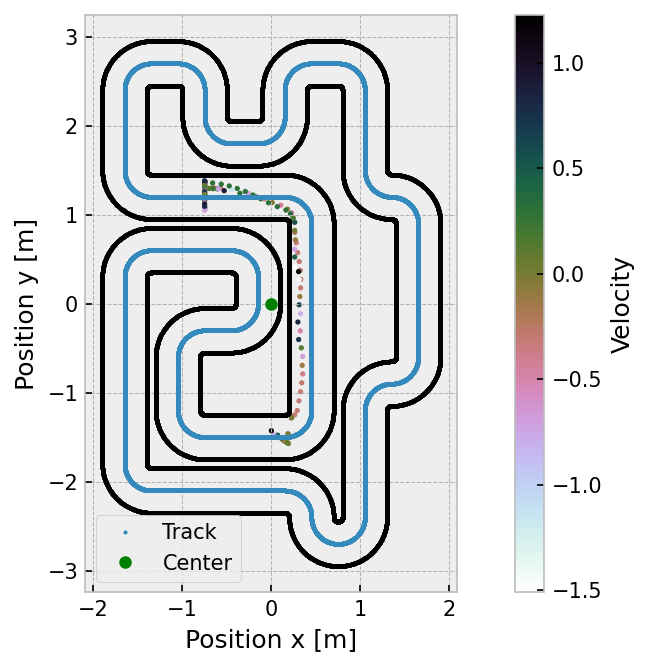

In [19]:
x_list = []
y_list = []

for i in range(x_simulated.shape[0]):
    xy = frenet_to_cartesian(x_simulated[i,0,:2], track_coord)
    x_list.append(xy[0].numpy())
    y_list.append(xy[1].numpy())

x_plot = np.array(x_list)
y_plot = np.array(y_list)

from matplotlib import cm


fig, ax = plt.subplots(1,1, figsize=(10,5), dpi=150)
gen.plotPoints(ax)
#gen.pointAtArcLength(0)
#gen.writePointsToYaml('../tracks/' + track_name + '.yaml', track_density)

custom_cmap = plt.get_cmap('cubehelix').reversed()
sct = ax.scatter(x_plot, y_plot, c=x_simulated[:,0,5].detach(), cmap=custom_cmap, s=4)

cbar = plt.colorbar(sct)
cbar.set_label('Velocity') 
#ax.plot(x_plot, y_plot)

#ax.scatter(x_plot[23:25], y_plot[23:25], color='red', s=4)

#ax.scatter(x_plot, y_plot, s=4, color='red')

print('x_init: ' + str(gen.xCoords[0]))
print('y_init: ' + str(gen.yCoords[0]))
print('yaw_init: ' + str(gen.tangentAngle[0]))
print('Total Arc Length: ' + str(gen.arcLength[-1]/2))
plt.show()

In [ ]:
x_simulated.numpy()[:,0,3]

In [ ]:
Q_test_batch.shape